In [1]:
#imports
# read multiple files 
import glob
import scipy.misc
import matplotlib.pyplot
import numpy
import scipy.special #for sigmoid function
import matplotlib.pyplot
%matplotlib inline


In [2]:
#neural network class definition
class neuralNetwork:
    
    #init the network
    def __init__(self, inputnodes, hiddennodes, outputnodes, learningrate):
        #set number of nodes in each layer
        self.inodes = inputnodes
        self.hnodes = hiddennodes
        self.onodes = outputnodes
        #learning rate
        self.lr = learningrate
        #link weight matrices, weight from input to hidden layer (wih)
        # wight from hidden to output layer (who)
        #initializing the weight matrices with a normal distributed value around 0
        self.wih = numpy.random.normal(0.0, pow(self.hnodes, -0.5), (self.hnodes, self.inodes))
        self.who = numpy.random.normal(0.0, pow(self.onodes, -0.5), (self.onodes, self.hnodes))
        #sigmoid function to scale the output of nodes
        #apply the sigmoid function to the input x and return it
        self.activation_function = lambda x:scipy.special.expit(x)
        self.inverse_activation_function = lambda x: scipy.special.logit(x)
        
        pass
    
    #train the network
    def train(self, input_list, targets_list):
        #conver input into a 2d array (T transforms matrix)
        inputs = numpy.array(input_list, ndmin=2).T
        targets = numpy.array(targets_list, ndmin=2).T
        
        #calculate signals into hidden layer
        hl_inputs = numpy.dot(self.wih, inputs)
        #signals from hidden layer
        hl_outputs = self.activation_function(hl_inputs)
        #signals into output layer
        ol_inputs = numpy.dot(self.who, hl_outputs)
        #signals from the output layer
        ol_outputs = self.activation_function(ol_inputs)
        
        #calculate errors (target - actual value)
        output_errors = targets - ol_outputs
        #hidden layer error is the output_errors split by weights, recombined at hidden nodes
        hidden_errors = numpy.dot(self.who.T, output_errors)
        
        #update weights for the links between the hidden and output layers
        self.who += self.lr*numpy.dot((output_errors*ol_outputs*(1.0-ol_outputs)), numpy.transpose(hl_outputs))
        #update weights for the links between the input and hidden layers
        self.wih += self.lr*numpy.dot((hidden_errors*hl_outputs*(1.0-hl_outputs)), numpy.transpose(inputs))
        
        pass
    
    #query the neutral network
    def querry(self, input_list):
        #convert the input in a 2d array (T transforms atrix)
        inputs = numpy.array(input_list, ndmin=2).T
        
        #signals into hidden layer
        hl_inputs = numpy.dot(self.wih, inputs)
        #signals from hidden layer
        hl_outputs = self.activation_function(hl_inputs)
        #signals into output layer
        ol_input = numpy.dot(self.who, hl_outputs)
        #signal from output layer
        ol_output = self.activation_function(ol_input)
        return ol_output
    # backquery the neural network
    #working like querry just backwards
    def backquery(self, targets_list):
        # transpose the targets
        final_outputs = numpy.array(targets_list, ndmin=2).T
        
        # calculate the signal into the output layer
        final_inputs = self.inverse_activation_function(final_outputs)

        # calculate the signal out of the hidden layer
        hidden_outputs = numpy.dot(self.who.T, final_inputs)
        # scale them back to 0.01 to .99
        hidden_outputs -= numpy.min(hidden_outputs)
        hidden_outputs /= numpy.max(hidden_outputs)
        hidden_outputs *= 0.98
        hidden_outputs += 0.01
        
        # calculate the signal into the hidden layer
        hidden_inputs = self.inverse_activation_function(hidden_outputs)
        
        # calculate the signal out of the input layer
        inputs = numpy.dot(self.wih.T, hidden_inputs)
        # scale the values back to 0.01 to .99
        inputs -= numpy.min(inputs)
        inputs /= numpy.max(inputs)
        inputs *= 0.98
        inputs += 0.01
        
        return inputs
    

In [3]:
#load the test data
test_data_file = open("D:\dataset\mnist_train.csv", 'r')
test_data_list = test_data_file.readlines()
test_data_file.close
#get the first test record
all_values = test_data_list[0].split(',')
#print the lable
#image_array = numpy.asfarray(all_values[1:]).reshape([28,28])
#matplotlib.pyplot.imshow(image_array, cmap='Greys', interpolation='None')

In [4]:
#init and first test of neural network
input_nodes = 784
hidden_nodes =200
output_nodes = 10
learning_rate = 0.2
#create instance of the network
n = neuralNetwork(input_nodes, hidden_nodes, output_nodes, learning_rate)
#load the training data file
training_data_file = open("D:\dataset\mnist_train.csv", 'r')
training_data_list = training_data_file.readlines()
training_data_file.close()
print("hi")
#train the neural network
#epochs are the number of learning processes (the number of times we iterate through the whole set)
epochs = 5
for e in range(epochs):
#go through all datasets
    i = 1
    for record in training_data_list:
        #split input by comma to get the number and data corresponding to it
        all_values = record.split(',')
        #scale and shift inputs
        inputs = (numpy.asfarray(all_values[1:]) / 255.0*0.99) + 0.01
        #create the target output values
        targets = numpy.zeros(output_nodes) + 0.01
        targets[int(all_values[0])] = 0.99
        n.train(inputs, targets)
        print("epoch: ", e, " : ", i, " out of: 60.000")
        i = i + 1
        pass
    print(e)
    pass
print("done")

hi
epoch:  0  :  1  out of: 60.000
epoch:  0  :  2  out of: 60.000
epoch:  0  :  3  out of: 60.000
epoch:  0  :  4  out of: 60.000
epoch:  0  :  5  out of: 60.000
epoch:  0  :  6  out of: 60.000
epoch:  0  :  7  out of: 60.000
epoch:  0  :  8  out of: 60.000
epoch:  0  :  9  out of: 60.000
epoch:  0  :  10  out of: 60.000
epoch:  0  :  11  out of: 60.000
epoch:  0  :  12  out of: 60.000
epoch:  0  :  13  out of: 60.000
epoch:  0  :  14  out of: 60.000
epoch:  0  :  15  out of: 60.000
epoch:  0  :  16  out of: 60.000
epoch:  0  :  17  out of: 60.000
epoch:  0  :  18  out of: 60.000
epoch:  0  :  19  out of: 60.000
epoch:  0  :  20  out of: 60.000
epoch:  0  :  21  out of: 60.000
epoch:  0  :  22  out of: 60.000
epoch:  0  :  23  out of: 60.000
epoch:  0  :  24  out of: 60.000
epoch:  0  :  25  out of: 60.000
epoch:  0  :  26  out of: 60.000
epoch:  0  :  27  out of: 60.000
epoch:  0  :  28  out of: 60.000
epoch:  0  :  29  out of: 60.000
epoch:  0  :  30  out of: 60.000
epoch:  0  :  31

epoch:  0  :  246  out of: 60.000
epoch:  0  :  247  out of: 60.000
epoch:  0  :  248  out of: 60.000
epoch:  0  :  249  out of: 60.000
epoch:  0  :  250  out of: 60.000
epoch:  0  :  251  out of: 60.000
epoch:  0  :  252  out of: 60.000
epoch:  0  :  253  out of: 60.000
epoch:  0  :  254  out of: 60.000
epoch:  0  :  255  out of: 60.000
epoch:  0  :  256  out of: 60.000
epoch:  0  :  257  out of: 60.000
epoch:  0  :  258  out of: 60.000
epoch:  0  :  259  out of: 60.000
epoch:  0  :  260  out of: 60.000
epoch:  0  :  261  out of: 60.000
epoch:  0  :  262  out of: 60.000
epoch:  0  :  263  out of: 60.000
epoch:  0  :  264  out of: 60.000
epoch:  0  :  265  out of: 60.000
epoch:  0  :  266  out of: 60.000
epoch:  0  :  267  out of: 60.000
epoch:  0  :  268  out of: 60.000
epoch:  0  :  269  out of: 60.000
epoch:  0  :  270  out of: 60.000
epoch:  0  :  271  out of: 60.000
epoch:  0  :  272  out of: 60.000
epoch:  0  :  273  out of: 60.000
epoch:  0  :  274  out of: 60.000
epoch:  0  :  

epoch:  0  :  496  out of: 60.000
epoch:  0  :  497  out of: 60.000
epoch:  0  :  498  out of: 60.000
epoch:  0  :  499  out of: 60.000
epoch:  0  :  500  out of: 60.000
epoch:  0  :  501  out of: 60.000
epoch:  0  :  502  out of: 60.000
epoch:  0  :  503  out of: 60.000
epoch:  0  :  504  out of: 60.000
epoch:  0  :  505  out of: 60.000
epoch:  0  :  506  out of: 60.000
epoch:  0  :  507  out of: 60.000
epoch:  0  :  508  out of: 60.000
epoch:  0  :  509  out of: 60.000
epoch:  0  :  510  out of: 60.000
epoch:  0  :  511  out of: 60.000
epoch:  0  :  512  out of: 60.000
epoch:  0  :  513  out of: 60.000
epoch:  0  :  514  out of: 60.000
epoch:  0  :  515  out of: 60.000
epoch:  0  :  516  out of: 60.000
epoch:  0  :  517  out of: 60.000
epoch:  0  :  518  out of: 60.000
epoch:  0  :  519  out of: 60.000
epoch:  0  :  520  out of: 60.000
epoch:  0  :  521  out of: 60.000
epoch:  0  :  522  out of: 60.000
epoch:  0  :  523  out of: 60.000
epoch:  0  :  524  out of: 60.000
epoch:  0  :  

epoch:  0  :  774  out of: 60.000
epoch:  0  :  775  out of: 60.000
epoch:  0  :  776  out of: 60.000
epoch:  0  :  777  out of: 60.000
epoch:  0  :  778  out of: 60.000
epoch:  0  :  779  out of: 60.000
epoch:  0  :  780  out of: 60.000
epoch:  0  :  781  out of: 60.000
epoch:  0  :  782  out of: 60.000
epoch:  0  :  783  out of: 60.000
epoch:  0  :  784  out of: 60.000
epoch:  0  :  785  out of: 60.000
epoch:  0  :  786  out of: 60.000
epoch:  0  :  787  out of: 60.000
epoch:  0  :  788  out of: 60.000
epoch:  0  :  789  out of: 60.000
epoch:  0  :  790  out of: 60.000
epoch:  0  :  791  out of: 60.000
epoch:  0  :  792  out of: 60.000
epoch:  0  :  793  out of: 60.000
epoch:  0  :  794  out of: 60.000
epoch:  0  :  795  out of: 60.000
epoch:  0  :  796  out of: 60.000
epoch:  0  :  797  out of: 60.000
epoch:  0  :  798  out of: 60.000
epoch:  0  :  799  out of: 60.000
epoch:  0  :  800  out of: 60.000
epoch:  0  :  801  out of: 60.000
epoch:  0  :  802  out of: 60.000
epoch:  0  :  

epoch:  0  :  1052  out of: 60.000
epoch:  0  :  1053  out of: 60.000
epoch:  0  :  1054  out of: 60.000
epoch:  0  :  1055  out of: 60.000
epoch:  0  :  1056  out of: 60.000
epoch:  0  :  1057  out of: 60.000
epoch:  0  :  1058  out of: 60.000
epoch:  0  :  1059  out of: 60.000
epoch:  0  :  1060  out of: 60.000
epoch:  0  :  1061  out of: 60.000
epoch:  0  :  1062  out of: 60.000
epoch:  0  :  1063  out of: 60.000
epoch:  0  :  1064  out of: 60.000
epoch:  0  :  1065  out of: 60.000
epoch:  0  :  1066  out of: 60.000
epoch:  0  :  1067  out of: 60.000
epoch:  0  :  1068  out of: 60.000
epoch:  0  :  1069  out of: 60.000
epoch:  0  :  1070  out of: 60.000
epoch:  0  :  1071  out of: 60.000
epoch:  0  :  1072  out of: 60.000
epoch:  0  :  1073  out of: 60.000
epoch:  0  :  1074  out of: 60.000
epoch:  0  :  1075  out of: 60.000
epoch:  0  :  1076  out of: 60.000
epoch:  0  :  1077  out of: 60.000
epoch:  0  :  1078  out of: 60.000
epoch:  0  :  1079  out of: 60.000
epoch:  0  :  1080  

epoch:  0  :  1328  out of: 60.000
epoch:  0  :  1329  out of: 60.000
epoch:  0  :  1330  out of: 60.000
epoch:  0  :  1331  out of: 60.000
epoch:  0  :  1332  out of: 60.000
epoch:  0  :  1333  out of: 60.000
epoch:  0  :  1334  out of: 60.000
epoch:  0  :  1335  out of: 60.000
epoch:  0  :  1336  out of: 60.000
epoch:  0  :  1337  out of: 60.000
epoch:  0  :  1338  out of: 60.000
epoch:  0  :  1339  out of: 60.000
epoch:  0  :  1340  out of: 60.000
epoch:  0  :  1341  out of: 60.000
epoch:  0  :  1342  out of: 60.000
epoch:  0  :  1343  out of: 60.000
epoch:  0  :  1344  out of: 60.000
epoch:  0  :  1345  out of: 60.000
epoch:  0  :  1346  out of: 60.000
epoch:  0  :  1347  out of: 60.000
epoch:  0  :  1348  out of: 60.000
epoch:  0  :  1349  out of: 60.000
epoch:  0  :  1350  out of: 60.000
epoch:  0  :  1351  out of: 60.000
epoch:  0  :  1352  out of: 60.000
epoch:  0  :  1353  out of: 60.000
epoch:  0  :  1354  out of: 60.000
epoch:  0  :  1355  out of: 60.000
epoch:  0  :  1356  

epoch:  0  :  1606  out of: 60.000
epoch:  0  :  1607  out of: 60.000
epoch:  0  :  1608  out of: 60.000
epoch:  0  :  1609  out of: 60.000
epoch:  0  :  1610  out of: 60.000
epoch:  0  :  1611  out of: 60.000
epoch:  0  :  1612  out of: 60.000
epoch:  0  :  1613  out of: 60.000
epoch:  0  :  1614  out of: 60.000
epoch:  0  :  1615  out of: 60.000
epoch:  0  :  1616  out of: 60.000
epoch:  0  :  1617  out of: 60.000
epoch:  0  :  1618  out of: 60.000
epoch:  0  :  1619  out of: 60.000
epoch:  0  :  1620  out of: 60.000
epoch:  0  :  1621  out of: 60.000
epoch:  0  :  1622  out of: 60.000
epoch:  0  :  1623  out of: 60.000
epoch:  0  :  1624  out of: 60.000
epoch:  0  :  1625  out of: 60.000
epoch:  0  :  1626  out of: 60.000
epoch:  0  :  1627  out of: 60.000
epoch:  0  :  1628  out of: 60.000
epoch:  0  :  1629  out of: 60.000
epoch:  0  :  1630  out of: 60.000
epoch:  0  :  1631  out of: 60.000
epoch:  0  :  1632  out of: 60.000
epoch:  0  :  1633  out of: 60.000
epoch:  0  :  1634  

epoch:  0  :  1883  out of: 60.000
epoch:  0  :  1884  out of: 60.000
epoch:  0  :  1885  out of: 60.000
epoch:  0  :  1886  out of: 60.000
epoch:  0  :  1887  out of: 60.000
epoch:  0  :  1888  out of: 60.000
epoch:  0  :  1889  out of: 60.000
epoch:  0  :  1890  out of: 60.000
epoch:  0  :  1891  out of: 60.000
epoch:  0  :  1892  out of: 60.000
epoch:  0  :  1893  out of: 60.000
epoch:  0  :  1894  out of: 60.000
epoch:  0  :  1895  out of: 60.000
epoch:  0  :  1896  out of: 60.000
epoch:  0  :  1897  out of: 60.000
epoch:  0  :  1898  out of: 60.000
epoch:  0  :  1899  out of: 60.000
epoch:  0  :  1900  out of: 60.000
epoch:  0  :  1901  out of: 60.000
epoch:  0  :  1902  out of: 60.000
epoch:  0  :  1903  out of: 60.000
epoch:  0  :  1904  out of: 60.000
epoch:  0  :  1905  out of: 60.000
epoch:  0  :  1906  out of: 60.000
epoch:  0  :  1907  out of: 60.000
epoch:  0  :  1908  out of: 60.000
epoch:  0  :  1909  out of: 60.000
epoch:  0  :  1910  out of: 60.000
epoch:  0  :  1911  

epoch:  0  :  2161  out of: 60.000
epoch:  0  :  2162  out of: 60.000
epoch:  0  :  2163  out of: 60.000
epoch:  0  :  2164  out of: 60.000
epoch:  0  :  2165  out of: 60.000
epoch:  0  :  2166  out of: 60.000
epoch:  0  :  2167  out of: 60.000
epoch:  0  :  2168  out of: 60.000
epoch:  0  :  2169  out of: 60.000
epoch:  0  :  2170  out of: 60.000
epoch:  0  :  2171  out of: 60.000
epoch:  0  :  2172  out of: 60.000
epoch:  0  :  2173  out of: 60.000
epoch:  0  :  2174  out of: 60.000
epoch:  0  :  2175  out of: 60.000
epoch:  0  :  2176  out of: 60.000
epoch:  0  :  2177  out of: 60.000
epoch:  0  :  2178  out of: 60.000
epoch:  0  :  2179  out of: 60.000
epoch:  0  :  2180  out of: 60.000
epoch:  0  :  2181  out of: 60.000
epoch:  0  :  2182  out of: 60.000
epoch:  0  :  2183  out of: 60.000
epoch:  0  :  2184  out of: 60.000
epoch:  0  :  2185  out of: 60.000
epoch:  0  :  2186  out of: 60.000
epoch:  0  :  2187  out of: 60.000
epoch:  0  :  2188  out of: 60.000
epoch:  0  :  2189  

epoch:  0  :  2439  out of: 60.000
epoch:  0  :  2440  out of: 60.000
epoch:  0  :  2441  out of: 60.000
epoch:  0  :  2442  out of: 60.000
epoch:  0  :  2443  out of: 60.000
epoch:  0  :  2444  out of: 60.000
epoch:  0  :  2445  out of: 60.000
epoch:  0  :  2446  out of: 60.000
epoch:  0  :  2447  out of: 60.000
epoch:  0  :  2448  out of: 60.000
epoch:  0  :  2449  out of: 60.000
epoch:  0  :  2450  out of: 60.000
epoch:  0  :  2451  out of: 60.000
epoch:  0  :  2452  out of: 60.000
epoch:  0  :  2453  out of: 60.000
epoch:  0  :  2454  out of: 60.000
epoch:  0  :  2455  out of: 60.000
epoch:  0  :  2456  out of: 60.000
epoch:  0  :  2457  out of: 60.000
epoch:  0  :  2458  out of: 60.000
epoch:  0  :  2459  out of: 60.000
epoch:  0  :  2460  out of: 60.000
epoch:  0  :  2461  out of: 60.000
epoch:  0  :  2462  out of: 60.000
epoch:  0  :  2463  out of: 60.000
epoch:  0  :  2464  out of: 60.000
epoch:  0  :  2465  out of: 60.000
epoch:  0  :  2466  out of: 60.000
epoch:  0  :  2467  

epoch:  0  :  2719  out of: 60.000
epoch:  0  :  2720  out of: 60.000
epoch:  0  :  2721  out of: 60.000
epoch:  0  :  2722  out of: 60.000
epoch:  0  :  2723  out of: 60.000
epoch:  0  :  2724  out of: 60.000
epoch:  0  :  2725  out of: 60.000
epoch:  0  :  2726  out of: 60.000
epoch:  0  :  2727  out of: 60.000
epoch:  0  :  2728  out of: 60.000
epoch:  0  :  2729  out of: 60.000
epoch:  0  :  2730  out of: 60.000
epoch:  0  :  2731  out of: 60.000
epoch:  0  :  2732  out of: 60.000
epoch:  0  :  2733  out of: 60.000
epoch:  0  :  2734  out of: 60.000
epoch:  0  :  2735  out of: 60.000
epoch:  0  :  2736  out of: 60.000
epoch:  0  :  2737  out of: 60.000
epoch:  0  :  2738  out of: 60.000
epoch:  0  :  2739  out of: 60.000
epoch:  0  :  2740  out of: 60.000
epoch:  0  :  2741  out of: 60.000
epoch:  0  :  2742  out of: 60.000
epoch:  0  :  2743  out of: 60.000
epoch:  0  :  2744  out of: 60.000
epoch:  0  :  2745  out of: 60.000
epoch:  0  :  2746  out of: 60.000
epoch:  0  :  2747  

epoch:  0  :  2997  out of: 60.000
epoch:  0  :  2998  out of: 60.000
epoch:  0  :  2999  out of: 60.000
epoch:  0  :  3000  out of: 60.000
epoch:  0  :  3001  out of: 60.000
epoch:  0  :  3002  out of: 60.000
epoch:  0  :  3003  out of: 60.000
epoch:  0  :  3004  out of: 60.000
epoch:  0  :  3005  out of: 60.000
epoch:  0  :  3006  out of: 60.000
epoch:  0  :  3007  out of: 60.000
epoch:  0  :  3008  out of: 60.000
epoch:  0  :  3009  out of: 60.000
epoch:  0  :  3010  out of: 60.000
epoch:  0  :  3011  out of: 60.000
epoch:  0  :  3012  out of: 60.000
epoch:  0  :  3013  out of: 60.000
epoch:  0  :  3014  out of: 60.000
epoch:  0  :  3015  out of: 60.000
epoch:  0  :  3016  out of: 60.000
epoch:  0  :  3017  out of: 60.000
epoch:  0  :  3018  out of: 60.000
epoch:  0  :  3019  out of: 60.000
epoch:  0  :  3020  out of: 60.000
epoch:  0  :  3021  out of: 60.000
epoch:  0  :  3022  out of: 60.000
epoch:  0  :  3023  out of: 60.000
epoch:  0  :  3024  out of: 60.000
epoch:  0  :  3025  

epoch:  0  :  3275  out of: 60.000
epoch:  0  :  3276  out of: 60.000
epoch:  0  :  3277  out of: 60.000
epoch:  0  :  3278  out of: 60.000
epoch:  0  :  3279  out of: 60.000
epoch:  0  :  3280  out of: 60.000
epoch:  0  :  3281  out of: 60.000
epoch:  0  :  3282  out of: 60.000
epoch:  0  :  3283  out of: 60.000
epoch:  0  :  3284  out of: 60.000
epoch:  0  :  3285  out of: 60.000
epoch:  0  :  3286  out of: 60.000
epoch:  0  :  3287  out of: 60.000
epoch:  0  :  3288  out of: 60.000
epoch:  0  :  3289  out of: 60.000
epoch:  0  :  3290  out of: 60.000
epoch:  0  :  3291  out of: 60.000
epoch:  0  :  3292  out of: 60.000
epoch:  0  :  3293  out of: 60.000
epoch:  0  :  3294  out of: 60.000
epoch:  0  :  3295  out of: 60.000
epoch:  0  :  3296  out of: 60.000
epoch:  0  :  3297  out of: 60.000
epoch:  0  :  3298  out of: 60.000
epoch:  0  :  3299  out of: 60.000
epoch:  0  :  3300  out of: 60.000
epoch:  0  :  3301  out of: 60.000
epoch:  0  :  3302  out of: 60.000
epoch:  0  :  3303  

epoch:  0  :  3522  out of: 60.000
epoch:  0  :  3523  out of: 60.000
epoch:  0  :  3524  out of: 60.000
epoch:  0  :  3525  out of: 60.000
epoch:  0  :  3526  out of: 60.000
epoch:  0  :  3527  out of: 60.000
epoch:  0  :  3528  out of: 60.000
epoch:  0  :  3529  out of: 60.000
epoch:  0  :  3530  out of: 60.000
epoch:  0  :  3531  out of: 60.000
epoch:  0  :  3532  out of: 60.000
epoch:  0  :  3533  out of: 60.000
epoch:  0  :  3534  out of: 60.000
epoch:  0  :  3535  out of: 60.000
epoch:  0  :  3536  out of: 60.000
epoch:  0  :  3537  out of: 60.000
epoch:  0  :  3538  out of: 60.000
epoch:  0  :  3539  out of: 60.000
epoch:  0  :  3540  out of: 60.000
epoch:  0  :  3541  out of: 60.000
epoch:  0  :  3542  out of: 60.000
epoch:  0  :  3543  out of: 60.000
epoch:  0  :  3544  out of: 60.000
epoch:  0  :  3545  out of: 60.000
epoch:  0  :  3546  out of: 60.000
epoch:  0  :  3547  out of: 60.000
epoch:  0  :  3548  out of: 60.000
epoch:  0  :  3549  out of: 60.000
epoch:  0  :  3550  

epoch:  0  :  3780  out of: 60.000
epoch:  0  :  3781  out of: 60.000
epoch:  0  :  3782  out of: 60.000
epoch:  0  :  3783  out of: 60.000
epoch:  0  :  3784  out of: 60.000
epoch:  0  :  3785  out of: 60.000
epoch:  0  :  3786  out of: 60.000
epoch:  0  :  3787  out of: 60.000
epoch:  0  :  3788  out of: 60.000
epoch:  0  :  3789  out of: 60.000
epoch:  0  :  3790  out of: 60.000
epoch:  0  :  3791  out of: 60.000
epoch:  0  :  3792  out of: 60.000
epoch:  0  :  3793  out of: 60.000
epoch:  0  :  3794  out of: 60.000
epoch:  0  :  3795  out of: 60.000
epoch:  0  :  3796  out of: 60.000
epoch:  0  :  3797  out of: 60.000
epoch:  0  :  3798  out of: 60.000
epoch:  0  :  3799  out of: 60.000
epoch:  0  :  3800  out of: 60.000
epoch:  0  :  3801  out of: 60.000
epoch:  0  :  3802  out of: 60.000
epoch:  0  :  3803  out of: 60.000
epoch:  0  :  3804  out of: 60.000
epoch:  0  :  3805  out of: 60.000
epoch:  0  :  3806  out of: 60.000
epoch:  0  :  3807  out of: 60.000
epoch:  0  :  3808  

epoch:  0  :  4016  out of: 60.000
epoch:  0  :  4017  out of: 60.000
epoch:  0  :  4018  out of: 60.000
epoch:  0  :  4019  out of: 60.000
epoch:  0  :  4020  out of: 60.000
epoch:  0  :  4021  out of: 60.000
epoch:  0  :  4022  out of: 60.000
epoch:  0  :  4023  out of: 60.000
epoch:  0  :  4024  out of: 60.000
epoch:  0  :  4025  out of: 60.000
epoch:  0  :  4026  out of: 60.000
epoch:  0  :  4027  out of: 60.000
epoch:  0  :  4028  out of: 60.000
epoch:  0  :  4029  out of: 60.000
epoch:  0  :  4030  out of: 60.000
epoch:  0  :  4031  out of: 60.000
epoch:  0  :  4032  out of: 60.000
epoch:  0  :  4033  out of: 60.000
epoch:  0  :  4034  out of: 60.000
epoch:  0  :  4035  out of: 60.000
epoch:  0  :  4036  out of: 60.000
epoch:  0  :  4037  out of: 60.000
epoch:  0  :  4038  out of: 60.000
epoch:  0  :  4039  out of: 60.000
epoch:  0  :  4040  out of: 60.000
epoch:  0  :  4041  out of: 60.000
epoch:  0  :  4042  out of: 60.000
epoch:  0  :  4043  out of: 60.000
epoch:  0  :  4044  

epoch:  0  :  4289  out of: 60.000
epoch:  0  :  4290  out of: 60.000
epoch:  0  :  4291  out of: 60.000
epoch:  0  :  4292  out of: 60.000
epoch:  0  :  4293  out of: 60.000
epoch:  0  :  4294  out of: 60.000
epoch:  0  :  4295  out of: 60.000
epoch:  0  :  4296  out of: 60.000
epoch:  0  :  4297  out of: 60.000
epoch:  0  :  4298  out of: 60.000
epoch:  0  :  4299  out of: 60.000
epoch:  0  :  4300  out of: 60.000
epoch:  0  :  4301  out of: 60.000
epoch:  0  :  4302  out of: 60.000
epoch:  0  :  4303  out of: 60.000
epoch:  0  :  4304  out of: 60.000
epoch:  0  :  4305  out of: 60.000
epoch:  0  :  4306  out of: 60.000
epoch:  0  :  4307  out of: 60.000
epoch:  0  :  4308  out of: 60.000
epoch:  0  :  4309  out of: 60.000
epoch:  0  :  4310  out of: 60.000
epoch:  0  :  4311  out of: 60.000
epoch:  0  :  4312  out of: 60.000
epoch:  0  :  4313  out of: 60.000
epoch:  0  :  4314  out of: 60.000
epoch:  0  :  4315  out of: 60.000
epoch:  0  :  4316  out of: 60.000
epoch:  0  :  4317  

epoch:  0  :  4555  out of: 60.000
epoch:  0  :  4556  out of: 60.000
epoch:  0  :  4557  out of: 60.000
epoch:  0  :  4558  out of: 60.000
epoch:  0  :  4559  out of: 60.000
epoch:  0  :  4560  out of: 60.000
epoch:  0  :  4561  out of: 60.000
epoch:  0  :  4562  out of: 60.000
epoch:  0  :  4563  out of: 60.000
epoch:  0  :  4564  out of: 60.000
epoch:  0  :  4565  out of: 60.000
epoch:  0  :  4566  out of: 60.000
epoch:  0  :  4567  out of: 60.000
epoch:  0  :  4568  out of: 60.000
epoch:  0  :  4569  out of: 60.000
epoch:  0  :  4570  out of: 60.000
epoch:  0  :  4571  out of: 60.000
epoch:  0  :  4572  out of: 60.000
epoch:  0  :  4573  out of: 60.000
epoch:  0  :  4574  out of: 60.000
epoch:  0  :  4575  out of: 60.000
epoch:  0  :  4576  out of: 60.000
epoch:  0  :  4577  out of: 60.000
epoch:  0  :  4578  out of: 60.000
epoch:  0  :  4579  out of: 60.000
epoch:  0  :  4580  out of: 60.000
epoch:  0  :  4581  out of: 60.000
epoch:  0  :  4582  out of: 60.000
epoch:  0  :  4583  

epoch:  0  :  4796  out of: 60.000
epoch:  0  :  4797  out of: 60.000
epoch:  0  :  4798  out of: 60.000
epoch:  0  :  4799  out of: 60.000
epoch:  0  :  4800  out of: 60.000
epoch:  0  :  4801  out of: 60.000
epoch:  0  :  4802  out of: 60.000
epoch:  0  :  4803  out of: 60.000
epoch:  0  :  4804  out of: 60.000
epoch:  0  :  4805  out of: 60.000
epoch:  0  :  4806  out of: 60.000
epoch:  0  :  4807  out of: 60.000
epoch:  0  :  4808  out of: 60.000
epoch:  0  :  4809  out of: 60.000
epoch:  0  :  4810  out of: 60.000
epoch:  0  :  4811  out of: 60.000
epoch:  0  :  4812  out of: 60.000
epoch:  0  :  4813  out of: 60.000
epoch:  0  :  4814  out of: 60.000
epoch:  0  :  4815  out of: 60.000
epoch:  0  :  4816  out of: 60.000
epoch:  0  :  4817  out of: 60.000
epoch:  0  :  4818  out of: 60.000
epoch:  0  :  4819  out of: 60.000
epoch:  0  :  4820  out of: 60.000
epoch:  0  :  4821  out of: 60.000
epoch:  0  :  4822  out of: 60.000
epoch:  0  :  4823  out of: 60.000
epoch:  0  :  4824  

epoch:  0  :  5083  out of: 60.000
epoch:  0  :  5084  out of: 60.000
epoch:  0  :  5085  out of: 60.000
epoch:  0  :  5086  out of: 60.000
epoch:  0  :  5087  out of: 60.000
epoch:  0  :  5088  out of: 60.000
epoch:  0  :  5089  out of: 60.000
epoch:  0  :  5090  out of: 60.000
epoch:  0  :  5091  out of: 60.000
epoch:  0  :  5092  out of: 60.000
epoch:  0  :  5093  out of: 60.000
epoch:  0  :  5094  out of: 60.000
epoch:  0  :  5095  out of: 60.000
epoch:  0  :  5096  out of: 60.000
epoch:  0  :  5097  out of: 60.000
epoch:  0  :  5098  out of: 60.000
epoch:  0  :  5099  out of: 60.000
epoch:  0  :  5100  out of: 60.000
epoch:  0  :  5101  out of: 60.000
epoch:  0  :  5102  out of: 60.000
epoch:  0  :  5103  out of: 60.000
epoch:  0  :  5104  out of: 60.000
epoch:  0  :  5105  out of: 60.000
epoch:  0  :  5106  out of: 60.000
epoch:  0  :  5107  out of: 60.000
epoch:  0  :  5108  out of: 60.000
epoch:  0  :  5109  out of: 60.000
epoch:  0  :  5110  out of: 60.000
epoch:  0  :  5111  

epoch:  0  :  5318  out of: 60.000
epoch:  0  :  5319  out of: 60.000
epoch:  0  :  5320  out of: 60.000
epoch:  0  :  5321  out of: 60.000
epoch:  0  :  5322  out of: 60.000
epoch:  0  :  5323  out of: 60.000
epoch:  0  :  5324  out of: 60.000
epoch:  0  :  5325  out of: 60.000
epoch:  0  :  5326  out of: 60.000
epoch:  0  :  5327  out of: 60.000
epoch:  0  :  5328  out of: 60.000
epoch:  0  :  5329  out of: 60.000
epoch:  0  :  5330  out of: 60.000
epoch:  0  :  5331  out of: 60.000
epoch:  0  :  5332  out of: 60.000
epoch:  0  :  5333  out of: 60.000
epoch:  0  :  5334  out of: 60.000
epoch:  0  :  5335  out of: 60.000
epoch:  0  :  5336  out of: 60.000
epoch:  0  :  5337  out of: 60.000
epoch:  0  :  5338  out of: 60.000
epoch:  0  :  5339  out of: 60.000
epoch:  0  :  5340  out of: 60.000
epoch:  0  :  5341  out of: 60.000
epoch:  0  :  5342  out of: 60.000
epoch:  0  :  5343  out of: 60.000
epoch:  0  :  5344  out of: 60.000
epoch:  0  :  5345  out of: 60.000
epoch:  0  :  5346  

epoch:  0  :  5566  out of: 60.000
epoch:  0  :  5567  out of: 60.000
epoch:  0  :  5568  out of: 60.000
epoch:  0  :  5569  out of: 60.000
epoch:  0  :  5570  out of: 60.000
epoch:  0  :  5571  out of: 60.000
epoch:  0  :  5572  out of: 60.000
epoch:  0  :  5573  out of: 60.000
epoch:  0  :  5574  out of: 60.000
epoch:  0  :  5575  out of: 60.000
epoch:  0  :  5576  out of: 60.000
epoch:  0  :  5577  out of: 60.000
epoch:  0  :  5578  out of: 60.000
epoch:  0  :  5579  out of: 60.000
epoch:  0  :  5580  out of: 60.000
epoch:  0  :  5581  out of: 60.000
epoch:  0  :  5582  out of: 60.000
epoch:  0  :  5583  out of: 60.000
epoch:  0  :  5584  out of: 60.000
epoch:  0  :  5585  out of: 60.000
epoch:  0  :  5586  out of: 60.000
epoch:  0  :  5587  out of: 60.000
epoch:  0  :  5588  out of: 60.000
epoch:  0  :  5589  out of: 60.000
epoch:  0  :  5590  out of: 60.000
epoch:  0  :  5591  out of: 60.000
epoch:  0  :  5592  out of: 60.000
epoch:  0  :  5593  out of: 60.000
epoch:  0  :  5594  

epoch:  0  :  5850  out of: 60.000
epoch:  0  :  5851  out of: 60.000
epoch:  0  :  5852  out of: 60.000
epoch:  0  :  5853  out of: 60.000
epoch:  0  :  5854  out of: 60.000
epoch:  0  :  5855  out of: 60.000
epoch:  0  :  5856  out of: 60.000
epoch:  0  :  5857  out of: 60.000
epoch:  0  :  5858  out of: 60.000
epoch:  0  :  5859  out of: 60.000
epoch:  0  :  5860  out of: 60.000
epoch:  0  :  5861  out of: 60.000
epoch:  0  :  5862  out of: 60.000
epoch:  0  :  5863  out of: 60.000
epoch:  0  :  5864  out of: 60.000
epoch:  0  :  5865  out of: 60.000
epoch:  0  :  5866  out of: 60.000
epoch:  0  :  5867  out of: 60.000
epoch:  0  :  5868  out of: 60.000
epoch:  0  :  5869  out of: 60.000
epoch:  0  :  5870  out of: 60.000
epoch:  0  :  5871  out of: 60.000
epoch:  0  :  5872  out of: 60.000
epoch:  0  :  5873  out of: 60.000
epoch:  0  :  5874  out of: 60.000
epoch:  0  :  5875  out of: 60.000
epoch:  0  :  5876  out of: 60.000
epoch:  0  :  5877  out of: 60.000
epoch:  0  :  5878  

epoch:  0  :  6130  out of: 60.000
epoch:  0  :  6131  out of: 60.000
epoch:  0  :  6132  out of: 60.000
epoch:  0  :  6133  out of: 60.000
epoch:  0  :  6134  out of: 60.000
epoch:  0  :  6135  out of: 60.000
epoch:  0  :  6136  out of: 60.000
epoch:  0  :  6137  out of: 60.000
epoch:  0  :  6138  out of: 60.000
epoch:  0  :  6139  out of: 60.000
epoch:  0  :  6140  out of: 60.000
epoch:  0  :  6141  out of: 60.000
epoch:  0  :  6142  out of: 60.000
epoch:  0  :  6143  out of: 60.000
epoch:  0  :  6144  out of: 60.000
epoch:  0  :  6145  out of: 60.000
epoch:  0  :  6146  out of: 60.000
epoch:  0  :  6147  out of: 60.000
epoch:  0  :  6148  out of: 60.000
epoch:  0  :  6149  out of: 60.000
epoch:  0  :  6150  out of: 60.000
epoch:  0  :  6151  out of: 60.000
epoch:  0  :  6152  out of: 60.000
epoch:  0  :  6153  out of: 60.000
epoch:  0  :  6154  out of: 60.000
epoch:  0  :  6155  out of: 60.000
epoch:  0  :  6156  out of: 60.000
epoch:  0  :  6157  out of: 60.000
epoch:  0  :  6158  

epoch:  0  :  6370  out of: 60.000
epoch:  0  :  6371  out of: 60.000
epoch:  0  :  6372  out of: 60.000
epoch:  0  :  6373  out of: 60.000
epoch:  0  :  6374  out of: 60.000
epoch:  0  :  6375  out of: 60.000
epoch:  0  :  6376  out of: 60.000
epoch:  0  :  6377  out of: 60.000
epoch:  0  :  6378  out of: 60.000
epoch:  0  :  6379  out of: 60.000
epoch:  0  :  6380  out of: 60.000
epoch:  0  :  6381  out of: 60.000
epoch:  0  :  6382  out of: 60.000
epoch:  0  :  6383  out of: 60.000
epoch:  0  :  6384  out of: 60.000
epoch:  0  :  6385  out of: 60.000
epoch:  0  :  6386  out of: 60.000
epoch:  0  :  6387  out of: 60.000
epoch:  0  :  6388  out of: 60.000
epoch:  0  :  6389  out of: 60.000
epoch:  0  :  6390  out of: 60.000
epoch:  0  :  6391  out of: 60.000
epoch:  0  :  6392  out of: 60.000
epoch:  0  :  6393  out of: 60.000
epoch:  0  :  6394  out of: 60.000
epoch:  0  :  6395  out of: 60.000
epoch:  0  :  6396  out of: 60.000
epoch:  0  :  6397  out of: 60.000
epoch:  0  :  6398  

epoch:  0  :  6620  out of: 60.000
epoch:  0  :  6621  out of: 60.000
epoch:  0  :  6622  out of: 60.000
epoch:  0  :  6623  out of: 60.000
epoch:  0  :  6624  out of: 60.000
epoch:  0  :  6625  out of: 60.000
epoch:  0  :  6626  out of: 60.000
epoch:  0  :  6627  out of: 60.000
epoch:  0  :  6628  out of: 60.000
epoch:  0  :  6629  out of: 60.000
epoch:  0  :  6630  out of: 60.000
epoch:  0  :  6631  out of: 60.000
epoch:  0  :  6632  out of: 60.000
epoch:  0  :  6633  out of: 60.000
epoch:  0  :  6634  out of: 60.000
epoch:  0  :  6635  out of: 60.000
epoch:  0  :  6636  out of: 60.000
epoch:  0  :  6637  out of: 60.000
epoch:  0  :  6638  out of: 60.000
epoch:  0  :  6639  out of: 60.000
epoch:  0  :  6640  out of: 60.000
epoch:  0  :  6641  out of: 60.000
epoch:  0  :  6642  out of: 60.000
epoch:  0  :  6643  out of: 60.000
epoch:  0  :  6644  out of: 60.000
epoch:  0  :  6645  out of: 60.000
epoch:  0  :  6646  out of: 60.000
epoch:  0  :  6647  out of: 60.000
epoch:  0  :  6648  

epoch:  0  :  6855  out of: 60.000
epoch:  0  :  6856  out of: 60.000
epoch:  0  :  6857  out of: 60.000
epoch:  0  :  6858  out of: 60.000
epoch:  0  :  6859  out of: 60.000
epoch:  0  :  6860  out of: 60.000
epoch:  0  :  6861  out of: 60.000
epoch:  0  :  6862  out of: 60.000
epoch:  0  :  6863  out of: 60.000
epoch:  0  :  6864  out of: 60.000
epoch:  0  :  6865  out of: 60.000
epoch:  0  :  6866  out of: 60.000
epoch:  0  :  6867  out of: 60.000
epoch:  0  :  6868  out of: 60.000
epoch:  0  :  6869  out of: 60.000
epoch:  0  :  6870  out of: 60.000
epoch:  0  :  6871  out of: 60.000
epoch:  0  :  6872  out of: 60.000
epoch:  0  :  6873  out of: 60.000
epoch:  0  :  6874  out of: 60.000
epoch:  0  :  6875  out of: 60.000
epoch:  0  :  6876  out of: 60.000
epoch:  0  :  6877  out of: 60.000
epoch:  0  :  6878  out of: 60.000
epoch:  0  :  6879  out of: 60.000
epoch:  0  :  6880  out of: 60.000
epoch:  0  :  6881  out of: 60.000
epoch:  0  :  6882  out of: 60.000
epoch:  0  :  6883  

epoch:  0  :  7096  out of: 60.000
epoch:  0  :  7097  out of: 60.000
epoch:  0  :  7098  out of: 60.000
epoch:  0  :  7099  out of: 60.000
epoch:  0  :  7100  out of: 60.000
epoch:  0  :  7101  out of: 60.000
epoch:  0  :  7102  out of: 60.000
epoch:  0  :  7103  out of: 60.000
epoch:  0  :  7104  out of: 60.000
epoch:  0  :  7105  out of: 60.000
epoch:  0  :  7106  out of: 60.000
epoch:  0  :  7107  out of: 60.000
epoch:  0  :  7108  out of: 60.000
epoch:  0  :  7109  out of: 60.000
epoch:  0  :  7110  out of: 60.000
epoch:  0  :  7111  out of: 60.000
epoch:  0  :  7112  out of: 60.000
epoch:  0  :  7113  out of: 60.000
epoch:  0  :  7114  out of: 60.000
epoch:  0  :  7115  out of: 60.000
epoch:  0  :  7116  out of: 60.000
epoch:  0  :  7117  out of: 60.000
epoch:  0  :  7118  out of: 60.000
epoch:  0  :  7119  out of: 60.000
epoch:  0  :  7120  out of: 60.000
epoch:  0  :  7121  out of: 60.000
epoch:  0  :  7122  out of: 60.000
epoch:  0  :  7123  out of: 60.000
epoch:  0  :  7124  

epoch:  0  :  7387  out of: 60.000
epoch:  0  :  7388  out of: 60.000
epoch:  0  :  7389  out of: 60.000
epoch:  0  :  7390  out of: 60.000
epoch:  0  :  7391  out of: 60.000
epoch:  0  :  7392  out of: 60.000
epoch:  0  :  7393  out of: 60.000
epoch:  0  :  7394  out of: 60.000
epoch:  0  :  7395  out of: 60.000
epoch:  0  :  7396  out of: 60.000
epoch:  0  :  7397  out of: 60.000
epoch:  0  :  7398  out of: 60.000
epoch:  0  :  7399  out of: 60.000
epoch:  0  :  7400  out of: 60.000
epoch:  0  :  7401  out of: 60.000
epoch:  0  :  7402  out of: 60.000
epoch:  0  :  7403  out of: 60.000
epoch:  0  :  7404  out of: 60.000
epoch:  0  :  7405  out of: 60.000
epoch:  0  :  7406  out of: 60.000
epoch:  0  :  7407  out of: 60.000
epoch:  0  :  7408  out of: 60.000
epoch:  0  :  7409  out of: 60.000
epoch:  0  :  7410  out of: 60.000
epoch:  0  :  7411  out of: 60.000
epoch:  0  :  7412  out of: 60.000
epoch:  0  :  7413  out of: 60.000
epoch:  0  :  7414  out of: 60.000
epoch:  0  :  7415  

epoch:  0  :  7623  out of: 60.000
epoch:  0  :  7624  out of: 60.000
epoch:  0  :  7625  out of: 60.000
epoch:  0  :  7626  out of: 60.000
epoch:  0  :  7627  out of: 60.000
epoch:  0  :  7628  out of: 60.000
epoch:  0  :  7629  out of: 60.000
epoch:  0  :  7630  out of: 60.000
epoch:  0  :  7631  out of: 60.000
epoch:  0  :  7632  out of: 60.000
epoch:  0  :  7633  out of: 60.000
epoch:  0  :  7634  out of: 60.000
epoch:  0  :  7635  out of: 60.000
epoch:  0  :  7636  out of: 60.000
epoch:  0  :  7637  out of: 60.000
epoch:  0  :  7638  out of: 60.000
epoch:  0  :  7639  out of: 60.000
epoch:  0  :  7640  out of: 60.000
epoch:  0  :  7641  out of: 60.000
epoch:  0  :  7642  out of: 60.000
epoch:  0  :  7643  out of: 60.000
epoch:  0  :  7644  out of: 60.000
epoch:  0  :  7645  out of: 60.000
epoch:  0  :  7646  out of: 60.000
epoch:  0  :  7647  out of: 60.000
epoch:  0  :  7648  out of: 60.000
epoch:  0  :  7649  out of: 60.000
epoch:  0  :  7650  out of: 60.000
epoch:  0  :  7651  

epoch:  0  :  7914  out of: 60.000
epoch:  0  :  7915  out of: 60.000
epoch:  0  :  7916  out of: 60.000
epoch:  0  :  7917  out of: 60.000
epoch:  0  :  7918  out of: 60.000
epoch:  0  :  7919  out of: 60.000
epoch:  0  :  7920  out of: 60.000
epoch:  0  :  7921  out of: 60.000
epoch:  0  :  7922  out of: 60.000
epoch:  0  :  7923  out of: 60.000
epoch:  0  :  7924  out of: 60.000
epoch:  0  :  7925  out of: 60.000
epoch:  0  :  7926  out of: 60.000
epoch:  0  :  7927  out of: 60.000
epoch:  0  :  7928  out of: 60.000
epoch:  0  :  7929  out of: 60.000
epoch:  0  :  7930  out of: 60.000
epoch:  0  :  7931  out of: 60.000
epoch:  0  :  7932  out of: 60.000
epoch:  0  :  7933  out of: 60.000
epoch:  0  :  7934  out of: 60.000
epoch:  0  :  7935  out of: 60.000
epoch:  0  :  7936  out of: 60.000
epoch:  0  :  7937  out of: 60.000
epoch:  0  :  7938  out of: 60.000
epoch:  0  :  7939  out of: 60.000
epoch:  0  :  7940  out of: 60.000
epoch:  0  :  7941  out of: 60.000
epoch:  0  :  7942  

epoch:  0  :  8200  out of: 60.000
epoch:  0  :  8201  out of: 60.000
epoch:  0  :  8202  out of: 60.000
epoch:  0  :  8203  out of: 60.000
epoch:  0  :  8204  out of: 60.000
epoch:  0  :  8205  out of: 60.000
epoch:  0  :  8206  out of: 60.000
epoch:  0  :  8207  out of: 60.000
epoch:  0  :  8208  out of: 60.000
epoch:  0  :  8209  out of: 60.000
epoch:  0  :  8210  out of: 60.000
epoch:  0  :  8211  out of: 60.000
epoch:  0  :  8212  out of: 60.000
epoch:  0  :  8213  out of: 60.000
epoch:  0  :  8214  out of: 60.000
epoch:  0  :  8215  out of: 60.000
epoch:  0  :  8216  out of: 60.000
epoch:  0  :  8217  out of: 60.000
epoch:  0  :  8218  out of: 60.000
epoch:  0  :  8219  out of: 60.000
epoch:  0  :  8220  out of: 60.000
epoch:  0  :  8221  out of: 60.000
epoch:  0  :  8222  out of: 60.000
epoch:  0  :  8223  out of: 60.000
epoch:  0  :  8224  out of: 60.000
epoch:  0  :  8225  out of: 60.000
epoch:  0  :  8226  out of: 60.000
epoch:  0  :  8227  out of: 60.000
epoch:  0  :  8228  

epoch:  0  :  8443  out of: 60.000
epoch:  0  :  8444  out of: 60.000
epoch:  0  :  8445  out of: 60.000
epoch:  0  :  8446  out of: 60.000
epoch:  0  :  8447  out of: 60.000
epoch:  0  :  8448  out of: 60.000
epoch:  0  :  8449  out of: 60.000
epoch:  0  :  8450  out of: 60.000
epoch:  0  :  8451  out of: 60.000
epoch:  0  :  8452  out of: 60.000
epoch:  0  :  8453  out of: 60.000
epoch:  0  :  8454  out of: 60.000
epoch:  0  :  8455  out of: 60.000
epoch:  0  :  8456  out of: 60.000
epoch:  0  :  8457  out of: 60.000
epoch:  0  :  8458  out of: 60.000
epoch:  0  :  8459  out of: 60.000
epoch:  0  :  8460  out of: 60.000
epoch:  0  :  8461  out of: 60.000
epoch:  0  :  8462  out of: 60.000
epoch:  0  :  8463  out of: 60.000
epoch:  0  :  8464  out of: 60.000
epoch:  0  :  8465  out of: 60.000
epoch:  0  :  8466  out of: 60.000
epoch:  0  :  8467  out of: 60.000
epoch:  0  :  8468  out of: 60.000
epoch:  0  :  8469  out of: 60.000
epoch:  0  :  8470  out of: 60.000
epoch:  0  :  8471  

epoch:  0  :  8722  out of: 60.000
epoch:  0  :  8723  out of: 60.000
epoch:  0  :  8724  out of: 60.000
epoch:  0  :  8725  out of: 60.000
epoch:  0  :  8726  out of: 60.000
epoch:  0  :  8727  out of: 60.000
epoch:  0  :  8728  out of: 60.000
epoch:  0  :  8729  out of: 60.000
epoch:  0  :  8730  out of: 60.000
epoch:  0  :  8731  out of: 60.000
epoch:  0  :  8732  out of: 60.000
epoch:  0  :  8733  out of: 60.000
epoch:  0  :  8734  out of: 60.000
epoch:  0  :  8735  out of: 60.000
epoch:  0  :  8736  out of: 60.000
epoch:  0  :  8737  out of: 60.000
epoch:  0  :  8738  out of: 60.000
epoch:  0  :  8739  out of: 60.000
epoch:  0  :  8740  out of: 60.000
epoch:  0  :  8741  out of: 60.000
epoch:  0  :  8742  out of: 60.000
epoch:  0  :  8743  out of: 60.000
epoch:  0  :  8744  out of: 60.000
epoch:  0  :  8745  out of: 60.000
epoch:  0  :  8746  out of: 60.000
epoch:  0  :  8747  out of: 60.000
epoch:  0  :  8748  out of: 60.000
epoch:  0  :  8749  out of: 60.000
epoch:  0  :  8750  

epoch:  0  :  9012  out of: 60.000
epoch:  0  :  9013  out of: 60.000
epoch:  0  :  9014  out of: 60.000
epoch:  0  :  9015  out of: 60.000
epoch:  0  :  9016  out of: 60.000
epoch:  0  :  9017  out of: 60.000
epoch:  0  :  9018  out of: 60.000
epoch:  0  :  9019  out of: 60.000
epoch:  0  :  9020  out of: 60.000
epoch:  0  :  9021  out of: 60.000
epoch:  0  :  9022  out of: 60.000
epoch:  0  :  9023  out of: 60.000
epoch:  0  :  9024  out of: 60.000
epoch:  0  :  9025  out of: 60.000
epoch:  0  :  9026  out of: 60.000
epoch:  0  :  9027  out of: 60.000
epoch:  0  :  9028  out of: 60.000
epoch:  0  :  9029  out of: 60.000
epoch:  0  :  9030  out of: 60.000
epoch:  0  :  9031  out of: 60.000
epoch:  0  :  9032  out of: 60.000
epoch:  0  :  9033  out of: 60.000
epoch:  0  :  9034  out of: 60.000
epoch:  0  :  9035  out of: 60.000
epoch:  0  :  9036  out of: 60.000
epoch:  0  :  9037  out of: 60.000
epoch:  0  :  9038  out of: 60.000
epoch:  0  :  9039  out of: 60.000
epoch:  0  :  9040  

epoch:  0  :  9288  out of: 60.000
epoch:  0  :  9289  out of: 60.000
epoch:  0  :  9290  out of: 60.000
epoch:  0  :  9291  out of: 60.000
epoch:  0  :  9292  out of: 60.000
epoch:  0  :  9293  out of: 60.000
epoch:  0  :  9294  out of: 60.000
epoch:  0  :  9295  out of: 60.000
epoch:  0  :  9296  out of: 60.000
epoch:  0  :  9297  out of: 60.000
epoch:  0  :  9298  out of: 60.000
epoch:  0  :  9299  out of: 60.000
epoch:  0  :  9300  out of: 60.000
epoch:  0  :  9301  out of: 60.000
epoch:  0  :  9302  out of: 60.000
epoch:  0  :  9303  out of: 60.000
epoch:  0  :  9304  out of: 60.000
epoch:  0  :  9305  out of: 60.000
epoch:  0  :  9306  out of: 60.000
epoch:  0  :  9307  out of: 60.000
epoch:  0  :  9308  out of: 60.000
epoch:  0  :  9309  out of: 60.000
epoch:  0  :  9310  out of: 60.000
epoch:  0  :  9311  out of: 60.000
epoch:  0  :  9312  out of: 60.000
epoch:  0  :  9313  out of: 60.000
epoch:  0  :  9314  out of: 60.000
epoch:  0  :  9315  out of: 60.000
epoch:  0  :  9316  

epoch:  0  :  9560  out of: 60.000
epoch:  0  :  9561  out of: 60.000
epoch:  0  :  9562  out of: 60.000
epoch:  0  :  9563  out of: 60.000
epoch:  0  :  9564  out of: 60.000
epoch:  0  :  9565  out of: 60.000
epoch:  0  :  9566  out of: 60.000
epoch:  0  :  9567  out of: 60.000
epoch:  0  :  9568  out of: 60.000
epoch:  0  :  9569  out of: 60.000
epoch:  0  :  9570  out of: 60.000
epoch:  0  :  9571  out of: 60.000
epoch:  0  :  9572  out of: 60.000
epoch:  0  :  9573  out of: 60.000
epoch:  0  :  9574  out of: 60.000
epoch:  0  :  9575  out of: 60.000
epoch:  0  :  9576  out of: 60.000
epoch:  0  :  9577  out of: 60.000
epoch:  0  :  9578  out of: 60.000
epoch:  0  :  9579  out of: 60.000
epoch:  0  :  9580  out of: 60.000
epoch:  0  :  9581  out of: 60.000
epoch:  0  :  9582  out of: 60.000
epoch:  0  :  9583  out of: 60.000
epoch:  0  :  9584  out of: 60.000
epoch:  0  :  9585  out of: 60.000
epoch:  0  :  9586  out of: 60.000
epoch:  0  :  9587  out of: 60.000
epoch:  0  :  9588  

epoch:  0  :  9826  out of: 60.000
epoch:  0  :  9827  out of: 60.000
epoch:  0  :  9828  out of: 60.000
epoch:  0  :  9829  out of: 60.000
epoch:  0  :  9830  out of: 60.000
epoch:  0  :  9831  out of: 60.000
epoch:  0  :  9832  out of: 60.000
epoch:  0  :  9833  out of: 60.000
epoch:  0  :  9834  out of: 60.000
epoch:  0  :  9835  out of: 60.000
epoch:  0  :  9836  out of: 60.000
epoch:  0  :  9837  out of: 60.000
epoch:  0  :  9838  out of: 60.000
epoch:  0  :  9839  out of: 60.000
epoch:  0  :  9840  out of: 60.000
epoch:  0  :  9841  out of: 60.000
epoch:  0  :  9842  out of: 60.000
epoch:  0  :  9843  out of: 60.000
epoch:  0  :  9844  out of: 60.000
epoch:  0  :  9845  out of: 60.000
epoch:  0  :  9846  out of: 60.000
epoch:  0  :  9847  out of: 60.000
epoch:  0  :  9848  out of: 60.000
epoch:  0  :  9849  out of: 60.000
epoch:  0  :  9850  out of: 60.000
epoch:  0  :  9851  out of: 60.000
epoch:  0  :  9852  out of: 60.000
epoch:  0  :  9853  out of: 60.000
epoch:  0  :  9854  

epoch:  0  :  10095  out of: 60.000
epoch:  0  :  10096  out of: 60.000
epoch:  0  :  10097  out of: 60.000
epoch:  0  :  10098  out of: 60.000
epoch:  0  :  10099  out of: 60.000
epoch:  0  :  10100  out of: 60.000
epoch:  0  :  10101  out of: 60.000
epoch:  0  :  10102  out of: 60.000
epoch:  0  :  10103  out of: 60.000
epoch:  0  :  10104  out of: 60.000
epoch:  0  :  10105  out of: 60.000
epoch:  0  :  10106  out of: 60.000
epoch:  0  :  10107  out of: 60.000
epoch:  0  :  10108  out of: 60.000
epoch:  0  :  10109  out of: 60.000
epoch:  0  :  10110  out of: 60.000
epoch:  0  :  10111  out of: 60.000
epoch:  0  :  10112  out of: 60.000
epoch:  0  :  10113  out of: 60.000
epoch:  0  :  10114  out of: 60.000
epoch:  0  :  10115  out of: 60.000
epoch:  0  :  10116  out of: 60.000
epoch:  0  :  10117  out of: 60.000
epoch:  0  :  10118  out of: 60.000
epoch:  0  :  10119  out of: 60.000
epoch:  0  :  10120  out of: 60.000
epoch:  0  :  10121  out of: 60.000
epoch:  0  :  10122  out of:

epoch:  0  :  10357  out of: 60.000
epoch:  0  :  10358  out of: 60.000
epoch:  0  :  10359  out of: 60.000
epoch:  0  :  10360  out of: 60.000
epoch:  0  :  10361  out of: 60.000
epoch:  0  :  10362  out of: 60.000
epoch:  0  :  10363  out of: 60.000
epoch:  0  :  10364  out of: 60.000
epoch:  0  :  10365  out of: 60.000
epoch:  0  :  10366  out of: 60.000
epoch:  0  :  10367  out of: 60.000
epoch:  0  :  10368  out of: 60.000
epoch:  0  :  10369  out of: 60.000
epoch:  0  :  10370  out of: 60.000
epoch:  0  :  10371  out of: 60.000
epoch:  0  :  10372  out of: 60.000
epoch:  0  :  10373  out of: 60.000
epoch:  0  :  10374  out of: 60.000
epoch:  0  :  10375  out of: 60.000
epoch:  0  :  10376  out of: 60.000
epoch:  0  :  10377  out of: 60.000
epoch:  0  :  10378  out of: 60.000
epoch:  0  :  10379  out of: 60.000
epoch:  0  :  10380  out of: 60.000
epoch:  0  :  10381  out of: 60.000
epoch:  0  :  10382  out of: 60.000
epoch:  0  :  10383  out of: 60.000
epoch:  0  :  10384  out of:

epoch:  0  :  10615  out of: 60.000
epoch:  0  :  10616  out of: 60.000
epoch:  0  :  10617  out of: 60.000
epoch:  0  :  10618  out of: 60.000
epoch:  0  :  10619  out of: 60.000
epoch:  0  :  10620  out of: 60.000
epoch:  0  :  10621  out of: 60.000
epoch:  0  :  10622  out of: 60.000
epoch:  0  :  10623  out of: 60.000
epoch:  0  :  10624  out of: 60.000
epoch:  0  :  10625  out of: 60.000
epoch:  0  :  10626  out of: 60.000
epoch:  0  :  10627  out of: 60.000
epoch:  0  :  10628  out of: 60.000
epoch:  0  :  10629  out of: 60.000
epoch:  0  :  10630  out of: 60.000
epoch:  0  :  10631  out of: 60.000
epoch:  0  :  10632  out of: 60.000
epoch:  0  :  10633  out of: 60.000
epoch:  0  :  10634  out of: 60.000
epoch:  0  :  10635  out of: 60.000
epoch:  0  :  10636  out of: 60.000
epoch:  0  :  10637  out of: 60.000
epoch:  0  :  10638  out of: 60.000
epoch:  0  :  10639  out of: 60.000
epoch:  0  :  10640  out of: 60.000
epoch:  0  :  10641  out of: 60.000
epoch:  0  :  10642  out of:

epoch:  0  :  10851  out of: 60.000
epoch:  0  :  10852  out of: 60.000
epoch:  0  :  10853  out of: 60.000
epoch:  0  :  10854  out of: 60.000
epoch:  0  :  10855  out of: 60.000
epoch:  0  :  10856  out of: 60.000
epoch:  0  :  10857  out of: 60.000
epoch:  0  :  10858  out of: 60.000
epoch:  0  :  10859  out of: 60.000
epoch:  0  :  10860  out of: 60.000
epoch:  0  :  10861  out of: 60.000
epoch:  0  :  10862  out of: 60.000
epoch:  0  :  10863  out of: 60.000
epoch:  0  :  10864  out of: 60.000
epoch:  0  :  10865  out of: 60.000
epoch:  0  :  10866  out of: 60.000
epoch:  0  :  10867  out of: 60.000
epoch:  0  :  10868  out of: 60.000
epoch:  0  :  10869  out of: 60.000
epoch:  0  :  10870  out of: 60.000
epoch:  0  :  10871  out of: 60.000
epoch:  0  :  10872  out of: 60.000
epoch:  0  :  10873  out of: 60.000
epoch:  0  :  10874  out of: 60.000
epoch:  0  :  10875  out of: 60.000
epoch:  0  :  10876  out of: 60.000
epoch:  0  :  10877  out of: 60.000
epoch:  0  :  10878  out of:

epoch:  0  :  11115  out of: 60.000
epoch:  0  :  11116  out of: 60.000
epoch:  0  :  11117  out of: 60.000
epoch:  0  :  11118  out of: 60.000
epoch:  0  :  11119  out of: 60.000
epoch:  0  :  11120  out of: 60.000
epoch:  0  :  11121  out of: 60.000
epoch:  0  :  11122  out of: 60.000
epoch:  0  :  11123  out of: 60.000
epoch:  0  :  11124  out of: 60.000
epoch:  0  :  11125  out of: 60.000
epoch:  0  :  11126  out of: 60.000
epoch:  0  :  11127  out of: 60.000
epoch:  0  :  11128  out of: 60.000
epoch:  0  :  11129  out of: 60.000
epoch:  0  :  11130  out of: 60.000
epoch:  0  :  11131  out of: 60.000
epoch:  0  :  11132  out of: 60.000
epoch:  0  :  11133  out of: 60.000
epoch:  0  :  11134  out of: 60.000
epoch:  0  :  11135  out of: 60.000
epoch:  0  :  11136  out of: 60.000
epoch:  0  :  11137  out of: 60.000
epoch:  0  :  11138  out of: 60.000
epoch:  0  :  11139  out of: 60.000
epoch:  0  :  11140  out of: 60.000
epoch:  0  :  11141  out of: 60.000
epoch:  0  :  11142  out of:

epoch:  0  :  11377  out of: 60.000
epoch:  0  :  11378  out of: 60.000
epoch:  0  :  11379  out of: 60.000
epoch:  0  :  11380  out of: 60.000
epoch:  0  :  11381  out of: 60.000
epoch:  0  :  11382  out of: 60.000
epoch:  0  :  11383  out of: 60.000
epoch:  0  :  11384  out of: 60.000
epoch:  0  :  11385  out of: 60.000
epoch:  0  :  11386  out of: 60.000
epoch:  0  :  11387  out of: 60.000
epoch:  0  :  11388  out of: 60.000
epoch:  0  :  11389  out of: 60.000
epoch:  0  :  11390  out of: 60.000
epoch:  0  :  11391  out of: 60.000
epoch:  0  :  11392  out of: 60.000
epoch:  0  :  11393  out of: 60.000
epoch:  0  :  11394  out of: 60.000
epoch:  0  :  11395  out of: 60.000
epoch:  0  :  11396  out of: 60.000
epoch:  0  :  11397  out of: 60.000
epoch:  0  :  11398  out of: 60.000
epoch:  0  :  11399  out of: 60.000
epoch:  0  :  11400  out of: 60.000
epoch:  0  :  11401  out of: 60.000
epoch:  0  :  11402  out of: 60.000
epoch:  0  :  11403  out of: 60.000
epoch:  0  :  11404  out of:

epoch:  0  :  11659  out of: 60.000
epoch:  0  :  11660  out of: 60.000
epoch:  0  :  11661  out of: 60.000
epoch:  0  :  11662  out of: 60.000
epoch:  0  :  11663  out of: 60.000
epoch:  0  :  11664  out of: 60.000
epoch:  0  :  11665  out of: 60.000
epoch:  0  :  11666  out of: 60.000
epoch:  0  :  11667  out of: 60.000
epoch:  0  :  11668  out of: 60.000
epoch:  0  :  11669  out of: 60.000
epoch:  0  :  11670  out of: 60.000
epoch:  0  :  11671  out of: 60.000
epoch:  0  :  11672  out of: 60.000
epoch:  0  :  11673  out of: 60.000
epoch:  0  :  11674  out of: 60.000
epoch:  0  :  11675  out of: 60.000
epoch:  0  :  11676  out of: 60.000
epoch:  0  :  11677  out of: 60.000
epoch:  0  :  11678  out of: 60.000
epoch:  0  :  11679  out of: 60.000
epoch:  0  :  11680  out of: 60.000
epoch:  0  :  11681  out of: 60.000
epoch:  0  :  11682  out of: 60.000
epoch:  0  :  11683  out of: 60.000
epoch:  0  :  11684  out of: 60.000
epoch:  0  :  11685  out of: 60.000
epoch:  0  :  11686  out of:

epoch:  0  :  11938  out of: 60.000
epoch:  0  :  11939  out of: 60.000
epoch:  0  :  11940  out of: 60.000
epoch:  0  :  11941  out of: 60.000
epoch:  0  :  11942  out of: 60.000
epoch:  0  :  11943  out of: 60.000
epoch:  0  :  11944  out of: 60.000
epoch:  0  :  11945  out of: 60.000
epoch:  0  :  11946  out of: 60.000
epoch:  0  :  11947  out of: 60.000
epoch:  0  :  11948  out of: 60.000
epoch:  0  :  11949  out of: 60.000
epoch:  0  :  11950  out of: 60.000
epoch:  0  :  11951  out of: 60.000
epoch:  0  :  11952  out of: 60.000
epoch:  0  :  11953  out of: 60.000
epoch:  0  :  11954  out of: 60.000
epoch:  0  :  11955  out of: 60.000
epoch:  0  :  11956  out of: 60.000
epoch:  0  :  11957  out of: 60.000
epoch:  0  :  11958  out of: 60.000
epoch:  0  :  11959  out of: 60.000
epoch:  0  :  11960  out of: 60.000
epoch:  0  :  11961  out of: 60.000
epoch:  0  :  11962  out of: 60.000
epoch:  0  :  11963  out of: 60.000
epoch:  0  :  11964  out of: 60.000
epoch:  0  :  11965  out of:

epoch:  0  :  12218  out of: 60.000
epoch:  0  :  12219  out of: 60.000
epoch:  0  :  12220  out of: 60.000
epoch:  0  :  12221  out of: 60.000
epoch:  0  :  12222  out of: 60.000
epoch:  0  :  12223  out of: 60.000
epoch:  0  :  12224  out of: 60.000
epoch:  0  :  12225  out of: 60.000
epoch:  0  :  12226  out of: 60.000
epoch:  0  :  12227  out of: 60.000
epoch:  0  :  12228  out of: 60.000
epoch:  0  :  12229  out of: 60.000
epoch:  0  :  12230  out of: 60.000
epoch:  0  :  12231  out of: 60.000
epoch:  0  :  12232  out of: 60.000
epoch:  0  :  12233  out of: 60.000
epoch:  0  :  12234  out of: 60.000
epoch:  0  :  12235  out of: 60.000
epoch:  0  :  12236  out of: 60.000
epoch:  0  :  12237  out of: 60.000
epoch:  0  :  12238  out of: 60.000
epoch:  0  :  12239  out of: 60.000
epoch:  0  :  12240  out of: 60.000
epoch:  0  :  12241  out of: 60.000
epoch:  0  :  12242  out of: 60.000
epoch:  0  :  12243  out of: 60.000
epoch:  0  :  12244  out of: 60.000
epoch:  0  :  12245  out of:

epoch:  0  :  12499  out of: 60.000
epoch:  0  :  12500  out of: 60.000
epoch:  0  :  12501  out of: 60.000
epoch:  0  :  12502  out of: 60.000
epoch:  0  :  12503  out of: 60.000
epoch:  0  :  12504  out of: 60.000
epoch:  0  :  12505  out of: 60.000
epoch:  0  :  12506  out of: 60.000
epoch:  0  :  12507  out of: 60.000
epoch:  0  :  12508  out of: 60.000
epoch:  0  :  12509  out of: 60.000
epoch:  0  :  12510  out of: 60.000
epoch:  0  :  12511  out of: 60.000
epoch:  0  :  12512  out of: 60.000
epoch:  0  :  12513  out of: 60.000
epoch:  0  :  12514  out of: 60.000
epoch:  0  :  12515  out of: 60.000
epoch:  0  :  12516  out of: 60.000
epoch:  0  :  12517  out of: 60.000
epoch:  0  :  12518  out of: 60.000
epoch:  0  :  12519  out of: 60.000
epoch:  0  :  12520  out of: 60.000
epoch:  0  :  12521  out of: 60.000
epoch:  0  :  12522  out of: 60.000
epoch:  0  :  12523  out of: 60.000
epoch:  0  :  12524  out of: 60.000
epoch:  0  :  12525  out of: 60.000
epoch:  0  :  12526  out of:

epoch:  0  :  12781  out of: 60.000
epoch:  0  :  12782  out of: 60.000
epoch:  0  :  12783  out of: 60.000
epoch:  0  :  12784  out of: 60.000
epoch:  0  :  12785  out of: 60.000
epoch:  0  :  12786  out of: 60.000
epoch:  0  :  12787  out of: 60.000
epoch:  0  :  12788  out of: 60.000
epoch:  0  :  12789  out of: 60.000
epoch:  0  :  12790  out of: 60.000
epoch:  0  :  12791  out of: 60.000
epoch:  0  :  12792  out of: 60.000
epoch:  0  :  12793  out of: 60.000
epoch:  0  :  12794  out of: 60.000
epoch:  0  :  12795  out of: 60.000
epoch:  0  :  12796  out of: 60.000
epoch:  0  :  12797  out of: 60.000
epoch:  0  :  12798  out of: 60.000
epoch:  0  :  12799  out of: 60.000
epoch:  0  :  12800  out of: 60.000
epoch:  0  :  12801  out of: 60.000
epoch:  0  :  12802  out of: 60.000
epoch:  0  :  12803  out of: 60.000
epoch:  0  :  12804  out of: 60.000
epoch:  0  :  12805  out of: 60.000
epoch:  0  :  12806  out of: 60.000
epoch:  0  :  12807  out of: 60.000
epoch:  0  :  12808  out of:

epoch:  0  :  13061  out of: 60.000
epoch:  0  :  13062  out of: 60.000
epoch:  0  :  13063  out of: 60.000
epoch:  0  :  13064  out of: 60.000
epoch:  0  :  13065  out of: 60.000
epoch:  0  :  13066  out of: 60.000
epoch:  0  :  13067  out of: 60.000
epoch:  0  :  13068  out of: 60.000
epoch:  0  :  13069  out of: 60.000
epoch:  0  :  13070  out of: 60.000
epoch:  0  :  13071  out of: 60.000
epoch:  0  :  13072  out of: 60.000
epoch:  0  :  13073  out of: 60.000
epoch:  0  :  13074  out of: 60.000
epoch:  0  :  13075  out of: 60.000
epoch:  0  :  13076  out of: 60.000
epoch:  0  :  13077  out of: 60.000
epoch:  0  :  13078  out of: 60.000
epoch:  0  :  13079  out of: 60.000
epoch:  0  :  13080  out of: 60.000
epoch:  0  :  13081  out of: 60.000
epoch:  0  :  13082  out of: 60.000
epoch:  0  :  13083  out of: 60.000
epoch:  0  :  13084  out of: 60.000
epoch:  0  :  13085  out of: 60.000
epoch:  0  :  13086  out of: 60.000
epoch:  0  :  13087  out of: 60.000
epoch:  0  :  13088  out of:

epoch:  0  :  13341  out of: 60.000
epoch:  0  :  13342  out of: 60.000
epoch:  0  :  13343  out of: 60.000
epoch:  0  :  13344  out of: 60.000
epoch:  0  :  13345  out of: 60.000
epoch:  0  :  13346  out of: 60.000
epoch:  0  :  13347  out of: 60.000
epoch:  0  :  13348  out of: 60.000
epoch:  0  :  13349  out of: 60.000
epoch:  0  :  13350  out of: 60.000
epoch:  0  :  13351  out of: 60.000
epoch:  0  :  13352  out of: 60.000
epoch:  0  :  13353  out of: 60.000
epoch:  0  :  13354  out of: 60.000
epoch:  0  :  13355  out of: 60.000
epoch:  0  :  13356  out of: 60.000
epoch:  0  :  13357  out of: 60.000
epoch:  0  :  13358  out of: 60.000
epoch:  0  :  13359  out of: 60.000
epoch:  0  :  13360  out of: 60.000
epoch:  0  :  13361  out of: 60.000
epoch:  0  :  13362  out of: 60.000
epoch:  0  :  13363  out of: 60.000
epoch:  0  :  13364  out of: 60.000
epoch:  0  :  13365  out of: 60.000
epoch:  0  :  13366  out of: 60.000
epoch:  0  :  13367  out of: 60.000
epoch:  0  :  13368  out of:

epoch:  0  :  13621  out of: 60.000
epoch:  0  :  13622  out of: 60.000
epoch:  0  :  13623  out of: 60.000
epoch:  0  :  13624  out of: 60.000
epoch:  0  :  13625  out of: 60.000
epoch:  0  :  13626  out of: 60.000
epoch:  0  :  13627  out of: 60.000
epoch:  0  :  13628  out of: 60.000
epoch:  0  :  13629  out of: 60.000
epoch:  0  :  13630  out of: 60.000
epoch:  0  :  13631  out of: 60.000
epoch:  0  :  13632  out of: 60.000
epoch:  0  :  13633  out of: 60.000
epoch:  0  :  13634  out of: 60.000
epoch:  0  :  13635  out of: 60.000
epoch:  0  :  13636  out of: 60.000
epoch:  0  :  13637  out of: 60.000
epoch:  0  :  13638  out of: 60.000
epoch:  0  :  13639  out of: 60.000
epoch:  0  :  13640  out of: 60.000
epoch:  0  :  13641  out of: 60.000
epoch:  0  :  13642  out of: 60.000
epoch:  0  :  13643  out of: 60.000
epoch:  0  :  13644  out of: 60.000
epoch:  0  :  13645  out of: 60.000
epoch:  0  :  13646  out of: 60.000
epoch:  0  :  13647  out of: 60.000
epoch:  0  :  13648  out of:

epoch:  0  :  13856  out of: 60.000
epoch:  0  :  13857  out of: 60.000
epoch:  0  :  13858  out of: 60.000
epoch:  0  :  13859  out of: 60.000
epoch:  0  :  13860  out of: 60.000
epoch:  0  :  13861  out of: 60.000
epoch:  0  :  13862  out of: 60.000
epoch:  0  :  13863  out of: 60.000
epoch:  0  :  13864  out of: 60.000
epoch:  0  :  13865  out of: 60.000
epoch:  0  :  13866  out of: 60.000
epoch:  0  :  13867  out of: 60.000
epoch:  0  :  13868  out of: 60.000
epoch:  0  :  13869  out of: 60.000
epoch:  0  :  13870  out of: 60.000
epoch:  0  :  13871  out of: 60.000
epoch:  0  :  13872  out of: 60.000
epoch:  0  :  13873  out of: 60.000
epoch:  0  :  13874  out of: 60.000
epoch:  0  :  13875  out of: 60.000
epoch:  0  :  13876  out of: 60.000
epoch:  0  :  13877  out of: 60.000
epoch:  0  :  13878  out of: 60.000
epoch:  0  :  13879  out of: 60.000
epoch:  0  :  13880  out of: 60.000
epoch:  0  :  13881  out of: 60.000
epoch:  0  :  13882  out of: 60.000
epoch:  0  :  13883  out of:

epoch:  0  :  14107  out of: 60.000
epoch:  0  :  14108  out of: 60.000
epoch:  0  :  14109  out of: 60.000
epoch:  0  :  14110  out of: 60.000
epoch:  0  :  14111  out of: 60.000
epoch:  0  :  14112  out of: 60.000
epoch:  0  :  14113  out of: 60.000
epoch:  0  :  14114  out of: 60.000
epoch:  0  :  14115  out of: 60.000
epoch:  0  :  14116  out of: 60.000
epoch:  0  :  14117  out of: 60.000
epoch:  0  :  14118  out of: 60.000
epoch:  0  :  14119  out of: 60.000
epoch:  0  :  14120  out of: 60.000
epoch:  0  :  14121  out of: 60.000
epoch:  0  :  14122  out of: 60.000
epoch:  0  :  14123  out of: 60.000
epoch:  0  :  14124  out of: 60.000
epoch:  0  :  14125  out of: 60.000
epoch:  0  :  14126  out of: 60.000
epoch:  0  :  14127  out of: 60.000
epoch:  0  :  14128  out of: 60.000
epoch:  0  :  14129  out of: 60.000
epoch:  0  :  14130  out of: 60.000
epoch:  0  :  14131  out of: 60.000
epoch:  0  :  14132  out of: 60.000
epoch:  0  :  14133  out of: 60.000
epoch:  0  :  14134  out of:

epoch:  0  :  14357  out of: 60.000
epoch:  0  :  14358  out of: 60.000
epoch:  0  :  14359  out of: 60.000
epoch:  0  :  14360  out of: 60.000
epoch:  0  :  14361  out of: 60.000
epoch:  0  :  14362  out of: 60.000
epoch:  0  :  14363  out of: 60.000
epoch:  0  :  14364  out of: 60.000
epoch:  0  :  14365  out of: 60.000
epoch:  0  :  14366  out of: 60.000
epoch:  0  :  14367  out of: 60.000
epoch:  0  :  14368  out of: 60.000
epoch:  0  :  14369  out of: 60.000
epoch:  0  :  14370  out of: 60.000
epoch:  0  :  14371  out of: 60.000
epoch:  0  :  14372  out of: 60.000
epoch:  0  :  14373  out of: 60.000
epoch:  0  :  14374  out of: 60.000
epoch:  0  :  14375  out of: 60.000
epoch:  0  :  14376  out of: 60.000
epoch:  0  :  14377  out of: 60.000
epoch:  0  :  14378  out of: 60.000
epoch:  0  :  14379  out of: 60.000
epoch:  0  :  14380  out of: 60.000
epoch:  0  :  14381  out of: 60.000
epoch:  0  :  14382  out of: 60.000
epoch:  0  :  14383  out of: 60.000
epoch:  0  :  14384  out of:

epoch:  0  :  14609  out of: 60.000
epoch:  0  :  14610  out of: 60.000
epoch:  0  :  14611  out of: 60.000
epoch:  0  :  14612  out of: 60.000
epoch:  0  :  14613  out of: 60.000
epoch:  0  :  14614  out of: 60.000
epoch:  0  :  14615  out of: 60.000
epoch:  0  :  14616  out of: 60.000
epoch:  0  :  14617  out of: 60.000
epoch:  0  :  14618  out of: 60.000
epoch:  0  :  14619  out of: 60.000
epoch:  0  :  14620  out of: 60.000
epoch:  0  :  14621  out of: 60.000
epoch:  0  :  14622  out of: 60.000
epoch:  0  :  14623  out of: 60.000
epoch:  0  :  14624  out of: 60.000
epoch:  0  :  14625  out of: 60.000
epoch:  0  :  14626  out of: 60.000
epoch:  0  :  14627  out of: 60.000
epoch:  0  :  14628  out of: 60.000
epoch:  0  :  14629  out of: 60.000
epoch:  0  :  14630  out of: 60.000
epoch:  0  :  14631  out of: 60.000
epoch:  0  :  14632  out of: 60.000
epoch:  0  :  14633  out of: 60.000
epoch:  0  :  14634  out of: 60.000
epoch:  0  :  14635  out of: 60.000
epoch:  0  :  14636  out of:

epoch:  0  :  14882  out of: 60.000
epoch:  0  :  14883  out of: 60.000
epoch:  0  :  14884  out of: 60.000
epoch:  0  :  14885  out of: 60.000
epoch:  0  :  14886  out of: 60.000
epoch:  0  :  14887  out of: 60.000
epoch:  0  :  14888  out of: 60.000
epoch:  0  :  14889  out of: 60.000
epoch:  0  :  14890  out of: 60.000
epoch:  0  :  14891  out of: 60.000
epoch:  0  :  14892  out of: 60.000
epoch:  0  :  14893  out of: 60.000
epoch:  0  :  14894  out of: 60.000
epoch:  0  :  14895  out of: 60.000
epoch:  0  :  14896  out of: 60.000
epoch:  0  :  14897  out of: 60.000
epoch:  0  :  14898  out of: 60.000
epoch:  0  :  14899  out of: 60.000
epoch:  0  :  14900  out of: 60.000
epoch:  0  :  14901  out of: 60.000
epoch:  0  :  14902  out of: 60.000
epoch:  0  :  14903  out of: 60.000
epoch:  0  :  14904  out of: 60.000
epoch:  0  :  14905  out of: 60.000
epoch:  0  :  14906  out of: 60.000
epoch:  0  :  14907  out of: 60.000
epoch:  0  :  14908  out of: 60.000
epoch:  0  :  14909  out of:

epoch:  0  :  15111  out of: 60.000
epoch:  0  :  15112  out of: 60.000
epoch:  0  :  15113  out of: 60.000
epoch:  0  :  15114  out of: 60.000
epoch:  0  :  15115  out of: 60.000
epoch:  0  :  15116  out of: 60.000
epoch:  0  :  15117  out of: 60.000
epoch:  0  :  15118  out of: 60.000
epoch:  0  :  15119  out of: 60.000
epoch:  0  :  15120  out of: 60.000
epoch:  0  :  15121  out of: 60.000
epoch:  0  :  15122  out of: 60.000
epoch:  0  :  15123  out of: 60.000
epoch:  0  :  15124  out of: 60.000
epoch:  0  :  15125  out of: 60.000
epoch:  0  :  15126  out of: 60.000
epoch:  0  :  15127  out of: 60.000
epoch:  0  :  15128  out of: 60.000
epoch:  0  :  15129  out of: 60.000
epoch:  0  :  15130  out of: 60.000
epoch:  0  :  15131  out of: 60.000
epoch:  0  :  15132  out of: 60.000
epoch:  0  :  15133  out of: 60.000
epoch:  0  :  15134  out of: 60.000
epoch:  0  :  15135  out of: 60.000
epoch:  0  :  15136  out of: 60.000
epoch:  0  :  15137  out of: 60.000
epoch:  0  :  15138  out of:

epoch:  0  :  15381  out of: 60.000
epoch:  0  :  15382  out of: 60.000
epoch:  0  :  15383  out of: 60.000
epoch:  0  :  15384  out of: 60.000
epoch:  0  :  15385  out of: 60.000
epoch:  0  :  15386  out of: 60.000
epoch:  0  :  15387  out of: 60.000
epoch:  0  :  15388  out of: 60.000
epoch:  0  :  15389  out of: 60.000
epoch:  0  :  15390  out of: 60.000
epoch:  0  :  15391  out of: 60.000
epoch:  0  :  15392  out of: 60.000
epoch:  0  :  15393  out of: 60.000
epoch:  0  :  15394  out of: 60.000
epoch:  0  :  15395  out of: 60.000
epoch:  0  :  15396  out of: 60.000
epoch:  0  :  15397  out of: 60.000
epoch:  0  :  15398  out of: 60.000
epoch:  0  :  15399  out of: 60.000
epoch:  0  :  15400  out of: 60.000
epoch:  0  :  15401  out of: 60.000
epoch:  0  :  15402  out of: 60.000
epoch:  0  :  15403  out of: 60.000
epoch:  0  :  15404  out of: 60.000
epoch:  0  :  15405  out of: 60.000
epoch:  0  :  15406  out of: 60.000
epoch:  0  :  15407  out of: 60.000
epoch:  0  :  15408  out of:

epoch:  0  :  15669  out of: 60.000
epoch:  0  :  15670  out of: 60.000
epoch:  0  :  15671  out of: 60.000
epoch:  0  :  15672  out of: 60.000
epoch:  0  :  15673  out of: 60.000
epoch:  0  :  15674  out of: 60.000
epoch:  0  :  15675  out of: 60.000
epoch:  0  :  15676  out of: 60.000
epoch:  0  :  15677  out of: 60.000
epoch:  0  :  15678  out of: 60.000
epoch:  0  :  15679  out of: 60.000
epoch:  0  :  15680  out of: 60.000
epoch:  0  :  15681  out of: 60.000
epoch:  0  :  15682  out of: 60.000
epoch:  0  :  15683  out of: 60.000
epoch:  0  :  15684  out of: 60.000
epoch:  0  :  15685  out of: 60.000
epoch:  0  :  15686  out of: 60.000
epoch:  0  :  15687  out of: 60.000
epoch:  0  :  15688  out of: 60.000
epoch:  0  :  15689  out of: 60.000
epoch:  0  :  15690  out of: 60.000
epoch:  0  :  15691  out of: 60.000
epoch:  0  :  15692  out of: 60.000
epoch:  0  :  15693  out of: 60.000
epoch:  0  :  15694  out of: 60.000
epoch:  0  :  15695  out of: 60.000
epoch:  0  :  15696  out of:

epoch:  0  :  15957  out of: 60.000
epoch:  0  :  15958  out of: 60.000
epoch:  0  :  15959  out of: 60.000
epoch:  0  :  15960  out of: 60.000
epoch:  0  :  15961  out of: 60.000
epoch:  0  :  15962  out of: 60.000
epoch:  0  :  15963  out of: 60.000
epoch:  0  :  15964  out of: 60.000
epoch:  0  :  15965  out of: 60.000
epoch:  0  :  15966  out of: 60.000
epoch:  0  :  15967  out of: 60.000
epoch:  0  :  15968  out of: 60.000
epoch:  0  :  15969  out of: 60.000
epoch:  0  :  15970  out of: 60.000
epoch:  0  :  15971  out of: 60.000
epoch:  0  :  15972  out of: 60.000
epoch:  0  :  15973  out of: 60.000
epoch:  0  :  15974  out of: 60.000
epoch:  0  :  15975  out of: 60.000
epoch:  0  :  15976  out of: 60.000
epoch:  0  :  15977  out of: 60.000
epoch:  0  :  15978  out of: 60.000
epoch:  0  :  15979  out of: 60.000
epoch:  0  :  15980  out of: 60.000
epoch:  0  :  15981  out of: 60.000
epoch:  0  :  15982  out of: 60.000
epoch:  0  :  15983  out of: 60.000
epoch:  0  :  15984  out of:

epoch:  0  :  16207  out of: 60.000
epoch:  0  :  16208  out of: 60.000
epoch:  0  :  16209  out of: 60.000
epoch:  0  :  16210  out of: 60.000
epoch:  0  :  16211  out of: 60.000
epoch:  0  :  16212  out of: 60.000
epoch:  0  :  16213  out of: 60.000
epoch:  0  :  16214  out of: 60.000
epoch:  0  :  16215  out of: 60.000
epoch:  0  :  16216  out of: 60.000
epoch:  0  :  16217  out of: 60.000
epoch:  0  :  16218  out of: 60.000
epoch:  0  :  16219  out of: 60.000
epoch:  0  :  16220  out of: 60.000
epoch:  0  :  16221  out of: 60.000
epoch:  0  :  16222  out of: 60.000
epoch:  0  :  16223  out of: 60.000
epoch:  0  :  16224  out of: 60.000
epoch:  0  :  16225  out of: 60.000
epoch:  0  :  16226  out of: 60.000
epoch:  0  :  16227  out of: 60.000
epoch:  0  :  16228  out of: 60.000
epoch:  0  :  16229  out of: 60.000
epoch:  0  :  16230  out of: 60.000
epoch:  0  :  16231  out of: 60.000
epoch:  0  :  16232  out of: 60.000
epoch:  0  :  16233  out of: 60.000
epoch:  0  :  16234  out of:

epoch:  0  :  16482  out of: 60.000
epoch:  0  :  16483  out of: 60.000
epoch:  0  :  16484  out of: 60.000
epoch:  0  :  16485  out of: 60.000
epoch:  0  :  16486  out of: 60.000
epoch:  0  :  16487  out of: 60.000
epoch:  0  :  16488  out of: 60.000
epoch:  0  :  16489  out of: 60.000
epoch:  0  :  16490  out of: 60.000
epoch:  0  :  16491  out of: 60.000
epoch:  0  :  16492  out of: 60.000
epoch:  0  :  16493  out of: 60.000
epoch:  0  :  16494  out of: 60.000
epoch:  0  :  16495  out of: 60.000
epoch:  0  :  16496  out of: 60.000
epoch:  0  :  16497  out of: 60.000
epoch:  0  :  16498  out of: 60.000
epoch:  0  :  16499  out of: 60.000
epoch:  0  :  16500  out of: 60.000
epoch:  0  :  16501  out of: 60.000
epoch:  0  :  16502  out of: 60.000
epoch:  0  :  16503  out of: 60.000
epoch:  0  :  16504  out of: 60.000
epoch:  0  :  16505  out of: 60.000
epoch:  0  :  16506  out of: 60.000
epoch:  0  :  16507  out of: 60.000
epoch:  0  :  16508  out of: 60.000
epoch:  0  :  16509  out of:

epoch:  0  :  16748  out of: 60.000
epoch:  0  :  16749  out of: 60.000
epoch:  0  :  16750  out of: 60.000
epoch:  0  :  16751  out of: 60.000
epoch:  0  :  16752  out of: 60.000
epoch:  0  :  16753  out of: 60.000
epoch:  0  :  16754  out of: 60.000
epoch:  0  :  16755  out of: 60.000
epoch:  0  :  16756  out of: 60.000
epoch:  0  :  16757  out of: 60.000
epoch:  0  :  16758  out of: 60.000
epoch:  0  :  16759  out of: 60.000
epoch:  0  :  16760  out of: 60.000
epoch:  0  :  16761  out of: 60.000
epoch:  0  :  16762  out of: 60.000
epoch:  0  :  16763  out of: 60.000
epoch:  0  :  16764  out of: 60.000
epoch:  0  :  16765  out of: 60.000
epoch:  0  :  16766  out of: 60.000
epoch:  0  :  16767  out of: 60.000
epoch:  0  :  16768  out of: 60.000
epoch:  0  :  16769  out of: 60.000
epoch:  0  :  16770  out of: 60.000
epoch:  0  :  16771  out of: 60.000
epoch:  0  :  16772  out of: 60.000
epoch:  0  :  16773  out of: 60.000
epoch:  0  :  16774  out of: 60.000
epoch:  0  :  16775  out of:

epoch:  0  :  17022  out of: 60.000
epoch:  0  :  17023  out of: 60.000
epoch:  0  :  17024  out of: 60.000
epoch:  0  :  17025  out of: 60.000
epoch:  0  :  17026  out of: 60.000
epoch:  0  :  17027  out of: 60.000
epoch:  0  :  17028  out of: 60.000
epoch:  0  :  17029  out of: 60.000
epoch:  0  :  17030  out of: 60.000
epoch:  0  :  17031  out of: 60.000
epoch:  0  :  17032  out of: 60.000
epoch:  0  :  17033  out of: 60.000
epoch:  0  :  17034  out of: 60.000
epoch:  0  :  17035  out of: 60.000
epoch:  0  :  17036  out of: 60.000
epoch:  0  :  17037  out of: 60.000
epoch:  0  :  17038  out of: 60.000
epoch:  0  :  17039  out of: 60.000
epoch:  0  :  17040  out of: 60.000
epoch:  0  :  17041  out of: 60.000
epoch:  0  :  17042  out of: 60.000
epoch:  0  :  17043  out of: 60.000
epoch:  0  :  17044  out of: 60.000
epoch:  0  :  17045  out of: 60.000
epoch:  0  :  17046  out of: 60.000
epoch:  0  :  17047  out of: 60.000
epoch:  0  :  17048  out of: 60.000
epoch:  0  :  17049  out of:

epoch:  0  :  17250  out of: 60.000
epoch:  0  :  17251  out of: 60.000
epoch:  0  :  17252  out of: 60.000
epoch:  0  :  17253  out of: 60.000
epoch:  0  :  17254  out of: 60.000
epoch:  0  :  17255  out of: 60.000
epoch:  0  :  17256  out of: 60.000
epoch:  0  :  17257  out of: 60.000
epoch:  0  :  17258  out of: 60.000
epoch:  0  :  17259  out of: 60.000
epoch:  0  :  17260  out of: 60.000
epoch:  0  :  17261  out of: 60.000
epoch:  0  :  17262  out of: 60.000
epoch:  0  :  17263  out of: 60.000
epoch:  0  :  17264  out of: 60.000
epoch:  0  :  17265  out of: 60.000
epoch:  0  :  17266  out of: 60.000
epoch:  0  :  17267  out of: 60.000
epoch:  0  :  17268  out of: 60.000
epoch:  0  :  17269  out of: 60.000
epoch:  0  :  17270  out of: 60.000
epoch:  0  :  17271  out of: 60.000
epoch:  0  :  17272  out of: 60.000
epoch:  0  :  17273  out of: 60.000
epoch:  0  :  17274  out of: 60.000
epoch:  0  :  17275  out of: 60.000
epoch:  0  :  17276  out of: 60.000
epoch:  0  :  17277  out of:

epoch:  0  :  17481  out of: 60.000
epoch:  0  :  17482  out of: 60.000
epoch:  0  :  17483  out of: 60.000
epoch:  0  :  17484  out of: 60.000
epoch:  0  :  17485  out of: 60.000
epoch:  0  :  17486  out of: 60.000
epoch:  0  :  17487  out of: 60.000
epoch:  0  :  17488  out of: 60.000
epoch:  0  :  17489  out of: 60.000
epoch:  0  :  17490  out of: 60.000
epoch:  0  :  17491  out of: 60.000
epoch:  0  :  17492  out of: 60.000
epoch:  0  :  17493  out of: 60.000
epoch:  0  :  17494  out of: 60.000
epoch:  0  :  17495  out of: 60.000
epoch:  0  :  17496  out of: 60.000
epoch:  0  :  17497  out of: 60.000
epoch:  0  :  17498  out of: 60.000
epoch:  0  :  17499  out of: 60.000
epoch:  0  :  17500  out of: 60.000
epoch:  0  :  17501  out of: 60.000
epoch:  0  :  17502  out of: 60.000
epoch:  0  :  17503  out of: 60.000
epoch:  0  :  17504  out of: 60.000
epoch:  0  :  17505  out of: 60.000
epoch:  0  :  17506  out of: 60.000
epoch:  0  :  17507  out of: 60.000
epoch:  0  :  17508  out of:

epoch:  0  :  17715  out of: 60.000
epoch:  0  :  17716  out of: 60.000
epoch:  0  :  17717  out of: 60.000
epoch:  0  :  17718  out of: 60.000
epoch:  0  :  17719  out of: 60.000
epoch:  0  :  17720  out of: 60.000
epoch:  0  :  17721  out of: 60.000
epoch:  0  :  17722  out of: 60.000
epoch:  0  :  17723  out of: 60.000
epoch:  0  :  17724  out of: 60.000
epoch:  0  :  17725  out of: 60.000
epoch:  0  :  17726  out of: 60.000
epoch:  0  :  17727  out of: 60.000
epoch:  0  :  17728  out of: 60.000
epoch:  0  :  17729  out of: 60.000
epoch:  0  :  17730  out of: 60.000
epoch:  0  :  17731  out of: 60.000
epoch:  0  :  17732  out of: 60.000
epoch:  0  :  17733  out of: 60.000
epoch:  0  :  17734  out of: 60.000
epoch:  0  :  17735  out of: 60.000
epoch:  0  :  17736  out of: 60.000
epoch:  0  :  17737  out of: 60.000
epoch:  0  :  17738  out of: 60.000
epoch:  0  :  17739  out of: 60.000
epoch:  0  :  17740  out of: 60.000
epoch:  0  :  17741  out of: 60.000
epoch:  0  :  17742  out of:

epoch:  0  :  17990  out of: 60.000
epoch:  0  :  17991  out of: 60.000
epoch:  0  :  17992  out of: 60.000
epoch:  0  :  17993  out of: 60.000
epoch:  0  :  17994  out of: 60.000
epoch:  0  :  17995  out of: 60.000
epoch:  0  :  17996  out of: 60.000
epoch:  0  :  17997  out of: 60.000
epoch:  0  :  17998  out of: 60.000
epoch:  0  :  17999  out of: 60.000
epoch:  0  :  18000  out of: 60.000
epoch:  0  :  18001  out of: 60.000
epoch:  0  :  18002  out of: 60.000
epoch:  0  :  18003  out of: 60.000
epoch:  0  :  18004  out of: 60.000
epoch:  0  :  18005  out of: 60.000
epoch:  0  :  18006  out of: 60.000
epoch:  0  :  18007  out of: 60.000
epoch:  0  :  18008  out of: 60.000
epoch:  0  :  18009  out of: 60.000
epoch:  0  :  18010  out of: 60.000
epoch:  0  :  18011  out of: 60.000
epoch:  0  :  18012  out of: 60.000
epoch:  0  :  18013  out of: 60.000
epoch:  0  :  18014  out of: 60.000
epoch:  0  :  18015  out of: 60.000
epoch:  0  :  18016  out of: 60.000
epoch:  0  :  18017  out of:

epoch:  0  :  18223  out of: 60.000
epoch:  0  :  18224  out of: 60.000
epoch:  0  :  18225  out of: 60.000
epoch:  0  :  18226  out of: 60.000
epoch:  0  :  18227  out of: 60.000
epoch:  0  :  18228  out of: 60.000
epoch:  0  :  18229  out of: 60.000
epoch:  0  :  18230  out of: 60.000
epoch:  0  :  18231  out of: 60.000
epoch:  0  :  18232  out of: 60.000
epoch:  0  :  18233  out of: 60.000
epoch:  0  :  18234  out of: 60.000
epoch:  0  :  18235  out of: 60.000
epoch:  0  :  18236  out of: 60.000
epoch:  0  :  18237  out of: 60.000
epoch:  0  :  18238  out of: 60.000
epoch:  0  :  18239  out of: 60.000
epoch:  0  :  18240  out of: 60.000
epoch:  0  :  18241  out of: 60.000
epoch:  0  :  18242  out of: 60.000
epoch:  0  :  18243  out of: 60.000
epoch:  0  :  18244  out of: 60.000
epoch:  0  :  18245  out of: 60.000
epoch:  0  :  18246  out of: 60.000
epoch:  0  :  18247  out of: 60.000
epoch:  0  :  18248  out of: 60.000
epoch:  0  :  18249  out of: 60.000
epoch:  0  :  18250  out of:

epoch:  0  :  18468  out of: 60.000
epoch:  0  :  18469  out of: 60.000
epoch:  0  :  18470  out of: 60.000
epoch:  0  :  18471  out of: 60.000
epoch:  0  :  18472  out of: 60.000
epoch:  0  :  18473  out of: 60.000
epoch:  0  :  18474  out of: 60.000
epoch:  0  :  18475  out of: 60.000
epoch:  0  :  18476  out of: 60.000
epoch:  0  :  18477  out of: 60.000
epoch:  0  :  18478  out of: 60.000
epoch:  0  :  18479  out of: 60.000
epoch:  0  :  18480  out of: 60.000
epoch:  0  :  18481  out of: 60.000
epoch:  0  :  18482  out of: 60.000
epoch:  0  :  18483  out of: 60.000
epoch:  0  :  18484  out of: 60.000
epoch:  0  :  18485  out of: 60.000
epoch:  0  :  18486  out of: 60.000
epoch:  0  :  18487  out of: 60.000
epoch:  0  :  18488  out of: 60.000
epoch:  0  :  18489  out of: 60.000
epoch:  0  :  18490  out of: 60.000
epoch:  0  :  18491  out of: 60.000
epoch:  0  :  18492  out of: 60.000
epoch:  0  :  18493  out of: 60.000
epoch:  0  :  18494  out of: 60.000
epoch:  0  :  18495  out of:

epoch:  0  :  18697  out of: 60.000
epoch:  0  :  18698  out of: 60.000
epoch:  0  :  18699  out of: 60.000
epoch:  0  :  18700  out of: 60.000
epoch:  0  :  18701  out of: 60.000
epoch:  0  :  18702  out of: 60.000
epoch:  0  :  18703  out of: 60.000
epoch:  0  :  18704  out of: 60.000
epoch:  0  :  18705  out of: 60.000
epoch:  0  :  18706  out of: 60.000
epoch:  0  :  18707  out of: 60.000
epoch:  0  :  18708  out of: 60.000
epoch:  0  :  18709  out of: 60.000
epoch:  0  :  18710  out of: 60.000
epoch:  0  :  18711  out of: 60.000
epoch:  0  :  18712  out of: 60.000
epoch:  0  :  18713  out of: 60.000
epoch:  0  :  18714  out of: 60.000
epoch:  0  :  18715  out of: 60.000
epoch:  0  :  18716  out of: 60.000
epoch:  0  :  18717  out of: 60.000
epoch:  0  :  18718  out of: 60.000
epoch:  0  :  18719  out of: 60.000
epoch:  0  :  18720  out of: 60.000
epoch:  0  :  18721  out of: 60.000
epoch:  0  :  18722  out of: 60.000
epoch:  0  :  18723  out of: 60.000
epoch:  0  :  18724  out of:

epoch:  0  :  18955  out of: 60.000
epoch:  0  :  18956  out of: 60.000
epoch:  0  :  18957  out of: 60.000
epoch:  0  :  18958  out of: 60.000
epoch:  0  :  18959  out of: 60.000
epoch:  0  :  18960  out of: 60.000
epoch:  0  :  18961  out of: 60.000
epoch:  0  :  18962  out of: 60.000
epoch:  0  :  18963  out of: 60.000
epoch:  0  :  18964  out of: 60.000
epoch:  0  :  18965  out of: 60.000
epoch:  0  :  18966  out of: 60.000
epoch:  0  :  18967  out of: 60.000
epoch:  0  :  18968  out of: 60.000
epoch:  0  :  18969  out of: 60.000
epoch:  0  :  18970  out of: 60.000
epoch:  0  :  18971  out of: 60.000
epoch:  0  :  18972  out of: 60.000
epoch:  0  :  18973  out of: 60.000
epoch:  0  :  18974  out of: 60.000
epoch:  0  :  18975  out of: 60.000
epoch:  0  :  18976  out of: 60.000
epoch:  0  :  18977  out of: 60.000
epoch:  0  :  18978  out of: 60.000
epoch:  0  :  18979  out of: 60.000
epoch:  0  :  18980  out of: 60.000
epoch:  0  :  18981  out of: 60.000
epoch:  0  :  18982  out of:

epoch:  0  :  19210  out of: 60.000
epoch:  0  :  19211  out of: 60.000
epoch:  0  :  19212  out of: 60.000
epoch:  0  :  19213  out of: 60.000
epoch:  0  :  19214  out of: 60.000
epoch:  0  :  19215  out of: 60.000
epoch:  0  :  19216  out of: 60.000
epoch:  0  :  19217  out of: 60.000
epoch:  0  :  19218  out of: 60.000
epoch:  0  :  19219  out of: 60.000
epoch:  0  :  19220  out of: 60.000
epoch:  0  :  19221  out of: 60.000
epoch:  0  :  19222  out of: 60.000
epoch:  0  :  19223  out of: 60.000
epoch:  0  :  19224  out of: 60.000
epoch:  0  :  19225  out of: 60.000
epoch:  0  :  19226  out of: 60.000
epoch:  0  :  19227  out of: 60.000
epoch:  0  :  19228  out of: 60.000
epoch:  0  :  19229  out of: 60.000
epoch:  0  :  19230  out of: 60.000
epoch:  0  :  19231  out of: 60.000
epoch:  0  :  19232  out of: 60.000
epoch:  0  :  19233  out of: 60.000
epoch:  0  :  19234  out of: 60.000
epoch:  0  :  19235  out of: 60.000
epoch:  0  :  19236  out of: 60.000
epoch:  0  :  19237  out of:

epoch:  0  :  19484  out of: 60.000
epoch:  0  :  19485  out of: 60.000
epoch:  0  :  19486  out of: 60.000
epoch:  0  :  19487  out of: 60.000
epoch:  0  :  19488  out of: 60.000
epoch:  0  :  19489  out of: 60.000
epoch:  0  :  19490  out of: 60.000
epoch:  0  :  19491  out of: 60.000
epoch:  0  :  19492  out of: 60.000
epoch:  0  :  19493  out of: 60.000
epoch:  0  :  19494  out of: 60.000
epoch:  0  :  19495  out of: 60.000
epoch:  0  :  19496  out of: 60.000
epoch:  0  :  19497  out of: 60.000
epoch:  0  :  19498  out of: 60.000
epoch:  0  :  19499  out of: 60.000
epoch:  0  :  19500  out of: 60.000
epoch:  0  :  19501  out of: 60.000
epoch:  0  :  19502  out of: 60.000
epoch:  0  :  19503  out of: 60.000
epoch:  0  :  19504  out of: 60.000
epoch:  0  :  19505  out of: 60.000
epoch:  0  :  19506  out of: 60.000
epoch:  0  :  19507  out of: 60.000
epoch:  0  :  19508  out of: 60.000
epoch:  0  :  19509  out of: 60.000
epoch:  0  :  19510  out of: 60.000
epoch:  0  :  19511  out of:

epoch:  0  :  19734  out of: 60.000
epoch:  0  :  19735  out of: 60.000
epoch:  0  :  19736  out of: 60.000
epoch:  0  :  19737  out of: 60.000
epoch:  0  :  19738  out of: 60.000
epoch:  0  :  19739  out of: 60.000
epoch:  0  :  19740  out of: 60.000
epoch:  0  :  19741  out of: 60.000
epoch:  0  :  19742  out of: 60.000
epoch:  0  :  19743  out of: 60.000
epoch:  0  :  19744  out of: 60.000
epoch:  0  :  19745  out of: 60.000
epoch:  0  :  19746  out of: 60.000
epoch:  0  :  19747  out of: 60.000
epoch:  0  :  19748  out of: 60.000
epoch:  0  :  19749  out of: 60.000
epoch:  0  :  19750  out of: 60.000
epoch:  0  :  19751  out of: 60.000
epoch:  0  :  19752  out of: 60.000
epoch:  0  :  19753  out of: 60.000
epoch:  0  :  19754  out of: 60.000
epoch:  0  :  19755  out of: 60.000
epoch:  0  :  19756  out of: 60.000
epoch:  0  :  19757  out of: 60.000
epoch:  0  :  19758  out of: 60.000
epoch:  0  :  19759  out of: 60.000
epoch:  0  :  19760  out of: 60.000
epoch:  0  :  19761  out of:

epoch:  0  :  19995  out of: 60.000
epoch:  0  :  19996  out of: 60.000
epoch:  0  :  19997  out of: 60.000
epoch:  0  :  19998  out of: 60.000
epoch:  0  :  19999  out of: 60.000
epoch:  0  :  20000  out of: 60.000
epoch:  0  :  20001  out of: 60.000
epoch:  0  :  20002  out of: 60.000
epoch:  0  :  20003  out of: 60.000
epoch:  0  :  20004  out of: 60.000
epoch:  0  :  20005  out of: 60.000
epoch:  0  :  20006  out of: 60.000
epoch:  0  :  20007  out of: 60.000
epoch:  0  :  20008  out of: 60.000
epoch:  0  :  20009  out of: 60.000
epoch:  0  :  20010  out of: 60.000
epoch:  0  :  20011  out of: 60.000
epoch:  0  :  20012  out of: 60.000
epoch:  0  :  20013  out of: 60.000
epoch:  0  :  20014  out of: 60.000
epoch:  0  :  20015  out of: 60.000
epoch:  0  :  20016  out of: 60.000
epoch:  0  :  20017  out of: 60.000
epoch:  0  :  20018  out of: 60.000
epoch:  0  :  20019  out of: 60.000
epoch:  0  :  20020  out of: 60.000
epoch:  0  :  20021  out of: 60.000
epoch:  0  :  20022  out of:

epoch:  0  :  20239  out of: 60.000
epoch:  0  :  20240  out of: 60.000
epoch:  0  :  20241  out of: 60.000
epoch:  0  :  20242  out of: 60.000
epoch:  0  :  20243  out of: 60.000
epoch:  0  :  20244  out of: 60.000
epoch:  0  :  20245  out of: 60.000
epoch:  0  :  20246  out of: 60.000
epoch:  0  :  20247  out of: 60.000
epoch:  0  :  20248  out of: 60.000
epoch:  0  :  20249  out of: 60.000
epoch:  0  :  20250  out of: 60.000
epoch:  0  :  20251  out of: 60.000
epoch:  0  :  20252  out of: 60.000
epoch:  0  :  20253  out of: 60.000
epoch:  0  :  20254  out of: 60.000
epoch:  0  :  20255  out of: 60.000
epoch:  0  :  20256  out of: 60.000
epoch:  0  :  20257  out of: 60.000
epoch:  0  :  20258  out of: 60.000
epoch:  0  :  20259  out of: 60.000
epoch:  0  :  20260  out of: 60.000
epoch:  0  :  20261  out of: 60.000
epoch:  0  :  20262  out of: 60.000
epoch:  0  :  20263  out of: 60.000
epoch:  0  :  20264  out of: 60.000
epoch:  0  :  20265  out of: 60.000
epoch:  0  :  20266  out of:

epoch:  0  :  20511  out of: 60.000
epoch:  0  :  20512  out of: 60.000
epoch:  0  :  20513  out of: 60.000
epoch:  0  :  20514  out of: 60.000
epoch:  0  :  20515  out of: 60.000
epoch:  0  :  20516  out of: 60.000
epoch:  0  :  20517  out of: 60.000
epoch:  0  :  20518  out of: 60.000
epoch:  0  :  20519  out of: 60.000
epoch:  0  :  20520  out of: 60.000
epoch:  0  :  20521  out of: 60.000
epoch:  0  :  20522  out of: 60.000
epoch:  0  :  20523  out of: 60.000
epoch:  0  :  20524  out of: 60.000
epoch:  0  :  20525  out of: 60.000
epoch:  0  :  20526  out of: 60.000
epoch:  0  :  20527  out of: 60.000
epoch:  0  :  20528  out of: 60.000
epoch:  0  :  20529  out of: 60.000
epoch:  0  :  20530  out of: 60.000
epoch:  0  :  20531  out of: 60.000
epoch:  0  :  20532  out of: 60.000
epoch:  0  :  20533  out of: 60.000
epoch:  0  :  20534  out of: 60.000
epoch:  0  :  20535  out of: 60.000
epoch:  0  :  20536  out of: 60.000
epoch:  0  :  20537  out of: 60.000
epoch:  0  :  20538  out of:

epoch:  0  :  20780  out of: 60.000
epoch:  0  :  20781  out of: 60.000
epoch:  0  :  20782  out of: 60.000
epoch:  0  :  20783  out of: 60.000
epoch:  0  :  20784  out of: 60.000
epoch:  0  :  20785  out of: 60.000
epoch:  0  :  20786  out of: 60.000
epoch:  0  :  20787  out of: 60.000
epoch:  0  :  20788  out of: 60.000
epoch:  0  :  20789  out of: 60.000
epoch:  0  :  20790  out of: 60.000
epoch:  0  :  20791  out of: 60.000
epoch:  0  :  20792  out of: 60.000
epoch:  0  :  20793  out of: 60.000
epoch:  0  :  20794  out of: 60.000
epoch:  0  :  20795  out of: 60.000
epoch:  0  :  20796  out of: 60.000
epoch:  0  :  20797  out of: 60.000
epoch:  0  :  20798  out of: 60.000
epoch:  0  :  20799  out of: 60.000
epoch:  0  :  20800  out of: 60.000
epoch:  0  :  20801  out of: 60.000
epoch:  0  :  20802  out of: 60.000
epoch:  0  :  20803  out of: 60.000
epoch:  0  :  20804  out of: 60.000
epoch:  0  :  20805  out of: 60.000
epoch:  0  :  20806  out of: 60.000
epoch:  0  :  20807  out of:

epoch:  0  :  21026  out of: 60.000
epoch:  0  :  21027  out of: 60.000
epoch:  0  :  21028  out of: 60.000
epoch:  0  :  21029  out of: 60.000
epoch:  0  :  21030  out of: 60.000
epoch:  0  :  21031  out of: 60.000
epoch:  0  :  21032  out of: 60.000
epoch:  0  :  21033  out of: 60.000
epoch:  0  :  21034  out of: 60.000
epoch:  0  :  21035  out of: 60.000
epoch:  0  :  21036  out of: 60.000
epoch:  0  :  21037  out of: 60.000
epoch:  0  :  21038  out of: 60.000
epoch:  0  :  21039  out of: 60.000
epoch:  0  :  21040  out of: 60.000
epoch:  0  :  21041  out of: 60.000
epoch:  0  :  21042  out of: 60.000
epoch:  0  :  21043  out of: 60.000
epoch:  0  :  21044  out of: 60.000
epoch:  0  :  21045  out of: 60.000
epoch:  0  :  21046  out of: 60.000
epoch:  0  :  21047  out of: 60.000
epoch:  0  :  21048  out of: 60.000
epoch:  0  :  21049  out of: 60.000
epoch:  0  :  21050  out of: 60.000
epoch:  0  :  21051  out of: 60.000
epoch:  0  :  21052  out of: 60.000
epoch:  0  :  21053  out of:

epoch:  0  :  21272  out of: 60.000
epoch:  0  :  21273  out of: 60.000
epoch:  0  :  21274  out of: 60.000
epoch:  0  :  21275  out of: 60.000
epoch:  0  :  21276  out of: 60.000
epoch:  0  :  21277  out of: 60.000
epoch:  0  :  21278  out of: 60.000
epoch:  0  :  21279  out of: 60.000
epoch:  0  :  21280  out of: 60.000
epoch:  0  :  21281  out of: 60.000
epoch:  0  :  21282  out of: 60.000
epoch:  0  :  21283  out of: 60.000
epoch:  0  :  21284  out of: 60.000
epoch:  0  :  21285  out of: 60.000
epoch:  0  :  21286  out of: 60.000
epoch:  0  :  21287  out of: 60.000
epoch:  0  :  21288  out of: 60.000
epoch:  0  :  21289  out of: 60.000
epoch:  0  :  21290  out of: 60.000
epoch:  0  :  21291  out of: 60.000
epoch:  0  :  21292  out of: 60.000
epoch:  0  :  21293  out of: 60.000
epoch:  0  :  21294  out of: 60.000
epoch:  0  :  21295  out of: 60.000
epoch:  0  :  21296  out of: 60.000
epoch:  0  :  21297  out of: 60.000
epoch:  0  :  21298  out of: 60.000
epoch:  0  :  21299  out of:

epoch:  0  :  21528  out of: 60.000
epoch:  0  :  21529  out of: 60.000
epoch:  0  :  21530  out of: 60.000
epoch:  0  :  21531  out of: 60.000
epoch:  0  :  21532  out of: 60.000
epoch:  0  :  21533  out of: 60.000
epoch:  0  :  21534  out of: 60.000
epoch:  0  :  21535  out of: 60.000
epoch:  0  :  21536  out of: 60.000
epoch:  0  :  21537  out of: 60.000
epoch:  0  :  21538  out of: 60.000
epoch:  0  :  21539  out of: 60.000
epoch:  0  :  21540  out of: 60.000
epoch:  0  :  21541  out of: 60.000
epoch:  0  :  21542  out of: 60.000
epoch:  0  :  21543  out of: 60.000
epoch:  0  :  21544  out of: 60.000
epoch:  0  :  21545  out of: 60.000
epoch:  0  :  21546  out of: 60.000
epoch:  0  :  21547  out of: 60.000
epoch:  0  :  21548  out of: 60.000
epoch:  0  :  21549  out of: 60.000
epoch:  0  :  21550  out of: 60.000
epoch:  0  :  21551  out of: 60.000
epoch:  0  :  21552  out of: 60.000
epoch:  0  :  21553  out of: 60.000
epoch:  0  :  21554  out of: 60.000
epoch:  0  :  21555  out of:

epoch:  0  :  21801  out of: 60.000
epoch:  0  :  21802  out of: 60.000
epoch:  0  :  21803  out of: 60.000
epoch:  0  :  21804  out of: 60.000
epoch:  0  :  21805  out of: 60.000
epoch:  0  :  21806  out of: 60.000
epoch:  0  :  21807  out of: 60.000
epoch:  0  :  21808  out of: 60.000
epoch:  0  :  21809  out of: 60.000
epoch:  0  :  21810  out of: 60.000
epoch:  0  :  21811  out of: 60.000
epoch:  0  :  21812  out of: 60.000
epoch:  0  :  21813  out of: 60.000
epoch:  0  :  21814  out of: 60.000
epoch:  0  :  21815  out of: 60.000
epoch:  0  :  21816  out of: 60.000
epoch:  0  :  21817  out of: 60.000
epoch:  0  :  21818  out of: 60.000
epoch:  0  :  21819  out of: 60.000
epoch:  0  :  21820  out of: 60.000
epoch:  0  :  21821  out of: 60.000
epoch:  0  :  21822  out of: 60.000
epoch:  0  :  21823  out of: 60.000
epoch:  0  :  21824  out of: 60.000
epoch:  0  :  21825  out of: 60.000
epoch:  0  :  21826  out of: 60.000
epoch:  0  :  21827  out of: 60.000
epoch:  0  :  21828  out of:

epoch:  0  :  22074  out of: 60.000
epoch:  0  :  22075  out of: 60.000
epoch:  0  :  22076  out of: 60.000
epoch:  0  :  22077  out of: 60.000
epoch:  0  :  22078  out of: 60.000
epoch:  0  :  22079  out of: 60.000
epoch:  0  :  22080  out of: 60.000
epoch:  0  :  22081  out of: 60.000
epoch:  0  :  22082  out of: 60.000
epoch:  0  :  22083  out of: 60.000
epoch:  0  :  22084  out of: 60.000
epoch:  0  :  22085  out of: 60.000
epoch:  0  :  22086  out of: 60.000
epoch:  0  :  22087  out of: 60.000
epoch:  0  :  22088  out of: 60.000
epoch:  0  :  22089  out of: 60.000
epoch:  0  :  22090  out of: 60.000
epoch:  0  :  22091  out of: 60.000
epoch:  0  :  22092  out of: 60.000
epoch:  0  :  22093  out of: 60.000
epoch:  0  :  22094  out of: 60.000
epoch:  0  :  22095  out of: 60.000
epoch:  0  :  22096  out of: 60.000
epoch:  0  :  22097  out of: 60.000
epoch:  0  :  22098  out of: 60.000
epoch:  0  :  22099  out of: 60.000
epoch:  0  :  22100  out of: 60.000
epoch:  0  :  22101  out of:

epoch:  0  :  22336  out of: 60.000
epoch:  0  :  22337  out of: 60.000
epoch:  0  :  22338  out of: 60.000
epoch:  0  :  22339  out of: 60.000
epoch:  0  :  22340  out of: 60.000
epoch:  0  :  22341  out of: 60.000
epoch:  0  :  22342  out of: 60.000
epoch:  0  :  22343  out of: 60.000
epoch:  0  :  22344  out of: 60.000
epoch:  0  :  22345  out of: 60.000
epoch:  0  :  22346  out of: 60.000
epoch:  0  :  22347  out of: 60.000
epoch:  0  :  22348  out of: 60.000
epoch:  0  :  22349  out of: 60.000
epoch:  0  :  22350  out of: 60.000
epoch:  0  :  22351  out of: 60.000
epoch:  0  :  22352  out of: 60.000
epoch:  0  :  22353  out of: 60.000
epoch:  0  :  22354  out of: 60.000
epoch:  0  :  22355  out of: 60.000
epoch:  0  :  22356  out of: 60.000
epoch:  0  :  22357  out of: 60.000
epoch:  0  :  22358  out of: 60.000
epoch:  0  :  22359  out of: 60.000
epoch:  0  :  22360  out of: 60.000
epoch:  0  :  22361  out of: 60.000
epoch:  0  :  22362  out of: 60.000
epoch:  0  :  22363  out of:

epoch:  0  :  22607  out of: 60.000
epoch:  0  :  22608  out of: 60.000
epoch:  0  :  22609  out of: 60.000
epoch:  0  :  22610  out of: 60.000
epoch:  0  :  22611  out of: 60.000
epoch:  0  :  22612  out of: 60.000
epoch:  0  :  22613  out of: 60.000
epoch:  0  :  22614  out of: 60.000
epoch:  0  :  22615  out of: 60.000
epoch:  0  :  22616  out of: 60.000
epoch:  0  :  22617  out of: 60.000
epoch:  0  :  22618  out of: 60.000
epoch:  0  :  22619  out of: 60.000
epoch:  0  :  22620  out of: 60.000
epoch:  0  :  22621  out of: 60.000
epoch:  0  :  22622  out of: 60.000
epoch:  0  :  22623  out of: 60.000
epoch:  0  :  22624  out of: 60.000
epoch:  0  :  22625  out of: 60.000
epoch:  0  :  22626  out of: 60.000
epoch:  0  :  22627  out of: 60.000
epoch:  0  :  22628  out of: 60.000
epoch:  0  :  22629  out of: 60.000
epoch:  0  :  22630  out of: 60.000
epoch:  0  :  22631  out of: 60.000
epoch:  0  :  22632  out of: 60.000
epoch:  0  :  22633  out of: 60.000
epoch:  0  :  22634  out of:

epoch:  0  :  22860  out of: 60.000
epoch:  0  :  22861  out of: 60.000
epoch:  0  :  22862  out of: 60.000
epoch:  0  :  22863  out of: 60.000
epoch:  0  :  22864  out of: 60.000
epoch:  0  :  22865  out of: 60.000
epoch:  0  :  22866  out of: 60.000
epoch:  0  :  22867  out of: 60.000
epoch:  0  :  22868  out of: 60.000
epoch:  0  :  22869  out of: 60.000
epoch:  0  :  22870  out of: 60.000
epoch:  0  :  22871  out of: 60.000
epoch:  0  :  22872  out of: 60.000
epoch:  0  :  22873  out of: 60.000
epoch:  0  :  22874  out of: 60.000
epoch:  0  :  22875  out of: 60.000
epoch:  0  :  22876  out of: 60.000
epoch:  0  :  22877  out of: 60.000
epoch:  0  :  22878  out of: 60.000
epoch:  0  :  22879  out of: 60.000
epoch:  0  :  22880  out of: 60.000
epoch:  0  :  22881  out of: 60.000
epoch:  0  :  22882  out of: 60.000
epoch:  0  :  22883  out of: 60.000
epoch:  0  :  22884  out of: 60.000
epoch:  0  :  22885  out of: 60.000
epoch:  0  :  22886  out of: 60.000
epoch:  0  :  22887  out of:

epoch:  0  :  23091  out of: 60.000
epoch:  0  :  23092  out of: 60.000
epoch:  0  :  23093  out of: 60.000
epoch:  0  :  23094  out of: 60.000
epoch:  0  :  23095  out of: 60.000
epoch:  0  :  23096  out of: 60.000
epoch:  0  :  23097  out of: 60.000
epoch:  0  :  23098  out of: 60.000
epoch:  0  :  23099  out of: 60.000
epoch:  0  :  23100  out of: 60.000
epoch:  0  :  23101  out of: 60.000
epoch:  0  :  23102  out of: 60.000
epoch:  0  :  23103  out of: 60.000
epoch:  0  :  23104  out of: 60.000
epoch:  0  :  23105  out of: 60.000
epoch:  0  :  23106  out of: 60.000
epoch:  0  :  23107  out of: 60.000
epoch:  0  :  23108  out of: 60.000
epoch:  0  :  23109  out of: 60.000
epoch:  0  :  23110  out of: 60.000
epoch:  0  :  23111  out of: 60.000
epoch:  0  :  23112  out of: 60.000
epoch:  0  :  23113  out of: 60.000
epoch:  0  :  23114  out of: 60.000
epoch:  0  :  23115  out of: 60.000
epoch:  0  :  23116  out of: 60.000
epoch:  0  :  23117  out of: 60.000
epoch:  0  :  23118  out of:

epoch:  0  :  23343  out of: 60.000
epoch:  0  :  23344  out of: 60.000
epoch:  0  :  23345  out of: 60.000
epoch:  0  :  23346  out of: 60.000
epoch:  0  :  23347  out of: 60.000
epoch:  0  :  23348  out of: 60.000
epoch:  0  :  23349  out of: 60.000
epoch:  0  :  23350  out of: 60.000
epoch:  0  :  23351  out of: 60.000
epoch:  0  :  23352  out of: 60.000
epoch:  0  :  23353  out of: 60.000
epoch:  0  :  23354  out of: 60.000
epoch:  0  :  23355  out of: 60.000
epoch:  0  :  23356  out of: 60.000
epoch:  0  :  23357  out of: 60.000
epoch:  0  :  23358  out of: 60.000
epoch:  0  :  23359  out of: 60.000
epoch:  0  :  23360  out of: 60.000
epoch:  0  :  23361  out of: 60.000
epoch:  0  :  23362  out of: 60.000
epoch:  0  :  23363  out of: 60.000
epoch:  0  :  23364  out of: 60.000
epoch:  0  :  23365  out of: 60.000
epoch:  0  :  23366  out of: 60.000
epoch:  0  :  23367  out of: 60.000
epoch:  0  :  23368  out of: 60.000
epoch:  0  :  23369  out of: 60.000
epoch:  0  :  23370  out of:

epoch:  0  :  23598  out of: 60.000
epoch:  0  :  23599  out of: 60.000
epoch:  0  :  23600  out of: 60.000
epoch:  0  :  23601  out of: 60.000
epoch:  0  :  23602  out of: 60.000
epoch:  0  :  23603  out of: 60.000
epoch:  0  :  23604  out of: 60.000
epoch:  0  :  23605  out of: 60.000
epoch:  0  :  23606  out of: 60.000
epoch:  0  :  23607  out of: 60.000
epoch:  0  :  23608  out of: 60.000
epoch:  0  :  23609  out of: 60.000
epoch:  0  :  23610  out of: 60.000
epoch:  0  :  23611  out of: 60.000
epoch:  0  :  23612  out of: 60.000
epoch:  0  :  23613  out of: 60.000
epoch:  0  :  23614  out of: 60.000
epoch:  0  :  23615  out of: 60.000
epoch:  0  :  23616  out of: 60.000
epoch:  0  :  23617  out of: 60.000
epoch:  0  :  23618  out of: 60.000
epoch:  0  :  23619  out of: 60.000
epoch:  0  :  23620  out of: 60.000
epoch:  0  :  23621  out of: 60.000
epoch:  0  :  23622  out of: 60.000
epoch:  0  :  23623  out of: 60.000
epoch:  0  :  23624  out of: 60.000
epoch:  0  :  23625  out of:

epoch:  0  :  23891  out of: 60.000
epoch:  0  :  23892  out of: 60.000
epoch:  0  :  23893  out of: 60.000
epoch:  0  :  23894  out of: 60.000
epoch:  0  :  23895  out of: 60.000
epoch:  0  :  23896  out of: 60.000
epoch:  0  :  23897  out of: 60.000
epoch:  0  :  23898  out of: 60.000
epoch:  0  :  23899  out of: 60.000
epoch:  0  :  23900  out of: 60.000
epoch:  0  :  23901  out of: 60.000
epoch:  0  :  23902  out of: 60.000
epoch:  0  :  23903  out of: 60.000
epoch:  0  :  23904  out of: 60.000
epoch:  0  :  23905  out of: 60.000
epoch:  0  :  23906  out of: 60.000
epoch:  0  :  23907  out of: 60.000
epoch:  0  :  23908  out of: 60.000
epoch:  0  :  23909  out of: 60.000
epoch:  0  :  23910  out of: 60.000
epoch:  0  :  23911  out of: 60.000
epoch:  0  :  23912  out of: 60.000
epoch:  0  :  23913  out of: 60.000
epoch:  0  :  23914  out of: 60.000
epoch:  0  :  23915  out of: 60.000
epoch:  0  :  23916  out of: 60.000
epoch:  0  :  23917  out of: 60.000
epoch:  0  :  23918  out of:

epoch:  0  :  24162  out of: 60.000
epoch:  0  :  24163  out of: 60.000
epoch:  0  :  24164  out of: 60.000
epoch:  0  :  24165  out of: 60.000
epoch:  0  :  24166  out of: 60.000
epoch:  0  :  24167  out of: 60.000
epoch:  0  :  24168  out of: 60.000
epoch:  0  :  24169  out of: 60.000
epoch:  0  :  24170  out of: 60.000
epoch:  0  :  24171  out of: 60.000
epoch:  0  :  24172  out of: 60.000
epoch:  0  :  24173  out of: 60.000
epoch:  0  :  24174  out of: 60.000
epoch:  0  :  24175  out of: 60.000
epoch:  0  :  24176  out of: 60.000
epoch:  0  :  24177  out of: 60.000
epoch:  0  :  24178  out of: 60.000
epoch:  0  :  24179  out of: 60.000
epoch:  0  :  24180  out of: 60.000
epoch:  0  :  24181  out of: 60.000
epoch:  0  :  24182  out of: 60.000
epoch:  0  :  24183  out of: 60.000
epoch:  0  :  24184  out of: 60.000
epoch:  0  :  24185  out of: 60.000
epoch:  0  :  24186  out of: 60.000
epoch:  0  :  24187  out of: 60.000
epoch:  0  :  24188  out of: 60.000
epoch:  0  :  24189  out of:

epoch:  0  :  24438  out of: 60.000
epoch:  0  :  24439  out of: 60.000
epoch:  0  :  24440  out of: 60.000
epoch:  0  :  24441  out of: 60.000
epoch:  0  :  24442  out of: 60.000
epoch:  0  :  24443  out of: 60.000
epoch:  0  :  24444  out of: 60.000
epoch:  0  :  24445  out of: 60.000
epoch:  0  :  24446  out of: 60.000
epoch:  0  :  24447  out of: 60.000
epoch:  0  :  24448  out of: 60.000
epoch:  0  :  24449  out of: 60.000
epoch:  0  :  24450  out of: 60.000
epoch:  0  :  24451  out of: 60.000
epoch:  0  :  24452  out of: 60.000
epoch:  0  :  24453  out of: 60.000
epoch:  0  :  24454  out of: 60.000
epoch:  0  :  24455  out of: 60.000
epoch:  0  :  24456  out of: 60.000
epoch:  0  :  24457  out of: 60.000
epoch:  0  :  24458  out of: 60.000
epoch:  0  :  24459  out of: 60.000
epoch:  0  :  24460  out of: 60.000
epoch:  0  :  24461  out of: 60.000
epoch:  0  :  24462  out of: 60.000
epoch:  0  :  24463  out of: 60.000
epoch:  0  :  24464  out of: 60.000
epoch:  0  :  24465  out of:

epoch:  0  :  24706  out of: 60.000
epoch:  0  :  24707  out of: 60.000
epoch:  0  :  24708  out of: 60.000
epoch:  0  :  24709  out of: 60.000
epoch:  0  :  24710  out of: 60.000
epoch:  0  :  24711  out of: 60.000
epoch:  0  :  24712  out of: 60.000
epoch:  0  :  24713  out of: 60.000
epoch:  0  :  24714  out of: 60.000
epoch:  0  :  24715  out of: 60.000
epoch:  0  :  24716  out of: 60.000
epoch:  0  :  24717  out of: 60.000
epoch:  0  :  24718  out of: 60.000
epoch:  0  :  24719  out of: 60.000
epoch:  0  :  24720  out of: 60.000
epoch:  0  :  24721  out of: 60.000
epoch:  0  :  24722  out of: 60.000
epoch:  0  :  24723  out of: 60.000
epoch:  0  :  24724  out of: 60.000
epoch:  0  :  24725  out of: 60.000
epoch:  0  :  24726  out of: 60.000
epoch:  0  :  24727  out of: 60.000
epoch:  0  :  24728  out of: 60.000
epoch:  0  :  24729  out of: 60.000
epoch:  0  :  24730  out of: 60.000
epoch:  0  :  24731  out of: 60.000
epoch:  0  :  24732  out of: 60.000
epoch:  0  :  24733  out of:

epoch:  0  :  24955  out of: 60.000
epoch:  0  :  24956  out of: 60.000
epoch:  0  :  24957  out of: 60.000
epoch:  0  :  24958  out of: 60.000
epoch:  0  :  24959  out of: 60.000
epoch:  0  :  24960  out of: 60.000
epoch:  0  :  24961  out of: 60.000
epoch:  0  :  24962  out of: 60.000
epoch:  0  :  24963  out of: 60.000
epoch:  0  :  24964  out of: 60.000
epoch:  0  :  24965  out of: 60.000
epoch:  0  :  24966  out of: 60.000
epoch:  0  :  24967  out of: 60.000
epoch:  0  :  24968  out of: 60.000
epoch:  0  :  24969  out of: 60.000
epoch:  0  :  24970  out of: 60.000
epoch:  0  :  24971  out of: 60.000
epoch:  0  :  24972  out of: 60.000
epoch:  0  :  24973  out of: 60.000
epoch:  0  :  24974  out of: 60.000
epoch:  0  :  24975  out of: 60.000
epoch:  0  :  24976  out of: 60.000
epoch:  0  :  24977  out of: 60.000
epoch:  0  :  24978  out of: 60.000
epoch:  0  :  24979  out of: 60.000
epoch:  0  :  24980  out of: 60.000
epoch:  0  :  24981  out of: 60.000
epoch:  0  :  24982  out of:

epoch:  0  :  25188  out of: 60.000
epoch:  0  :  25189  out of: 60.000
epoch:  0  :  25190  out of: 60.000
epoch:  0  :  25191  out of: 60.000
epoch:  0  :  25192  out of: 60.000
epoch:  0  :  25193  out of: 60.000
epoch:  0  :  25194  out of: 60.000
epoch:  0  :  25195  out of: 60.000
epoch:  0  :  25196  out of: 60.000
epoch:  0  :  25197  out of: 60.000
epoch:  0  :  25198  out of: 60.000
epoch:  0  :  25199  out of: 60.000
epoch:  0  :  25200  out of: 60.000
epoch:  0  :  25201  out of: 60.000
epoch:  0  :  25202  out of: 60.000
epoch:  0  :  25203  out of: 60.000
epoch:  0  :  25204  out of: 60.000
epoch:  0  :  25205  out of: 60.000
epoch:  0  :  25206  out of: 60.000
epoch:  0  :  25207  out of: 60.000
epoch:  0  :  25208  out of: 60.000
epoch:  0  :  25209  out of: 60.000
epoch:  0  :  25210  out of: 60.000
epoch:  0  :  25211  out of: 60.000
epoch:  0  :  25212  out of: 60.000
epoch:  0  :  25213  out of: 60.000
epoch:  0  :  25214  out of: 60.000
epoch:  0  :  25215  out of:

epoch:  0  :  25442  out of: 60.000
epoch:  0  :  25443  out of: 60.000
epoch:  0  :  25444  out of: 60.000
epoch:  0  :  25445  out of: 60.000
epoch:  0  :  25446  out of: 60.000
epoch:  0  :  25447  out of: 60.000
epoch:  0  :  25448  out of: 60.000
epoch:  0  :  25449  out of: 60.000
epoch:  0  :  25450  out of: 60.000
epoch:  0  :  25451  out of: 60.000
epoch:  0  :  25452  out of: 60.000
epoch:  0  :  25453  out of: 60.000
epoch:  0  :  25454  out of: 60.000
epoch:  0  :  25455  out of: 60.000
epoch:  0  :  25456  out of: 60.000
epoch:  0  :  25457  out of: 60.000
epoch:  0  :  25458  out of: 60.000
epoch:  0  :  25459  out of: 60.000
epoch:  0  :  25460  out of: 60.000
epoch:  0  :  25461  out of: 60.000
epoch:  0  :  25462  out of: 60.000
epoch:  0  :  25463  out of: 60.000
epoch:  0  :  25464  out of: 60.000
epoch:  0  :  25465  out of: 60.000
epoch:  0  :  25466  out of: 60.000
epoch:  0  :  25467  out of: 60.000
epoch:  0  :  25468  out of: 60.000
epoch:  0  :  25469  out of:

epoch:  0  :  25720  out of: 60.000
epoch:  0  :  25721  out of: 60.000
epoch:  0  :  25722  out of: 60.000
epoch:  0  :  25723  out of: 60.000
epoch:  0  :  25724  out of: 60.000
epoch:  0  :  25725  out of: 60.000
epoch:  0  :  25726  out of: 60.000
epoch:  0  :  25727  out of: 60.000
epoch:  0  :  25728  out of: 60.000
epoch:  0  :  25729  out of: 60.000
epoch:  0  :  25730  out of: 60.000
epoch:  0  :  25731  out of: 60.000
epoch:  0  :  25732  out of: 60.000
epoch:  0  :  25733  out of: 60.000
epoch:  0  :  25734  out of: 60.000
epoch:  0  :  25735  out of: 60.000
epoch:  0  :  25736  out of: 60.000
epoch:  0  :  25737  out of: 60.000
epoch:  0  :  25738  out of: 60.000
epoch:  0  :  25739  out of: 60.000
epoch:  0  :  25740  out of: 60.000
epoch:  0  :  25741  out of: 60.000
epoch:  0  :  25742  out of: 60.000
epoch:  0  :  25743  out of: 60.000
epoch:  0  :  25744  out of: 60.000
epoch:  0  :  25745  out of: 60.000
epoch:  0  :  25746  out of: 60.000
epoch:  0  :  25747  out of:

epoch:  0  :  25999  out of: 60.000
epoch:  0  :  26000  out of: 60.000
epoch:  0  :  26001  out of: 60.000
epoch:  0  :  26002  out of: 60.000
epoch:  0  :  26003  out of: 60.000
epoch:  0  :  26004  out of: 60.000
epoch:  0  :  26005  out of: 60.000
epoch:  0  :  26006  out of: 60.000
epoch:  0  :  26007  out of: 60.000
epoch:  0  :  26008  out of: 60.000
epoch:  0  :  26009  out of: 60.000
epoch:  0  :  26010  out of: 60.000
epoch:  0  :  26011  out of: 60.000
epoch:  0  :  26012  out of: 60.000
epoch:  0  :  26013  out of: 60.000
epoch:  0  :  26014  out of: 60.000
epoch:  0  :  26015  out of: 60.000
epoch:  0  :  26016  out of: 60.000
epoch:  0  :  26017  out of: 60.000
epoch:  0  :  26018  out of: 60.000
epoch:  0  :  26019  out of: 60.000
epoch:  0  :  26020  out of: 60.000
epoch:  0  :  26021  out of: 60.000
epoch:  0  :  26022  out of: 60.000
epoch:  0  :  26023  out of: 60.000
epoch:  0  :  26024  out of: 60.000
epoch:  0  :  26025  out of: 60.000
epoch:  0  :  26026  out of:

epoch:  0  :  26276  out of: 60.000
epoch:  0  :  26277  out of: 60.000
epoch:  0  :  26278  out of: 60.000
epoch:  0  :  26279  out of: 60.000
epoch:  0  :  26280  out of: 60.000
epoch:  0  :  26281  out of: 60.000
epoch:  0  :  26282  out of: 60.000
epoch:  0  :  26283  out of: 60.000
epoch:  0  :  26284  out of: 60.000
epoch:  0  :  26285  out of: 60.000
epoch:  0  :  26286  out of: 60.000
epoch:  0  :  26287  out of: 60.000
epoch:  0  :  26288  out of: 60.000
epoch:  0  :  26289  out of: 60.000
epoch:  0  :  26290  out of: 60.000
epoch:  0  :  26291  out of: 60.000
epoch:  0  :  26292  out of: 60.000
epoch:  0  :  26293  out of: 60.000
epoch:  0  :  26294  out of: 60.000
epoch:  0  :  26295  out of: 60.000
epoch:  0  :  26296  out of: 60.000
epoch:  0  :  26297  out of: 60.000
epoch:  0  :  26298  out of: 60.000
epoch:  0  :  26299  out of: 60.000
epoch:  0  :  26300  out of: 60.000
epoch:  0  :  26301  out of: 60.000
epoch:  0  :  26302  out of: 60.000
epoch:  0  :  26303  out of:

epoch:  0  :  26558  out of: 60.000
epoch:  0  :  26559  out of: 60.000
epoch:  0  :  26560  out of: 60.000
epoch:  0  :  26561  out of: 60.000
epoch:  0  :  26562  out of: 60.000
epoch:  0  :  26563  out of: 60.000
epoch:  0  :  26564  out of: 60.000
epoch:  0  :  26565  out of: 60.000
epoch:  0  :  26566  out of: 60.000
epoch:  0  :  26567  out of: 60.000
epoch:  0  :  26568  out of: 60.000
epoch:  0  :  26569  out of: 60.000
epoch:  0  :  26570  out of: 60.000
epoch:  0  :  26571  out of: 60.000
epoch:  0  :  26572  out of: 60.000
epoch:  0  :  26573  out of: 60.000
epoch:  0  :  26574  out of: 60.000
epoch:  0  :  26575  out of: 60.000
epoch:  0  :  26576  out of: 60.000
epoch:  0  :  26577  out of: 60.000
epoch:  0  :  26578  out of: 60.000
epoch:  0  :  26579  out of: 60.000
epoch:  0  :  26580  out of: 60.000
epoch:  0  :  26581  out of: 60.000
epoch:  0  :  26582  out of: 60.000
epoch:  0  :  26583  out of: 60.000
epoch:  0  :  26584  out of: 60.000
epoch:  0  :  26585  out of:

epoch:  0  :  26835  out of: 60.000
epoch:  0  :  26836  out of: 60.000
epoch:  0  :  26837  out of: 60.000
epoch:  0  :  26838  out of: 60.000
epoch:  0  :  26839  out of: 60.000
epoch:  0  :  26840  out of: 60.000
epoch:  0  :  26841  out of: 60.000
epoch:  0  :  26842  out of: 60.000
epoch:  0  :  26843  out of: 60.000
epoch:  0  :  26844  out of: 60.000
epoch:  0  :  26845  out of: 60.000
epoch:  0  :  26846  out of: 60.000
epoch:  0  :  26847  out of: 60.000
epoch:  0  :  26848  out of: 60.000
epoch:  0  :  26849  out of: 60.000
epoch:  0  :  26850  out of: 60.000
epoch:  0  :  26851  out of: 60.000
epoch:  0  :  26852  out of: 60.000
epoch:  0  :  26853  out of: 60.000
epoch:  0  :  26854  out of: 60.000
epoch:  0  :  26855  out of: 60.000
epoch:  0  :  26856  out of: 60.000
epoch:  0  :  26857  out of: 60.000
epoch:  0  :  26858  out of: 60.000
epoch:  0  :  26859  out of: 60.000
epoch:  0  :  26860  out of: 60.000
epoch:  0  :  26861  out of: 60.000
epoch:  0  :  26862  out of:

epoch:  0  :  27087  out of: 60.000
epoch:  0  :  27088  out of: 60.000
epoch:  0  :  27089  out of: 60.000
epoch:  0  :  27090  out of: 60.000
epoch:  0  :  27091  out of: 60.000
epoch:  0  :  27092  out of: 60.000
epoch:  0  :  27093  out of: 60.000
epoch:  0  :  27094  out of: 60.000
epoch:  0  :  27095  out of: 60.000
epoch:  0  :  27096  out of: 60.000
epoch:  0  :  27097  out of: 60.000
epoch:  0  :  27098  out of: 60.000
epoch:  0  :  27099  out of: 60.000
epoch:  0  :  27100  out of: 60.000
epoch:  0  :  27101  out of: 60.000
epoch:  0  :  27102  out of: 60.000
epoch:  0  :  27103  out of: 60.000
epoch:  0  :  27104  out of: 60.000
epoch:  0  :  27105  out of: 60.000
epoch:  0  :  27106  out of: 60.000
epoch:  0  :  27107  out of: 60.000
epoch:  0  :  27108  out of: 60.000
epoch:  0  :  27109  out of: 60.000
epoch:  0  :  27110  out of: 60.000
epoch:  0  :  27111  out of: 60.000
epoch:  0  :  27112  out of: 60.000
epoch:  0  :  27113  out of: 60.000
epoch:  0  :  27114  out of:

epoch:  0  :  27331  out of: 60.000
epoch:  0  :  27332  out of: 60.000
epoch:  0  :  27333  out of: 60.000
epoch:  0  :  27334  out of: 60.000
epoch:  0  :  27335  out of: 60.000
epoch:  0  :  27336  out of: 60.000
epoch:  0  :  27337  out of: 60.000
epoch:  0  :  27338  out of: 60.000
epoch:  0  :  27339  out of: 60.000
epoch:  0  :  27340  out of: 60.000
epoch:  0  :  27341  out of: 60.000
epoch:  0  :  27342  out of: 60.000
epoch:  0  :  27343  out of: 60.000
epoch:  0  :  27344  out of: 60.000
epoch:  0  :  27345  out of: 60.000
epoch:  0  :  27346  out of: 60.000
epoch:  0  :  27347  out of: 60.000
epoch:  0  :  27348  out of: 60.000
epoch:  0  :  27349  out of: 60.000
epoch:  0  :  27350  out of: 60.000
epoch:  0  :  27351  out of: 60.000
epoch:  0  :  27352  out of: 60.000
epoch:  0  :  27353  out of: 60.000
epoch:  0  :  27354  out of: 60.000
epoch:  0  :  27355  out of: 60.000
epoch:  0  :  27356  out of: 60.000
epoch:  0  :  27357  out of: 60.000
epoch:  0  :  27358  out of:

epoch:  0  :  27600  out of: 60.000
epoch:  0  :  27601  out of: 60.000
epoch:  0  :  27602  out of: 60.000
epoch:  0  :  27603  out of: 60.000
epoch:  0  :  27604  out of: 60.000
epoch:  0  :  27605  out of: 60.000
epoch:  0  :  27606  out of: 60.000
epoch:  0  :  27607  out of: 60.000
epoch:  0  :  27608  out of: 60.000
epoch:  0  :  27609  out of: 60.000
epoch:  0  :  27610  out of: 60.000
epoch:  0  :  27611  out of: 60.000
epoch:  0  :  27612  out of: 60.000
epoch:  0  :  27613  out of: 60.000
epoch:  0  :  27614  out of: 60.000
epoch:  0  :  27615  out of: 60.000
epoch:  0  :  27616  out of: 60.000
epoch:  0  :  27617  out of: 60.000
epoch:  0  :  27618  out of: 60.000
epoch:  0  :  27619  out of: 60.000
epoch:  0  :  27620  out of: 60.000
epoch:  0  :  27621  out of: 60.000
epoch:  0  :  27622  out of: 60.000
epoch:  0  :  27623  out of: 60.000
epoch:  0  :  27624  out of: 60.000
epoch:  0  :  27625  out of: 60.000
epoch:  0  :  27626  out of: 60.000
epoch:  0  :  27627  out of:

epoch:  0  :  27832  out of: 60.000
epoch:  0  :  27833  out of: 60.000
epoch:  0  :  27834  out of: 60.000
epoch:  0  :  27835  out of: 60.000
epoch:  0  :  27836  out of: 60.000
epoch:  0  :  27837  out of: 60.000
epoch:  0  :  27838  out of: 60.000
epoch:  0  :  27839  out of: 60.000
epoch:  0  :  27840  out of: 60.000
epoch:  0  :  27841  out of: 60.000
epoch:  0  :  27842  out of: 60.000
epoch:  0  :  27843  out of: 60.000
epoch:  0  :  27844  out of: 60.000
epoch:  0  :  27845  out of: 60.000
epoch:  0  :  27846  out of: 60.000
epoch:  0  :  27847  out of: 60.000
epoch:  0  :  27848  out of: 60.000
epoch:  0  :  27849  out of: 60.000
epoch:  0  :  27850  out of: 60.000
epoch:  0  :  27851  out of: 60.000
epoch:  0  :  27852  out of: 60.000
epoch:  0  :  27853  out of: 60.000
epoch:  0  :  27854  out of: 60.000
epoch:  0  :  27855  out of: 60.000
epoch:  0  :  27856  out of: 60.000
epoch:  0  :  27857  out of: 60.000
epoch:  0  :  27858  out of: 60.000
epoch:  0  :  27859  out of:

epoch:  0  :  28081  out of: 60.000
epoch:  0  :  28082  out of: 60.000
epoch:  0  :  28083  out of: 60.000
epoch:  0  :  28084  out of: 60.000
epoch:  0  :  28085  out of: 60.000
epoch:  0  :  28086  out of: 60.000
epoch:  0  :  28087  out of: 60.000
epoch:  0  :  28088  out of: 60.000
epoch:  0  :  28089  out of: 60.000
epoch:  0  :  28090  out of: 60.000
epoch:  0  :  28091  out of: 60.000
epoch:  0  :  28092  out of: 60.000
epoch:  0  :  28093  out of: 60.000
epoch:  0  :  28094  out of: 60.000
epoch:  0  :  28095  out of: 60.000
epoch:  0  :  28096  out of: 60.000
epoch:  0  :  28097  out of: 60.000
epoch:  0  :  28098  out of: 60.000
epoch:  0  :  28099  out of: 60.000
epoch:  0  :  28100  out of: 60.000
epoch:  0  :  28101  out of: 60.000
epoch:  0  :  28102  out of: 60.000
epoch:  0  :  28103  out of: 60.000
epoch:  0  :  28104  out of: 60.000
epoch:  0  :  28105  out of: 60.000
epoch:  0  :  28106  out of: 60.000
epoch:  0  :  28107  out of: 60.000
epoch:  0  :  28108  out of:

epoch:  0  :  28352  out of: 60.000
epoch:  0  :  28353  out of: 60.000
epoch:  0  :  28354  out of: 60.000
epoch:  0  :  28355  out of: 60.000
epoch:  0  :  28356  out of: 60.000
epoch:  0  :  28357  out of: 60.000
epoch:  0  :  28358  out of: 60.000
epoch:  0  :  28359  out of: 60.000
epoch:  0  :  28360  out of: 60.000
epoch:  0  :  28361  out of: 60.000
epoch:  0  :  28362  out of: 60.000
epoch:  0  :  28363  out of: 60.000
epoch:  0  :  28364  out of: 60.000
epoch:  0  :  28365  out of: 60.000
epoch:  0  :  28366  out of: 60.000
epoch:  0  :  28367  out of: 60.000
epoch:  0  :  28368  out of: 60.000
epoch:  0  :  28369  out of: 60.000
epoch:  0  :  28370  out of: 60.000
epoch:  0  :  28371  out of: 60.000
epoch:  0  :  28372  out of: 60.000
epoch:  0  :  28373  out of: 60.000
epoch:  0  :  28374  out of: 60.000
epoch:  0  :  28375  out of: 60.000
epoch:  0  :  28376  out of: 60.000
epoch:  0  :  28377  out of: 60.000
epoch:  0  :  28378  out of: 60.000
epoch:  0  :  28379  out of:

epoch:  0  :  28588  out of: 60.000
epoch:  0  :  28589  out of: 60.000
epoch:  0  :  28590  out of: 60.000
epoch:  0  :  28591  out of: 60.000
epoch:  0  :  28592  out of: 60.000
epoch:  0  :  28593  out of: 60.000
epoch:  0  :  28594  out of: 60.000
epoch:  0  :  28595  out of: 60.000
epoch:  0  :  28596  out of: 60.000
epoch:  0  :  28597  out of: 60.000
epoch:  0  :  28598  out of: 60.000
epoch:  0  :  28599  out of: 60.000
epoch:  0  :  28600  out of: 60.000
epoch:  0  :  28601  out of: 60.000
epoch:  0  :  28602  out of: 60.000
epoch:  0  :  28603  out of: 60.000
epoch:  0  :  28604  out of: 60.000
epoch:  0  :  28605  out of: 60.000
epoch:  0  :  28606  out of: 60.000
epoch:  0  :  28607  out of: 60.000
epoch:  0  :  28608  out of: 60.000
epoch:  0  :  28609  out of: 60.000
epoch:  0  :  28610  out of: 60.000
epoch:  0  :  28611  out of: 60.000
epoch:  0  :  28612  out of: 60.000
epoch:  0  :  28613  out of: 60.000
epoch:  0  :  28614  out of: 60.000
epoch:  0  :  28615  out of:

epoch:  0  :  28838  out of: 60.000
epoch:  0  :  28839  out of: 60.000
epoch:  0  :  28840  out of: 60.000
epoch:  0  :  28841  out of: 60.000
epoch:  0  :  28842  out of: 60.000
epoch:  0  :  28843  out of: 60.000
epoch:  0  :  28844  out of: 60.000
epoch:  0  :  28845  out of: 60.000
epoch:  0  :  28846  out of: 60.000
epoch:  0  :  28847  out of: 60.000
epoch:  0  :  28848  out of: 60.000
epoch:  0  :  28849  out of: 60.000
epoch:  0  :  28850  out of: 60.000
epoch:  0  :  28851  out of: 60.000
epoch:  0  :  28852  out of: 60.000
epoch:  0  :  28853  out of: 60.000
epoch:  0  :  28854  out of: 60.000
epoch:  0  :  28855  out of: 60.000
epoch:  0  :  28856  out of: 60.000
epoch:  0  :  28857  out of: 60.000
epoch:  0  :  28858  out of: 60.000
epoch:  0  :  28859  out of: 60.000
epoch:  0  :  28860  out of: 60.000
epoch:  0  :  28861  out of: 60.000
epoch:  0  :  28862  out of: 60.000
epoch:  0  :  28863  out of: 60.000
epoch:  0  :  28864  out of: 60.000
epoch:  0  :  28865  out of:

epoch:  0  :  29074  out of: 60.000
epoch:  0  :  29075  out of: 60.000
epoch:  0  :  29076  out of: 60.000
epoch:  0  :  29077  out of: 60.000
epoch:  0  :  29078  out of: 60.000
epoch:  0  :  29079  out of: 60.000
epoch:  0  :  29080  out of: 60.000
epoch:  0  :  29081  out of: 60.000
epoch:  0  :  29082  out of: 60.000
epoch:  0  :  29083  out of: 60.000
epoch:  0  :  29084  out of: 60.000
epoch:  0  :  29085  out of: 60.000
epoch:  0  :  29086  out of: 60.000
epoch:  0  :  29087  out of: 60.000
epoch:  0  :  29088  out of: 60.000
epoch:  0  :  29089  out of: 60.000
epoch:  0  :  29090  out of: 60.000
epoch:  0  :  29091  out of: 60.000
epoch:  0  :  29092  out of: 60.000
epoch:  0  :  29093  out of: 60.000
epoch:  0  :  29094  out of: 60.000
epoch:  0  :  29095  out of: 60.000
epoch:  0  :  29096  out of: 60.000
epoch:  0  :  29097  out of: 60.000
epoch:  0  :  29098  out of: 60.000
epoch:  0  :  29099  out of: 60.000
epoch:  0  :  29100  out of: 60.000
epoch:  0  :  29101  out of:

epoch:  0  :  29332  out of: 60.000
epoch:  0  :  29333  out of: 60.000
epoch:  0  :  29334  out of: 60.000
epoch:  0  :  29335  out of: 60.000
epoch:  0  :  29336  out of: 60.000
epoch:  0  :  29337  out of: 60.000
epoch:  0  :  29338  out of: 60.000
epoch:  0  :  29339  out of: 60.000
epoch:  0  :  29340  out of: 60.000
epoch:  0  :  29341  out of: 60.000
epoch:  0  :  29342  out of: 60.000
epoch:  0  :  29343  out of: 60.000
epoch:  0  :  29344  out of: 60.000
epoch:  0  :  29345  out of: 60.000
epoch:  0  :  29346  out of: 60.000
epoch:  0  :  29347  out of: 60.000
epoch:  0  :  29348  out of: 60.000
epoch:  0  :  29349  out of: 60.000
epoch:  0  :  29350  out of: 60.000
epoch:  0  :  29351  out of: 60.000
epoch:  0  :  29352  out of: 60.000
epoch:  0  :  29353  out of: 60.000
epoch:  0  :  29354  out of: 60.000
epoch:  0  :  29355  out of: 60.000
epoch:  0  :  29356  out of: 60.000
epoch:  0  :  29357  out of: 60.000
epoch:  0  :  29358  out of: 60.000
epoch:  0  :  29359  out of:

epoch:  0  :  29588  out of: 60.000
epoch:  0  :  29589  out of: 60.000
epoch:  0  :  29590  out of: 60.000
epoch:  0  :  29591  out of: 60.000
epoch:  0  :  29592  out of: 60.000
epoch:  0  :  29593  out of: 60.000
epoch:  0  :  29594  out of: 60.000
epoch:  0  :  29595  out of: 60.000
epoch:  0  :  29596  out of: 60.000
epoch:  0  :  29597  out of: 60.000
epoch:  0  :  29598  out of: 60.000
epoch:  0  :  29599  out of: 60.000
epoch:  0  :  29600  out of: 60.000
epoch:  0  :  29601  out of: 60.000
epoch:  0  :  29602  out of: 60.000
epoch:  0  :  29603  out of: 60.000
epoch:  0  :  29604  out of: 60.000
epoch:  0  :  29605  out of: 60.000
epoch:  0  :  29606  out of: 60.000
epoch:  0  :  29607  out of: 60.000
epoch:  0  :  29608  out of: 60.000
epoch:  0  :  29609  out of: 60.000
epoch:  0  :  29610  out of: 60.000
epoch:  0  :  29611  out of: 60.000
epoch:  0  :  29612  out of: 60.000
epoch:  0  :  29613  out of: 60.000
epoch:  0  :  29614  out of: 60.000
epoch:  0  :  29615  out of:

epoch:  0  :  29831  out of: 60.000
epoch:  0  :  29832  out of: 60.000
epoch:  0  :  29833  out of: 60.000
epoch:  0  :  29834  out of: 60.000
epoch:  0  :  29835  out of: 60.000
epoch:  0  :  29836  out of: 60.000
epoch:  0  :  29837  out of: 60.000
epoch:  0  :  29838  out of: 60.000
epoch:  0  :  29839  out of: 60.000
epoch:  0  :  29840  out of: 60.000
epoch:  0  :  29841  out of: 60.000
epoch:  0  :  29842  out of: 60.000
epoch:  0  :  29843  out of: 60.000
epoch:  0  :  29844  out of: 60.000
epoch:  0  :  29845  out of: 60.000
epoch:  0  :  29846  out of: 60.000
epoch:  0  :  29847  out of: 60.000
epoch:  0  :  29848  out of: 60.000
epoch:  0  :  29849  out of: 60.000
epoch:  0  :  29850  out of: 60.000
epoch:  0  :  29851  out of: 60.000
epoch:  0  :  29852  out of: 60.000
epoch:  0  :  29853  out of: 60.000
epoch:  0  :  29854  out of: 60.000
epoch:  0  :  29855  out of: 60.000
epoch:  0  :  29856  out of: 60.000
epoch:  0  :  29857  out of: 60.000
epoch:  0  :  29858  out of:

epoch:  0  :  30059  out of: 60.000
epoch:  0  :  30060  out of: 60.000
epoch:  0  :  30061  out of: 60.000
epoch:  0  :  30062  out of: 60.000
epoch:  0  :  30063  out of: 60.000
epoch:  0  :  30064  out of: 60.000
epoch:  0  :  30065  out of: 60.000
epoch:  0  :  30066  out of: 60.000
epoch:  0  :  30067  out of: 60.000
epoch:  0  :  30068  out of: 60.000
epoch:  0  :  30069  out of: 60.000
epoch:  0  :  30070  out of: 60.000
epoch:  0  :  30071  out of: 60.000
epoch:  0  :  30072  out of: 60.000
epoch:  0  :  30073  out of: 60.000
epoch:  0  :  30074  out of: 60.000
epoch:  0  :  30075  out of: 60.000
epoch:  0  :  30076  out of: 60.000
epoch:  0  :  30077  out of: 60.000
epoch:  0  :  30078  out of: 60.000
epoch:  0  :  30079  out of: 60.000
epoch:  0  :  30080  out of: 60.000
epoch:  0  :  30081  out of: 60.000
epoch:  0  :  30082  out of: 60.000
epoch:  0  :  30083  out of: 60.000
epoch:  0  :  30084  out of: 60.000
epoch:  0  :  30085  out of: 60.000
epoch:  0  :  30086  out of:

epoch:  0  :  30338  out of: 60.000
epoch:  0  :  30339  out of: 60.000
epoch:  0  :  30340  out of: 60.000
epoch:  0  :  30341  out of: 60.000
epoch:  0  :  30342  out of: 60.000
epoch:  0  :  30343  out of: 60.000
epoch:  0  :  30344  out of: 60.000
epoch:  0  :  30345  out of: 60.000
epoch:  0  :  30346  out of: 60.000
epoch:  0  :  30347  out of: 60.000
epoch:  0  :  30348  out of: 60.000
epoch:  0  :  30349  out of: 60.000
epoch:  0  :  30350  out of: 60.000
epoch:  0  :  30351  out of: 60.000
epoch:  0  :  30352  out of: 60.000
epoch:  0  :  30353  out of: 60.000
epoch:  0  :  30354  out of: 60.000
epoch:  0  :  30355  out of: 60.000
epoch:  0  :  30356  out of: 60.000
epoch:  0  :  30357  out of: 60.000
epoch:  0  :  30358  out of: 60.000
epoch:  0  :  30359  out of: 60.000
epoch:  0  :  30360  out of: 60.000
epoch:  0  :  30361  out of: 60.000
epoch:  0  :  30362  out of: 60.000
epoch:  0  :  30363  out of: 60.000
epoch:  0  :  30364  out of: 60.000
epoch:  0  :  30365  out of:

epoch:  0  :  30573  out of: 60.000
epoch:  0  :  30574  out of: 60.000
epoch:  0  :  30575  out of: 60.000
epoch:  0  :  30576  out of: 60.000
epoch:  0  :  30577  out of: 60.000
epoch:  0  :  30578  out of: 60.000
epoch:  0  :  30579  out of: 60.000
epoch:  0  :  30580  out of: 60.000
epoch:  0  :  30581  out of: 60.000
epoch:  0  :  30582  out of: 60.000
epoch:  0  :  30583  out of: 60.000
epoch:  0  :  30584  out of: 60.000
epoch:  0  :  30585  out of: 60.000
epoch:  0  :  30586  out of: 60.000
epoch:  0  :  30587  out of: 60.000
epoch:  0  :  30588  out of: 60.000
epoch:  0  :  30589  out of: 60.000
epoch:  0  :  30590  out of: 60.000
epoch:  0  :  30591  out of: 60.000
epoch:  0  :  30592  out of: 60.000
epoch:  0  :  30593  out of: 60.000
epoch:  0  :  30594  out of: 60.000
epoch:  0  :  30595  out of: 60.000
epoch:  0  :  30596  out of: 60.000
epoch:  0  :  30597  out of: 60.000
epoch:  0  :  30598  out of: 60.000
epoch:  0  :  30599  out of: 60.000
epoch:  0  :  30600  out of:

epoch:  0  :  30835  out of: 60.000
epoch:  0  :  30836  out of: 60.000
epoch:  0  :  30837  out of: 60.000
epoch:  0  :  30838  out of: 60.000
epoch:  0  :  30839  out of: 60.000
epoch:  0  :  30840  out of: 60.000
epoch:  0  :  30841  out of: 60.000
epoch:  0  :  30842  out of: 60.000
epoch:  0  :  30843  out of: 60.000
epoch:  0  :  30844  out of: 60.000
epoch:  0  :  30845  out of: 60.000
epoch:  0  :  30846  out of: 60.000
epoch:  0  :  30847  out of: 60.000
epoch:  0  :  30848  out of: 60.000
epoch:  0  :  30849  out of: 60.000
epoch:  0  :  30850  out of: 60.000
epoch:  0  :  30851  out of: 60.000
epoch:  0  :  30852  out of: 60.000
epoch:  0  :  30853  out of: 60.000
epoch:  0  :  30854  out of: 60.000
epoch:  0  :  30855  out of: 60.000
epoch:  0  :  30856  out of: 60.000
epoch:  0  :  30857  out of: 60.000
epoch:  0  :  30858  out of: 60.000
epoch:  0  :  30859  out of: 60.000
epoch:  0  :  30860  out of: 60.000
epoch:  0  :  30861  out of: 60.000
epoch:  0  :  30862  out of:

epoch:  0  :  31106  out of: 60.000
epoch:  0  :  31107  out of: 60.000
epoch:  0  :  31108  out of: 60.000
epoch:  0  :  31109  out of: 60.000
epoch:  0  :  31110  out of: 60.000
epoch:  0  :  31111  out of: 60.000
epoch:  0  :  31112  out of: 60.000
epoch:  0  :  31113  out of: 60.000
epoch:  0  :  31114  out of: 60.000
epoch:  0  :  31115  out of: 60.000
epoch:  0  :  31116  out of: 60.000
epoch:  0  :  31117  out of: 60.000
epoch:  0  :  31118  out of: 60.000
epoch:  0  :  31119  out of: 60.000
epoch:  0  :  31120  out of: 60.000
epoch:  0  :  31121  out of: 60.000
epoch:  0  :  31122  out of: 60.000
epoch:  0  :  31123  out of: 60.000
epoch:  0  :  31124  out of: 60.000
epoch:  0  :  31125  out of: 60.000
epoch:  0  :  31126  out of: 60.000
epoch:  0  :  31127  out of: 60.000
epoch:  0  :  31128  out of: 60.000
epoch:  0  :  31129  out of: 60.000
epoch:  0  :  31130  out of: 60.000
epoch:  0  :  31131  out of: 60.000
epoch:  0  :  31132  out of: 60.000
epoch:  0  :  31133  out of:

epoch:  0  :  31384  out of: 60.000
epoch:  0  :  31385  out of: 60.000
epoch:  0  :  31386  out of: 60.000
epoch:  0  :  31387  out of: 60.000
epoch:  0  :  31388  out of: 60.000
epoch:  0  :  31389  out of: 60.000
epoch:  0  :  31390  out of: 60.000
epoch:  0  :  31391  out of: 60.000
epoch:  0  :  31392  out of: 60.000
epoch:  0  :  31393  out of: 60.000
epoch:  0  :  31394  out of: 60.000
epoch:  0  :  31395  out of: 60.000
epoch:  0  :  31396  out of: 60.000
epoch:  0  :  31397  out of: 60.000
epoch:  0  :  31398  out of: 60.000
epoch:  0  :  31399  out of: 60.000
epoch:  0  :  31400  out of: 60.000
epoch:  0  :  31401  out of: 60.000
epoch:  0  :  31402  out of: 60.000
epoch:  0  :  31403  out of: 60.000
epoch:  0  :  31404  out of: 60.000
epoch:  0  :  31405  out of: 60.000
epoch:  0  :  31406  out of: 60.000
epoch:  0  :  31407  out of: 60.000
epoch:  0  :  31408  out of: 60.000
epoch:  0  :  31409  out of: 60.000
epoch:  0  :  31410  out of: 60.000
epoch:  0  :  31411  out of:

epoch:  0  :  31664  out of: 60.000
epoch:  0  :  31665  out of: 60.000
epoch:  0  :  31666  out of: 60.000
epoch:  0  :  31667  out of: 60.000
epoch:  0  :  31668  out of: 60.000
epoch:  0  :  31669  out of: 60.000
epoch:  0  :  31670  out of: 60.000
epoch:  0  :  31671  out of: 60.000
epoch:  0  :  31672  out of: 60.000
epoch:  0  :  31673  out of: 60.000
epoch:  0  :  31674  out of: 60.000
epoch:  0  :  31675  out of: 60.000
epoch:  0  :  31676  out of: 60.000
epoch:  0  :  31677  out of: 60.000
epoch:  0  :  31678  out of: 60.000
epoch:  0  :  31679  out of: 60.000
epoch:  0  :  31680  out of: 60.000
epoch:  0  :  31681  out of: 60.000
epoch:  0  :  31682  out of: 60.000
epoch:  0  :  31683  out of: 60.000
epoch:  0  :  31684  out of: 60.000
epoch:  0  :  31685  out of: 60.000
epoch:  0  :  31686  out of: 60.000
epoch:  0  :  31687  out of: 60.000
epoch:  0  :  31688  out of: 60.000
epoch:  0  :  31689  out of: 60.000
epoch:  0  :  31690  out of: 60.000
epoch:  0  :  31691  out of:

epoch:  0  :  31948  out of: 60.000
epoch:  0  :  31949  out of: 60.000
epoch:  0  :  31950  out of: 60.000
epoch:  0  :  31951  out of: 60.000
epoch:  0  :  31952  out of: 60.000
epoch:  0  :  31953  out of: 60.000
epoch:  0  :  31954  out of: 60.000
epoch:  0  :  31955  out of: 60.000
epoch:  0  :  31956  out of: 60.000
epoch:  0  :  31957  out of: 60.000
epoch:  0  :  31958  out of: 60.000
epoch:  0  :  31959  out of: 60.000
epoch:  0  :  31960  out of: 60.000
epoch:  0  :  31961  out of: 60.000
epoch:  0  :  31962  out of: 60.000
epoch:  0  :  31963  out of: 60.000
epoch:  0  :  31964  out of: 60.000
epoch:  0  :  31965  out of: 60.000
epoch:  0  :  31966  out of: 60.000
epoch:  0  :  31967  out of: 60.000
epoch:  0  :  31968  out of: 60.000
epoch:  0  :  31969  out of: 60.000
epoch:  0  :  31970  out of: 60.000
epoch:  0  :  31971  out of: 60.000
epoch:  0  :  31972  out of: 60.000
epoch:  0  :  31973  out of: 60.000
epoch:  0  :  31974  out of: 60.000
epoch:  0  :  31975  out of:

epoch:  0  :  32196  out of: 60.000
epoch:  0  :  32197  out of: 60.000
epoch:  0  :  32198  out of: 60.000
epoch:  0  :  32199  out of: 60.000
epoch:  0  :  32200  out of: 60.000
epoch:  0  :  32201  out of: 60.000
epoch:  0  :  32202  out of: 60.000
epoch:  0  :  32203  out of: 60.000
epoch:  0  :  32204  out of: 60.000
epoch:  0  :  32205  out of: 60.000
epoch:  0  :  32206  out of: 60.000
epoch:  0  :  32207  out of: 60.000
epoch:  0  :  32208  out of: 60.000
epoch:  0  :  32209  out of: 60.000
epoch:  0  :  32210  out of: 60.000
epoch:  0  :  32211  out of: 60.000
epoch:  0  :  32212  out of: 60.000
epoch:  0  :  32213  out of: 60.000
epoch:  0  :  32214  out of: 60.000
epoch:  0  :  32215  out of: 60.000
epoch:  0  :  32216  out of: 60.000
epoch:  0  :  32217  out of: 60.000
epoch:  0  :  32218  out of: 60.000
epoch:  0  :  32219  out of: 60.000
epoch:  0  :  32220  out of: 60.000
epoch:  0  :  32221  out of: 60.000
epoch:  0  :  32222  out of: 60.000
epoch:  0  :  32223  out of:

epoch:  0  :  32427  out of: 60.000
epoch:  0  :  32428  out of: 60.000
epoch:  0  :  32429  out of: 60.000
epoch:  0  :  32430  out of: 60.000
epoch:  0  :  32431  out of: 60.000
epoch:  0  :  32432  out of: 60.000
epoch:  0  :  32433  out of: 60.000
epoch:  0  :  32434  out of: 60.000
epoch:  0  :  32435  out of: 60.000
epoch:  0  :  32436  out of: 60.000
epoch:  0  :  32437  out of: 60.000
epoch:  0  :  32438  out of: 60.000
epoch:  0  :  32439  out of: 60.000
epoch:  0  :  32440  out of: 60.000
epoch:  0  :  32441  out of: 60.000
epoch:  0  :  32442  out of: 60.000
epoch:  0  :  32443  out of: 60.000
epoch:  0  :  32444  out of: 60.000
epoch:  0  :  32445  out of: 60.000
epoch:  0  :  32446  out of: 60.000
epoch:  0  :  32447  out of: 60.000
epoch:  0  :  32448  out of: 60.000
epoch:  0  :  32449  out of: 60.000
epoch:  0  :  32450  out of: 60.000
epoch:  0  :  32451  out of: 60.000
epoch:  0  :  32452  out of: 60.000
epoch:  0  :  32453  out of: 60.000
epoch:  0  :  32454  out of:

epoch:  0  :  32681  out of: 60.000
epoch:  0  :  32682  out of: 60.000
epoch:  0  :  32683  out of: 60.000
epoch:  0  :  32684  out of: 60.000
epoch:  0  :  32685  out of: 60.000
epoch:  0  :  32686  out of: 60.000
epoch:  0  :  32687  out of: 60.000
epoch:  0  :  32688  out of: 60.000
epoch:  0  :  32689  out of: 60.000
epoch:  0  :  32690  out of: 60.000
epoch:  0  :  32691  out of: 60.000
epoch:  0  :  32692  out of: 60.000
epoch:  0  :  32693  out of: 60.000
epoch:  0  :  32694  out of: 60.000
epoch:  0  :  32695  out of: 60.000
epoch:  0  :  32696  out of: 60.000
epoch:  0  :  32697  out of: 60.000
epoch:  0  :  32698  out of: 60.000
epoch:  0  :  32699  out of: 60.000
epoch:  0  :  32700  out of: 60.000
epoch:  0  :  32701  out of: 60.000
epoch:  0  :  32702  out of: 60.000
epoch:  0  :  32703  out of: 60.000
epoch:  0  :  32704  out of: 60.000
epoch:  0  :  32705  out of: 60.000
epoch:  0  :  32706  out of: 60.000
epoch:  0  :  32707  out of: 60.000
epoch:  0  :  32708  out of:

epoch:  0  :  32956  out of: 60.000
epoch:  0  :  32957  out of: 60.000
epoch:  0  :  32958  out of: 60.000
epoch:  0  :  32959  out of: 60.000
epoch:  0  :  32960  out of: 60.000
epoch:  0  :  32961  out of: 60.000
epoch:  0  :  32962  out of: 60.000
epoch:  0  :  32963  out of: 60.000
epoch:  0  :  32964  out of: 60.000
epoch:  0  :  32965  out of: 60.000
epoch:  0  :  32966  out of: 60.000
epoch:  0  :  32967  out of: 60.000
epoch:  0  :  32968  out of: 60.000
epoch:  0  :  32969  out of: 60.000
epoch:  0  :  32970  out of: 60.000
epoch:  0  :  32971  out of: 60.000
epoch:  0  :  32972  out of: 60.000
epoch:  0  :  32973  out of: 60.000
epoch:  0  :  32974  out of: 60.000
epoch:  0  :  32975  out of: 60.000
epoch:  0  :  32976  out of: 60.000
epoch:  0  :  32977  out of: 60.000
epoch:  0  :  32978  out of: 60.000
epoch:  0  :  32979  out of: 60.000
epoch:  0  :  32980  out of: 60.000
epoch:  0  :  32981  out of: 60.000
epoch:  0  :  32982  out of: 60.000
epoch:  0  :  32983  out of:

epoch:  0  :  33191  out of: 60.000
epoch:  0  :  33192  out of: 60.000
epoch:  0  :  33193  out of: 60.000
epoch:  0  :  33194  out of: 60.000
epoch:  0  :  33195  out of: 60.000
epoch:  0  :  33196  out of: 60.000
epoch:  0  :  33197  out of: 60.000
epoch:  0  :  33198  out of: 60.000
epoch:  0  :  33199  out of: 60.000
epoch:  0  :  33200  out of: 60.000
epoch:  0  :  33201  out of: 60.000
epoch:  0  :  33202  out of: 60.000
epoch:  0  :  33203  out of: 60.000
epoch:  0  :  33204  out of: 60.000
epoch:  0  :  33205  out of: 60.000
epoch:  0  :  33206  out of: 60.000
epoch:  0  :  33207  out of: 60.000
epoch:  0  :  33208  out of: 60.000
epoch:  0  :  33209  out of: 60.000
epoch:  0  :  33210  out of: 60.000
epoch:  0  :  33211  out of: 60.000
epoch:  0  :  33212  out of: 60.000
epoch:  0  :  33213  out of: 60.000
epoch:  0  :  33214  out of: 60.000
epoch:  0  :  33215  out of: 60.000
epoch:  0  :  33216  out of: 60.000
epoch:  0  :  33217  out of: 60.000
epoch:  0  :  33218  out of:

epoch:  0  :  33452  out of: 60.000
epoch:  0  :  33453  out of: 60.000
epoch:  0  :  33454  out of: 60.000
epoch:  0  :  33455  out of: 60.000
epoch:  0  :  33456  out of: 60.000
epoch:  0  :  33457  out of: 60.000
epoch:  0  :  33458  out of: 60.000
epoch:  0  :  33459  out of: 60.000
epoch:  0  :  33460  out of: 60.000
epoch:  0  :  33461  out of: 60.000
epoch:  0  :  33462  out of: 60.000
epoch:  0  :  33463  out of: 60.000
epoch:  0  :  33464  out of: 60.000
epoch:  0  :  33465  out of: 60.000
epoch:  0  :  33466  out of: 60.000
epoch:  0  :  33467  out of: 60.000
epoch:  0  :  33468  out of: 60.000
epoch:  0  :  33469  out of: 60.000
epoch:  0  :  33470  out of: 60.000
epoch:  0  :  33471  out of: 60.000
epoch:  0  :  33472  out of: 60.000
epoch:  0  :  33473  out of: 60.000
epoch:  0  :  33474  out of: 60.000
epoch:  0  :  33475  out of: 60.000
epoch:  0  :  33476  out of: 60.000
epoch:  0  :  33477  out of: 60.000
epoch:  0  :  33478  out of: 60.000
epoch:  0  :  33479  out of:

epoch:  0  :  33717  out of: 60.000
epoch:  0  :  33718  out of: 60.000
epoch:  0  :  33719  out of: 60.000
epoch:  0  :  33720  out of: 60.000
epoch:  0  :  33721  out of: 60.000
epoch:  0  :  33722  out of: 60.000
epoch:  0  :  33723  out of: 60.000
epoch:  0  :  33724  out of: 60.000
epoch:  0  :  33725  out of: 60.000
epoch:  0  :  33726  out of: 60.000
epoch:  0  :  33727  out of: 60.000
epoch:  0  :  33728  out of: 60.000
epoch:  0  :  33729  out of: 60.000
epoch:  0  :  33730  out of: 60.000
epoch:  0  :  33731  out of: 60.000
epoch:  0  :  33732  out of: 60.000
epoch:  0  :  33733  out of: 60.000
epoch:  0  :  33734  out of: 60.000
epoch:  0  :  33735  out of: 60.000
epoch:  0  :  33736  out of: 60.000
epoch:  0  :  33737  out of: 60.000
epoch:  0  :  33738  out of: 60.000
epoch:  0  :  33739  out of: 60.000
epoch:  0  :  33740  out of: 60.000
epoch:  0  :  33741  out of: 60.000
epoch:  0  :  33742  out of: 60.000
epoch:  0  :  33743  out of: 60.000
epoch:  0  :  33744  out of:

epoch:  0  :  33996  out of: 60.000
epoch:  0  :  33997  out of: 60.000
epoch:  0  :  33998  out of: 60.000
epoch:  0  :  33999  out of: 60.000
epoch:  0  :  34000  out of: 60.000
epoch:  0  :  34001  out of: 60.000
epoch:  0  :  34002  out of: 60.000
epoch:  0  :  34003  out of: 60.000
epoch:  0  :  34004  out of: 60.000
epoch:  0  :  34005  out of: 60.000
epoch:  0  :  34006  out of: 60.000
epoch:  0  :  34007  out of: 60.000
epoch:  0  :  34008  out of: 60.000
epoch:  0  :  34009  out of: 60.000
epoch:  0  :  34010  out of: 60.000
epoch:  0  :  34011  out of: 60.000
epoch:  0  :  34012  out of: 60.000
epoch:  0  :  34013  out of: 60.000
epoch:  0  :  34014  out of: 60.000
epoch:  0  :  34015  out of: 60.000
epoch:  0  :  34016  out of: 60.000
epoch:  0  :  34017  out of: 60.000
epoch:  0  :  34018  out of: 60.000
epoch:  0  :  34019  out of: 60.000
epoch:  0  :  34020  out of: 60.000
epoch:  0  :  34021  out of: 60.000
epoch:  0  :  34022  out of: 60.000
epoch:  0  :  34023  out of:

epoch:  0  :  34278  out of: 60.000
epoch:  0  :  34279  out of: 60.000
epoch:  0  :  34280  out of: 60.000
epoch:  0  :  34281  out of: 60.000
epoch:  0  :  34282  out of: 60.000
epoch:  0  :  34283  out of: 60.000
epoch:  0  :  34284  out of: 60.000
epoch:  0  :  34285  out of: 60.000
epoch:  0  :  34286  out of: 60.000
epoch:  0  :  34287  out of: 60.000
epoch:  0  :  34288  out of: 60.000
epoch:  0  :  34289  out of: 60.000
epoch:  0  :  34290  out of: 60.000
epoch:  0  :  34291  out of: 60.000
epoch:  0  :  34292  out of: 60.000
epoch:  0  :  34293  out of: 60.000
epoch:  0  :  34294  out of: 60.000
epoch:  0  :  34295  out of: 60.000
epoch:  0  :  34296  out of: 60.000
epoch:  0  :  34297  out of: 60.000
epoch:  0  :  34298  out of: 60.000
epoch:  0  :  34299  out of: 60.000
epoch:  0  :  34300  out of: 60.000
epoch:  0  :  34301  out of: 60.000
epoch:  0  :  34302  out of: 60.000
epoch:  0  :  34303  out of: 60.000
epoch:  0  :  34304  out of: 60.000
epoch:  0  :  34305  out of:

epoch:  0  :  34557  out of: 60.000
epoch:  0  :  34558  out of: 60.000
epoch:  0  :  34559  out of: 60.000
epoch:  0  :  34560  out of: 60.000
epoch:  0  :  34561  out of: 60.000
epoch:  0  :  34562  out of: 60.000
epoch:  0  :  34563  out of: 60.000
epoch:  0  :  34564  out of: 60.000
epoch:  0  :  34565  out of: 60.000
epoch:  0  :  34566  out of: 60.000
epoch:  0  :  34567  out of: 60.000
epoch:  0  :  34568  out of: 60.000
epoch:  0  :  34569  out of: 60.000
epoch:  0  :  34570  out of: 60.000
epoch:  0  :  34571  out of: 60.000
epoch:  0  :  34572  out of: 60.000
epoch:  0  :  34573  out of: 60.000
epoch:  0  :  34574  out of: 60.000
epoch:  0  :  34575  out of: 60.000
epoch:  0  :  34576  out of: 60.000
epoch:  0  :  34577  out of: 60.000
epoch:  0  :  34578  out of: 60.000
epoch:  0  :  34579  out of: 60.000
epoch:  0  :  34580  out of: 60.000
epoch:  0  :  34581  out of: 60.000
epoch:  0  :  34582  out of: 60.000
epoch:  0  :  34583  out of: 60.000
epoch:  0  :  34584  out of:

epoch:  0  :  34794  out of: 60.000
epoch:  0  :  34795  out of: 60.000
epoch:  0  :  34796  out of: 60.000
epoch:  0  :  34797  out of: 60.000
epoch:  0  :  34798  out of: 60.000
epoch:  0  :  34799  out of: 60.000
epoch:  0  :  34800  out of: 60.000
epoch:  0  :  34801  out of: 60.000
epoch:  0  :  34802  out of: 60.000
epoch:  0  :  34803  out of: 60.000
epoch:  0  :  34804  out of: 60.000
epoch:  0  :  34805  out of: 60.000
epoch:  0  :  34806  out of: 60.000
epoch:  0  :  34807  out of: 60.000
epoch:  0  :  34808  out of: 60.000
epoch:  0  :  34809  out of: 60.000
epoch:  0  :  34810  out of: 60.000
epoch:  0  :  34811  out of: 60.000
epoch:  0  :  34812  out of: 60.000
epoch:  0  :  34813  out of: 60.000
epoch:  0  :  34814  out of: 60.000
epoch:  0  :  34815  out of: 60.000
epoch:  0  :  34816  out of: 60.000
epoch:  0  :  34817  out of: 60.000
epoch:  0  :  34818  out of: 60.000
epoch:  0  :  34819  out of: 60.000
epoch:  0  :  34820  out of: 60.000
epoch:  0  :  34821  out of:

epoch:  0  :  35068  out of: 60.000
epoch:  0  :  35069  out of: 60.000
epoch:  0  :  35070  out of: 60.000
epoch:  0  :  35071  out of: 60.000
epoch:  0  :  35072  out of: 60.000
epoch:  0  :  35073  out of: 60.000
epoch:  0  :  35074  out of: 60.000
epoch:  0  :  35075  out of: 60.000
epoch:  0  :  35076  out of: 60.000
epoch:  0  :  35077  out of: 60.000
epoch:  0  :  35078  out of: 60.000
epoch:  0  :  35079  out of: 60.000
epoch:  0  :  35080  out of: 60.000
epoch:  0  :  35081  out of: 60.000
epoch:  0  :  35082  out of: 60.000
epoch:  0  :  35083  out of: 60.000
epoch:  0  :  35084  out of: 60.000
epoch:  0  :  35085  out of: 60.000
epoch:  0  :  35086  out of: 60.000
epoch:  0  :  35087  out of: 60.000
epoch:  0  :  35088  out of: 60.000
epoch:  0  :  35089  out of: 60.000
epoch:  0  :  35090  out of: 60.000
epoch:  0  :  35091  out of: 60.000
epoch:  0  :  35092  out of: 60.000
epoch:  0  :  35093  out of: 60.000
epoch:  0  :  35094  out of: 60.000
epoch:  0  :  35095  out of:

epoch:  0  :  35329  out of: 60.000
epoch:  0  :  35330  out of: 60.000
epoch:  0  :  35331  out of: 60.000
epoch:  0  :  35332  out of: 60.000
epoch:  0  :  35333  out of: 60.000
epoch:  0  :  35334  out of: 60.000
epoch:  0  :  35335  out of: 60.000
epoch:  0  :  35336  out of: 60.000
epoch:  0  :  35337  out of: 60.000
epoch:  0  :  35338  out of: 60.000
epoch:  0  :  35339  out of: 60.000
epoch:  0  :  35340  out of: 60.000
epoch:  0  :  35341  out of: 60.000
epoch:  0  :  35342  out of: 60.000
epoch:  0  :  35343  out of: 60.000
epoch:  0  :  35344  out of: 60.000
epoch:  0  :  35345  out of: 60.000
epoch:  0  :  35346  out of: 60.000
epoch:  0  :  35347  out of: 60.000
epoch:  0  :  35348  out of: 60.000
epoch:  0  :  35349  out of: 60.000
epoch:  0  :  35350  out of: 60.000
epoch:  0  :  35351  out of: 60.000
epoch:  0  :  35352  out of: 60.000
epoch:  0  :  35353  out of: 60.000
epoch:  0  :  35354  out of: 60.000
epoch:  0  :  35355  out of: 60.000
epoch:  0  :  35356  out of:

epoch:  0  :  35615  out of: 60.000
epoch:  0  :  35616  out of: 60.000
epoch:  0  :  35617  out of: 60.000
epoch:  0  :  35618  out of: 60.000
epoch:  0  :  35619  out of: 60.000
epoch:  0  :  35620  out of: 60.000
epoch:  0  :  35621  out of: 60.000
epoch:  0  :  35622  out of: 60.000
epoch:  0  :  35623  out of: 60.000
epoch:  0  :  35624  out of: 60.000
epoch:  0  :  35625  out of: 60.000
epoch:  0  :  35626  out of: 60.000
epoch:  0  :  35627  out of: 60.000
epoch:  0  :  35628  out of: 60.000
epoch:  0  :  35629  out of: 60.000
epoch:  0  :  35630  out of: 60.000
epoch:  0  :  35631  out of: 60.000
epoch:  0  :  35632  out of: 60.000
epoch:  0  :  35633  out of: 60.000
epoch:  0  :  35634  out of: 60.000
epoch:  0  :  35635  out of: 60.000
epoch:  0  :  35636  out of: 60.000
epoch:  0  :  35637  out of: 60.000
epoch:  0  :  35638  out of: 60.000
epoch:  0  :  35639  out of: 60.000
epoch:  0  :  35640  out of: 60.000
epoch:  0  :  35641  out of: 60.000
epoch:  0  :  35642  out of:

epoch:  0  :  35857  out of: 60.000
epoch:  0  :  35858  out of: 60.000
epoch:  0  :  35859  out of: 60.000
epoch:  0  :  35860  out of: 60.000
epoch:  0  :  35861  out of: 60.000
epoch:  0  :  35862  out of: 60.000
epoch:  0  :  35863  out of: 60.000
epoch:  0  :  35864  out of: 60.000
epoch:  0  :  35865  out of: 60.000
epoch:  0  :  35866  out of: 60.000
epoch:  0  :  35867  out of: 60.000
epoch:  0  :  35868  out of: 60.000
epoch:  0  :  35869  out of: 60.000
epoch:  0  :  35870  out of: 60.000
epoch:  0  :  35871  out of: 60.000
epoch:  0  :  35872  out of: 60.000
epoch:  0  :  35873  out of: 60.000
epoch:  0  :  35874  out of: 60.000
epoch:  0  :  35875  out of: 60.000
epoch:  0  :  35876  out of: 60.000
epoch:  0  :  35877  out of: 60.000
epoch:  0  :  35878  out of: 60.000
epoch:  0  :  35879  out of: 60.000
epoch:  0  :  35880  out of: 60.000
epoch:  0  :  35881  out of: 60.000
epoch:  0  :  35882  out of: 60.000
epoch:  0  :  35883  out of: 60.000
epoch:  0  :  35884  out of:

epoch:  0  :  36142  out of: 60.000
epoch:  0  :  36143  out of: 60.000
epoch:  0  :  36144  out of: 60.000
epoch:  0  :  36145  out of: 60.000
epoch:  0  :  36146  out of: 60.000
epoch:  0  :  36147  out of: 60.000
epoch:  0  :  36148  out of: 60.000
epoch:  0  :  36149  out of: 60.000
epoch:  0  :  36150  out of: 60.000
epoch:  0  :  36151  out of: 60.000
epoch:  0  :  36152  out of: 60.000
epoch:  0  :  36153  out of: 60.000
epoch:  0  :  36154  out of: 60.000
epoch:  0  :  36155  out of: 60.000
epoch:  0  :  36156  out of: 60.000
epoch:  0  :  36157  out of: 60.000
epoch:  0  :  36158  out of: 60.000
epoch:  0  :  36159  out of: 60.000
epoch:  0  :  36160  out of: 60.000
epoch:  0  :  36161  out of: 60.000
epoch:  0  :  36162  out of: 60.000
epoch:  0  :  36163  out of: 60.000
epoch:  0  :  36164  out of: 60.000
epoch:  0  :  36165  out of: 60.000
epoch:  0  :  36166  out of: 60.000
epoch:  0  :  36167  out of: 60.000
epoch:  0  :  36168  out of: 60.000
epoch:  0  :  36169  out of:

epoch:  0  :  36411  out of: 60.000
epoch:  0  :  36412  out of: 60.000
epoch:  0  :  36413  out of: 60.000
epoch:  0  :  36414  out of: 60.000
epoch:  0  :  36415  out of: 60.000
epoch:  0  :  36416  out of: 60.000
epoch:  0  :  36417  out of: 60.000
epoch:  0  :  36418  out of: 60.000
epoch:  0  :  36419  out of: 60.000
epoch:  0  :  36420  out of: 60.000
epoch:  0  :  36421  out of: 60.000
epoch:  0  :  36422  out of: 60.000
epoch:  0  :  36423  out of: 60.000
epoch:  0  :  36424  out of: 60.000
epoch:  0  :  36425  out of: 60.000
epoch:  0  :  36426  out of: 60.000
epoch:  0  :  36427  out of: 60.000
epoch:  0  :  36428  out of: 60.000
epoch:  0  :  36429  out of: 60.000
epoch:  0  :  36430  out of: 60.000
epoch:  0  :  36431  out of: 60.000
epoch:  0  :  36432  out of: 60.000
epoch:  0  :  36433  out of: 60.000
epoch:  0  :  36434  out of: 60.000
epoch:  0  :  36435  out of: 60.000
epoch:  0  :  36436  out of: 60.000
epoch:  0  :  36437  out of: 60.000
epoch:  0  :  36438  out of:

epoch:  0  :  36692  out of: 60.000
epoch:  0  :  36693  out of: 60.000
epoch:  0  :  36694  out of: 60.000
epoch:  0  :  36695  out of: 60.000
epoch:  0  :  36696  out of: 60.000
epoch:  0  :  36697  out of: 60.000
epoch:  0  :  36698  out of: 60.000
epoch:  0  :  36699  out of: 60.000
epoch:  0  :  36700  out of: 60.000
epoch:  0  :  36701  out of: 60.000
epoch:  0  :  36702  out of: 60.000
epoch:  0  :  36703  out of: 60.000
epoch:  0  :  36704  out of: 60.000
epoch:  0  :  36705  out of: 60.000
epoch:  0  :  36706  out of: 60.000
epoch:  0  :  36707  out of: 60.000
epoch:  0  :  36708  out of: 60.000
epoch:  0  :  36709  out of: 60.000
epoch:  0  :  36710  out of: 60.000
epoch:  0  :  36711  out of: 60.000
epoch:  0  :  36712  out of: 60.000
epoch:  0  :  36713  out of: 60.000
epoch:  0  :  36714  out of: 60.000
epoch:  0  :  36715  out of: 60.000
epoch:  0  :  36716  out of: 60.000
epoch:  0  :  36717  out of: 60.000
epoch:  0  :  36718  out of: 60.000
epoch:  0  :  36719  out of:

epoch:  0  :  36949  out of: 60.000
epoch:  0  :  36950  out of: 60.000
epoch:  0  :  36951  out of: 60.000
epoch:  0  :  36952  out of: 60.000
epoch:  0  :  36953  out of: 60.000
epoch:  0  :  36954  out of: 60.000
epoch:  0  :  36955  out of: 60.000
epoch:  0  :  36956  out of: 60.000
epoch:  0  :  36957  out of: 60.000
epoch:  0  :  36958  out of: 60.000
epoch:  0  :  36959  out of: 60.000
epoch:  0  :  36960  out of: 60.000
epoch:  0  :  36961  out of: 60.000
epoch:  0  :  36962  out of: 60.000
epoch:  0  :  36963  out of: 60.000
epoch:  0  :  36964  out of: 60.000
epoch:  0  :  36965  out of: 60.000
epoch:  0  :  36966  out of: 60.000
epoch:  0  :  36967  out of: 60.000
epoch:  0  :  36968  out of: 60.000
epoch:  0  :  36969  out of: 60.000
epoch:  0  :  36970  out of: 60.000
epoch:  0  :  36971  out of: 60.000
epoch:  0  :  36972  out of: 60.000
epoch:  0  :  36973  out of: 60.000
epoch:  0  :  36974  out of: 60.000
epoch:  0  :  36975  out of: 60.000
epoch:  0  :  36976  out of:

epoch:  0  :  37234  out of: 60.000
epoch:  0  :  37235  out of: 60.000
epoch:  0  :  37236  out of: 60.000
epoch:  0  :  37237  out of: 60.000
epoch:  0  :  37238  out of: 60.000
epoch:  0  :  37239  out of: 60.000
epoch:  0  :  37240  out of: 60.000
epoch:  0  :  37241  out of: 60.000
epoch:  0  :  37242  out of: 60.000
epoch:  0  :  37243  out of: 60.000
epoch:  0  :  37244  out of: 60.000
epoch:  0  :  37245  out of: 60.000
epoch:  0  :  37246  out of: 60.000
epoch:  0  :  37247  out of: 60.000
epoch:  0  :  37248  out of: 60.000
epoch:  0  :  37249  out of: 60.000
epoch:  0  :  37250  out of: 60.000
epoch:  0  :  37251  out of: 60.000
epoch:  0  :  37252  out of: 60.000
epoch:  0  :  37253  out of: 60.000
epoch:  0  :  37254  out of: 60.000
epoch:  0  :  37255  out of: 60.000
epoch:  0  :  37256  out of: 60.000
epoch:  0  :  37257  out of: 60.000
epoch:  0  :  37258  out of: 60.000
epoch:  0  :  37259  out of: 60.000
epoch:  0  :  37260  out of: 60.000
epoch:  0  :  37261  out of:

epoch:  0  :  37511  out of: 60.000
epoch:  0  :  37512  out of: 60.000
epoch:  0  :  37513  out of: 60.000
epoch:  0  :  37514  out of: 60.000
epoch:  0  :  37515  out of: 60.000
epoch:  0  :  37516  out of: 60.000
epoch:  0  :  37517  out of: 60.000
epoch:  0  :  37518  out of: 60.000
epoch:  0  :  37519  out of: 60.000
epoch:  0  :  37520  out of: 60.000
epoch:  0  :  37521  out of: 60.000
epoch:  0  :  37522  out of: 60.000
epoch:  0  :  37523  out of: 60.000
epoch:  0  :  37524  out of: 60.000
epoch:  0  :  37525  out of: 60.000
epoch:  0  :  37526  out of: 60.000
epoch:  0  :  37527  out of: 60.000
epoch:  0  :  37528  out of: 60.000
epoch:  0  :  37529  out of: 60.000
epoch:  0  :  37530  out of: 60.000
epoch:  0  :  37531  out of: 60.000
epoch:  0  :  37532  out of: 60.000
epoch:  0  :  37533  out of: 60.000
epoch:  0  :  37534  out of: 60.000
epoch:  0  :  37535  out of: 60.000
epoch:  0  :  37536  out of: 60.000
epoch:  0  :  37537  out of: 60.000
epoch:  0  :  37538  out of:

epoch:  0  :  37788  out of: 60.000
epoch:  0  :  37789  out of: 60.000
epoch:  0  :  37790  out of: 60.000
epoch:  0  :  37791  out of: 60.000
epoch:  0  :  37792  out of: 60.000
epoch:  0  :  37793  out of: 60.000
epoch:  0  :  37794  out of: 60.000
epoch:  0  :  37795  out of: 60.000
epoch:  0  :  37796  out of: 60.000
epoch:  0  :  37797  out of: 60.000
epoch:  0  :  37798  out of: 60.000
epoch:  0  :  37799  out of: 60.000
epoch:  0  :  37800  out of: 60.000
epoch:  0  :  37801  out of: 60.000
epoch:  0  :  37802  out of: 60.000
epoch:  0  :  37803  out of: 60.000
epoch:  0  :  37804  out of: 60.000
epoch:  0  :  37805  out of: 60.000
epoch:  0  :  37806  out of: 60.000
epoch:  0  :  37807  out of: 60.000
epoch:  0  :  37808  out of: 60.000
epoch:  0  :  37809  out of: 60.000
epoch:  0  :  37810  out of: 60.000
epoch:  0  :  37811  out of: 60.000
epoch:  0  :  37812  out of: 60.000
epoch:  0  :  37813  out of: 60.000
epoch:  0  :  37814  out of: 60.000
epoch:  0  :  37815  out of:

epoch:  0  :  38066  out of: 60.000
epoch:  0  :  38067  out of: 60.000
epoch:  0  :  38068  out of: 60.000
epoch:  0  :  38069  out of: 60.000
epoch:  0  :  38070  out of: 60.000
epoch:  0  :  38071  out of: 60.000
epoch:  0  :  38072  out of: 60.000
epoch:  0  :  38073  out of: 60.000
epoch:  0  :  38074  out of: 60.000
epoch:  0  :  38075  out of: 60.000
epoch:  0  :  38076  out of: 60.000
epoch:  0  :  38077  out of: 60.000
epoch:  0  :  38078  out of: 60.000
epoch:  0  :  38079  out of: 60.000
epoch:  0  :  38080  out of: 60.000
epoch:  0  :  38081  out of: 60.000
epoch:  0  :  38082  out of: 60.000
epoch:  0  :  38083  out of: 60.000
epoch:  0  :  38084  out of: 60.000
epoch:  0  :  38085  out of: 60.000
epoch:  0  :  38086  out of: 60.000
epoch:  0  :  38087  out of: 60.000
epoch:  0  :  38088  out of: 60.000
epoch:  0  :  38089  out of: 60.000
epoch:  0  :  38090  out of: 60.000
epoch:  0  :  38091  out of: 60.000
epoch:  0  :  38092  out of: 60.000
epoch:  0  :  38093  out of:

epoch:  0  :  38347  out of: 60.000
epoch:  0  :  38348  out of: 60.000
epoch:  0  :  38349  out of: 60.000
epoch:  0  :  38350  out of: 60.000
epoch:  0  :  38351  out of: 60.000
epoch:  0  :  38352  out of: 60.000
epoch:  0  :  38353  out of: 60.000
epoch:  0  :  38354  out of: 60.000
epoch:  0  :  38355  out of: 60.000
epoch:  0  :  38356  out of: 60.000
epoch:  0  :  38357  out of: 60.000
epoch:  0  :  38358  out of: 60.000
epoch:  0  :  38359  out of: 60.000
epoch:  0  :  38360  out of: 60.000
epoch:  0  :  38361  out of: 60.000
epoch:  0  :  38362  out of: 60.000
epoch:  0  :  38363  out of: 60.000
epoch:  0  :  38364  out of: 60.000
epoch:  0  :  38365  out of: 60.000
epoch:  0  :  38366  out of: 60.000
epoch:  0  :  38367  out of: 60.000
epoch:  0  :  38368  out of: 60.000
epoch:  0  :  38369  out of: 60.000
epoch:  0  :  38370  out of: 60.000
epoch:  0  :  38371  out of: 60.000
epoch:  0  :  38372  out of: 60.000
epoch:  0  :  38373  out of: 60.000
epoch:  0  :  38374  out of:

epoch:  0  :  38627  out of: 60.000
epoch:  0  :  38628  out of: 60.000
epoch:  0  :  38629  out of: 60.000
epoch:  0  :  38630  out of: 60.000
epoch:  0  :  38631  out of: 60.000
epoch:  0  :  38632  out of: 60.000
epoch:  0  :  38633  out of: 60.000
epoch:  0  :  38634  out of: 60.000
epoch:  0  :  38635  out of: 60.000
epoch:  0  :  38636  out of: 60.000
epoch:  0  :  38637  out of: 60.000
epoch:  0  :  38638  out of: 60.000
epoch:  0  :  38639  out of: 60.000
epoch:  0  :  38640  out of: 60.000
epoch:  0  :  38641  out of: 60.000
epoch:  0  :  38642  out of: 60.000
epoch:  0  :  38643  out of: 60.000
epoch:  0  :  38644  out of: 60.000
epoch:  0  :  38645  out of: 60.000
epoch:  0  :  38646  out of: 60.000
epoch:  0  :  38647  out of: 60.000
epoch:  0  :  38648  out of: 60.000
epoch:  0  :  38649  out of: 60.000
epoch:  0  :  38650  out of: 60.000
epoch:  0  :  38651  out of: 60.000
epoch:  0  :  38652  out of: 60.000
epoch:  0  :  38653  out of: 60.000
epoch:  0  :  38654  out of:

epoch:  0  :  38856  out of: 60.000
epoch:  0  :  38857  out of: 60.000
epoch:  0  :  38858  out of: 60.000
epoch:  0  :  38859  out of: 60.000
epoch:  0  :  38860  out of: 60.000
epoch:  0  :  38861  out of: 60.000
epoch:  0  :  38862  out of: 60.000
epoch:  0  :  38863  out of: 60.000
epoch:  0  :  38864  out of: 60.000
epoch:  0  :  38865  out of: 60.000
epoch:  0  :  38866  out of: 60.000
epoch:  0  :  38867  out of: 60.000
epoch:  0  :  38868  out of: 60.000
epoch:  0  :  38869  out of: 60.000
epoch:  0  :  38870  out of: 60.000
epoch:  0  :  38871  out of: 60.000
epoch:  0  :  38872  out of: 60.000
epoch:  0  :  38873  out of: 60.000
epoch:  0  :  38874  out of: 60.000
epoch:  0  :  38875  out of: 60.000
epoch:  0  :  38876  out of: 60.000
epoch:  0  :  38877  out of: 60.000
epoch:  0  :  38878  out of: 60.000
epoch:  0  :  38879  out of: 60.000
epoch:  0  :  38880  out of: 60.000
epoch:  0  :  38881  out of: 60.000
epoch:  0  :  38882  out of: 60.000
epoch:  0  :  38883  out of:

epoch:  0  :  39091  out of: 60.000
epoch:  0  :  39092  out of: 60.000
epoch:  0  :  39093  out of: 60.000
epoch:  0  :  39094  out of: 60.000
epoch:  0  :  39095  out of: 60.000
epoch:  0  :  39096  out of: 60.000
epoch:  0  :  39097  out of: 60.000
epoch:  0  :  39098  out of: 60.000
epoch:  0  :  39099  out of: 60.000
epoch:  0  :  39100  out of: 60.000
epoch:  0  :  39101  out of: 60.000
epoch:  0  :  39102  out of: 60.000
epoch:  0  :  39103  out of: 60.000
epoch:  0  :  39104  out of: 60.000
epoch:  0  :  39105  out of: 60.000
epoch:  0  :  39106  out of: 60.000
epoch:  0  :  39107  out of: 60.000
epoch:  0  :  39108  out of: 60.000
epoch:  0  :  39109  out of: 60.000
epoch:  0  :  39110  out of: 60.000
epoch:  0  :  39111  out of: 60.000
epoch:  0  :  39112  out of: 60.000
epoch:  0  :  39113  out of: 60.000
epoch:  0  :  39114  out of: 60.000
epoch:  0  :  39115  out of: 60.000
epoch:  0  :  39116  out of: 60.000
epoch:  0  :  39117  out of: 60.000
epoch:  0  :  39118  out of:

epoch:  0  :  39329  out of: 60.000
epoch:  0  :  39330  out of: 60.000
epoch:  0  :  39331  out of: 60.000
epoch:  0  :  39332  out of: 60.000
epoch:  0  :  39333  out of: 60.000
epoch:  0  :  39334  out of: 60.000
epoch:  0  :  39335  out of: 60.000
epoch:  0  :  39336  out of: 60.000
epoch:  0  :  39337  out of: 60.000
epoch:  0  :  39338  out of: 60.000
epoch:  0  :  39339  out of: 60.000
epoch:  0  :  39340  out of: 60.000
epoch:  0  :  39341  out of: 60.000
epoch:  0  :  39342  out of: 60.000
epoch:  0  :  39343  out of: 60.000
epoch:  0  :  39344  out of: 60.000
epoch:  0  :  39345  out of: 60.000
epoch:  0  :  39346  out of: 60.000
epoch:  0  :  39347  out of: 60.000
epoch:  0  :  39348  out of: 60.000
epoch:  0  :  39349  out of: 60.000
epoch:  0  :  39350  out of: 60.000
epoch:  0  :  39351  out of: 60.000
epoch:  0  :  39352  out of: 60.000
epoch:  0  :  39353  out of: 60.000
epoch:  0  :  39354  out of: 60.000
epoch:  0  :  39355  out of: 60.000
epoch:  0  :  39356  out of:

epoch:  0  :  39570  out of: 60.000
epoch:  0  :  39571  out of: 60.000
epoch:  0  :  39572  out of: 60.000
epoch:  0  :  39573  out of: 60.000
epoch:  0  :  39574  out of: 60.000
epoch:  0  :  39575  out of: 60.000
epoch:  0  :  39576  out of: 60.000
epoch:  0  :  39577  out of: 60.000
epoch:  0  :  39578  out of: 60.000
epoch:  0  :  39579  out of: 60.000
epoch:  0  :  39580  out of: 60.000
epoch:  0  :  39581  out of: 60.000
epoch:  0  :  39582  out of: 60.000
epoch:  0  :  39583  out of: 60.000
epoch:  0  :  39584  out of: 60.000
epoch:  0  :  39585  out of: 60.000
epoch:  0  :  39586  out of: 60.000
epoch:  0  :  39587  out of: 60.000
epoch:  0  :  39588  out of: 60.000
epoch:  0  :  39589  out of: 60.000
epoch:  0  :  39590  out of: 60.000
epoch:  0  :  39591  out of: 60.000
epoch:  0  :  39592  out of: 60.000
epoch:  0  :  39593  out of: 60.000
epoch:  0  :  39594  out of: 60.000
epoch:  0  :  39595  out of: 60.000
epoch:  0  :  39596  out of: 60.000
epoch:  0  :  39597  out of:

epoch:  0  :  39799  out of: 60.000
epoch:  0  :  39800  out of: 60.000
epoch:  0  :  39801  out of: 60.000
epoch:  0  :  39802  out of: 60.000
epoch:  0  :  39803  out of: 60.000
epoch:  0  :  39804  out of: 60.000
epoch:  0  :  39805  out of: 60.000
epoch:  0  :  39806  out of: 60.000
epoch:  0  :  39807  out of: 60.000
epoch:  0  :  39808  out of: 60.000
epoch:  0  :  39809  out of: 60.000
epoch:  0  :  39810  out of: 60.000
epoch:  0  :  39811  out of: 60.000
epoch:  0  :  39812  out of: 60.000
epoch:  0  :  39813  out of: 60.000
epoch:  0  :  39814  out of: 60.000
epoch:  0  :  39815  out of: 60.000
epoch:  0  :  39816  out of: 60.000
epoch:  0  :  39817  out of: 60.000
epoch:  0  :  39818  out of: 60.000
epoch:  0  :  39819  out of: 60.000
epoch:  0  :  39820  out of: 60.000
epoch:  0  :  39821  out of: 60.000
epoch:  0  :  39822  out of: 60.000
epoch:  0  :  39823  out of: 60.000
epoch:  0  :  39824  out of: 60.000
epoch:  0  :  39825  out of: 60.000
epoch:  0  :  39826  out of:

epoch:  0  :  40093  out of: 60.000
epoch:  0  :  40094  out of: 60.000
epoch:  0  :  40095  out of: 60.000
epoch:  0  :  40096  out of: 60.000
epoch:  0  :  40097  out of: 60.000
epoch:  0  :  40098  out of: 60.000
epoch:  0  :  40099  out of: 60.000
epoch:  0  :  40100  out of: 60.000
epoch:  0  :  40101  out of: 60.000
epoch:  0  :  40102  out of: 60.000
epoch:  0  :  40103  out of: 60.000
epoch:  0  :  40104  out of: 60.000
epoch:  0  :  40105  out of: 60.000
epoch:  0  :  40106  out of: 60.000
epoch:  0  :  40107  out of: 60.000
epoch:  0  :  40108  out of: 60.000
epoch:  0  :  40109  out of: 60.000
epoch:  0  :  40110  out of: 60.000
epoch:  0  :  40111  out of: 60.000
epoch:  0  :  40112  out of: 60.000
epoch:  0  :  40113  out of: 60.000
epoch:  0  :  40114  out of: 60.000
epoch:  0  :  40115  out of: 60.000
epoch:  0  :  40116  out of: 60.000
epoch:  0  :  40117  out of: 60.000
epoch:  0  :  40118  out of: 60.000
epoch:  0  :  40119  out of: 60.000
epoch:  0  :  40120  out of:

epoch:  0  :  40359  out of: 60.000
epoch:  0  :  40360  out of: 60.000
epoch:  0  :  40361  out of: 60.000
epoch:  0  :  40362  out of: 60.000
epoch:  0  :  40363  out of: 60.000
epoch:  0  :  40364  out of: 60.000
epoch:  0  :  40365  out of: 60.000
epoch:  0  :  40366  out of: 60.000
epoch:  0  :  40367  out of: 60.000
epoch:  0  :  40368  out of: 60.000
epoch:  0  :  40369  out of: 60.000
epoch:  0  :  40370  out of: 60.000
epoch:  0  :  40371  out of: 60.000
epoch:  0  :  40372  out of: 60.000
epoch:  0  :  40373  out of: 60.000
epoch:  0  :  40374  out of: 60.000
epoch:  0  :  40375  out of: 60.000
epoch:  0  :  40376  out of: 60.000
epoch:  0  :  40377  out of: 60.000
epoch:  0  :  40378  out of: 60.000
epoch:  0  :  40379  out of: 60.000
epoch:  0  :  40380  out of: 60.000
epoch:  0  :  40381  out of: 60.000
epoch:  0  :  40382  out of: 60.000
epoch:  0  :  40383  out of: 60.000
epoch:  0  :  40384  out of: 60.000
epoch:  0  :  40385  out of: 60.000
epoch:  0  :  40386  out of:

epoch:  0  :  40650  out of: 60.000
epoch:  0  :  40651  out of: 60.000
epoch:  0  :  40652  out of: 60.000
epoch:  0  :  40653  out of: 60.000
epoch:  0  :  40654  out of: 60.000
epoch:  0  :  40655  out of: 60.000
epoch:  0  :  40656  out of: 60.000
epoch:  0  :  40657  out of: 60.000
epoch:  0  :  40658  out of: 60.000
epoch:  0  :  40659  out of: 60.000
epoch:  0  :  40660  out of: 60.000
epoch:  0  :  40661  out of: 60.000
epoch:  0  :  40662  out of: 60.000
epoch:  0  :  40663  out of: 60.000
epoch:  0  :  40664  out of: 60.000
epoch:  0  :  40665  out of: 60.000
epoch:  0  :  40666  out of: 60.000
epoch:  0  :  40667  out of: 60.000
epoch:  0  :  40668  out of: 60.000
epoch:  0  :  40669  out of: 60.000
epoch:  0  :  40670  out of: 60.000
epoch:  0  :  40671  out of: 60.000
epoch:  0  :  40672  out of: 60.000
epoch:  0  :  40673  out of: 60.000
epoch:  0  :  40674  out of: 60.000
epoch:  0  :  40675  out of: 60.000
epoch:  0  :  40676  out of: 60.000
epoch:  0  :  40677  out of:

epoch:  0  :  40920  out of: 60.000
epoch:  0  :  40921  out of: 60.000
epoch:  0  :  40922  out of: 60.000
epoch:  0  :  40923  out of: 60.000
epoch:  0  :  40924  out of: 60.000
epoch:  0  :  40925  out of: 60.000
epoch:  0  :  40926  out of: 60.000
epoch:  0  :  40927  out of: 60.000
epoch:  0  :  40928  out of: 60.000
epoch:  0  :  40929  out of: 60.000
epoch:  0  :  40930  out of: 60.000
epoch:  0  :  40931  out of: 60.000
epoch:  0  :  40932  out of: 60.000
epoch:  0  :  40933  out of: 60.000
epoch:  0  :  40934  out of: 60.000
epoch:  0  :  40935  out of: 60.000
epoch:  0  :  40936  out of: 60.000
epoch:  0  :  40937  out of: 60.000
epoch:  0  :  40938  out of: 60.000
epoch:  0  :  40939  out of: 60.000
epoch:  0  :  40940  out of: 60.000
epoch:  0  :  40941  out of: 60.000
epoch:  0  :  40942  out of: 60.000
epoch:  0  :  40943  out of: 60.000
epoch:  0  :  40944  out of: 60.000
epoch:  0  :  40945  out of: 60.000
epoch:  0  :  40946  out of: 60.000
epoch:  0  :  40947  out of:

epoch:  0  :  41167  out of: 60.000
epoch:  0  :  41168  out of: 60.000
epoch:  0  :  41169  out of: 60.000
epoch:  0  :  41170  out of: 60.000
epoch:  0  :  41171  out of: 60.000
epoch:  0  :  41172  out of: 60.000
epoch:  0  :  41173  out of: 60.000
epoch:  0  :  41174  out of: 60.000
epoch:  0  :  41175  out of: 60.000
epoch:  0  :  41176  out of: 60.000
epoch:  0  :  41177  out of: 60.000
epoch:  0  :  41178  out of: 60.000
epoch:  0  :  41179  out of: 60.000
epoch:  0  :  41180  out of: 60.000
epoch:  0  :  41181  out of: 60.000
epoch:  0  :  41182  out of: 60.000
epoch:  0  :  41183  out of: 60.000
epoch:  0  :  41184  out of: 60.000
epoch:  0  :  41185  out of: 60.000
epoch:  0  :  41186  out of: 60.000
epoch:  0  :  41187  out of: 60.000
epoch:  0  :  41188  out of: 60.000
epoch:  0  :  41189  out of: 60.000
epoch:  0  :  41190  out of: 60.000
epoch:  0  :  41191  out of: 60.000
epoch:  0  :  41192  out of: 60.000
epoch:  0  :  41193  out of: 60.000
epoch:  0  :  41194  out of:

epoch:  0  :  41437  out of: 60.000
epoch:  0  :  41438  out of: 60.000
epoch:  0  :  41439  out of: 60.000
epoch:  0  :  41440  out of: 60.000
epoch:  0  :  41441  out of: 60.000
epoch:  0  :  41442  out of: 60.000
epoch:  0  :  41443  out of: 60.000
epoch:  0  :  41444  out of: 60.000
epoch:  0  :  41445  out of: 60.000
epoch:  0  :  41446  out of: 60.000
epoch:  0  :  41447  out of: 60.000
epoch:  0  :  41448  out of: 60.000
epoch:  0  :  41449  out of: 60.000
epoch:  0  :  41450  out of: 60.000
epoch:  0  :  41451  out of: 60.000
epoch:  0  :  41452  out of: 60.000
epoch:  0  :  41453  out of: 60.000
epoch:  0  :  41454  out of: 60.000
epoch:  0  :  41455  out of: 60.000
epoch:  0  :  41456  out of: 60.000
epoch:  0  :  41457  out of: 60.000
epoch:  0  :  41458  out of: 60.000
epoch:  0  :  41459  out of: 60.000
epoch:  0  :  41460  out of: 60.000
epoch:  0  :  41461  out of: 60.000
epoch:  0  :  41462  out of: 60.000
epoch:  0  :  41463  out of: 60.000
epoch:  0  :  41464  out of:

epoch:  0  :  41705  out of: 60.000
epoch:  0  :  41706  out of: 60.000
epoch:  0  :  41707  out of: 60.000
epoch:  0  :  41708  out of: 60.000
epoch:  0  :  41709  out of: 60.000
epoch:  0  :  41710  out of: 60.000
epoch:  0  :  41711  out of: 60.000
epoch:  0  :  41712  out of: 60.000
epoch:  0  :  41713  out of: 60.000
epoch:  0  :  41714  out of: 60.000
epoch:  0  :  41715  out of: 60.000
epoch:  0  :  41716  out of: 60.000
epoch:  0  :  41717  out of: 60.000
epoch:  0  :  41718  out of: 60.000
epoch:  0  :  41719  out of: 60.000
epoch:  0  :  41720  out of: 60.000
epoch:  0  :  41721  out of: 60.000
epoch:  0  :  41722  out of: 60.000
epoch:  0  :  41723  out of: 60.000
epoch:  0  :  41724  out of: 60.000
epoch:  0  :  41725  out of: 60.000
epoch:  0  :  41726  out of: 60.000
epoch:  0  :  41727  out of: 60.000
epoch:  0  :  41728  out of: 60.000
epoch:  0  :  41729  out of: 60.000
epoch:  0  :  41730  out of: 60.000
epoch:  0  :  41731  out of: 60.000
epoch:  0  :  41732  out of:

epoch:  0  :  41976  out of: 60.000
epoch:  0  :  41977  out of: 60.000
epoch:  0  :  41978  out of: 60.000
epoch:  0  :  41979  out of: 60.000
epoch:  0  :  41980  out of: 60.000
epoch:  0  :  41981  out of: 60.000
epoch:  0  :  41982  out of: 60.000
epoch:  0  :  41983  out of: 60.000
epoch:  0  :  41984  out of: 60.000
epoch:  0  :  41985  out of: 60.000
epoch:  0  :  41986  out of: 60.000
epoch:  0  :  41987  out of: 60.000
epoch:  0  :  41988  out of: 60.000
epoch:  0  :  41989  out of: 60.000
epoch:  0  :  41990  out of: 60.000
epoch:  0  :  41991  out of: 60.000
epoch:  0  :  41992  out of: 60.000
epoch:  0  :  41993  out of: 60.000
epoch:  0  :  41994  out of: 60.000
epoch:  0  :  41995  out of: 60.000
epoch:  0  :  41996  out of: 60.000
epoch:  0  :  41997  out of: 60.000
epoch:  0  :  41998  out of: 60.000
epoch:  0  :  41999  out of: 60.000
epoch:  0  :  42000  out of: 60.000
epoch:  0  :  42001  out of: 60.000
epoch:  0  :  42002  out of: 60.000
epoch:  0  :  42003  out of:

epoch:  0  :  42250  out of: 60.000
epoch:  0  :  42251  out of: 60.000
epoch:  0  :  42252  out of: 60.000
epoch:  0  :  42253  out of: 60.000
epoch:  0  :  42254  out of: 60.000
epoch:  0  :  42255  out of: 60.000
epoch:  0  :  42256  out of: 60.000
epoch:  0  :  42257  out of: 60.000
epoch:  0  :  42258  out of: 60.000
epoch:  0  :  42259  out of: 60.000
epoch:  0  :  42260  out of: 60.000
epoch:  0  :  42261  out of: 60.000
epoch:  0  :  42262  out of: 60.000
epoch:  0  :  42263  out of: 60.000
epoch:  0  :  42264  out of: 60.000
epoch:  0  :  42265  out of: 60.000
epoch:  0  :  42266  out of: 60.000
epoch:  0  :  42267  out of: 60.000
epoch:  0  :  42268  out of: 60.000
epoch:  0  :  42269  out of: 60.000
epoch:  0  :  42270  out of: 60.000
epoch:  0  :  42271  out of: 60.000
epoch:  0  :  42272  out of: 60.000
epoch:  0  :  42273  out of: 60.000
epoch:  0  :  42274  out of: 60.000
epoch:  0  :  42275  out of: 60.000
epoch:  0  :  42276  out of: 60.000
epoch:  0  :  42277  out of:

epoch:  0  :  42505  out of: 60.000
epoch:  0  :  42506  out of: 60.000
epoch:  0  :  42507  out of: 60.000
epoch:  0  :  42508  out of: 60.000
epoch:  0  :  42509  out of: 60.000
epoch:  0  :  42510  out of: 60.000
epoch:  0  :  42511  out of: 60.000
epoch:  0  :  42512  out of: 60.000
epoch:  0  :  42513  out of: 60.000
epoch:  0  :  42514  out of: 60.000
epoch:  0  :  42515  out of: 60.000
epoch:  0  :  42516  out of: 60.000
epoch:  0  :  42517  out of: 60.000
epoch:  0  :  42518  out of: 60.000
epoch:  0  :  42519  out of: 60.000
epoch:  0  :  42520  out of: 60.000
epoch:  0  :  42521  out of: 60.000
epoch:  0  :  42522  out of: 60.000
epoch:  0  :  42523  out of: 60.000
epoch:  0  :  42524  out of: 60.000
epoch:  0  :  42525  out of: 60.000
epoch:  0  :  42526  out of: 60.000
epoch:  0  :  42527  out of: 60.000
epoch:  0  :  42528  out of: 60.000
epoch:  0  :  42529  out of: 60.000
epoch:  0  :  42530  out of: 60.000
epoch:  0  :  42531  out of: 60.000
epoch:  0  :  42532  out of:

epoch:  0  :  42770  out of: 60.000
epoch:  0  :  42771  out of: 60.000
epoch:  0  :  42772  out of: 60.000
epoch:  0  :  42773  out of: 60.000
epoch:  0  :  42774  out of: 60.000
epoch:  0  :  42775  out of: 60.000
epoch:  0  :  42776  out of: 60.000
epoch:  0  :  42777  out of: 60.000
epoch:  0  :  42778  out of: 60.000
epoch:  0  :  42779  out of: 60.000
epoch:  0  :  42780  out of: 60.000
epoch:  0  :  42781  out of: 60.000
epoch:  0  :  42782  out of: 60.000
epoch:  0  :  42783  out of: 60.000
epoch:  0  :  42784  out of: 60.000
epoch:  0  :  42785  out of: 60.000
epoch:  0  :  42786  out of: 60.000
epoch:  0  :  42787  out of: 60.000
epoch:  0  :  42788  out of: 60.000
epoch:  0  :  42789  out of: 60.000
epoch:  0  :  42790  out of: 60.000
epoch:  0  :  42791  out of: 60.000
epoch:  0  :  42792  out of: 60.000
epoch:  0  :  42793  out of: 60.000
epoch:  0  :  42794  out of: 60.000
epoch:  0  :  42795  out of: 60.000
epoch:  0  :  42796  out of: 60.000
epoch:  0  :  42797  out of:

epoch:  0  :  43044  out of: 60.000
epoch:  0  :  43045  out of: 60.000
epoch:  0  :  43046  out of: 60.000
epoch:  0  :  43047  out of: 60.000
epoch:  0  :  43048  out of: 60.000
epoch:  0  :  43049  out of: 60.000
epoch:  0  :  43050  out of: 60.000
epoch:  0  :  43051  out of: 60.000
epoch:  0  :  43052  out of: 60.000
epoch:  0  :  43053  out of: 60.000
epoch:  0  :  43054  out of: 60.000
epoch:  0  :  43055  out of: 60.000
epoch:  0  :  43056  out of: 60.000
epoch:  0  :  43057  out of: 60.000
epoch:  0  :  43058  out of: 60.000
epoch:  0  :  43059  out of: 60.000
epoch:  0  :  43060  out of: 60.000
epoch:  0  :  43061  out of: 60.000
epoch:  0  :  43062  out of: 60.000
epoch:  0  :  43063  out of: 60.000
epoch:  0  :  43064  out of: 60.000
epoch:  0  :  43065  out of: 60.000
epoch:  0  :  43066  out of: 60.000
epoch:  0  :  43067  out of: 60.000
epoch:  0  :  43068  out of: 60.000
epoch:  0  :  43069  out of: 60.000
epoch:  0  :  43070  out of: 60.000
epoch:  0  :  43071  out of:

epoch:  0  :  43316  out of: 60.000
epoch:  0  :  43317  out of: 60.000
epoch:  0  :  43318  out of: 60.000
epoch:  0  :  43319  out of: 60.000
epoch:  0  :  43320  out of: 60.000
epoch:  0  :  43321  out of: 60.000
epoch:  0  :  43322  out of: 60.000
epoch:  0  :  43323  out of: 60.000
epoch:  0  :  43324  out of: 60.000
epoch:  0  :  43325  out of: 60.000
epoch:  0  :  43326  out of: 60.000
epoch:  0  :  43327  out of: 60.000
epoch:  0  :  43328  out of: 60.000
epoch:  0  :  43329  out of: 60.000
epoch:  0  :  43330  out of: 60.000
epoch:  0  :  43331  out of: 60.000
epoch:  0  :  43332  out of: 60.000
epoch:  0  :  43333  out of: 60.000
epoch:  0  :  43334  out of: 60.000
epoch:  0  :  43335  out of: 60.000
epoch:  0  :  43336  out of: 60.000
epoch:  0  :  43337  out of: 60.000
epoch:  0  :  43338  out of: 60.000
epoch:  0  :  43339  out of: 60.000
epoch:  0  :  43340  out of: 60.000
epoch:  0  :  43341  out of: 60.000
epoch:  0  :  43342  out of: 60.000
epoch:  0  :  43343  out of:

epoch:  0  :  43548  out of: 60.000
epoch:  0  :  43549  out of: 60.000
epoch:  0  :  43550  out of: 60.000
epoch:  0  :  43551  out of: 60.000
epoch:  0  :  43552  out of: 60.000
epoch:  0  :  43553  out of: 60.000
epoch:  0  :  43554  out of: 60.000
epoch:  0  :  43555  out of: 60.000
epoch:  0  :  43556  out of: 60.000
epoch:  0  :  43557  out of: 60.000
epoch:  0  :  43558  out of: 60.000
epoch:  0  :  43559  out of: 60.000
epoch:  0  :  43560  out of: 60.000
epoch:  0  :  43561  out of: 60.000
epoch:  0  :  43562  out of: 60.000
epoch:  0  :  43563  out of: 60.000
epoch:  0  :  43564  out of: 60.000
epoch:  0  :  43565  out of: 60.000
epoch:  0  :  43566  out of: 60.000
epoch:  0  :  43567  out of: 60.000
epoch:  0  :  43568  out of: 60.000
epoch:  0  :  43569  out of: 60.000
epoch:  0  :  43570  out of: 60.000
epoch:  0  :  43571  out of: 60.000
epoch:  0  :  43572  out of: 60.000
epoch:  0  :  43573  out of: 60.000
epoch:  0  :  43574  out of: 60.000
epoch:  0  :  43575  out of:

epoch:  0  :  43797  out of: 60.000
epoch:  0  :  43798  out of: 60.000
epoch:  0  :  43799  out of: 60.000
epoch:  0  :  43800  out of: 60.000
epoch:  0  :  43801  out of: 60.000
epoch:  0  :  43802  out of: 60.000
epoch:  0  :  43803  out of: 60.000
epoch:  0  :  43804  out of: 60.000
epoch:  0  :  43805  out of: 60.000
epoch:  0  :  43806  out of: 60.000
epoch:  0  :  43807  out of: 60.000
epoch:  0  :  43808  out of: 60.000
epoch:  0  :  43809  out of: 60.000
epoch:  0  :  43810  out of: 60.000
epoch:  0  :  43811  out of: 60.000
epoch:  0  :  43812  out of: 60.000
epoch:  0  :  43813  out of: 60.000
epoch:  0  :  43814  out of: 60.000
epoch:  0  :  43815  out of: 60.000
epoch:  0  :  43816  out of: 60.000
epoch:  0  :  43817  out of: 60.000
epoch:  0  :  43818  out of: 60.000
epoch:  0  :  43819  out of: 60.000
epoch:  0  :  43820  out of: 60.000
epoch:  0  :  43821  out of: 60.000
epoch:  0  :  43822  out of: 60.000
epoch:  0  :  43823  out of: 60.000
epoch:  0  :  43824  out of:

epoch:  0  :  44043  out of: 60.000
epoch:  0  :  44044  out of: 60.000
epoch:  0  :  44045  out of: 60.000
epoch:  0  :  44046  out of: 60.000
epoch:  0  :  44047  out of: 60.000
epoch:  0  :  44048  out of: 60.000
epoch:  0  :  44049  out of: 60.000
epoch:  0  :  44050  out of: 60.000
epoch:  0  :  44051  out of: 60.000
epoch:  0  :  44052  out of: 60.000
epoch:  0  :  44053  out of: 60.000
epoch:  0  :  44054  out of: 60.000
epoch:  0  :  44055  out of: 60.000
epoch:  0  :  44056  out of: 60.000
epoch:  0  :  44057  out of: 60.000
epoch:  0  :  44058  out of: 60.000
epoch:  0  :  44059  out of: 60.000
epoch:  0  :  44060  out of: 60.000
epoch:  0  :  44061  out of: 60.000
epoch:  0  :  44062  out of: 60.000
epoch:  0  :  44063  out of: 60.000
epoch:  0  :  44064  out of: 60.000
epoch:  0  :  44065  out of: 60.000
epoch:  0  :  44066  out of: 60.000
epoch:  0  :  44067  out of: 60.000
epoch:  0  :  44068  out of: 60.000
epoch:  0  :  44069  out of: 60.000
epoch:  0  :  44070  out of:

epoch:  0  :  44319  out of: 60.000
epoch:  0  :  44320  out of: 60.000
epoch:  0  :  44321  out of: 60.000
epoch:  0  :  44322  out of: 60.000
epoch:  0  :  44323  out of: 60.000
epoch:  0  :  44324  out of: 60.000
epoch:  0  :  44325  out of: 60.000
epoch:  0  :  44326  out of: 60.000
epoch:  0  :  44327  out of: 60.000
epoch:  0  :  44328  out of: 60.000
epoch:  0  :  44329  out of: 60.000
epoch:  0  :  44330  out of: 60.000
epoch:  0  :  44331  out of: 60.000
epoch:  0  :  44332  out of: 60.000
epoch:  0  :  44333  out of: 60.000
epoch:  0  :  44334  out of: 60.000
epoch:  0  :  44335  out of: 60.000
epoch:  0  :  44336  out of: 60.000
epoch:  0  :  44337  out of: 60.000
epoch:  0  :  44338  out of: 60.000
epoch:  0  :  44339  out of: 60.000
epoch:  0  :  44340  out of: 60.000
epoch:  0  :  44341  out of: 60.000
epoch:  0  :  44342  out of: 60.000
epoch:  0  :  44343  out of: 60.000
epoch:  0  :  44344  out of: 60.000
epoch:  0  :  44345  out of: 60.000
epoch:  0  :  44346  out of:

epoch:  0  :  44599  out of: 60.000
epoch:  0  :  44600  out of: 60.000
epoch:  0  :  44601  out of: 60.000
epoch:  0  :  44602  out of: 60.000
epoch:  0  :  44603  out of: 60.000
epoch:  0  :  44604  out of: 60.000
epoch:  0  :  44605  out of: 60.000
epoch:  0  :  44606  out of: 60.000
epoch:  0  :  44607  out of: 60.000
epoch:  0  :  44608  out of: 60.000
epoch:  0  :  44609  out of: 60.000
epoch:  0  :  44610  out of: 60.000
epoch:  0  :  44611  out of: 60.000
epoch:  0  :  44612  out of: 60.000
epoch:  0  :  44613  out of: 60.000
epoch:  0  :  44614  out of: 60.000
epoch:  0  :  44615  out of: 60.000
epoch:  0  :  44616  out of: 60.000
epoch:  0  :  44617  out of: 60.000
epoch:  0  :  44618  out of: 60.000
epoch:  0  :  44619  out of: 60.000
epoch:  0  :  44620  out of: 60.000
epoch:  0  :  44621  out of: 60.000
epoch:  0  :  44622  out of: 60.000
epoch:  0  :  44623  out of: 60.000
epoch:  0  :  44624  out of: 60.000
epoch:  0  :  44625  out of: 60.000
epoch:  0  :  44626  out of:

epoch:  0  :  44877  out of: 60.000
epoch:  0  :  44878  out of: 60.000
epoch:  0  :  44879  out of: 60.000
epoch:  0  :  44880  out of: 60.000
epoch:  0  :  44881  out of: 60.000
epoch:  0  :  44882  out of: 60.000
epoch:  0  :  44883  out of: 60.000
epoch:  0  :  44884  out of: 60.000
epoch:  0  :  44885  out of: 60.000
epoch:  0  :  44886  out of: 60.000
epoch:  0  :  44887  out of: 60.000
epoch:  0  :  44888  out of: 60.000
epoch:  0  :  44889  out of: 60.000
epoch:  0  :  44890  out of: 60.000
epoch:  0  :  44891  out of: 60.000
epoch:  0  :  44892  out of: 60.000
epoch:  0  :  44893  out of: 60.000
epoch:  0  :  44894  out of: 60.000
epoch:  0  :  44895  out of: 60.000
epoch:  0  :  44896  out of: 60.000
epoch:  0  :  44897  out of: 60.000
epoch:  0  :  44898  out of: 60.000
epoch:  0  :  44899  out of: 60.000
epoch:  0  :  44900  out of: 60.000
epoch:  0  :  44901  out of: 60.000
epoch:  0  :  44902  out of: 60.000
epoch:  0  :  44903  out of: 60.000
epoch:  0  :  44904  out of:

epoch:  0  :  45156  out of: 60.000
epoch:  0  :  45157  out of: 60.000
epoch:  0  :  45158  out of: 60.000
epoch:  0  :  45159  out of: 60.000
epoch:  0  :  45160  out of: 60.000
epoch:  0  :  45161  out of: 60.000
epoch:  0  :  45162  out of: 60.000
epoch:  0  :  45163  out of: 60.000
epoch:  0  :  45164  out of: 60.000
epoch:  0  :  45165  out of: 60.000
epoch:  0  :  45166  out of: 60.000
epoch:  0  :  45167  out of: 60.000
epoch:  0  :  45168  out of: 60.000
epoch:  0  :  45169  out of: 60.000
epoch:  0  :  45170  out of: 60.000
epoch:  0  :  45171  out of: 60.000
epoch:  0  :  45172  out of: 60.000
epoch:  0  :  45173  out of: 60.000
epoch:  0  :  45174  out of: 60.000
epoch:  0  :  45175  out of: 60.000
epoch:  0  :  45176  out of: 60.000
epoch:  0  :  45177  out of: 60.000
epoch:  0  :  45178  out of: 60.000
epoch:  0  :  45179  out of: 60.000
epoch:  0  :  45180  out of: 60.000
epoch:  0  :  45181  out of: 60.000
epoch:  0  :  45182  out of: 60.000
epoch:  0  :  45183  out of:

epoch:  0  :  45437  out of: 60.000
epoch:  0  :  45438  out of: 60.000
epoch:  0  :  45439  out of: 60.000
epoch:  0  :  45440  out of: 60.000
epoch:  0  :  45441  out of: 60.000
epoch:  0  :  45442  out of: 60.000
epoch:  0  :  45443  out of: 60.000
epoch:  0  :  45444  out of: 60.000
epoch:  0  :  45445  out of: 60.000
epoch:  0  :  45446  out of: 60.000
epoch:  0  :  45447  out of: 60.000
epoch:  0  :  45448  out of: 60.000
epoch:  0  :  45449  out of: 60.000
epoch:  0  :  45450  out of: 60.000
epoch:  0  :  45451  out of: 60.000
epoch:  0  :  45452  out of: 60.000
epoch:  0  :  45453  out of: 60.000
epoch:  0  :  45454  out of: 60.000
epoch:  0  :  45455  out of: 60.000
epoch:  0  :  45456  out of: 60.000
epoch:  0  :  45457  out of: 60.000
epoch:  0  :  45458  out of: 60.000
epoch:  0  :  45459  out of: 60.000
epoch:  0  :  45460  out of: 60.000
epoch:  0  :  45461  out of: 60.000
epoch:  0  :  45462  out of: 60.000
epoch:  0  :  45463  out of: 60.000
epoch:  0  :  45464  out of:

epoch:  0  :  45718  out of: 60.000
epoch:  0  :  45719  out of: 60.000
epoch:  0  :  45720  out of: 60.000
epoch:  0  :  45721  out of: 60.000
epoch:  0  :  45722  out of: 60.000
epoch:  0  :  45723  out of: 60.000
epoch:  0  :  45724  out of: 60.000
epoch:  0  :  45725  out of: 60.000
epoch:  0  :  45726  out of: 60.000
epoch:  0  :  45727  out of: 60.000
epoch:  0  :  45728  out of: 60.000
epoch:  0  :  45729  out of: 60.000
epoch:  0  :  45730  out of: 60.000
epoch:  0  :  45731  out of: 60.000
epoch:  0  :  45732  out of: 60.000
epoch:  0  :  45733  out of: 60.000
epoch:  0  :  45734  out of: 60.000
epoch:  0  :  45735  out of: 60.000
epoch:  0  :  45736  out of: 60.000
epoch:  0  :  45737  out of: 60.000
epoch:  0  :  45738  out of: 60.000
epoch:  0  :  45739  out of: 60.000
epoch:  0  :  45740  out of: 60.000
epoch:  0  :  45741  out of: 60.000
epoch:  0  :  45742  out of: 60.000
epoch:  0  :  45743  out of: 60.000
epoch:  0  :  45744  out of: 60.000
epoch:  0  :  45745  out of:

epoch:  0  :  45992  out of: 60.000
epoch:  0  :  45993  out of: 60.000
epoch:  0  :  45994  out of: 60.000
epoch:  0  :  45995  out of: 60.000
epoch:  0  :  45996  out of: 60.000
epoch:  0  :  45997  out of: 60.000
epoch:  0  :  45998  out of: 60.000
epoch:  0  :  45999  out of: 60.000
epoch:  0  :  46000  out of: 60.000
epoch:  0  :  46001  out of: 60.000
epoch:  0  :  46002  out of: 60.000
epoch:  0  :  46003  out of: 60.000
epoch:  0  :  46004  out of: 60.000
epoch:  0  :  46005  out of: 60.000
epoch:  0  :  46006  out of: 60.000
epoch:  0  :  46007  out of: 60.000
epoch:  0  :  46008  out of: 60.000
epoch:  0  :  46009  out of: 60.000
epoch:  0  :  46010  out of: 60.000
epoch:  0  :  46011  out of: 60.000
epoch:  0  :  46012  out of: 60.000
epoch:  0  :  46013  out of: 60.000
epoch:  0  :  46014  out of: 60.000
epoch:  0  :  46015  out of: 60.000
epoch:  0  :  46016  out of: 60.000
epoch:  0  :  46017  out of: 60.000
epoch:  0  :  46018  out of: 60.000
epoch:  0  :  46019  out of:

epoch:  0  :  46261  out of: 60.000
epoch:  0  :  46262  out of: 60.000
epoch:  0  :  46263  out of: 60.000
epoch:  0  :  46264  out of: 60.000
epoch:  0  :  46265  out of: 60.000
epoch:  0  :  46266  out of: 60.000
epoch:  0  :  46267  out of: 60.000
epoch:  0  :  46268  out of: 60.000
epoch:  0  :  46269  out of: 60.000
epoch:  0  :  46270  out of: 60.000
epoch:  0  :  46271  out of: 60.000
epoch:  0  :  46272  out of: 60.000
epoch:  0  :  46273  out of: 60.000
epoch:  0  :  46274  out of: 60.000
epoch:  0  :  46275  out of: 60.000
epoch:  0  :  46276  out of: 60.000
epoch:  0  :  46277  out of: 60.000
epoch:  0  :  46278  out of: 60.000
epoch:  0  :  46279  out of: 60.000
epoch:  0  :  46280  out of: 60.000
epoch:  0  :  46281  out of: 60.000
epoch:  0  :  46282  out of: 60.000
epoch:  0  :  46283  out of: 60.000
epoch:  0  :  46284  out of: 60.000
epoch:  0  :  46285  out of: 60.000
epoch:  0  :  46286  out of: 60.000
epoch:  0  :  46287  out of: 60.000
epoch:  0  :  46288  out of:

epoch:  0  :  46489  out of: 60.000
epoch:  0  :  46490  out of: 60.000
epoch:  0  :  46491  out of: 60.000
epoch:  0  :  46492  out of: 60.000
epoch:  0  :  46493  out of: 60.000
epoch:  0  :  46494  out of: 60.000
epoch:  0  :  46495  out of: 60.000
epoch:  0  :  46496  out of: 60.000
epoch:  0  :  46497  out of: 60.000
epoch:  0  :  46498  out of: 60.000
epoch:  0  :  46499  out of: 60.000
epoch:  0  :  46500  out of: 60.000
epoch:  0  :  46501  out of: 60.000
epoch:  0  :  46502  out of: 60.000
epoch:  0  :  46503  out of: 60.000
epoch:  0  :  46504  out of: 60.000
epoch:  0  :  46505  out of: 60.000
epoch:  0  :  46506  out of: 60.000
epoch:  0  :  46507  out of: 60.000
epoch:  0  :  46508  out of: 60.000
epoch:  0  :  46509  out of: 60.000
epoch:  0  :  46510  out of: 60.000
epoch:  0  :  46511  out of: 60.000
epoch:  0  :  46512  out of: 60.000
epoch:  0  :  46513  out of: 60.000
epoch:  0  :  46514  out of: 60.000
epoch:  0  :  46515  out of: 60.000
epoch:  0  :  46516  out of:

epoch:  0  :  46732  out of: 60.000
epoch:  0  :  46733  out of: 60.000
epoch:  0  :  46734  out of: 60.000
epoch:  0  :  46735  out of: 60.000
epoch:  0  :  46736  out of: 60.000
epoch:  0  :  46737  out of: 60.000
epoch:  0  :  46738  out of: 60.000
epoch:  0  :  46739  out of: 60.000
epoch:  0  :  46740  out of: 60.000
epoch:  0  :  46741  out of: 60.000
epoch:  0  :  46742  out of: 60.000
epoch:  0  :  46743  out of: 60.000
epoch:  0  :  46744  out of: 60.000
epoch:  0  :  46745  out of: 60.000
epoch:  0  :  46746  out of: 60.000
epoch:  0  :  46747  out of: 60.000
epoch:  0  :  46748  out of: 60.000
epoch:  0  :  46749  out of: 60.000
epoch:  0  :  46750  out of: 60.000
epoch:  0  :  46751  out of: 60.000
epoch:  0  :  46752  out of: 60.000
epoch:  0  :  46753  out of: 60.000
epoch:  0  :  46754  out of: 60.000
epoch:  0  :  46755  out of: 60.000
epoch:  0  :  46756  out of: 60.000
epoch:  0  :  46757  out of: 60.000
epoch:  0  :  46758  out of: 60.000
epoch:  0  :  46759  out of:

epoch:  0  :  46965  out of: 60.000
epoch:  0  :  46966  out of: 60.000
epoch:  0  :  46967  out of: 60.000
epoch:  0  :  46968  out of: 60.000
epoch:  0  :  46969  out of: 60.000
epoch:  0  :  46970  out of: 60.000
epoch:  0  :  46971  out of: 60.000
epoch:  0  :  46972  out of: 60.000
epoch:  0  :  46973  out of: 60.000
epoch:  0  :  46974  out of: 60.000
epoch:  0  :  46975  out of: 60.000
epoch:  0  :  46976  out of: 60.000
epoch:  0  :  46977  out of: 60.000
epoch:  0  :  46978  out of: 60.000
epoch:  0  :  46979  out of: 60.000
epoch:  0  :  46980  out of: 60.000
epoch:  0  :  46981  out of: 60.000
epoch:  0  :  46982  out of: 60.000
epoch:  0  :  46983  out of: 60.000
epoch:  0  :  46984  out of: 60.000
epoch:  0  :  46985  out of: 60.000
epoch:  0  :  46986  out of: 60.000
epoch:  0  :  46987  out of: 60.000
epoch:  0  :  46988  out of: 60.000
epoch:  0  :  46989  out of: 60.000
epoch:  0  :  46990  out of: 60.000
epoch:  0  :  46991  out of: 60.000
epoch:  0  :  46992  out of:

epoch:  0  :  47239  out of: 60.000
epoch:  0  :  47240  out of: 60.000
epoch:  0  :  47241  out of: 60.000
epoch:  0  :  47242  out of: 60.000
epoch:  0  :  47243  out of: 60.000
epoch:  0  :  47244  out of: 60.000
epoch:  0  :  47245  out of: 60.000
epoch:  0  :  47246  out of: 60.000
epoch:  0  :  47247  out of: 60.000
epoch:  0  :  47248  out of: 60.000
epoch:  0  :  47249  out of: 60.000
epoch:  0  :  47250  out of: 60.000
epoch:  0  :  47251  out of: 60.000
epoch:  0  :  47252  out of: 60.000
epoch:  0  :  47253  out of: 60.000
epoch:  0  :  47254  out of: 60.000
epoch:  0  :  47255  out of: 60.000
epoch:  0  :  47256  out of: 60.000
epoch:  0  :  47257  out of: 60.000
epoch:  0  :  47258  out of: 60.000
epoch:  0  :  47259  out of: 60.000
epoch:  0  :  47260  out of: 60.000
epoch:  0  :  47261  out of: 60.000
epoch:  0  :  47262  out of: 60.000
epoch:  0  :  47263  out of: 60.000
epoch:  0  :  47264  out of: 60.000
epoch:  0  :  47265  out of: 60.000
epoch:  0  :  47266  out of:

epoch:  0  :  47518  out of: 60.000
epoch:  0  :  47519  out of: 60.000
epoch:  0  :  47520  out of: 60.000
epoch:  0  :  47521  out of: 60.000
epoch:  0  :  47522  out of: 60.000
epoch:  0  :  47523  out of: 60.000
epoch:  0  :  47524  out of: 60.000
epoch:  0  :  47525  out of: 60.000
epoch:  0  :  47526  out of: 60.000
epoch:  0  :  47527  out of: 60.000
epoch:  0  :  47528  out of: 60.000
epoch:  0  :  47529  out of: 60.000
epoch:  0  :  47530  out of: 60.000
epoch:  0  :  47531  out of: 60.000
epoch:  0  :  47532  out of: 60.000
epoch:  0  :  47533  out of: 60.000
epoch:  0  :  47534  out of: 60.000
epoch:  0  :  47535  out of: 60.000
epoch:  0  :  47536  out of: 60.000
epoch:  0  :  47537  out of: 60.000
epoch:  0  :  47538  out of: 60.000
epoch:  0  :  47539  out of: 60.000
epoch:  0  :  47540  out of: 60.000
epoch:  0  :  47541  out of: 60.000
epoch:  0  :  47542  out of: 60.000
epoch:  0  :  47543  out of: 60.000
epoch:  0  :  47544  out of: 60.000
epoch:  0  :  47545  out of:

epoch:  0  :  47799  out of: 60.000
epoch:  0  :  47800  out of: 60.000
epoch:  0  :  47801  out of: 60.000
epoch:  0  :  47802  out of: 60.000
epoch:  0  :  47803  out of: 60.000
epoch:  0  :  47804  out of: 60.000
epoch:  0  :  47805  out of: 60.000
epoch:  0  :  47806  out of: 60.000
epoch:  0  :  47807  out of: 60.000
epoch:  0  :  47808  out of: 60.000
epoch:  0  :  47809  out of: 60.000
epoch:  0  :  47810  out of: 60.000
epoch:  0  :  47811  out of: 60.000
epoch:  0  :  47812  out of: 60.000
epoch:  0  :  47813  out of: 60.000
epoch:  0  :  47814  out of: 60.000
epoch:  0  :  47815  out of: 60.000
epoch:  0  :  47816  out of: 60.000
epoch:  0  :  47817  out of: 60.000
epoch:  0  :  47818  out of: 60.000
epoch:  0  :  47819  out of: 60.000
epoch:  0  :  47820  out of: 60.000
epoch:  0  :  47821  out of: 60.000
epoch:  0  :  47822  out of: 60.000
epoch:  0  :  47823  out of: 60.000
epoch:  0  :  47824  out of: 60.000
epoch:  0  :  47825  out of: 60.000
epoch:  0  :  47826  out of:

epoch:  0  :  48082  out of: 60.000
epoch:  0  :  48083  out of: 60.000
epoch:  0  :  48084  out of: 60.000
epoch:  0  :  48085  out of: 60.000
epoch:  0  :  48086  out of: 60.000
epoch:  0  :  48087  out of: 60.000
epoch:  0  :  48088  out of: 60.000
epoch:  0  :  48089  out of: 60.000
epoch:  0  :  48090  out of: 60.000
epoch:  0  :  48091  out of: 60.000
epoch:  0  :  48092  out of: 60.000
epoch:  0  :  48093  out of: 60.000
epoch:  0  :  48094  out of: 60.000
epoch:  0  :  48095  out of: 60.000
epoch:  0  :  48096  out of: 60.000
epoch:  0  :  48097  out of: 60.000
epoch:  0  :  48098  out of: 60.000
epoch:  0  :  48099  out of: 60.000
epoch:  0  :  48100  out of: 60.000
epoch:  0  :  48101  out of: 60.000
epoch:  0  :  48102  out of: 60.000
epoch:  0  :  48103  out of: 60.000
epoch:  0  :  48104  out of: 60.000
epoch:  0  :  48105  out of: 60.000
epoch:  0  :  48106  out of: 60.000
epoch:  0  :  48107  out of: 60.000
epoch:  0  :  48108  out of: 60.000
epoch:  0  :  48109  out of:

epoch:  0  :  48361  out of: 60.000
epoch:  0  :  48362  out of: 60.000
epoch:  0  :  48363  out of: 60.000
epoch:  0  :  48364  out of: 60.000
epoch:  0  :  48365  out of: 60.000
epoch:  0  :  48366  out of: 60.000
epoch:  0  :  48367  out of: 60.000
epoch:  0  :  48368  out of: 60.000
epoch:  0  :  48369  out of: 60.000
epoch:  0  :  48370  out of: 60.000
epoch:  0  :  48371  out of: 60.000
epoch:  0  :  48372  out of: 60.000
epoch:  0  :  48373  out of: 60.000
epoch:  0  :  48374  out of: 60.000
epoch:  0  :  48375  out of: 60.000
epoch:  0  :  48376  out of: 60.000
epoch:  0  :  48377  out of: 60.000
epoch:  0  :  48378  out of: 60.000
epoch:  0  :  48379  out of: 60.000
epoch:  0  :  48380  out of: 60.000
epoch:  0  :  48381  out of: 60.000
epoch:  0  :  48382  out of: 60.000
epoch:  0  :  48383  out of: 60.000
epoch:  0  :  48384  out of: 60.000
epoch:  0  :  48385  out of: 60.000
epoch:  0  :  48386  out of: 60.000
epoch:  0  :  48387  out of: 60.000
epoch:  0  :  48388  out of:

epoch:  0  :  48641  out of: 60.000
epoch:  0  :  48642  out of: 60.000
epoch:  0  :  48643  out of: 60.000
epoch:  0  :  48644  out of: 60.000
epoch:  0  :  48645  out of: 60.000
epoch:  0  :  48646  out of: 60.000
epoch:  0  :  48647  out of: 60.000
epoch:  0  :  48648  out of: 60.000
epoch:  0  :  48649  out of: 60.000
epoch:  0  :  48650  out of: 60.000
epoch:  0  :  48651  out of: 60.000
epoch:  0  :  48652  out of: 60.000
epoch:  0  :  48653  out of: 60.000
epoch:  0  :  48654  out of: 60.000
epoch:  0  :  48655  out of: 60.000
epoch:  0  :  48656  out of: 60.000
epoch:  0  :  48657  out of: 60.000
epoch:  0  :  48658  out of: 60.000
epoch:  0  :  48659  out of: 60.000
epoch:  0  :  48660  out of: 60.000
epoch:  0  :  48661  out of: 60.000
epoch:  0  :  48662  out of: 60.000
epoch:  0  :  48663  out of: 60.000
epoch:  0  :  48664  out of: 60.000
epoch:  0  :  48665  out of: 60.000
epoch:  0  :  48666  out of: 60.000
epoch:  0  :  48667  out of: 60.000
epoch:  0  :  48668  out of:

epoch:  0  :  48919  out of: 60.000
epoch:  0  :  48920  out of: 60.000
epoch:  0  :  48921  out of: 60.000
epoch:  0  :  48922  out of: 60.000
epoch:  0  :  48923  out of: 60.000
epoch:  0  :  48924  out of: 60.000
epoch:  0  :  48925  out of: 60.000
epoch:  0  :  48926  out of: 60.000
epoch:  0  :  48927  out of: 60.000
epoch:  0  :  48928  out of: 60.000
epoch:  0  :  48929  out of: 60.000
epoch:  0  :  48930  out of: 60.000
epoch:  0  :  48931  out of: 60.000
epoch:  0  :  48932  out of: 60.000
epoch:  0  :  48933  out of: 60.000
epoch:  0  :  48934  out of: 60.000
epoch:  0  :  48935  out of: 60.000
epoch:  0  :  48936  out of: 60.000
epoch:  0  :  48937  out of: 60.000
epoch:  0  :  48938  out of: 60.000
epoch:  0  :  48939  out of: 60.000
epoch:  0  :  48940  out of: 60.000
epoch:  0  :  48941  out of: 60.000
epoch:  0  :  48942  out of: 60.000
epoch:  0  :  48943  out of: 60.000
epoch:  0  :  48944  out of: 60.000
epoch:  0  :  48945  out of: 60.000
epoch:  0  :  48946  out of:

epoch:  0  :  49203  out of: 60.000
epoch:  0  :  49204  out of: 60.000
epoch:  0  :  49205  out of: 60.000
epoch:  0  :  49206  out of: 60.000
epoch:  0  :  49207  out of: 60.000
epoch:  0  :  49208  out of: 60.000
epoch:  0  :  49209  out of: 60.000
epoch:  0  :  49210  out of: 60.000
epoch:  0  :  49211  out of: 60.000
epoch:  0  :  49212  out of: 60.000
epoch:  0  :  49213  out of: 60.000
epoch:  0  :  49214  out of: 60.000
epoch:  0  :  49215  out of: 60.000
epoch:  0  :  49216  out of: 60.000
epoch:  0  :  49217  out of: 60.000
epoch:  0  :  49218  out of: 60.000
epoch:  0  :  49219  out of: 60.000
epoch:  0  :  49220  out of: 60.000
epoch:  0  :  49221  out of: 60.000
epoch:  0  :  49222  out of: 60.000
epoch:  0  :  49223  out of: 60.000
epoch:  0  :  49224  out of: 60.000
epoch:  0  :  49225  out of: 60.000
epoch:  0  :  49226  out of: 60.000
epoch:  0  :  49227  out of: 60.000
epoch:  0  :  49228  out of: 60.000
epoch:  0  :  49229  out of: 60.000
epoch:  0  :  49230  out of:

epoch:  0  :  49485  out of: 60.000
epoch:  0  :  49486  out of: 60.000
epoch:  0  :  49487  out of: 60.000
epoch:  0  :  49488  out of: 60.000
epoch:  0  :  49489  out of: 60.000
epoch:  0  :  49490  out of: 60.000
epoch:  0  :  49491  out of: 60.000
epoch:  0  :  49492  out of: 60.000
epoch:  0  :  49493  out of: 60.000
epoch:  0  :  49494  out of: 60.000
epoch:  0  :  49495  out of: 60.000
epoch:  0  :  49496  out of: 60.000
epoch:  0  :  49497  out of: 60.000
epoch:  0  :  49498  out of: 60.000
epoch:  0  :  49499  out of: 60.000
epoch:  0  :  49500  out of: 60.000
epoch:  0  :  49501  out of: 60.000
epoch:  0  :  49502  out of: 60.000
epoch:  0  :  49503  out of: 60.000
epoch:  0  :  49504  out of: 60.000
epoch:  0  :  49505  out of: 60.000
epoch:  0  :  49506  out of: 60.000
epoch:  0  :  49507  out of: 60.000
epoch:  0  :  49508  out of: 60.000
epoch:  0  :  49509  out of: 60.000
epoch:  0  :  49510  out of: 60.000
epoch:  0  :  49511  out of: 60.000
epoch:  0  :  49512  out of:

epoch:  0  :  49765  out of: 60.000
epoch:  0  :  49766  out of: 60.000
epoch:  0  :  49767  out of: 60.000
epoch:  0  :  49768  out of: 60.000
epoch:  0  :  49769  out of: 60.000
epoch:  0  :  49770  out of: 60.000
epoch:  0  :  49771  out of: 60.000
epoch:  0  :  49772  out of: 60.000
epoch:  0  :  49773  out of: 60.000
epoch:  0  :  49774  out of: 60.000
epoch:  0  :  49775  out of: 60.000
epoch:  0  :  49776  out of: 60.000
epoch:  0  :  49777  out of: 60.000
epoch:  0  :  49778  out of: 60.000
epoch:  0  :  49779  out of: 60.000
epoch:  0  :  49780  out of: 60.000
epoch:  0  :  49781  out of: 60.000
epoch:  0  :  49782  out of: 60.000
epoch:  0  :  49783  out of: 60.000
epoch:  0  :  49784  out of: 60.000
epoch:  0  :  49785  out of: 60.000
epoch:  0  :  49786  out of: 60.000
epoch:  0  :  49787  out of: 60.000
epoch:  0  :  49788  out of: 60.000
epoch:  0  :  49789  out of: 60.000
epoch:  0  :  49790  out of: 60.000
epoch:  0  :  49791  out of: 60.000
epoch:  0  :  49792  out of:

epoch:  0  :  50042  out of: 60.000
epoch:  0  :  50043  out of: 60.000
epoch:  0  :  50044  out of: 60.000
epoch:  0  :  50045  out of: 60.000
epoch:  0  :  50046  out of: 60.000
epoch:  0  :  50047  out of: 60.000
epoch:  0  :  50048  out of: 60.000
epoch:  0  :  50049  out of: 60.000
epoch:  0  :  50050  out of: 60.000
epoch:  0  :  50051  out of: 60.000
epoch:  0  :  50052  out of: 60.000
epoch:  0  :  50053  out of: 60.000
epoch:  0  :  50054  out of: 60.000
epoch:  0  :  50055  out of: 60.000
epoch:  0  :  50056  out of: 60.000
epoch:  0  :  50057  out of: 60.000
epoch:  0  :  50058  out of: 60.000
epoch:  0  :  50059  out of: 60.000
epoch:  0  :  50060  out of: 60.000
epoch:  0  :  50061  out of: 60.000
epoch:  0  :  50062  out of: 60.000
epoch:  0  :  50063  out of: 60.000
epoch:  0  :  50064  out of: 60.000
epoch:  0  :  50065  out of: 60.000
epoch:  0  :  50066  out of: 60.000
epoch:  0  :  50067  out of: 60.000
epoch:  0  :  50068  out of: 60.000
epoch:  0  :  50069  out of:

epoch:  0  :  50320  out of: 60.000
epoch:  0  :  50321  out of: 60.000
epoch:  0  :  50322  out of: 60.000
epoch:  0  :  50323  out of: 60.000
epoch:  0  :  50324  out of: 60.000
epoch:  0  :  50325  out of: 60.000
epoch:  0  :  50326  out of: 60.000
epoch:  0  :  50327  out of: 60.000
epoch:  0  :  50328  out of: 60.000
epoch:  0  :  50329  out of: 60.000
epoch:  0  :  50330  out of: 60.000
epoch:  0  :  50331  out of: 60.000
epoch:  0  :  50332  out of: 60.000
epoch:  0  :  50333  out of: 60.000
epoch:  0  :  50334  out of: 60.000
epoch:  0  :  50335  out of: 60.000
epoch:  0  :  50336  out of: 60.000
epoch:  0  :  50337  out of: 60.000
epoch:  0  :  50338  out of: 60.000
epoch:  0  :  50339  out of: 60.000
epoch:  0  :  50340  out of: 60.000
epoch:  0  :  50341  out of: 60.000
epoch:  0  :  50342  out of: 60.000
epoch:  0  :  50343  out of: 60.000
epoch:  0  :  50344  out of: 60.000
epoch:  0  :  50345  out of: 60.000
epoch:  0  :  50346  out of: 60.000
epoch:  0  :  50347  out of:

epoch:  0  :  50598  out of: 60.000
epoch:  0  :  50599  out of: 60.000
epoch:  0  :  50600  out of: 60.000
epoch:  0  :  50601  out of: 60.000
epoch:  0  :  50602  out of: 60.000
epoch:  0  :  50603  out of: 60.000
epoch:  0  :  50604  out of: 60.000
epoch:  0  :  50605  out of: 60.000
epoch:  0  :  50606  out of: 60.000
epoch:  0  :  50607  out of: 60.000
epoch:  0  :  50608  out of: 60.000
epoch:  0  :  50609  out of: 60.000
epoch:  0  :  50610  out of: 60.000
epoch:  0  :  50611  out of: 60.000
epoch:  0  :  50612  out of: 60.000
epoch:  0  :  50613  out of: 60.000
epoch:  0  :  50614  out of: 60.000
epoch:  0  :  50615  out of: 60.000
epoch:  0  :  50616  out of: 60.000
epoch:  0  :  50617  out of: 60.000
epoch:  0  :  50618  out of: 60.000
epoch:  0  :  50619  out of: 60.000
epoch:  0  :  50620  out of: 60.000
epoch:  0  :  50621  out of: 60.000
epoch:  0  :  50622  out of: 60.000
epoch:  0  :  50623  out of: 60.000
epoch:  0  :  50624  out of: 60.000
epoch:  0  :  50625  out of:

epoch:  0  :  50879  out of: 60.000
epoch:  0  :  50880  out of: 60.000
epoch:  0  :  50881  out of: 60.000
epoch:  0  :  50882  out of: 60.000
epoch:  0  :  50883  out of: 60.000
epoch:  0  :  50884  out of: 60.000
epoch:  0  :  50885  out of: 60.000
epoch:  0  :  50886  out of: 60.000
epoch:  0  :  50887  out of: 60.000
epoch:  0  :  50888  out of: 60.000
epoch:  0  :  50889  out of: 60.000
epoch:  0  :  50890  out of: 60.000
epoch:  0  :  50891  out of: 60.000
epoch:  0  :  50892  out of: 60.000
epoch:  0  :  50893  out of: 60.000
epoch:  0  :  50894  out of: 60.000
epoch:  0  :  50895  out of: 60.000
epoch:  0  :  50896  out of: 60.000
epoch:  0  :  50897  out of: 60.000
epoch:  0  :  50898  out of: 60.000
epoch:  0  :  50899  out of: 60.000
epoch:  0  :  50900  out of: 60.000
epoch:  0  :  50901  out of: 60.000
epoch:  0  :  50902  out of: 60.000
epoch:  0  :  50903  out of: 60.000
epoch:  0  :  50904  out of: 60.000
epoch:  0  :  50905  out of: 60.000
epoch:  0  :  50906  out of:

epoch:  0  :  51163  out of: 60.000
epoch:  0  :  51164  out of: 60.000
epoch:  0  :  51165  out of: 60.000
epoch:  0  :  51166  out of: 60.000
epoch:  0  :  51167  out of: 60.000
epoch:  0  :  51168  out of: 60.000
epoch:  0  :  51169  out of: 60.000
epoch:  0  :  51170  out of: 60.000
epoch:  0  :  51171  out of: 60.000
epoch:  0  :  51172  out of: 60.000
epoch:  0  :  51173  out of: 60.000
epoch:  0  :  51174  out of: 60.000
epoch:  0  :  51175  out of: 60.000
epoch:  0  :  51176  out of: 60.000
epoch:  0  :  51177  out of: 60.000
epoch:  0  :  51178  out of: 60.000
epoch:  0  :  51179  out of: 60.000
epoch:  0  :  51180  out of: 60.000
epoch:  0  :  51181  out of: 60.000
epoch:  0  :  51182  out of: 60.000
epoch:  0  :  51183  out of: 60.000
epoch:  0  :  51184  out of: 60.000
epoch:  0  :  51185  out of: 60.000
epoch:  0  :  51186  out of: 60.000
epoch:  0  :  51187  out of: 60.000
epoch:  0  :  51188  out of: 60.000
epoch:  0  :  51189  out of: 60.000
epoch:  0  :  51190  out of:

epoch:  0  :  51444  out of: 60.000
epoch:  0  :  51445  out of: 60.000
epoch:  0  :  51446  out of: 60.000
epoch:  0  :  51447  out of: 60.000
epoch:  0  :  51448  out of: 60.000
epoch:  0  :  51449  out of: 60.000
epoch:  0  :  51450  out of: 60.000
epoch:  0  :  51451  out of: 60.000
epoch:  0  :  51452  out of: 60.000
epoch:  0  :  51453  out of: 60.000
epoch:  0  :  51454  out of: 60.000
epoch:  0  :  51455  out of: 60.000
epoch:  0  :  51456  out of: 60.000
epoch:  0  :  51457  out of: 60.000
epoch:  0  :  51458  out of: 60.000
epoch:  0  :  51459  out of: 60.000
epoch:  0  :  51460  out of: 60.000
epoch:  0  :  51461  out of: 60.000
epoch:  0  :  51462  out of: 60.000
epoch:  0  :  51463  out of: 60.000
epoch:  0  :  51464  out of: 60.000
epoch:  0  :  51465  out of: 60.000
epoch:  0  :  51466  out of: 60.000
epoch:  0  :  51467  out of: 60.000
epoch:  0  :  51468  out of: 60.000
epoch:  0  :  51469  out of: 60.000
epoch:  0  :  51470  out of: 60.000
epoch:  0  :  51471  out of:

epoch:  0  :  51691  out of: 60.000
epoch:  0  :  51692  out of: 60.000
epoch:  0  :  51693  out of: 60.000
epoch:  0  :  51694  out of: 60.000
epoch:  0  :  51695  out of: 60.000
epoch:  0  :  51696  out of: 60.000
epoch:  0  :  51697  out of: 60.000
epoch:  0  :  51698  out of: 60.000
epoch:  0  :  51699  out of: 60.000
epoch:  0  :  51700  out of: 60.000
epoch:  0  :  51701  out of: 60.000
epoch:  0  :  51702  out of: 60.000
epoch:  0  :  51703  out of: 60.000
epoch:  0  :  51704  out of: 60.000
epoch:  0  :  51705  out of: 60.000
epoch:  0  :  51706  out of: 60.000
epoch:  0  :  51707  out of: 60.000
epoch:  0  :  51708  out of: 60.000
epoch:  0  :  51709  out of: 60.000
epoch:  0  :  51710  out of: 60.000
epoch:  0  :  51711  out of: 60.000
epoch:  0  :  51712  out of: 60.000
epoch:  0  :  51713  out of: 60.000
epoch:  0  :  51714  out of: 60.000
epoch:  0  :  51715  out of: 60.000
epoch:  0  :  51716  out of: 60.000
epoch:  0  :  51717  out of: 60.000
epoch:  0  :  51718  out of:

epoch:  0  :  51921  out of: 60.000
epoch:  0  :  51922  out of: 60.000
epoch:  0  :  51923  out of: 60.000
epoch:  0  :  51924  out of: 60.000
epoch:  0  :  51925  out of: 60.000
epoch:  0  :  51926  out of: 60.000
epoch:  0  :  51927  out of: 60.000
epoch:  0  :  51928  out of: 60.000
epoch:  0  :  51929  out of: 60.000
epoch:  0  :  51930  out of: 60.000
epoch:  0  :  51931  out of: 60.000
epoch:  0  :  51932  out of: 60.000
epoch:  0  :  51933  out of: 60.000
epoch:  0  :  51934  out of: 60.000
epoch:  0  :  51935  out of: 60.000
epoch:  0  :  51936  out of: 60.000
epoch:  0  :  51937  out of: 60.000
epoch:  0  :  51938  out of: 60.000
epoch:  0  :  51939  out of: 60.000
epoch:  0  :  51940  out of: 60.000
epoch:  0  :  51941  out of: 60.000
epoch:  0  :  51942  out of: 60.000
epoch:  0  :  51943  out of: 60.000
epoch:  0  :  51944  out of: 60.000
epoch:  0  :  51945  out of: 60.000
epoch:  0  :  51946  out of: 60.000
epoch:  0  :  51947  out of: 60.000
epoch:  0  :  51948  out of:

epoch:  0  :  52187  out of: 60.000
epoch:  0  :  52188  out of: 60.000
epoch:  0  :  52189  out of: 60.000
epoch:  0  :  52190  out of: 60.000
epoch:  0  :  52191  out of: 60.000
epoch:  0  :  52192  out of: 60.000
epoch:  0  :  52193  out of: 60.000
epoch:  0  :  52194  out of: 60.000
epoch:  0  :  52195  out of: 60.000
epoch:  0  :  52196  out of: 60.000
epoch:  0  :  52197  out of: 60.000
epoch:  0  :  52198  out of: 60.000
epoch:  0  :  52199  out of: 60.000
epoch:  0  :  52200  out of: 60.000
epoch:  0  :  52201  out of: 60.000
epoch:  0  :  52202  out of: 60.000
epoch:  0  :  52203  out of: 60.000
epoch:  0  :  52204  out of: 60.000
epoch:  0  :  52205  out of: 60.000
epoch:  0  :  52206  out of: 60.000
epoch:  0  :  52207  out of: 60.000
epoch:  0  :  52208  out of: 60.000
epoch:  0  :  52209  out of: 60.000
epoch:  0  :  52210  out of: 60.000
epoch:  0  :  52211  out of: 60.000
epoch:  0  :  52212  out of: 60.000
epoch:  0  :  52213  out of: 60.000
epoch:  0  :  52214  out of:

epoch:  0  :  52425  out of: 60.000
epoch:  0  :  52426  out of: 60.000
epoch:  0  :  52427  out of: 60.000
epoch:  0  :  52428  out of: 60.000
epoch:  0  :  52429  out of: 60.000
epoch:  0  :  52430  out of: 60.000
epoch:  0  :  52431  out of: 60.000
epoch:  0  :  52432  out of: 60.000
epoch:  0  :  52433  out of: 60.000
epoch:  0  :  52434  out of: 60.000
epoch:  0  :  52435  out of: 60.000
epoch:  0  :  52436  out of: 60.000
epoch:  0  :  52437  out of: 60.000
epoch:  0  :  52438  out of: 60.000
epoch:  0  :  52439  out of: 60.000
epoch:  0  :  52440  out of: 60.000
epoch:  0  :  52441  out of: 60.000
epoch:  0  :  52442  out of: 60.000
epoch:  0  :  52443  out of: 60.000
epoch:  0  :  52444  out of: 60.000
epoch:  0  :  52445  out of: 60.000
epoch:  0  :  52446  out of: 60.000
epoch:  0  :  52447  out of: 60.000
epoch:  0  :  52448  out of: 60.000
epoch:  0  :  52449  out of: 60.000
epoch:  0  :  52450  out of: 60.000
epoch:  0  :  52451  out of: 60.000
epoch:  0  :  52452  out of:

epoch:  0  :  52663  out of: 60.000
epoch:  0  :  52664  out of: 60.000
epoch:  0  :  52665  out of: 60.000
epoch:  0  :  52666  out of: 60.000
epoch:  0  :  52667  out of: 60.000
epoch:  0  :  52668  out of: 60.000
epoch:  0  :  52669  out of: 60.000
epoch:  0  :  52670  out of: 60.000
epoch:  0  :  52671  out of: 60.000
epoch:  0  :  52672  out of: 60.000
epoch:  0  :  52673  out of: 60.000
epoch:  0  :  52674  out of: 60.000
epoch:  0  :  52675  out of: 60.000
epoch:  0  :  52676  out of: 60.000
epoch:  0  :  52677  out of: 60.000
epoch:  0  :  52678  out of: 60.000
epoch:  0  :  52679  out of: 60.000
epoch:  0  :  52680  out of: 60.000
epoch:  0  :  52681  out of: 60.000
epoch:  0  :  52682  out of: 60.000
epoch:  0  :  52683  out of: 60.000
epoch:  0  :  52684  out of: 60.000
epoch:  0  :  52685  out of: 60.000
epoch:  0  :  52686  out of: 60.000
epoch:  0  :  52687  out of: 60.000
epoch:  0  :  52688  out of: 60.000
epoch:  0  :  52689  out of: 60.000
epoch:  0  :  52690  out of:

epoch:  0  :  52906  out of: 60.000
epoch:  0  :  52907  out of: 60.000
epoch:  0  :  52908  out of: 60.000
epoch:  0  :  52909  out of: 60.000
epoch:  0  :  52910  out of: 60.000
epoch:  0  :  52911  out of: 60.000
epoch:  0  :  52912  out of: 60.000
epoch:  0  :  52913  out of: 60.000
epoch:  0  :  52914  out of: 60.000
epoch:  0  :  52915  out of: 60.000
epoch:  0  :  52916  out of: 60.000
epoch:  0  :  52917  out of: 60.000
epoch:  0  :  52918  out of: 60.000
epoch:  0  :  52919  out of: 60.000
epoch:  0  :  52920  out of: 60.000
epoch:  0  :  52921  out of: 60.000
epoch:  0  :  52922  out of: 60.000
epoch:  0  :  52923  out of: 60.000
epoch:  0  :  52924  out of: 60.000
epoch:  0  :  52925  out of: 60.000
epoch:  0  :  52926  out of: 60.000
epoch:  0  :  52927  out of: 60.000
epoch:  0  :  52928  out of: 60.000
epoch:  0  :  52929  out of: 60.000
epoch:  0  :  52930  out of: 60.000
epoch:  0  :  52931  out of: 60.000
epoch:  0  :  52932  out of: 60.000
epoch:  0  :  52933  out of:

epoch:  0  :  53146  out of: 60.000
epoch:  0  :  53147  out of: 60.000
epoch:  0  :  53148  out of: 60.000
epoch:  0  :  53149  out of: 60.000
epoch:  0  :  53150  out of: 60.000
epoch:  0  :  53151  out of: 60.000
epoch:  0  :  53152  out of: 60.000
epoch:  0  :  53153  out of: 60.000
epoch:  0  :  53154  out of: 60.000
epoch:  0  :  53155  out of: 60.000
epoch:  0  :  53156  out of: 60.000
epoch:  0  :  53157  out of: 60.000
epoch:  0  :  53158  out of: 60.000
epoch:  0  :  53159  out of: 60.000
epoch:  0  :  53160  out of: 60.000
epoch:  0  :  53161  out of: 60.000
epoch:  0  :  53162  out of: 60.000
epoch:  0  :  53163  out of: 60.000
epoch:  0  :  53164  out of: 60.000
epoch:  0  :  53165  out of: 60.000
epoch:  0  :  53166  out of: 60.000
epoch:  0  :  53167  out of: 60.000
epoch:  0  :  53168  out of: 60.000
epoch:  0  :  53169  out of: 60.000
epoch:  0  :  53170  out of: 60.000
epoch:  0  :  53171  out of: 60.000
epoch:  0  :  53172  out of: 60.000
epoch:  0  :  53173  out of:

epoch:  0  :  53400  out of: 60.000
epoch:  0  :  53401  out of: 60.000
epoch:  0  :  53402  out of: 60.000
epoch:  0  :  53403  out of: 60.000
epoch:  0  :  53404  out of: 60.000
epoch:  0  :  53405  out of: 60.000
epoch:  0  :  53406  out of: 60.000
epoch:  0  :  53407  out of: 60.000
epoch:  0  :  53408  out of: 60.000
epoch:  0  :  53409  out of: 60.000
epoch:  0  :  53410  out of: 60.000
epoch:  0  :  53411  out of: 60.000
epoch:  0  :  53412  out of: 60.000
epoch:  0  :  53413  out of: 60.000
epoch:  0  :  53414  out of: 60.000
epoch:  0  :  53415  out of: 60.000
epoch:  0  :  53416  out of: 60.000
epoch:  0  :  53417  out of: 60.000
epoch:  0  :  53418  out of: 60.000
epoch:  0  :  53419  out of: 60.000
epoch:  0  :  53420  out of: 60.000
epoch:  0  :  53421  out of: 60.000
epoch:  0  :  53422  out of: 60.000
epoch:  0  :  53423  out of: 60.000
epoch:  0  :  53424  out of: 60.000
epoch:  0  :  53425  out of: 60.000
epoch:  0  :  53426  out of: 60.000
epoch:  0  :  53427  out of:

epoch:  0  :  53652  out of: 60.000
epoch:  0  :  53653  out of: 60.000
epoch:  0  :  53654  out of: 60.000
epoch:  0  :  53655  out of: 60.000
epoch:  0  :  53656  out of: 60.000
epoch:  0  :  53657  out of: 60.000
epoch:  0  :  53658  out of: 60.000
epoch:  0  :  53659  out of: 60.000
epoch:  0  :  53660  out of: 60.000
epoch:  0  :  53661  out of: 60.000
epoch:  0  :  53662  out of: 60.000
epoch:  0  :  53663  out of: 60.000
epoch:  0  :  53664  out of: 60.000
epoch:  0  :  53665  out of: 60.000
epoch:  0  :  53666  out of: 60.000
epoch:  0  :  53667  out of: 60.000
epoch:  0  :  53668  out of: 60.000
epoch:  0  :  53669  out of: 60.000
epoch:  0  :  53670  out of: 60.000
epoch:  0  :  53671  out of: 60.000
epoch:  0  :  53672  out of: 60.000
epoch:  0  :  53673  out of: 60.000
epoch:  0  :  53674  out of: 60.000
epoch:  0  :  53675  out of: 60.000
epoch:  0  :  53676  out of: 60.000
epoch:  0  :  53677  out of: 60.000
epoch:  0  :  53678  out of: 60.000
epoch:  0  :  53679  out of:

epoch:  0  :  53913  out of: 60.000
epoch:  0  :  53914  out of: 60.000
epoch:  0  :  53915  out of: 60.000
epoch:  0  :  53916  out of: 60.000
epoch:  0  :  53917  out of: 60.000
epoch:  0  :  53918  out of: 60.000
epoch:  0  :  53919  out of: 60.000
epoch:  0  :  53920  out of: 60.000
epoch:  0  :  53921  out of: 60.000
epoch:  0  :  53922  out of: 60.000
epoch:  0  :  53923  out of: 60.000
epoch:  0  :  53924  out of: 60.000
epoch:  0  :  53925  out of: 60.000
epoch:  0  :  53926  out of: 60.000
epoch:  0  :  53927  out of: 60.000
epoch:  0  :  53928  out of: 60.000
epoch:  0  :  53929  out of: 60.000
epoch:  0  :  53930  out of: 60.000
epoch:  0  :  53931  out of: 60.000
epoch:  0  :  53932  out of: 60.000
epoch:  0  :  53933  out of: 60.000
epoch:  0  :  53934  out of: 60.000
epoch:  0  :  53935  out of: 60.000
epoch:  0  :  53936  out of: 60.000
epoch:  0  :  53937  out of: 60.000
epoch:  0  :  53938  out of: 60.000
epoch:  0  :  53939  out of: 60.000
epoch:  0  :  53940  out of:

epoch:  0  :  54176  out of: 60.000
epoch:  0  :  54177  out of: 60.000
epoch:  0  :  54178  out of: 60.000
epoch:  0  :  54179  out of: 60.000
epoch:  0  :  54180  out of: 60.000
epoch:  0  :  54181  out of: 60.000
epoch:  0  :  54182  out of: 60.000
epoch:  0  :  54183  out of: 60.000
epoch:  0  :  54184  out of: 60.000
epoch:  0  :  54185  out of: 60.000
epoch:  0  :  54186  out of: 60.000
epoch:  0  :  54187  out of: 60.000
epoch:  0  :  54188  out of: 60.000
epoch:  0  :  54189  out of: 60.000
epoch:  0  :  54190  out of: 60.000
epoch:  0  :  54191  out of: 60.000
epoch:  0  :  54192  out of: 60.000
epoch:  0  :  54193  out of: 60.000
epoch:  0  :  54194  out of: 60.000
epoch:  0  :  54195  out of: 60.000
epoch:  0  :  54196  out of: 60.000
epoch:  0  :  54197  out of: 60.000
epoch:  0  :  54198  out of: 60.000
epoch:  0  :  54199  out of: 60.000
epoch:  0  :  54200  out of: 60.000
epoch:  0  :  54201  out of: 60.000
epoch:  0  :  54202  out of: 60.000
epoch:  0  :  54203  out of:

epoch:  0  :  54432  out of: 60.000
epoch:  0  :  54433  out of: 60.000
epoch:  0  :  54434  out of: 60.000
epoch:  0  :  54435  out of: 60.000
epoch:  0  :  54436  out of: 60.000
epoch:  0  :  54437  out of: 60.000
epoch:  0  :  54438  out of: 60.000
epoch:  0  :  54439  out of: 60.000
epoch:  0  :  54440  out of: 60.000
epoch:  0  :  54441  out of: 60.000
epoch:  0  :  54442  out of: 60.000
epoch:  0  :  54443  out of: 60.000
epoch:  0  :  54444  out of: 60.000
epoch:  0  :  54445  out of: 60.000
epoch:  0  :  54446  out of: 60.000
epoch:  0  :  54447  out of: 60.000
epoch:  0  :  54448  out of: 60.000
epoch:  0  :  54449  out of: 60.000
epoch:  0  :  54450  out of: 60.000
epoch:  0  :  54451  out of: 60.000
epoch:  0  :  54452  out of: 60.000
epoch:  0  :  54453  out of: 60.000
epoch:  0  :  54454  out of: 60.000
epoch:  0  :  54455  out of: 60.000
epoch:  0  :  54456  out of: 60.000
epoch:  0  :  54457  out of: 60.000
epoch:  0  :  54458  out of: 60.000
epoch:  0  :  54459  out of:

epoch:  0  :  54678  out of: 60.000
epoch:  0  :  54679  out of: 60.000
epoch:  0  :  54680  out of: 60.000
epoch:  0  :  54681  out of: 60.000
epoch:  0  :  54682  out of: 60.000
epoch:  0  :  54683  out of: 60.000
epoch:  0  :  54684  out of: 60.000
epoch:  0  :  54685  out of: 60.000
epoch:  0  :  54686  out of: 60.000
epoch:  0  :  54687  out of: 60.000
epoch:  0  :  54688  out of: 60.000
epoch:  0  :  54689  out of: 60.000
epoch:  0  :  54690  out of: 60.000
epoch:  0  :  54691  out of: 60.000
epoch:  0  :  54692  out of: 60.000
epoch:  0  :  54693  out of: 60.000
epoch:  0  :  54694  out of: 60.000
epoch:  0  :  54695  out of: 60.000
epoch:  0  :  54696  out of: 60.000
epoch:  0  :  54697  out of: 60.000
epoch:  0  :  54698  out of: 60.000
epoch:  0  :  54699  out of: 60.000
epoch:  0  :  54700  out of: 60.000
epoch:  0  :  54701  out of: 60.000
epoch:  0  :  54702  out of: 60.000
epoch:  0  :  54703  out of: 60.000
epoch:  0  :  54704  out of: 60.000
epoch:  0  :  54705  out of:

epoch:  0  :  54928  out of: 60.000
epoch:  0  :  54929  out of: 60.000
epoch:  0  :  54930  out of: 60.000
epoch:  0  :  54931  out of: 60.000
epoch:  0  :  54932  out of: 60.000
epoch:  0  :  54933  out of: 60.000
epoch:  0  :  54934  out of: 60.000
epoch:  0  :  54935  out of: 60.000
epoch:  0  :  54936  out of: 60.000
epoch:  0  :  54937  out of: 60.000
epoch:  0  :  54938  out of: 60.000
epoch:  0  :  54939  out of: 60.000
epoch:  0  :  54940  out of: 60.000
epoch:  0  :  54941  out of: 60.000
epoch:  0  :  54942  out of: 60.000
epoch:  0  :  54943  out of: 60.000
epoch:  0  :  54944  out of: 60.000
epoch:  0  :  54945  out of: 60.000
epoch:  0  :  54946  out of: 60.000
epoch:  0  :  54947  out of: 60.000
epoch:  0  :  54948  out of: 60.000
epoch:  0  :  54949  out of: 60.000
epoch:  0  :  54950  out of: 60.000
epoch:  0  :  54951  out of: 60.000
epoch:  0  :  54952  out of: 60.000
epoch:  0  :  54953  out of: 60.000
epoch:  0  :  54954  out of: 60.000
epoch:  0  :  54955  out of:

epoch:  0  :  55206  out of: 60.000
epoch:  0  :  55207  out of: 60.000
epoch:  0  :  55208  out of: 60.000
epoch:  0  :  55209  out of: 60.000
epoch:  0  :  55210  out of: 60.000
epoch:  0  :  55211  out of: 60.000
epoch:  0  :  55212  out of: 60.000
epoch:  0  :  55213  out of: 60.000
epoch:  0  :  55214  out of: 60.000
epoch:  0  :  55215  out of: 60.000
epoch:  0  :  55216  out of: 60.000
epoch:  0  :  55217  out of: 60.000
epoch:  0  :  55218  out of: 60.000
epoch:  0  :  55219  out of: 60.000
epoch:  0  :  55220  out of: 60.000
epoch:  0  :  55221  out of: 60.000
epoch:  0  :  55222  out of: 60.000
epoch:  0  :  55223  out of: 60.000
epoch:  0  :  55224  out of: 60.000
epoch:  0  :  55225  out of: 60.000
epoch:  0  :  55226  out of: 60.000
epoch:  0  :  55227  out of: 60.000
epoch:  0  :  55228  out of: 60.000
epoch:  0  :  55229  out of: 60.000
epoch:  0  :  55230  out of: 60.000
epoch:  0  :  55231  out of: 60.000
epoch:  0  :  55232  out of: 60.000
epoch:  0  :  55233  out of:

epoch:  0  :  55464  out of: 60.000
epoch:  0  :  55465  out of: 60.000
epoch:  0  :  55466  out of: 60.000
epoch:  0  :  55467  out of: 60.000
epoch:  0  :  55468  out of: 60.000
epoch:  0  :  55469  out of: 60.000
epoch:  0  :  55470  out of: 60.000
epoch:  0  :  55471  out of: 60.000
epoch:  0  :  55472  out of: 60.000
epoch:  0  :  55473  out of: 60.000
epoch:  0  :  55474  out of: 60.000
epoch:  0  :  55475  out of: 60.000
epoch:  0  :  55476  out of: 60.000
epoch:  0  :  55477  out of: 60.000
epoch:  0  :  55478  out of: 60.000
epoch:  0  :  55479  out of: 60.000
epoch:  0  :  55480  out of: 60.000
epoch:  0  :  55481  out of: 60.000
epoch:  0  :  55482  out of: 60.000
epoch:  0  :  55483  out of: 60.000
epoch:  0  :  55484  out of: 60.000
epoch:  0  :  55485  out of: 60.000
epoch:  0  :  55486  out of: 60.000
epoch:  0  :  55487  out of: 60.000
epoch:  0  :  55488  out of: 60.000
epoch:  0  :  55489  out of: 60.000
epoch:  0  :  55490  out of: 60.000
epoch:  0  :  55491  out of:

epoch:  0  :  55735  out of: 60.000
epoch:  0  :  55736  out of: 60.000
epoch:  0  :  55737  out of: 60.000
epoch:  0  :  55738  out of: 60.000
epoch:  0  :  55739  out of: 60.000
epoch:  0  :  55740  out of: 60.000
epoch:  0  :  55741  out of: 60.000
epoch:  0  :  55742  out of: 60.000
epoch:  0  :  55743  out of: 60.000
epoch:  0  :  55744  out of: 60.000
epoch:  0  :  55745  out of: 60.000
epoch:  0  :  55746  out of: 60.000
epoch:  0  :  55747  out of: 60.000
epoch:  0  :  55748  out of: 60.000
epoch:  0  :  55749  out of: 60.000
epoch:  0  :  55750  out of: 60.000
epoch:  0  :  55751  out of: 60.000
epoch:  0  :  55752  out of: 60.000
epoch:  0  :  55753  out of: 60.000
epoch:  0  :  55754  out of: 60.000
epoch:  0  :  55755  out of: 60.000
epoch:  0  :  55756  out of: 60.000
epoch:  0  :  55757  out of: 60.000
epoch:  0  :  55758  out of: 60.000
epoch:  0  :  55759  out of: 60.000
epoch:  0  :  55760  out of: 60.000
epoch:  0  :  55761  out of: 60.000
epoch:  0  :  55762  out of:

epoch:  0  :  55984  out of: 60.000
epoch:  0  :  55985  out of: 60.000
epoch:  0  :  55986  out of: 60.000
epoch:  0  :  55987  out of: 60.000
epoch:  0  :  55988  out of: 60.000
epoch:  0  :  55989  out of: 60.000
epoch:  0  :  55990  out of: 60.000
epoch:  0  :  55991  out of: 60.000
epoch:  0  :  55992  out of: 60.000
epoch:  0  :  55993  out of: 60.000
epoch:  0  :  55994  out of: 60.000
epoch:  0  :  55995  out of: 60.000
epoch:  0  :  55996  out of: 60.000
epoch:  0  :  55997  out of: 60.000
epoch:  0  :  55998  out of: 60.000
epoch:  0  :  55999  out of: 60.000
epoch:  0  :  56000  out of: 60.000
epoch:  0  :  56001  out of: 60.000
epoch:  0  :  56002  out of: 60.000
epoch:  0  :  56003  out of: 60.000
epoch:  0  :  56004  out of: 60.000
epoch:  0  :  56005  out of: 60.000
epoch:  0  :  56006  out of: 60.000
epoch:  0  :  56007  out of: 60.000
epoch:  0  :  56008  out of: 60.000
epoch:  0  :  56009  out of: 60.000
epoch:  0  :  56010  out of: 60.000
epoch:  0  :  56011  out of:

epoch:  0  :  56214  out of: 60.000
epoch:  0  :  56215  out of: 60.000
epoch:  0  :  56216  out of: 60.000
epoch:  0  :  56217  out of: 60.000
epoch:  0  :  56218  out of: 60.000
epoch:  0  :  56219  out of: 60.000
epoch:  0  :  56220  out of: 60.000
epoch:  0  :  56221  out of: 60.000
epoch:  0  :  56222  out of: 60.000
epoch:  0  :  56223  out of: 60.000
epoch:  0  :  56224  out of: 60.000
epoch:  0  :  56225  out of: 60.000
epoch:  0  :  56226  out of: 60.000
epoch:  0  :  56227  out of: 60.000
epoch:  0  :  56228  out of: 60.000
epoch:  0  :  56229  out of: 60.000
epoch:  0  :  56230  out of: 60.000
epoch:  0  :  56231  out of: 60.000
epoch:  0  :  56232  out of: 60.000
epoch:  0  :  56233  out of: 60.000
epoch:  0  :  56234  out of: 60.000
epoch:  0  :  56235  out of: 60.000
epoch:  0  :  56236  out of: 60.000
epoch:  0  :  56237  out of: 60.000
epoch:  0  :  56238  out of: 60.000
epoch:  0  :  56239  out of: 60.000
epoch:  0  :  56240  out of: 60.000
epoch:  0  :  56241  out of:

epoch:  0  :  56482  out of: 60.000
epoch:  0  :  56483  out of: 60.000
epoch:  0  :  56484  out of: 60.000
epoch:  0  :  56485  out of: 60.000
epoch:  0  :  56486  out of: 60.000
epoch:  0  :  56487  out of: 60.000
epoch:  0  :  56488  out of: 60.000
epoch:  0  :  56489  out of: 60.000
epoch:  0  :  56490  out of: 60.000
epoch:  0  :  56491  out of: 60.000
epoch:  0  :  56492  out of: 60.000
epoch:  0  :  56493  out of: 60.000
epoch:  0  :  56494  out of: 60.000
epoch:  0  :  56495  out of: 60.000
epoch:  0  :  56496  out of: 60.000
epoch:  0  :  56497  out of: 60.000
epoch:  0  :  56498  out of: 60.000
epoch:  0  :  56499  out of: 60.000
epoch:  0  :  56500  out of: 60.000
epoch:  0  :  56501  out of: 60.000
epoch:  0  :  56502  out of: 60.000
epoch:  0  :  56503  out of: 60.000
epoch:  0  :  56504  out of: 60.000
epoch:  0  :  56505  out of: 60.000
epoch:  0  :  56506  out of: 60.000
epoch:  0  :  56507  out of: 60.000
epoch:  0  :  56508  out of: 60.000
epoch:  0  :  56509  out of:

epoch:  0  :  56732  out of: 60.000
epoch:  0  :  56733  out of: 60.000
epoch:  0  :  56734  out of: 60.000
epoch:  0  :  56735  out of: 60.000
epoch:  0  :  56736  out of: 60.000
epoch:  0  :  56737  out of: 60.000
epoch:  0  :  56738  out of: 60.000
epoch:  0  :  56739  out of: 60.000
epoch:  0  :  56740  out of: 60.000
epoch:  0  :  56741  out of: 60.000
epoch:  0  :  56742  out of: 60.000
epoch:  0  :  56743  out of: 60.000
epoch:  0  :  56744  out of: 60.000
epoch:  0  :  56745  out of: 60.000
epoch:  0  :  56746  out of: 60.000
epoch:  0  :  56747  out of: 60.000
epoch:  0  :  56748  out of: 60.000
epoch:  0  :  56749  out of: 60.000
epoch:  0  :  56750  out of: 60.000
epoch:  0  :  56751  out of: 60.000
epoch:  0  :  56752  out of: 60.000
epoch:  0  :  56753  out of: 60.000
epoch:  0  :  56754  out of: 60.000
epoch:  0  :  56755  out of: 60.000
epoch:  0  :  56756  out of: 60.000
epoch:  0  :  56757  out of: 60.000
epoch:  0  :  56758  out of: 60.000
epoch:  0  :  56759  out of:

epoch:  0  :  57002  out of: 60.000
epoch:  0  :  57003  out of: 60.000
epoch:  0  :  57004  out of: 60.000
epoch:  0  :  57005  out of: 60.000
epoch:  0  :  57006  out of: 60.000
epoch:  0  :  57007  out of: 60.000
epoch:  0  :  57008  out of: 60.000
epoch:  0  :  57009  out of: 60.000
epoch:  0  :  57010  out of: 60.000
epoch:  0  :  57011  out of: 60.000
epoch:  0  :  57012  out of: 60.000
epoch:  0  :  57013  out of: 60.000
epoch:  0  :  57014  out of: 60.000
epoch:  0  :  57015  out of: 60.000
epoch:  0  :  57016  out of: 60.000
epoch:  0  :  57017  out of: 60.000
epoch:  0  :  57018  out of: 60.000
epoch:  0  :  57019  out of: 60.000
epoch:  0  :  57020  out of: 60.000
epoch:  0  :  57021  out of: 60.000
epoch:  0  :  57022  out of: 60.000
epoch:  0  :  57023  out of: 60.000
epoch:  0  :  57024  out of: 60.000
epoch:  0  :  57025  out of: 60.000
epoch:  0  :  57026  out of: 60.000
epoch:  0  :  57027  out of: 60.000
epoch:  0  :  57028  out of: 60.000
epoch:  0  :  57029  out of:

epoch:  0  :  57275  out of: 60.000
epoch:  0  :  57276  out of: 60.000
epoch:  0  :  57277  out of: 60.000
epoch:  0  :  57278  out of: 60.000
epoch:  0  :  57279  out of: 60.000
epoch:  0  :  57280  out of: 60.000
epoch:  0  :  57281  out of: 60.000
epoch:  0  :  57282  out of: 60.000
epoch:  0  :  57283  out of: 60.000
epoch:  0  :  57284  out of: 60.000
epoch:  0  :  57285  out of: 60.000
epoch:  0  :  57286  out of: 60.000
epoch:  0  :  57287  out of: 60.000
epoch:  0  :  57288  out of: 60.000
epoch:  0  :  57289  out of: 60.000
epoch:  0  :  57290  out of: 60.000
epoch:  0  :  57291  out of: 60.000
epoch:  0  :  57292  out of: 60.000
epoch:  0  :  57293  out of: 60.000
epoch:  0  :  57294  out of: 60.000
epoch:  0  :  57295  out of: 60.000
epoch:  0  :  57296  out of: 60.000
epoch:  0  :  57297  out of: 60.000
epoch:  0  :  57298  out of: 60.000
epoch:  0  :  57299  out of: 60.000
epoch:  0  :  57300  out of: 60.000
epoch:  0  :  57301  out of: 60.000
epoch:  0  :  57302  out of:

epoch:  0  :  57545  out of: 60.000
epoch:  0  :  57546  out of: 60.000
epoch:  0  :  57547  out of: 60.000
epoch:  0  :  57548  out of: 60.000
epoch:  0  :  57549  out of: 60.000
epoch:  0  :  57550  out of: 60.000
epoch:  0  :  57551  out of: 60.000
epoch:  0  :  57552  out of: 60.000
epoch:  0  :  57553  out of: 60.000
epoch:  0  :  57554  out of: 60.000
epoch:  0  :  57555  out of: 60.000
epoch:  0  :  57556  out of: 60.000
epoch:  0  :  57557  out of: 60.000
epoch:  0  :  57558  out of: 60.000
epoch:  0  :  57559  out of: 60.000
epoch:  0  :  57560  out of: 60.000
epoch:  0  :  57561  out of: 60.000
epoch:  0  :  57562  out of: 60.000
epoch:  0  :  57563  out of: 60.000
epoch:  0  :  57564  out of: 60.000
epoch:  0  :  57565  out of: 60.000
epoch:  0  :  57566  out of: 60.000
epoch:  0  :  57567  out of: 60.000
epoch:  0  :  57568  out of: 60.000
epoch:  0  :  57569  out of: 60.000
epoch:  0  :  57570  out of: 60.000
epoch:  0  :  57571  out of: 60.000
epoch:  0  :  57572  out of:

epoch:  0  :  57816  out of: 60.000
epoch:  0  :  57817  out of: 60.000
epoch:  0  :  57818  out of: 60.000
epoch:  0  :  57819  out of: 60.000
epoch:  0  :  57820  out of: 60.000
epoch:  0  :  57821  out of: 60.000
epoch:  0  :  57822  out of: 60.000
epoch:  0  :  57823  out of: 60.000
epoch:  0  :  57824  out of: 60.000
epoch:  0  :  57825  out of: 60.000
epoch:  0  :  57826  out of: 60.000
epoch:  0  :  57827  out of: 60.000
epoch:  0  :  57828  out of: 60.000
epoch:  0  :  57829  out of: 60.000
epoch:  0  :  57830  out of: 60.000
epoch:  0  :  57831  out of: 60.000
epoch:  0  :  57832  out of: 60.000
epoch:  0  :  57833  out of: 60.000
epoch:  0  :  57834  out of: 60.000
epoch:  0  :  57835  out of: 60.000
epoch:  0  :  57836  out of: 60.000
epoch:  0  :  57837  out of: 60.000
epoch:  0  :  57838  out of: 60.000
epoch:  0  :  57839  out of: 60.000
epoch:  0  :  57840  out of: 60.000
epoch:  0  :  57841  out of: 60.000
epoch:  0  :  57842  out of: 60.000
epoch:  0  :  57843  out of:

epoch:  0  :  58087  out of: 60.000
epoch:  0  :  58088  out of: 60.000
epoch:  0  :  58089  out of: 60.000
epoch:  0  :  58090  out of: 60.000
epoch:  0  :  58091  out of: 60.000
epoch:  0  :  58092  out of: 60.000
epoch:  0  :  58093  out of: 60.000
epoch:  0  :  58094  out of: 60.000
epoch:  0  :  58095  out of: 60.000
epoch:  0  :  58096  out of: 60.000
epoch:  0  :  58097  out of: 60.000
epoch:  0  :  58098  out of: 60.000
epoch:  0  :  58099  out of: 60.000
epoch:  0  :  58100  out of: 60.000
epoch:  0  :  58101  out of: 60.000
epoch:  0  :  58102  out of: 60.000
epoch:  0  :  58103  out of: 60.000
epoch:  0  :  58104  out of: 60.000
epoch:  0  :  58105  out of: 60.000
epoch:  0  :  58106  out of: 60.000
epoch:  0  :  58107  out of: 60.000
epoch:  0  :  58108  out of: 60.000
epoch:  0  :  58109  out of: 60.000
epoch:  0  :  58110  out of: 60.000
epoch:  0  :  58111  out of: 60.000
epoch:  0  :  58112  out of: 60.000
epoch:  0  :  58113  out of: 60.000
epoch:  0  :  58114  out of:

epoch:  0  :  58346  out of: 60.000
epoch:  0  :  58347  out of: 60.000
epoch:  0  :  58348  out of: 60.000
epoch:  0  :  58349  out of: 60.000
epoch:  0  :  58350  out of: 60.000
epoch:  0  :  58351  out of: 60.000
epoch:  0  :  58352  out of: 60.000
epoch:  0  :  58353  out of: 60.000
epoch:  0  :  58354  out of: 60.000
epoch:  0  :  58355  out of: 60.000
epoch:  0  :  58356  out of: 60.000
epoch:  0  :  58357  out of: 60.000
epoch:  0  :  58358  out of: 60.000
epoch:  0  :  58359  out of: 60.000
epoch:  0  :  58360  out of: 60.000
epoch:  0  :  58361  out of: 60.000
epoch:  0  :  58362  out of: 60.000
epoch:  0  :  58363  out of: 60.000
epoch:  0  :  58364  out of: 60.000
epoch:  0  :  58365  out of: 60.000
epoch:  0  :  58366  out of: 60.000
epoch:  0  :  58367  out of: 60.000
epoch:  0  :  58368  out of: 60.000
epoch:  0  :  58369  out of: 60.000
epoch:  0  :  58370  out of: 60.000
epoch:  0  :  58371  out of: 60.000
epoch:  0  :  58372  out of: 60.000
epoch:  0  :  58373  out of:

epoch:  0  :  58601  out of: 60.000
epoch:  0  :  58602  out of: 60.000
epoch:  0  :  58603  out of: 60.000
epoch:  0  :  58604  out of: 60.000
epoch:  0  :  58605  out of: 60.000
epoch:  0  :  58606  out of: 60.000
epoch:  0  :  58607  out of: 60.000
epoch:  0  :  58608  out of: 60.000
epoch:  0  :  58609  out of: 60.000
epoch:  0  :  58610  out of: 60.000
epoch:  0  :  58611  out of: 60.000
epoch:  0  :  58612  out of: 60.000
epoch:  0  :  58613  out of: 60.000
epoch:  0  :  58614  out of: 60.000
epoch:  0  :  58615  out of: 60.000
epoch:  0  :  58616  out of: 60.000
epoch:  0  :  58617  out of: 60.000
epoch:  0  :  58618  out of: 60.000
epoch:  0  :  58619  out of: 60.000
epoch:  0  :  58620  out of: 60.000
epoch:  0  :  58621  out of: 60.000
epoch:  0  :  58622  out of: 60.000
epoch:  0  :  58623  out of: 60.000
epoch:  0  :  58624  out of: 60.000
epoch:  0  :  58625  out of: 60.000
epoch:  0  :  58626  out of: 60.000
epoch:  0  :  58627  out of: 60.000
epoch:  0  :  58628  out of:

epoch:  0  :  58874  out of: 60.000
epoch:  0  :  58875  out of: 60.000
epoch:  0  :  58876  out of: 60.000
epoch:  0  :  58877  out of: 60.000
epoch:  0  :  58878  out of: 60.000
epoch:  0  :  58879  out of: 60.000
epoch:  0  :  58880  out of: 60.000
epoch:  0  :  58881  out of: 60.000
epoch:  0  :  58882  out of: 60.000
epoch:  0  :  58883  out of: 60.000
epoch:  0  :  58884  out of: 60.000
epoch:  0  :  58885  out of: 60.000
epoch:  0  :  58886  out of: 60.000
epoch:  0  :  58887  out of: 60.000
epoch:  0  :  58888  out of: 60.000
epoch:  0  :  58889  out of: 60.000
epoch:  0  :  58890  out of: 60.000
epoch:  0  :  58891  out of: 60.000
epoch:  0  :  58892  out of: 60.000
epoch:  0  :  58893  out of: 60.000
epoch:  0  :  58894  out of: 60.000
epoch:  0  :  58895  out of: 60.000
epoch:  0  :  58896  out of: 60.000
epoch:  0  :  58897  out of: 60.000
epoch:  0  :  58898  out of: 60.000
epoch:  0  :  58899  out of: 60.000
epoch:  0  :  58900  out of: 60.000
epoch:  0  :  58901  out of:

epoch:  0  :  59159  out of: 60.000
epoch:  0  :  59160  out of: 60.000
epoch:  0  :  59161  out of: 60.000
epoch:  0  :  59162  out of: 60.000
epoch:  0  :  59163  out of: 60.000
epoch:  0  :  59164  out of: 60.000
epoch:  0  :  59165  out of: 60.000
epoch:  0  :  59166  out of: 60.000
epoch:  0  :  59167  out of: 60.000
epoch:  0  :  59168  out of: 60.000
epoch:  0  :  59169  out of: 60.000
epoch:  0  :  59170  out of: 60.000
epoch:  0  :  59171  out of: 60.000
epoch:  0  :  59172  out of: 60.000
epoch:  0  :  59173  out of: 60.000
epoch:  0  :  59174  out of: 60.000
epoch:  0  :  59175  out of: 60.000
epoch:  0  :  59176  out of: 60.000
epoch:  0  :  59177  out of: 60.000
epoch:  0  :  59178  out of: 60.000
epoch:  0  :  59179  out of: 60.000
epoch:  0  :  59180  out of: 60.000
epoch:  0  :  59181  out of: 60.000
epoch:  0  :  59182  out of: 60.000
epoch:  0  :  59183  out of: 60.000
epoch:  0  :  59184  out of: 60.000
epoch:  0  :  59185  out of: 60.000
epoch:  0  :  59186  out of:

epoch:  0  :  59439  out of: 60.000
epoch:  0  :  59440  out of: 60.000
epoch:  0  :  59441  out of: 60.000
epoch:  0  :  59442  out of: 60.000
epoch:  0  :  59443  out of: 60.000
epoch:  0  :  59444  out of: 60.000
epoch:  0  :  59445  out of: 60.000
epoch:  0  :  59446  out of: 60.000
epoch:  0  :  59447  out of: 60.000
epoch:  0  :  59448  out of: 60.000
epoch:  0  :  59449  out of: 60.000
epoch:  0  :  59450  out of: 60.000
epoch:  0  :  59451  out of: 60.000
epoch:  0  :  59452  out of: 60.000
epoch:  0  :  59453  out of: 60.000
epoch:  0  :  59454  out of: 60.000
epoch:  0  :  59455  out of: 60.000
epoch:  0  :  59456  out of: 60.000
epoch:  0  :  59457  out of: 60.000
epoch:  0  :  59458  out of: 60.000
epoch:  0  :  59459  out of: 60.000
epoch:  0  :  59460  out of: 60.000
epoch:  0  :  59461  out of: 60.000
epoch:  0  :  59462  out of: 60.000
epoch:  0  :  59463  out of: 60.000
epoch:  0  :  59464  out of: 60.000
epoch:  0  :  59465  out of: 60.000
epoch:  0  :  59466  out of:

epoch:  0  :  59708  out of: 60.000
epoch:  0  :  59709  out of: 60.000
epoch:  0  :  59710  out of: 60.000
epoch:  0  :  59711  out of: 60.000
epoch:  0  :  59712  out of: 60.000
epoch:  0  :  59713  out of: 60.000
epoch:  0  :  59714  out of: 60.000
epoch:  0  :  59715  out of: 60.000
epoch:  0  :  59716  out of: 60.000
epoch:  0  :  59717  out of: 60.000
epoch:  0  :  59718  out of: 60.000
epoch:  0  :  59719  out of: 60.000
epoch:  0  :  59720  out of: 60.000
epoch:  0  :  59721  out of: 60.000
epoch:  0  :  59722  out of: 60.000
epoch:  0  :  59723  out of: 60.000
epoch:  0  :  59724  out of: 60.000
epoch:  0  :  59725  out of: 60.000
epoch:  0  :  59726  out of: 60.000
epoch:  0  :  59727  out of: 60.000
epoch:  0  :  59728  out of: 60.000
epoch:  0  :  59729  out of: 60.000
epoch:  0  :  59730  out of: 60.000
epoch:  0  :  59731  out of: 60.000
epoch:  0  :  59732  out of: 60.000
epoch:  0  :  59733  out of: 60.000
epoch:  0  :  59734  out of: 60.000
epoch:  0  :  59735  out of:

epoch:  0  :  59962  out of: 60.000
epoch:  0  :  59963  out of: 60.000
epoch:  0  :  59964  out of: 60.000
epoch:  0  :  59965  out of: 60.000
epoch:  0  :  59966  out of: 60.000
epoch:  0  :  59967  out of: 60.000
epoch:  0  :  59968  out of: 60.000
epoch:  0  :  59969  out of: 60.000
epoch:  0  :  59970  out of: 60.000
epoch:  0  :  59971  out of: 60.000
epoch:  0  :  59972  out of: 60.000
epoch:  0  :  59973  out of: 60.000
epoch:  0  :  59974  out of: 60.000
epoch:  0  :  59975  out of: 60.000
epoch:  0  :  59976  out of: 60.000
epoch:  0  :  59977  out of: 60.000
epoch:  0  :  59978  out of: 60.000
epoch:  0  :  59979  out of: 60.000
epoch:  0  :  59980  out of: 60.000
epoch:  0  :  59981  out of: 60.000
epoch:  0  :  59982  out of: 60.000
epoch:  0  :  59983  out of: 60.000
epoch:  0  :  59984  out of: 60.000
epoch:  0  :  59985  out of: 60.000
epoch:  0  :  59986  out of: 60.000
epoch:  0  :  59987  out of: 60.000
epoch:  0  :  59988  out of: 60.000
epoch:  0  :  59989  out of:

epoch:  1  :  239  out of: 60.000
epoch:  1  :  240  out of: 60.000
epoch:  1  :  241  out of: 60.000
epoch:  1  :  242  out of: 60.000
epoch:  1  :  243  out of: 60.000
epoch:  1  :  244  out of: 60.000
epoch:  1  :  245  out of: 60.000
epoch:  1  :  246  out of: 60.000
epoch:  1  :  247  out of: 60.000
epoch:  1  :  248  out of: 60.000
epoch:  1  :  249  out of: 60.000
epoch:  1  :  250  out of: 60.000
epoch:  1  :  251  out of: 60.000
epoch:  1  :  252  out of: 60.000
epoch:  1  :  253  out of: 60.000
epoch:  1  :  254  out of: 60.000
epoch:  1  :  255  out of: 60.000
epoch:  1  :  256  out of: 60.000
epoch:  1  :  257  out of: 60.000
epoch:  1  :  258  out of: 60.000
epoch:  1  :  259  out of: 60.000
epoch:  1  :  260  out of: 60.000
epoch:  1  :  261  out of: 60.000
epoch:  1  :  262  out of: 60.000
epoch:  1  :  263  out of: 60.000
epoch:  1  :  264  out of: 60.000
epoch:  1  :  265  out of: 60.000
epoch:  1  :  266  out of: 60.000
epoch:  1  :  267  out of: 60.000
epoch:  1  :  

epoch:  1  :  520  out of: 60.000
epoch:  1  :  521  out of: 60.000
epoch:  1  :  522  out of: 60.000
epoch:  1  :  523  out of: 60.000
epoch:  1  :  524  out of: 60.000
epoch:  1  :  525  out of: 60.000
epoch:  1  :  526  out of: 60.000
epoch:  1  :  527  out of: 60.000
epoch:  1  :  528  out of: 60.000
epoch:  1  :  529  out of: 60.000
epoch:  1  :  530  out of: 60.000
epoch:  1  :  531  out of: 60.000
epoch:  1  :  532  out of: 60.000
epoch:  1  :  533  out of: 60.000
epoch:  1  :  534  out of: 60.000
epoch:  1  :  535  out of: 60.000
epoch:  1  :  536  out of: 60.000
epoch:  1  :  537  out of: 60.000
epoch:  1  :  538  out of: 60.000
epoch:  1  :  539  out of: 60.000
epoch:  1  :  540  out of: 60.000
epoch:  1  :  541  out of: 60.000
epoch:  1  :  542  out of: 60.000
epoch:  1  :  543  out of: 60.000
epoch:  1  :  544  out of: 60.000
epoch:  1  :  545  out of: 60.000
epoch:  1  :  546  out of: 60.000
epoch:  1  :  547  out of: 60.000
epoch:  1  :  548  out of: 60.000
epoch:  1  :  

epoch:  1  :  793  out of: 60.000
epoch:  1  :  794  out of: 60.000
epoch:  1  :  795  out of: 60.000
epoch:  1  :  796  out of: 60.000
epoch:  1  :  797  out of: 60.000
epoch:  1  :  798  out of: 60.000
epoch:  1  :  799  out of: 60.000
epoch:  1  :  800  out of: 60.000
epoch:  1  :  801  out of: 60.000
epoch:  1  :  802  out of: 60.000
epoch:  1  :  803  out of: 60.000
epoch:  1  :  804  out of: 60.000
epoch:  1  :  805  out of: 60.000
epoch:  1  :  806  out of: 60.000
epoch:  1  :  807  out of: 60.000
epoch:  1  :  808  out of: 60.000
epoch:  1  :  809  out of: 60.000
epoch:  1  :  810  out of: 60.000
epoch:  1  :  811  out of: 60.000
epoch:  1  :  812  out of: 60.000
epoch:  1  :  813  out of: 60.000
epoch:  1  :  814  out of: 60.000
epoch:  1  :  815  out of: 60.000
epoch:  1  :  816  out of: 60.000
epoch:  1  :  817  out of: 60.000
epoch:  1  :  818  out of: 60.000
epoch:  1  :  819  out of: 60.000
epoch:  1  :  820  out of: 60.000
epoch:  1  :  821  out of: 60.000
epoch:  1  :  

epoch:  1  :  1061  out of: 60.000
epoch:  1  :  1062  out of: 60.000
epoch:  1  :  1063  out of: 60.000
epoch:  1  :  1064  out of: 60.000
epoch:  1  :  1065  out of: 60.000
epoch:  1  :  1066  out of: 60.000
epoch:  1  :  1067  out of: 60.000
epoch:  1  :  1068  out of: 60.000
epoch:  1  :  1069  out of: 60.000
epoch:  1  :  1070  out of: 60.000
epoch:  1  :  1071  out of: 60.000
epoch:  1  :  1072  out of: 60.000
epoch:  1  :  1073  out of: 60.000
epoch:  1  :  1074  out of: 60.000
epoch:  1  :  1075  out of: 60.000
epoch:  1  :  1076  out of: 60.000
epoch:  1  :  1077  out of: 60.000
epoch:  1  :  1078  out of: 60.000
epoch:  1  :  1079  out of: 60.000
epoch:  1  :  1080  out of: 60.000
epoch:  1  :  1081  out of: 60.000
epoch:  1  :  1082  out of: 60.000
epoch:  1  :  1083  out of: 60.000
epoch:  1  :  1084  out of: 60.000
epoch:  1  :  1085  out of: 60.000
epoch:  1  :  1086  out of: 60.000
epoch:  1  :  1087  out of: 60.000
epoch:  1  :  1088  out of: 60.000
epoch:  1  :  1089  

epoch:  1  :  1300  out of: 60.000
epoch:  1  :  1301  out of: 60.000
epoch:  1  :  1302  out of: 60.000
epoch:  1  :  1303  out of: 60.000
epoch:  1  :  1304  out of: 60.000
epoch:  1  :  1305  out of: 60.000
epoch:  1  :  1306  out of: 60.000
epoch:  1  :  1307  out of: 60.000
epoch:  1  :  1308  out of: 60.000
epoch:  1  :  1309  out of: 60.000
epoch:  1  :  1310  out of: 60.000
epoch:  1  :  1311  out of: 60.000
epoch:  1  :  1312  out of: 60.000
epoch:  1  :  1313  out of: 60.000
epoch:  1  :  1314  out of: 60.000
epoch:  1  :  1315  out of: 60.000
epoch:  1  :  1316  out of: 60.000
epoch:  1  :  1317  out of: 60.000
epoch:  1  :  1318  out of: 60.000
epoch:  1  :  1319  out of: 60.000
epoch:  1  :  1320  out of: 60.000
epoch:  1  :  1321  out of: 60.000
epoch:  1  :  1322  out of: 60.000
epoch:  1  :  1323  out of: 60.000
epoch:  1  :  1324  out of: 60.000
epoch:  1  :  1325  out of: 60.000
epoch:  1  :  1326  out of: 60.000
epoch:  1  :  1327  out of: 60.000
epoch:  1  :  1328  

epoch:  1  :  1602  out of: 60.000
epoch:  1  :  1603  out of: 60.000
epoch:  1  :  1604  out of: 60.000
epoch:  1  :  1605  out of: 60.000
epoch:  1  :  1606  out of: 60.000
epoch:  1  :  1607  out of: 60.000
epoch:  1  :  1608  out of: 60.000
epoch:  1  :  1609  out of: 60.000
epoch:  1  :  1610  out of: 60.000
epoch:  1  :  1611  out of: 60.000
epoch:  1  :  1612  out of: 60.000
epoch:  1  :  1613  out of: 60.000
epoch:  1  :  1614  out of: 60.000
epoch:  1  :  1615  out of: 60.000
epoch:  1  :  1616  out of: 60.000
epoch:  1  :  1617  out of: 60.000
epoch:  1  :  1618  out of: 60.000
epoch:  1  :  1619  out of: 60.000
epoch:  1  :  1620  out of: 60.000
epoch:  1  :  1621  out of: 60.000
epoch:  1  :  1622  out of: 60.000
epoch:  1  :  1623  out of: 60.000
epoch:  1  :  1624  out of: 60.000
epoch:  1  :  1625  out of: 60.000
epoch:  1  :  1626  out of: 60.000
epoch:  1  :  1627  out of: 60.000
epoch:  1  :  1628  out of: 60.000
epoch:  1  :  1629  out of: 60.000
epoch:  1  :  1630  

epoch:  1  :  1874  out of: 60.000
epoch:  1  :  1875  out of: 60.000
epoch:  1  :  1876  out of: 60.000
epoch:  1  :  1877  out of: 60.000
epoch:  1  :  1878  out of: 60.000
epoch:  1  :  1879  out of: 60.000
epoch:  1  :  1880  out of: 60.000
epoch:  1  :  1881  out of: 60.000
epoch:  1  :  1882  out of: 60.000
epoch:  1  :  1883  out of: 60.000
epoch:  1  :  1884  out of: 60.000
epoch:  1  :  1885  out of: 60.000
epoch:  1  :  1886  out of: 60.000
epoch:  1  :  1887  out of: 60.000
epoch:  1  :  1888  out of: 60.000
epoch:  1  :  1889  out of: 60.000
epoch:  1  :  1890  out of: 60.000
epoch:  1  :  1891  out of: 60.000
epoch:  1  :  1892  out of: 60.000
epoch:  1  :  1893  out of: 60.000
epoch:  1  :  1894  out of: 60.000
epoch:  1  :  1895  out of: 60.000
epoch:  1  :  1896  out of: 60.000
epoch:  1  :  1897  out of: 60.000
epoch:  1  :  1898  out of: 60.000
epoch:  1  :  1899  out of: 60.000
epoch:  1  :  1900  out of: 60.000
epoch:  1  :  1901  out of: 60.000
epoch:  1  :  1902  

epoch:  1  :  2143  out of: 60.000
epoch:  1  :  2144  out of: 60.000
epoch:  1  :  2145  out of: 60.000
epoch:  1  :  2146  out of: 60.000
epoch:  1  :  2147  out of: 60.000
epoch:  1  :  2148  out of: 60.000
epoch:  1  :  2149  out of: 60.000
epoch:  1  :  2150  out of: 60.000
epoch:  1  :  2151  out of: 60.000
epoch:  1  :  2152  out of: 60.000
epoch:  1  :  2153  out of: 60.000
epoch:  1  :  2154  out of: 60.000
epoch:  1  :  2155  out of: 60.000
epoch:  1  :  2156  out of: 60.000
epoch:  1  :  2157  out of: 60.000
epoch:  1  :  2158  out of: 60.000
epoch:  1  :  2159  out of: 60.000
epoch:  1  :  2160  out of: 60.000
epoch:  1  :  2161  out of: 60.000
epoch:  1  :  2162  out of: 60.000
epoch:  1  :  2163  out of: 60.000
epoch:  1  :  2164  out of: 60.000
epoch:  1  :  2165  out of: 60.000
epoch:  1  :  2166  out of: 60.000
epoch:  1  :  2167  out of: 60.000
epoch:  1  :  2168  out of: 60.000
epoch:  1  :  2169  out of: 60.000
epoch:  1  :  2170  out of: 60.000
epoch:  1  :  2171  

epoch:  1  :  2416  out of: 60.000
epoch:  1  :  2417  out of: 60.000
epoch:  1  :  2418  out of: 60.000
epoch:  1  :  2419  out of: 60.000
epoch:  1  :  2420  out of: 60.000
epoch:  1  :  2421  out of: 60.000
epoch:  1  :  2422  out of: 60.000
epoch:  1  :  2423  out of: 60.000
epoch:  1  :  2424  out of: 60.000
epoch:  1  :  2425  out of: 60.000
epoch:  1  :  2426  out of: 60.000
epoch:  1  :  2427  out of: 60.000
epoch:  1  :  2428  out of: 60.000
epoch:  1  :  2429  out of: 60.000
epoch:  1  :  2430  out of: 60.000
epoch:  1  :  2431  out of: 60.000
epoch:  1  :  2432  out of: 60.000
epoch:  1  :  2433  out of: 60.000
epoch:  1  :  2434  out of: 60.000
epoch:  1  :  2435  out of: 60.000
epoch:  1  :  2436  out of: 60.000
epoch:  1  :  2437  out of: 60.000
epoch:  1  :  2438  out of: 60.000
epoch:  1  :  2439  out of: 60.000
epoch:  1  :  2440  out of: 60.000
epoch:  1  :  2441  out of: 60.000
epoch:  1  :  2442  out of: 60.000
epoch:  1  :  2443  out of: 60.000
epoch:  1  :  2444  

epoch:  1  :  2651  out of: 60.000
epoch:  1  :  2652  out of: 60.000
epoch:  1  :  2653  out of: 60.000
epoch:  1  :  2654  out of: 60.000
epoch:  1  :  2655  out of: 60.000
epoch:  1  :  2656  out of: 60.000
epoch:  1  :  2657  out of: 60.000
epoch:  1  :  2658  out of: 60.000
epoch:  1  :  2659  out of: 60.000
epoch:  1  :  2660  out of: 60.000
epoch:  1  :  2661  out of: 60.000
epoch:  1  :  2662  out of: 60.000
epoch:  1  :  2663  out of: 60.000
epoch:  1  :  2664  out of: 60.000
epoch:  1  :  2665  out of: 60.000
epoch:  1  :  2666  out of: 60.000
epoch:  1  :  2667  out of: 60.000
epoch:  1  :  2668  out of: 60.000
epoch:  1  :  2669  out of: 60.000
epoch:  1  :  2670  out of: 60.000
epoch:  1  :  2671  out of: 60.000
epoch:  1  :  2672  out of: 60.000
epoch:  1  :  2673  out of: 60.000
epoch:  1  :  2674  out of: 60.000
epoch:  1  :  2675  out of: 60.000
epoch:  1  :  2676  out of: 60.000
epoch:  1  :  2677  out of: 60.000
epoch:  1  :  2678  out of: 60.000
epoch:  1  :  2679  

epoch:  1  :  2942  out of: 60.000
epoch:  1  :  2943  out of: 60.000
epoch:  1  :  2944  out of: 60.000
epoch:  1  :  2945  out of: 60.000
epoch:  1  :  2946  out of: 60.000
epoch:  1  :  2947  out of: 60.000
epoch:  1  :  2948  out of: 60.000
epoch:  1  :  2949  out of: 60.000
epoch:  1  :  2950  out of: 60.000
epoch:  1  :  2951  out of: 60.000
epoch:  1  :  2952  out of: 60.000
epoch:  1  :  2953  out of: 60.000
epoch:  1  :  2954  out of: 60.000
epoch:  1  :  2955  out of: 60.000
epoch:  1  :  2956  out of: 60.000
epoch:  1  :  2957  out of: 60.000
epoch:  1  :  2958  out of: 60.000
epoch:  1  :  2959  out of: 60.000
epoch:  1  :  2960  out of: 60.000
epoch:  1  :  2961  out of: 60.000
epoch:  1  :  2962  out of: 60.000
epoch:  1  :  2963  out of: 60.000
epoch:  1  :  2964  out of: 60.000
epoch:  1  :  2965  out of: 60.000
epoch:  1  :  2966  out of: 60.000
epoch:  1  :  2967  out of: 60.000
epoch:  1  :  2968  out of: 60.000
epoch:  1  :  2969  out of: 60.000
epoch:  1  :  2970  

epoch:  1  :  3214  out of: 60.000
epoch:  1  :  3215  out of: 60.000
epoch:  1  :  3216  out of: 60.000
epoch:  1  :  3217  out of: 60.000
epoch:  1  :  3218  out of: 60.000
epoch:  1  :  3219  out of: 60.000
epoch:  1  :  3220  out of: 60.000
epoch:  1  :  3221  out of: 60.000
epoch:  1  :  3222  out of: 60.000
epoch:  1  :  3223  out of: 60.000
epoch:  1  :  3224  out of: 60.000
epoch:  1  :  3225  out of: 60.000
epoch:  1  :  3226  out of: 60.000
epoch:  1  :  3227  out of: 60.000
epoch:  1  :  3228  out of: 60.000
epoch:  1  :  3229  out of: 60.000
epoch:  1  :  3230  out of: 60.000
epoch:  1  :  3231  out of: 60.000
epoch:  1  :  3232  out of: 60.000
epoch:  1  :  3233  out of: 60.000
epoch:  1  :  3234  out of: 60.000
epoch:  1  :  3235  out of: 60.000
epoch:  1  :  3236  out of: 60.000
epoch:  1  :  3237  out of: 60.000
epoch:  1  :  3238  out of: 60.000
epoch:  1  :  3239  out of: 60.000
epoch:  1  :  3240  out of: 60.000
epoch:  1  :  3241  out of: 60.000
epoch:  1  :  3242  

epoch:  1  :  3489  out of: 60.000
epoch:  1  :  3490  out of: 60.000
epoch:  1  :  3491  out of: 60.000
epoch:  1  :  3492  out of: 60.000
epoch:  1  :  3493  out of: 60.000
epoch:  1  :  3494  out of: 60.000
epoch:  1  :  3495  out of: 60.000
epoch:  1  :  3496  out of: 60.000
epoch:  1  :  3497  out of: 60.000
epoch:  1  :  3498  out of: 60.000
epoch:  1  :  3499  out of: 60.000
epoch:  1  :  3500  out of: 60.000
epoch:  1  :  3501  out of: 60.000
epoch:  1  :  3502  out of: 60.000
epoch:  1  :  3503  out of: 60.000
epoch:  1  :  3504  out of: 60.000
epoch:  1  :  3505  out of: 60.000
epoch:  1  :  3506  out of: 60.000
epoch:  1  :  3507  out of: 60.000
epoch:  1  :  3508  out of: 60.000
epoch:  1  :  3509  out of: 60.000
epoch:  1  :  3510  out of: 60.000
epoch:  1  :  3511  out of: 60.000
epoch:  1  :  3512  out of: 60.000
epoch:  1  :  3513  out of: 60.000
epoch:  1  :  3514  out of: 60.000
epoch:  1  :  3515  out of: 60.000
epoch:  1  :  3516  out of: 60.000
epoch:  1  :  3517  

epoch:  1  :  3765  out of: 60.000
epoch:  1  :  3766  out of: 60.000
epoch:  1  :  3767  out of: 60.000
epoch:  1  :  3768  out of: 60.000
epoch:  1  :  3769  out of: 60.000
epoch:  1  :  3770  out of: 60.000
epoch:  1  :  3771  out of: 60.000
epoch:  1  :  3772  out of: 60.000
epoch:  1  :  3773  out of: 60.000
epoch:  1  :  3774  out of: 60.000
epoch:  1  :  3775  out of: 60.000
epoch:  1  :  3776  out of: 60.000
epoch:  1  :  3777  out of: 60.000
epoch:  1  :  3778  out of: 60.000
epoch:  1  :  3779  out of: 60.000
epoch:  1  :  3780  out of: 60.000
epoch:  1  :  3781  out of: 60.000
epoch:  1  :  3782  out of: 60.000
epoch:  1  :  3783  out of: 60.000
epoch:  1  :  3784  out of: 60.000
epoch:  1  :  3785  out of: 60.000
epoch:  1  :  3786  out of: 60.000
epoch:  1  :  3787  out of: 60.000
epoch:  1  :  3788  out of: 60.000
epoch:  1  :  3789  out of: 60.000
epoch:  1  :  3790  out of: 60.000
epoch:  1  :  3791  out of: 60.000
epoch:  1  :  3792  out of: 60.000
epoch:  1  :  3793  

epoch:  1  :  4019  out of: 60.000
epoch:  1  :  4020  out of: 60.000
epoch:  1  :  4021  out of: 60.000
epoch:  1  :  4022  out of: 60.000
epoch:  1  :  4023  out of: 60.000
epoch:  1  :  4024  out of: 60.000
epoch:  1  :  4025  out of: 60.000
epoch:  1  :  4026  out of: 60.000
epoch:  1  :  4027  out of: 60.000
epoch:  1  :  4028  out of: 60.000
epoch:  1  :  4029  out of: 60.000
epoch:  1  :  4030  out of: 60.000
epoch:  1  :  4031  out of: 60.000
epoch:  1  :  4032  out of: 60.000
epoch:  1  :  4033  out of: 60.000
epoch:  1  :  4034  out of: 60.000
epoch:  1  :  4035  out of: 60.000
epoch:  1  :  4036  out of: 60.000
epoch:  1  :  4037  out of: 60.000
epoch:  1  :  4038  out of: 60.000
epoch:  1  :  4039  out of: 60.000
epoch:  1  :  4040  out of: 60.000
epoch:  1  :  4041  out of: 60.000
epoch:  1  :  4042  out of: 60.000
epoch:  1  :  4043  out of: 60.000
epoch:  1  :  4044  out of: 60.000
epoch:  1  :  4045  out of: 60.000
epoch:  1  :  4046  out of: 60.000
epoch:  1  :  4047  

epoch:  1  :  4275  out of: 60.000
epoch:  1  :  4276  out of: 60.000
epoch:  1  :  4277  out of: 60.000
epoch:  1  :  4278  out of: 60.000
epoch:  1  :  4279  out of: 60.000
epoch:  1  :  4280  out of: 60.000
epoch:  1  :  4281  out of: 60.000
epoch:  1  :  4282  out of: 60.000
epoch:  1  :  4283  out of: 60.000
epoch:  1  :  4284  out of: 60.000
epoch:  1  :  4285  out of: 60.000
epoch:  1  :  4286  out of: 60.000
epoch:  1  :  4287  out of: 60.000
epoch:  1  :  4288  out of: 60.000
epoch:  1  :  4289  out of: 60.000
epoch:  1  :  4290  out of: 60.000
epoch:  1  :  4291  out of: 60.000
epoch:  1  :  4292  out of: 60.000
epoch:  1  :  4293  out of: 60.000
epoch:  1  :  4294  out of: 60.000
epoch:  1  :  4295  out of: 60.000
epoch:  1  :  4296  out of: 60.000
epoch:  1  :  4297  out of: 60.000
epoch:  1  :  4298  out of: 60.000
epoch:  1  :  4299  out of: 60.000
epoch:  1  :  4300  out of: 60.000
epoch:  1  :  4301  out of: 60.000
epoch:  1  :  4302  out of: 60.000
epoch:  1  :  4303  

epoch:  1  :  4555  out of: 60.000
epoch:  1  :  4556  out of: 60.000
epoch:  1  :  4557  out of: 60.000
epoch:  1  :  4558  out of: 60.000
epoch:  1  :  4559  out of: 60.000
epoch:  1  :  4560  out of: 60.000
epoch:  1  :  4561  out of: 60.000
epoch:  1  :  4562  out of: 60.000
epoch:  1  :  4563  out of: 60.000
epoch:  1  :  4564  out of: 60.000
epoch:  1  :  4565  out of: 60.000
epoch:  1  :  4566  out of: 60.000
epoch:  1  :  4567  out of: 60.000
epoch:  1  :  4568  out of: 60.000
epoch:  1  :  4569  out of: 60.000
epoch:  1  :  4570  out of: 60.000
epoch:  1  :  4571  out of: 60.000
epoch:  1  :  4572  out of: 60.000
epoch:  1  :  4573  out of: 60.000
epoch:  1  :  4574  out of: 60.000
epoch:  1  :  4575  out of: 60.000
epoch:  1  :  4576  out of: 60.000
epoch:  1  :  4577  out of: 60.000
epoch:  1  :  4578  out of: 60.000
epoch:  1  :  4579  out of: 60.000
epoch:  1  :  4580  out of: 60.000
epoch:  1  :  4581  out of: 60.000
epoch:  1  :  4582  out of: 60.000
epoch:  1  :  4583  

epoch:  1  :  4828  out of: 60.000
epoch:  1  :  4829  out of: 60.000
epoch:  1  :  4830  out of: 60.000
epoch:  1  :  4831  out of: 60.000
epoch:  1  :  4832  out of: 60.000
epoch:  1  :  4833  out of: 60.000
epoch:  1  :  4834  out of: 60.000
epoch:  1  :  4835  out of: 60.000
epoch:  1  :  4836  out of: 60.000
epoch:  1  :  4837  out of: 60.000
epoch:  1  :  4838  out of: 60.000
epoch:  1  :  4839  out of: 60.000
epoch:  1  :  4840  out of: 60.000
epoch:  1  :  4841  out of: 60.000
epoch:  1  :  4842  out of: 60.000
epoch:  1  :  4843  out of: 60.000
epoch:  1  :  4844  out of: 60.000
epoch:  1  :  4845  out of: 60.000
epoch:  1  :  4846  out of: 60.000
epoch:  1  :  4847  out of: 60.000
epoch:  1  :  4848  out of: 60.000
epoch:  1  :  4849  out of: 60.000
epoch:  1  :  4850  out of: 60.000
epoch:  1  :  4851  out of: 60.000
epoch:  1  :  4852  out of: 60.000
epoch:  1  :  4853  out of: 60.000
epoch:  1  :  4854  out of: 60.000
epoch:  1  :  4855  out of: 60.000
epoch:  1  :  4856  

epoch:  1  :  5080  out of: 60.000
epoch:  1  :  5081  out of: 60.000
epoch:  1  :  5082  out of: 60.000
epoch:  1  :  5083  out of: 60.000
epoch:  1  :  5084  out of: 60.000
epoch:  1  :  5085  out of: 60.000
epoch:  1  :  5086  out of: 60.000
epoch:  1  :  5087  out of: 60.000
epoch:  1  :  5088  out of: 60.000
epoch:  1  :  5089  out of: 60.000
epoch:  1  :  5090  out of: 60.000
epoch:  1  :  5091  out of: 60.000
epoch:  1  :  5092  out of: 60.000
epoch:  1  :  5093  out of: 60.000
epoch:  1  :  5094  out of: 60.000
epoch:  1  :  5095  out of: 60.000
epoch:  1  :  5096  out of: 60.000
epoch:  1  :  5097  out of: 60.000
epoch:  1  :  5098  out of: 60.000
epoch:  1  :  5099  out of: 60.000
epoch:  1  :  5100  out of: 60.000
epoch:  1  :  5101  out of: 60.000
epoch:  1  :  5102  out of: 60.000
epoch:  1  :  5103  out of: 60.000
epoch:  1  :  5104  out of: 60.000
epoch:  1  :  5105  out of: 60.000
epoch:  1  :  5106  out of: 60.000
epoch:  1  :  5107  out of: 60.000
epoch:  1  :  5108  

epoch:  1  :  5323  out of: 60.000
epoch:  1  :  5324  out of: 60.000
epoch:  1  :  5325  out of: 60.000
epoch:  1  :  5326  out of: 60.000
epoch:  1  :  5327  out of: 60.000
epoch:  1  :  5328  out of: 60.000
epoch:  1  :  5329  out of: 60.000
epoch:  1  :  5330  out of: 60.000
epoch:  1  :  5331  out of: 60.000
epoch:  1  :  5332  out of: 60.000
epoch:  1  :  5333  out of: 60.000
epoch:  1  :  5334  out of: 60.000
epoch:  1  :  5335  out of: 60.000
epoch:  1  :  5336  out of: 60.000
epoch:  1  :  5337  out of: 60.000
epoch:  1  :  5338  out of: 60.000
epoch:  1  :  5339  out of: 60.000
epoch:  1  :  5340  out of: 60.000
epoch:  1  :  5341  out of: 60.000
epoch:  1  :  5342  out of: 60.000
epoch:  1  :  5343  out of: 60.000
epoch:  1  :  5344  out of: 60.000
epoch:  1  :  5345  out of: 60.000
epoch:  1  :  5346  out of: 60.000
epoch:  1  :  5347  out of: 60.000
epoch:  1  :  5348  out of: 60.000
epoch:  1  :  5349  out of: 60.000
epoch:  1  :  5350  out of: 60.000
epoch:  1  :  5351  

epoch:  1  :  5568  out of: 60.000
epoch:  1  :  5569  out of: 60.000
epoch:  1  :  5570  out of: 60.000
epoch:  1  :  5571  out of: 60.000
epoch:  1  :  5572  out of: 60.000
epoch:  1  :  5573  out of: 60.000
epoch:  1  :  5574  out of: 60.000
epoch:  1  :  5575  out of: 60.000
epoch:  1  :  5576  out of: 60.000
epoch:  1  :  5577  out of: 60.000
epoch:  1  :  5578  out of: 60.000
epoch:  1  :  5579  out of: 60.000
epoch:  1  :  5580  out of: 60.000
epoch:  1  :  5581  out of: 60.000
epoch:  1  :  5582  out of: 60.000
epoch:  1  :  5583  out of: 60.000
epoch:  1  :  5584  out of: 60.000
epoch:  1  :  5585  out of: 60.000
epoch:  1  :  5586  out of: 60.000
epoch:  1  :  5587  out of: 60.000
epoch:  1  :  5588  out of: 60.000
epoch:  1  :  5589  out of: 60.000
epoch:  1  :  5590  out of: 60.000
epoch:  1  :  5591  out of: 60.000
epoch:  1  :  5592  out of: 60.000
epoch:  1  :  5593  out of: 60.000
epoch:  1  :  5594  out of: 60.000
epoch:  1  :  5595  out of: 60.000
epoch:  1  :  5596  

epoch:  1  :  5841  out of: 60.000
epoch:  1  :  5842  out of: 60.000
epoch:  1  :  5843  out of: 60.000
epoch:  1  :  5844  out of: 60.000
epoch:  1  :  5845  out of: 60.000
epoch:  1  :  5846  out of: 60.000
epoch:  1  :  5847  out of: 60.000
epoch:  1  :  5848  out of: 60.000
epoch:  1  :  5849  out of: 60.000
epoch:  1  :  5850  out of: 60.000
epoch:  1  :  5851  out of: 60.000
epoch:  1  :  5852  out of: 60.000
epoch:  1  :  5853  out of: 60.000
epoch:  1  :  5854  out of: 60.000
epoch:  1  :  5855  out of: 60.000
epoch:  1  :  5856  out of: 60.000
epoch:  1  :  5857  out of: 60.000
epoch:  1  :  5858  out of: 60.000
epoch:  1  :  5859  out of: 60.000
epoch:  1  :  5860  out of: 60.000
epoch:  1  :  5861  out of: 60.000
epoch:  1  :  5862  out of: 60.000
epoch:  1  :  5863  out of: 60.000
epoch:  1  :  5864  out of: 60.000
epoch:  1  :  5865  out of: 60.000
epoch:  1  :  5866  out of: 60.000
epoch:  1  :  5867  out of: 60.000
epoch:  1  :  5868  out of: 60.000
epoch:  1  :  5869  

epoch:  1  :  6120  out of: 60.000
epoch:  1  :  6121  out of: 60.000
epoch:  1  :  6122  out of: 60.000
epoch:  1  :  6123  out of: 60.000
epoch:  1  :  6124  out of: 60.000
epoch:  1  :  6125  out of: 60.000
epoch:  1  :  6126  out of: 60.000
epoch:  1  :  6127  out of: 60.000
epoch:  1  :  6128  out of: 60.000
epoch:  1  :  6129  out of: 60.000
epoch:  1  :  6130  out of: 60.000
epoch:  1  :  6131  out of: 60.000
epoch:  1  :  6132  out of: 60.000
epoch:  1  :  6133  out of: 60.000
epoch:  1  :  6134  out of: 60.000
epoch:  1  :  6135  out of: 60.000
epoch:  1  :  6136  out of: 60.000
epoch:  1  :  6137  out of: 60.000
epoch:  1  :  6138  out of: 60.000
epoch:  1  :  6139  out of: 60.000
epoch:  1  :  6140  out of: 60.000
epoch:  1  :  6141  out of: 60.000
epoch:  1  :  6142  out of: 60.000
epoch:  1  :  6143  out of: 60.000
epoch:  1  :  6144  out of: 60.000
epoch:  1  :  6145  out of: 60.000
epoch:  1  :  6146  out of: 60.000
epoch:  1  :  6147  out of: 60.000
epoch:  1  :  6148  

epoch:  1  :  6360  out of: 60.000
epoch:  1  :  6361  out of: 60.000
epoch:  1  :  6362  out of: 60.000
epoch:  1  :  6363  out of: 60.000
epoch:  1  :  6364  out of: 60.000
epoch:  1  :  6365  out of: 60.000
epoch:  1  :  6366  out of: 60.000
epoch:  1  :  6367  out of: 60.000
epoch:  1  :  6368  out of: 60.000
epoch:  1  :  6369  out of: 60.000
epoch:  1  :  6370  out of: 60.000
epoch:  1  :  6371  out of: 60.000
epoch:  1  :  6372  out of: 60.000
epoch:  1  :  6373  out of: 60.000
epoch:  1  :  6374  out of: 60.000
epoch:  1  :  6375  out of: 60.000
epoch:  1  :  6376  out of: 60.000
epoch:  1  :  6377  out of: 60.000
epoch:  1  :  6378  out of: 60.000
epoch:  1  :  6379  out of: 60.000
epoch:  1  :  6380  out of: 60.000
epoch:  1  :  6381  out of: 60.000
epoch:  1  :  6382  out of: 60.000
epoch:  1  :  6383  out of: 60.000
epoch:  1  :  6384  out of: 60.000
epoch:  1  :  6385  out of: 60.000
epoch:  1  :  6386  out of: 60.000
epoch:  1  :  6387  out of: 60.000
epoch:  1  :  6388  

epoch:  1  :  6642  out of: 60.000
epoch:  1  :  6643  out of: 60.000
epoch:  1  :  6644  out of: 60.000
epoch:  1  :  6645  out of: 60.000
epoch:  1  :  6646  out of: 60.000
epoch:  1  :  6647  out of: 60.000
epoch:  1  :  6648  out of: 60.000
epoch:  1  :  6649  out of: 60.000
epoch:  1  :  6650  out of: 60.000
epoch:  1  :  6651  out of: 60.000
epoch:  1  :  6652  out of: 60.000
epoch:  1  :  6653  out of: 60.000
epoch:  1  :  6654  out of: 60.000
epoch:  1  :  6655  out of: 60.000
epoch:  1  :  6656  out of: 60.000
epoch:  1  :  6657  out of: 60.000
epoch:  1  :  6658  out of: 60.000
epoch:  1  :  6659  out of: 60.000
epoch:  1  :  6660  out of: 60.000
epoch:  1  :  6661  out of: 60.000
epoch:  1  :  6662  out of: 60.000
epoch:  1  :  6663  out of: 60.000
epoch:  1  :  6664  out of: 60.000
epoch:  1  :  6665  out of: 60.000
epoch:  1  :  6666  out of: 60.000
epoch:  1  :  6667  out of: 60.000
epoch:  1  :  6668  out of: 60.000
epoch:  1  :  6669  out of: 60.000
epoch:  1  :  6670  

epoch:  1  :  6934  out of: 60.000
epoch:  1  :  6935  out of: 60.000
epoch:  1  :  6936  out of: 60.000
epoch:  1  :  6937  out of: 60.000
epoch:  1  :  6938  out of: 60.000
epoch:  1  :  6939  out of: 60.000
epoch:  1  :  6940  out of: 60.000
epoch:  1  :  6941  out of: 60.000
epoch:  1  :  6942  out of: 60.000
epoch:  1  :  6943  out of: 60.000
epoch:  1  :  6944  out of: 60.000
epoch:  1  :  6945  out of: 60.000
epoch:  1  :  6946  out of: 60.000
epoch:  1  :  6947  out of: 60.000
epoch:  1  :  6948  out of: 60.000
epoch:  1  :  6949  out of: 60.000
epoch:  1  :  6950  out of: 60.000
epoch:  1  :  6951  out of: 60.000
epoch:  1  :  6952  out of: 60.000
epoch:  1  :  6953  out of: 60.000
epoch:  1  :  6954  out of: 60.000
epoch:  1  :  6955  out of: 60.000
epoch:  1  :  6956  out of: 60.000
epoch:  1  :  6957  out of: 60.000
epoch:  1  :  6958  out of: 60.000
epoch:  1  :  6959  out of: 60.000
epoch:  1  :  6960  out of: 60.000
epoch:  1  :  6961  out of: 60.000
epoch:  1  :  6962  

epoch:  1  :  7193  out of: 60.000
epoch:  1  :  7194  out of: 60.000
epoch:  1  :  7195  out of: 60.000
epoch:  1  :  7196  out of: 60.000
epoch:  1  :  7197  out of: 60.000
epoch:  1  :  7198  out of: 60.000
epoch:  1  :  7199  out of: 60.000
epoch:  1  :  7200  out of: 60.000
epoch:  1  :  7201  out of: 60.000
epoch:  1  :  7202  out of: 60.000
epoch:  1  :  7203  out of: 60.000
epoch:  1  :  7204  out of: 60.000
epoch:  1  :  7205  out of: 60.000
epoch:  1  :  7206  out of: 60.000
epoch:  1  :  7207  out of: 60.000
epoch:  1  :  7208  out of: 60.000
epoch:  1  :  7209  out of: 60.000
epoch:  1  :  7210  out of: 60.000
epoch:  1  :  7211  out of: 60.000
epoch:  1  :  7212  out of: 60.000
epoch:  1  :  7213  out of: 60.000
epoch:  1  :  7214  out of: 60.000
epoch:  1  :  7215  out of: 60.000
epoch:  1  :  7216  out of: 60.000
epoch:  1  :  7217  out of: 60.000
epoch:  1  :  7218  out of: 60.000
epoch:  1  :  7219  out of: 60.000
epoch:  1  :  7220  out of: 60.000
epoch:  1  :  7221  

epoch:  1  :  7442  out of: 60.000
epoch:  1  :  7443  out of: 60.000
epoch:  1  :  7444  out of: 60.000
epoch:  1  :  7445  out of: 60.000
epoch:  1  :  7446  out of: 60.000
epoch:  1  :  7447  out of: 60.000
epoch:  1  :  7448  out of: 60.000
epoch:  1  :  7449  out of: 60.000
epoch:  1  :  7450  out of: 60.000
epoch:  1  :  7451  out of: 60.000
epoch:  1  :  7452  out of: 60.000
epoch:  1  :  7453  out of: 60.000
epoch:  1  :  7454  out of: 60.000
epoch:  1  :  7455  out of: 60.000
epoch:  1  :  7456  out of: 60.000
epoch:  1  :  7457  out of: 60.000
epoch:  1  :  7458  out of: 60.000
epoch:  1  :  7459  out of: 60.000
epoch:  1  :  7460  out of: 60.000
epoch:  1  :  7461  out of: 60.000
epoch:  1  :  7462  out of: 60.000
epoch:  1  :  7463  out of: 60.000
epoch:  1  :  7464  out of: 60.000
epoch:  1  :  7465  out of: 60.000
epoch:  1  :  7466  out of: 60.000
epoch:  1  :  7467  out of: 60.000
epoch:  1  :  7468  out of: 60.000
epoch:  1  :  7469  out of: 60.000
epoch:  1  :  7470  

epoch:  1  :  7680  out of: 60.000
epoch:  1  :  7681  out of: 60.000
epoch:  1  :  7682  out of: 60.000
epoch:  1  :  7683  out of: 60.000
epoch:  1  :  7684  out of: 60.000
epoch:  1  :  7685  out of: 60.000
epoch:  1  :  7686  out of: 60.000
epoch:  1  :  7687  out of: 60.000
epoch:  1  :  7688  out of: 60.000
epoch:  1  :  7689  out of: 60.000
epoch:  1  :  7690  out of: 60.000
epoch:  1  :  7691  out of: 60.000
epoch:  1  :  7692  out of: 60.000
epoch:  1  :  7693  out of: 60.000
epoch:  1  :  7694  out of: 60.000
epoch:  1  :  7695  out of: 60.000
epoch:  1  :  7696  out of: 60.000
epoch:  1  :  7697  out of: 60.000
epoch:  1  :  7698  out of: 60.000
epoch:  1  :  7699  out of: 60.000
epoch:  1  :  7700  out of: 60.000
epoch:  1  :  7701  out of: 60.000
epoch:  1  :  7702  out of: 60.000
epoch:  1  :  7703  out of: 60.000
epoch:  1  :  7704  out of: 60.000
epoch:  1  :  7705  out of: 60.000
epoch:  1  :  7706  out of: 60.000
epoch:  1  :  7707  out of: 60.000
epoch:  1  :  7708  

epoch:  1  :  7925  out of: 60.000
epoch:  1  :  7926  out of: 60.000
epoch:  1  :  7927  out of: 60.000
epoch:  1  :  7928  out of: 60.000
epoch:  1  :  7929  out of: 60.000
epoch:  1  :  7930  out of: 60.000
epoch:  1  :  7931  out of: 60.000
epoch:  1  :  7932  out of: 60.000
epoch:  1  :  7933  out of: 60.000
epoch:  1  :  7934  out of: 60.000
epoch:  1  :  7935  out of: 60.000
epoch:  1  :  7936  out of: 60.000
epoch:  1  :  7937  out of: 60.000
epoch:  1  :  7938  out of: 60.000
epoch:  1  :  7939  out of: 60.000
epoch:  1  :  7940  out of: 60.000
epoch:  1  :  7941  out of: 60.000
epoch:  1  :  7942  out of: 60.000
epoch:  1  :  7943  out of: 60.000
epoch:  1  :  7944  out of: 60.000
epoch:  1  :  7945  out of: 60.000
epoch:  1  :  7946  out of: 60.000
epoch:  1  :  7947  out of: 60.000
epoch:  1  :  7948  out of: 60.000
epoch:  1  :  7949  out of: 60.000
epoch:  1  :  7950  out of: 60.000
epoch:  1  :  7951  out of: 60.000
epoch:  1  :  7952  out of: 60.000
epoch:  1  :  7953  

epoch:  1  :  8220  out of: 60.000
epoch:  1  :  8221  out of: 60.000
epoch:  1  :  8222  out of: 60.000
epoch:  1  :  8223  out of: 60.000
epoch:  1  :  8224  out of: 60.000
epoch:  1  :  8225  out of: 60.000
epoch:  1  :  8226  out of: 60.000
epoch:  1  :  8227  out of: 60.000
epoch:  1  :  8228  out of: 60.000
epoch:  1  :  8229  out of: 60.000
epoch:  1  :  8230  out of: 60.000
epoch:  1  :  8231  out of: 60.000
epoch:  1  :  8232  out of: 60.000
epoch:  1  :  8233  out of: 60.000
epoch:  1  :  8234  out of: 60.000
epoch:  1  :  8235  out of: 60.000
epoch:  1  :  8236  out of: 60.000
epoch:  1  :  8237  out of: 60.000
epoch:  1  :  8238  out of: 60.000
epoch:  1  :  8239  out of: 60.000
epoch:  1  :  8240  out of: 60.000
epoch:  1  :  8241  out of: 60.000
epoch:  1  :  8242  out of: 60.000
epoch:  1  :  8243  out of: 60.000
epoch:  1  :  8244  out of: 60.000
epoch:  1  :  8245  out of: 60.000
epoch:  1  :  8246  out of: 60.000
epoch:  1  :  8247  out of: 60.000
epoch:  1  :  8248  

epoch:  1  :  8472  out of: 60.000
epoch:  1  :  8473  out of: 60.000
epoch:  1  :  8474  out of: 60.000
epoch:  1  :  8475  out of: 60.000
epoch:  1  :  8476  out of: 60.000
epoch:  1  :  8477  out of: 60.000
epoch:  1  :  8478  out of: 60.000
epoch:  1  :  8479  out of: 60.000
epoch:  1  :  8480  out of: 60.000
epoch:  1  :  8481  out of: 60.000
epoch:  1  :  8482  out of: 60.000
epoch:  1  :  8483  out of: 60.000
epoch:  1  :  8484  out of: 60.000
epoch:  1  :  8485  out of: 60.000
epoch:  1  :  8486  out of: 60.000
epoch:  1  :  8487  out of: 60.000
epoch:  1  :  8488  out of: 60.000
epoch:  1  :  8489  out of: 60.000
epoch:  1  :  8490  out of: 60.000
epoch:  1  :  8491  out of: 60.000
epoch:  1  :  8492  out of: 60.000
epoch:  1  :  8493  out of: 60.000
epoch:  1  :  8494  out of: 60.000
epoch:  1  :  8495  out of: 60.000
epoch:  1  :  8496  out of: 60.000
epoch:  1  :  8497  out of: 60.000
epoch:  1  :  8498  out of: 60.000
epoch:  1  :  8499  out of: 60.000
epoch:  1  :  8500  

epoch:  1  :  8737  out of: 60.000
epoch:  1  :  8738  out of: 60.000
epoch:  1  :  8739  out of: 60.000
epoch:  1  :  8740  out of: 60.000
epoch:  1  :  8741  out of: 60.000
epoch:  1  :  8742  out of: 60.000
epoch:  1  :  8743  out of: 60.000
epoch:  1  :  8744  out of: 60.000
epoch:  1  :  8745  out of: 60.000
epoch:  1  :  8746  out of: 60.000
epoch:  1  :  8747  out of: 60.000
epoch:  1  :  8748  out of: 60.000
epoch:  1  :  8749  out of: 60.000
epoch:  1  :  8750  out of: 60.000
epoch:  1  :  8751  out of: 60.000
epoch:  1  :  8752  out of: 60.000
epoch:  1  :  8753  out of: 60.000
epoch:  1  :  8754  out of: 60.000
epoch:  1  :  8755  out of: 60.000
epoch:  1  :  8756  out of: 60.000
epoch:  1  :  8757  out of: 60.000
epoch:  1  :  8758  out of: 60.000
epoch:  1  :  8759  out of: 60.000
epoch:  1  :  8760  out of: 60.000
epoch:  1  :  8761  out of: 60.000
epoch:  1  :  8762  out of: 60.000
epoch:  1  :  8763  out of: 60.000
epoch:  1  :  8764  out of: 60.000
epoch:  1  :  8765  

epoch:  1  :  8977  out of: 60.000
epoch:  1  :  8978  out of: 60.000
epoch:  1  :  8979  out of: 60.000
epoch:  1  :  8980  out of: 60.000
epoch:  1  :  8981  out of: 60.000
epoch:  1  :  8982  out of: 60.000
epoch:  1  :  8983  out of: 60.000
epoch:  1  :  8984  out of: 60.000
epoch:  1  :  8985  out of: 60.000
epoch:  1  :  8986  out of: 60.000
epoch:  1  :  8987  out of: 60.000
epoch:  1  :  8988  out of: 60.000
epoch:  1  :  8989  out of: 60.000
epoch:  1  :  8990  out of: 60.000
epoch:  1  :  8991  out of: 60.000
epoch:  1  :  8992  out of: 60.000
epoch:  1  :  8993  out of: 60.000
epoch:  1  :  8994  out of: 60.000
epoch:  1  :  8995  out of: 60.000
epoch:  1  :  8996  out of: 60.000
epoch:  1  :  8997  out of: 60.000
epoch:  1  :  8998  out of: 60.000
epoch:  1  :  8999  out of: 60.000
epoch:  1  :  9000  out of: 60.000
epoch:  1  :  9001  out of: 60.000
epoch:  1  :  9002  out of: 60.000
epoch:  1  :  9003  out of: 60.000
epoch:  1  :  9004  out of: 60.000
epoch:  1  :  9005  

epoch:  1  :  9225  out of: 60.000
epoch:  1  :  9226  out of: 60.000
epoch:  1  :  9227  out of: 60.000
epoch:  1  :  9228  out of: 60.000
epoch:  1  :  9229  out of: 60.000
epoch:  1  :  9230  out of: 60.000
epoch:  1  :  9231  out of: 60.000
epoch:  1  :  9232  out of: 60.000
epoch:  1  :  9233  out of: 60.000
epoch:  1  :  9234  out of: 60.000
epoch:  1  :  9235  out of: 60.000
epoch:  1  :  9236  out of: 60.000
epoch:  1  :  9237  out of: 60.000
epoch:  1  :  9238  out of: 60.000
epoch:  1  :  9239  out of: 60.000
epoch:  1  :  9240  out of: 60.000
epoch:  1  :  9241  out of: 60.000
epoch:  1  :  9242  out of: 60.000
epoch:  1  :  9243  out of: 60.000
epoch:  1  :  9244  out of: 60.000
epoch:  1  :  9245  out of: 60.000
epoch:  1  :  9246  out of: 60.000
epoch:  1  :  9247  out of: 60.000
epoch:  1  :  9248  out of: 60.000
epoch:  1  :  9249  out of: 60.000
epoch:  1  :  9250  out of: 60.000
epoch:  1  :  9251  out of: 60.000
epoch:  1  :  9252  out of: 60.000
epoch:  1  :  9253  

epoch:  1  :  9466  out of: 60.000
epoch:  1  :  9467  out of: 60.000
epoch:  1  :  9468  out of: 60.000
epoch:  1  :  9469  out of: 60.000
epoch:  1  :  9470  out of: 60.000
epoch:  1  :  9471  out of: 60.000
epoch:  1  :  9472  out of: 60.000
epoch:  1  :  9473  out of: 60.000
epoch:  1  :  9474  out of: 60.000
epoch:  1  :  9475  out of: 60.000
epoch:  1  :  9476  out of: 60.000
epoch:  1  :  9477  out of: 60.000
epoch:  1  :  9478  out of: 60.000
epoch:  1  :  9479  out of: 60.000
epoch:  1  :  9480  out of: 60.000
epoch:  1  :  9481  out of: 60.000
epoch:  1  :  9482  out of: 60.000
epoch:  1  :  9483  out of: 60.000
epoch:  1  :  9484  out of: 60.000
epoch:  1  :  9485  out of: 60.000
epoch:  1  :  9486  out of: 60.000
epoch:  1  :  9487  out of: 60.000
epoch:  1  :  9488  out of: 60.000
epoch:  1  :  9489  out of: 60.000
epoch:  1  :  9490  out of: 60.000
epoch:  1  :  9491  out of: 60.000
epoch:  1  :  9492  out of: 60.000
epoch:  1  :  9493  out of: 60.000
epoch:  1  :  9494  

epoch:  1  :  9732  out of: 60.000
epoch:  1  :  9733  out of: 60.000
epoch:  1  :  9734  out of: 60.000
epoch:  1  :  9735  out of: 60.000
epoch:  1  :  9736  out of: 60.000
epoch:  1  :  9737  out of: 60.000
epoch:  1  :  9738  out of: 60.000
epoch:  1  :  9739  out of: 60.000
epoch:  1  :  9740  out of: 60.000
epoch:  1  :  9741  out of: 60.000
epoch:  1  :  9742  out of: 60.000
epoch:  1  :  9743  out of: 60.000
epoch:  1  :  9744  out of: 60.000
epoch:  1  :  9745  out of: 60.000
epoch:  1  :  9746  out of: 60.000
epoch:  1  :  9747  out of: 60.000
epoch:  1  :  9748  out of: 60.000
epoch:  1  :  9749  out of: 60.000
epoch:  1  :  9750  out of: 60.000
epoch:  1  :  9751  out of: 60.000
epoch:  1  :  9752  out of: 60.000
epoch:  1  :  9753  out of: 60.000
epoch:  1  :  9754  out of: 60.000
epoch:  1  :  9755  out of: 60.000
epoch:  1  :  9756  out of: 60.000
epoch:  1  :  9757  out of: 60.000
epoch:  1  :  9758  out of: 60.000
epoch:  1  :  9759  out of: 60.000
epoch:  1  :  9760  

epoch:  1  :  9980  out of: 60.000
epoch:  1  :  9981  out of: 60.000
epoch:  1  :  9982  out of: 60.000
epoch:  1  :  9983  out of: 60.000
epoch:  1  :  9984  out of: 60.000
epoch:  1  :  9985  out of: 60.000
epoch:  1  :  9986  out of: 60.000
epoch:  1  :  9987  out of: 60.000
epoch:  1  :  9988  out of: 60.000
epoch:  1  :  9989  out of: 60.000
epoch:  1  :  9990  out of: 60.000
epoch:  1  :  9991  out of: 60.000
epoch:  1  :  9992  out of: 60.000
epoch:  1  :  9993  out of: 60.000
epoch:  1  :  9994  out of: 60.000
epoch:  1  :  9995  out of: 60.000
epoch:  1  :  9996  out of: 60.000
epoch:  1  :  9997  out of: 60.000
epoch:  1  :  9998  out of: 60.000
epoch:  1  :  9999  out of: 60.000
epoch:  1  :  10000  out of: 60.000
epoch:  1  :  10001  out of: 60.000
epoch:  1  :  10002  out of: 60.000
epoch:  1  :  10003  out of: 60.000
epoch:  1  :  10004  out of: 60.000
epoch:  1  :  10005  out of: 60.000
epoch:  1  :  10006  out of: 60.000
epoch:  1  :  10007  out of: 60.000
epoch:  1  :

epoch:  1  :  10220  out of: 60.000
epoch:  1  :  10221  out of: 60.000
epoch:  1  :  10222  out of: 60.000
epoch:  1  :  10223  out of: 60.000
epoch:  1  :  10224  out of: 60.000
epoch:  1  :  10225  out of: 60.000
epoch:  1  :  10226  out of: 60.000
epoch:  1  :  10227  out of: 60.000
epoch:  1  :  10228  out of: 60.000
epoch:  1  :  10229  out of: 60.000
epoch:  1  :  10230  out of: 60.000
epoch:  1  :  10231  out of: 60.000
epoch:  1  :  10232  out of: 60.000
epoch:  1  :  10233  out of: 60.000
epoch:  1  :  10234  out of: 60.000
epoch:  1  :  10235  out of: 60.000
epoch:  1  :  10236  out of: 60.000
epoch:  1  :  10237  out of: 60.000
epoch:  1  :  10238  out of: 60.000
epoch:  1  :  10239  out of: 60.000
epoch:  1  :  10240  out of: 60.000
epoch:  1  :  10241  out of: 60.000
epoch:  1  :  10242  out of: 60.000
epoch:  1  :  10243  out of: 60.000
epoch:  1  :  10244  out of: 60.000
epoch:  1  :  10245  out of: 60.000
epoch:  1  :  10246  out of: 60.000
epoch:  1  :  10247  out of:

epoch:  1  :  10465  out of: 60.000
epoch:  1  :  10466  out of: 60.000
epoch:  1  :  10467  out of: 60.000
epoch:  1  :  10468  out of: 60.000
epoch:  1  :  10469  out of: 60.000
epoch:  1  :  10470  out of: 60.000
epoch:  1  :  10471  out of: 60.000
epoch:  1  :  10472  out of: 60.000
epoch:  1  :  10473  out of: 60.000
epoch:  1  :  10474  out of: 60.000
epoch:  1  :  10475  out of: 60.000
epoch:  1  :  10476  out of: 60.000
epoch:  1  :  10477  out of: 60.000
epoch:  1  :  10478  out of: 60.000
epoch:  1  :  10479  out of: 60.000
epoch:  1  :  10480  out of: 60.000
epoch:  1  :  10481  out of: 60.000
epoch:  1  :  10482  out of: 60.000
epoch:  1  :  10483  out of: 60.000
epoch:  1  :  10484  out of: 60.000
epoch:  1  :  10485  out of: 60.000
epoch:  1  :  10486  out of: 60.000
epoch:  1  :  10487  out of: 60.000
epoch:  1  :  10488  out of: 60.000
epoch:  1  :  10489  out of: 60.000
epoch:  1  :  10490  out of: 60.000
epoch:  1  :  10491  out of: 60.000
epoch:  1  :  10492  out of:

epoch:  1  :  10740  out of: 60.000
epoch:  1  :  10741  out of: 60.000
epoch:  1  :  10742  out of: 60.000
epoch:  1  :  10743  out of: 60.000
epoch:  1  :  10744  out of: 60.000
epoch:  1  :  10745  out of: 60.000
epoch:  1  :  10746  out of: 60.000
epoch:  1  :  10747  out of: 60.000
epoch:  1  :  10748  out of: 60.000
epoch:  1  :  10749  out of: 60.000
epoch:  1  :  10750  out of: 60.000
epoch:  1  :  10751  out of: 60.000
epoch:  1  :  10752  out of: 60.000
epoch:  1  :  10753  out of: 60.000
epoch:  1  :  10754  out of: 60.000
epoch:  1  :  10755  out of: 60.000
epoch:  1  :  10756  out of: 60.000
epoch:  1  :  10757  out of: 60.000
epoch:  1  :  10758  out of: 60.000
epoch:  1  :  10759  out of: 60.000
epoch:  1  :  10760  out of: 60.000
epoch:  1  :  10761  out of: 60.000
epoch:  1  :  10762  out of: 60.000
epoch:  1  :  10763  out of: 60.000
epoch:  1  :  10764  out of: 60.000
epoch:  1  :  10765  out of: 60.000
epoch:  1  :  10766  out of: 60.000
epoch:  1  :  10767  out of:

epoch:  1  :  11014  out of: 60.000
epoch:  1  :  11015  out of: 60.000
epoch:  1  :  11016  out of: 60.000
epoch:  1  :  11017  out of: 60.000
epoch:  1  :  11018  out of: 60.000
epoch:  1  :  11019  out of: 60.000
epoch:  1  :  11020  out of: 60.000
epoch:  1  :  11021  out of: 60.000
epoch:  1  :  11022  out of: 60.000
epoch:  1  :  11023  out of: 60.000
epoch:  1  :  11024  out of: 60.000
epoch:  1  :  11025  out of: 60.000
epoch:  1  :  11026  out of: 60.000
epoch:  1  :  11027  out of: 60.000
epoch:  1  :  11028  out of: 60.000
epoch:  1  :  11029  out of: 60.000
epoch:  1  :  11030  out of: 60.000
epoch:  1  :  11031  out of: 60.000
epoch:  1  :  11032  out of: 60.000
epoch:  1  :  11033  out of: 60.000
epoch:  1  :  11034  out of: 60.000
epoch:  1  :  11035  out of: 60.000
epoch:  1  :  11036  out of: 60.000
epoch:  1  :  11037  out of: 60.000
epoch:  1  :  11038  out of: 60.000
epoch:  1  :  11039  out of: 60.000
epoch:  1  :  11040  out of: 60.000
epoch:  1  :  11041  out of:

epoch:  1  :  11245  out of: 60.000
epoch:  1  :  11246  out of: 60.000
epoch:  1  :  11247  out of: 60.000
epoch:  1  :  11248  out of: 60.000
epoch:  1  :  11249  out of: 60.000
epoch:  1  :  11250  out of: 60.000
epoch:  1  :  11251  out of: 60.000
epoch:  1  :  11252  out of: 60.000
epoch:  1  :  11253  out of: 60.000
epoch:  1  :  11254  out of: 60.000
epoch:  1  :  11255  out of: 60.000
epoch:  1  :  11256  out of: 60.000
epoch:  1  :  11257  out of: 60.000
epoch:  1  :  11258  out of: 60.000
epoch:  1  :  11259  out of: 60.000
epoch:  1  :  11260  out of: 60.000
epoch:  1  :  11261  out of: 60.000
epoch:  1  :  11262  out of: 60.000
epoch:  1  :  11263  out of: 60.000
epoch:  1  :  11264  out of: 60.000
epoch:  1  :  11265  out of: 60.000
epoch:  1  :  11266  out of: 60.000
epoch:  1  :  11267  out of: 60.000
epoch:  1  :  11268  out of: 60.000
epoch:  1  :  11269  out of: 60.000
epoch:  1  :  11270  out of: 60.000
epoch:  1  :  11271  out of: 60.000
epoch:  1  :  11272  out of:

epoch:  1  :  11529  out of: 60.000
epoch:  1  :  11530  out of: 60.000
epoch:  1  :  11531  out of: 60.000
epoch:  1  :  11532  out of: 60.000
epoch:  1  :  11533  out of: 60.000
epoch:  1  :  11534  out of: 60.000
epoch:  1  :  11535  out of: 60.000
epoch:  1  :  11536  out of: 60.000
epoch:  1  :  11537  out of: 60.000
epoch:  1  :  11538  out of: 60.000
epoch:  1  :  11539  out of: 60.000
epoch:  1  :  11540  out of: 60.000
epoch:  1  :  11541  out of: 60.000
epoch:  1  :  11542  out of: 60.000
epoch:  1  :  11543  out of: 60.000
epoch:  1  :  11544  out of: 60.000
epoch:  1  :  11545  out of: 60.000
epoch:  1  :  11546  out of: 60.000
epoch:  1  :  11547  out of: 60.000
epoch:  1  :  11548  out of: 60.000
epoch:  1  :  11549  out of: 60.000
epoch:  1  :  11550  out of: 60.000
epoch:  1  :  11551  out of: 60.000
epoch:  1  :  11552  out of: 60.000
epoch:  1  :  11553  out of: 60.000
epoch:  1  :  11554  out of: 60.000
epoch:  1  :  11555  out of: 60.000
epoch:  1  :  11556  out of:

epoch:  1  :  11795  out of: 60.000
epoch:  1  :  11796  out of: 60.000
epoch:  1  :  11797  out of: 60.000
epoch:  1  :  11798  out of: 60.000
epoch:  1  :  11799  out of: 60.000
epoch:  1  :  11800  out of: 60.000
epoch:  1  :  11801  out of: 60.000
epoch:  1  :  11802  out of: 60.000
epoch:  1  :  11803  out of: 60.000
epoch:  1  :  11804  out of: 60.000
epoch:  1  :  11805  out of: 60.000
epoch:  1  :  11806  out of: 60.000
epoch:  1  :  11807  out of: 60.000
epoch:  1  :  11808  out of: 60.000
epoch:  1  :  11809  out of: 60.000
epoch:  1  :  11810  out of: 60.000
epoch:  1  :  11811  out of: 60.000
epoch:  1  :  11812  out of: 60.000
epoch:  1  :  11813  out of: 60.000
epoch:  1  :  11814  out of: 60.000
epoch:  1  :  11815  out of: 60.000
epoch:  1  :  11816  out of: 60.000
epoch:  1  :  11817  out of: 60.000
epoch:  1  :  11818  out of: 60.000
epoch:  1  :  11819  out of: 60.000
epoch:  1  :  11820  out of: 60.000
epoch:  1  :  11821  out of: 60.000
epoch:  1  :  11822  out of:

epoch:  1  :  12059  out of: 60.000
epoch:  1  :  12060  out of: 60.000
epoch:  1  :  12061  out of: 60.000
epoch:  1  :  12062  out of: 60.000
epoch:  1  :  12063  out of: 60.000
epoch:  1  :  12064  out of: 60.000
epoch:  1  :  12065  out of: 60.000
epoch:  1  :  12066  out of: 60.000
epoch:  1  :  12067  out of: 60.000
epoch:  1  :  12068  out of: 60.000
epoch:  1  :  12069  out of: 60.000
epoch:  1  :  12070  out of: 60.000
epoch:  1  :  12071  out of: 60.000
epoch:  1  :  12072  out of: 60.000
epoch:  1  :  12073  out of: 60.000
epoch:  1  :  12074  out of: 60.000
epoch:  1  :  12075  out of: 60.000
epoch:  1  :  12076  out of: 60.000
epoch:  1  :  12077  out of: 60.000
epoch:  1  :  12078  out of: 60.000
epoch:  1  :  12079  out of: 60.000
epoch:  1  :  12080  out of: 60.000
epoch:  1  :  12081  out of: 60.000
epoch:  1  :  12082  out of: 60.000
epoch:  1  :  12083  out of: 60.000
epoch:  1  :  12084  out of: 60.000
epoch:  1  :  12085  out of: 60.000
epoch:  1  :  12086  out of:

epoch:  1  :  12315  out of: 60.000
epoch:  1  :  12316  out of: 60.000
epoch:  1  :  12317  out of: 60.000
epoch:  1  :  12318  out of: 60.000
epoch:  1  :  12319  out of: 60.000
epoch:  1  :  12320  out of: 60.000
epoch:  1  :  12321  out of: 60.000
epoch:  1  :  12322  out of: 60.000
epoch:  1  :  12323  out of: 60.000
epoch:  1  :  12324  out of: 60.000
epoch:  1  :  12325  out of: 60.000
epoch:  1  :  12326  out of: 60.000
epoch:  1  :  12327  out of: 60.000
epoch:  1  :  12328  out of: 60.000
epoch:  1  :  12329  out of: 60.000
epoch:  1  :  12330  out of: 60.000
epoch:  1  :  12331  out of: 60.000
epoch:  1  :  12332  out of: 60.000
epoch:  1  :  12333  out of: 60.000
epoch:  1  :  12334  out of: 60.000
epoch:  1  :  12335  out of: 60.000
epoch:  1  :  12336  out of: 60.000
epoch:  1  :  12337  out of: 60.000
epoch:  1  :  12338  out of: 60.000
epoch:  1  :  12339  out of: 60.000
epoch:  1  :  12340  out of: 60.000
epoch:  1  :  12341  out of: 60.000
epoch:  1  :  12342  out of:

epoch:  1  :  12580  out of: 60.000
epoch:  1  :  12581  out of: 60.000
epoch:  1  :  12582  out of: 60.000
epoch:  1  :  12583  out of: 60.000
epoch:  1  :  12584  out of: 60.000
epoch:  1  :  12585  out of: 60.000
epoch:  1  :  12586  out of: 60.000
epoch:  1  :  12587  out of: 60.000
epoch:  1  :  12588  out of: 60.000
epoch:  1  :  12589  out of: 60.000
epoch:  1  :  12590  out of: 60.000
epoch:  1  :  12591  out of: 60.000
epoch:  1  :  12592  out of: 60.000
epoch:  1  :  12593  out of: 60.000
epoch:  1  :  12594  out of: 60.000
epoch:  1  :  12595  out of: 60.000
epoch:  1  :  12596  out of: 60.000
epoch:  1  :  12597  out of: 60.000
epoch:  1  :  12598  out of: 60.000
epoch:  1  :  12599  out of: 60.000
epoch:  1  :  12600  out of: 60.000
epoch:  1  :  12601  out of: 60.000
epoch:  1  :  12602  out of: 60.000
epoch:  1  :  12603  out of: 60.000
epoch:  1  :  12604  out of: 60.000
epoch:  1  :  12605  out of: 60.000
epoch:  1  :  12606  out of: 60.000
epoch:  1  :  12607  out of:

epoch:  1  :  12837  out of: 60.000
epoch:  1  :  12838  out of: 60.000
epoch:  1  :  12839  out of: 60.000
epoch:  1  :  12840  out of: 60.000
epoch:  1  :  12841  out of: 60.000
epoch:  1  :  12842  out of: 60.000
epoch:  1  :  12843  out of: 60.000
epoch:  1  :  12844  out of: 60.000
epoch:  1  :  12845  out of: 60.000
epoch:  1  :  12846  out of: 60.000
epoch:  1  :  12847  out of: 60.000
epoch:  1  :  12848  out of: 60.000
epoch:  1  :  12849  out of: 60.000
epoch:  1  :  12850  out of: 60.000
epoch:  1  :  12851  out of: 60.000
epoch:  1  :  12852  out of: 60.000
epoch:  1  :  12853  out of: 60.000
epoch:  1  :  12854  out of: 60.000
epoch:  1  :  12855  out of: 60.000
epoch:  1  :  12856  out of: 60.000
epoch:  1  :  12857  out of: 60.000
epoch:  1  :  12858  out of: 60.000
epoch:  1  :  12859  out of: 60.000
epoch:  1  :  12860  out of: 60.000
epoch:  1  :  12861  out of: 60.000
epoch:  1  :  12862  out of: 60.000
epoch:  1  :  12863  out of: 60.000
epoch:  1  :  12864  out of:

epoch:  1  :  13106  out of: 60.000
epoch:  1  :  13107  out of: 60.000
epoch:  1  :  13108  out of: 60.000
epoch:  1  :  13109  out of: 60.000
epoch:  1  :  13110  out of: 60.000
epoch:  1  :  13111  out of: 60.000
epoch:  1  :  13112  out of: 60.000
epoch:  1  :  13113  out of: 60.000
epoch:  1  :  13114  out of: 60.000
epoch:  1  :  13115  out of: 60.000
epoch:  1  :  13116  out of: 60.000
epoch:  1  :  13117  out of: 60.000
epoch:  1  :  13118  out of: 60.000
epoch:  1  :  13119  out of: 60.000
epoch:  1  :  13120  out of: 60.000
epoch:  1  :  13121  out of: 60.000
epoch:  1  :  13122  out of: 60.000
epoch:  1  :  13123  out of: 60.000
epoch:  1  :  13124  out of: 60.000
epoch:  1  :  13125  out of: 60.000
epoch:  1  :  13126  out of: 60.000
epoch:  1  :  13127  out of: 60.000
epoch:  1  :  13128  out of: 60.000
epoch:  1  :  13129  out of: 60.000
epoch:  1  :  13130  out of: 60.000
epoch:  1  :  13131  out of: 60.000
epoch:  1  :  13132  out of: 60.000
epoch:  1  :  13133  out of:

epoch:  1  :  13388  out of: 60.000
epoch:  1  :  13389  out of: 60.000
epoch:  1  :  13390  out of: 60.000
epoch:  1  :  13391  out of: 60.000
epoch:  1  :  13392  out of: 60.000
epoch:  1  :  13393  out of: 60.000
epoch:  1  :  13394  out of: 60.000
epoch:  1  :  13395  out of: 60.000
epoch:  1  :  13396  out of: 60.000
epoch:  1  :  13397  out of: 60.000
epoch:  1  :  13398  out of: 60.000
epoch:  1  :  13399  out of: 60.000
epoch:  1  :  13400  out of: 60.000
epoch:  1  :  13401  out of: 60.000
epoch:  1  :  13402  out of: 60.000
epoch:  1  :  13403  out of: 60.000
epoch:  1  :  13404  out of: 60.000
epoch:  1  :  13405  out of: 60.000
epoch:  1  :  13406  out of: 60.000
epoch:  1  :  13407  out of: 60.000
epoch:  1  :  13408  out of: 60.000
epoch:  1  :  13409  out of: 60.000
epoch:  1  :  13410  out of: 60.000
epoch:  1  :  13411  out of: 60.000
epoch:  1  :  13412  out of: 60.000
epoch:  1  :  13413  out of: 60.000
epoch:  1  :  13414  out of: 60.000
epoch:  1  :  13415  out of:

epoch:  1  :  13653  out of: 60.000
epoch:  1  :  13654  out of: 60.000
epoch:  1  :  13655  out of: 60.000
epoch:  1  :  13656  out of: 60.000
epoch:  1  :  13657  out of: 60.000
epoch:  1  :  13658  out of: 60.000
epoch:  1  :  13659  out of: 60.000
epoch:  1  :  13660  out of: 60.000
epoch:  1  :  13661  out of: 60.000
epoch:  1  :  13662  out of: 60.000
epoch:  1  :  13663  out of: 60.000
epoch:  1  :  13664  out of: 60.000
epoch:  1  :  13665  out of: 60.000
epoch:  1  :  13666  out of: 60.000
epoch:  1  :  13667  out of: 60.000
epoch:  1  :  13668  out of: 60.000
epoch:  1  :  13669  out of: 60.000
epoch:  1  :  13670  out of: 60.000
epoch:  1  :  13671  out of: 60.000
epoch:  1  :  13672  out of: 60.000
epoch:  1  :  13673  out of: 60.000
epoch:  1  :  13674  out of: 60.000
epoch:  1  :  13675  out of: 60.000
epoch:  1  :  13676  out of: 60.000
epoch:  1  :  13677  out of: 60.000
epoch:  1  :  13678  out of: 60.000
epoch:  1  :  13679  out of: 60.000
epoch:  1  :  13680  out of:

epoch:  1  :  13920  out of: 60.000
epoch:  1  :  13921  out of: 60.000
epoch:  1  :  13922  out of: 60.000
epoch:  1  :  13923  out of: 60.000
epoch:  1  :  13924  out of: 60.000
epoch:  1  :  13925  out of: 60.000
epoch:  1  :  13926  out of: 60.000
epoch:  1  :  13927  out of: 60.000
epoch:  1  :  13928  out of: 60.000
epoch:  1  :  13929  out of: 60.000
epoch:  1  :  13930  out of: 60.000
epoch:  1  :  13931  out of: 60.000
epoch:  1  :  13932  out of: 60.000
epoch:  1  :  13933  out of: 60.000
epoch:  1  :  13934  out of: 60.000
epoch:  1  :  13935  out of: 60.000
epoch:  1  :  13936  out of: 60.000
epoch:  1  :  13937  out of: 60.000
epoch:  1  :  13938  out of: 60.000
epoch:  1  :  13939  out of: 60.000
epoch:  1  :  13940  out of: 60.000
epoch:  1  :  13941  out of: 60.000
epoch:  1  :  13942  out of: 60.000
epoch:  1  :  13943  out of: 60.000
epoch:  1  :  13944  out of: 60.000
epoch:  1  :  13945  out of: 60.000
epoch:  1  :  13946  out of: 60.000
epoch:  1  :  13947  out of:

epoch:  1  :  14189  out of: 60.000
epoch:  1  :  14190  out of: 60.000
epoch:  1  :  14191  out of: 60.000
epoch:  1  :  14192  out of: 60.000
epoch:  1  :  14193  out of: 60.000
epoch:  1  :  14194  out of: 60.000
epoch:  1  :  14195  out of: 60.000
epoch:  1  :  14196  out of: 60.000
epoch:  1  :  14197  out of: 60.000
epoch:  1  :  14198  out of: 60.000
epoch:  1  :  14199  out of: 60.000
epoch:  1  :  14200  out of: 60.000
epoch:  1  :  14201  out of: 60.000
epoch:  1  :  14202  out of: 60.000
epoch:  1  :  14203  out of: 60.000
epoch:  1  :  14204  out of: 60.000
epoch:  1  :  14205  out of: 60.000
epoch:  1  :  14206  out of: 60.000
epoch:  1  :  14207  out of: 60.000
epoch:  1  :  14208  out of: 60.000
epoch:  1  :  14209  out of: 60.000
epoch:  1  :  14210  out of: 60.000
epoch:  1  :  14211  out of: 60.000
epoch:  1  :  14212  out of: 60.000
epoch:  1  :  14213  out of: 60.000
epoch:  1  :  14214  out of: 60.000
epoch:  1  :  14215  out of: 60.000
epoch:  1  :  14216  out of:

epoch:  1  :  14431  out of: 60.000
epoch:  1  :  14432  out of: 60.000
epoch:  1  :  14433  out of: 60.000
epoch:  1  :  14434  out of: 60.000
epoch:  1  :  14435  out of: 60.000
epoch:  1  :  14436  out of: 60.000
epoch:  1  :  14437  out of: 60.000
epoch:  1  :  14438  out of: 60.000
epoch:  1  :  14439  out of: 60.000
epoch:  1  :  14440  out of: 60.000
epoch:  1  :  14441  out of: 60.000
epoch:  1  :  14442  out of: 60.000
epoch:  1  :  14443  out of: 60.000
epoch:  1  :  14444  out of: 60.000
epoch:  1  :  14445  out of: 60.000
epoch:  1  :  14446  out of: 60.000
epoch:  1  :  14447  out of: 60.000
epoch:  1  :  14448  out of: 60.000
epoch:  1  :  14449  out of: 60.000
epoch:  1  :  14450  out of: 60.000
epoch:  1  :  14451  out of: 60.000
epoch:  1  :  14452  out of: 60.000
epoch:  1  :  14453  out of: 60.000
epoch:  1  :  14454  out of: 60.000
epoch:  1  :  14455  out of: 60.000
epoch:  1  :  14456  out of: 60.000
epoch:  1  :  14457  out of: 60.000
epoch:  1  :  14458  out of:

epoch:  1  :  14693  out of: 60.000
epoch:  1  :  14694  out of: 60.000
epoch:  1  :  14695  out of: 60.000
epoch:  1  :  14696  out of: 60.000
epoch:  1  :  14697  out of: 60.000
epoch:  1  :  14698  out of: 60.000
epoch:  1  :  14699  out of: 60.000
epoch:  1  :  14700  out of: 60.000
epoch:  1  :  14701  out of: 60.000
epoch:  1  :  14702  out of: 60.000
epoch:  1  :  14703  out of: 60.000
epoch:  1  :  14704  out of: 60.000
epoch:  1  :  14705  out of: 60.000
epoch:  1  :  14706  out of: 60.000
epoch:  1  :  14707  out of: 60.000
epoch:  1  :  14708  out of: 60.000
epoch:  1  :  14709  out of: 60.000
epoch:  1  :  14710  out of: 60.000
epoch:  1  :  14711  out of: 60.000
epoch:  1  :  14712  out of: 60.000
epoch:  1  :  14713  out of: 60.000
epoch:  1  :  14714  out of: 60.000
epoch:  1  :  14715  out of: 60.000
epoch:  1  :  14716  out of: 60.000
epoch:  1  :  14717  out of: 60.000
epoch:  1  :  14718  out of: 60.000
epoch:  1  :  14719  out of: 60.000
epoch:  1  :  14720  out of:

epoch:  1  :  14964  out of: 60.000
epoch:  1  :  14965  out of: 60.000
epoch:  1  :  14966  out of: 60.000
epoch:  1  :  14967  out of: 60.000
epoch:  1  :  14968  out of: 60.000
epoch:  1  :  14969  out of: 60.000
epoch:  1  :  14970  out of: 60.000
epoch:  1  :  14971  out of: 60.000
epoch:  1  :  14972  out of: 60.000
epoch:  1  :  14973  out of: 60.000
epoch:  1  :  14974  out of: 60.000
epoch:  1  :  14975  out of: 60.000
epoch:  1  :  14976  out of: 60.000
epoch:  1  :  14977  out of: 60.000
epoch:  1  :  14978  out of: 60.000
epoch:  1  :  14979  out of: 60.000
epoch:  1  :  14980  out of: 60.000
epoch:  1  :  14981  out of: 60.000
epoch:  1  :  14982  out of: 60.000
epoch:  1  :  14983  out of: 60.000
epoch:  1  :  14984  out of: 60.000
epoch:  1  :  14985  out of: 60.000
epoch:  1  :  14986  out of: 60.000
epoch:  1  :  14987  out of: 60.000
epoch:  1  :  14988  out of: 60.000
epoch:  1  :  14989  out of: 60.000
epoch:  1  :  14990  out of: 60.000
epoch:  1  :  14991  out of:

epoch:  1  :  15232  out of: 60.000
epoch:  1  :  15233  out of: 60.000
epoch:  1  :  15234  out of: 60.000
epoch:  1  :  15235  out of: 60.000
epoch:  1  :  15236  out of: 60.000
epoch:  1  :  15237  out of: 60.000
epoch:  1  :  15238  out of: 60.000
epoch:  1  :  15239  out of: 60.000
epoch:  1  :  15240  out of: 60.000
epoch:  1  :  15241  out of: 60.000
epoch:  1  :  15242  out of: 60.000
epoch:  1  :  15243  out of: 60.000
epoch:  1  :  15244  out of: 60.000
epoch:  1  :  15245  out of: 60.000
epoch:  1  :  15246  out of: 60.000
epoch:  1  :  15247  out of: 60.000
epoch:  1  :  15248  out of: 60.000
epoch:  1  :  15249  out of: 60.000
epoch:  1  :  15250  out of: 60.000
epoch:  1  :  15251  out of: 60.000
epoch:  1  :  15252  out of: 60.000
epoch:  1  :  15253  out of: 60.000
epoch:  1  :  15254  out of: 60.000
epoch:  1  :  15255  out of: 60.000
epoch:  1  :  15256  out of: 60.000
epoch:  1  :  15257  out of: 60.000
epoch:  1  :  15258  out of: 60.000
epoch:  1  :  15259  out of:

epoch:  1  :  15467  out of: 60.000
epoch:  1  :  15468  out of: 60.000
epoch:  1  :  15469  out of: 60.000
epoch:  1  :  15470  out of: 60.000
epoch:  1  :  15471  out of: 60.000
epoch:  1  :  15472  out of: 60.000
epoch:  1  :  15473  out of: 60.000
epoch:  1  :  15474  out of: 60.000
epoch:  1  :  15475  out of: 60.000
epoch:  1  :  15476  out of: 60.000
epoch:  1  :  15477  out of: 60.000
epoch:  1  :  15478  out of: 60.000
epoch:  1  :  15479  out of: 60.000
epoch:  1  :  15480  out of: 60.000
epoch:  1  :  15481  out of: 60.000
epoch:  1  :  15482  out of: 60.000
epoch:  1  :  15483  out of: 60.000
epoch:  1  :  15484  out of: 60.000
epoch:  1  :  15485  out of: 60.000
epoch:  1  :  15486  out of: 60.000
epoch:  1  :  15487  out of: 60.000
epoch:  1  :  15488  out of: 60.000
epoch:  1  :  15489  out of: 60.000
epoch:  1  :  15490  out of: 60.000
epoch:  1  :  15491  out of: 60.000
epoch:  1  :  15492  out of: 60.000
epoch:  1  :  15493  out of: 60.000
epoch:  1  :  15494  out of:

epoch:  1  :  15708  out of: 60.000
epoch:  1  :  15709  out of: 60.000
epoch:  1  :  15710  out of: 60.000
epoch:  1  :  15711  out of: 60.000
epoch:  1  :  15712  out of: 60.000
epoch:  1  :  15713  out of: 60.000
epoch:  1  :  15714  out of: 60.000
epoch:  1  :  15715  out of: 60.000
epoch:  1  :  15716  out of: 60.000
epoch:  1  :  15717  out of: 60.000
epoch:  1  :  15718  out of: 60.000
epoch:  1  :  15719  out of: 60.000
epoch:  1  :  15720  out of: 60.000
epoch:  1  :  15721  out of: 60.000
epoch:  1  :  15722  out of: 60.000
epoch:  1  :  15723  out of: 60.000
epoch:  1  :  15724  out of: 60.000
epoch:  1  :  15725  out of: 60.000
epoch:  1  :  15726  out of: 60.000
epoch:  1  :  15727  out of: 60.000
epoch:  1  :  15728  out of: 60.000
epoch:  1  :  15729  out of: 60.000
epoch:  1  :  15730  out of: 60.000
epoch:  1  :  15731  out of: 60.000
epoch:  1  :  15732  out of: 60.000
epoch:  1  :  15733  out of: 60.000
epoch:  1  :  15734  out of: 60.000
epoch:  1  :  15735  out of:

epoch:  1  :  15974  out of: 60.000
epoch:  1  :  15975  out of: 60.000
epoch:  1  :  15976  out of: 60.000
epoch:  1  :  15977  out of: 60.000
epoch:  1  :  15978  out of: 60.000
epoch:  1  :  15979  out of: 60.000
epoch:  1  :  15980  out of: 60.000
epoch:  1  :  15981  out of: 60.000
epoch:  1  :  15982  out of: 60.000
epoch:  1  :  15983  out of: 60.000
epoch:  1  :  15984  out of: 60.000
epoch:  1  :  15985  out of: 60.000
epoch:  1  :  15986  out of: 60.000
epoch:  1  :  15987  out of: 60.000
epoch:  1  :  15988  out of: 60.000
epoch:  1  :  15989  out of: 60.000
epoch:  1  :  15990  out of: 60.000
epoch:  1  :  15991  out of: 60.000
epoch:  1  :  15992  out of: 60.000
epoch:  1  :  15993  out of: 60.000
epoch:  1  :  15994  out of: 60.000
epoch:  1  :  15995  out of: 60.000
epoch:  1  :  15996  out of: 60.000
epoch:  1  :  15997  out of: 60.000
epoch:  1  :  15998  out of: 60.000
epoch:  1  :  15999  out of: 60.000
epoch:  1  :  16000  out of: 60.000
epoch:  1  :  16001  out of:

epoch:  1  :  16249  out of: 60.000
epoch:  1  :  16250  out of: 60.000
epoch:  1  :  16251  out of: 60.000
epoch:  1  :  16252  out of: 60.000
epoch:  1  :  16253  out of: 60.000
epoch:  1  :  16254  out of: 60.000
epoch:  1  :  16255  out of: 60.000
epoch:  1  :  16256  out of: 60.000
epoch:  1  :  16257  out of: 60.000
epoch:  1  :  16258  out of: 60.000
epoch:  1  :  16259  out of: 60.000
epoch:  1  :  16260  out of: 60.000
epoch:  1  :  16261  out of: 60.000
epoch:  1  :  16262  out of: 60.000
epoch:  1  :  16263  out of: 60.000
epoch:  1  :  16264  out of: 60.000
epoch:  1  :  16265  out of: 60.000
epoch:  1  :  16266  out of: 60.000
epoch:  1  :  16267  out of: 60.000
epoch:  1  :  16268  out of: 60.000
epoch:  1  :  16269  out of: 60.000
epoch:  1  :  16270  out of: 60.000
epoch:  1  :  16271  out of: 60.000
epoch:  1  :  16272  out of: 60.000
epoch:  1  :  16273  out of: 60.000
epoch:  1  :  16274  out of: 60.000
epoch:  1  :  16275  out of: 60.000
epoch:  1  :  16276  out of:

epoch:  1  :  16490  out of: 60.000
epoch:  1  :  16491  out of: 60.000
epoch:  1  :  16492  out of: 60.000
epoch:  1  :  16493  out of: 60.000
epoch:  1  :  16494  out of: 60.000
epoch:  1  :  16495  out of: 60.000
epoch:  1  :  16496  out of: 60.000
epoch:  1  :  16497  out of: 60.000
epoch:  1  :  16498  out of: 60.000
epoch:  1  :  16499  out of: 60.000
epoch:  1  :  16500  out of: 60.000
epoch:  1  :  16501  out of: 60.000
epoch:  1  :  16502  out of: 60.000
epoch:  1  :  16503  out of: 60.000
epoch:  1  :  16504  out of: 60.000
epoch:  1  :  16505  out of: 60.000
epoch:  1  :  16506  out of: 60.000
epoch:  1  :  16507  out of: 60.000
epoch:  1  :  16508  out of: 60.000
epoch:  1  :  16509  out of: 60.000
epoch:  1  :  16510  out of: 60.000
epoch:  1  :  16511  out of: 60.000
epoch:  1  :  16512  out of: 60.000
epoch:  1  :  16513  out of: 60.000
epoch:  1  :  16514  out of: 60.000
epoch:  1  :  16515  out of: 60.000
epoch:  1  :  16516  out of: 60.000
epoch:  1  :  16517  out of:

epoch:  1  :  16761  out of: 60.000
epoch:  1  :  16762  out of: 60.000
epoch:  1  :  16763  out of: 60.000
epoch:  1  :  16764  out of: 60.000
epoch:  1  :  16765  out of: 60.000
epoch:  1  :  16766  out of: 60.000
epoch:  1  :  16767  out of: 60.000
epoch:  1  :  16768  out of: 60.000
epoch:  1  :  16769  out of: 60.000
epoch:  1  :  16770  out of: 60.000
epoch:  1  :  16771  out of: 60.000
epoch:  1  :  16772  out of: 60.000
epoch:  1  :  16773  out of: 60.000
epoch:  1  :  16774  out of: 60.000
epoch:  1  :  16775  out of: 60.000
epoch:  1  :  16776  out of: 60.000
epoch:  1  :  16777  out of: 60.000
epoch:  1  :  16778  out of: 60.000
epoch:  1  :  16779  out of: 60.000
epoch:  1  :  16780  out of: 60.000
epoch:  1  :  16781  out of: 60.000
epoch:  1  :  16782  out of: 60.000
epoch:  1  :  16783  out of: 60.000
epoch:  1  :  16784  out of: 60.000
epoch:  1  :  16785  out of: 60.000
epoch:  1  :  16786  out of: 60.000
epoch:  1  :  16787  out of: 60.000
epoch:  1  :  16788  out of:

epoch:  1  :  17030  out of: 60.000
epoch:  1  :  17031  out of: 60.000
epoch:  1  :  17032  out of: 60.000
epoch:  1  :  17033  out of: 60.000
epoch:  1  :  17034  out of: 60.000
epoch:  1  :  17035  out of: 60.000
epoch:  1  :  17036  out of: 60.000
epoch:  1  :  17037  out of: 60.000
epoch:  1  :  17038  out of: 60.000
epoch:  1  :  17039  out of: 60.000
epoch:  1  :  17040  out of: 60.000
epoch:  1  :  17041  out of: 60.000
epoch:  1  :  17042  out of: 60.000
epoch:  1  :  17043  out of: 60.000
epoch:  1  :  17044  out of: 60.000
epoch:  1  :  17045  out of: 60.000
epoch:  1  :  17046  out of: 60.000
epoch:  1  :  17047  out of: 60.000
epoch:  1  :  17048  out of: 60.000
epoch:  1  :  17049  out of: 60.000
epoch:  1  :  17050  out of: 60.000
epoch:  1  :  17051  out of: 60.000
epoch:  1  :  17052  out of: 60.000
epoch:  1  :  17053  out of: 60.000
epoch:  1  :  17054  out of: 60.000
epoch:  1  :  17055  out of: 60.000
epoch:  1  :  17056  out of: 60.000
epoch:  1  :  17057  out of:

epoch:  1  :  17264  out of: 60.000
epoch:  1  :  17265  out of: 60.000
epoch:  1  :  17266  out of: 60.000
epoch:  1  :  17267  out of: 60.000
epoch:  1  :  17268  out of: 60.000
epoch:  1  :  17269  out of: 60.000
epoch:  1  :  17270  out of: 60.000
epoch:  1  :  17271  out of: 60.000
epoch:  1  :  17272  out of: 60.000
epoch:  1  :  17273  out of: 60.000
epoch:  1  :  17274  out of: 60.000
epoch:  1  :  17275  out of: 60.000
epoch:  1  :  17276  out of: 60.000
epoch:  1  :  17277  out of: 60.000
epoch:  1  :  17278  out of: 60.000
epoch:  1  :  17279  out of: 60.000
epoch:  1  :  17280  out of: 60.000
epoch:  1  :  17281  out of: 60.000
epoch:  1  :  17282  out of: 60.000
epoch:  1  :  17283  out of: 60.000
epoch:  1  :  17284  out of: 60.000
epoch:  1  :  17285  out of: 60.000
epoch:  1  :  17286  out of: 60.000
epoch:  1  :  17287  out of: 60.000
epoch:  1  :  17288  out of: 60.000
epoch:  1  :  17289  out of: 60.000
epoch:  1  :  17290  out of: 60.000
epoch:  1  :  17291  out of:

epoch:  1  :  17496  out of: 60.000
epoch:  1  :  17497  out of: 60.000
epoch:  1  :  17498  out of: 60.000
epoch:  1  :  17499  out of: 60.000
epoch:  1  :  17500  out of: 60.000
epoch:  1  :  17501  out of: 60.000
epoch:  1  :  17502  out of: 60.000
epoch:  1  :  17503  out of: 60.000
epoch:  1  :  17504  out of: 60.000
epoch:  1  :  17505  out of: 60.000
epoch:  1  :  17506  out of: 60.000
epoch:  1  :  17507  out of: 60.000
epoch:  1  :  17508  out of: 60.000
epoch:  1  :  17509  out of: 60.000
epoch:  1  :  17510  out of: 60.000
epoch:  1  :  17511  out of: 60.000
epoch:  1  :  17512  out of: 60.000
epoch:  1  :  17513  out of: 60.000
epoch:  1  :  17514  out of: 60.000
epoch:  1  :  17515  out of: 60.000
epoch:  1  :  17516  out of: 60.000
epoch:  1  :  17517  out of: 60.000
epoch:  1  :  17518  out of: 60.000
epoch:  1  :  17519  out of: 60.000
epoch:  1  :  17520  out of: 60.000
epoch:  1  :  17521  out of: 60.000
epoch:  1  :  17522  out of: 60.000
epoch:  1  :  17523  out of:

epoch:  1  :  17739  out of: 60.000
epoch:  1  :  17740  out of: 60.000
epoch:  1  :  17741  out of: 60.000
epoch:  1  :  17742  out of: 60.000
epoch:  1  :  17743  out of: 60.000
epoch:  1  :  17744  out of: 60.000
epoch:  1  :  17745  out of: 60.000
epoch:  1  :  17746  out of: 60.000
epoch:  1  :  17747  out of: 60.000
epoch:  1  :  17748  out of: 60.000
epoch:  1  :  17749  out of: 60.000
epoch:  1  :  17750  out of: 60.000
epoch:  1  :  17751  out of: 60.000
epoch:  1  :  17752  out of: 60.000
epoch:  1  :  17753  out of: 60.000
epoch:  1  :  17754  out of: 60.000
epoch:  1  :  17755  out of: 60.000
epoch:  1  :  17756  out of: 60.000
epoch:  1  :  17757  out of: 60.000
epoch:  1  :  17758  out of: 60.000
epoch:  1  :  17759  out of: 60.000
epoch:  1  :  17760  out of: 60.000
epoch:  1  :  17761  out of: 60.000
epoch:  1  :  17762  out of: 60.000
epoch:  1  :  17763  out of: 60.000
epoch:  1  :  17764  out of: 60.000
epoch:  1  :  17765  out of: 60.000
epoch:  1  :  17766  out of:

epoch:  1  :  18006  out of: 60.000
epoch:  1  :  18007  out of: 60.000
epoch:  1  :  18008  out of: 60.000
epoch:  1  :  18009  out of: 60.000
epoch:  1  :  18010  out of: 60.000
epoch:  1  :  18011  out of: 60.000
epoch:  1  :  18012  out of: 60.000
epoch:  1  :  18013  out of: 60.000
epoch:  1  :  18014  out of: 60.000
epoch:  1  :  18015  out of: 60.000
epoch:  1  :  18016  out of: 60.000
epoch:  1  :  18017  out of: 60.000
epoch:  1  :  18018  out of: 60.000
epoch:  1  :  18019  out of: 60.000
epoch:  1  :  18020  out of: 60.000
epoch:  1  :  18021  out of: 60.000
epoch:  1  :  18022  out of: 60.000
epoch:  1  :  18023  out of: 60.000
epoch:  1  :  18024  out of: 60.000
epoch:  1  :  18025  out of: 60.000
epoch:  1  :  18026  out of: 60.000
epoch:  1  :  18027  out of: 60.000
epoch:  1  :  18028  out of: 60.000
epoch:  1  :  18029  out of: 60.000
epoch:  1  :  18030  out of: 60.000
epoch:  1  :  18031  out of: 60.000
epoch:  1  :  18032  out of: 60.000
epoch:  1  :  18033  out of:

epoch:  1  :  18260  out of: 60.000
epoch:  1  :  18261  out of: 60.000
epoch:  1  :  18262  out of: 60.000
epoch:  1  :  18263  out of: 60.000
epoch:  1  :  18264  out of: 60.000
epoch:  1  :  18265  out of: 60.000
epoch:  1  :  18266  out of: 60.000
epoch:  1  :  18267  out of: 60.000
epoch:  1  :  18268  out of: 60.000
epoch:  1  :  18269  out of: 60.000
epoch:  1  :  18270  out of: 60.000
epoch:  1  :  18271  out of: 60.000
epoch:  1  :  18272  out of: 60.000
epoch:  1  :  18273  out of: 60.000
epoch:  1  :  18274  out of: 60.000
epoch:  1  :  18275  out of: 60.000
epoch:  1  :  18276  out of: 60.000
epoch:  1  :  18277  out of: 60.000
epoch:  1  :  18278  out of: 60.000
epoch:  1  :  18279  out of: 60.000
epoch:  1  :  18280  out of: 60.000
epoch:  1  :  18281  out of: 60.000
epoch:  1  :  18282  out of: 60.000
epoch:  1  :  18283  out of: 60.000
epoch:  1  :  18284  out of: 60.000
epoch:  1  :  18285  out of: 60.000
epoch:  1  :  18286  out of: 60.000
epoch:  1  :  18287  out of:

epoch:  1  :  18529  out of: 60.000
epoch:  1  :  18530  out of: 60.000
epoch:  1  :  18531  out of: 60.000
epoch:  1  :  18532  out of: 60.000
epoch:  1  :  18533  out of: 60.000
epoch:  1  :  18534  out of: 60.000
epoch:  1  :  18535  out of: 60.000
epoch:  1  :  18536  out of: 60.000
epoch:  1  :  18537  out of: 60.000
epoch:  1  :  18538  out of: 60.000
epoch:  1  :  18539  out of: 60.000
epoch:  1  :  18540  out of: 60.000
epoch:  1  :  18541  out of: 60.000
epoch:  1  :  18542  out of: 60.000
epoch:  1  :  18543  out of: 60.000
epoch:  1  :  18544  out of: 60.000
epoch:  1  :  18545  out of: 60.000
epoch:  1  :  18546  out of: 60.000
epoch:  1  :  18547  out of: 60.000
epoch:  1  :  18548  out of: 60.000
epoch:  1  :  18549  out of: 60.000
epoch:  1  :  18550  out of: 60.000
epoch:  1  :  18551  out of: 60.000
epoch:  1  :  18552  out of: 60.000
epoch:  1  :  18553  out of: 60.000
epoch:  1  :  18554  out of: 60.000
epoch:  1  :  18555  out of: 60.000
epoch:  1  :  18556  out of:

epoch:  1  :  18803  out of: 60.000
epoch:  1  :  18804  out of: 60.000
epoch:  1  :  18805  out of: 60.000
epoch:  1  :  18806  out of: 60.000
epoch:  1  :  18807  out of: 60.000
epoch:  1  :  18808  out of: 60.000
epoch:  1  :  18809  out of: 60.000
epoch:  1  :  18810  out of: 60.000
epoch:  1  :  18811  out of: 60.000
epoch:  1  :  18812  out of: 60.000
epoch:  1  :  18813  out of: 60.000
epoch:  1  :  18814  out of: 60.000
epoch:  1  :  18815  out of: 60.000
epoch:  1  :  18816  out of: 60.000
epoch:  1  :  18817  out of: 60.000
epoch:  1  :  18818  out of: 60.000
epoch:  1  :  18819  out of: 60.000
epoch:  1  :  18820  out of: 60.000
epoch:  1  :  18821  out of: 60.000
epoch:  1  :  18822  out of: 60.000
epoch:  1  :  18823  out of: 60.000
epoch:  1  :  18824  out of: 60.000
epoch:  1  :  18825  out of: 60.000
epoch:  1  :  18826  out of: 60.000
epoch:  1  :  18827  out of: 60.000
epoch:  1  :  18828  out of: 60.000
epoch:  1  :  18829  out of: 60.000
epoch:  1  :  18830  out of:

epoch:  1  :  19087  out of: 60.000
epoch:  1  :  19088  out of: 60.000
epoch:  1  :  19089  out of: 60.000
epoch:  1  :  19090  out of: 60.000
epoch:  1  :  19091  out of: 60.000
epoch:  1  :  19092  out of: 60.000
epoch:  1  :  19093  out of: 60.000
epoch:  1  :  19094  out of: 60.000
epoch:  1  :  19095  out of: 60.000
epoch:  1  :  19096  out of: 60.000
epoch:  1  :  19097  out of: 60.000
epoch:  1  :  19098  out of: 60.000
epoch:  1  :  19099  out of: 60.000
epoch:  1  :  19100  out of: 60.000
epoch:  1  :  19101  out of: 60.000
epoch:  1  :  19102  out of: 60.000
epoch:  1  :  19103  out of: 60.000
epoch:  1  :  19104  out of: 60.000
epoch:  1  :  19105  out of: 60.000
epoch:  1  :  19106  out of: 60.000
epoch:  1  :  19107  out of: 60.000
epoch:  1  :  19108  out of: 60.000
epoch:  1  :  19109  out of: 60.000
epoch:  1  :  19110  out of: 60.000
epoch:  1  :  19111  out of: 60.000
epoch:  1  :  19112  out of: 60.000
epoch:  1  :  19113  out of: 60.000
epoch:  1  :  19114  out of:

epoch:  1  :  19328  out of: 60.000
epoch:  1  :  19329  out of: 60.000
epoch:  1  :  19330  out of: 60.000
epoch:  1  :  19331  out of: 60.000
epoch:  1  :  19332  out of: 60.000
epoch:  1  :  19333  out of: 60.000
epoch:  1  :  19334  out of: 60.000
epoch:  1  :  19335  out of: 60.000
epoch:  1  :  19336  out of: 60.000
epoch:  1  :  19337  out of: 60.000
epoch:  1  :  19338  out of: 60.000
epoch:  1  :  19339  out of: 60.000
epoch:  1  :  19340  out of: 60.000
epoch:  1  :  19341  out of: 60.000
epoch:  1  :  19342  out of: 60.000
epoch:  1  :  19343  out of: 60.000
epoch:  1  :  19344  out of: 60.000
epoch:  1  :  19345  out of: 60.000
epoch:  1  :  19346  out of: 60.000
epoch:  1  :  19347  out of: 60.000
epoch:  1  :  19348  out of: 60.000
epoch:  1  :  19349  out of: 60.000
epoch:  1  :  19350  out of: 60.000
epoch:  1  :  19351  out of: 60.000
epoch:  1  :  19352  out of: 60.000
epoch:  1  :  19353  out of: 60.000
epoch:  1  :  19354  out of: 60.000
epoch:  1  :  19355  out of:

epoch:  1  :  19581  out of: 60.000
epoch:  1  :  19582  out of: 60.000
epoch:  1  :  19583  out of: 60.000
epoch:  1  :  19584  out of: 60.000
epoch:  1  :  19585  out of: 60.000
epoch:  1  :  19586  out of: 60.000
epoch:  1  :  19587  out of: 60.000
epoch:  1  :  19588  out of: 60.000
epoch:  1  :  19589  out of: 60.000
epoch:  1  :  19590  out of: 60.000
epoch:  1  :  19591  out of: 60.000
epoch:  1  :  19592  out of: 60.000
epoch:  1  :  19593  out of: 60.000
epoch:  1  :  19594  out of: 60.000
epoch:  1  :  19595  out of: 60.000
epoch:  1  :  19596  out of: 60.000
epoch:  1  :  19597  out of: 60.000
epoch:  1  :  19598  out of: 60.000
epoch:  1  :  19599  out of: 60.000
epoch:  1  :  19600  out of: 60.000
epoch:  1  :  19601  out of: 60.000
epoch:  1  :  19602  out of: 60.000
epoch:  1  :  19603  out of: 60.000
epoch:  1  :  19604  out of: 60.000
epoch:  1  :  19605  out of: 60.000
epoch:  1  :  19606  out of: 60.000
epoch:  1  :  19607  out of: 60.000
epoch:  1  :  19608  out of:

epoch:  1  :  19836  out of: 60.000
epoch:  1  :  19837  out of: 60.000
epoch:  1  :  19838  out of: 60.000
epoch:  1  :  19839  out of: 60.000
epoch:  1  :  19840  out of: 60.000
epoch:  1  :  19841  out of: 60.000
epoch:  1  :  19842  out of: 60.000
epoch:  1  :  19843  out of: 60.000
epoch:  1  :  19844  out of: 60.000
epoch:  1  :  19845  out of: 60.000
epoch:  1  :  19846  out of: 60.000
epoch:  1  :  19847  out of: 60.000
epoch:  1  :  19848  out of: 60.000
epoch:  1  :  19849  out of: 60.000
epoch:  1  :  19850  out of: 60.000
epoch:  1  :  19851  out of: 60.000
epoch:  1  :  19852  out of: 60.000
epoch:  1  :  19853  out of: 60.000
epoch:  1  :  19854  out of: 60.000
epoch:  1  :  19855  out of: 60.000
epoch:  1  :  19856  out of: 60.000
epoch:  1  :  19857  out of: 60.000
epoch:  1  :  19858  out of: 60.000
epoch:  1  :  19859  out of: 60.000
epoch:  1  :  19860  out of: 60.000
epoch:  1  :  19861  out of: 60.000
epoch:  1  :  19862  out of: 60.000
epoch:  1  :  19863  out of:

epoch:  1  :  20079  out of: 60.000
epoch:  1  :  20080  out of: 60.000
epoch:  1  :  20081  out of: 60.000
epoch:  1  :  20082  out of: 60.000
epoch:  1  :  20083  out of: 60.000
epoch:  1  :  20084  out of: 60.000
epoch:  1  :  20085  out of: 60.000
epoch:  1  :  20086  out of: 60.000
epoch:  1  :  20087  out of: 60.000
epoch:  1  :  20088  out of: 60.000
epoch:  1  :  20089  out of: 60.000
epoch:  1  :  20090  out of: 60.000
epoch:  1  :  20091  out of: 60.000
epoch:  1  :  20092  out of: 60.000
epoch:  1  :  20093  out of: 60.000
epoch:  1  :  20094  out of: 60.000
epoch:  1  :  20095  out of: 60.000
epoch:  1  :  20096  out of: 60.000
epoch:  1  :  20097  out of: 60.000
epoch:  1  :  20098  out of: 60.000
epoch:  1  :  20099  out of: 60.000
epoch:  1  :  20100  out of: 60.000
epoch:  1  :  20101  out of: 60.000
epoch:  1  :  20102  out of: 60.000
epoch:  1  :  20103  out of: 60.000
epoch:  1  :  20104  out of: 60.000
epoch:  1  :  20105  out of: 60.000
epoch:  1  :  20106  out of:

epoch:  1  :  20324  out of: 60.000
epoch:  1  :  20325  out of: 60.000
epoch:  1  :  20326  out of: 60.000
epoch:  1  :  20327  out of: 60.000
epoch:  1  :  20328  out of: 60.000
epoch:  1  :  20329  out of: 60.000
epoch:  1  :  20330  out of: 60.000
epoch:  1  :  20331  out of: 60.000
epoch:  1  :  20332  out of: 60.000
epoch:  1  :  20333  out of: 60.000
epoch:  1  :  20334  out of: 60.000
epoch:  1  :  20335  out of: 60.000
epoch:  1  :  20336  out of: 60.000
epoch:  1  :  20337  out of: 60.000
epoch:  1  :  20338  out of: 60.000
epoch:  1  :  20339  out of: 60.000
epoch:  1  :  20340  out of: 60.000
epoch:  1  :  20341  out of: 60.000
epoch:  1  :  20342  out of: 60.000
epoch:  1  :  20343  out of: 60.000
epoch:  1  :  20344  out of: 60.000
epoch:  1  :  20345  out of: 60.000
epoch:  1  :  20346  out of: 60.000
epoch:  1  :  20347  out of: 60.000
epoch:  1  :  20348  out of: 60.000
epoch:  1  :  20349  out of: 60.000
epoch:  1  :  20350  out of: 60.000
epoch:  1  :  20351  out of:

epoch:  1  :  20558  out of: 60.000
epoch:  1  :  20559  out of: 60.000
epoch:  1  :  20560  out of: 60.000
epoch:  1  :  20561  out of: 60.000
epoch:  1  :  20562  out of: 60.000
epoch:  1  :  20563  out of: 60.000
epoch:  1  :  20564  out of: 60.000
epoch:  1  :  20565  out of: 60.000
epoch:  1  :  20566  out of: 60.000
epoch:  1  :  20567  out of: 60.000
epoch:  1  :  20568  out of: 60.000
epoch:  1  :  20569  out of: 60.000
epoch:  1  :  20570  out of: 60.000
epoch:  1  :  20571  out of: 60.000
epoch:  1  :  20572  out of: 60.000
epoch:  1  :  20573  out of: 60.000
epoch:  1  :  20574  out of: 60.000
epoch:  1  :  20575  out of: 60.000
epoch:  1  :  20576  out of: 60.000
epoch:  1  :  20577  out of: 60.000
epoch:  1  :  20578  out of: 60.000
epoch:  1  :  20579  out of: 60.000
epoch:  1  :  20580  out of: 60.000
epoch:  1  :  20581  out of: 60.000
epoch:  1  :  20582  out of: 60.000
epoch:  1  :  20583  out of: 60.000
epoch:  1  :  20584  out of: 60.000
epoch:  1  :  20585  out of:

epoch:  1  :  20797  out of: 60.000
epoch:  1  :  20798  out of: 60.000
epoch:  1  :  20799  out of: 60.000
epoch:  1  :  20800  out of: 60.000
epoch:  1  :  20801  out of: 60.000
epoch:  1  :  20802  out of: 60.000
epoch:  1  :  20803  out of: 60.000
epoch:  1  :  20804  out of: 60.000
epoch:  1  :  20805  out of: 60.000
epoch:  1  :  20806  out of: 60.000
epoch:  1  :  20807  out of: 60.000
epoch:  1  :  20808  out of: 60.000
epoch:  1  :  20809  out of: 60.000
epoch:  1  :  20810  out of: 60.000
epoch:  1  :  20811  out of: 60.000
epoch:  1  :  20812  out of: 60.000
epoch:  1  :  20813  out of: 60.000
epoch:  1  :  20814  out of: 60.000
epoch:  1  :  20815  out of: 60.000
epoch:  1  :  20816  out of: 60.000
epoch:  1  :  20817  out of: 60.000
epoch:  1  :  20818  out of: 60.000
epoch:  1  :  20819  out of: 60.000
epoch:  1  :  20820  out of: 60.000
epoch:  1  :  20821  out of: 60.000
epoch:  1  :  20822  out of: 60.000
epoch:  1  :  20823  out of: 60.000
epoch:  1  :  20824  out of:

epoch:  1  :  21056  out of: 60.000
epoch:  1  :  21057  out of: 60.000
epoch:  1  :  21058  out of: 60.000
epoch:  1  :  21059  out of: 60.000
epoch:  1  :  21060  out of: 60.000
epoch:  1  :  21061  out of: 60.000
epoch:  1  :  21062  out of: 60.000
epoch:  1  :  21063  out of: 60.000
epoch:  1  :  21064  out of: 60.000
epoch:  1  :  21065  out of: 60.000
epoch:  1  :  21066  out of: 60.000
epoch:  1  :  21067  out of: 60.000
epoch:  1  :  21068  out of: 60.000
epoch:  1  :  21069  out of: 60.000
epoch:  1  :  21070  out of: 60.000
epoch:  1  :  21071  out of: 60.000
epoch:  1  :  21072  out of: 60.000
epoch:  1  :  21073  out of: 60.000
epoch:  1  :  21074  out of: 60.000
epoch:  1  :  21075  out of: 60.000
epoch:  1  :  21076  out of: 60.000
epoch:  1  :  21077  out of: 60.000
epoch:  1  :  21078  out of: 60.000
epoch:  1  :  21079  out of: 60.000
epoch:  1  :  21080  out of: 60.000
epoch:  1  :  21081  out of: 60.000
epoch:  1  :  21082  out of: 60.000
epoch:  1  :  21083  out of:

epoch:  1  :  21298  out of: 60.000
epoch:  1  :  21299  out of: 60.000
epoch:  1  :  21300  out of: 60.000
epoch:  1  :  21301  out of: 60.000
epoch:  1  :  21302  out of: 60.000
epoch:  1  :  21303  out of: 60.000
epoch:  1  :  21304  out of: 60.000
epoch:  1  :  21305  out of: 60.000
epoch:  1  :  21306  out of: 60.000
epoch:  1  :  21307  out of: 60.000
epoch:  1  :  21308  out of: 60.000
epoch:  1  :  21309  out of: 60.000
epoch:  1  :  21310  out of: 60.000
epoch:  1  :  21311  out of: 60.000
epoch:  1  :  21312  out of: 60.000
epoch:  1  :  21313  out of: 60.000
epoch:  1  :  21314  out of: 60.000
epoch:  1  :  21315  out of: 60.000
epoch:  1  :  21316  out of: 60.000
epoch:  1  :  21317  out of: 60.000
epoch:  1  :  21318  out of: 60.000
epoch:  1  :  21319  out of: 60.000
epoch:  1  :  21320  out of: 60.000
epoch:  1  :  21321  out of: 60.000
epoch:  1  :  21322  out of: 60.000
epoch:  1  :  21323  out of: 60.000
epoch:  1  :  21324  out of: 60.000
epoch:  1  :  21325  out of:

epoch:  1  :  21541  out of: 60.000
epoch:  1  :  21542  out of: 60.000
epoch:  1  :  21543  out of: 60.000
epoch:  1  :  21544  out of: 60.000
epoch:  1  :  21545  out of: 60.000
epoch:  1  :  21546  out of: 60.000
epoch:  1  :  21547  out of: 60.000
epoch:  1  :  21548  out of: 60.000
epoch:  1  :  21549  out of: 60.000
epoch:  1  :  21550  out of: 60.000
epoch:  1  :  21551  out of: 60.000
epoch:  1  :  21552  out of: 60.000
epoch:  1  :  21553  out of: 60.000
epoch:  1  :  21554  out of: 60.000
epoch:  1  :  21555  out of: 60.000
epoch:  1  :  21556  out of: 60.000
epoch:  1  :  21557  out of: 60.000
epoch:  1  :  21558  out of: 60.000
epoch:  1  :  21559  out of: 60.000
epoch:  1  :  21560  out of: 60.000
epoch:  1  :  21561  out of: 60.000
epoch:  1  :  21562  out of: 60.000
epoch:  1  :  21563  out of: 60.000
epoch:  1  :  21564  out of: 60.000
epoch:  1  :  21565  out of: 60.000
epoch:  1  :  21566  out of: 60.000
epoch:  1  :  21567  out of: 60.000
epoch:  1  :  21568  out of:

epoch:  1  :  21775  out of: 60.000
epoch:  1  :  21776  out of: 60.000
epoch:  1  :  21777  out of: 60.000
epoch:  1  :  21778  out of: 60.000
epoch:  1  :  21779  out of: 60.000
epoch:  1  :  21780  out of: 60.000
epoch:  1  :  21781  out of: 60.000
epoch:  1  :  21782  out of: 60.000
epoch:  1  :  21783  out of: 60.000
epoch:  1  :  21784  out of: 60.000
epoch:  1  :  21785  out of: 60.000
epoch:  1  :  21786  out of: 60.000
epoch:  1  :  21787  out of: 60.000
epoch:  1  :  21788  out of: 60.000
epoch:  1  :  21789  out of: 60.000
epoch:  1  :  21790  out of: 60.000
epoch:  1  :  21791  out of: 60.000
epoch:  1  :  21792  out of: 60.000
epoch:  1  :  21793  out of: 60.000
epoch:  1  :  21794  out of: 60.000
epoch:  1  :  21795  out of: 60.000
epoch:  1  :  21796  out of: 60.000
epoch:  1  :  21797  out of: 60.000
epoch:  1  :  21798  out of: 60.000
epoch:  1  :  21799  out of: 60.000
epoch:  1  :  21800  out of: 60.000
epoch:  1  :  21801  out of: 60.000
epoch:  1  :  21802  out of:

epoch:  1  :  22032  out of: 60.000
epoch:  1  :  22033  out of: 60.000
epoch:  1  :  22034  out of: 60.000
epoch:  1  :  22035  out of: 60.000
epoch:  1  :  22036  out of: 60.000
epoch:  1  :  22037  out of: 60.000
epoch:  1  :  22038  out of: 60.000
epoch:  1  :  22039  out of: 60.000
epoch:  1  :  22040  out of: 60.000
epoch:  1  :  22041  out of: 60.000
epoch:  1  :  22042  out of: 60.000
epoch:  1  :  22043  out of: 60.000
epoch:  1  :  22044  out of: 60.000
epoch:  1  :  22045  out of: 60.000
epoch:  1  :  22046  out of: 60.000
epoch:  1  :  22047  out of: 60.000
epoch:  1  :  22048  out of: 60.000
epoch:  1  :  22049  out of: 60.000
epoch:  1  :  22050  out of: 60.000
epoch:  1  :  22051  out of: 60.000
epoch:  1  :  22052  out of: 60.000
epoch:  1  :  22053  out of: 60.000
epoch:  1  :  22054  out of: 60.000
epoch:  1  :  22055  out of: 60.000
epoch:  1  :  22056  out of: 60.000
epoch:  1  :  22057  out of: 60.000
epoch:  1  :  22058  out of: 60.000
epoch:  1  :  22059  out of:

epoch:  1  :  22292  out of: 60.000
epoch:  1  :  22293  out of: 60.000
epoch:  1  :  22294  out of: 60.000
epoch:  1  :  22295  out of: 60.000
epoch:  1  :  22296  out of: 60.000
epoch:  1  :  22297  out of: 60.000
epoch:  1  :  22298  out of: 60.000
epoch:  1  :  22299  out of: 60.000
epoch:  1  :  22300  out of: 60.000
epoch:  1  :  22301  out of: 60.000
epoch:  1  :  22302  out of: 60.000
epoch:  1  :  22303  out of: 60.000
epoch:  1  :  22304  out of: 60.000
epoch:  1  :  22305  out of: 60.000
epoch:  1  :  22306  out of: 60.000
epoch:  1  :  22307  out of: 60.000
epoch:  1  :  22308  out of: 60.000
epoch:  1  :  22309  out of: 60.000
epoch:  1  :  22310  out of: 60.000
epoch:  1  :  22311  out of: 60.000
epoch:  1  :  22312  out of: 60.000
epoch:  1  :  22313  out of: 60.000
epoch:  1  :  22314  out of: 60.000
epoch:  1  :  22315  out of: 60.000
epoch:  1  :  22316  out of: 60.000
epoch:  1  :  22317  out of: 60.000
epoch:  1  :  22318  out of: 60.000
epoch:  1  :  22319  out of:

epoch:  1  :  22537  out of: 60.000
epoch:  1  :  22538  out of: 60.000
epoch:  1  :  22539  out of: 60.000
epoch:  1  :  22540  out of: 60.000
epoch:  1  :  22541  out of: 60.000
epoch:  1  :  22542  out of: 60.000
epoch:  1  :  22543  out of: 60.000
epoch:  1  :  22544  out of: 60.000
epoch:  1  :  22545  out of: 60.000
epoch:  1  :  22546  out of: 60.000
epoch:  1  :  22547  out of: 60.000
epoch:  1  :  22548  out of: 60.000
epoch:  1  :  22549  out of: 60.000
epoch:  1  :  22550  out of: 60.000
epoch:  1  :  22551  out of: 60.000
epoch:  1  :  22552  out of: 60.000
epoch:  1  :  22553  out of: 60.000
epoch:  1  :  22554  out of: 60.000
epoch:  1  :  22555  out of: 60.000
epoch:  1  :  22556  out of: 60.000
epoch:  1  :  22557  out of: 60.000
epoch:  1  :  22558  out of: 60.000
epoch:  1  :  22559  out of: 60.000
epoch:  1  :  22560  out of: 60.000
epoch:  1  :  22561  out of: 60.000
epoch:  1  :  22562  out of: 60.000
epoch:  1  :  22563  out of: 60.000
epoch:  1  :  22564  out of:

epoch:  1  :  22783  out of: 60.000
epoch:  1  :  22784  out of: 60.000
epoch:  1  :  22785  out of: 60.000
epoch:  1  :  22786  out of: 60.000
epoch:  1  :  22787  out of: 60.000
epoch:  1  :  22788  out of: 60.000
epoch:  1  :  22789  out of: 60.000
epoch:  1  :  22790  out of: 60.000
epoch:  1  :  22791  out of: 60.000
epoch:  1  :  22792  out of: 60.000
epoch:  1  :  22793  out of: 60.000
epoch:  1  :  22794  out of: 60.000
epoch:  1  :  22795  out of: 60.000
epoch:  1  :  22796  out of: 60.000
epoch:  1  :  22797  out of: 60.000
epoch:  1  :  22798  out of: 60.000
epoch:  1  :  22799  out of: 60.000
epoch:  1  :  22800  out of: 60.000
epoch:  1  :  22801  out of: 60.000
epoch:  1  :  22802  out of: 60.000
epoch:  1  :  22803  out of: 60.000
epoch:  1  :  22804  out of: 60.000
epoch:  1  :  22805  out of: 60.000
epoch:  1  :  22806  out of: 60.000
epoch:  1  :  22807  out of: 60.000
epoch:  1  :  22808  out of: 60.000
epoch:  1  :  22809  out of: 60.000
epoch:  1  :  22810  out of:

epoch:  1  :  23036  out of: 60.000
epoch:  1  :  23037  out of: 60.000
epoch:  1  :  23038  out of: 60.000
epoch:  1  :  23039  out of: 60.000
epoch:  1  :  23040  out of: 60.000
epoch:  1  :  23041  out of: 60.000
epoch:  1  :  23042  out of: 60.000
epoch:  1  :  23043  out of: 60.000
epoch:  1  :  23044  out of: 60.000
epoch:  1  :  23045  out of: 60.000
epoch:  1  :  23046  out of: 60.000
epoch:  1  :  23047  out of: 60.000
epoch:  1  :  23048  out of: 60.000
epoch:  1  :  23049  out of: 60.000
epoch:  1  :  23050  out of: 60.000
epoch:  1  :  23051  out of: 60.000
epoch:  1  :  23052  out of: 60.000
epoch:  1  :  23053  out of: 60.000
epoch:  1  :  23054  out of: 60.000
epoch:  1  :  23055  out of: 60.000
epoch:  1  :  23056  out of: 60.000
epoch:  1  :  23057  out of: 60.000
epoch:  1  :  23058  out of: 60.000
epoch:  1  :  23059  out of: 60.000
epoch:  1  :  23060  out of: 60.000
epoch:  1  :  23061  out of: 60.000
epoch:  1  :  23062  out of: 60.000
epoch:  1  :  23063  out of:

epoch:  1  :  23300  out of: 60.000
epoch:  1  :  23301  out of: 60.000
epoch:  1  :  23302  out of: 60.000
epoch:  1  :  23303  out of: 60.000
epoch:  1  :  23304  out of: 60.000
epoch:  1  :  23305  out of: 60.000
epoch:  1  :  23306  out of: 60.000
epoch:  1  :  23307  out of: 60.000
epoch:  1  :  23308  out of: 60.000
epoch:  1  :  23309  out of: 60.000
epoch:  1  :  23310  out of: 60.000
epoch:  1  :  23311  out of: 60.000
epoch:  1  :  23312  out of: 60.000
epoch:  1  :  23313  out of: 60.000
epoch:  1  :  23314  out of: 60.000
epoch:  1  :  23315  out of: 60.000
epoch:  1  :  23316  out of: 60.000
epoch:  1  :  23317  out of: 60.000
epoch:  1  :  23318  out of: 60.000
epoch:  1  :  23319  out of: 60.000
epoch:  1  :  23320  out of: 60.000
epoch:  1  :  23321  out of: 60.000
epoch:  1  :  23322  out of: 60.000
epoch:  1  :  23323  out of: 60.000
epoch:  1  :  23324  out of: 60.000
epoch:  1  :  23325  out of: 60.000
epoch:  1  :  23326  out of: 60.000
epoch:  1  :  23327  out of:

epoch:  1  :  23564  out of: 60.000
epoch:  1  :  23565  out of: 60.000
epoch:  1  :  23566  out of: 60.000
epoch:  1  :  23567  out of: 60.000
epoch:  1  :  23568  out of: 60.000
epoch:  1  :  23569  out of: 60.000
epoch:  1  :  23570  out of: 60.000
epoch:  1  :  23571  out of: 60.000
epoch:  1  :  23572  out of: 60.000
epoch:  1  :  23573  out of: 60.000
epoch:  1  :  23574  out of: 60.000
epoch:  1  :  23575  out of: 60.000
epoch:  1  :  23576  out of: 60.000
epoch:  1  :  23577  out of: 60.000
epoch:  1  :  23578  out of: 60.000
epoch:  1  :  23579  out of: 60.000
epoch:  1  :  23580  out of: 60.000
epoch:  1  :  23581  out of: 60.000
epoch:  1  :  23582  out of: 60.000
epoch:  1  :  23583  out of: 60.000
epoch:  1  :  23584  out of: 60.000
epoch:  1  :  23585  out of: 60.000
epoch:  1  :  23586  out of: 60.000
epoch:  1  :  23587  out of: 60.000
epoch:  1  :  23588  out of: 60.000
epoch:  1  :  23589  out of: 60.000
epoch:  1  :  23590  out of: 60.000
epoch:  1  :  23591  out of:

epoch:  1  :  23831  out of: 60.000
epoch:  1  :  23832  out of: 60.000
epoch:  1  :  23833  out of: 60.000
epoch:  1  :  23834  out of: 60.000
epoch:  1  :  23835  out of: 60.000
epoch:  1  :  23836  out of: 60.000
epoch:  1  :  23837  out of: 60.000
epoch:  1  :  23838  out of: 60.000
epoch:  1  :  23839  out of: 60.000
epoch:  1  :  23840  out of: 60.000
epoch:  1  :  23841  out of: 60.000
epoch:  1  :  23842  out of: 60.000
epoch:  1  :  23843  out of: 60.000
epoch:  1  :  23844  out of: 60.000
epoch:  1  :  23845  out of: 60.000
epoch:  1  :  23846  out of: 60.000
epoch:  1  :  23847  out of: 60.000
epoch:  1  :  23848  out of: 60.000
epoch:  1  :  23849  out of: 60.000
epoch:  1  :  23850  out of: 60.000
epoch:  1  :  23851  out of: 60.000
epoch:  1  :  23852  out of: 60.000
epoch:  1  :  23853  out of: 60.000
epoch:  1  :  23854  out of: 60.000
epoch:  1  :  23855  out of: 60.000
epoch:  1  :  23856  out of: 60.000
epoch:  1  :  23857  out of: 60.000
epoch:  1  :  23858  out of:

epoch:  1  :  24108  out of: 60.000
epoch:  1  :  24109  out of: 60.000
epoch:  1  :  24110  out of: 60.000
epoch:  1  :  24111  out of: 60.000
epoch:  1  :  24112  out of: 60.000
epoch:  1  :  24113  out of: 60.000
epoch:  1  :  24114  out of: 60.000
epoch:  1  :  24115  out of: 60.000
epoch:  1  :  24116  out of: 60.000
epoch:  1  :  24117  out of: 60.000
epoch:  1  :  24118  out of: 60.000
epoch:  1  :  24119  out of: 60.000
epoch:  1  :  24120  out of: 60.000
epoch:  1  :  24121  out of: 60.000
epoch:  1  :  24122  out of: 60.000
epoch:  1  :  24123  out of: 60.000
epoch:  1  :  24124  out of: 60.000
epoch:  1  :  24125  out of: 60.000
epoch:  1  :  24126  out of: 60.000
epoch:  1  :  24127  out of: 60.000
epoch:  1  :  24128  out of: 60.000
epoch:  1  :  24129  out of: 60.000
epoch:  1  :  24130  out of: 60.000
epoch:  1  :  24131  out of: 60.000
epoch:  1  :  24132  out of: 60.000
epoch:  1  :  24133  out of: 60.000
epoch:  1  :  24134  out of: 60.000
epoch:  1  :  24135  out of:

epoch:  1  :  24337  out of: 60.000
epoch:  1  :  24338  out of: 60.000
epoch:  1  :  24339  out of: 60.000
epoch:  1  :  24340  out of: 60.000
epoch:  1  :  24341  out of: 60.000
epoch:  1  :  24342  out of: 60.000
epoch:  1  :  24343  out of: 60.000
epoch:  1  :  24344  out of: 60.000
epoch:  1  :  24345  out of: 60.000
epoch:  1  :  24346  out of: 60.000
epoch:  1  :  24347  out of: 60.000
epoch:  1  :  24348  out of: 60.000
epoch:  1  :  24349  out of: 60.000
epoch:  1  :  24350  out of: 60.000
epoch:  1  :  24351  out of: 60.000
epoch:  1  :  24352  out of: 60.000
epoch:  1  :  24353  out of: 60.000
epoch:  1  :  24354  out of: 60.000
epoch:  1  :  24355  out of: 60.000
epoch:  1  :  24356  out of: 60.000
epoch:  1  :  24357  out of: 60.000
epoch:  1  :  24358  out of: 60.000
epoch:  1  :  24359  out of: 60.000
epoch:  1  :  24360  out of: 60.000
epoch:  1  :  24361  out of: 60.000
epoch:  1  :  24362  out of: 60.000
epoch:  1  :  24363  out of: 60.000
epoch:  1  :  24364  out of:

epoch:  1  :  24593  out of: 60.000
epoch:  1  :  24594  out of: 60.000
epoch:  1  :  24595  out of: 60.000
epoch:  1  :  24596  out of: 60.000
epoch:  1  :  24597  out of: 60.000
epoch:  1  :  24598  out of: 60.000
epoch:  1  :  24599  out of: 60.000
epoch:  1  :  24600  out of: 60.000
epoch:  1  :  24601  out of: 60.000
epoch:  1  :  24602  out of: 60.000
epoch:  1  :  24603  out of: 60.000
epoch:  1  :  24604  out of: 60.000
epoch:  1  :  24605  out of: 60.000
epoch:  1  :  24606  out of: 60.000
epoch:  1  :  24607  out of: 60.000
epoch:  1  :  24608  out of: 60.000
epoch:  1  :  24609  out of: 60.000
epoch:  1  :  24610  out of: 60.000
epoch:  1  :  24611  out of: 60.000
epoch:  1  :  24612  out of: 60.000
epoch:  1  :  24613  out of: 60.000
epoch:  1  :  24614  out of: 60.000
epoch:  1  :  24615  out of: 60.000
epoch:  1  :  24616  out of: 60.000
epoch:  1  :  24617  out of: 60.000
epoch:  1  :  24618  out of: 60.000
epoch:  1  :  24619  out of: 60.000
epoch:  1  :  24620  out of:

epoch:  1  :  24823  out of: 60.000
epoch:  1  :  24824  out of: 60.000
epoch:  1  :  24825  out of: 60.000
epoch:  1  :  24826  out of: 60.000
epoch:  1  :  24827  out of: 60.000
epoch:  1  :  24828  out of: 60.000
epoch:  1  :  24829  out of: 60.000
epoch:  1  :  24830  out of: 60.000
epoch:  1  :  24831  out of: 60.000
epoch:  1  :  24832  out of: 60.000
epoch:  1  :  24833  out of: 60.000
epoch:  1  :  24834  out of: 60.000
epoch:  1  :  24835  out of: 60.000
epoch:  1  :  24836  out of: 60.000
epoch:  1  :  24837  out of: 60.000
epoch:  1  :  24838  out of: 60.000
epoch:  1  :  24839  out of: 60.000
epoch:  1  :  24840  out of: 60.000
epoch:  1  :  24841  out of: 60.000
epoch:  1  :  24842  out of: 60.000
epoch:  1  :  24843  out of: 60.000
epoch:  1  :  24844  out of: 60.000
epoch:  1  :  24845  out of: 60.000
epoch:  1  :  24846  out of: 60.000
epoch:  1  :  24847  out of: 60.000
epoch:  1  :  24848  out of: 60.000
epoch:  1  :  24849  out of: 60.000
epoch:  1  :  24850  out of:

epoch:  1  :  25081  out of: 60.000
epoch:  1  :  25082  out of: 60.000
epoch:  1  :  25083  out of: 60.000
epoch:  1  :  25084  out of: 60.000
epoch:  1  :  25085  out of: 60.000
epoch:  1  :  25086  out of: 60.000
epoch:  1  :  25087  out of: 60.000
epoch:  1  :  25088  out of: 60.000
epoch:  1  :  25089  out of: 60.000
epoch:  1  :  25090  out of: 60.000
epoch:  1  :  25091  out of: 60.000
epoch:  1  :  25092  out of: 60.000
epoch:  1  :  25093  out of: 60.000
epoch:  1  :  25094  out of: 60.000
epoch:  1  :  25095  out of: 60.000
epoch:  1  :  25096  out of: 60.000
epoch:  1  :  25097  out of: 60.000
epoch:  1  :  25098  out of: 60.000
epoch:  1  :  25099  out of: 60.000
epoch:  1  :  25100  out of: 60.000
epoch:  1  :  25101  out of: 60.000
epoch:  1  :  25102  out of: 60.000
epoch:  1  :  25103  out of: 60.000
epoch:  1  :  25104  out of: 60.000
epoch:  1  :  25105  out of: 60.000
epoch:  1  :  25106  out of: 60.000
epoch:  1  :  25107  out of: 60.000
epoch:  1  :  25108  out of:

epoch:  1  :  25330  out of: 60.000
epoch:  1  :  25331  out of: 60.000
epoch:  1  :  25332  out of: 60.000
epoch:  1  :  25333  out of: 60.000
epoch:  1  :  25334  out of: 60.000
epoch:  1  :  25335  out of: 60.000
epoch:  1  :  25336  out of: 60.000
epoch:  1  :  25337  out of: 60.000
epoch:  1  :  25338  out of: 60.000
epoch:  1  :  25339  out of: 60.000
epoch:  1  :  25340  out of: 60.000
epoch:  1  :  25341  out of: 60.000
epoch:  1  :  25342  out of: 60.000
epoch:  1  :  25343  out of: 60.000
epoch:  1  :  25344  out of: 60.000
epoch:  1  :  25345  out of: 60.000
epoch:  1  :  25346  out of: 60.000
epoch:  1  :  25347  out of: 60.000
epoch:  1  :  25348  out of: 60.000
epoch:  1  :  25349  out of: 60.000
epoch:  1  :  25350  out of: 60.000
epoch:  1  :  25351  out of: 60.000
epoch:  1  :  25352  out of: 60.000
epoch:  1  :  25353  out of: 60.000
epoch:  1  :  25354  out of: 60.000
epoch:  1  :  25355  out of: 60.000
epoch:  1  :  25356  out of: 60.000
epoch:  1  :  25357  out of:

epoch:  1  :  25578  out of: 60.000
epoch:  1  :  25579  out of: 60.000
epoch:  1  :  25580  out of: 60.000
epoch:  1  :  25581  out of: 60.000
epoch:  1  :  25582  out of: 60.000
epoch:  1  :  25583  out of: 60.000
epoch:  1  :  25584  out of: 60.000
epoch:  1  :  25585  out of: 60.000
epoch:  1  :  25586  out of: 60.000
epoch:  1  :  25587  out of: 60.000
epoch:  1  :  25588  out of: 60.000
epoch:  1  :  25589  out of: 60.000
epoch:  1  :  25590  out of: 60.000
epoch:  1  :  25591  out of: 60.000
epoch:  1  :  25592  out of: 60.000
epoch:  1  :  25593  out of: 60.000
epoch:  1  :  25594  out of: 60.000
epoch:  1  :  25595  out of: 60.000
epoch:  1  :  25596  out of: 60.000
epoch:  1  :  25597  out of: 60.000
epoch:  1  :  25598  out of: 60.000
epoch:  1  :  25599  out of: 60.000
epoch:  1  :  25600  out of: 60.000
epoch:  1  :  25601  out of: 60.000
epoch:  1  :  25602  out of: 60.000
epoch:  1  :  25603  out of: 60.000
epoch:  1  :  25604  out of: 60.000
epoch:  1  :  25605  out of:

epoch:  1  :  25817  out of: 60.000
epoch:  1  :  25818  out of: 60.000
epoch:  1  :  25819  out of: 60.000
epoch:  1  :  25820  out of: 60.000
epoch:  1  :  25821  out of: 60.000
epoch:  1  :  25822  out of: 60.000
epoch:  1  :  25823  out of: 60.000
epoch:  1  :  25824  out of: 60.000
epoch:  1  :  25825  out of: 60.000
epoch:  1  :  25826  out of: 60.000
epoch:  1  :  25827  out of: 60.000
epoch:  1  :  25828  out of: 60.000
epoch:  1  :  25829  out of: 60.000
epoch:  1  :  25830  out of: 60.000
epoch:  1  :  25831  out of: 60.000
epoch:  1  :  25832  out of: 60.000
epoch:  1  :  25833  out of: 60.000
epoch:  1  :  25834  out of: 60.000
epoch:  1  :  25835  out of: 60.000
epoch:  1  :  25836  out of: 60.000
epoch:  1  :  25837  out of: 60.000
epoch:  1  :  25838  out of: 60.000
epoch:  1  :  25839  out of: 60.000
epoch:  1  :  25840  out of: 60.000
epoch:  1  :  25841  out of: 60.000
epoch:  1  :  25842  out of: 60.000
epoch:  1  :  25843  out of: 60.000
epoch:  1  :  25844  out of:

epoch:  1  :  26091  out of: 60.000
epoch:  1  :  26092  out of: 60.000
epoch:  1  :  26093  out of: 60.000
epoch:  1  :  26094  out of: 60.000
epoch:  1  :  26095  out of: 60.000
epoch:  1  :  26096  out of: 60.000
epoch:  1  :  26097  out of: 60.000
epoch:  1  :  26098  out of: 60.000
epoch:  1  :  26099  out of: 60.000
epoch:  1  :  26100  out of: 60.000
epoch:  1  :  26101  out of: 60.000
epoch:  1  :  26102  out of: 60.000
epoch:  1  :  26103  out of: 60.000
epoch:  1  :  26104  out of: 60.000
epoch:  1  :  26105  out of: 60.000
epoch:  1  :  26106  out of: 60.000
epoch:  1  :  26107  out of: 60.000
epoch:  1  :  26108  out of: 60.000
epoch:  1  :  26109  out of: 60.000
epoch:  1  :  26110  out of: 60.000
epoch:  1  :  26111  out of: 60.000
epoch:  1  :  26112  out of: 60.000
epoch:  1  :  26113  out of: 60.000
epoch:  1  :  26114  out of: 60.000
epoch:  1  :  26115  out of: 60.000
epoch:  1  :  26116  out of: 60.000
epoch:  1  :  26117  out of: 60.000
epoch:  1  :  26118  out of:

epoch:  1  :  26372  out of: 60.000
epoch:  1  :  26373  out of: 60.000
epoch:  1  :  26374  out of: 60.000
epoch:  1  :  26375  out of: 60.000
epoch:  1  :  26376  out of: 60.000
epoch:  1  :  26377  out of: 60.000
epoch:  1  :  26378  out of: 60.000
epoch:  1  :  26379  out of: 60.000
epoch:  1  :  26380  out of: 60.000
epoch:  1  :  26381  out of: 60.000
epoch:  1  :  26382  out of: 60.000
epoch:  1  :  26383  out of: 60.000
epoch:  1  :  26384  out of: 60.000
epoch:  1  :  26385  out of: 60.000
epoch:  1  :  26386  out of: 60.000
epoch:  1  :  26387  out of: 60.000
epoch:  1  :  26388  out of: 60.000
epoch:  1  :  26389  out of: 60.000
epoch:  1  :  26390  out of: 60.000
epoch:  1  :  26391  out of: 60.000
epoch:  1  :  26392  out of: 60.000
epoch:  1  :  26393  out of: 60.000
epoch:  1  :  26394  out of: 60.000
epoch:  1  :  26395  out of: 60.000
epoch:  1  :  26396  out of: 60.000
epoch:  1  :  26397  out of: 60.000
epoch:  1  :  26398  out of: 60.000
epoch:  1  :  26399  out of:

epoch:  1  :  26655  out of: 60.000
epoch:  1  :  26656  out of: 60.000
epoch:  1  :  26657  out of: 60.000
epoch:  1  :  26658  out of: 60.000
epoch:  1  :  26659  out of: 60.000
epoch:  1  :  26660  out of: 60.000
epoch:  1  :  26661  out of: 60.000
epoch:  1  :  26662  out of: 60.000
epoch:  1  :  26663  out of: 60.000
epoch:  1  :  26664  out of: 60.000
epoch:  1  :  26665  out of: 60.000
epoch:  1  :  26666  out of: 60.000
epoch:  1  :  26667  out of: 60.000
epoch:  1  :  26668  out of: 60.000
epoch:  1  :  26669  out of: 60.000
epoch:  1  :  26670  out of: 60.000
epoch:  1  :  26671  out of: 60.000
epoch:  1  :  26672  out of: 60.000
epoch:  1  :  26673  out of: 60.000
epoch:  1  :  26674  out of: 60.000
epoch:  1  :  26675  out of: 60.000
epoch:  1  :  26676  out of: 60.000
epoch:  1  :  26677  out of: 60.000
epoch:  1  :  26678  out of: 60.000
epoch:  1  :  26679  out of: 60.000
epoch:  1  :  26680  out of: 60.000
epoch:  1  :  26681  out of: 60.000
epoch:  1  :  26682  out of:

epoch:  1  :  26937  out of: 60.000
epoch:  1  :  26938  out of: 60.000
epoch:  1  :  26939  out of: 60.000
epoch:  1  :  26940  out of: 60.000
epoch:  1  :  26941  out of: 60.000
epoch:  1  :  26942  out of: 60.000
epoch:  1  :  26943  out of: 60.000
epoch:  1  :  26944  out of: 60.000
epoch:  1  :  26945  out of: 60.000
epoch:  1  :  26946  out of: 60.000
epoch:  1  :  26947  out of: 60.000
epoch:  1  :  26948  out of: 60.000
epoch:  1  :  26949  out of: 60.000
epoch:  1  :  26950  out of: 60.000
epoch:  1  :  26951  out of: 60.000
epoch:  1  :  26952  out of: 60.000
epoch:  1  :  26953  out of: 60.000
epoch:  1  :  26954  out of: 60.000
epoch:  1  :  26955  out of: 60.000
epoch:  1  :  26956  out of: 60.000
epoch:  1  :  26957  out of: 60.000
epoch:  1  :  26958  out of: 60.000
epoch:  1  :  26959  out of: 60.000
epoch:  1  :  26960  out of: 60.000
epoch:  1  :  26961  out of: 60.000
epoch:  1  :  26962  out of: 60.000
epoch:  1  :  26963  out of: 60.000
epoch:  1  :  26964  out of:

epoch:  1  :  27209  out of: 60.000
epoch:  1  :  27210  out of: 60.000
epoch:  1  :  27211  out of: 60.000
epoch:  1  :  27212  out of: 60.000
epoch:  1  :  27213  out of: 60.000
epoch:  1  :  27214  out of: 60.000
epoch:  1  :  27215  out of: 60.000
epoch:  1  :  27216  out of: 60.000
epoch:  1  :  27217  out of: 60.000
epoch:  1  :  27218  out of: 60.000
epoch:  1  :  27219  out of: 60.000
epoch:  1  :  27220  out of: 60.000
epoch:  1  :  27221  out of: 60.000
epoch:  1  :  27222  out of: 60.000
epoch:  1  :  27223  out of: 60.000
epoch:  1  :  27224  out of: 60.000
epoch:  1  :  27225  out of: 60.000
epoch:  1  :  27226  out of: 60.000
epoch:  1  :  27227  out of: 60.000
epoch:  1  :  27228  out of: 60.000
epoch:  1  :  27229  out of: 60.000
epoch:  1  :  27230  out of: 60.000
epoch:  1  :  27231  out of: 60.000
epoch:  1  :  27232  out of: 60.000
epoch:  1  :  27233  out of: 60.000
epoch:  1  :  27234  out of: 60.000
epoch:  1  :  27235  out of: 60.000
epoch:  1  :  27236  out of:

epoch:  1  :  27440  out of: 60.000
epoch:  1  :  27441  out of: 60.000
epoch:  1  :  27442  out of: 60.000
epoch:  1  :  27443  out of: 60.000
epoch:  1  :  27444  out of: 60.000
epoch:  1  :  27445  out of: 60.000
epoch:  1  :  27446  out of: 60.000
epoch:  1  :  27447  out of: 60.000
epoch:  1  :  27448  out of: 60.000
epoch:  1  :  27449  out of: 60.000
epoch:  1  :  27450  out of: 60.000
epoch:  1  :  27451  out of: 60.000
epoch:  1  :  27452  out of: 60.000
epoch:  1  :  27453  out of: 60.000
epoch:  1  :  27454  out of: 60.000
epoch:  1  :  27455  out of: 60.000
epoch:  1  :  27456  out of: 60.000
epoch:  1  :  27457  out of: 60.000
epoch:  1  :  27458  out of: 60.000
epoch:  1  :  27459  out of: 60.000
epoch:  1  :  27460  out of: 60.000
epoch:  1  :  27461  out of: 60.000
epoch:  1  :  27462  out of: 60.000
epoch:  1  :  27463  out of: 60.000
epoch:  1  :  27464  out of: 60.000
epoch:  1  :  27465  out of: 60.000
epoch:  1  :  27466  out of: 60.000
epoch:  1  :  27467  out of:

epoch:  1  :  27720  out of: 60.000
epoch:  1  :  27721  out of: 60.000
epoch:  1  :  27722  out of: 60.000
epoch:  1  :  27723  out of: 60.000
epoch:  1  :  27724  out of: 60.000
epoch:  1  :  27725  out of: 60.000
epoch:  1  :  27726  out of: 60.000
epoch:  1  :  27727  out of: 60.000
epoch:  1  :  27728  out of: 60.000
epoch:  1  :  27729  out of: 60.000
epoch:  1  :  27730  out of: 60.000
epoch:  1  :  27731  out of: 60.000
epoch:  1  :  27732  out of: 60.000
epoch:  1  :  27733  out of: 60.000
epoch:  1  :  27734  out of: 60.000
epoch:  1  :  27735  out of: 60.000
epoch:  1  :  27736  out of: 60.000
epoch:  1  :  27737  out of: 60.000
epoch:  1  :  27738  out of: 60.000
epoch:  1  :  27739  out of: 60.000
epoch:  1  :  27740  out of: 60.000
epoch:  1  :  27741  out of: 60.000
epoch:  1  :  27742  out of: 60.000
epoch:  1  :  27743  out of: 60.000
epoch:  1  :  27744  out of: 60.000
epoch:  1  :  27745  out of: 60.000
epoch:  1  :  27746  out of: 60.000
epoch:  1  :  27747  out of:

epoch:  1  :  28006  out of: 60.000
epoch:  1  :  28007  out of: 60.000
epoch:  1  :  28008  out of: 60.000
epoch:  1  :  28009  out of: 60.000
epoch:  1  :  28010  out of: 60.000
epoch:  1  :  28011  out of: 60.000
epoch:  1  :  28012  out of: 60.000
epoch:  1  :  28013  out of: 60.000
epoch:  1  :  28014  out of: 60.000
epoch:  1  :  28015  out of: 60.000
epoch:  1  :  28016  out of: 60.000
epoch:  1  :  28017  out of: 60.000
epoch:  1  :  28018  out of: 60.000
epoch:  1  :  28019  out of: 60.000
epoch:  1  :  28020  out of: 60.000
epoch:  1  :  28021  out of: 60.000
epoch:  1  :  28022  out of: 60.000
epoch:  1  :  28023  out of: 60.000
epoch:  1  :  28024  out of: 60.000
epoch:  1  :  28025  out of: 60.000
epoch:  1  :  28026  out of: 60.000
epoch:  1  :  28027  out of: 60.000
epoch:  1  :  28028  out of: 60.000
epoch:  1  :  28029  out of: 60.000
epoch:  1  :  28030  out of: 60.000
epoch:  1  :  28031  out of: 60.000
epoch:  1  :  28032  out of: 60.000
epoch:  1  :  28033  out of:

epoch:  1  :  28291  out of: 60.000
epoch:  1  :  28292  out of: 60.000
epoch:  1  :  28293  out of: 60.000
epoch:  1  :  28294  out of: 60.000
epoch:  1  :  28295  out of: 60.000
epoch:  1  :  28296  out of: 60.000
epoch:  1  :  28297  out of: 60.000
epoch:  1  :  28298  out of: 60.000
epoch:  1  :  28299  out of: 60.000
epoch:  1  :  28300  out of: 60.000
epoch:  1  :  28301  out of: 60.000
epoch:  1  :  28302  out of: 60.000
epoch:  1  :  28303  out of: 60.000
epoch:  1  :  28304  out of: 60.000
epoch:  1  :  28305  out of: 60.000
epoch:  1  :  28306  out of: 60.000
epoch:  1  :  28307  out of: 60.000
epoch:  1  :  28308  out of: 60.000
epoch:  1  :  28309  out of: 60.000
epoch:  1  :  28310  out of: 60.000
epoch:  1  :  28311  out of: 60.000
epoch:  1  :  28312  out of: 60.000
epoch:  1  :  28313  out of: 60.000
epoch:  1  :  28314  out of: 60.000
epoch:  1  :  28315  out of: 60.000
epoch:  1  :  28316  out of: 60.000
epoch:  1  :  28317  out of: 60.000
epoch:  1  :  28318  out of:

epoch:  1  :  28575  out of: 60.000
epoch:  1  :  28576  out of: 60.000
epoch:  1  :  28577  out of: 60.000
epoch:  1  :  28578  out of: 60.000
epoch:  1  :  28579  out of: 60.000
epoch:  1  :  28580  out of: 60.000
epoch:  1  :  28581  out of: 60.000
epoch:  1  :  28582  out of: 60.000
epoch:  1  :  28583  out of: 60.000
epoch:  1  :  28584  out of: 60.000
epoch:  1  :  28585  out of: 60.000
epoch:  1  :  28586  out of: 60.000
epoch:  1  :  28587  out of: 60.000
epoch:  1  :  28588  out of: 60.000
epoch:  1  :  28589  out of: 60.000
epoch:  1  :  28590  out of: 60.000
epoch:  1  :  28591  out of: 60.000
epoch:  1  :  28592  out of: 60.000
epoch:  1  :  28593  out of: 60.000
epoch:  1  :  28594  out of: 60.000
epoch:  1  :  28595  out of: 60.000
epoch:  1  :  28596  out of: 60.000
epoch:  1  :  28597  out of: 60.000
epoch:  1  :  28598  out of: 60.000
epoch:  1  :  28599  out of: 60.000
epoch:  1  :  28600  out of: 60.000
epoch:  1  :  28601  out of: 60.000
epoch:  1  :  28602  out of:

epoch:  1  :  28844  out of: 60.000
epoch:  1  :  28845  out of: 60.000
epoch:  1  :  28846  out of: 60.000
epoch:  1  :  28847  out of: 60.000
epoch:  1  :  28848  out of: 60.000
epoch:  1  :  28849  out of: 60.000
epoch:  1  :  28850  out of: 60.000
epoch:  1  :  28851  out of: 60.000
epoch:  1  :  28852  out of: 60.000
epoch:  1  :  28853  out of: 60.000
epoch:  1  :  28854  out of: 60.000
epoch:  1  :  28855  out of: 60.000
epoch:  1  :  28856  out of: 60.000
epoch:  1  :  28857  out of: 60.000
epoch:  1  :  28858  out of: 60.000
epoch:  1  :  28859  out of: 60.000
epoch:  1  :  28860  out of: 60.000
epoch:  1  :  28861  out of: 60.000
epoch:  1  :  28862  out of: 60.000
epoch:  1  :  28863  out of: 60.000
epoch:  1  :  28864  out of: 60.000
epoch:  1  :  28865  out of: 60.000
epoch:  1  :  28866  out of: 60.000
epoch:  1  :  28867  out of: 60.000
epoch:  1  :  28868  out of: 60.000
epoch:  1  :  28869  out of: 60.000
epoch:  1  :  28870  out of: 60.000
epoch:  1  :  28871  out of:

epoch:  1  :  29121  out of: 60.000
epoch:  1  :  29122  out of: 60.000
epoch:  1  :  29123  out of: 60.000
epoch:  1  :  29124  out of: 60.000
epoch:  1  :  29125  out of: 60.000
epoch:  1  :  29126  out of: 60.000
epoch:  1  :  29127  out of: 60.000
epoch:  1  :  29128  out of: 60.000
epoch:  1  :  29129  out of: 60.000
epoch:  1  :  29130  out of: 60.000
epoch:  1  :  29131  out of: 60.000
epoch:  1  :  29132  out of: 60.000
epoch:  1  :  29133  out of: 60.000
epoch:  1  :  29134  out of: 60.000
epoch:  1  :  29135  out of: 60.000
epoch:  1  :  29136  out of: 60.000
epoch:  1  :  29137  out of: 60.000
epoch:  1  :  29138  out of: 60.000
epoch:  1  :  29139  out of: 60.000
epoch:  1  :  29140  out of: 60.000
epoch:  1  :  29141  out of: 60.000
epoch:  1  :  29142  out of: 60.000
epoch:  1  :  29143  out of: 60.000
epoch:  1  :  29144  out of: 60.000
epoch:  1  :  29145  out of: 60.000
epoch:  1  :  29146  out of: 60.000
epoch:  1  :  29147  out of: 60.000
epoch:  1  :  29148  out of:

epoch:  1  :  29388  out of: 60.000
epoch:  1  :  29389  out of: 60.000
epoch:  1  :  29390  out of: 60.000
epoch:  1  :  29391  out of: 60.000
epoch:  1  :  29392  out of: 60.000
epoch:  1  :  29393  out of: 60.000
epoch:  1  :  29394  out of: 60.000
epoch:  1  :  29395  out of: 60.000
epoch:  1  :  29396  out of: 60.000
epoch:  1  :  29397  out of: 60.000
epoch:  1  :  29398  out of: 60.000
epoch:  1  :  29399  out of: 60.000
epoch:  1  :  29400  out of: 60.000
epoch:  1  :  29401  out of: 60.000
epoch:  1  :  29402  out of: 60.000
epoch:  1  :  29403  out of: 60.000
epoch:  1  :  29404  out of: 60.000
epoch:  1  :  29405  out of: 60.000
epoch:  1  :  29406  out of: 60.000
epoch:  1  :  29407  out of: 60.000
epoch:  1  :  29408  out of: 60.000
epoch:  1  :  29409  out of: 60.000
epoch:  1  :  29410  out of: 60.000
epoch:  1  :  29411  out of: 60.000
epoch:  1  :  29412  out of: 60.000
epoch:  1  :  29413  out of: 60.000
epoch:  1  :  29414  out of: 60.000
epoch:  1  :  29415  out of:

epoch:  1  :  29668  out of: 60.000
epoch:  1  :  29669  out of: 60.000
epoch:  1  :  29670  out of: 60.000
epoch:  1  :  29671  out of: 60.000
epoch:  1  :  29672  out of: 60.000
epoch:  1  :  29673  out of: 60.000
epoch:  1  :  29674  out of: 60.000
epoch:  1  :  29675  out of: 60.000
epoch:  1  :  29676  out of: 60.000
epoch:  1  :  29677  out of: 60.000
epoch:  1  :  29678  out of: 60.000
epoch:  1  :  29679  out of: 60.000
epoch:  1  :  29680  out of: 60.000
epoch:  1  :  29681  out of: 60.000
epoch:  1  :  29682  out of: 60.000
epoch:  1  :  29683  out of: 60.000
epoch:  1  :  29684  out of: 60.000
epoch:  1  :  29685  out of: 60.000
epoch:  1  :  29686  out of: 60.000
epoch:  1  :  29687  out of: 60.000
epoch:  1  :  29688  out of: 60.000
epoch:  1  :  29689  out of: 60.000
epoch:  1  :  29690  out of: 60.000
epoch:  1  :  29691  out of: 60.000
epoch:  1  :  29692  out of: 60.000
epoch:  1  :  29693  out of: 60.000
epoch:  1  :  29694  out of: 60.000
epoch:  1  :  29695  out of:

epoch:  1  :  29944  out of: 60.000
epoch:  1  :  29945  out of: 60.000
epoch:  1  :  29946  out of: 60.000
epoch:  1  :  29947  out of: 60.000
epoch:  1  :  29948  out of: 60.000
epoch:  1  :  29949  out of: 60.000
epoch:  1  :  29950  out of: 60.000
epoch:  1  :  29951  out of: 60.000
epoch:  1  :  29952  out of: 60.000
epoch:  1  :  29953  out of: 60.000
epoch:  1  :  29954  out of: 60.000
epoch:  1  :  29955  out of: 60.000
epoch:  1  :  29956  out of: 60.000
epoch:  1  :  29957  out of: 60.000
epoch:  1  :  29958  out of: 60.000
epoch:  1  :  29959  out of: 60.000
epoch:  1  :  29960  out of: 60.000
epoch:  1  :  29961  out of: 60.000
epoch:  1  :  29962  out of: 60.000
epoch:  1  :  29963  out of: 60.000
epoch:  1  :  29964  out of: 60.000
epoch:  1  :  29965  out of: 60.000
epoch:  1  :  29966  out of: 60.000
epoch:  1  :  29967  out of: 60.000
epoch:  1  :  29968  out of: 60.000
epoch:  1  :  29969  out of: 60.000
epoch:  1  :  29970  out of: 60.000
epoch:  1  :  29971  out of:

epoch:  1  :  30208  out of: 60.000
epoch:  1  :  30209  out of: 60.000
epoch:  1  :  30210  out of: 60.000
epoch:  1  :  30211  out of: 60.000
epoch:  1  :  30212  out of: 60.000
epoch:  1  :  30213  out of: 60.000
epoch:  1  :  30214  out of: 60.000
epoch:  1  :  30215  out of: 60.000
epoch:  1  :  30216  out of: 60.000
epoch:  1  :  30217  out of: 60.000
epoch:  1  :  30218  out of: 60.000
epoch:  1  :  30219  out of: 60.000
epoch:  1  :  30220  out of: 60.000
epoch:  1  :  30221  out of: 60.000
epoch:  1  :  30222  out of: 60.000
epoch:  1  :  30223  out of: 60.000
epoch:  1  :  30224  out of: 60.000
epoch:  1  :  30225  out of: 60.000
epoch:  1  :  30226  out of: 60.000
epoch:  1  :  30227  out of: 60.000
epoch:  1  :  30228  out of: 60.000
epoch:  1  :  30229  out of: 60.000
epoch:  1  :  30230  out of: 60.000
epoch:  1  :  30231  out of: 60.000
epoch:  1  :  30232  out of: 60.000
epoch:  1  :  30233  out of: 60.000
epoch:  1  :  30234  out of: 60.000
epoch:  1  :  30235  out of:

epoch:  1  :  30480  out of: 60.000
epoch:  1  :  30481  out of: 60.000
epoch:  1  :  30482  out of: 60.000
epoch:  1  :  30483  out of: 60.000
epoch:  1  :  30484  out of: 60.000
epoch:  1  :  30485  out of: 60.000
epoch:  1  :  30486  out of: 60.000
epoch:  1  :  30487  out of: 60.000
epoch:  1  :  30488  out of: 60.000
epoch:  1  :  30489  out of: 60.000
epoch:  1  :  30490  out of: 60.000
epoch:  1  :  30491  out of: 60.000
epoch:  1  :  30492  out of: 60.000
epoch:  1  :  30493  out of: 60.000
epoch:  1  :  30494  out of: 60.000
epoch:  1  :  30495  out of: 60.000
epoch:  1  :  30496  out of: 60.000
epoch:  1  :  30497  out of: 60.000
epoch:  1  :  30498  out of: 60.000
epoch:  1  :  30499  out of: 60.000
epoch:  1  :  30500  out of: 60.000
epoch:  1  :  30501  out of: 60.000
epoch:  1  :  30502  out of: 60.000
epoch:  1  :  30503  out of: 60.000
epoch:  1  :  30504  out of: 60.000
epoch:  1  :  30505  out of: 60.000
epoch:  1  :  30506  out of: 60.000
epoch:  1  :  30507  out of:

epoch:  1  :  30744  out of: 60.000
epoch:  1  :  30745  out of: 60.000
epoch:  1  :  30746  out of: 60.000
epoch:  1  :  30747  out of: 60.000
epoch:  1  :  30748  out of: 60.000
epoch:  1  :  30749  out of: 60.000
epoch:  1  :  30750  out of: 60.000
epoch:  1  :  30751  out of: 60.000
epoch:  1  :  30752  out of: 60.000
epoch:  1  :  30753  out of: 60.000
epoch:  1  :  30754  out of: 60.000
epoch:  1  :  30755  out of: 60.000
epoch:  1  :  30756  out of: 60.000
epoch:  1  :  30757  out of: 60.000
epoch:  1  :  30758  out of: 60.000
epoch:  1  :  30759  out of: 60.000
epoch:  1  :  30760  out of: 60.000
epoch:  1  :  30761  out of: 60.000
epoch:  1  :  30762  out of: 60.000
epoch:  1  :  30763  out of: 60.000
epoch:  1  :  30764  out of: 60.000
epoch:  1  :  30765  out of: 60.000
epoch:  1  :  30766  out of: 60.000
epoch:  1  :  30767  out of: 60.000
epoch:  1  :  30768  out of: 60.000
epoch:  1  :  30769  out of: 60.000
epoch:  1  :  30770  out of: 60.000
epoch:  1  :  30771  out of:

epoch:  1  :  31013  out of: 60.000
epoch:  1  :  31014  out of: 60.000
epoch:  1  :  31015  out of: 60.000
epoch:  1  :  31016  out of: 60.000
epoch:  1  :  31017  out of: 60.000
epoch:  1  :  31018  out of: 60.000
epoch:  1  :  31019  out of: 60.000
epoch:  1  :  31020  out of: 60.000
epoch:  1  :  31021  out of: 60.000
epoch:  1  :  31022  out of: 60.000
epoch:  1  :  31023  out of: 60.000
epoch:  1  :  31024  out of: 60.000
epoch:  1  :  31025  out of: 60.000
epoch:  1  :  31026  out of: 60.000
epoch:  1  :  31027  out of: 60.000
epoch:  1  :  31028  out of: 60.000
epoch:  1  :  31029  out of: 60.000
epoch:  1  :  31030  out of: 60.000
epoch:  1  :  31031  out of: 60.000
epoch:  1  :  31032  out of: 60.000
epoch:  1  :  31033  out of: 60.000
epoch:  1  :  31034  out of: 60.000
epoch:  1  :  31035  out of: 60.000
epoch:  1  :  31036  out of: 60.000
epoch:  1  :  31037  out of: 60.000
epoch:  1  :  31038  out of: 60.000
epoch:  1  :  31039  out of: 60.000
epoch:  1  :  31040  out of:

epoch:  1  :  31279  out of: 60.000
epoch:  1  :  31280  out of: 60.000
epoch:  1  :  31281  out of: 60.000
epoch:  1  :  31282  out of: 60.000
epoch:  1  :  31283  out of: 60.000
epoch:  1  :  31284  out of: 60.000
epoch:  1  :  31285  out of: 60.000
epoch:  1  :  31286  out of: 60.000
epoch:  1  :  31287  out of: 60.000
epoch:  1  :  31288  out of: 60.000
epoch:  1  :  31289  out of: 60.000
epoch:  1  :  31290  out of: 60.000
epoch:  1  :  31291  out of: 60.000
epoch:  1  :  31292  out of: 60.000
epoch:  1  :  31293  out of: 60.000
epoch:  1  :  31294  out of: 60.000
epoch:  1  :  31295  out of: 60.000
epoch:  1  :  31296  out of: 60.000
epoch:  1  :  31297  out of: 60.000
epoch:  1  :  31298  out of: 60.000
epoch:  1  :  31299  out of: 60.000
epoch:  1  :  31300  out of: 60.000
epoch:  1  :  31301  out of: 60.000
epoch:  1  :  31302  out of: 60.000
epoch:  1  :  31303  out of: 60.000
epoch:  1  :  31304  out of: 60.000
epoch:  1  :  31305  out of: 60.000
epoch:  1  :  31306  out of:

epoch:  1  :  31546  out of: 60.000
epoch:  1  :  31547  out of: 60.000
epoch:  1  :  31548  out of: 60.000
epoch:  1  :  31549  out of: 60.000
epoch:  1  :  31550  out of: 60.000
epoch:  1  :  31551  out of: 60.000
epoch:  1  :  31552  out of: 60.000
epoch:  1  :  31553  out of: 60.000
epoch:  1  :  31554  out of: 60.000
epoch:  1  :  31555  out of: 60.000
epoch:  1  :  31556  out of: 60.000
epoch:  1  :  31557  out of: 60.000
epoch:  1  :  31558  out of: 60.000
epoch:  1  :  31559  out of: 60.000
epoch:  1  :  31560  out of: 60.000
epoch:  1  :  31561  out of: 60.000
epoch:  1  :  31562  out of: 60.000
epoch:  1  :  31563  out of: 60.000
epoch:  1  :  31564  out of: 60.000
epoch:  1  :  31565  out of: 60.000
epoch:  1  :  31566  out of: 60.000
epoch:  1  :  31567  out of: 60.000
epoch:  1  :  31568  out of: 60.000
epoch:  1  :  31569  out of: 60.000
epoch:  1  :  31570  out of: 60.000
epoch:  1  :  31571  out of: 60.000
epoch:  1  :  31572  out of: 60.000
epoch:  1  :  31573  out of:

epoch:  1  :  31812  out of: 60.000
epoch:  1  :  31813  out of: 60.000
epoch:  1  :  31814  out of: 60.000
epoch:  1  :  31815  out of: 60.000
epoch:  1  :  31816  out of: 60.000
epoch:  1  :  31817  out of: 60.000
epoch:  1  :  31818  out of: 60.000
epoch:  1  :  31819  out of: 60.000
epoch:  1  :  31820  out of: 60.000
epoch:  1  :  31821  out of: 60.000
epoch:  1  :  31822  out of: 60.000
epoch:  1  :  31823  out of: 60.000
epoch:  1  :  31824  out of: 60.000
epoch:  1  :  31825  out of: 60.000
epoch:  1  :  31826  out of: 60.000
epoch:  1  :  31827  out of: 60.000
epoch:  1  :  31828  out of: 60.000
epoch:  1  :  31829  out of: 60.000
epoch:  1  :  31830  out of: 60.000
epoch:  1  :  31831  out of: 60.000
epoch:  1  :  31832  out of: 60.000
epoch:  1  :  31833  out of: 60.000
epoch:  1  :  31834  out of: 60.000
epoch:  1  :  31835  out of: 60.000
epoch:  1  :  31836  out of: 60.000
epoch:  1  :  31837  out of: 60.000
epoch:  1  :  31838  out of: 60.000
epoch:  1  :  31839  out of:

epoch:  1  :  32065  out of: 60.000
epoch:  1  :  32066  out of: 60.000
epoch:  1  :  32067  out of: 60.000
epoch:  1  :  32068  out of: 60.000
epoch:  1  :  32069  out of: 60.000
epoch:  1  :  32070  out of: 60.000
epoch:  1  :  32071  out of: 60.000
epoch:  1  :  32072  out of: 60.000
epoch:  1  :  32073  out of: 60.000
epoch:  1  :  32074  out of: 60.000
epoch:  1  :  32075  out of: 60.000
epoch:  1  :  32076  out of: 60.000
epoch:  1  :  32077  out of: 60.000
epoch:  1  :  32078  out of: 60.000
epoch:  1  :  32079  out of: 60.000
epoch:  1  :  32080  out of: 60.000
epoch:  1  :  32081  out of: 60.000
epoch:  1  :  32082  out of: 60.000
epoch:  1  :  32083  out of: 60.000
epoch:  1  :  32084  out of: 60.000
epoch:  1  :  32085  out of: 60.000
epoch:  1  :  32086  out of: 60.000
epoch:  1  :  32087  out of: 60.000
epoch:  1  :  32088  out of: 60.000
epoch:  1  :  32089  out of: 60.000
epoch:  1  :  32090  out of: 60.000
epoch:  1  :  32091  out of: 60.000
epoch:  1  :  32092  out of:

epoch:  1  :  32330  out of: 60.000
epoch:  1  :  32331  out of: 60.000
epoch:  1  :  32332  out of: 60.000
epoch:  1  :  32333  out of: 60.000
epoch:  1  :  32334  out of: 60.000
epoch:  1  :  32335  out of: 60.000
epoch:  1  :  32336  out of: 60.000
epoch:  1  :  32337  out of: 60.000
epoch:  1  :  32338  out of: 60.000
epoch:  1  :  32339  out of: 60.000
epoch:  1  :  32340  out of: 60.000
epoch:  1  :  32341  out of: 60.000
epoch:  1  :  32342  out of: 60.000
epoch:  1  :  32343  out of: 60.000
epoch:  1  :  32344  out of: 60.000
epoch:  1  :  32345  out of: 60.000
epoch:  1  :  32346  out of: 60.000
epoch:  1  :  32347  out of: 60.000
epoch:  1  :  32348  out of: 60.000
epoch:  1  :  32349  out of: 60.000
epoch:  1  :  32350  out of: 60.000
epoch:  1  :  32351  out of: 60.000
epoch:  1  :  32352  out of: 60.000
epoch:  1  :  32353  out of: 60.000
epoch:  1  :  32354  out of: 60.000
epoch:  1  :  32355  out of: 60.000
epoch:  1  :  32356  out of: 60.000
epoch:  1  :  32357  out of:

epoch:  1  :  32576  out of: 60.000
epoch:  1  :  32577  out of: 60.000
epoch:  1  :  32578  out of: 60.000
epoch:  1  :  32579  out of: 60.000
epoch:  1  :  32580  out of: 60.000
epoch:  1  :  32581  out of: 60.000
epoch:  1  :  32582  out of: 60.000
epoch:  1  :  32583  out of: 60.000
epoch:  1  :  32584  out of: 60.000
epoch:  1  :  32585  out of: 60.000
epoch:  1  :  32586  out of: 60.000
epoch:  1  :  32587  out of: 60.000
epoch:  1  :  32588  out of: 60.000
epoch:  1  :  32589  out of: 60.000
epoch:  1  :  32590  out of: 60.000
epoch:  1  :  32591  out of: 60.000
epoch:  1  :  32592  out of: 60.000
epoch:  1  :  32593  out of: 60.000
epoch:  1  :  32594  out of: 60.000
epoch:  1  :  32595  out of: 60.000
epoch:  1  :  32596  out of: 60.000
epoch:  1  :  32597  out of: 60.000
epoch:  1  :  32598  out of: 60.000
epoch:  1  :  32599  out of: 60.000
epoch:  1  :  32600  out of: 60.000
epoch:  1  :  32601  out of: 60.000
epoch:  1  :  32602  out of: 60.000
epoch:  1  :  32603  out of:

epoch:  1  :  32869  out of: 60.000
epoch:  1  :  32870  out of: 60.000
epoch:  1  :  32871  out of: 60.000
epoch:  1  :  32872  out of: 60.000
epoch:  1  :  32873  out of: 60.000
epoch:  1  :  32874  out of: 60.000
epoch:  1  :  32875  out of: 60.000
epoch:  1  :  32876  out of: 60.000
epoch:  1  :  32877  out of: 60.000
epoch:  1  :  32878  out of: 60.000
epoch:  1  :  32879  out of: 60.000
epoch:  1  :  32880  out of: 60.000
epoch:  1  :  32881  out of: 60.000
epoch:  1  :  32882  out of: 60.000
epoch:  1  :  32883  out of: 60.000
epoch:  1  :  32884  out of: 60.000
epoch:  1  :  32885  out of: 60.000
epoch:  1  :  32886  out of: 60.000
epoch:  1  :  32887  out of: 60.000
epoch:  1  :  32888  out of: 60.000
epoch:  1  :  32889  out of: 60.000
epoch:  1  :  32890  out of: 60.000
epoch:  1  :  32891  out of: 60.000
epoch:  1  :  32892  out of: 60.000
epoch:  1  :  32893  out of: 60.000
epoch:  1  :  32894  out of: 60.000
epoch:  1  :  32895  out of: 60.000
epoch:  1  :  32896  out of:

epoch:  1  :  33157  out of: 60.000
epoch:  1  :  33158  out of: 60.000
epoch:  1  :  33159  out of: 60.000
epoch:  1  :  33160  out of: 60.000
epoch:  1  :  33161  out of: 60.000
epoch:  1  :  33162  out of: 60.000
epoch:  1  :  33163  out of: 60.000
epoch:  1  :  33164  out of: 60.000
epoch:  1  :  33165  out of: 60.000
epoch:  1  :  33166  out of: 60.000
epoch:  1  :  33167  out of: 60.000
epoch:  1  :  33168  out of: 60.000
epoch:  1  :  33169  out of: 60.000
epoch:  1  :  33170  out of: 60.000
epoch:  1  :  33171  out of: 60.000
epoch:  1  :  33172  out of: 60.000
epoch:  1  :  33173  out of: 60.000
epoch:  1  :  33174  out of: 60.000
epoch:  1  :  33175  out of: 60.000
epoch:  1  :  33176  out of: 60.000
epoch:  1  :  33177  out of: 60.000
epoch:  1  :  33178  out of: 60.000
epoch:  1  :  33179  out of: 60.000
epoch:  1  :  33180  out of: 60.000
epoch:  1  :  33181  out of: 60.000
epoch:  1  :  33182  out of: 60.000
epoch:  1  :  33183  out of: 60.000
epoch:  1  :  33184  out of:

epoch:  1  :  33414  out of: 60.000
epoch:  1  :  33415  out of: 60.000
epoch:  1  :  33416  out of: 60.000
epoch:  1  :  33417  out of: 60.000
epoch:  1  :  33418  out of: 60.000
epoch:  1  :  33419  out of: 60.000
epoch:  1  :  33420  out of: 60.000
epoch:  1  :  33421  out of: 60.000
epoch:  1  :  33422  out of: 60.000
epoch:  1  :  33423  out of: 60.000
epoch:  1  :  33424  out of: 60.000
epoch:  1  :  33425  out of: 60.000
epoch:  1  :  33426  out of: 60.000
epoch:  1  :  33427  out of: 60.000
epoch:  1  :  33428  out of: 60.000
epoch:  1  :  33429  out of: 60.000
epoch:  1  :  33430  out of: 60.000
epoch:  1  :  33431  out of: 60.000
epoch:  1  :  33432  out of: 60.000
epoch:  1  :  33433  out of: 60.000
epoch:  1  :  33434  out of: 60.000
epoch:  1  :  33435  out of: 60.000
epoch:  1  :  33436  out of: 60.000
epoch:  1  :  33437  out of: 60.000
epoch:  1  :  33438  out of: 60.000
epoch:  1  :  33439  out of: 60.000
epoch:  1  :  33440  out of: 60.000
epoch:  1  :  33441  out of:

epoch:  1  :  33686  out of: 60.000
epoch:  1  :  33687  out of: 60.000
epoch:  1  :  33688  out of: 60.000
epoch:  1  :  33689  out of: 60.000
epoch:  1  :  33690  out of: 60.000
epoch:  1  :  33691  out of: 60.000
epoch:  1  :  33692  out of: 60.000
epoch:  1  :  33693  out of: 60.000
epoch:  1  :  33694  out of: 60.000
epoch:  1  :  33695  out of: 60.000
epoch:  1  :  33696  out of: 60.000
epoch:  1  :  33697  out of: 60.000
epoch:  1  :  33698  out of: 60.000
epoch:  1  :  33699  out of: 60.000
epoch:  1  :  33700  out of: 60.000
epoch:  1  :  33701  out of: 60.000
epoch:  1  :  33702  out of: 60.000
epoch:  1  :  33703  out of: 60.000
epoch:  1  :  33704  out of: 60.000
epoch:  1  :  33705  out of: 60.000
epoch:  1  :  33706  out of: 60.000
epoch:  1  :  33707  out of: 60.000
epoch:  1  :  33708  out of: 60.000
epoch:  1  :  33709  out of: 60.000
epoch:  1  :  33710  out of: 60.000
epoch:  1  :  33711  out of: 60.000
epoch:  1  :  33712  out of: 60.000
epoch:  1  :  33713  out of:

epoch:  1  :  33953  out of: 60.000
epoch:  1  :  33954  out of: 60.000
epoch:  1  :  33955  out of: 60.000
epoch:  1  :  33956  out of: 60.000
epoch:  1  :  33957  out of: 60.000
epoch:  1  :  33958  out of: 60.000
epoch:  1  :  33959  out of: 60.000
epoch:  1  :  33960  out of: 60.000
epoch:  1  :  33961  out of: 60.000
epoch:  1  :  33962  out of: 60.000
epoch:  1  :  33963  out of: 60.000
epoch:  1  :  33964  out of: 60.000
epoch:  1  :  33965  out of: 60.000
epoch:  1  :  33966  out of: 60.000
epoch:  1  :  33967  out of: 60.000
epoch:  1  :  33968  out of: 60.000
epoch:  1  :  33969  out of: 60.000
epoch:  1  :  33970  out of: 60.000
epoch:  1  :  33971  out of: 60.000
epoch:  1  :  33972  out of: 60.000
epoch:  1  :  33973  out of: 60.000
epoch:  1  :  33974  out of: 60.000
epoch:  1  :  33975  out of: 60.000
epoch:  1  :  33976  out of: 60.000
epoch:  1  :  33977  out of: 60.000
epoch:  1  :  33978  out of: 60.000
epoch:  1  :  33979  out of: 60.000
epoch:  1  :  33980  out of:

epoch:  1  :  34217  out of: 60.000
epoch:  1  :  34218  out of: 60.000
epoch:  1  :  34219  out of: 60.000
epoch:  1  :  34220  out of: 60.000
epoch:  1  :  34221  out of: 60.000
epoch:  1  :  34222  out of: 60.000
epoch:  1  :  34223  out of: 60.000
epoch:  1  :  34224  out of: 60.000
epoch:  1  :  34225  out of: 60.000
epoch:  1  :  34226  out of: 60.000
epoch:  1  :  34227  out of: 60.000
epoch:  1  :  34228  out of: 60.000
epoch:  1  :  34229  out of: 60.000
epoch:  1  :  34230  out of: 60.000
epoch:  1  :  34231  out of: 60.000
epoch:  1  :  34232  out of: 60.000
epoch:  1  :  34233  out of: 60.000
epoch:  1  :  34234  out of: 60.000
epoch:  1  :  34235  out of: 60.000
epoch:  1  :  34236  out of: 60.000
epoch:  1  :  34237  out of: 60.000
epoch:  1  :  34238  out of: 60.000
epoch:  1  :  34239  out of: 60.000
epoch:  1  :  34240  out of: 60.000
epoch:  1  :  34241  out of: 60.000
epoch:  1  :  34242  out of: 60.000
epoch:  1  :  34243  out of: 60.000
epoch:  1  :  34244  out of:

epoch:  1  :  34480  out of: 60.000
epoch:  1  :  34481  out of: 60.000
epoch:  1  :  34482  out of: 60.000
epoch:  1  :  34483  out of: 60.000
epoch:  1  :  34484  out of: 60.000
epoch:  1  :  34485  out of: 60.000
epoch:  1  :  34486  out of: 60.000
epoch:  1  :  34487  out of: 60.000
epoch:  1  :  34488  out of: 60.000
epoch:  1  :  34489  out of: 60.000
epoch:  1  :  34490  out of: 60.000
epoch:  1  :  34491  out of: 60.000
epoch:  1  :  34492  out of: 60.000
epoch:  1  :  34493  out of: 60.000
epoch:  1  :  34494  out of: 60.000
epoch:  1  :  34495  out of: 60.000
epoch:  1  :  34496  out of: 60.000
epoch:  1  :  34497  out of: 60.000
epoch:  1  :  34498  out of: 60.000
epoch:  1  :  34499  out of: 60.000
epoch:  1  :  34500  out of: 60.000
epoch:  1  :  34501  out of: 60.000
epoch:  1  :  34502  out of: 60.000
epoch:  1  :  34503  out of: 60.000
epoch:  1  :  34504  out of: 60.000
epoch:  1  :  34505  out of: 60.000
epoch:  1  :  34506  out of: 60.000
epoch:  1  :  34507  out of:

epoch:  1  :  34712  out of: 60.000
epoch:  1  :  34713  out of: 60.000
epoch:  1  :  34714  out of: 60.000
epoch:  1  :  34715  out of: 60.000
epoch:  1  :  34716  out of: 60.000
epoch:  1  :  34717  out of: 60.000
epoch:  1  :  34718  out of: 60.000
epoch:  1  :  34719  out of: 60.000
epoch:  1  :  34720  out of: 60.000
epoch:  1  :  34721  out of: 60.000
epoch:  1  :  34722  out of: 60.000
epoch:  1  :  34723  out of: 60.000
epoch:  1  :  34724  out of: 60.000
epoch:  1  :  34725  out of: 60.000
epoch:  1  :  34726  out of: 60.000
epoch:  1  :  34727  out of: 60.000
epoch:  1  :  34728  out of: 60.000
epoch:  1  :  34729  out of: 60.000
epoch:  1  :  34730  out of: 60.000
epoch:  1  :  34731  out of: 60.000
epoch:  1  :  34732  out of: 60.000
epoch:  1  :  34733  out of: 60.000
epoch:  1  :  34734  out of: 60.000
epoch:  1  :  34735  out of: 60.000
epoch:  1  :  34736  out of: 60.000
epoch:  1  :  34737  out of: 60.000
epoch:  1  :  34738  out of: 60.000
epoch:  1  :  34739  out of:

epoch:  1  :  34957  out of: 60.000
epoch:  1  :  34958  out of: 60.000
epoch:  1  :  34959  out of: 60.000
epoch:  1  :  34960  out of: 60.000
epoch:  1  :  34961  out of: 60.000
epoch:  1  :  34962  out of: 60.000
epoch:  1  :  34963  out of: 60.000
epoch:  1  :  34964  out of: 60.000
epoch:  1  :  34965  out of: 60.000
epoch:  1  :  34966  out of: 60.000
epoch:  1  :  34967  out of: 60.000
epoch:  1  :  34968  out of: 60.000
epoch:  1  :  34969  out of: 60.000
epoch:  1  :  34970  out of: 60.000
epoch:  1  :  34971  out of: 60.000
epoch:  1  :  34972  out of: 60.000
epoch:  1  :  34973  out of: 60.000
epoch:  1  :  34974  out of: 60.000
epoch:  1  :  34975  out of: 60.000
epoch:  1  :  34976  out of: 60.000
epoch:  1  :  34977  out of: 60.000
epoch:  1  :  34978  out of: 60.000
epoch:  1  :  34979  out of: 60.000
epoch:  1  :  34980  out of: 60.000
epoch:  1  :  34981  out of: 60.000
epoch:  1  :  34982  out of: 60.000
epoch:  1  :  34983  out of: 60.000
epoch:  1  :  34984  out of:

epoch:  1  :  35216  out of: 60.000
epoch:  1  :  35217  out of: 60.000
epoch:  1  :  35218  out of: 60.000
epoch:  1  :  35219  out of: 60.000
epoch:  1  :  35220  out of: 60.000
epoch:  1  :  35221  out of: 60.000
epoch:  1  :  35222  out of: 60.000
epoch:  1  :  35223  out of: 60.000
epoch:  1  :  35224  out of: 60.000
epoch:  1  :  35225  out of: 60.000
epoch:  1  :  35226  out of: 60.000
epoch:  1  :  35227  out of: 60.000
epoch:  1  :  35228  out of: 60.000
epoch:  1  :  35229  out of: 60.000
epoch:  1  :  35230  out of: 60.000
epoch:  1  :  35231  out of: 60.000
epoch:  1  :  35232  out of: 60.000
epoch:  1  :  35233  out of: 60.000
epoch:  1  :  35234  out of: 60.000
epoch:  1  :  35235  out of: 60.000
epoch:  1  :  35236  out of: 60.000
epoch:  1  :  35237  out of: 60.000
epoch:  1  :  35238  out of: 60.000
epoch:  1  :  35239  out of: 60.000
epoch:  1  :  35240  out of: 60.000
epoch:  1  :  35241  out of: 60.000
epoch:  1  :  35242  out of: 60.000
epoch:  1  :  35243  out of:

epoch:  1  :  35465  out of: 60.000
epoch:  1  :  35466  out of: 60.000
epoch:  1  :  35467  out of: 60.000
epoch:  1  :  35468  out of: 60.000
epoch:  1  :  35469  out of: 60.000
epoch:  1  :  35470  out of: 60.000
epoch:  1  :  35471  out of: 60.000
epoch:  1  :  35472  out of: 60.000
epoch:  1  :  35473  out of: 60.000
epoch:  1  :  35474  out of: 60.000
epoch:  1  :  35475  out of: 60.000
epoch:  1  :  35476  out of: 60.000
epoch:  1  :  35477  out of: 60.000
epoch:  1  :  35478  out of: 60.000
epoch:  1  :  35479  out of: 60.000
epoch:  1  :  35480  out of: 60.000
epoch:  1  :  35481  out of: 60.000
epoch:  1  :  35482  out of: 60.000
epoch:  1  :  35483  out of: 60.000
epoch:  1  :  35484  out of: 60.000
epoch:  1  :  35485  out of: 60.000
epoch:  1  :  35486  out of: 60.000
epoch:  1  :  35487  out of: 60.000
epoch:  1  :  35488  out of: 60.000
epoch:  1  :  35489  out of: 60.000
epoch:  1  :  35490  out of: 60.000
epoch:  1  :  35491  out of: 60.000
epoch:  1  :  35492  out of:

epoch:  1  :  35726  out of: 60.000
epoch:  1  :  35727  out of: 60.000
epoch:  1  :  35728  out of: 60.000
epoch:  1  :  35729  out of: 60.000
epoch:  1  :  35730  out of: 60.000
epoch:  1  :  35731  out of: 60.000
epoch:  1  :  35732  out of: 60.000
epoch:  1  :  35733  out of: 60.000
epoch:  1  :  35734  out of: 60.000
epoch:  1  :  35735  out of: 60.000
epoch:  1  :  35736  out of: 60.000
epoch:  1  :  35737  out of: 60.000
epoch:  1  :  35738  out of: 60.000
epoch:  1  :  35739  out of: 60.000
epoch:  1  :  35740  out of: 60.000
epoch:  1  :  35741  out of: 60.000
epoch:  1  :  35742  out of: 60.000
epoch:  1  :  35743  out of: 60.000
epoch:  1  :  35744  out of: 60.000
epoch:  1  :  35745  out of: 60.000
epoch:  1  :  35746  out of: 60.000
epoch:  1  :  35747  out of: 60.000
epoch:  1  :  35748  out of: 60.000
epoch:  1  :  35749  out of: 60.000
epoch:  1  :  35750  out of: 60.000
epoch:  1  :  35751  out of: 60.000
epoch:  1  :  35752  out of: 60.000
epoch:  1  :  35753  out of:

epoch:  1  :  36000  out of: 60.000
epoch:  1  :  36001  out of: 60.000
epoch:  1  :  36002  out of: 60.000
epoch:  1  :  36003  out of: 60.000
epoch:  1  :  36004  out of: 60.000
epoch:  1  :  36005  out of: 60.000
epoch:  1  :  36006  out of: 60.000
epoch:  1  :  36007  out of: 60.000
epoch:  1  :  36008  out of: 60.000
epoch:  1  :  36009  out of: 60.000
epoch:  1  :  36010  out of: 60.000
epoch:  1  :  36011  out of: 60.000
epoch:  1  :  36012  out of: 60.000
epoch:  1  :  36013  out of: 60.000
epoch:  1  :  36014  out of: 60.000
epoch:  1  :  36015  out of: 60.000
epoch:  1  :  36016  out of: 60.000
epoch:  1  :  36017  out of: 60.000
epoch:  1  :  36018  out of: 60.000
epoch:  1  :  36019  out of: 60.000
epoch:  1  :  36020  out of: 60.000
epoch:  1  :  36021  out of: 60.000
epoch:  1  :  36022  out of: 60.000
epoch:  1  :  36023  out of: 60.000
epoch:  1  :  36024  out of: 60.000
epoch:  1  :  36025  out of: 60.000
epoch:  1  :  36026  out of: 60.000
epoch:  1  :  36027  out of:

epoch:  1  :  36280  out of: 60.000
epoch:  1  :  36281  out of: 60.000
epoch:  1  :  36282  out of: 60.000
epoch:  1  :  36283  out of: 60.000
epoch:  1  :  36284  out of: 60.000
epoch:  1  :  36285  out of: 60.000
epoch:  1  :  36286  out of: 60.000
epoch:  1  :  36287  out of: 60.000
epoch:  1  :  36288  out of: 60.000
epoch:  1  :  36289  out of: 60.000
epoch:  1  :  36290  out of: 60.000
epoch:  1  :  36291  out of: 60.000
epoch:  1  :  36292  out of: 60.000
epoch:  1  :  36293  out of: 60.000
epoch:  1  :  36294  out of: 60.000
epoch:  1  :  36295  out of: 60.000
epoch:  1  :  36296  out of: 60.000
epoch:  1  :  36297  out of: 60.000
epoch:  1  :  36298  out of: 60.000
epoch:  1  :  36299  out of: 60.000
epoch:  1  :  36300  out of: 60.000
epoch:  1  :  36301  out of: 60.000
epoch:  1  :  36302  out of: 60.000
epoch:  1  :  36303  out of: 60.000
epoch:  1  :  36304  out of: 60.000
epoch:  1  :  36305  out of: 60.000
epoch:  1  :  36306  out of: 60.000
epoch:  1  :  36307  out of:

epoch:  1  :  36525  out of: 60.000
epoch:  1  :  36526  out of: 60.000
epoch:  1  :  36527  out of: 60.000
epoch:  1  :  36528  out of: 60.000
epoch:  1  :  36529  out of: 60.000
epoch:  1  :  36530  out of: 60.000
epoch:  1  :  36531  out of: 60.000
epoch:  1  :  36532  out of: 60.000
epoch:  1  :  36533  out of: 60.000
epoch:  1  :  36534  out of: 60.000
epoch:  1  :  36535  out of: 60.000
epoch:  1  :  36536  out of: 60.000
epoch:  1  :  36537  out of: 60.000
epoch:  1  :  36538  out of: 60.000
epoch:  1  :  36539  out of: 60.000
epoch:  1  :  36540  out of: 60.000
epoch:  1  :  36541  out of: 60.000
epoch:  1  :  36542  out of: 60.000
epoch:  1  :  36543  out of: 60.000
epoch:  1  :  36544  out of: 60.000
epoch:  1  :  36545  out of: 60.000
epoch:  1  :  36546  out of: 60.000
epoch:  1  :  36547  out of: 60.000
epoch:  1  :  36548  out of: 60.000
epoch:  1  :  36549  out of: 60.000
epoch:  1  :  36550  out of: 60.000
epoch:  1  :  36551  out of: 60.000
epoch:  1  :  36552  out of:

epoch:  1  :  36756  out of: 60.000
epoch:  1  :  36757  out of: 60.000
epoch:  1  :  36758  out of: 60.000
epoch:  1  :  36759  out of: 60.000
epoch:  1  :  36760  out of: 60.000
epoch:  1  :  36761  out of: 60.000
epoch:  1  :  36762  out of: 60.000
epoch:  1  :  36763  out of: 60.000
epoch:  1  :  36764  out of: 60.000
epoch:  1  :  36765  out of: 60.000
epoch:  1  :  36766  out of: 60.000
epoch:  1  :  36767  out of: 60.000
epoch:  1  :  36768  out of: 60.000
epoch:  1  :  36769  out of: 60.000
epoch:  1  :  36770  out of: 60.000
epoch:  1  :  36771  out of: 60.000
epoch:  1  :  36772  out of: 60.000
epoch:  1  :  36773  out of: 60.000
epoch:  1  :  36774  out of: 60.000
epoch:  1  :  36775  out of: 60.000
epoch:  1  :  36776  out of: 60.000
epoch:  1  :  36777  out of: 60.000
epoch:  1  :  36778  out of: 60.000
epoch:  1  :  36779  out of: 60.000
epoch:  1  :  36780  out of: 60.000
epoch:  1  :  36781  out of: 60.000
epoch:  1  :  36782  out of: 60.000
epoch:  1  :  36783  out of:

epoch:  1  :  37024  out of: 60.000
epoch:  1  :  37025  out of: 60.000
epoch:  1  :  37026  out of: 60.000
epoch:  1  :  37027  out of: 60.000
epoch:  1  :  37028  out of: 60.000
epoch:  1  :  37029  out of: 60.000
epoch:  1  :  37030  out of: 60.000
epoch:  1  :  37031  out of: 60.000
epoch:  1  :  37032  out of: 60.000
epoch:  1  :  37033  out of: 60.000
epoch:  1  :  37034  out of: 60.000
epoch:  1  :  37035  out of: 60.000
epoch:  1  :  37036  out of: 60.000
epoch:  1  :  37037  out of: 60.000
epoch:  1  :  37038  out of: 60.000
epoch:  1  :  37039  out of: 60.000
epoch:  1  :  37040  out of: 60.000
epoch:  1  :  37041  out of: 60.000
epoch:  1  :  37042  out of: 60.000
epoch:  1  :  37043  out of: 60.000
epoch:  1  :  37044  out of: 60.000
epoch:  1  :  37045  out of: 60.000
epoch:  1  :  37046  out of: 60.000
epoch:  1  :  37047  out of: 60.000
epoch:  1  :  37048  out of: 60.000
epoch:  1  :  37049  out of: 60.000
epoch:  1  :  37050  out of: 60.000
epoch:  1  :  37051  out of:

epoch:  1  :  37298  out of: 60.000
epoch:  1  :  37299  out of: 60.000
epoch:  1  :  37300  out of: 60.000
epoch:  1  :  37301  out of: 60.000
epoch:  1  :  37302  out of: 60.000
epoch:  1  :  37303  out of: 60.000
epoch:  1  :  37304  out of: 60.000
epoch:  1  :  37305  out of: 60.000
epoch:  1  :  37306  out of: 60.000
epoch:  1  :  37307  out of: 60.000
epoch:  1  :  37308  out of: 60.000
epoch:  1  :  37309  out of: 60.000
epoch:  1  :  37310  out of: 60.000
epoch:  1  :  37311  out of: 60.000
epoch:  1  :  37312  out of: 60.000
epoch:  1  :  37313  out of: 60.000
epoch:  1  :  37314  out of: 60.000
epoch:  1  :  37315  out of: 60.000
epoch:  1  :  37316  out of: 60.000
epoch:  1  :  37317  out of: 60.000
epoch:  1  :  37318  out of: 60.000
epoch:  1  :  37319  out of: 60.000
epoch:  1  :  37320  out of: 60.000
epoch:  1  :  37321  out of: 60.000
epoch:  1  :  37322  out of: 60.000
epoch:  1  :  37323  out of: 60.000
epoch:  1  :  37324  out of: 60.000
epoch:  1  :  37325  out of:

epoch:  1  :  37573  out of: 60.000
epoch:  1  :  37574  out of: 60.000
epoch:  1  :  37575  out of: 60.000
epoch:  1  :  37576  out of: 60.000
epoch:  1  :  37577  out of: 60.000
epoch:  1  :  37578  out of: 60.000
epoch:  1  :  37579  out of: 60.000
epoch:  1  :  37580  out of: 60.000
epoch:  1  :  37581  out of: 60.000
epoch:  1  :  37582  out of: 60.000
epoch:  1  :  37583  out of: 60.000
epoch:  1  :  37584  out of: 60.000
epoch:  1  :  37585  out of: 60.000
epoch:  1  :  37586  out of: 60.000
epoch:  1  :  37587  out of: 60.000
epoch:  1  :  37588  out of: 60.000
epoch:  1  :  37589  out of: 60.000
epoch:  1  :  37590  out of: 60.000
epoch:  1  :  37591  out of: 60.000
epoch:  1  :  37592  out of: 60.000
epoch:  1  :  37593  out of: 60.000
epoch:  1  :  37594  out of: 60.000
epoch:  1  :  37595  out of: 60.000
epoch:  1  :  37596  out of: 60.000
epoch:  1  :  37597  out of: 60.000
epoch:  1  :  37598  out of: 60.000
epoch:  1  :  37599  out of: 60.000
epoch:  1  :  37600  out of:

epoch:  1  :  37850  out of: 60.000
epoch:  1  :  37851  out of: 60.000
epoch:  1  :  37852  out of: 60.000
epoch:  1  :  37853  out of: 60.000
epoch:  1  :  37854  out of: 60.000
epoch:  1  :  37855  out of: 60.000
epoch:  1  :  37856  out of: 60.000
epoch:  1  :  37857  out of: 60.000
epoch:  1  :  37858  out of: 60.000
epoch:  1  :  37859  out of: 60.000
epoch:  1  :  37860  out of: 60.000
epoch:  1  :  37861  out of: 60.000
epoch:  1  :  37862  out of: 60.000
epoch:  1  :  37863  out of: 60.000
epoch:  1  :  37864  out of: 60.000
epoch:  1  :  37865  out of: 60.000
epoch:  1  :  37866  out of: 60.000
epoch:  1  :  37867  out of: 60.000
epoch:  1  :  37868  out of: 60.000
epoch:  1  :  37869  out of: 60.000
epoch:  1  :  37870  out of: 60.000
epoch:  1  :  37871  out of: 60.000
epoch:  1  :  37872  out of: 60.000
epoch:  1  :  37873  out of: 60.000
epoch:  1  :  37874  out of: 60.000
epoch:  1  :  37875  out of: 60.000
epoch:  1  :  37876  out of: 60.000
epoch:  1  :  37877  out of:

epoch:  1  :  38117  out of: 60.000
epoch:  1  :  38118  out of: 60.000
epoch:  1  :  38119  out of: 60.000
epoch:  1  :  38120  out of: 60.000
epoch:  1  :  38121  out of: 60.000
epoch:  1  :  38122  out of: 60.000
epoch:  1  :  38123  out of: 60.000
epoch:  1  :  38124  out of: 60.000
epoch:  1  :  38125  out of: 60.000
epoch:  1  :  38126  out of: 60.000
epoch:  1  :  38127  out of: 60.000
epoch:  1  :  38128  out of: 60.000
epoch:  1  :  38129  out of: 60.000
epoch:  1  :  38130  out of: 60.000
epoch:  1  :  38131  out of: 60.000
epoch:  1  :  38132  out of: 60.000
epoch:  1  :  38133  out of: 60.000
epoch:  1  :  38134  out of: 60.000
epoch:  1  :  38135  out of: 60.000
epoch:  1  :  38136  out of: 60.000
epoch:  1  :  38137  out of: 60.000
epoch:  1  :  38138  out of: 60.000
epoch:  1  :  38139  out of: 60.000
epoch:  1  :  38140  out of: 60.000
epoch:  1  :  38141  out of: 60.000
epoch:  1  :  38142  out of: 60.000
epoch:  1  :  38143  out of: 60.000
epoch:  1  :  38144  out of:

epoch:  1  :  38381  out of: 60.000
epoch:  1  :  38382  out of: 60.000
epoch:  1  :  38383  out of: 60.000
epoch:  1  :  38384  out of: 60.000
epoch:  1  :  38385  out of: 60.000
epoch:  1  :  38386  out of: 60.000
epoch:  1  :  38387  out of: 60.000
epoch:  1  :  38388  out of: 60.000
epoch:  1  :  38389  out of: 60.000
epoch:  1  :  38390  out of: 60.000
epoch:  1  :  38391  out of: 60.000
epoch:  1  :  38392  out of: 60.000
epoch:  1  :  38393  out of: 60.000
epoch:  1  :  38394  out of: 60.000
epoch:  1  :  38395  out of: 60.000
epoch:  1  :  38396  out of: 60.000
epoch:  1  :  38397  out of: 60.000
epoch:  1  :  38398  out of: 60.000
epoch:  1  :  38399  out of: 60.000
epoch:  1  :  38400  out of: 60.000
epoch:  1  :  38401  out of: 60.000
epoch:  1  :  38402  out of: 60.000
epoch:  1  :  38403  out of: 60.000
epoch:  1  :  38404  out of: 60.000
epoch:  1  :  38405  out of: 60.000
epoch:  1  :  38406  out of: 60.000
epoch:  1  :  38407  out of: 60.000
epoch:  1  :  38408  out of:

epoch:  1  :  38656  out of: 60.000
epoch:  1  :  38657  out of: 60.000
epoch:  1  :  38658  out of: 60.000
epoch:  1  :  38659  out of: 60.000
epoch:  1  :  38660  out of: 60.000
epoch:  1  :  38661  out of: 60.000
epoch:  1  :  38662  out of: 60.000
epoch:  1  :  38663  out of: 60.000
epoch:  1  :  38664  out of: 60.000
epoch:  1  :  38665  out of: 60.000
epoch:  1  :  38666  out of: 60.000
epoch:  1  :  38667  out of: 60.000
epoch:  1  :  38668  out of: 60.000
epoch:  1  :  38669  out of: 60.000
epoch:  1  :  38670  out of: 60.000
epoch:  1  :  38671  out of: 60.000
epoch:  1  :  38672  out of: 60.000
epoch:  1  :  38673  out of: 60.000
epoch:  1  :  38674  out of: 60.000
epoch:  1  :  38675  out of: 60.000
epoch:  1  :  38676  out of: 60.000
epoch:  1  :  38677  out of: 60.000
epoch:  1  :  38678  out of: 60.000
epoch:  1  :  38679  out of: 60.000
epoch:  1  :  38680  out of: 60.000
epoch:  1  :  38681  out of: 60.000
epoch:  1  :  38682  out of: 60.000
epoch:  1  :  38683  out of:

epoch:  1  :  38923  out of: 60.000
epoch:  1  :  38924  out of: 60.000
epoch:  1  :  38925  out of: 60.000
epoch:  1  :  38926  out of: 60.000
epoch:  1  :  38927  out of: 60.000
epoch:  1  :  38928  out of: 60.000
epoch:  1  :  38929  out of: 60.000
epoch:  1  :  38930  out of: 60.000
epoch:  1  :  38931  out of: 60.000
epoch:  1  :  38932  out of: 60.000
epoch:  1  :  38933  out of: 60.000
epoch:  1  :  38934  out of: 60.000
epoch:  1  :  38935  out of: 60.000
epoch:  1  :  38936  out of: 60.000
epoch:  1  :  38937  out of: 60.000
epoch:  1  :  38938  out of: 60.000
epoch:  1  :  38939  out of: 60.000
epoch:  1  :  38940  out of: 60.000
epoch:  1  :  38941  out of: 60.000
epoch:  1  :  38942  out of: 60.000
epoch:  1  :  38943  out of: 60.000
epoch:  1  :  38944  out of: 60.000
epoch:  1  :  38945  out of: 60.000
epoch:  1  :  38946  out of: 60.000
epoch:  1  :  38947  out of: 60.000
epoch:  1  :  38948  out of: 60.000
epoch:  1  :  38949  out of: 60.000
epoch:  1  :  38950  out of:

epoch:  1  :  39193  out of: 60.000
epoch:  1  :  39194  out of: 60.000
epoch:  1  :  39195  out of: 60.000
epoch:  1  :  39196  out of: 60.000
epoch:  1  :  39197  out of: 60.000
epoch:  1  :  39198  out of: 60.000
epoch:  1  :  39199  out of: 60.000
epoch:  1  :  39200  out of: 60.000
epoch:  1  :  39201  out of: 60.000
epoch:  1  :  39202  out of: 60.000
epoch:  1  :  39203  out of: 60.000
epoch:  1  :  39204  out of: 60.000
epoch:  1  :  39205  out of: 60.000
epoch:  1  :  39206  out of: 60.000
epoch:  1  :  39207  out of: 60.000
epoch:  1  :  39208  out of: 60.000
epoch:  1  :  39209  out of: 60.000
epoch:  1  :  39210  out of: 60.000
epoch:  1  :  39211  out of: 60.000
epoch:  1  :  39212  out of: 60.000
epoch:  1  :  39213  out of: 60.000
epoch:  1  :  39214  out of: 60.000
epoch:  1  :  39215  out of: 60.000
epoch:  1  :  39216  out of: 60.000
epoch:  1  :  39217  out of: 60.000
epoch:  1  :  39218  out of: 60.000
epoch:  1  :  39219  out of: 60.000
epoch:  1  :  39220  out of:

epoch:  1  :  39460  out of: 60.000
epoch:  1  :  39461  out of: 60.000
epoch:  1  :  39462  out of: 60.000
epoch:  1  :  39463  out of: 60.000
epoch:  1  :  39464  out of: 60.000
epoch:  1  :  39465  out of: 60.000
epoch:  1  :  39466  out of: 60.000
epoch:  1  :  39467  out of: 60.000
epoch:  1  :  39468  out of: 60.000
epoch:  1  :  39469  out of: 60.000
epoch:  1  :  39470  out of: 60.000
epoch:  1  :  39471  out of: 60.000
epoch:  1  :  39472  out of: 60.000
epoch:  1  :  39473  out of: 60.000
epoch:  1  :  39474  out of: 60.000
epoch:  1  :  39475  out of: 60.000
epoch:  1  :  39476  out of: 60.000
epoch:  1  :  39477  out of: 60.000
epoch:  1  :  39478  out of: 60.000
epoch:  1  :  39479  out of: 60.000
epoch:  1  :  39480  out of: 60.000
epoch:  1  :  39481  out of: 60.000
epoch:  1  :  39482  out of: 60.000
epoch:  1  :  39483  out of: 60.000
epoch:  1  :  39484  out of: 60.000
epoch:  1  :  39485  out of: 60.000
epoch:  1  :  39486  out of: 60.000
epoch:  1  :  39487  out of:

epoch:  1  :  39694  out of: 60.000
epoch:  1  :  39695  out of: 60.000
epoch:  1  :  39696  out of: 60.000
epoch:  1  :  39697  out of: 60.000
epoch:  1  :  39698  out of: 60.000
epoch:  1  :  39699  out of: 60.000
epoch:  1  :  39700  out of: 60.000
epoch:  1  :  39701  out of: 60.000
epoch:  1  :  39702  out of: 60.000
epoch:  1  :  39703  out of: 60.000
epoch:  1  :  39704  out of: 60.000
epoch:  1  :  39705  out of: 60.000
epoch:  1  :  39706  out of: 60.000
epoch:  1  :  39707  out of: 60.000
epoch:  1  :  39708  out of: 60.000
epoch:  1  :  39709  out of: 60.000
epoch:  1  :  39710  out of: 60.000
epoch:  1  :  39711  out of: 60.000
epoch:  1  :  39712  out of: 60.000
epoch:  1  :  39713  out of: 60.000
epoch:  1  :  39714  out of: 60.000
epoch:  1  :  39715  out of: 60.000
epoch:  1  :  39716  out of: 60.000
epoch:  1  :  39717  out of: 60.000
epoch:  1  :  39718  out of: 60.000
epoch:  1  :  39719  out of: 60.000
epoch:  1  :  39720  out of: 60.000
epoch:  1  :  39721  out of:

epoch:  1  :  39932  out of: 60.000
epoch:  1  :  39933  out of: 60.000
epoch:  1  :  39934  out of: 60.000
epoch:  1  :  39935  out of: 60.000
epoch:  1  :  39936  out of: 60.000
epoch:  1  :  39937  out of: 60.000
epoch:  1  :  39938  out of: 60.000
epoch:  1  :  39939  out of: 60.000
epoch:  1  :  39940  out of: 60.000
epoch:  1  :  39941  out of: 60.000
epoch:  1  :  39942  out of: 60.000
epoch:  1  :  39943  out of: 60.000
epoch:  1  :  39944  out of: 60.000
epoch:  1  :  39945  out of: 60.000
epoch:  1  :  39946  out of: 60.000
epoch:  1  :  39947  out of: 60.000
epoch:  1  :  39948  out of: 60.000
epoch:  1  :  39949  out of: 60.000
epoch:  1  :  39950  out of: 60.000
epoch:  1  :  39951  out of: 60.000
epoch:  1  :  39952  out of: 60.000
epoch:  1  :  39953  out of: 60.000
epoch:  1  :  39954  out of: 60.000
epoch:  1  :  39955  out of: 60.000
epoch:  1  :  39956  out of: 60.000
epoch:  1  :  39957  out of: 60.000
epoch:  1  :  39958  out of: 60.000
epoch:  1  :  39959  out of:

epoch:  1  :  40195  out of: 60.000
epoch:  1  :  40196  out of: 60.000
epoch:  1  :  40197  out of: 60.000
epoch:  1  :  40198  out of: 60.000
epoch:  1  :  40199  out of: 60.000
epoch:  1  :  40200  out of: 60.000
epoch:  1  :  40201  out of: 60.000
epoch:  1  :  40202  out of: 60.000
epoch:  1  :  40203  out of: 60.000
epoch:  1  :  40204  out of: 60.000
epoch:  1  :  40205  out of: 60.000
epoch:  1  :  40206  out of: 60.000
epoch:  1  :  40207  out of: 60.000
epoch:  1  :  40208  out of: 60.000
epoch:  1  :  40209  out of: 60.000
epoch:  1  :  40210  out of: 60.000
epoch:  1  :  40211  out of: 60.000
epoch:  1  :  40212  out of: 60.000
epoch:  1  :  40213  out of: 60.000
epoch:  1  :  40214  out of: 60.000
epoch:  1  :  40215  out of: 60.000
epoch:  1  :  40216  out of: 60.000
epoch:  1  :  40217  out of: 60.000
epoch:  1  :  40218  out of: 60.000
epoch:  1  :  40219  out of: 60.000
epoch:  1  :  40220  out of: 60.000
epoch:  1  :  40221  out of: 60.000
epoch:  1  :  40222  out of:

epoch:  1  :  40468  out of: 60.000
epoch:  1  :  40469  out of: 60.000
epoch:  1  :  40470  out of: 60.000
epoch:  1  :  40471  out of: 60.000
epoch:  1  :  40472  out of: 60.000
epoch:  1  :  40473  out of: 60.000
epoch:  1  :  40474  out of: 60.000
epoch:  1  :  40475  out of: 60.000
epoch:  1  :  40476  out of: 60.000
epoch:  1  :  40477  out of: 60.000
epoch:  1  :  40478  out of: 60.000
epoch:  1  :  40479  out of: 60.000
epoch:  1  :  40480  out of: 60.000
epoch:  1  :  40481  out of: 60.000
epoch:  1  :  40482  out of: 60.000
epoch:  1  :  40483  out of: 60.000
epoch:  1  :  40484  out of: 60.000
epoch:  1  :  40485  out of: 60.000
epoch:  1  :  40486  out of: 60.000
epoch:  1  :  40487  out of: 60.000
epoch:  1  :  40488  out of: 60.000
epoch:  1  :  40489  out of: 60.000
epoch:  1  :  40490  out of: 60.000
epoch:  1  :  40491  out of: 60.000
epoch:  1  :  40492  out of: 60.000
epoch:  1  :  40493  out of: 60.000
epoch:  1  :  40494  out of: 60.000
epoch:  1  :  40495  out of:

epoch:  1  :  40732  out of: 60.000
epoch:  1  :  40733  out of: 60.000
epoch:  1  :  40734  out of: 60.000
epoch:  1  :  40735  out of: 60.000
epoch:  1  :  40736  out of: 60.000
epoch:  1  :  40737  out of: 60.000
epoch:  1  :  40738  out of: 60.000
epoch:  1  :  40739  out of: 60.000
epoch:  1  :  40740  out of: 60.000
epoch:  1  :  40741  out of: 60.000
epoch:  1  :  40742  out of: 60.000
epoch:  1  :  40743  out of: 60.000
epoch:  1  :  40744  out of: 60.000
epoch:  1  :  40745  out of: 60.000
epoch:  1  :  40746  out of: 60.000
epoch:  1  :  40747  out of: 60.000
epoch:  1  :  40748  out of: 60.000
epoch:  1  :  40749  out of: 60.000
epoch:  1  :  40750  out of: 60.000
epoch:  1  :  40751  out of: 60.000
epoch:  1  :  40752  out of: 60.000
epoch:  1  :  40753  out of: 60.000
epoch:  1  :  40754  out of: 60.000
epoch:  1  :  40755  out of: 60.000
epoch:  1  :  40756  out of: 60.000
epoch:  1  :  40757  out of: 60.000
epoch:  1  :  40758  out of: 60.000
epoch:  1  :  40759  out of:

epoch:  1  :  41003  out of: 60.000
epoch:  1  :  41004  out of: 60.000
epoch:  1  :  41005  out of: 60.000
epoch:  1  :  41006  out of: 60.000
epoch:  1  :  41007  out of: 60.000
epoch:  1  :  41008  out of: 60.000
epoch:  1  :  41009  out of: 60.000
epoch:  1  :  41010  out of: 60.000
epoch:  1  :  41011  out of: 60.000
epoch:  1  :  41012  out of: 60.000
epoch:  1  :  41013  out of: 60.000
epoch:  1  :  41014  out of: 60.000
epoch:  1  :  41015  out of: 60.000
epoch:  1  :  41016  out of: 60.000
epoch:  1  :  41017  out of: 60.000
epoch:  1  :  41018  out of: 60.000
epoch:  1  :  41019  out of: 60.000
epoch:  1  :  41020  out of: 60.000
epoch:  1  :  41021  out of: 60.000
epoch:  1  :  41022  out of: 60.000
epoch:  1  :  41023  out of: 60.000
epoch:  1  :  41024  out of: 60.000
epoch:  1  :  41025  out of: 60.000
epoch:  1  :  41026  out of: 60.000
epoch:  1  :  41027  out of: 60.000
epoch:  1  :  41028  out of: 60.000
epoch:  1  :  41029  out of: 60.000
epoch:  1  :  41030  out of:

epoch:  1  :  41257  out of: 60.000
epoch:  1  :  41258  out of: 60.000
epoch:  1  :  41259  out of: 60.000
epoch:  1  :  41260  out of: 60.000
epoch:  1  :  41261  out of: 60.000
epoch:  1  :  41262  out of: 60.000
epoch:  1  :  41263  out of: 60.000
epoch:  1  :  41264  out of: 60.000
epoch:  1  :  41265  out of: 60.000
epoch:  1  :  41266  out of: 60.000
epoch:  1  :  41267  out of: 60.000
epoch:  1  :  41268  out of: 60.000
epoch:  1  :  41269  out of: 60.000
epoch:  1  :  41270  out of: 60.000
epoch:  1  :  41271  out of: 60.000
epoch:  1  :  41272  out of: 60.000
epoch:  1  :  41273  out of: 60.000
epoch:  1  :  41274  out of: 60.000
epoch:  1  :  41275  out of: 60.000
epoch:  1  :  41276  out of: 60.000
epoch:  1  :  41277  out of: 60.000
epoch:  1  :  41278  out of: 60.000
epoch:  1  :  41279  out of: 60.000
epoch:  1  :  41280  out of: 60.000
epoch:  1  :  41281  out of: 60.000
epoch:  1  :  41282  out of: 60.000
epoch:  1  :  41283  out of: 60.000
epoch:  1  :  41284  out of:

epoch:  1  :  41533  out of: 60.000
epoch:  1  :  41534  out of: 60.000
epoch:  1  :  41535  out of: 60.000
epoch:  1  :  41536  out of: 60.000
epoch:  1  :  41537  out of: 60.000
epoch:  1  :  41538  out of: 60.000
epoch:  1  :  41539  out of: 60.000
epoch:  1  :  41540  out of: 60.000
epoch:  1  :  41541  out of: 60.000
epoch:  1  :  41542  out of: 60.000
epoch:  1  :  41543  out of: 60.000
epoch:  1  :  41544  out of: 60.000
epoch:  1  :  41545  out of: 60.000
epoch:  1  :  41546  out of: 60.000
epoch:  1  :  41547  out of: 60.000
epoch:  1  :  41548  out of: 60.000
epoch:  1  :  41549  out of: 60.000
epoch:  1  :  41550  out of: 60.000
epoch:  1  :  41551  out of: 60.000
epoch:  1  :  41552  out of: 60.000
epoch:  1  :  41553  out of: 60.000
epoch:  1  :  41554  out of: 60.000
epoch:  1  :  41555  out of: 60.000
epoch:  1  :  41556  out of: 60.000
epoch:  1  :  41557  out of: 60.000
epoch:  1  :  41558  out of: 60.000
epoch:  1  :  41559  out of: 60.000
epoch:  1  :  41560  out of:

epoch:  1  :  41808  out of: 60.000
epoch:  1  :  41809  out of: 60.000
epoch:  1  :  41810  out of: 60.000
epoch:  1  :  41811  out of: 60.000
epoch:  1  :  41812  out of: 60.000
epoch:  1  :  41813  out of: 60.000
epoch:  1  :  41814  out of: 60.000
epoch:  1  :  41815  out of: 60.000
epoch:  1  :  41816  out of: 60.000
epoch:  1  :  41817  out of: 60.000
epoch:  1  :  41818  out of: 60.000
epoch:  1  :  41819  out of: 60.000
epoch:  1  :  41820  out of: 60.000
epoch:  1  :  41821  out of: 60.000
epoch:  1  :  41822  out of: 60.000
epoch:  1  :  41823  out of: 60.000
epoch:  1  :  41824  out of: 60.000
epoch:  1  :  41825  out of: 60.000
epoch:  1  :  41826  out of: 60.000
epoch:  1  :  41827  out of: 60.000
epoch:  1  :  41828  out of: 60.000
epoch:  1  :  41829  out of: 60.000
epoch:  1  :  41830  out of: 60.000
epoch:  1  :  41831  out of: 60.000
epoch:  1  :  41832  out of: 60.000
epoch:  1  :  41833  out of: 60.000
epoch:  1  :  41834  out of: 60.000
epoch:  1  :  41835  out of:

epoch:  1  :  42060  out of: 60.000
epoch:  1  :  42061  out of: 60.000
epoch:  1  :  42062  out of: 60.000
epoch:  1  :  42063  out of: 60.000
epoch:  1  :  42064  out of: 60.000
epoch:  1  :  42065  out of: 60.000
epoch:  1  :  42066  out of: 60.000
epoch:  1  :  42067  out of: 60.000
epoch:  1  :  42068  out of: 60.000
epoch:  1  :  42069  out of: 60.000
epoch:  1  :  42070  out of: 60.000
epoch:  1  :  42071  out of: 60.000
epoch:  1  :  42072  out of: 60.000
epoch:  1  :  42073  out of: 60.000
epoch:  1  :  42074  out of: 60.000
epoch:  1  :  42075  out of: 60.000
epoch:  1  :  42076  out of: 60.000
epoch:  1  :  42077  out of: 60.000
epoch:  1  :  42078  out of: 60.000
epoch:  1  :  42079  out of: 60.000
epoch:  1  :  42080  out of: 60.000
epoch:  1  :  42081  out of: 60.000
epoch:  1  :  42082  out of: 60.000
epoch:  1  :  42083  out of: 60.000
epoch:  1  :  42084  out of: 60.000
epoch:  1  :  42085  out of: 60.000
epoch:  1  :  42086  out of: 60.000
epoch:  1  :  42087  out of:

epoch:  1  :  42332  out of: 60.000
epoch:  1  :  42333  out of: 60.000
epoch:  1  :  42334  out of: 60.000
epoch:  1  :  42335  out of: 60.000
epoch:  1  :  42336  out of: 60.000
epoch:  1  :  42337  out of: 60.000
epoch:  1  :  42338  out of: 60.000
epoch:  1  :  42339  out of: 60.000
epoch:  1  :  42340  out of: 60.000
epoch:  1  :  42341  out of: 60.000
epoch:  1  :  42342  out of: 60.000
epoch:  1  :  42343  out of: 60.000
epoch:  1  :  42344  out of: 60.000
epoch:  1  :  42345  out of: 60.000
epoch:  1  :  42346  out of: 60.000
epoch:  1  :  42347  out of: 60.000
epoch:  1  :  42348  out of: 60.000
epoch:  1  :  42349  out of: 60.000
epoch:  1  :  42350  out of: 60.000
epoch:  1  :  42351  out of: 60.000
epoch:  1  :  42352  out of: 60.000
epoch:  1  :  42353  out of: 60.000
epoch:  1  :  42354  out of: 60.000
epoch:  1  :  42355  out of: 60.000
epoch:  1  :  42356  out of: 60.000
epoch:  1  :  42357  out of: 60.000
epoch:  1  :  42358  out of: 60.000
epoch:  1  :  42359  out of:

epoch:  1  :  42605  out of: 60.000
epoch:  1  :  42606  out of: 60.000
epoch:  1  :  42607  out of: 60.000
epoch:  1  :  42608  out of: 60.000
epoch:  1  :  42609  out of: 60.000
epoch:  1  :  42610  out of: 60.000
epoch:  1  :  42611  out of: 60.000
epoch:  1  :  42612  out of: 60.000
epoch:  1  :  42613  out of: 60.000
epoch:  1  :  42614  out of: 60.000
epoch:  1  :  42615  out of: 60.000
epoch:  1  :  42616  out of: 60.000
epoch:  1  :  42617  out of: 60.000
epoch:  1  :  42618  out of: 60.000
epoch:  1  :  42619  out of: 60.000
epoch:  1  :  42620  out of: 60.000
epoch:  1  :  42621  out of: 60.000
epoch:  1  :  42622  out of: 60.000
epoch:  1  :  42623  out of: 60.000
epoch:  1  :  42624  out of: 60.000
epoch:  1  :  42625  out of: 60.000
epoch:  1  :  42626  out of: 60.000
epoch:  1  :  42627  out of: 60.000
epoch:  1  :  42628  out of: 60.000
epoch:  1  :  42629  out of: 60.000
epoch:  1  :  42630  out of: 60.000
epoch:  1  :  42631  out of: 60.000
epoch:  1  :  42632  out of:

epoch:  1  :  42867  out of: 60.000
epoch:  1  :  42868  out of: 60.000
epoch:  1  :  42869  out of: 60.000
epoch:  1  :  42870  out of: 60.000
epoch:  1  :  42871  out of: 60.000
epoch:  1  :  42872  out of: 60.000
epoch:  1  :  42873  out of: 60.000
epoch:  1  :  42874  out of: 60.000
epoch:  1  :  42875  out of: 60.000
epoch:  1  :  42876  out of: 60.000
epoch:  1  :  42877  out of: 60.000
epoch:  1  :  42878  out of: 60.000
epoch:  1  :  42879  out of: 60.000
epoch:  1  :  42880  out of: 60.000
epoch:  1  :  42881  out of: 60.000
epoch:  1  :  42882  out of: 60.000
epoch:  1  :  42883  out of: 60.000
epoch:  1  :  42884  out of: 60.000
epoch:  1  :  42885  out of: 60.000
epoch:  1  :  42886  out of: 60.000
epoch:  1  :  42887  out of: 60.000
epoch:  1  :  42888  out of: 60.000
epoch:  1  :  42889  out of: 60.000
epoch:  1  :  42890  out of: 60.000
epoch:  1  :  42891  out of: 60.000
epoch:  1  :  42892  out of: 60.000
epoch:  1  :  42893  out of: 60.000
epoch:  1  :  42894  out of:

epoch:  1  :  43122  out of: 60.000
epoch:  1  :  43123  out of: 60.000
epoch:  1  :  43124  out of: 60.000
epoch:  1  :  43125  out of: 60.000
epoch:  1  :  43126  out of: 60.000
epoch:  1  :  43127  out of: 60.000
epoch:  1  :  43128  out of: 60.000
epoch:  1  :  43129  out of: 60.000
epoch:  1  :  43130  out of: 60.000
epoch:  1  :  43131  out of: 60.000
epoch:  1  :  43132  out of: 60.000
epoch:  1  :  43133  out of: 60.000
epoch:  1  :  43134  out of: 60.000
epoch:  1  :  43135  out of: 60.000
epoch:  1  :  43136  out of: 60.000
epoch:  1  :  43137  out of: 60.000
epoch:  1  :  43138  out of: 60.000
epoch:  1  :  43139  out of: 60.000
epoch:  1  :  43140  out of: 60.000
epoch:  1  :  43141  out of: 60.000
epoch:  1  :  43142  out of: 60.000
epoch:  1  :  43143  out of: 60.000
epoch:  1  :  43144  out of: 60.000
epoch:  1  :  43145  out of: 60.000
epoch:  1  :  43146  out of: 60.000
epoch:  1  :  43147  out of: 60.000
epoch:  1  :  43148  out of: 60.000
epoch:  1  :  43149  out of:

epoch:  1  :  43401  out of: 60.000
epoch:  1  :  43402  out of: 60.000
epoch:  1  :  43403  out of: 60.000
epoch:  1  :  43404  out of: 60.000
epoch:  1  :  43405  out of: 60.000
epoch:  1  :  43406  out of: 60.000
epoch:  1  :  43407  out of: 60.000
epoch:  1  :  43408  out of: 60.000
epoch:  1  :  43409  out of: 60.000
epoch:  1  :  43410  out of: 60.000
epoch:  1  :  43411  out of: 60.000
epoch:  1  :  43412  out of: 60.000
epoch:  1  :  43413  out of: 60.000
epoch:  1  :  43414  out of: 60.000
epoch:  1  :  43415  out of: 60.000
epoch:  1  :  43416  out of: 60.000
epoch:  1  :  43417  out of: 60.000
epoch:  1  :  43418  out of: 60.000
epoch:  1  :  43419  out of: 60.000
epoch:  1  :  43420  out of: 60.000
epoch:  1  :  43421  out of: 60.000
epoch:  1  :  43422  out of: 60.000
epoch:  1  :  43423  out of: 60.000
epoch:  1  :  43424  out of: 60.000
epoch:  1  :  43425  out of: 60.000
epoch:  1  :  43426  out of: 60.000
epoch:  1  :  43427  out of: 60.000
epoch:  1  :  43428  out of:

epoch:  1  :  43676  out of: 60.000
epoch:  1  :  43677  out of: 60.000
epoch:  1  :  43678  out of: 60.000
epoch:  1  :  43679  out of: 60.000
epoch:  1  :  43680  out of: 60.000
epoch:  1  :  43681  out of: 60.000
epoch:  1  :  43682  out of: 60.000
epoch:  1  :  43683  out of: 60.000
epoch:  1  :  43684  out of: 60.000
epoch:  1  :  43685  out of: 60.000
epoch:  1  :  43686  out of: 60.000
epoch:  1  :  43687  out of: 60.000
epoch:  1  :  43688  out of: 60.000
epoch:  1  :  43689  out of: 60.000
epoch:  1  :  43690  out of: 60.000
epoch:  1  :  43691  out of: 60.000
epoch:  1  :  43692  out of: 60.000
epoch:  1  :  43693  out of: 60.000
epoch:  1  :  43694  out of: 60.000
epoch:  1  :  43695  out of: 60.000
epoch:  1  :  43696  out of: 60.000
epoch:  1  :  43697  out of: 60.000
epoch:  1  :  43698  out of: 60.000
epoch:  1  :  43699  out of: 60.000
epoch:  1  :  43700  out of: 60.000
epoch:  1  :  43701  out of: 60.000
epoch:  1  :  43702  out of: 60.000
epoch:  1  :  43703  out of:

epoch:  1  :  43944  out of: 60.000
epoch:  1  :  43945  out of: 60.000
epoch:  1  :  43946  out of: 60.000
epoch:  1  :  43947  out of: 60.000
epoch:  1  :  43948  out of: 60.000
epoch:  1  :  43949  out of: 60.000
epoch:  1  :  43950  out of: 60.000
epoch:  1  :  43951  out of: 60.000
epoch:  1  :  43952  out of: 60.000
epoch:  1  :  43953  out of: 60.000
epoch:  1  :  43954  out of: 60.000
epoch:  1  :  43955  out of: 60.000
epoch:  1  :  43956  out of: 60.000
epoch:  1  :  43957  out of: 60.000
epoch:  1  :  43958  out of: 60.000
epoch:  1  :  43959  out of: 60.000
epoch:  1  :  43960  out of: 60.000
epoch:  1  :  43961  out of: 60.000
epoch:  1  :  43962  out of: 60.000
epoch:  1  :  43963  out of: 60.000
epoch:  1  :  43964  out of: 60.000
epoch:  1  :  43965  out of: 60.000
epoch:  1  :  43966  out of: 60.000
epoch:  1  :  43967  out of: 60.000
epoch:  1  :  43968  out of: 60.000
epoch:  1  :  43969  out of: 60.000
epoch:  1  :  43970  out of: 60.000
epoch:  1  :  43971  out of:

epoch:  1  :  44216  out of: 60.000
epoch:  1  :  44217  out of: 60.000
epoch:  1  :  44218  out of: 60.000
epoch:  1  :  44219  out of: 60.000
epoch:  1  :  44220  out of: 60.000
epoch:  1  :  44221  out of: 60.000
epoch:  1  :  44222  out of: 60.000
epoch:  1  :  44223  out of: 60.000
epoch:  1  :  44224  out of: 60.000
epoch:  1  :  44225  out of: 60.000
epoch:  1  :  44226  out of: 60.000
epoch:  1  :  44227  out of: 60.000
epoch:  1  :  44228  out of: 60.000
epoch:  1  :  44229  out of: 60.000
epoch:  1  :  44230  out of: 60.000
epoch:  1  :  44231  out of: 60.000
epoch:  1  :  44232  out of: 60.000
epoch:  1  :  44233  out of: 60.000
epoch:  1  :  44234  out of: 60.000
epoch:  1  :  44235  out of: 60.000
epoch:  1  :  44236  out of: 60.000
epoch:  1  :  44237  out of: 60.000
epoch:  1  :  44238  out of: 60.000
epoch:  1  :  44239  out of: 60.000
epoch:  1  :  44240  out of: 60.000
epoch:  1  :  44241  out of: 60.000
epoch:  1  :  44242  out of: 60.000
epoch:  1  :  44243  out of:

epoch:  1  :  44483  out of: 60.000
epoch:  1  :  44484  out of: 60.000
epoch:  1  :  44485  out of: 60.000
epoch:  1  :  44486  out of: 60.000
epoch:  1  :  44487  out of: 60.000
epoch:  1  :  44488  out of: 60.000
epoch:  1  :  44489  out of: 60.000
epoch:  1  :  44490  out of: 60.000
epoch:  1  :  44491  out of: 60.000
epoch:  1  :  44492  out of: 60.000
epoch:  1  :  44493  out of: 60.000
epoch:  1  :  44494  out of: 60.000
epoch:  1  :  44495  out of: 60.000
epoch:  1  :  44496  out of: 60.000
epoch:  1  :  44497  out of: 60.000
epoch:  1  :  44498  out of: 60.000
epoch:  1  :  44499  out of: 60.000
epoch:  1  :  44500  out of: 60.000
epoch:  1  :  44501  out of: 60.000
epoch:  1  :  44502  out of: 60.000
epoch:  1  :  44503  out of: 60.000
epoch:  1  :  44504  out of: 60.000
epoch:  1  :  44505  out of: 60.000
epoch:  1  :  44506  out of: 60.000
epoch:  1  :  44507  out of: 60.000
epoch:  1  :  44508  out of: 60.000
epoch:  1  :  44509  out of: 60.000
epoch:  1  :  44510  out of:

epoch:  1  :  44738  out of: 60.000
epoch:  1  :  44739  out of: 60.000
epoch:  1  :  44740  out of: 60.000
epoch:  1  :  44741  out of: 60.000
epoch:  1  :  44742  out of: 60.000
epoch:  1  :  44743  out of: 60.000
epoch:  1  :  44744  out of: 60.000
epoch:  1  :  44745  out of: 60.000
epoch:  1  :  44746  out of: 60.000
epoch:  1  :  44747  out of: 60.000
epoch:  1  :  44748  out of: 60.000
epoch:  1  :  44749  out of: 60.000
epoch:  1  :  44750  out of: 60.000
epoch:  1  :  44751  out of: 60.000
epoch:  1  :  44752  out of: 60.000
epoch:  1  :  44753  out of: 60.000
epoch:  1  :  44754  out of: 60.000
epoch:  1  :  44755  out of: 60.000
epoch:  1  :  44756  out of: 60.000
epoch:  1  :  44757  out of: 60.000
epoch:  1  :  44758  out of: 60.000
epoch:  1  :  44759  out of: 60.000
epoch:  1  :  44760  out of: 60.000
epoch:  1  :  44761  out of: 60.000
epoch:  1  :  44762  out of: 60.000
epoch:  1  :  44763  out of: 60.000
epoch:  1  :  44764  out of: 60.000
epoch:  1  :  44765  out of:

epoch:  1  :  44975  out of: 60.000
epoch:  1  :  44976  out of: 60.000
epoch:  1  :  44977  out of: 60.000
epoch:  1  :  44978  out of: 60.000
epoch:  1  :  44979  out of: 60.000
epoch:  1  :  44980  out of: 60.000
epoch:  1  :  44981  out of: 60.000
epoch:  1  :  44982  out of: 60.000
epoch:  1  :  44983  out of: 60.000
epoch:  1  :  44984  out of: 60.000
epoch:  1  :  44985  out of: 60.000
epoch:  1  :  44986  out of: 60.000
epoch:  1  :  44987  out of: 60.000
epoch:  1  :  44988  out of: 60.000
epoch:  1  :  44989  out of: 60.000
epoch:  1  :  44990  out of: 60.000
epoch:  1  :  44991  out of: 60.000
epoch:  1  :  44992  out of: 60.000
epoch:  1  :  44993  out of: 60.000
epoch:  1  :  44994  out of: 60.000
epoch:  1  :  44995  out of: 60.000
epoch:  1  :  44996  out of: 60.000
epoch:  1  :  44997  out of: 60.000
epoch:  1  :  44998  out of: 60.000
epoch:  1  :  44999  out of: 60.000
epoch:  1  :  45000  out of: 60.000
epoch:  1  :  45001  out of: 60.000
epoch:  1  :  45002  out of:

epoch:  1  :  45231  out of: 60.000
epoch:  1  :  45232  out of: 60.000
epoch:  1  :  45233  out of: 60.000
epoch:  1  :  45234  out of: 60.000
epoch:  1  :  45235  out of: 60.000
epoch:  1  :  45236  out of: 60.000
epoch:  1  :  45237  out of: 60.000
epoch:  1  :  45238  out of: 60.000
epoch:  1  :  45239  out of: 60.000
epoch:  1  :  45240  out of: 60.000
epoch:  1  :  45241  out of: 60.000
epoch:  1  :  45242  out of: 60.000
epoch:  1  :  45243  out of: 60.000
epoch:  1  :  45244  out of: 60.000
epoch:  1  :  45245  out of: 60.000
epoch:  1  :  45246  out of: 60.000
epoch:  1  :  45247  out of: 60.000
epoch:  1  :  45248  out of: 60.000
epoch:  1  :  45249  out of: 60.000
epoch:  1  :  45250  out of: 60.000
epoch:  1  :  45251  out of: 60.000
epoch:  1  :  45252  out of: 60.000
epoch:  1  :  45253  out of: 60.000
epoch:  1  :  45254  out of: 60.000
epoch:  1  :  45255  out of: 60.000
epoch:  1  :  45256  out of: 60.000
epoch:  1  :  45257  out of: 60.000
epoch:  1  :  45258  out of:

epoch:  1  :  45507  out of: 60.000
epoch:  1  :  45508  out of: 60.000
epoch:  1  :  45509  out of: 60.000
epoch:  1  :  45510  out of: 60.000
epoch:  1  :  45511  out of: 60.000
epoch:  1  :  45512  out of: 60.000
epoch:  1  :  45513  out of: 60.000
epoch:  1  :  45514  out of: 60.000
epoch:  1  :  45515  out of: 60.000
epoch:  1  :  45516  out of: 60.000
epoch:  1  :  45517  out of: 60.000
epoch:  1  :  45518  out of: 60.000
epoch:  1  :  45519  out of: 60.000
epoch:  1  :  45520  out of: 60.000
epoch:  1  :  45521  out of: 60.000
epoch:  1  :  45522  out of: 60.000
epoch:  1  :  45523  out of: 60.000
epoch:  1  :  45524  out of: 60.000
epoch:  1  :  45525  out of: 60.000
epoch:  1  :  45526  out of: 60.000
epoch:  1  :  45527  out of: 60.000
epoch:  1  :  45528  out of: 60.000
epoch:  1  :  45529  out of: 60.000
epoch:  1  :  45530  out of: 60.000
epoch:  1  :  45531  out of: 60.000
epoch:  1  :  45532  out of: 60.000
epoch:  1  :  45533  out of: 60.000
epoch:  1  :  45534  out of:

epoch:  1  :  45786  out of: 60.000
epoch:  1  :  45787  out of: 60.000
epoch:  1  :  45788  out of: 60.000
epoch:  1  :  45789  out of: 60.000
epoch:  1  :  45790  out of: 60.000
epoch:  1  :  45791  out of: 60.000
epoch:  1  :  45792  out of: 60.000
epoch:  1  :  45793  out of: 60.000
epoch:  1  :  45794  out of: 60.000
epoch:  1  :  45795  out of: 60.000
epoch:  1  :  45796  out of: 60.000
epoch:  1  :  45797  out of: 60.000
epoch:  1  :  45798  out of: 60.000
epoch:  1  :  45799  out of: 60.000
epoch:  1  :  45800  out of: 60.000
epoch:  1  :  45801  out of: 60.000
epoch:  1  :  45802  out of: 60.000
epoch:  1  :  45803  out of: 60.000
epoch:  1  :  45804  out of: 60.000
epoch:  1  :  45805  out of: 60.000
epoch:  1  :  45806  out of: 60.000
epoch:  1  :  45807  out of: 60.000
epoch:  1  :  45808  out of: 60.000
epoch:  1  :  45809  out of: 60.000
epoch:  1  :  45810  out of: 60.000
epoch:  1  :  45811  out of: 60.000
epoch:  1  :  45812  out of: 60.000
epoch:  1  :  45813  out of:

epoch:  1  :  46063  out of: 60.000
epoch:  1  :  46064  out of: 60.000
epoch:  1  :  46065  out of: 60.000
epoch:  1  :  46066  out of: 60.000
epoch:  1  :  46067  out of: 60.000
epoch:  1  :  46068  out of: 60.000
epoch:  1  :  46069  out of: 60.000
epoch:  1  :  46070  out of: 60.000
epoch:  1  :  46071  out of: 60.000
epoch:  1  :  46072  out of: 60.000
epoch:  1  :  46073  out of: 60.000
epoch:  1  :  46074  out of: 60.000
epoch:  1  :  46075  out of: 60.000
epoch:  1  :  46076  out of: 60.000
epoch:  1  :  46077  out of: 60.000
epoch:  1  :  46078  out of: 60.000
epoch:  1  :  46079  out of: 60.000
epoch:  1  :  46080  out of: 60.000
epoch:  1  :  46081  out of: 60.000
epoch:  1  :  46082  out of: 60.000
epoch:  1  :  46083  out of: 60.000
epoch:  1  :  46084  out of: 60.000
epoch:  1  :  46085  out of: 60.000
epoch:  1  :  46086  out of: 60.000
epoch:  1  :  46087  out of: 60.000
epoch:  1  :  46088  out of: 60.000
epoch:  1  :  46089  out of: 60.000
epoch:  1  :  46090  out of:

epoch:  1  :  46341  out of: 60.000
epoch:  1  :  46342  out of: 60.000
epoch:  1  :  46343  out of: 60.000
epoch:  1  :  46344  out of: 60.000
epoch:  1  :  46345  out of: 60.000
epoch:  1  :  46346  out of: 60.000
epoch:  1  :  46347  out of: 60.000
epoch:  1  :  46348  out of: 60.000
epoch:  1  :  46349  out of: 60.000
epoch:  1  :  46350  out of: 60.000
epoch:  1  :  46351  out of: 60.000
epoch:  1  :  46352  out of: 60.000
epoch:  1  :  46353  out of: 60.000
epoch:  1  :  46354  out of: 60.000
epoch:  1  :  46355  out of: 60.000
epoch:  1  :  46356  out of: 60.000
epoch:  1  :  46357  out of: 60.000
epoch:  1  :  46358  out of: 60.000
epoch:  1  :  46359  out of: 60.000
epoch:  1  :  46360  out of: 60.000
epoch:  1  :  46361  out of: 60.000
epoch:  1  :  46362  out of: 60.000
epoch:  1  :  46363  out of: 60.000
epoch:  1  :  46364  out of: 60.000
epoch:  1  :  46365  out of: 60.000
epoch:  1  :  46366  out of: 60.000
epoch:  1  :  46367  out of: 60.000
epoch:  1  :  46368  out of:

epoch:  1  :  46618  out of: 60.000
epoch:  1  :  46619  out of: 60.000
epoch:  1  :  46620  out of: 60.000
epoch:  1  :  46621  out of: 60.000
epoch:  1  :  46622  out of: 60.000
epoch:  1  :  46623  out of: 60.000
epoch:  1  :  46624  out of: 60.000
epoch:  1  :  46625  out of: 60.000
epoch:  1  :  46626  out of: 60.000
epoch:  1  :  46627  out of: 60.000
epoch:  1  :  46628  out of: 60.000
epoch:  1  :  46629  out of: 60.000
epoch:  1  :  46630  out of: 60.000
epoch:  1  :  46631  out of: 60.000
epoch:  1  :  46632  out of: 60.000
epoch:  1  :  46633  out of: 60.000
epoch:  1  :  46634  out of: 60.000
epoch:  1  :  46635  out of: 60.000
epoch:  1  :  46636  out of: 60.000
epoch:  1  :  46637  out of: 60.000
epoch:  1  :  46638  out of: 60.000
epoch:  1  :  46639  out of: 60.000
epoch:  1  :  46640  out of: 60.000
epoch:  1  :  46641  out of: 60.000
epoch:  1  :  46642  out of: 60.000
epoch:  1  :  46643  out of: 60.000
epoch:  1  :  46644  out of: 60.000
epoch:  1  :  46645  out of:

epoch:  1  :  46880  out of: 60.000
epoch:  1  :  46881  out of: 60.000
epoch:  1  :  46882  out of: 60.000
epoch:  1  :  46883  out of: 60.000
epoch:  1  :  46884  out of: 60.000
epoch:  1  :  46885  out of: 60.000
epoch:  1  :  46886  out of: 60.000
epoch:  1  :  46887  out of: 60.000
epoch:  1  :  46888  out of: 60.000
epoch:  1  :  46889  out of: 60.000
epoch:  1  :  46890  out of: 60.000
epoch:  1  :  46891  out of: 60.000
epoch:  1  :  46892  out of: 60.000
epoch:  1  :  46893  out of: 60.000
epoch:  1  :  46894  out of: 60.000
epoch:  1  :  46895  out of: 60.000
epoch:  1  :  46896  out of: 60.000
epoch:  1  :  46897  out of: 60.000
epoch:  1  :  46898  out of: 60.000
epoch:  1  :  46899  out of: 60.000
epoch:  1  :  46900  out of: 60.000
epoch:  1  :  46901  out of: 60.000
epoch:  1  :  46902  out of: 60.000
epoch:  1  :  46903  out of: 60.000
epoch:  1  :  46904  out of: 60.000
epoch:  1  :  46905  out of: 60.000
epoch:  1  :  46906  out of: 60.000
epoch:  1  :  46907  out of:

epoch:  1  :  47141  out of: 60.000
epoch:  1  :  47142  out of: 60.000
epoch:  1  :  47143  out of: 60.000
epoch:  1  :  47144  out of: 60.000
epoch:  1  :  47145  out of: 60.000
epoch:  1  :  47146  out of: 60.000
epoch:  1  :  47147  out of: 60.000
epoch:  1  :  47148  out of: 60.000
epoch:  1  :  47149  out of: 60.000
epoch:  1  :  47150  out of: 60.000
epoch:  1  :  47151  out of: 60.000
epoch:  1  :  47152  out of: 60.000
epoch:  1  :  47153  out of: 60.000
epoch:  1  :  47154  out of: 60.000
epoch:  1  :  47155  out of: 60.000
epoch:  1  :  47156  out of: 60.000
epoch:  1  :  47157  out of: 60.000
epoch:  1  :  47158  out of: 60.000
epoch:  1  :  47159  out of: 60.000
epoch:  1  :  47160  out of: 60.000
epoch:  1  :  47161  out of: 60.000
epoch:  1  :  47162  out of: 60.000
epoch:  1  :  47163  out of: 60.000
epoch:  1  :  47164  out of: 60.000
epoch:  1  :  47165  out of: 60.000
epoch:  1  :  47166  out of: 60.000
epoch:  1  :  47167  out of: 60.000
epoch:  1  :  47168  out of:

epoch:  1  :  47419  out of: 60.000
epoch:  1  :  47420  out of: 60.000
epoch:  1  :  47421  out of: 60.000
epoch:  1  :  47422  out of: 60.000
epoch:  1  :  47423  out of: 60.000
epoch:  1  :  47424  out of: 60.000
epoch:  1  :  47425  out of: 60.000
epoch:  1  :  47426  out of: 60.000
epoch:  1  :  47427  out of: 60.000
epoch:  1  :  47428  out of: 60.000
epoch:  1  :  47429  out of: 60.000
epoch:  1  :  47430  out of: 60.000
epoch:  1  :  47431  out of: 60.000
epoch:  1  :  47432  out of: 60.000
epoch:  1  :  47433  out of: 60.000
epoch:  1  :  47434  out of: 60.000
epoch:  1  :  47435  out of: 60.000
epoch:  1  :  47436  out of: 60.000
epoch:  1  :  47437  out of: 60.000
epoch:  1  :  47438  out of: 60.000
epoch:  1  :  47439  out of: 60.000
epoch:  1  :  47440  out of: 60.000
epoch:  1  :  47441  out of: 60.000
epoch:  1  :  47442  out of: 60.000
epoch:  1  :  47443  out of: 60.000
epoch:  1  :  47444  out of: 60.000
epoch:  1  :  47445  out of: 60.000
epoch:  1  :  47446  out of:

epoch:  1  :  47697  out of: 60.000
epoch:  1  :  47698  out of: 60.000
epoch:  1  :  47699  out of: 60.000
epoch:  1  :  47700  out of: 60.000
epoch:  1  :  47701  out of: 60.000
epoch:  1  :  47702  out of: 60.000
epoch:  1  :  47703  out of: 60.000
epoch:  1  :  47704  out of: 60.000
epoch:  1  :  47705  out of: 60.000
epoch:  1  :  47706  out of: 60.000
epoch:  1  :  47707  out of: 60.000
epoch:  1  :  47708  out of: 60.000
epoch:  1  :  47709  out of: 60.000
epoch:  1  :  47710  out of: 60.000
epoch:  1  :  47711  out of: 60.000
epoch:  1  :  47712  out of: 60.000
epoch:  1  :  47713  out of: 60.000
epoch:  1  :  47714  out of: 60.000
epoch:  1  :  47715  out of: 60.000
epoch:  1  :  47716  out of: 60.000
epoch:  1  :  47717  out of: 60.000
epoch:  1  :  47718  out of: 60.000
epoch:  1  :  47719  out of: 60.000
epoch:  1  :  47720  out of: 60.000
epoch:  1  :  47721  out of: 60.000
epoch:  1  :  47722  out of: 60.000
epoch:  1  :  47723  out of: 60.000
epoch:  1  :  47724  out of:

epoch:  1  :  47973  out of: 60.000
epoch:  1  :  47974  out of: 60.000
epoch:  1  :  47975  out of: 60.000
epoch:  1  :  47976  out of: 60.000
epoch:  1  :  47977  out of: 60.000
epoch:  1  :  47978  out of: 60.000
epoch:  1  :  47979  out of: 60.000
epoch:  1  :  47980  out of: 60.000
epoch:  1  :  47981  out of: 60.000
epoch:  1  :  47982  out of: 60.000
epoch:  1  :  47983  out of: 60.000
epoch:  1  :  47984  out of: 60.000
epoch:  1  :  47985  out of: 60.000
epoch:  1  :  47986  out of: 60.000
epoch:  1  :  47987  out of: 60.000
epoch:  1  :  47988  out of: 60.000
epoch:  1  :  47989  out of: 60.000
epoch:  1  :  47990  out of: 60.000
epoch:  1  :  47991  out of: 60.000
epoch:  1  :  47992  out of: 60.000
epoch:  1  :  47993  out of: 60.000
epoch:  1  :  47994  out of: 60.000
epoch:  1  :  47995  out of: 60.000
epoch:  1  :  47996  out of: 60.000
epoch:  1  :  47997  out of: 60.000
epoch:  1  :  47998  out of: 60.000
epoch:  1  :  47999  out of: 60.000
epoch:  1  :  48000  out of:

epoch:  1  :  48246  out of: 60.000
epoch:  1  :  48247  out of: 60.000
epoch:  1  :  48248  out of: 60.000
epoch:  1  :  48249  out of: 60.000
epoch:  1  :  48250  out of: 60.000
epoch:  1  :  48251  out of: 60.000
epoch:  1  :  48252  out of: 60.000
epoch:  1  :  48253  out of: 60.000
epoch:  1  :  48254  out of: 60.000
epoch:  1  :  48255  out of: 60.000
epoch:  1  :  48256  out of: 60.000
epoch:  1  :  48257  out of: 60.000
epoch:  1  :  48258  out of: 60.000
epoch:  1  :  48259  out of: 60.000
epoch:  1  :  48260  out of: 60.000
epoch:  1  :  48261  out of: 60.000
epoch:  1  :  48262  out of: 60.000
epoch:  1  :  48263  out of: 60.000
epoch:  1  :  48264  out of: 60.000
epoch:  1  :  48265  out of: 60.000
epoch:  1  :  48266  out of: 60.000
epoch:  1  :  48267  out of: 60.000
epoch:  1  :  48268  out of: 60.000
epoch:  1  :  48269  out of: 60.000
epoch:  1  :  48270  out of: 60.000
epoch:  1  :  48271  out of: 60.000
epoch:  1  :  48272  out of: 60.000
epoch:  1  :  48273  out of:

epoch:  1  :  48508  out of: 60.000
epoch:  1  :  48509  out of: 60.000
epoch:  1  :  48510  out of: 60.000
epoch:  1  :  48511  out of: 60.000
epoch:  1  :  48512  out of: 60.000
epoch:  1  :  48513  out of: 60.000
epoch:  1  :  48514  out of: 60.000
epoch:  1  :  48515  out of: 60.000
epoch:  1  :  48516  out of: 60.000
epoch:  1  :  48517  out of: 60.000
epoch:  1  :  48518  out of: 60.000
epoch:  1  :  48519  out of: 60.000
epoch:  1  :  48520  out of: 60.000
epoch:  1  :  48521  out of: 60.000
epoch:  1  :  48522  out of: 60.000
epoch:  1  :  48523  out of: 60.000
epoch:  1  :  48524  out of: 60.000
epoch:  1  :  48525  out of: 60.000
epoch:  1  :  48526  out of: 60.000
epoch:  1  :  48527  out of: 60.000
epoch:  1  :  48528  out of: 60.000
epoch:  1  :  48529  out of: 60.000
epoch:  1  :  48530  out of: 60.000
epoch:  1  :  48531  out of: 60.000
epoch:  1  :  48532  out of: 60.000
epoch:  1  :  48533  out of: 60.000
epoch:  1  :  48534  out of: 60.000
epoch:  1  :  48535  out of:

epoch:  1  :  48785  out of: 60.000
epoch:  1  :  48786  out of: 60.000
epoch:  1  :  48787  out of: 60.000
epoch:  1  :  48788  out of: 60.000
epoch:  1  :  48789  out of: 60.000
epoch:  1  :  48790  out of: 60.000
epoch:  1  :  48791  out of: 60.000
epoch:  1  :  48792  out of: 60.000
epoch:  1  :  48793  out of: 60.000
epoch:  1  :  48794  out of: 60.000
epoch:  1  :  48795  out of: 60.000
epoch:  1  :  48796  out of: 60.000
epoch:  1  :  48797  out of: 60.000
epoch:  1  :  48798  out of: 60.000
epoch:  1  :  48799  out of: 60.000
epoch:  1  :  48800  out of: 60.000
epoch:  1  :  48801  out of: 60.000
epoch:  1  :  48802  out of: 60.000
epoch:  1  :  48803  out of: 60.000
epoch:  1  :  48804  out of: 60.000
epoch:  1  :  48805  out of: 60.000
epoch:  1  :  48806  out of: 60.000
epoch:  1  :  48807  out of: 60.000
epoch:  1  :  48808  out of: 60.000
epoch:  1  :  48809  out of: 60.000
epoch:  1  :  48810  out of: 60.000
epoch:  1  :  48811  out of: 60.000
epoch:  1  :  48812  out of:

epoch:  1  :  49022  out of: 60.000
epoch:  1  :  49023  out of: 60.000
epoch:  1  :  49024  out of: 60.000
epoch:  1  :  49025  out of: 60.000
epoch:  1  :  49026  out of: 60.000
epoch:  1  :  49027  out of: 60.000
epoch:  1  :  49028  out of: 60.000
epoch:  1  :  49029  out of: 60.000
epoch:  1  :  49030  out of: 60.000
epoch:  1  :  49031  out of: 60.000
epoch:  1  :  49032  out of: 60.000
epoch:  1  :  49033  out of: 60.000
epoch:  1  :  49034  out of: 60.000
epoch:  1  :  49035  out of: 60.000
epoch:  1  :  49036  out of: 60.000
epoch:  1  :  49037  out of: 60.000
epoch:  1  :  49038  out of: 60.000
epoch:  1  :  49039  out of: 60.000
epoch:  1  :  49040  out of: 60.000
epoch:  1  :  49041  out of: 60.000
epoch:  1  :  49042  out of: 60.000
epoch:  1  :  49043  out of: 60.000
epoch:  1  :  49044  out of: 60.000
epoch:  1  :  49045  out of: 60.000
epoch:  1  :  49046  out of: 60.000
epoch:  1  :  49047  out of: 60.000
epoch:  1  :  49048  out of: 60.000
epoch:  1  :  49049  out of:

epoch:  1  :  49268  out of: 60.000
epoch:  1  :  49269  out of: 60.000
epoch:  1  :  49270  out of: 60.000
epoch:  1  :  49271  out of: 60.000
epoch:  1  :  49272  out of: 60.000
epoch:  1  :  49273  out of: 60.000
epoch:  1  :  49274  out of: 60.000
epoch:  1  :  49275  out of: 60.000
epoch:  1  :  49276  out of: 60.000
epoch:  1  :  49277  out of: 60.000
epoch:  1  :  49278  out of: 60.000
epoch:  1  :  49279  out of: 60.000
epoch:  1  :  49280  out of: 60.000
epoch:  1  :  49281  out of: 60.000
epoch:  1  :  49282  out of: 60.000
epoch:  1  :  49283  out of: 60.000
epoch:  1  :  49284  out of: 60.000
epoch:  1  :  49285  out of: 60.000
epoch:  1  :  49286  out of: 60.000
epoch:  1  :  49287  out of: 60.000
epoch:  1  :  49288  out of: 60.000
epoch:  1  :  49289  out of: 60.000
epoch:  1  :  49290  out of: 60.000
epoch:  1  :  49291  out of: 60.000
epoch:  1  :  49292  out of: 60.000
epoch:  1  :  49293  out of: 60.000
epoch:  1  :  49294  out of: 60.000
epoch:  1  :  49295  out of:

epoch:  1  :  49532  out of: 60.000
epoch:  1  :  49533  out of: 60.000
epoch:  1  :  49534  out of: 60.000
epoch:  1  :  49535  out of: 60.000
epoch:  1  :  49536  out of: 60.000
epoch:  1  :  49537  out of: 60.000
epoch:  1  :  49538  out of: 60.000
epoch:  1  :  49539  out of: 60.000
epoch:  1  :  49540  out of: 60.000
epoch:  1  :  49541  out of: 60.000
epoch:  1  :  49542  out of: 60.000
epoch:  1  :  49543  out of: 60.000
epoch:  1  :  49544  out of: 60.000
epoch:  1  :  49545  out of: 60.000
epoch:  1  :  49546  out of: 60.000
epoch:  1  :  49547  out of: 60.000
epoch:  1  :  49548  out of: 60.000
epoch:  1  :  49549  out of: 60.000
epoch:  1  :  49550  out of: 60.000
epoch:  1  :  49551  out of: 60.000
epoch:  1  :  49552  out of: 60.000
epoch:  1  :  49553  out of: 60.000
epoch:  1  :  49554  out of: 60.000
epoch:  1  :  49555  out of: 60.000
epoch:  1  :  49556  out of: 60.000
epoch:  1  :  49557  out of: 60.000
epoch:  1  :  49558  out of: 60.000
epoch:  1  :  49559  out of:

epoch:  1  :  49802  out of: 60.000
epoch:  1  :  49803  out of: 60.000
epoch:  1  :  49804  out of: 60.000
epoch:  1  :  49805  out of: 60.000
epoch:  1  :  49806  out of: 60.000
epoch:  1  :  49807  out of: 60.000
epoch:  1  :  49808  out of: 60.000
epoch:  1  :  49809  out of: 60.000
epoch:  1  :  49810  out of: 60.000
epoch:  1  :  49811  out of: 60.000
epoch:  1  :  49812  out of: 60.000
epoch:  1  :  49813  out of: 60.000
epoch:  1  :  49814  out of: 60.000
epoch:  1  :  49815  out of: 60.000
epoch:  1  :  49816  out of: 60.000
epoch:  1  :  49817  out of: 60.000
epoch:  1  :  49818  out of: 60.000
epoch:  1  :  49819  out of: 60.000
epoch:  1  :  49820  out of: 60.000
epoch:  1  :  49821  out of: 60.000
epoch:  1  :  49822  out of: 60.000
epoch:  1  :  49823  out of: 60.000
epoch:  1  :  49824  out of: 60.000
epoch:  1  :  49825  out of: 60.000
epoch:  1  :  49826  out of: 60.000
epoch:  1  :  49827  out of: 60.000
epoch:  1  :  49828  out of: 60.000
epoch:  1  :  49829  out of:

epoch:  1  :  50078  out of: 60.000
epoch:  1  :  50079  out of: 60.000
epoch:  1  :  50080  out of: 60.000
epoch:  1  :  50081  out of: 60.000
epoch:  1  :  50082  out of: 60.000
epoch:  1  :  50083  out of: 60.000
epoch:  1  :  50084  out of: 60.000
epoch:  1  :  50085  out of: 60.000
epoch:  1  :  50086  out of: 60.000
epoch:  1  :  50087  out of: 60.000
epoch:  1  :  50088  out of: 60.000
epoch:  1  :  50089  out of: 60.000
epoch:  1  :  50090  out of: 60.000
epoch:  1  :  50091  out of: 60.000
epoch:  1  :  50092  out of: 60.000
epoch:  1  :  50093  out of: 60.000
epoch:  1  :  50094  out of: 60.000
epoch:  1  :  50095  out of: 60.000
epoch:  1  :  50096  out of: 60.000
epoch:  1  :  50097  out of: 60.000
epoch:  1  :  50098  out of: 60.000
epoch:  1  :  50099  out of: 60.000
epoch:  1  :  50100  out of: 60.000
epoch:  1  :  50101  out of: 60.000
epoch:  1  :  50102  out of: 60.000
epoch:  1  :  50103  out of: 60.000
epoch:  1  :  50104  out of: 60.000
epoch:  1  :  50105  out of:

epoch:  1  :  50364  out of: 60.000
epoch:  1  :  50365  out of: 60.000
epoch:  1  :  50366  out of: 60.000
epoch:  1  :  50367  out of: 60.000
epoch:  1  :  50368  out of: 60.000
epoch:  1  :  50369  out of: 60.000
epoch:  1  :  50370  out of: 60.000
epoch:  1  :  50371  out of: 60.000
epoch:  1  :  50372  out of: 60.000
epoch:  1  :  50373  out of: 60.000
epoch:  1  :  50374  out of: 60.000
epoch:  1  :  50375  out of: 60.000
epoch:  1  :  50376  out of: 60.000
epoch:  1  :  50377  out of: 60.000
epoch:  1  :  50378  out of: 60.000
epoch:  1  :  50379  out of: 60.000
epoch:  1  :  50380  out of: 60.000
epoch:  1  :  50381  out of: 60.000
epoch:  1  :  50382  out of: 60.000
epoch:  1  :  50383  out of: 60.000
epoch:  1  :  50384  out of: 60.000
epoch:  1  :  50385  out of: 60.000
epoch:  1  :  50386  out of: 60.000
epoch:  1  :  50387  out of: 60.000
epoch:  1  :  50388  out of: 60.000
epoch:  1  :  50389  out of: 60.000
epoch:  1  :  50390  out of: 60.000
epoch:  1  :  50391  out of:

epoch:  1  :  50613  out of: 60.000
epoch:  1  :  50614  out of: 60.000
epoch:  1  :  50615  out of: 60.000
epoch:  1  :  50616  out of: 60.000
epoch:  1  :  50617  out of: 60.000
epoch:  1  :  50618  out of: 60.000
epoch:  1  :  50619  out of: 60.000
epoch:  1  :  50620  out of: 60.000
epoch:  1  :  50621  out of: 60.000
epoch:  1  :  50622  out of: 60.000
epoch:  1  :  50623  out of: 60.000
epoch:  1  :  50624  out of: 60.000
epoch:  1  :  50625  out of: 60.000
epoch:  1  :  50626  out of: 60.000
epoch:  1  :  50627  out of: 60.000
epoch:  1  :  50628  out of: 60.000
epoch:  1  :  50629  out of: 60.000
epoch:  1  :  50630  out of: 60.000
epoch:  1  :  50631  out of: 60.000
epoch:  1  :  50632  out of: 60.000
epoch:  1  :  50633  out of: 60.000
epoch:  1  :  50634  out of: 60.000
epoch:  1  :  50635  out of: 60.000
epoch:  1  :  50636  out of: 60.000
epoch:  1  :  50637  out of: 60.000
epoch:  1  :  50638  out of: 60.000
epoch:  1  :  50639  out of: 60.000
epoch:  1  :  50640  out of:

epoch:  1  :  50847  out of: 60.000
epoch:  1  :  50848  out of: 60.000
epoch:  1  :  50849  out of: 60.000
epoch:  1  :  50850  out of: 60.000
epoch:  1  :  50851  out of: 60.000
epoch:  1  :  50852  out of: 60.000
epoch:  1  :  50853  out of: 60.000
epoch:  1  :  50854  out of: 60.000
epoch:  1  :  50855  out of: 60.000
epoch:  1  :  50856  out of: 60.000
epoch:  1  :  50857  out of: 60.000
epoch:  1  :  50858  out of: 60.000
epoch:  1  :  50859  out of: 60.000
epoch:  1  :  50860  out of: 60.000
epoch:  1  :  50861  out of: 60.000
epoch:  1  :  50862  out of: 60.000
epoch:  1  :  50863  out of: 60.000
epoch:  1  :  50864  out of: 60.000
epoch:  1  :  50865  out of: 60.000
epoch:  1  :  50866  out of: 60.000
epoch:  1  :  50867  out of: 60.000
epoch:  1  :  50868  out of: 60.000
epoch:  1  :  50869  out of: 60.000
epoch:  1  :  50870  out of: 60.000
epoch:  1  :  50871  out of: 60.000
epoch:  1  :  50872  out of: 60.000
epoch:  1  :  50873  out of: 60.000
epoch:  1  :  50874  out of:

epoch:  1  :  51090  out of: 60.000
epoch:  1  :  51091  out of: 60.000
epoch:  1  :  51092  out of: 60.000
epoch:  1  :  51093  out of: 60.000
epoch:  1  :  51094  out of: 60.000
epoch:  1  :  51095  out of: 60.000
epoch:  1  :  51096  out of: 60.000
epoch:  1  :  51097  out of: 60.000
epoch:  1  :  51098  out of: 60.000
epoch:  1  :  51099  out of: 60.000
epoch:  1  :  51100  out of: 60.000
epoch:  1  :  51101  out of: 60.000
epoch:  1  :  51102  out of: 60.000
epoch:  1  :  51103  out of: 60.000
epoch:  1  :  51104  out of: 60.000
epoch:  1  :  51105  out of: 60.000
epoch:  1  :  51106  out of: 60.000
epoch:  1  :  51107  out of: 60.000
epoch:  1  :  51108  out of: 60.000
epoch:  1  :  51109  out of: 60.000
epoch:  1  :  51110  out of: 60.000
epoch:  1  :  51111  out of: 60.000
epoch:  1  :  51112  out of: 60.000
epoch:  1  :  51113  out of: 60.000
epoch:  1  :  51114  out of: 60.000
epoch:  1  :  51115  out of: 60.000
epoch:  1  :  51116  out of: 60.000
epoch:  1  :  51117  out of:

epoch:  1  :  51327  out of: 60.000
epoch:  1  :  51328  out of: 60.000
epoch:  1  :  51329  out of: 60.000
epoch:  1  :  51330  out of: 60.000
epoch:  1  :  51331  out of: 60.000
epoch:  1  :  51332  out of: 60.000
epoch:  1  :  51333  out of: 60.000
epoch:  1  :  51334  out of: 60.000
epoch:  1  :  51335  out of: 60.000
epoch:  1  :  51336  out of: 60.000
epoch:  1  :  51337  out of: 60.000
epoch:  1  :  51338  out of: 60.000
epoch:  1  :  51339  out of: 60.000
epoch:  1  :  51340  out of: 60.000
epoch:  1  :  51341  out of: 60.000
epoch:  1  :  51342  out of: 60.000
epoch:  1  :  51343  out of: 60.000
epoch:  1  :  51344  out of: 60.000
epoch:  1  :  51345  out of: 60.000
epoch:  1  :  51346  out of: 60.000
epoch:  1  :  51347  out of: 60.000
epoch:  1  :  51348  out of: 60.000
epoch:  1  :  51349  out of: 60.000
epoch:  1  :  51350  out of: 60.000
epoch:  1  :  51351  out of: 60.000
epoch:  1  :  51352  out of: 60.000
epoch:  1  :  51353  out of: 60.000
epoch:  1  :  51354  out of:

epoch:  1  :  51562  out of: 60.000
epoch:  1  :  51563  out of: 60.000
epoch:  1  :  51564  out of: 60.000
epoch:  1  :  51565  out of: 60.000
epoch:  1  :  51566  out of: 60.000
epoch:  1  :  51567  out of: 60.000
epoch:  1  :  51568  out of: 60.000
epoch:  1  :  51569  out of: 60.000
epoch:  1  :  51570  out of: 60.000
epoch:  1  :  51571  out of: 60.000
epoch:  1  :  51572  out of: 60.000
epoch:  1  :  51573  out of: 60.000
epoch:  1  :  51574  out of: 60.000
epoch:  1  :  51575  out of: 60.000
epoch:  1  :  51576  out of: 60.000
epoch:  1  :  51577  out of: 60.000
epoch:  1  :  51578  out of: 60.000
epoch:  1  :  51579  out of: 60.000
epoch:  1  :  51580  out of: 60.000
epoch:  1  :  51581  out of: 60.000
epoch:  1  :  51582  out of: 60.000
epoch:  1  :  51583  out of: 60.000
epoch:  1  :  51584  out of: 60.000
epoch:  1  :  51585  out of: 60.000
epoch:  1  :  51586  out of: 60.000
epoch:  1  :  51587  out of: 60.000
epoch:  1  :  51588  out of: 60.000
epoch:  1  :  51589  out of:

epoch:  1  :  51794  out of: 60.000
epoch:  1  :  51795  out of: 60.000
epoch:  1  :  51796  out of: 60.000
epoch:  1  :  51797  out of: 60.000
epoch:  1  :  51798  out of: 60.000
epoch:  1  :  51799  out of: 60.000
epoch:  1  :  51800  out of: 60.000
epoch:  1  :  51801  out of: 60.000
epoch:  1  :  51802  out of: 60.000
epoch:  1  :  51803  out of: 60.000
epoch:  1  :  51804  out of: 60.000
epoch:  1  :  51805  out of: 60.000
epoch:  1  :  51806  out of: 60.000
epoch:  1  :  51807  out of: 60.000
epoch:  1  :  51808  out of: 60.000
epoch:  1  :  51809  out of: 60.000
epoch:  1  :  51810  out of: 60.000
epoch:  1  :  51811  out of: 60.000
epoch:  1  :  51812  out of: 60.000
epoch:  1  :  51813  out of: 60.000
epoch:  1  :  51814  out of: 60.000
epoch:  1  :  51815  out of: 60.000
epoch:  1  :  51816  out of: 60.000
epoch:  1  :  51817  out of: 60.000
epoch:  1  :  51818  out of: 60.000
epoch:  1  :  51819  out of: 60.000
epoch:  1  :  51820  out of: 60.000
epoch:  1  :  51821  out of:

epoch:  1  :  52078  out of: 60.000
epoch:  1  :  52079  out of: 60.000
epoch:  1  :  52080  out of: 60.000
epoch:  1  :  52081  out of: 60.000
epoch:  1  :  52082  out of: 60.000
epoch:  1  :  52083  out of: 60.000
epoch:  1  :  52084  out of: 60.000
epoch:  1  :  52085  out of: 60.000
epoch:  1  :  52086  out of: 60.000
epoch:  1  :  52087  out of: 60.000
epoch:  1  :  52088  out of: 60.000
epoch:  1  :  52089  out of: 60.000
epoch:  1  :  52090  out of: 60.000
epoch:  1  :  52091  out of: 60.000
epoch:  1  :  52092  out of: 60.000
epoch:  1  :  52093  out of: 60.000
epoch:  1  :  52094  out of: 60.000
epoch:  1  :  52095  out of: 60.000
epoch:  1  :  52096  out of: 60.000
epoch:  1  :  52097  out of: 60.000
epoch:  1  :  52098  out of: 60.000
epoch:  1  :  52099  out of: 60.000
epoch:  1  :  52100  out of: 60.000
epoch:  1  :  52101  out of: 60.000
epoch:  1  :  52102  out of: 60.000
epoch:  1  :  52103  out of: 60.000
epoch:  1  :  52104  out of: 60.000
epoch:  1  :  52105  out of:

epoch:  1  :  52311  out of: 60.000
epoch:  1  :  52312  out of: 60.000
epoch:  1  :  52313  out of: 60.000
epoch:  1  :  52314  out of: 60.000
epoch:  1  :  52315  out of: 60.000
epoch:  1  :  52316  out of: 60.000
epoch:  1  :  52317  out of: 60.000
epoch:  1  :  52318  out of: 60.000
epoch:  1  :  52319  out of: 60.000
epoch:  1  :  52320  out of: 60.000
epoch:  1  :  52321  out of: 60.000
epoch:  1  :  52322  out of: 60.000
epoch:  1  :  52323  out of: 60.000
epoch:  1  :  52324  out of: 60.000
epoch:  1  :  52325  out of: 60.000
epoch:  1  :  52326  out of: 60.000
epoch:  1  :  52327  out of: 60.000
epoch:  1  :  52328  out of: 60.000
epoch:  1  :  52329  out of: 60.000
epoch:  1  :  52330  out of: 60.000
epoch:  1  :  52331  out of: 60.000
epoch:  1  :  52332  out of: 60.000
epoch:  1  :  52333  out of: 60.000
epoch:  1  :  52334  out of: 60.000
epoch:  1  :  52335  out of: 60.000
epoch:  1  :  52336  out of: 60.000
epoch:  1  :  52337  out of: 60.000
epoch:  1  :  52338  out of:

epoch:  1  :  52565  out of: 60.000
epoch:  1  :  52566  out of: 60.000
epoch:  1  :  52567  out of: 60.000
epoch:  1  :  52568  out of: 60.000
epoch:  1  :  52569  out of: 60.000
epoch:  1  :  52570  out of: 60.000
epoch:  1  :  52571  out of: 60.000
epoch:  1  :  52572  out of: 60.000
epoch:  1  :  52573  out of: 60.000
epoch:  1  :  52574  out of: 60.000
epoch:  1  :  52575  out of: 60.000
epoch:  1  :  52576  out of: 60.000
epoch:  1  :  52577  out of: 60.000
epoch:  1  :  52578  out of: 60.000
epoch:  1  :  52579  out of: 60.000
epoch:  1  :  52580  out of: 60.000
epoch:  1  :  52581  out of: 60.000
epoch:  1  :  52582  out of: 60.000
epoch:  1  :  52583  out of: 60.000
epoch:  1  :  52584  out of: 60.000
epoch:  1  :  52585  out of: 60.000
epoch:  1  :  52586  out of: 60.000
epoch:  1  :  52587  out of: 60.000
epoch:  1  :  52588  out of: 60.000
epoch:  1  :  52589  out of: 60.000
epoch:  1  :  52590  out of: 60.000
epoch:  1  :  52591  out of: 60.000
epoch:  1  :  52592  out of:

epoch:  1  :  52813  out of: 60.000
epoch:  1  :  52814  out of: 60.000
epoch:  1  :  52815  out of: 60.000
epoch:  1  :  52816  out of: 60.000
epoch:  1  :  52817  out of: 60.000
epoch:  1  :  52818  out of: 60.000
epoch:  1  :  52819  out of: 60.000
epoch:  1  :  52820  out of: 60.000
epoch:  1  :  52821  out of: 60.000
epoch:  1  :  52822  out of: 60.000
epoch:  1  :  52823  out of: 60.000
epoch:  1  :  52824  out of: 60.000
epoch:  1  :  52825  out of: 60.000
epoch:  1  :  52826  out of: 60.000
epoch:  1  :  52827  out of: 60.000
epoch:  1  :  52828  out of: 60.000
epoch:  1  :  52829  out of: 60.000
epoch:  1  :  52830  out of: 60.000
epoch:  1  :  52831  out of: 60.000
epoch:  1  :  52832  out of: 60.000
epoch:  1  :  52833  out of: 60.000
epoch:  1  :  52834  out of: 60.000
epoch:  1  :  52835  out of: 60.000
epoch:  1  :  52836  out of: 60.000
epoch:  1  :  52837  out of: 60.000
epoch:  1  :  52838  out of: 60.000
epoch:  1  :  52839  out of: 60.000
epoch:  1  :  52840  out of:

epoch:  1  :  53080  out of: 60.000
epoch:  1  :  53081  out of: 60.000
epoch:  1  :  53082  out of: 60.000
epoch:  1  :  53083  out of: 60.000
epoch:  1  :  53084  out of: 60.000
epoch:  1  :  53085  out of: 60.000
epoch:  1  :  53086  out of: 60.000
epoch:  1  :  53087  out of: 60.000
epoch:  1  :  53088  out of: 60.000
epoch:  1  :  53089  out of: 60.000
epoch:  1  :  53090  out of: 60.000
epoch:  1  :  53091  out of: 60.000
epoch:  1  :  53092  out of: 60.000
epoch:  1  :  53093  out of: 60.000
epoch:  1  :  53094  out of: 60.000
epoch:  1  :  53095  out of: 60.000
epoch:  1  :  53096  out of: 60.000
epoch:  1  :  53097  out of: 60.000
epoch:  1  :  53098  out of: 60.000
epoch:  1  :  53099  out of: 60.000
epoch:  1  :  53100  out of: 60.000
epoch:  1  :  53101  out of: 60.000
epoch:  1  :  53102  out of: 60.000
epoch:  1  :  53103  out of: 60.000
epoch:  1  :  53104  out of: 60.000
epoch:  1  :  53105  out of: 60.000
epoch:  1  :  53106  out of: 60.000
epoch:  1  :  53107  out of:

epoch:  1  :  53327  out of: 60.000
epoch:  1  :  53328  out of: 60.000
epoch:  1  :  53329  out of: 60.000
epoch:  1  :  53330  out of: 60.000
epoch:  1  :  53331  out of: 60.000
epoch:  1  :  53332  out of: 60.000
epoch:  1  :  53333  out of: 60.000
epoch:  1  :  53334  out of: 60.000
epoch:  1  :  53335  out of: 60.000
epoch:  1  :  53336  out of: 60.000
epoch:  1  :  53337  out of: 60.000
epoch:  1  :  53338  out of: 60.000
epoch:  1  :  53339  out of: 60.000
epoch:  1  :  53340  out of: 60.000
epoch:  1  :  53341  out of: 60.000
epoch:  1  :  53342  out of: 60.000
epoch:  1  :  53343  out of: 60.000
epoch:  1  :  53344  out of: 60.000
epoch:  1  :  53345  out of: 60.000
epoch:  1  :  53346  out of: 60.000
epoch:  1  :  53347  out of: 60.000
epoch:  1  :  53348  out of: 60.000
epoch:  1  :  53349  out of: 60.000
epoch:  1  :  53350  out of: 60.000
epoch:  1  :  53351  out of: 60.000
epoch:  1  :  53352  out of: 60.000
epoch:  1  :  53353  out of: 60.000
epoch:  1  :  53354  out of:

epoch:  1  :  53559  out of: 60.000
epoch:  1  :  53560  out of: 60.000
epoch:  1  :  53561  out of: 60.000
epoch:  1  :  53562  out of: 60.000
epoch:  1  :  53563  out of: 60.000
epoch:  1  :  53564  out of: 60.000
epoch:  1  :  53565  out of: 60.000
epoch:  1  :  53566  out of: 60.000
epoch:  1  :  53567  out of: 60.000
epoch:  1  :  53568  out of: 60.000
epoch:  1  :  53569  out of: 60.000
epoch:  1  :  53570  out of: 60.000
epoch:  1  :  53571  out of: 60.000
epoch:  1  :  53572  out of: 60.000
epoch:  1  :  53573  out of: 60.000
epoch:  1  :  53574  out of: 60.000
epoch:  1  :  53575  out of: 60.000
epoch:  1  :  53576  out of: 60.000
epoch:  1  :  53577  out of: 60.000
epoch:  1  :  53578  out of: 60.000
epoch:  1  :  53579  out of: 60.000
epoch:  1  :  53580  out of: 60.000
epoch:  1  :  53581  out of: 60.000
epoch:  1  :  53582  out of: 60.000
epoch:  1  :  53583  out of: 60.000
epoch:  1  :  53584  out of: 60.000
epoch:  1  :  53585  out of: 60.000
epoch:  1  :  53586  out of:

epoch:  1  :  53818  out of: 60.000
epoch:  1  :  53819  out of: 60.000
epoch:  1  :  53820  out of: 60.000
epoch:  1  :  53821  out of: 60.000
epoch:  1  :  53822  out of: 60.000
epoch:  1  :  53823  out of: 60.000
epoch:  1  :  53824  out of: 60.000
epoch:  1  :  53825  out of: 60.000
epoch:  1  :  53826  out of: 60.000
epoch:  1  :  53827  out of: 60.000
epoch:  1  :  53828  out of: 60.000
epoch:  1  :  53829  out of: 60.000
epoch:  1  :  53830  out of: 60.000
epoch:  1  :  53831  out of: 60.000
epoch:  1  :  53832  out of: 60.000
epoch:  1  :  53833  out of: 60.000
epoch:  1  :  53834  out of: 60.000
epoch:  1  :  53835  out of: 60.000
epoch:  1  :  53836  out of: 60.000
epoch:  1  :  53837  out of: 60.000
epoch:  1  :  53838  out of: 60.000
epoch:  1  :  53839  out of: 60.000
epoch:  1  :  53840  out of: 60.000
epoch:  1  :  53841  out of: 60.000
epoch:  1  :  53842  out of: 60.000
epoch:  1  :  53843  out of: 60.000
epoch:  1  :  53844  out of: 60.000
epoch:  1  :  53845  out of:

epoch:  1  :  54077  out of: 60.000
epoch:  1  :  54078  out of: 60.000
epoch:  1  :  54079  out of: 60.000
epoch:  1  :  54080  out of: 60.000
epoch:  1  :  54081  out of: 60.000
epoch:  1  :  54082  out of: 60.000
epoch:  1  :  54083  out of: 60.000
epoch:  1  :  54084  out of: 60.000
epoch:  1  :  54085  out of: 60.000
epoch:  1  :  54086  out of: 60.000
epoch:  1  :  54087  out of: 60.000
epoch:  1  :  54088  out of: 60.000
epoch:  1  :  54089  out of: 60.000
epoch:  1  :  54090  out of: 60.000
epoch:  1  :  54091  out of: 60.000
epoch:  1  :  54092  out of: 60.000
epoch:  1  :  54093  out of: 60.000
epoch:  1  :  54094  out of: 60.000
epoch:  1  :  54095  out of: 60.000
epoch:  1  :  54096  out of: 60.000
epoch:  1  :  54097  out of: 60.000
epoch:  1  :  54098  out of: 60.000
epoch:  1  :  54099  out of: 60.000
epoch:  1  :  54100  out of: 60.000
epoch:  1  :  54101  out of: 60.000
epoch:  1  :  54102  out of: 60.000
epoch:  1  :  54103  out of: 60.000
epoch:  1  :  54104  out of:

epoch:  1  :  54348  out of: 60.000
epoch:  1  :  54349  out of: 60.000
epoch:  1  :  54350  out of: 60.000
epoch:  1  :  54351  out of: 60.000
epoch:  1  :  54352  out of: 60.000
epoch:  1  :  54353  out of: 60.000
epoch:  1  :  54354  out of: 60.000
epoch:  1  :  54355  out of: 60.000
epoch:  1  :  54356  out of: 60.000
epoch:  1  :  54357  out of: 60.000
epoch:  1  :  54358  out of: 60.000
epoch:  1  :  54359  out of: 60.000
epoch:  1  :  54360  out of: 60.000
epoch:  1  :  54361  out of: 60.000
epoch:  1  :  54362  out of: 60.000
epoch:  1  :  54363  out of: 60.000
epoch:  1  :  54364  out of: 60.000
epoch:  1  :  54365  out of: 60.000
epoch:  1  :  54366  out of: 60.000
epoch:  1  :  54367  out of: 60.000
epoch:  1  :  54368  out of: 60.000
epoch:  1  :  54369  out of: 60.000
epoch:  1  :  54370  out of: 60.000
epoch:  1  :  54371  out of: 60.000
epoch:  1  :  54372  out of: 60.000
epoch:  1  :  54373  out of: 60.000
epoch:  1  :  54374  out of: 60.000
epoch:  1  :  54375  out of:

epoch:  1  :  54606  out of: 60.000
epoch:  1  :  54607  out of: 60.000
epoch:  1  :  54608  out of: 60.000
epoch:  1  :  54609  out of: 60.000
epoch:  1  :  54610  out of: 60.000
epoch:  1  :  54611  out of: 60.000
epoch:  1  :  54612  out of: 60.000
epoch:  1  :  54613  out of: 60.000
epoch:  1  :  54614  out of: 60.000
epoch:  1  :  54615  out of: 60.000
epoch:  1  :  54616  out of: 60.000
epoch:  1  :  54617  out of: 60.000
epoch:  1  :  54618  out of: 60.000
epoch:  1  :  54619  out of: 60.000
epoch:  1  :  54620  out of: 60.000
epoch:  1  :  54621  out of: 60.000
epoch:  1  :  54622  out of: 60.000
epoch:  1  :  54623  out of: 60.000
epoch:  1  :  54624  out of: 60.000
epoch:  1  :  54625  out of: 60.000
epoch:  1  :  54626  out of: 60.000
epoch:  1  :  54627  out of: 60.000
epoch:  1  :  54628  out of: 60.000
epoch:  1  :  54629  out of: 60.000
epoch:  1  :  54630  out of: 60.000
epoch:  1  :  54631  out of: 60.000
epoch:  1  :  54632  out of: 60.000
epoch:  1  :  54633  out of:

epoch:  1  :  54884  out of: 60.000
epoch:  1  :  54885  out of: 60.000
epoch:  1  :  54886  out of: 60.000
epoch:  1  :  54887  out of: 60.000
epoch:  1  :  54888  out of: 60.000
epoch:  1  :  54889  out of: 60.000
epoch:  1  :  54890  out of: 60.000
epoch:  1  :  54891  out of: 60.000
epoch:  1  :  54892  out of: 60.000
epoch:  1  :  54893  out of: 60.000
epoch:  1  :  54894  out of: 60.000
epoch:  1  :  54895  out of: 60.000
epoch:  1  :  54896  out of: 60.000
epoch:  1  :  54897  out of: 60.000
epoch:  1  :  54898  out of: 60.000
epoch:  1  :  54899  out of: 60.000
epoch:  1  :  54900  out of: 60.000
epoch:  1  :  54901  out of: 60.000
epoch:  1  :  54902  out of: 60.000
epoch:  1  :  54903  out of: 60.000
epoch:  1  :  54904  out of: 60.000
epoch:  1  :  54905  out of: 60.000
epoch:  1  :  54906  out of: 60.000
epoch:  1  :  54907  out of: 60.000
epoch:  1  :  54908  out of: 60.000
epoch:  1  :  54909  out of: 60.000
epoch:  1  :  54910  out of: 60.000
epoch:  1  :  54911  out of:

epoch:  1  :  55128  out of: 60.000
epoch:  1  :  55129  out of: 60.000
epoch:  1  :  55130  out of: 60.000
epoch:  1  :  55131  out of: 60.000
epoch:  1  :  55132  out of: 60.000
epoch:  1  :  55133  out of: 60.000
epoch:  1  :  55134  out of: 60.000
epoch:  1  :  55135  out of: 60.000
epoch:  1  :  55136  out of: 60.000
epoch:  1  :  55137  out of: 60.000
epoch:  1  :  55138  out of: 60.000
epoch:  1  :  55139  out of: 60.000
epoch:  1  :  55140  out of: 60.000
epoch:  1  :  55141  out of: 60.000
epoch:  1  :  55142  out of: 60.000
epoch:  1  :  55143  out of: 60.000
epoch:  1  :  55144  out of: 60.000
epoch:  1  :  55145  out of: 60.000
epoch:  1  :  55146  out of: 60.000
epoch:  1  :  55147  out of: 60.000
epoch:  1  :  55148  out of: 60.000
epoch:  1  :  55149  out of: 60.000
epoch:  1  :  55150  out of: 60.000
epoch:  1  :  55151  out of: 60.000
epoch:  1  :  55152  out of: 60.000
epoch:  1  :  55153  out of: 60.000
epoch:  1  :  55154  out of: 60.000
epoch:  1  :  55155  out of:

epoch:  1  :  55361  out of: 60.000
epoch:  1  :  55362  out of: 60.000
epoch:  1  :  55363  out of: 60.000
epoch:  1  :  55364  out of: 60.000
epoch:  1  :  55365  out of: 60.000
epoch:  1  :  55366  out of: 60.000
epoch:  1  :  55367  out of: 60.000
epoch:  1  :  55368  out of: 60.000
epoch:  1  :  55369  out of: 60.000
epoch:  1  :  55370  out of: 60.000
epoch:  1  :  55371  out of: 60.000
epoch:  1  :  55372  out of: 60.000
epoch:  1  :  55373  out of: 60.000
epoch:  1  :  55374  out of: 60.000
epoch:  1  :  55375  out of: 60.000
epoch:  1  :  55376  out of: 60.000
epoch:  1  :  55377  out of: 60.000
epoch:  1  :  55378  out of: 60.000
epoch:  1  :  55379  out of: 60.000
epoch:  1  :  55380  out of: 60.000
epoch:  1  :  55381  out of: 60.000
epoch:  1  :  55382  out of: 60.000
epoch:  1  :  55383  out of: 60.000
epoch:  1  :  55384  out of: 60.000
epoch:  1  :  55385  out of: 60.000
epoch:  1  :  55386  out of: 60.000
epoch:  1  :  55387  out of: 60.000
epoch:  1  :  55388  out of:

epoch:  1  :  55635  out of: 60.000
epoch:  1  :  55636  out of: 60.000
epoch:  1  :  55637  out of: 60.000
epoch:  1  :  55638  out of: 60.000
epoch:  1  :  55639  out of: 60.000
epoch:  1  :  55640  out of: 60.000
epoch:  1  :  55641  out of: 60.000
epoch:  1  :  55642  out of: 60.000
epoch:  1  :  55643  out of: 60.000
epoch:  1  :  55644  out of: 60.000
epoch:  1  :  55645  out of: 60.000
epoch:  1  :  55646  out of: 60.000
epoch:  1  :  55647  out of: 60.000
epoch:  1  :  55648  out of: 60.000
epoch:  1  :  55649  out of: 60.000
epoch:  1  :  55650  out of: 60.000
epoch:  1  :  55651  out of: 60.000
epoch:  1  :  55652  out of: 60.000
epoch:  1  :  55653  out of: 60.000
epoch:  1  :  55654  out of: 60.000
epoch:  1  :  55655  out of: 60.000
epoch:  1  :  55656  out of: 60.000
epoch:  1  :  55657  out of: 60.000
epoch:  1  :  55658  out of: 60.000
epoch:  1  :  55659  out of: 60.000
epoch:  1  :  55660  out of: 60.000
epoch:  1  :  55661  out of: 60.000
epoch:  1  :  55662  out of:

epoch:  1  :  55876  out of: 60.000
epoch:  1  :  55877  out of: 60.000
epoch:  1  :  55878  out of: 60.000
epoch:  1  :  55879  out of: 60.000
epoch:  1  :  55880  out of: 60.000
epoch:  1  :  55881  out of: 60.000
epoch:  1  :  55882  out of: 60.000
epoch:  1  :  55883  out of: 60.000
epoch:  1  :  55884  out of: 60.000
epoch:  1  :  55885  out of: 60.000
epoch:  1  :  55886  out of: 60.000
epoch:  1  :  55887  out of: 60.000
epoch:  1  :  55888  out of: 60.000
epoch:  1  :  55889  out of: 60.000
epoch:  1  :  55890  out of: 60.000
epoch:  1  :  55891  out of: 60.000
epoch:  1  :  55892  out of: 60.000
epoch:  1  :  55893  out of: 60.000
epoch:  1  :  55894  out of: 60.000
epoch:  1  :  55895  out of: 60.000
epoch:  1  :  55896  out of: 60.000
epoch:  1  :  55897  out of: 60.000
epoch:  1  :  55898  out of: 60.000
epoch:  1  :  55899  out of: 60.000
epoch:  1  :  55900  out of: 60.000
epoch:  1  :  55901  out of: 60.000
epoch:  1  :  55902  out of: 60.000
epoch:  1  :  55903  out of:

epoch:  1  :  56123  out of: 60.000
epoch:  1  :  56124  out of: 60.000
epoch:  1  :  56125  out of: 60.000
epoch:  1  :  56126  out of: 60.000
epoch:  1  :  56127  out of: 60.000
epoch:  1  :  56128  out of: 60.000
epoch:  1  :  56129  out of: 60.000
epoch:  1  :  56130  out of: 60.000
epoch:  1  :  56131  out of: 60.000
epoch:  1  :  56132  out of: 60.000
epoch:  1  :  56133  out of: 60.000
epoch:  1  :  56134  out of: 60.000
epoch:  1  :  56135  out of: 60.000
epoch:  1  :  56136  out of: 60.000
epoch:  1  :  56137  out of: 60.000
epoch:  1  :  56138  out of: 60.000
epoch:  1  :  56139  out of: 60.000
epoch:  1  :  56140  out of: 60.000
epoch:  1  :  56141  out of: 60.000
epoch:  1  :  56142  out of: 60.000
epoch:  1  :  56143  out of: 60.000
epoch:  1  :  56144  out of: 60.000
epoch:  1  :  56145  out of: 60.000
epoch:  1  :  56146  out of: 60.000
epoch:  1  :  56147  out of: 60.000
epoch:  1  :  56148  out of: 60.000
epoch:  1  :  56149  out of: 60.000
epoch:  1  :  56150  out of:

epoch:  1  :  56387  out of: 60.000
epoch:  1  :  56388  out of: 60.000
epoch:  1  :  56389  out of: 60.000
epoch:  1  :  56390  out of: 60.000
epoch:  1  :  56391  out of: 60.000
epoch:  1  :  56392  out of: 60.000
epoch:  1  :  56393  out of: 60.000
epoch:  1  :  56394  out of: 60.000
epoch:  1  :  56395  out of: 60.000
epoch:  1  :  56396  out of: 60.000
epoch:  1  :  56397  out of: 60.000
epoch:  1  :  56398  out of: 60.000
epoch:  1  :  56399  out of: 60.000
epoch:  1  :  56400  out of: 60.000
epoch:  1  :  56401  out of: 60.000
epoch:  1  :  56402  out of: 60.000
epoch:  1  :  56403  out of: 60.000
epoch:  1  :  56404  out of: 60.000
epoch:  1  :  56405  out of: 60.000
epoch:  1  :  56406  out of: 60.000
epoch:  1  :  56407  out of: 60.000
epoch:  1  :  56408  out of: 60.000
epoch:  1  :  56409  out of: 60.000
epoch:  1  :  56410  out of: 60.000
epoch:  1  :  56411  out of: 60.000
epoch:  1  :  56412  out of: 60.000
epoch:  1  :  56413  out of: 60.000
epoch:  1  :  56414  out of:

epoch:  1  :  56659  out of: 60.000
epoch:  1  :  56660  out of: 60.000
epoch:  1  :  56661  out of: 60.000
epoch:  1  :  56662  out of: 60.000
epoch:  1  :  56663  out of: 60.000
epoch:  1  :  56664  out of: 60.000
epoch:  1  :  56665  out of: 60.000
epoch:  1  :  56666  out of: 60.000
epoch:  1  :  56667  out of: 60.000
epoch:  1  :  56668  out of: 60.000
epoch:  1  :  56669  out of: 60.000
epoch:  1  :  56670  out of: 60.000
epoch:  1  :  56671  out of: 60.000
epoch:  1  :  56672  out of: 60.000
epoch:  1  :  56673  out of: 60.000
epoch:  1  :  56674  out of: 60.000
epoch:  1  :  56675  out of: 60.000
epoch:  1  :  56676  out of: 60.000
epoch:  1  :  56677  out of: 60.000
epoch:  1  :  56678  out of: 60.000
epoch:  1  :  56679  out of: 60.000
epoch:  1  :  56680  out of: 60.000
epoch:  1  :  56681  out of: 60.000
epoch:  1  :  56682  out of: 60.000
epoch:  1  :  56683  out of: 60.000
epoch:  1  :  56684  out of: 60.000
epoch:  1  :  56685  out of: 60.000
epoch:  1  :  56686  out of:

epoch:  1  :  56936  out of: 60.000
epoch:  1  :  56937  out of: 60.000
epoch:  1  :  56938  out of: 60.000
epoch:  1  :  56939  out of: 60.000
epoch:  1  :  56940  out of: 60.000
epoch:  1  :  56941  out of: 60.000
epoch:  1  :  56942  out of: 60.000
epoch:  1  :  56943  out of: 60.000
epoch:  1  :  56944  out of: 60.000
epoch:  1  :  56945  out of: 60.000
epoch:  1  :  56946  out of: 60.000
epoch:  1  :  56947  out of: 60.000
epoch:  1  :  56948  out of: 60.000
epoch:  1  :  56949  out of: 60.000
epoch:  1  :  56950  out of: 60.000
epoch:  1  :  56951  out of: 60.000
epoch:  1  :  56952  out of: 60.000
epoch:  1  :  56953  out of: 60.000
epoch:  1  :  56954  out of: 60.000
epoch:  1  :  56955  out of: 60.000
epoch:  1  :  56956  out of: 60.000
epoch:  1  :  56957  out of: 60.000
epoch:  1  :  56958  out of: 60.000
epoch:  1  :  56959  out of: 60.000
epoch:  1  :  56960  out of: 60.000
epoch:  1  :  56961  out of: 60.000
epoch:  1  :  56962  out of: 60.000
epoch:  1  :  56963  out of:

epoch:  1  :  57201  out of: 60.000
epoch:  1  :  57202  out of: 60.000
epoch:  1  :  57203  out of: 60.000
epoch:  1  :  57204  out of: 60.000
epoch:  1  :  57205  out of: 60.000
epoch:  1  :  57206  out of: 60.000
epoch:  1  :  57207  out of: 60.000
epoch:  1  :  57208  out of: 60.000
epoch:  1  :  57209  out of: 60.000
epoch:  1  :  57210  out of: 60.000
epoch:  1  :  57211  out of: 60.000
epoch:  1  :  57212  out of: 60.000
epoch:  1  :  57213  out of: 60.000
epoch:  1  :  57214  out of: 60.000
epoch:  1  :  57215  out of: 60.000
epoch:  1  :  57216  out of: 60.000
epoch:  1  :  57217  out of: 60.000
epoch:  1  :  57218  out of: 60.000
epoch:  1  :  57219  out of: 60.000
epoch:  1  :  57220  out of: 60.000
epoch:  1  :  57221  out of: 60.000
epoch:  1  :  57222  out of: 60.000
epoch:  1  :  57223  out of: 60.000
epoch:  1  :  57224  out of: 60.000
epoch:  1  :  57225  out of: 60.000
epoch:  1  :  57226  out of: 60.000
epoch:  1  :  57227  out of: 60.000
epoch:  1  :  57228  out of:

epoch:  1  :  57473  out of: 60.000
epoch:  1  :  57474  out of: 60.000
epoch:  1  :  57475  out of: 60.000
epoch:  1  :  57476  out of: 60.000
epoch:  1  :  57477  out of: 60.000
epoch:  1  :  57478  out of: 60.000
epoch:  1  :  57479  out of: 60.000
epoch:  1  :  57480  out of: 60.000
epoch:  1  :  57481  out of: 60.000
epoch:  1  :  57482  out of: 60.000
epoch:  1  :  57483  out of: 60.000
epoch:  1  :  57484  out of: 60.000
epoch:  1  :  57485  out of: 60.000
epoch:  1  :  57486  out of: 60.000
epoch:  1  :  57487  out of: 60.000
epoch:  1  :  57488  out of: 60.000
epoch:  1  :  57489  out of: 60.000
epoch:  1  :  57490  out of: 60.000
epoch:  1  :  57491  out of: 60.000
epoch:  1  :  57492  out of: 60.000
epoch:  1  :  57493  out of: 60.000
epoch:  1  :  57494  out of: 60.000
epoch:  1  :  57495  out of: 60.000
epoch:  1  :  57496  out of: 60.000
epoch:  1  :  57497  out of: 60.000
epoch:  1  :  57498  out of: 60.000
epoch:  1  :  57499  out of: 60.000
epoch:  1  :  57500  out of:

epoch:  1  :  57743  out of: 60.000
epoch:  1  :  57744  out of: 60.000
epoch:  1  :  57745  out of: 60.000
epoch:  1  :  57746  out of: 60.000
epoch:  1  :  57747  out of: 60.000
epoch:  1  :  57748  out of: 60.000
epoch:  1  :  57749  out of: 60.000
epoch:  1  :  57750  out of: 60.000
epoch:  1  :  57751  out of: 60.000
epoch:  1  :  57752  out of: 60.000
epoch:  1  :  57753  out of: 60.000
epoch:  1  :  57754  out of: 60.000
epoch:  1  :  57755  out of: 60.000
epoch:  1  :  57756  out of: 60.000
epoch:  1  :  57757  out of: 60.000
epoch:  1  :  57758  out of: 60.000
epoch:  1  :  57759  out of: 60.000
epoch:  1  :  57760  out of: 60.000
epoch:  1  :  57761  out of: 60.000
epoch:  1  :  57762  out of: 60.000
epoch:  1  :  57763  out of: 60.000
epoch:  1  :  57764  out of: 60.000
epoch:  1  :  57765  out of: 60.000
epoch:  1  :  57766  out of: 60.000
epoch:  1  :  57767  out of: 60.000
epoch:  1  :  57768  out of: 60.000
epoch:  1  :  57769  out of: 60.000
epoch:  1  :  57770  out of:

epoch:  1  :  57992  out of: 60.000
epoch:  1  :  57993  out of: 60.000
epoch:  1  :  57994  out of: 60.000
epoch:  1  :  57995  out of: 60.000
epoch:  1  :  57996  out of: 60.000
epoch:  1  :  57997  out of: 60.000
epoch:  1  :  57998  out of: 60.000
epoch:  1  :  57999  out of: 60.000
epoch:  1  :  58000  out of: 60.000
epoch:  1  :  58001  out of: 60.000
epoch:  1  :  58002  out of: 60.000
epoch:  1  :  58003  out of: 60.000
epoch:  1  :  58004  out of: 60.000
epoch:  1  :  58005  out of: 60.000
epoch:  1  :  58006  out of: 60.000
epoch:  1  :  58007  out of: 60.000
epoch:  1  :  58008  out of: 60.000
epoch:  1  :  58009  out of: 60.000
epoch:  1  :  58010  out of: 60.000
epoch:  1  :  58011  out of: 60.000
epoch:  1  :  58012  out of: 60.000
epoch:  1  :  58013  out of: 60.000
epoch:  1  :  58014  out of: 60.000
epoch:  1  :  58015  out of: 60.000
epoch:  1  :  58016  out of: 60.000
epoch:  1  :  58017  out of: 60.000
epoch:  1  :  58018  out of: 60.000
epoch:  1  :  58019  out of:

epoch:  1  :  58236  out of: 60.000
epoch:  1  :  58237  out of: 60.000
epoch:  1  :  58238  out of: 60.000
epoch:  1  :  58239  out of: 60.000
epoch:  1  :  58240  out of: 60.000
epoch:  1  :  58241  out of: 60.000
epoch:  1  :  58242  out of: 60.000
epoch:  1  :  58243  out of: 60.000
epoch:  1  :  58244  out of: 60.000
epoch:  1  :  58245  out of: 60.000
epoch:  1  :  58246  out of: 60.000
epoch:  1  :  58247  out of: 60.000
epoch:  1  :  58248  out of: 60.000
epoch:  1  :  58249  out of: 60.000
epoch:  1  :  58250  out of: 60.000
epoch:  1  :  58251  out of: 60.000
epoch:  1  :  58252  out of: 60.000
epoch:  1  :  58253  out of: 60.000
epoch:  1  :  58254  out of: 60.000
epoch:  1  :  58255  out of: 60.000
epoch:  1  :  58256  out of: 60.000
epoch:  1  :  58257  out of: 60.000
epoch:  1  :  58258  out of: 60.000
epoch:  1  :  58259  out of: 60.000
epoch:  1  :  58260  out of: 60.000
epoch:  1  :  58261  out of: 60.000
epoch:  1  :  58262  out of: 60.000
epoch:  1  :  58263  out of:

epoch:  1  :  58514  out of: 60.000
epoch:  1  :  58515  out of: 60.000
epoch:  1  :  58516  out of: 60.000
epoch:  1  :  58517  out of: 60.000
epoch:  1  :  58518  out of: 60.000
epoch:  1  :  58519  out of: 60.000
epoch:  1  :  58520  out of: 60.000
epoch:  1  :  58521  out of: 60.000
epoch:  1  :  58522  out of: 60.000
epoch:  1  :  58523  out of: 60.000
epoch:  1  :  58524  out of: 60.000
epoch:  1  :  58525  out of: 60.000
epoch:  1  :  58526  out of: 60.000
epoch:  1  :  58527  out of: 60.000
epoch:  1  :  58528  out of: 60.000
epoch:  1  :  58529  out of: 60.000
epoch:  1  :  58530  out of: 60.000
epoch:  1  :  58531  out of: 60.000
epoch:  1  :  58532  out of: 60.000
epoch:  1  :  58533  out of: 60.000
epoch:  1  :  58534  out of: 60.000
epoch:  1  :  58535  out of: 60.000
epoch:  1  :  58536  out of: 60.000
epoch:  1  :  58537  out of: 60.000
epoch:  1  :  58538  out of: 60.000
epoch:  1  :  58539  out of: 60.000
epoch:  1  :  58540  out of: 60.000
epoch:  1  :  58541  out of:

epoch:  1  :  58793  out of: 60.000
epoch:  1  :  58794  out of: 60.000
epoch:  1  :  58795  out of: 60.000
epoch:  1  :  58796  out of: 60.000
epoch:  1  :  58797  out of: 60.000
epoch:  1  :  58798  out of: 60.000
epoch:  1  :  58799  out of: 60.000
epoch:  1  :  58800  out of: 60.000
epoch:  1  :  58801  out of: 60.000
epoch:  1  :  58802  out of: 60.000
epoch:  1  :  58803  out of: 60.000
epoch:  1  :  58804  out of: 60.000
epoch:  1  :  58805  out of: 60.000
epoch:  1  :  58806  out of: 60.000
epoch:  1  :  58807  out of: 60.000
epoch:  1  :  58808  out of: 60.000
epoch:  1  :  58809  out of: 60.000
epoch:  1  :  58810  out of: 60.000
epoch:  1  :  58811  out of: 60.000
epoch:  1  :  58812  out of: 60.000
epoch:  1  :  58813  out of: 60.000
epoch:  1  :  58814  out of: 60.000
epoch:  1  :  58815  out of: 60.000
epoch:  1  :  58816  out of: 60.000
epoch:  1  :  58817  out of: 60.000
epoch:  1  :  58818  out of: 60.000
epoch:  1  :  58819  out of: 60.000
epoch:  1  :  58820  out of:

epoch:  1  :  59065  out of: 60.000
epoch:  1  :  59066  out of: 60.000
epoch:  1  :  59067  out of: 60.000
epoch:  1  :  59068  out of: 60.000
epoch:  1  :  59069  out of: 60.000
epoch:  1  :  59070  out of: 60.000
epoch:  1  :  59071  out of: 60.000
epoch:  1  :  59072  out of: 60.000
epoch:  1  :  59073  out of: 60.000
epoch:  1  :  59074  out of: 60.000
epoch:  1  :  59075  out of: 60.000
epoch:  1  :  59076  out of: 60.000
epoch:  1  :  59077  out of: 60.000
epoch:  1  :  59078  out of: 60.000
epoch:  1  :  59079  out of: 60.000
epoch:  1  :  59080  out of: 60.000
epoch:  1  :  59081  out of: 60.000
epoch:  1  :  59082  out of: 60.000
epoch:  1  :  59083  out of: 60.000
epoch:  1  :  59084  out of: 60.000
epoch:  1  :  59085  out of: 60.000
epoch:  1  :  59086  out of: 60.000
epoch:  1  :  59087  out of: 60.000
epoch:  1  :  59088  out of: 60.000
epoch:  1  :  59089  out of: 60.000
epoch:  1  :  59090  out of: 60.000
epoch:  1  :  59091  out of: 60.000
epoch:  1  :  59092  out of:

epoch:  1  :  59327  out of: 60.000
epoch:  1  :  59328  out of: 60.000
epoch:  1  :  59329  out of: 60.000
epoch:  1  :  59330  out of: 60.000
epoch:  1  :  59331  out of: 60.000
epoch:  1  :  59332  out of: 60.000
epoch:  1  :  59333  out of: 60.000
epoch:  1  :  59334  out of: 60.000
epoch:  1  :  59335  out of: 60.000
epoch:  1  :  59336  out of: 60.000
epoch:  1  :  59337  out of: 60.000
epoch:  1  :  59338  out of: 60.000
epoch:  1  :  59339  out of: 60.000
epoch:  1  :  59340  out of: 60.000
epoch:  1  :  59341  out of: 60.000
epoch:  1  :  59342  out of: 60.000
epoch:  1  :  59343  out of: 60.000
epoch:  1  :  59344  out of: 60.000
epoch:  1  :  59345  out of: 60.000
epoch:  1  :  59346  out of: 60.000
epoch:  1  :  59347  out of: 60.000
epoch:  1  :  59348  out of: 60.000
epoch:  1  :  59349  out of: 60.000
epoch:  1  :  59350  out of: 60.000
epoch:  1  :  59351  out of: 60.000
epoch:  1  :  59352  out of: 60.000
epoch:  1  :  59353  out of: 60.000
epoch:  1  :  59354  out of:

epoch:  1  :  59590  out of: 60.000
epoch:  1  :  59591  out of: 60.000
epoch:  1  :  59592  out of: 60.000
epoch:  1  :  59593  out of: 60.000
epoch:  1  :  59594  out of: 60.000
epoch:  1  :  59595  out of: 60.000
epoch:  1  :  59596  out of: 60.000
epoch:  1  :  59597  out of: 60.000
epoch:  1  :  59598  out of: 60.000
epoch:  1  :  59599  out of: 60.000
epoch:  1  :  59600  out of: 60.000
epoch:  1  :  59601  out of: 60.000
epoch:  1  :  59602  out of: 60.000
epoch:  1  :  59603  out of: 60.000
epoch:  1  :  59604  out of: 60.000
epoch:  1  :  59605  out of: 60.000
epoch:  1  :  59606  out of: 60.000
epoch:  1  :  59607  out of: 60.000
epoch:  1  :  59608  out of: 60.000
epoch:  1  :  59609  out of: 60.000
epoch:  1  :  59610  out of: 60.000
epoch:  1  :  59611  out of: 60.000
epoch:  1  :  59612  out of: 60.000
epoch:  1  :  59613  out of: 60.000
epoch:  1  :  59614  out of: 60.000
epoch:  1  :  59615  out of: 60.000
epoch:  1  :  59616  out of: 60.000
epoch:  1  :  59617  out of:

epoch:  1  :  59827  out of: 60.000
epoch:  1  :  59828  out of: 60.000
epoch:  1  :  59829  out of: 60.000
epoch:  1  :  59830  out of: 60.000
epoch:  1  :  59831  out of: 60.000
epoch:  1  :  59832  out of: 60.000
epoch:  1  :  59833  out of: 60.000
epoch:  1  :  59834  out of: 60.000
epoch:  1  :  59835  out of: 60.000
epoch:  1  :  59836  out of: 60.000
epoch:  1  :  59837  out of: 60.000
epoch:  1  :  59838  out of: 60.000
epoch:  1  :  59839  out of: 60.000
epoch:  1  :  59840  out of: 60.000
epoch:  1  :  59841  out of: 60.000
epoch:  1  :  59842  out of: 60.000
epoch:  1  :  59843  out of: 60.000
epoch:  1  :  59844  out of: 60.000
epoch:  1  :  59845  out of: 60.000
epoch:  1  :  59846  out of: 60.000
epoch:  1  :  59847  out of: 60.000
epoch:  1  :  59848  out of: 60.000
epoch:  1  :  59849  out of: 60.000
epoch:  1  :  59850  out of: 60.000
epoch:  1  :  59851  out of: 60.000
epoch:  1  :  59852  out of: 60.000
epoch:  1  :  59853  out of: 60.000
epoch:  1  :  59854  out of:

epoch:  2  :  74  out of: 60.000
epoch:  2  :  75  out of: 60.000
epoch:  2  :  76  out of: 60.000
epoch:  2  :  77  out of: 60.000
epoch:  2  :  78  out of: 60.000
epoch:  2  :  79  out of: 60.000
epoch:  2  :  80  out of: 60.000
epoch:  2  :  81  out of: 60.000
epoch:  2  :  82  out of: 60.000
epoch:  2  :  83  out of: 60.000
epoch:  2  :  84  out of: 60.000
epoch:  2  :  85  out of: 60.000
epoch:  2  :  86  out of: 60.000
epoch:  2  :  87  out of: 60.000
epoch:  2  :  88  out of: 60.000
epoch:  2  :  89  out of: 60.000
epoch:  2  :  90  out of: 60.000
epoch:  2  :  91  out of: 60.000
epoch:  2  :  92  out of: 60.000
epoch:  2  :  93  out of: 60.000
epoch:  2  :  94  out of: 60.000
epoch:  2  :  95  out of: 60.000
epoch:  2  :  96  out of: 60.000
epoch:  2  :  97  out of: 60.000
epoch:  2  :  98  out of: 60.000
epoch:  2  :  99  out of: 60.000
epoch:  2  :  100  out of: 60.000
epoch:  2  :  101  out of: 60.000
epoch:  2  :  102  out of: 60.000
epoch:  2  :  103  out of: 60.000
epoch:

epoch:  2  :  344  out of: 60.000
epoch:  2  :  345  out of: 60.000
epoch:  2  :  346  out of: 60.000
epoch:  2  :  347  out of: 60.000
epoch:  2  :  348  out of: 60.000
epoch:  2  :  349  out of: 60.000
epoch:  2  :  350  out of: 60.000
epoch:  2  :  351  out of: 60.000
epoch:  2  :  352  out of: 60.000
epoch:  2  :  353  out of: 60.000
epoch:  2  :  354  out of: 60.000
epoch:  2  :  355  out of: 60.000
epoch:  2  :  356  out of: 60.000
epoch:  2  :  357  out of: 60.000
epoch:  2  :  358  out of: 60.000
epoch:  2  :  359  out of: 60.000
epoch:  2  :  360  out of: 60.000
epoch:  2  :  361  out of: 60.000
epoch:  2  :  362  out of: 60.000
epoch:  2  :  363  out of: 60.000
epoch:  2  :  364  out of: 60.000
epoch:  2  :  365  out of: 60.000
epoch:  2  :  366  out of: 60.000
epoch:  2  :  367  out of: 60.000
epoch:  2  :  368  out of: 60.000
epoch:  2  :  369  out of: 60.000
epoch:  2  :  370  out of: 60.000
epoch:  2  :  371  out of: 60.000
epoch:  2  :  372  out of: 60.000
epoch:  2  :  

epoch:  2  :  599  out of: 60.000
epoch:  2  :  600  out of: 60.000
epoch:  2  :  601  out of: 60.000
epoch:  2  :  602  out of: 60.000
epoch:  2  :  603  out of: 60.000
epoch:  2  :  604  out of: 60.000
epoch:  2  :  605  out of: 60.000
epoch:  2  :  606  out of: 60.000
epoch:  2  :  607  out of: 60.000
epoch:  2  :  608  out of: 60.000
epoch:  2  :  609  out of: 60.000
epoch:  2  :  610  out of: 60.000
epoch:  2  :  611  out of: 60.000
epoch:  2  :  612  out of: 60.000
epoch:  2  :  613  out of: 60.000
epoch:  2  :  614  out of: 60.000
epoch:  2  :  615  out of: 60.000
epoch:  2  :  616  out of: 60.000
epoch:  2  :  617  out of: 60.000
epoch:  2  :  618  out of: 60.000
epoch:  2  :  619  out of: 60.000
epoch:  2  :  620  out of: 60.000
epoch:  2  :  621  out of: 60.000
epoch:  2  :  622  out of: 60.000
epoch:  2  :  623  out of: 60.000
epoch:  2  :  624  out of: 60.000
epoch:  2  :  625  out of: 60.000
epoch:  2  :  626  out of: 60.000
epoch:  2  :  627  out of: 60.000
epoch:  2  :  

epoch:  2  :  872  out of: 60.000
epoch:  2  :  873  out of: 60.000
epoch:  2  :  874  out of: 60.000
epoch:  2  :  875  out of: 60.000
epoch:  2  :  876  out of: 60.000
epoch:  2  :  877  out of: 60.000
epoch:  2  :  878  out of: 60.000
epoch:  2  :  879  out of: 60.000
epoch:  2  :  880  out of: 60.000
epoch:  2  :  881  out of: 60.000
epoch:  2  :  882  out of: 60.000
epoch:  2  :  883  out of: 60.000
epoch:  2  :  884  out of: 60.000
epoch:  2  :  885  out of: 60.000
epoch:  2  :  886  out of: 60.000
epoch:  2  :  887  out of: 60.000
epoch:  2  :  888  out of: 60.000
epoch:  2  :  889  out of: 60.000
epoch:  2  :  890  out of: 60.000
epoch:  2  :  891  out of: 60.000
epoch:  2  :  892  out of: 60.000
epoch:  2  :  893  out of: 60.000
epoch:  2  :  894  out of: 60.000
epoch:  2  :  895  out of: 60.000
epoch:  2  :  896  out of: 60.000
epoch:  2  :  897  out of: 60.000
epoch:  2  :  898  out of: 60.000
epoch:  2  :  899  out of: 60.000
epoch:  2  :  900  out of: 60.000
epoch:  2  :  

epoch:  2  :  1151  out of: 60.000
epoch:  2  :  1152  out of: 60.000
epoch:  2  :  1153  out of: 60.000
epoch:  2  :  1154  out of: 60.000
epoch:  2  :  1155  out of: 60.000
epoch:  2  :  1156  out of: 60.000
epoch:  2  :  1157  out of: 60.000
epoch:  2  :  1158  out of: 60.000
epoch:  2  :  1159  out of: 60.000
epoch:  2  :  1160  out of: 60.000
epoch:  2  :  1161  out of: 60.000
epoch:  2  :  1162  out of: 60.000
epoch:  2  :  1163  out of: 60.000
epoch:  2  :  1164  out of: 60.000
epoch:  2  :  1165  out of: 60.000
epoch:  2  :  1166  out of: 60.000
epoch:  2  :  1167  out of: 60.000
epoch:  2  :  1168  out of: 60.000
epoch:  2  :  1169  out of: 60.000
epoch:  2  :  1170  out of: 60.000
epoch:  2  :  1171  out of: 60.000
epoch:  2  :  1172  out of: 60.000
epoch:  2  :  1173  out of: 60.000
epoch:  2  :  1174  out of: 60.000
epoch:  2  :  1175  out of: 60.000
epoch:  2  :  1176  out of: 60.000
epoch:  2  :  1177  out of: 60.000
epoch:  2  :  1178  out of: 60.000
epoch:  2  :  1179  

epoch:  2  :  1427  out of: 60.000
epoch:  2  :  1428  out of: 60.000
epoch:  2  :  1429  out of: 60.000
epoch:  2  :  1430  out of: 60.000
epoch:  2  :  1431  out of: 60.000
epoch:  2  :  1432  out of: 60.000
epoch:  2  :  1433  out of: 60.000
epoch:  2  :  1434  out of: 60.000
epoch:  2  :  1435  out of: 60.000
epoch:  2  :  1436  out of: 60.000
epoch:  2  :  1437  out of: 60.000
epoch:  2  :  1438  out of: 60.000
epoch:  2  :  1439  out of: 60.000
epoch:  2  :  1440  out of: 60.000
epoch:  2  :  1441  out of: 60.000
epoch:  2  :  1442  out of: 60.000
epoch:  2  :  1443  out of: 60.000
epoch:  2  :  1444  out of: 60.000
epoch:  2  :  1445  out of: 60.000
epoch:  2  :  1446  out of: 60.000
epoch:  2  :  1447  out of: 60.000
epoch:  2  :  1448  out of: 60.000
epoch:  2  :  1449  out of: 60.000
epoch:  2  :  1450  out of: 60.000
epoch:  2  :  1451  out of: 60.000
epoch:  2  :  1452  out of: 60.000
epoch:  2  :  1453  out of: 60.000
epoch:  2  :  1454  out of: 60.000
epoch:  2  :  1455  

epoch:  2  :  1701  out of: 60.000
epoch:  2  :  1702  out of: 60.000
epoch:  2  :  1703  out of: 60.000
epoch:  2  :  1704  out of: 60.000
epoch:  2  :  1705  out of: 60.000
epoch:  2  :  1706  out of: 60.000
epoch:  2  :  1707  out of: 60.000
epoch:  2  :  1708  out of: 60.000
epoch:  2  :  1709  out of: 60.000
epoch:  2  :  1710  out of: 60.000
epoch:  2  :  1711  out of: 60.000
epoch:  2  :  1712  out of: 60.000
epoch:  2  :  1713  out of: 60.000
epoch:  2  :  1714  out of: 60.000
epoch:  2  :  1715  out of: 60.000
epoch:  2  :  1716  out of: 60.000
epoch:  2  :  1717  out of: 60.000
epoch:  2  :  1718  out of: 60.000
epoch:  2  :  1719  out of: 60.000
epoch:  2  :  1720  out of: 60.000
epoch:  2  :  1721  out of: 60.000
epoch:  2  :  1722  out of: 60.000
epoch:  2  :  1723  out of: 60.000
epoch:  2  :  1724  out of: 60.000
epoch:  2  :  1725  out of: 60.000
epoch:  2  :  1726  out of: 60.000
epoch:  2  :  1727  out of: 60.000
epoch:  2  :  1728  out of: 60.000
epoch:  2  :  1729  

epoch:  2  :  1978  out of: 60.000
epoch:  2  :  1979  out of: 60.000
epoch:  2  :  1980  out of: 60.000
epoch:  2  :  1981  out of: 60.000
epoch:  2  :  1982  out of: 60.000
epoch:  2  :  1983  out of: 60.000
epoch:  2  :  1984  out of: 60.000
epoch:  2  :  1985  out of: 60.000
epoch:  2  :  1986  out of: 60.000
epoch:  2  :  1987  out of: 60.000
epoch:  2  :  1988  out of: 60.000
epoch:  2  :  1989  out of: 60.000
epoch:  2  :  1990  out of: 60.000
epoch:  2  :  1991  out of: 60.000
epoch:  2  :  1992  out of: 60.000
epoch:  2  :  1993  out of: 60.000
epoch:  2  :  1994  out of: 60.000
epoch:  2  :  1995  out of: 60.000
epoch:  2  :  1996  out of: 60.000
epoch:  2  :  1997  out of: 60.000
epoch:  2  :  1998  out of: 60.000
epoch:  2  :  1999  out of: 60.000
epoch:  2  :  2000  out of: 60.000
epoch:  2  :  2001  out of: 60.000
epoch:  2  :  2002  out of: 60.000
epoch:  2  :  2003  out of: 60.000
epoch:  2  :  2004  out of: 60.000
epoch:  2  :  2005  out of: 60.000
epoch:  2  :  2006  

epoch:  2  :  2246  out of: 60.000
epoch:  2  :  2247  out of: 60.000
epoch:  2  :  2248  out of: 60.000
epoch:  2  :  2249  out of: 60.000
epoch:  2  :  2250  out of: 60.000
epoch:  2  :  2251  out of: 60.000
epoch:  2  :  2252  out of: 60.000
epoch:  2  :  2253  out of: 60.000
epoch:  2  :  2254  out of: 60.000
epoch:  2  :  2255  out of: 60.000
epoch:  2  :  2256  out of: 60.000
epoch:  2  :  2257  out of: 60.000
epoch:  2  :  2258  out of: 60.000
epoch:  2  :  2259  out of: 60.000
epoch:  2  :  2260  out of: 60.000
epoch:  2  :  2261  out of: 60.000
epoch:  2  :  2262  out of: 60.000
epoch:  2  :  2263  out of: 60.000
epoch:  2  :  2264  out of: 60.000
epoch:  2  :  2265  out of: 60.000
epoch:  2  :  2266  out of: 60.000
epoch:  2  :  2267  out of: 60.000
epoch:  2  :  2268  out of: 60.000
epoch:  2  :  2269  out of: 60.000
epoch:  2  :  2270  out of: 60.000
epoch:  2  :  2271  out of: 60.000
epoch:  2  :  2272  out of: 60.000
epoch:  2  :  2273  out of: 60.000
epoch:  2  :  2274  

epoch:  2  :  2515  out of: 60.000
epoch:  2  :  2516  out of: 60.000
epoch:  2  :  2517  out of: 60.000
epoch:  2  :  2518  out of: 60.000
epoch:  2  :  2519  out of: 60.000
epoch:  2  :  2520  out of: 60.000
epoch:  2  :  2521  out of: 60.000
epoch:  2  :  2522  out of: 60.000
epoch:  2  :  2523  out of: 60.000
epoch:  2  :  2524  out of: 60.000
epoch:  2  :  2525  out of: 60.000
epoch:  2  :  2526  out of: 60.000
epoch:  2  :  2527  out of: 60.000
epoch:  2  :  2528  out of: 60.000
epoch:  2  :  2529  out of: 60.000
epoch:  2  :  2530  out of: 60.000
epoch:  2  :  2531  out of: 60.000
epoch:  2  :  2532  out of: 60.000
epoch:  2  :  2533  out of: 60.000
epoch:  2  :  2534  out of: 60.000
epoch:  2  :  2535  out of: 60.000
epoch:  2  :  2536  out of: 60.000
epoch:  2  :  2537  out of: 60.000
epoch:  2  :  2538  out of: 60.000
epoch:  2  :  2539  out of: 60.000
epoch:  2  :  2540  out of: 60.000
epoch:  2  :  2541  out of: 60.000
epoch:  2  :  2542  out of: 60.000
epoch:  2  :  2543  

epoch:  2  :  2771  out of: 60.000
epoch:  2  :  2772  out of: 60.000
epoch:  2  :  2773  out of: 60.000
epoch:  2  :  2774  out of: 60.000
epoch:  2  :  2775  out of: 60.000
epoch:  2  :  2776  out of: 60.000
epoch:  2  :  2777  out of: 60.000
epoch:  2  :  2778  out of: 60.000
epoch:  2  :  2779  out of: 60.000
epoch:  2  :  2780  out of: 60.000
epoch:  2  :  2781  out of: 60.000
epoch:  2  :  2782  out of: 60.000
epoch:  2  :  2783  out of: 60.000
epoch:  2  :  2784  out of: 60.000
epoch:  2  :  2785  out of: 60.000
epoch:  2  :  2786  out of: 60.000
epoch:  2  :  2787  out of: 60.000
epoch:  2  :  2788  out of: 60.000
epoch:  2  :  2789  out of: 60.000
epoch:  2  :  2790  out of: 60.000
epoch:  2  :  2791  out of: 60.000
epoch:  2  :  2792  out of: 60.000
epoch:  2  :  2793  out of: 60.000
epoch:  2  :  2794  out of: 60.000
epoch:  2  :  2795  out of: 60.000
epoch:  2  :  2796  out of: 60.000
epoch:  2  :  2797  out of: 60.000
epoch:  2  :  2798  out of: 60.000
epoch:  2  :  2799  

epoch:  2  :  3068  out of: 60.000
epoch:  2  :  3069  out of: 60.000
epoch:  2  :  3070  out of: 60.000
epoch:  2  :  3071  out of: 60.000
epoch:  2  :  3072  out of: 60.000
epoch:  2  :  3073  out of: 60.000
epoch:  2  :  3074  out of: 60.000
epoch:  2  :  3075  out of: 60.000
epoch:  2  :  3076  out of: 60.000
epoch:  2  :  3077  out of: 60.000
epoch:  2  :  3078  out of: 60.000
epoch:  2  :  3079  out of: 60.000
epoch:  2  :  3080  out of: 60.000
epoch:  2  :  3081  out of: 60.000
epoch:  2  :  3082  out of: 60.000
epoch:  2  :  3083  out of: 60.000
epoch:  2  :  3084  out of: 60.000
epoch:  2  :  3085  out of: 60.000
epoch:  2  :  3086  out of: 60.000
epoch:  2  :  3087  out of: 60.000
epoch:  2  :  3088  out of: 60.000
epoch:  2  :  3089  out of: 60.000
epoch:  2  :  3090  out of: 60.000
epoch:  2  :  3091  out of: 60.000
epoch:  2  :  3092  out of: 60.000
epoch:  2  :  3093  out of: 60.000
epoch:  2  :  3094  out of: 60.000
epoch:  2  :  3095  out of: 60.000
epoch:  2  :  3096  

epoch:  2  :  3315  out of: 60.000
epoch:  2  :  3316  out of: 60.000
epoch:  2  :  3317  out of: 60.000
epoch:  2  :  3318  out of: 60.000
epoch:  2  :  3319  out of: 60.000
epoch:  2  :  3320  out of: 60.000
epoch:  2  :  3321  out of: 60.000
epoch:  2  :  3322  out of: 60.000
epoch:  2  :  3323  out of: 60.000
epoch:  2  :  3324  out of: 60.000
epoch:  2  :  3325  out of: 60.000
epoch:  2  :  3326  out of: 60.000
epoch:  2  :  3327  out of: 60.000
epoch:  2  :  3328  out of: 60.000
epoch:  2  :  3329  out of: 60.000
epoch:  2  :  3330  out of: 60.000
epoch:  2  :  3331  out of: 60.000
epoch:  2  :  3332  out of: 60.000
epoch:  2  :  3333  out of: 60.000
epoch:  2  :  3334  out of: 60.000
epoch:  2  :  3335  out of: 60.000
epoch:  2  :  3336  out of: 60.000
epoch:  2  :  3337  out of: 60.000
epoch:  2  :  3338  out of: 60.000
epoch:  2  :  3339  out of: 60.000
epoch:  2  :  3340  out of: 60.000
epoch:  2  :  3341  out of: 60.000
epoch:  2  :  3342  out of: 60.000
epoch:  2  :  3343  

epoch:  2  :  3560  out of: 60.000
epoch:  2  :  3561  out of: 60.000
epoch:  2  :  3562  out of: 60.000
epoch:  2  :  3563  out of: 60.000
epoch:  2  :  3564  out of: 60.000
epoch:  2  :  3565  out of: 60.000
epoch:  2  :  3566  out of: 60.000
epoch:  2  :  3567  out of: 60.000
epoch:  2  :  3568  out of: 60.000
epoch:  2  :  3569  out of: 60.000
epoch:  2  :  3570  out of: 60.000
epoch:  2  :  3571  out of: 60.000
epoch:  2  :  3572  out of: 60.000
epoch:  2  :  3573  out of: 60.000
epoch:  2  :  3574  out of: 60.000
epoch:  2  :  3575  out of: 60.000
epoch:  2  :  3576  out of: 60.000
epoch:  2  :  3577  out of: 60.000
epoch:  2  :  3578  out of: 60.000
epoch:  2  :  3579  out of: 60.000
epoch:  2  :  3580  out of: 60.000
epoch:  2  :  3581  out of: 60.000
epoch:  2  :  3582  out of: 60.000
epoch:  2  :  3583  out of: 60.000
epoch:  2  :  3584  out of: 60.000
epoch:  2  :  3585  out of: 60.000
epoch:  2  :  3586  out of: 60.000
epoch:  2  :  3587  out of: 60.000
epoch:  2  :  3588  

epoch:  2  :  3807  out of: 60.000
epoch:  2  :  3808  out of: 60.000
epoch:  2  :  3809  out of: 60.000
epoch:  2  :  3810  out of: 60.000
epoch:  2  :  3811  out of: 60.000
epoch:  2  :  3812  out of: 60.000
epoch:  2  :  3813  out of: 60.000
epoch:  2  :  3814  out of: 60.000
epoch:  2  :  3815  out of: 60.000
epoch:  2  :  3816  out of: 60.000
epoch:  2  :  3817  out of: 60.000
epoch:  2  :  3818  out of: 60.000
epoch:  2  :  3819  out of: 60.000
epoch:  2  :  3820  out of: 60.000
epoch:  2  :  3821  out of: 60.000
epoch:  2  :  3822  out of: 60.000
epoch:  2  :  3823  out of: 60.000
epoch:  2  :  3824  out of: 60.000
epoch:  2  :  3825  out of: 60.000
epoch:  2  :  3826  out of: 60.000
epoch:  2  :  3827  out of: 60.000
epoch:  2  :  3828  out of: 60.000
epoch:  2  :  3829  out of: 60.000
epoch:  2  :  3830  out of: 60.000
epoch:  2  :  3831  out of: 60.000
epoch:  2  :  3832  out of: 60.000
epoch:  2  :  3833  out of: 60.000
epoch:  2  :  3834  out of: 60.000
epoch:  2  :  3835  

epoch:  2  :  4058  out of: 60.000
epoch:  2  :  4059  out of: 60.000
epoch:  2  :  4060  out of: 60.000
epoch:  2  :  4061  out of: 60.000
epoch:  2  :  4062  out of: 60.000
epoch:  2  :  4063  out of: 60.000
epoch:  2  :  4064  out of: 60.000
epoch:  2  :  4065  out of: 60.000
epoch:  2  :  4066  out of: 60.000
epoch:  2  :  4067  out of: 60.000
epoch:  2  :  4068  out of: 60.000
epoch:  2  :  4069  out of: 60.000
epoch:  2  :  4070  out of: 60.000
epoch:  2  :  4071  out of: 60.000
epoch:  2  :  4072  out of: 60.000
epoch:  2  :  4073  out of: 60.000
epoch:  2  :  4074  out of: 60.000
epoch:  2  :  4075  out of: 60.000
epoch:  2  :  4076  out of: 60.000
epoch:  2  :  4077  out of: 60.000
epoch:  2  :  4078  out of: 60.000
epoch:  2  :  4079  out of: 60.000
epoch:  2  :  4080  out of: 60.000
epoch:  2  :  4081  out of: 60.000
epoch:  2  :  4082  out of: 60.000
epoch:  2  :  4083  out of: 60.000
epoch:  2  :  4084  out of: 60.000
epoch:  2  :  4085  out of: 60.000
epoch:  2  :  4086  

epoch:  2  :  4301  out of: 60.000
epoch:  2  :  4302  out of: 60.000
epoch:  2  :  4303  out of: 60.000
epoch:  2  :  4304  out of: 60.000
epoch:  2  :  4305  out of: 60.000
epoch:  2  :  4306  out of: 60.000
epoch:  2  :  4307  out of: 60.000
epoch:  2  :  4308  out of: 60.000
epoch:  2  :  4309  out of: 60.000
epoch:  2  :  4310  out of: 60.000
epoch:  2  :  4311  out of: 60.000
epoch:  2  :  4312  out of: 60.000
epoch:  2  :  4313  out of: 60.000
epoch:  2  :  4314  out of: 60.000
epoch:  2  :  4315  out of: 60.000
epoch:  2  :  4316  out of: 60.000
epoch:  2  :  4317  out of: 60.000
epoch:  2  :  4318  out of: 60.000
epoch:  2  :  4319  out of: 60.000
epoch:  2  :  4320  out of: 60.000
epoch:  2  :  4321  out of: 60.000
epoch:  2  :  4322  out of: 60.000
epoch:  2  :  4323  out of: 60.000
epoch:  2  :  4324  out of: 60.000
epoch:  2  :  4325  out of: 60.000
epoch:  2  :  4326  out of: 60.000
epoch:  2  :  4327  out of: 60.000
epoch:  2  :  4328  out of: 60.000
epoch:  2  :  4329  

epoch:  2  :  4541  out of: 60.000
epoch:  2  :  4542  out of: 60.000
epoch:  2  :  4543  out of: 60.000
epoch:  2  :  4544  out of: 60.000
epoch:  2  :  4545  out of: 60.000
epoch:  2  :  4546  out of: 60.000
epoch:  2  :  4547  out of: 60.000
epoch:  2  :  4548  out of: 60.000
epoch:  2  :  4549  out of: 60.000
epoch:  2  :  4550  out of: 60.000
epoch:  2  :  4551  out of: 60.000
epoch:  2  :  4552  out of: 60.000
epoch:  2  :  4553  out of: 60.000
epoch:  2  :  4554  out of: 60.000
epoch:  2  :  4555  out of: 60.000
epoch:  2  :  4556  out of: 60.000
epoch:  2  :  4557  out of: 60.000
epoch:  2  :  4558  out of: 60.000
epoch:  2  :  4559  out of: 60.000
epoch:  2  :  4560  out of: 60.000
epoch:  2  :  4561  out of: 60.000
epoch:  2  :  4562  out of: 60.000
epoch:  2  :  4563  out of: 60.000
epoch:  2  :  4564  out of: 60.000
epoch:  2  :  4565  out of: 60.000
epoch:  2  :  4566  out of: 60.000
epoch:  2  :  4567  out of: 60.000
epoch:  2  :  4568  out of: 60.000
epoch:  2  :  4569  

epoch:  2  :  4797  out of: 60.000
epoch:  2  :  4798  out of: 60.000
epoch:  2  :  4799  out of: 60.000
epoch:  2  :  4800  out of: 60.000
epoch:  2  :  4801  out of: 60.000
epoch:  2  :  4802  out of: 60.000
epoch:  2  :  4803  out of: 60.000
epoch:  2  :  4804  out of: 60.000
epoch:  2  :  4805  out of: 60.000
epoch:  2  :  4806  out of: 60.000
epoch:  2  :  4807  out of: 60.000
epoch:  2  :  4808  out of: 60.000
epoch:  2  :  4809  out of: 60.000
epoch:  2  :  4810  out of: 60.000
epoch:  2  :  4811  out of: 60.000
epoch:  2  :  4812  out of: 60.000
epoch:  2  :  4813  out of: 60.000
epoch:  2  :  4814  out of: 60.000
epoch:  2  :  4815  out of: 60.000
epoch:  2  :  4816  out of: 60.000
epoch:  2  :  4817  out of: 60.000
epoch:  2  :  4818  out of: 60.000
epoch:  2  :  4819  out of: 60.000
epoch:  2  :  4820  out of: 60.000
epoch:  2  :  4821  out of: 60.000
epoch:  2  :  4822  out of: 60.000
epoch:  2  :  4823  out of: 60.000
epoch:  2  :  4824  out of: 60.000
epoch:  2  :  4825  

epoch:  2  :  5042  out of: 60.000
epoch:  2  :  5043  out of: 60.000
epoch:  2  :  5044  out of: 60.000
epoch:  2  :  5045  out of: 60.000
epoch:  2  :  5046  out of: 60.000
epoch:  2  :  5047  out of: 60.000
epoch:  2  :  5048  out of: 60.000
epoch:  2  :  5049  out of: 60.000
epoch:  2  :  5050  out of: 60.000
epoch:  2  :  5051  out of: 60.000
epoch:  2  :  5052  out of: 60.000
epoch:  2  :  5053  out of: 60.000
epoch:  2  :  5054  out of: 60.000
epoch:  2  :  5055  out of: 60.000
epoch:  2  :  5056  out of: 60.000
epoch:  2  :  5057  out of: 60.000
epoch:  2  :  5058  out of: 60.000
epoch:  2  :  5059  out of: 60.000
epoch:  2  :  5060  out of: 60.000
epoch:  2  :  5061  out of: 60.000
epoch:  2  :  5062  out of: 60.000
epoch:  2  :  5063  out of: 60.000
epoch:  2  :  5064  out of: 60.000
epoch:  2  :  5065  out of: 60.000
epoch:  2  :  5066  out of: 60.000
epoch:  2  :  5067  out of: 60.000
epoch:  2  :  5068  out of: 60.000
epoch:  2  :  5069  out of: 60.000
epoch:  2  :  5070  

epoch:  2  :  5285  out of: 60.000
epoch:  2  :  5286  out of: 60.000
epoch:  2  :  5287  out of: 60.000
epoch:  2  :  5288  out of: 60.000
epoch:  2  :  5289  out of: 60.000
epoch:  2  :  5290  out of: 60.000
epoch:  2  :  5291  out of: 60.000
epoch:  2  :  5292  out of: 60.000
epoch:  2  :  5293  out of: 60.000
epoch:  2  :  5294  out of: 60.000
epoch:  2  :  5295  out of: 60.000
epoch:  2  :  5296  out of: 60.000
epoch:  2  :  5297  out of: 60.000
epoch:  2  :  5298  out of: 60.000
epoch:  2  :  5299  out of: 60.000
epoch:  2  :  5300  out of: 60.000
epoch:  2  :  5301  out of: 60.000
epoch:  2  :  5302  out of: 60.000
epoch:  2  :  5303  out of: 60.000
epoch:  2  :  5304  out of: 60.000
epoch:  2  :  5305  out of: 60.000
epoch:  2  :  5306  out of: 60.000
epoch:  2  :  5307  out of: 60.000
epoch:  2  :  5308  out of: 60.000
epoch:  2  :  5309  out of: 60.000
epoch:  2  :  5310  out of: 60.000
epoch:  2  :  5311  out of: 60.000
epoch:  2  :  5312  out of: 60.000
epoch:  2  :  5313  

epoch:  2  :  5531  out of: 60.000
epoch:  2  :  5532  out of: 60.000
epoch:  2  :  5533  out of: 60.000
epoch:  2  :  5534  out of: 60.000
epoch:  2  :  5535  out of: 60.000
epoch:  2  :  5536  out of: 60.000
epoch:  2  :  5537  out of: 60.000
epoch:  2  :  5538  out of: 60.000
epoch:  2  :  5539  out of: 60.000
epoch:  2  :  5540  out of: 60.000
epoch:  2  :  5541  out of: 60.000
epoch:  2  :  5542  out of: 60.000
epoch:  2  :  5543  out of: 60.000
epoch:  2  :  5544  out of: 60.000
epoch:  2  :  5545  out of: 60.000
epoch:  2  :  5546  out of: 60.000
epoch:  2  :  5547  out of: 60.000
epoch:  2  :  5548  out of: 60.000
epoch:  2  :  5549  out of: 60.000
epoch:  2  :  5550  out of: 60.000
epoch:  2  :  5551  out of: 60.000
epoch:  2  :  5552  out of: 60.000
epoch:  2  :  5553  out of: 60.000
epoch:  2  :  5554  out of: 60.000
epoch:  2  :  5555  out of: 60.000
epoch:  2  :  5556  out of: 60.000
epoch:  2  :  5557  out of: 60.000
epoch:  2  :  5558  out of: 60.000
epoch:  2  :  5559  

epoch:  2  :  5774  out of: 60.000
epoch:  2  :  5775  out of: 60.000
epoch:  2  :  5776  out of: 60.000
epoch:  2  :  5777  out of: 60.000
epoch:  2  :  5778  out of: 60.000
epoch:  2  :  5779  out of: 60.000
epoch:  2  :  5780  out of: 60.000
epoch:  2  :  5781  out of: 60.000
epoch:  2  :  5782  out of: 60.000
epoch:  2  :  5783  out of: 60.000
epoch:  2  :  5784  out of: 60.000
epoch:  2  :  5785  out of: 60.000
epoch:  2  :  5786  out of: 60.000
epoch:  2  :  5787  out of: 60.000
epoch:  2  :  5788  out of: 60.000
epoch:  2  :  5789  out of: 60.000
epoch:  2  :  5790  out of: 60.000
epoch:  2  :  5791  out of: 60.000
epoch:  2  :  5792  out of: 60.000
epoch:  2  :  5793  out of: 60.000
epoch:  2  :  5794  out of: 60.000
epoch:  2  :  5795  out of: 60.000
epoch:  2  :  5796  out of: 60.000
epoch:  2  :  5797  out of: 60.000
epoch:  2  :  5798  out of: 60.000
epoch:  2  :  5799  out of: 60.000
epoch:  2  :  5800  out of: 60.000
epoch:  2  :  5801  out of: 60.000
epoch:  2  :  5802  

epoch:  2  :  6025  out of: 60.000
epoch:  2  :  6026  out of: 60.000
epoch:  2  :  6027  out of: 60.000
epoch:  2  :  6028  out of: 60.000
epoch:  2  :  6029  out of: 60.000
epoch:  2  :  6030  out of: 60.000
epoch:  2  :  6031  out of: 60.000
epoch:  2  :  6032  out of: 60.000
epoch:  2  :  6033  out of: 60.000
epoch:  2  :  6034  out of: 60.000
epoch:  2  :  6035  out of: 60.000
epoch:  2  :  6036  out of: 60.000
epoch:  2  :  6037  out of: 60.000
epoch:  2  :  6038  out of: 60.000
epoch:  2  :  6039  out of: 60.000
epoch:  2  :  6040  out of: 60.000
epoch:  2  :  6041  out of: 60.000
epoch:  2  :  6042  out of: 60.000
epoch:  2  :  6043  out of: 60.000
epoch:  2  :  6044  out of: 60.000
epoch:  2  :  6045  out of: 60.000
epoch:  2  :  6046  out of: 60.000
epoch:  2  :  6047  out of: 60.000
epoch:  2  :  6048  out of: 60.000
epoch:  2  :  6049  out of: 60.000
epoch:  2  :  6050  out of: 60.000
epoch:  2  :  6051  out of: 60.000
epoch:  2  :  6052  out of: 60.000
epoch:  2  :  6053  

epoch:  2  :  6289  out of: 60.000
epoch:  2  :  6290  out of: 60.000
epoch:  2  :  6291  out of: 60.000
epoch:  2  :  6292  out of: 60.000
epoch:  2  :  6293  out of: 60.000
epoch:  2  :  6294  out of: 60.000
epoch:  2  :  6295  out of: 60.000
epoch:  2  :  6296  out of: 60.000
epoch:  2  :  6297  out of: 60.000
epoch:  2  :  6298  out of: 60.000
epoch:  2  :  6299  out of: 60.000
epoch:  2  :  6300  out of: 60.000
epoch:  2  :  6301  out of: 60.000
epoch:  2  :  6302  out of: 60.000
epoch:  2  :  6303  out of: 60.000
epoch:  2  :  6304  out of: 60.000
epoch:  2  :  6305  out of: 60.000
epoch:  2  :  6306  out of: 60.000
epoch:  2  :  6307  out of: 60.000
epoch:  2  :  6308  out of: 60.000
epoch:  2  :  6309  out of: 60.000
epoch:  2  :  6310  out of: 60.000
epoch:  2  :  6311  out of: 60.000
epoch:  2  :  6312  out of: 60.000
epoch:  2  :  6313  out of: 60.000
epoch:  2  :  6314  out of: 60.000
epoch:  2  :  6315  out of: 60.000
epoch:  2  :  6316  out of: 60.000
epoch:  2  :  6317  

epoch:  2  :  6561  out of: 60.000
epoch:  2  :  6562  out of: 60.000
epoch:  2  :  6563  out of: 60.000
epoch:  2  :  6564  out of: 60.000
epoch:  2  :  6565  out of: 60.000
epoch:  2  :  6566  out of: 60.000
epoch:  2  :  6567  out of: 60.000
epoch:  2  :  6568  out of: 60.000
epoch:  2  :  6569  out of: 60.000
epoch:  2  :  6570  out of: 60.000
epoch:  2  :  6571  out of: 60.000
epoch:  2  :  6572  out of: 60.000
epoch:  2  :  6573  out of: 60.000
epoch:  2  :  6574  out of: 60.000
epoch:  2  :  6575  out of: 60.000
epoch:  2  :  6576  out of: 60.000
epoch:  2  :  6577  out of: 60.000
epoch:  2  :  6578  out of: 60.000
epoch:  2  :  6579  out of: 60.000
epoch:  2  :  6580  out of: 60.000
epoch:  2  :  6581  out of: 60.000
epoch:  2  :  6582  out of: 60.000
epoch:  2  :  6583  out of: 60.000
epoch:  2  :  6584  out of: 60.000
epoch:  2  :  6585  out of: 60.000
epoch:  2  :  6586  out of: 60.000
epoch:  2  :  6587  out of: 60.000
epoch:  2  :  6588  out of: 60.000
epoch:  2  :  6589  

epoch:  2  :  6840  out of: 60.000
epoch:  2  :  6841  out of: 60.000
epoch:  2  :  6842  out of: 60.000
epoch:  2  :  6843  out of: 60.000
epoch:  2  :  6844  out of: 60.000
epoch:  2  :  6845  out of: 60.000
epoch:  2  :  6846  out of: 60.000
epoch:  2  :  6847  out of: 60.000
epoch:  2  :  6848  out of: 60.000
epoch:  2  :  6849  out of: 60.000
epoch:  2  :  6850  out of: 60.000
epoch:  2  :  6851  out of: 60.000
epoch:  2  :  6852  out of: 60.000
epoch:  2  :  6853  out of: 60.000
epoch:  2  :  6854  out of: 60.000
epoch:  2  :  6855  out of: 60.000
epoch:  2  :  6856  out of: 60.000
epoch:  2  :  6857  out of: 60.000
epoch:  2  :  6858  out of: 60.000
epoch:  2  :  6859  out of: 60.000
epoch:  2  :  6860  out of: 60.000
epoch:  2  :  6861  out of: 60.000
epoch:  2  :  6862  out of: 60.000
epoch:  2  :  6863  out of: 60.000
epoch:  2  :  6864  out of: 60.000
epoch:  2  :  6865  out of: 60.000
epoch:  2  :  6866  out of: 60.000
epoch:  2  :  6867  out of: 60.000
epoch:  2  :  6868  

epoch:  2  :  7119  out of: 60.000
epoch:  2  :  7120  out of: 60.000
epoch:  2  :  7121  out of: 60.000
epoch:  2  :  7122  out of: 60.000
epoch:  2  :  7123  out of: 60.000
epoch:  2  :  7124  out of: 60.000
epoch:  2  :  7125  out of: 60.000
epoch:  2  :  7126  out of: 60.000
epoch:  2  :  7127  out of: 60.000
epoch:  2  :  7128  out of: 60.000
epoch:  2  :  7129  out of: 60.000
epoch:  2  :  7130  out of: 60.000
epoch:  2  :  7131  out of: 60.000
epoch:  2  :  7132  out of: 60.000
epoch:  2  :  7133  out of: 60.000
epoch:  2  :  7134  out of: 60.000
epoch:  2  :  7135  out of: 60.000
epoch:  2  :  7136  out of: 60.000
epoch:  2  :  7137  out of: 60.000
epoch:  2  :  7138  out of: 60.000
epoch:  2  :  7139  out of: 60.000
epoch:  2  :  7140  out of: 60.000
epoch:  2  :  7141  out of: 60.000
epoch:  2  :  7142  out of: 60.000
epoch:  2  :  7143  out of: 60.000
epoch:  2  :  7144  out of: 60.000
epoch:  2  :  7145  out of: 60.000
epoch:  2  :  7146  out of: 60.000
epoch:  2  :  7147  

epoch:  2  :  7400  out of: 60.000
epoch:  2  :  7401  out of: 60.000
epoch:  2  :  7402  out of: 60.000
epoch:  2  :  7403  out of: 60.000
epoch:  2  :  7404  out of: 60.000
epoch:  2  :  7405  out of: 60.000
epoch:  2  :  7406  out of: 60.000
epoch:  2  :  7407  out of: 60.000
epoch:  2  :  7408  out of: 60.000
epoch:  2  :  7409  out of: 60.000
epoch:  2  :  7410  out of: 60.000
epoch:  2  :  7411  out of: 60.000
epoch:  2  :  7412  out of: 60.000
epoch:  2  :  7413  out of: 60.000
epoch:  2  :  7414  out of: 60.000
epoch:  2  :  7415  out of: 60.000
epoch:  2  :  7416  out of: 60.000
epoch:  2  :  7417  out of: 60.000
epoch:  2  :  7418  out of: 60.000
epoch:  2  :  7419  out of: 60.000
epoch:  2  :  7420  out of: 60.000
epoch:  2  :  7421  out of: 60.000
epoch:  2  :  7422  out of: 60.000
epoch:  2  :  7423  out of: 60.000
epoch:  2  :  7424  out of: 60.000
epoch:  2  :  7425  out of: 60.000
epoch:  2  :  7426  out of: 60.000
epoch:  2  :  7427  out of: 60.000
epoch:  2  :  7428  

epoch:  2  :  7680  out of: 60.000
epoch:  2  :  7681  out of: 60.000
epoch:  2  :  7682  out of: 60.000
epoch:  2  :  7683  out of: 60.000
epoch:  2  :  7684  out of: 60.000
epoch:  2  :  7685  out of: 60.000
epoch:  2  :  7686  out of: 60.000
epoch:  2  :  7687  out of: 60.000
epoch:  2  :  7688  out of: 60.000
epoch:  2  :  7689  out of: 60.000
epoch:  2  :  7690  out of: 60.000
epoch:  2  :  7691  out of: 60.000
epoch:  2  :  7692  out of: 60.000
epoch:  2  :  7693  out of: 60.000
epoch:  2  :  7694  out of: 60.000
epoch:  2  :  7695  out of: 60.000
epoch:  2  :  7696  out of: 60.000
epoch:  2  :  7697  out of: 60.000
epoch:  2  :  7698  out of: 60.000
epoch:  2  :  7699  out of: 60.000
epoch:  2  :  7700  out of: 60.000
epoch:  2  :  7701  out of: 60.000
epoch:  2  :  7702  out of: 60.000
epoch:  2  :  7703  out of: 60.000
epoch:  2  :  7704  out of: 60.000
epoch:  2  :  7705  out of: 60.000
epoch:  2  :  7706  out of: 60.000
epoch:  2  :  7707  out of: 60.000
epoch:  2  :  7708  

epoch:  2  :  7956  out of: 60.000
epoch:  2  :  7957  out of: 60.000
epoch:  2  :  7958  out of: 60.000
epoch:  2  :  7959  out of: 60.000
epoch:  2  :  7960  out of: 60.000
epoch:  2  :  7961  out of: 60.000
epoch:  2  :  7962  out of: 60.000
epoch:  2  :  7963  out of: 60.000
epoch:  2  :  7964  out of: 60.000
epoch:  2  :  7965  out of: 60.000
epoch:  2  :  7966  out of: 60.000
epoch:  2  :  7967  out of: 60.000
epoch:  2  :  7968  out of: 60.000
epoch:  2  :  7969  out of: 60.000
epoch:  2  :  7970  out of: 60.000
epoch:  2  :  7971  out of: 60.000
epoch:  2  :  7972  out of: 60.000
epoch:  2  :  7973  out of: 60.000
epoch:  2  :  7974  out of: 60.000
epoch:  2  :  7975  out of: 60.000
epoch:  2  :  7976  out of: 60.000
epoch:  2  :  7977  out of: 60.000
epoch:  2  :  7978  out of: 60.000
epoch:  2  :  7979  out of: 60.000
epoch:  2  :  7980  out of: 60.000
epoch:  2  :  7981  out of: 60.000
epoch:  2  :  7982  out of: 60.000
epoch:  2  :  7983  out of: 60.000
epoch:  2  :  7984  

epoch:  2  :  8235  out of: 60.000
epoch:  2  :  8236  out of: 60.000
epoch:  2  :  8237  out of: 60.000
epoch:  2  :  8238  out of: 60.000
epoch:  2  :  8239  out of: 60.000
epoch:  2  :  8240  out of: 60.000
epoch:  2  :  8241  out of: 60.000
epoch:  2  :  8242  out of: 60.000
epoch:  2  :  8243  out of: 60.000
epoch:  2  :  8244  out of: 60.000
epoch:  2  :  8245  out of: 60.000
epoch:  2  :  8246  out of: 60.000
epoch:  2  :  8247  out of: 60.000
epoch:  2  :  8248  out of: 60.000
epoch:  2  :  8249  out of: 60.000
epoch:  2  :  8250  out of: 60.000
epoch:  2  :  8251  out of: 60.000
epoch:  2  :  8252  out of: 60.000
epoch:  2  :  8253  out of: 60.000
epoch:  2  :  8254  out of: 60.000
epoch:  2  :  8255  out of: 60.000
epoch:  2  :  8256  out of: 60.000
epoch:  2  :  8257  out of: 60.000
epoch:  2  :  8258  out of: 60.000
epoch:  2  :  8259  out of: 60.000
epoch:  2  :  8260  out of: 60.000
epoch:  2  :  8261  out of: 60.000
epoch:  2  :  8262  out of: 60.000
epoch:  2  :  8263  

epoch:  2  :  8513  out of: 60.000
epoch:  2  :  8514  out of: 60.000
epoch:  2  :  8515  out of: 60.000
epoch:  2  :  8516  out of: 60.000
epoch:  2  :  8517  out of: 60.000
epoch:  2  :  8518  out of: 60.000
epoch:  2  :  8519  out of: 60.000
epoch:  2  :  8520  out of: 60.000
epoch:  2  :  8521  out of: 60.000
epoch:  2  :  8522  out of: 60.000
epoch:  2  :  8523  out of: 60.000
epoch:  2  :  8524  out of: 60.000
epoch:  2  :  8525  out of: 60.000
epoch:  2  :  8526  out of: 60.000
epoch:  2  :  8527  out of: 60.000
epoch:  2  :  8528  out of: 60.000
epoch:  2  :  8529  out of: 60.000
epoch:  2  :  8530  out of: 60.000
epoch:  2  :  8531  out of: 60.000
epoch:  2  :  8532  out of: 60.000
epoch:  2  :  8533  out of: 60.000
epoch:  2  :  8534  out of: 60.000
epoch:  2  :  8535  out of: 60.000
epoch:  2  :  8536  out of: 60.000
epoch:  2  :  8537  out of: 60.000
epoch:  2  :  8538  out of: 60.000
epoch:  2  :  8539  out of: 60.000
epoch:  2  :  8540  out of: 60.000
epoch:  2  :  8541  

epoch:  2  :  8796  out of: 60.000
epoch:  2  :  8797  out of: 60.000
epoch:  2  :  8798  out of: 60.000
epoch:  2  :  8799  out of: 60.000
epoch:  2  :  8800  out of: 60.000
epoch:  2  :  8801  out of: 60.000
epoch:  2  :  8802  out of: 60.000
epoch:  2  :  8803  out of: 60.000
epoch:  2  :  8804  out of: 60.000
epoch:  2  :  8805  out of: 60.000
epoch:  2  :  8806  out of: 60.000
epoch:  2  :  8807  out of: 60.000
epoch:  2  :  8808  out of: 60.000
epoch:  2  :  8809  out of: 60.000
epoch:  2  :  8810  out of: 60.000
epoch:  2  :  8811  out of: 60.000
epoch:  2  :  8812  out of: 60.000
epoch:  2  :  8813  out of: 60.000
epoch:  2  :  8814  out of: 60.000
epoch:  2  :  8815  out of: 60.000
epoch:  2  :  8816  out of: 60.000
epoch:  2  :  8817  out of: 60.000
epoch:  2  :  8818  out of: 60.000
epoch:  2  :  8819  out of: 60.000
epoch:  2  :  8820  out of: 60.000
epoch:  2  :  8821  out of: 60.000
epoch:  2  :  8822  out of: 60.000
epoch:  2  :  8823  out of: 60.000
epoch:  2  :  8824  

epoch:  2  :  9074  out of: 60.000
epoch:  2  :  9075  out of: 60.000
epoch:  2  :  9076  out of: 60.000
epoch:  2  :  9077  out of: 60.000
epoch:  2  :  9078  out of: 60.000
epoch:  2  :  9079  out of: 60.000
epoch:  2  :  9080  out of: 60.000
epoch:  2  :  9081  out of: 60.000
epoch:  2  :  9082  out of: 60.000
epoch:  2  :  9083  out of: 60.000
epoch:  2  :  9084  out of: 60.000
epoch:  2  :  9085  out of: 60.000
epoch:  2  :  9086  out of: 60.000
epoch:  2  :  9087  out of: 60.000
epoch:  2  :  9088  out of: 60.000
epoch:  2  :  9089  out of: 60.000
epoch:  2  :  9090  out of: 60.000
epoch:  2  :  9091  out of: 60.000
epoch:  2  :  9092  out of: 60.000
epoch:  2  :  9093  out of: 60.000
epoch:  2  :  9094  out of: 60.000
epoch:  2  :  9095  out of: 60.000
epoch:  2  :  9096  out of: 60.000
epoch:  2  :  9097  out of: 60.000
epoch:  2  :  9098  out of: 60.000
epoch:  2  :  9099  out of: 60.000
epoch:  2  :  9100  out of: 60.000
epoch:  2  :  9101  out of: 60.000
epoch:  2  :  9102  

epoch:  2  :  9356  out of: 60.000
epoch:  2  :  9357  out of: 60.000
epoch:  2  :  9358  out of: 60.000
epoch:  2  :  9359  out of: 60.000
epoch:  2  :  9360  out of: 60.000
epoch:  2  :  9361  out of: 60.000
epoch:  2  :  9362  out of: 60.000
epoch:  2  :  9363  out of: 60.000
epoch:  2  :  9364  out of: 60.000
epoch:  2  :  9365  out of: 60.000
epoch:  2  :  9366  out of: 60.000
epoch:  2  :  9367  out of: 60.000
epoch:  2  :  9368  out of: 60.000
epoch:  2  :  9369  out of: 60.000
epoch:  2  :  9370  out of: 60.000
epoch:  2  :  9371  out of: 60.000
epoch:  2  :  9372  out of: 60.000
epoch:  2  :  9373  out of: 60.000
epoch:  2  :  9374  out of: 60.000
epoch:  2  :  9375  out of: 60.000
epoch:  2  :  9376  out of: 60.000
epoch:  2  :  9377  out of: 60.000
epoch:  2  :  9378  out of: 60.000
epoch:  2  :  9379  out of: 60.000
epoch:  2  :  9380  out of: 60.000
epoch:  2  :  9381  out of: 60.000
epoch:  2  :  9382  out of: 60.000
epoch:  2  :  9383  out of: 60.000
epoch:  2  :  9384  

epoch:  2  :  9634  out of: 60.000
epoch:  2  :  9635  out of: 60.000
epoch:  2  :  9636  out of: 60.000
epoch:  2  :  9637  out of: 60.000
epoch:  2  :  9638  out of: 60.000
epoch:  2  :  9639  out of: 60.000
epoch:  2  :  9640  out of: 60.000
epoch:  2  :  9641  out of: 60.000
epoch:  2  :  9642  out of: 60.000
epoch:  2  :  9643  out of: 60.000
epoch:  2  :  9644  out of: 60.000
epoch:  2  :  9645  out of: 60.000
epoch:  2  :  9646  out of: 60.000
epoch:  2  :  9647  out of: 60.000
epoch:  2  :  9648  out of: 60.000
epoch:  2  :  9649  out of: 60.000
epoch:  2  :  9650  out of: 60.000
epoch:  2  :  9651  out of: 60.000
epoch:  2  :  9652  out of: 60.000
epoch:  2  :  9653  out of: 60.000
epoch:  2  :  9654  out of: 60.000
epoch:  2  :  9655  out of: 60.000
epoch:  2  :  9656  out of: 60.000
epoch:  2  :  9657  out of: 60.000
epoch:  2  :  9658  out of: 60.000
epoch:  2  :  9659  out of: 60.000
epoch:  2  :  9660  out of: 60.000
epoch:  2  :  9661  out of: 60.000
epoch:  2  :  9662  

epoch:  2  :  9882  out of: 60.000
epoch:  2  :  9883  out of: 60.000
epoch:  2  :  9884  out of: 60.000
epoch:  2  :  9885  out of: 60.000
epoch:  2  :  9886  out of: 60.000
epoch:  2  :  9887  out of: 60.000
epoch:  2  :  9888  out of: 60.000
epoch:  2  :  9889  out of: 60.000
epoch:  2  :  9890  out of: 60.000
epoch:  2  :  9891  out of: 60.000
epoch:  2  :  9892  out of: 60.000
epoch:  2  :  9893  out of: 60.000
epoch:  2  :  9894  out of: 60.000
epoch:  2  :  9895  out of: 60.000
epoch:  2  :  9896  out of: 60.000
epoch:  2  :  9897  out of: 60.000
epoch:  2  :  9898  out of: 60.000
epoch:  2  :  9899  out of: 60.000
epoch:  2  :  9900  out of: 60.000
epoch:  2  :  9901  out of: 60.000
epoch:  2  :  9902  out of: 60.000
epoch:  2  :  9903  out of: 60.000
epoch:  2  :  9904  out of: 60.000
epoch:  2  :  9905  out of: 60.000
epoch:  2  :  9906  out of: 60.000
epoch:  2  :  9907  out of: 60.000
epoch:  2  :  9908  out of: 60.000
epoch:  2  :  9909  out of: 60.000
epoch:  2  :  9910  

epoch:  2  :  10113  out of: 60.000
epoch:  2  :  10114  out of: 60.000
epoch:  2  :  10115  out of: 60.000
epoch:  2  :  10116  out of: 60.000
epoch:  2  :  10117  out of: 60.000
epoch:  2  :  10118  out of: 60.000
epoch:  2  :  10119  out of: 60.000
epoch:  2  :  10120  out of: 60.000
epoch:  2  :  10121  out of: 60.000
epoch:  2  :  10122  out of: 60.000
epoch:  2  :  10123  out of: 60.000
epoch:  2  :  10124  out of: 60.000
epoch:  2  :  10125  out of: 60.000
epoch:  2  :  10126  out of: 60.000
epoch:  2  :  10127  out of: 60.000
epoch:  2  :  10128  out of: 60.000
epoch:  2  :  10129  out of: 60.000
epoch:  2  :  10130  out of: 60.000
epoch:  2  :  10131  out of: 60.000
epoch:  2  :  10132  out of: 60.000
epoch:  2  :  10133  out of: 60.000
epoch:  2  :  10134  out of: 60.000
epoch:  2  :  10135  out of: 60.000
epoch:  2  :  10136  out of: 60.000
epoch:  2  :  10137  out of: 60.000
epoch:  2  :  10138  out of: 60.000
epoch:  2  :  10139  out of: 60.000
epoch:  2  :  10140  out of:

epoch:  2  :  10368  out of: 60.000
epoch:  2  :  10369  out of: 60.000
epoch:  2  :  10370  out of: 60.000
epoch:  2  :  10371  out of: 60.000
epoch:  2  :  10372  out of: 60.000
epoch:  2  :  10373  out of: 60.000
epoch:  2  :  10374  out of: 60.000
epoch:  2  :  10375  out of: 60.000
epoch:  2  :  10376  out of: 60.000
epoch:  2  :  10377  out of: 60.000
epoch:  2  :  10378  out of: 60.000
epoch:  2  :  10379  out of: 60.000
epoch:  2  :  10380  out of: 60.000
epoch:  2  :  10381  out of: 60.000
epoch:  2  :  10382  out of: 60.000
epoch:  2  :  10383  out of: 60.000
epoch:  2  :  10384  out of: 60.000
epoch:  2  :  10385  out of: 60.000
epoch:  2  :  10386  out of: 60.000
epoch:  2  :  10387  out of: 60.000
epoch:  2  :  10388  out of: 60.000
epoch:  2  :  10389  out of: 60.000
epoch:  2  :  10390  out of: 60.000
epoch:  2  :  10391  out of: 60.000
epoch:  2  :  10392  out of: 60.000
epoch:  2  :  10393  out of: 60.000
epoch:  2  :  10394  out of: 60.000
epoch:  2  :  10395  out of:

epoch:  2  :  10644  out of: 60.000
epoch:  2  :  10645  out of: 60.000
epoch:  2  :  10646  out of: 60.000
epoch:  2  :  10647  out of: 60.000
epoch:  2  :  10648  out of: 60.000
epoch:  2  :  10649  out of: 60.000
epoch:  2  :  10650  out of: 60.000
epoch:  2  :  10651  out of: 60.000
epoch:  2  :  10652  out of: 60.000
epoch:  2  :  10653  out of: 60.000
epoch:  2  :  10654  out of: 60.000
epoch:  2  :  10655  out of: 60.000
epoch:  2  :  10656  out of: 60.000
epoch:  2  :  10657  out of: 60.000
epoch:  2  :  10658  out of: 60.000
epoch:  2  :  10659  out of: 60.000
epoch:  2  :  10660  out of: 60.000
epoch:  2  :  10661  out of: 60.000
epoch:  2  :  10662  out of: 60.000
epoch:  2  :  10663  out of: 60.000
epoch:  2  :  10664  out of: 60.000
epoch:  2  :  10665  out of: 60.000
epoch:  2  :  10666  out of: 60.000
epoch:  2  :  10667  out of: 60.000
epoch:  2  :  10668  out of: 60.000
epoch:  2  :  10669  out of: 60.000
epoch:  2  :  10670  out of: 60.000
epoch:  2  :  10671  out of:

epoch:  2  :  10909  out of: 60.000
epoch:  2  :  10910  out of: 60.000
epoch:  2  :  10911  out of: 60.000
epoch:  2  :  10912  out of: 60.000
epoch:  2  :  10913  out of: 60.000
epoch:  2  :  10914  out of: 60.000
epoch:  2  :  10915  out of: 60.000
epoch:  2  :  10916  out of: 60.000
epoch:  2  :  10917  out of: 60.000
epoch:  2  :  10918  out of: 60.000
epoch:  2  :  10919  out of: 60.000
epoch:  2  :  10920  out of: 60.000
epoch:  2  :  10921  out of: 60.000
epoch:  2  :  10922  out of: 60.000
epoch:  2  :  10923  out of: 60.000
epoch:  2  :  10924  out of: 60.000
epoch:  2  :  10925  out of: 60.000
epoch:  2  :  10926  out of: 60.000
epoch:  2  :  10927  out of: 60.000
epoch:  2  :  10928  out of: 60.000
epoch:  2  :  10929  out of: 60.000
epoch:  2  :  10930  out of: 60.000
epoch:  2  :  10931  out of: 60.000
epoch:  2  :  10932  out of: 60.000
epoch:  2  :  10933  out of: 60.000
epoch:  2  :  10934  out of: 60.000
epoch:  2  :  10935  out of: 60.000
epoch:  2  :  10936  out of:

epoch:  2  :  11152  out of: 60.000
epoch:  2  :  11153  out of: 60.000
epoch:  2  :  11154  out of: 60.000
epoch:  2  :  11155  out of: 60.000
epoch:  2  :  11156  out of: 60.000
epoch:  2  :  11157  out of: 60.000
epoch:  2  :  11158  out of: 60.000
epoch:  2  :  11159  out of: 60.000
epoch:  2  :  11160  out of: 60.000
epoch:  2  :  11161  out of: 60.000
epoch:  2  :  11162  out of: 60.000
epoch:  2  :  11163  out of: 60.000
epoch:  2  :  11164  out of: 60.000
epoch:  2  :  11165  out of: 60.000
epoch:  2  :  11166  out of: 60.000
epoch:  2  :  11167  out of: 60.000
epoch:  2  :  11168  out of: 60.000
epoch:  2  :  11169  out of: 60.000
epoch:  2  :  11170  out of: 60.000
epoch:  2  :  11171  out of: 60.000
epoch:  2  :  11172  out of: 60.000
epoch:  2  :  11173  out of: 60.000
epoch:  2  :  11174  out of: 60.000
epoch:  2  :  11175  out of: 60.000
epoch:  2  :  11176  out of: 60.000
epoch:  2  :  11177  out of: 60.000
epoch:  2  :  11178  out of: 60.000
epoch:  2  :  11179  out of:

epoch:  2  :  11423  out of: 60.000
epoch:  2  :  11424  out of: 60.000
epoch:  2  :  11425  out of: 60.000
epoch:  2  :  11426  out of: 60.000
epoch:  2  :  11427  out of: 60.000
epoch:  2  :  11428  out of: 60.000
epoch:  2  :  11429  out of: 60.000
epoch:  2  :  11430  out of: 60.000
epoch:  2  :  11431  out of: 60.000
epoch:  2  :  11432  out of: 60.000
epoch:  2  :  11433  out of: 60.000
epoch:  2  :  11434  out of: 60.000
epoch:  2  :  11435  out of: 60.000
epoch:  2  :  11436  out of: 60.000
epoch:  2  :  11437  out of: 60.000
epoch:  2  :  11438  out of: 60.000
epoch:  2  :  11439  out of: 60.000
epoch:  2  :  11440  out of: 60.000
epoch:  2  :  11441  out of: 60.000
epoch:  2  :  11442  out of: 60.000
epoch:  2  :  11443  out of: 60.000
epoch:  2  :  11444  out of: 60.000
epoch:  2  :  11445  out of: 60.000
epoch:  2  :  11446  out of: 60.000
epoch:  2  :  11447  out of: 60.000
epoch:  2  :  11448  out of: 60.000
epoch:  2  :  11449  out of: 60.000
epoch:  2  :  11450  out of:

epoch:  2  :  11688  out of: 60.000
epoch:  2  :  11689  out of: 60.000
epoch:  2  :  11690  out of: 60.000
epoch:  2  :  11691  out of: 60.000
epoch:  2  :  11692  out of: 60.000
epoch:  2  :  11693  out of: 60.000
epoch:  2  :  11694  out of: 60.000
epoch:  2  :  11695  out of: 60.000
epoch:  2  :  11696  out of: 60.000
epoch:  2  :  11697  out of: 60.000
epoch:  2  :  11698  out of: 60.000
epoch:  2  :  11699  out of: 60.000
epoch:  2  :  11700  out of: 60.000
epoch:  2  :  11701  out of: 60.000
epoch:  2  :  11702  out of: 60.000
epoch:  2  :  11703  out of: 60.000
epoch:  2  :  11704  out of: 60.000
epoch:  2  :  11705  out of: 60.000
epoch:  2  :  11706  out of: 60.000
epoch:  2  :  11707  out of: 60.000
epoch:  2  :  11708  out of: 60.000
epoch:  2  :  11709  out of: 60.000
epoch:  2  :  11710  out of: 60.000
epoch:  2  :  11711  out of: 60.000
epoch:  2  :  11712  out of: 60.000
epoch:  2  :  11713  out of: 60.000
epoch:  2  :  11714  out of: 60.000
epoch:  2  :  11715  out of:

epoch:  2  :  11960  out of: 60.000
epoch:  2  :  11961  out of: 60.000
epoch:  2  :  11962  out of: 60.000
epoch:  2  :  11963  out of: 60.000
epoch:  2  :  11964  out of: 60.000
epoch:  2  :  11965  out of: 60.000
epoch:  2  :  11966  out of: 60.000
epoch:  2  :  11967  out of: 60.000
epoch:  2  :  11968  out of: 60.000
epoch:  2  :  11969  out of: 60.000
epoch:  2  :  11970  out of: 60.000
epoch:  2  :  11971  out of: 60.000
epoch:  2  :  11972  out of: 60.000
epoch:  2  :  11973  out of: 60.000
epoch:  2  :  11974  out of: 60.000
epoch:  2  :  11975  out of: 60.000
epoch:  2  :  11976  out of: 60.000
epoch:  2  :  11977  out of: 60.000
epoch:  2  :  11978  out of: 60.000
epoch:  2  :  11979  out of: 60.000
epoch:  2  :  11980  out of: 60.000
epoch:  2  :  11981  out of: 60.000
epoch:  2  :  11982  out of: 60.000
epoch:  2  :  11983  out of: 60.000
epoch:  2  :  11984  out of: 60.000
epoch:  2  :  11985  out of: 60.000
epoch:  2  :  11986  out of: 60.000
epoch:  2  :  11987  out of:

epoch:  2  :  12241  out of: 60.000
epoch:  2  :  12242  out of: 60.000
epoch:  2  :  12243  out of: 60.000
epoch:  2  :  12244  out of: 60.000
epoch:  2  :  12245  out of: 60.000
epoch:  2  :  12246  out of: 60.000
epoch:  2  :  12247  out of: 60.000
epoch:  2  :  12248  out of: 60.000
epoch:  2  :  12249  out of: 60.000
epoch:  2  :  12250  out of: 60.000
epoch:  2  :  12251  out of: 60.000
epoch:  2  :  12252  out of: 60.000
epoch:  2  :  12253  out of: 60.000
epoch:  2  :  12254  out of: 60.000
epoch:  2  :  12255  out of: 60.000
epoch:  2  :  12256  out of: 60.000
epoch:  2  :  12257  out of: 60.000
epoch:  2  :  12258  out of: 60.000
epoch:  2  :  12259  out of: 60.000
epoch:  2  :  12260  out of: 60.000
epoch:  2  :  12261  out of: 60.000
epoch:  2  :  12262  out of: 60.000
epoch:  2  :  12263  out of: 60.000
epoch:  2  :  12264  out of: 60.000
epoch:  2  :  12265  out of: 60.000
epoch:  2  :  12266  out of: 60.000
epoch:  2  :  12267  out of: 60.000
epoch:  2  :  12268  out of:

epoch:  2  :  12519  out of: 60.000
epoch:  2  :  12520  out of: 60.000
epoch:  2  :  12521  out of: 60.000
epoch:  2  :  12522  out of: 60.000
epoch:  2  :  12523  out of: 60.000
epoch:  2  :  12524  out of: 60.000
epoch:  2  :  12525  out of: 60.000
epoch:  2  :  12526  out of: 60.000
epoch:  2  :  12527  out of: 60.000
epoch:  2  :  12528  out of: 60.000
epoch:  2  :  12529  out of: 60.000
epoch:  2  :  12530  out of: 60.000
epoch:  2  :  12531  out of: 60.000
epoch:  2  :  12532  out of: 60.000
epoch:  2  :  12533  out of: 60.000
epoch:  2  :  12534  out of: 60.000
epoch:  2  :  12535  out of: 60.000
epoch:  2  :  12536  out of: 60.000
epoch:  2  :  12537  out of: 60.000
epoch:  2  :  12538  out of: 60.000
epoch:  2  :  12539  out of: 60.000
epoch:  2  :  12540  out of: 60.000
epoch:  2  :  12541  out of: 60.000
epoch:  2  :  12542  out of: 60.000
epoch:  2  :  12543  out of: 60.000
epoch:  2  :  12544  out of: 60.000
epoch:  2  :  12545  out of: 60.000
epoch:  2  :  12546  out of:

epoch:  2  :  12798  out of: 60.000
epoch:  2  :  12799  out of: 60.000
epoch:  2  :  12800  out of: 60.000
epoch:  2  :  12801  out of: 60.000
epoch:  2  :  12802  out of: 60.000
epoch:  2  :  12803  out of: 60.000
epoch:  2  :  12804  out of: 60.000
epoch:  2  :  12805  out of: 60.000
epoch:  2  :  12806  out of: 60.000
epoch:  2  :  12807  out of: 60.000
epoch:  2  :  12808  out of: 60.000
epoch:  2  :  12809  out of: 60.000
epoch:  2  :  12810  out of: 60.000
epoch:  2  :  12811  out of: 60.000
epoch:  2  :  12812  out of: 60.000
epoch:  2  :  12813  out of: 60.000
epoch:  2  :  12814  out of: 60.000
epoch:  2  :  12815  out of: 60.000
epoch:  2  :  12816  out of: 60.000
epoch:  2  :  12817  out of: 60.000
epoch:  2  :  12818  out of: 60.000
epoch:  2  :  12819  out of: 60.000
epoch:  2  :  12820  out of: 60.000
epoch:  2  :  12821  out of: 60.000
epoch:  2  :  12822  out of: 60.000
epoch:  2  :  12823  out of: 60.000
epoch:  2  :  12824  out of: 60.000
epoch:  2  :  12825  out of:

epoch:  2  :  13075  out of: 60.000
epoch:  2  :  13076  out of: 60.000
epoch:  2  :  13077  out of: 60.000
epoch:  2  :  13078  out of: 60.000
epoch:  2  :  13079  out of: 60.000
epoch:  2  :  13080  out of: 60.000
epoch:  2  :  13081  out of: 60.000
epoch:  2  :  13082  out of: 60.000
epoch:  2  :  13083  out of: 60.000
epoch:  2  :  13084  out of: 60.000
epoch:  2  :  13085  out of: 60.000
epoch:  2  :  13086  out of: 60.000
epoch:  2  :  13087  out of: 60.000
epoch:  2  :  13088  out of: 60.000
epoch:  2  :  13089  out of: 60.000
epoch:  2  :  13090  out of: 60.000
epoch:  2  :  13091  out of: 60.000
epoch:  2  :  13092  out of: 60.000
epoch:  2  :  13093  out of: 60.000
epoch:  2  :  13094  out of: 60.000
epoch:  2  :  13095  out of: 60.000
epoch:  2  :  13096  out of: 60.000
epoch:  2  :  13097  out of: 60.000
epoch:  2  :  13098  out of: 60.000
epoch:  2  :  13099  out of: 60.000
epoch:  2  :  13100  out of: 60.000
epoch:  2  :  13101  out of: 60.000
epoch:  2  :  13102  out of:

epoch:  2  :  13354  out of: 60.000
epoch:  2  :  13355  out of: 60.000
epoch:  2  :  13356  out of: 60.000
epoch:  2  :  13357  out of: 60.000
epoch:  2  :  13358  out of: 60.000
epoch:  2  :  13359  out of: 60.000
epoch:  2  :  13360  out of: 60.000
epoch:  2  :  13361  out of: 60.000
epoch:  2  :  13362  out of: 60.000
epoch:  2  :  13363  out of: 60.000
epoch:  2  :  13364  out of: 60.000
epoch:  2  :  13365  out of: 60.000
epoch:  2  :  13366  out of: 60.000
epoch:  2  :  13367  out of: 60.000
epoch:  2  :  13368  out of: 60.000
epoch:  2  :  13369  out of: 60.000
epoch:  2  :  13370  out of: 60.000
epoch:  2  :  13371  out of: 60.000
epoch:  2  :  13372  out of: 60.000
epoch:  2  :  13373  out of: 60.000
epoch:  2  :  13374  out of: 60.000
epoch:  2  :  13375  out of: 60.000
epoch:  2  :  13376  out of: 60.000
epoch:  2  :  13377  out of: 60.000
epoch:  2  :  13378  out of: 60.000
epoch:  2  :  13379  out of: 60.000
epoch:  2  :  13380  out of: 60.000
epoch:  2  :  13381  out of:

epoch:  2  :  13624  out of: 60.000
epoch:  2  :  13625  out of: 60.000
epoch:  2  :  13626  out of: 60.000
epoch:  2  :  13627  out of: 60.000
epoch:  2  :  13628  out of: 60.000
epoch:  2  :  13629  out of: 60.000
epoch:  2  :  13630  out of: 60.000
epoch:  2  :  13631  out of: 60.000
epoch:  2  :  13632  out of: 60.000
epoch:  2  :  13633  out of: 60.000
epoch:  2  :  13634  out of: 60.000
epoch:  2  :  13635  out of: 60.000
epoch:  2  :  13636  out of: 60.000
epoch:  2  :  13637  out of: 60.000
epoch:  2  :  13638  out of: 60.000
epoch:  2  :  13639  out of: 60.000
epoch:  2  :  13640  out of: 60.000
epoch:  2  :  13641  out of: 60.000
epoch:  2  :  13642  out of: 60.000
epoch:  2  :  13643  out of: 60.000
epoch:  2  :  13644  out of: 60.000
epoch:  2  :  13645  out of: 60.000
epoch:  2  :  13646  out of: 60.000
epoch:  2  :  13647  out of: 60.000
epoch:  2  :  13648  out of: 60.000
epoch:  2  :  13649  out of: 60.000
epoch:  2  :  13650  out of: 60.000
epoch:  2  :  13651  out of:

epoch:  2  :  13890  out of: 60.000
epoch:  2  :  13891  out of: 60.000
epoch:  2  :  13892  out of: 60.000
epoch:  2  :  13893  out of: 60.000
epoch:  2  :  13894  out of: 60.000
epoch:  2  :  13895  out of: 60.000
epoch:  2  :  13896  out of: 60.000
epoch:  2  :  13897  out of: 60.000
epoch:  2  :  13898  out of: 60.000
epoch:  2  :  13899  out of: 60.000
epoch:  2  :  13900  out of: 60.000
epoch:  2  :  13901  out of: 60.000
epoch:  2  :  13902  out of: 60.000
epoch:  2  :  13903  out of: 60.000
epoch:  2  :  13904  out of: 60.000
epoch:  2  :  13905  out of: 60.000
epoch:  2  :  13906  out of: 60.000
epoch:  2  :  13907  out of: 60.000
epoch:  2  :  13908  out of: 60.000
epoch:  2  :  13909  out of: 60.000
epoch:  2  :  13910  out of: 60.000
epoch:  2  :  13911  out of: 60.000
epoch:  2  :  13912  out of: 60.000
epoch:  2  :  13913  out of: 60.000
epoch:  2  :  13914  out of: 60.000
epoch:  2  :  13915  out of: 60.000
epoch:  2  :  13916  out of: 60.000
epoch:  2  :  13917  out of:

epoch:  2  :  14159  out of: 60.000
epoch:  2  :  14160  out of: 60.000
epoch:  2  :  14161  out of: 60.000
epoch:  2  :  14162  out of: 60.000
epoch:  2  :  14163  out of: 60.000
epoch:  2  :  14164  out of: 60.000
epoch:  2  :  14165  out of: 60.000
epoch:  2  :  14166  out of: 60.000
epoch:  2  :  14167  out of: 60.000
epoch:  2  :  14168  out of: 60.000
epoch:  2  :  14169  out of: 60.000
epoch:  2  :  14170  out of: 60.000
epoch:  2  :  14171  out of: 60.000
epoch:  2  :  14172  out of: 60.000
epoch:  2  :  14173  out of: 60.000
epoch:  2  :  14174  out of: 60.000
epoch:  2  :  14175  out of: 60.000
epoch:  2  :  14176  out of: 60.000
epoch:  2  :  14177  out of: 60.000
epoch:  2  :  14178  out of: 60.000
epoch:  2  :  14179  out of: 60.000
epoch:  2  :  14180  out of: 60.000
epoch:  2  :  14181  out of: 60.000
epoch:  2  :  14182  out of: 60.000
epoch:  2  :  14183  out of: 60.000
epoch:  2  :  14184  out of: 60.000
epoch:  2  :  14185  out of: 60.000
epoch:  2  :  14186  out of:

epoch:  2  :  14434  out of: 60.000
epoch:  2  :  14435  out of: 60.000
epoch:  2  :  14436  out of: 60.000
epoch:  2  :  14437  out of: 60.000
epoch:  2  :  14438  out of: 60.000
epoch:  2  :  14439  out of: 60.000
epoch:  2  :  14440  out of: 60.000
epoch:  2  :  14441  out of: 60.000
epoch:  2  :  14442  out of: 60.000
epoch:  2  :  14443  out of: 60.000
epoch:  2  :  14444  out of: 60.000
epoch:  2  :  14445  out of: 60.000
epoch:  2  :  14446  out of: 60.000
epoch:  2  :  14447  out of: 60.000
epoch:  2  :  14448  out of: 60.000
epoch:  2  :  14449  out of: 60.000
epoch:  2  :  14450  out of: 60.000
epoch:  2  :  14451  out of: 60.000
epoch:  2  :  14452  out of: 60.000
epoch:  2  :  14453  out of: 60.000
epoch:  2  :  14454  out of: 60.000
epoch:  2  :  14455  out of: 60.000
epoch:  2  :  14456  out of: 60.000
epoch:  2  :  14457  out of: 60.000
epoch:  2  :  14458  out of: 60.000
epoch:  2  :  14459  out of: 60.000
epoch:  2  :  14460  out of: 60.000
epoch:  2  :  14461  out of:

epoch:  2  :  14707  out of: 60.000
epoch:  2  :  14708  out of: 60.000
epoch:  2  :  14709  out of: 60.000
epoch:  2  :  14710  out of: 60.000
epoch:  2  :  14711  out of: 60.000
epoch:  2  :  14712  out of: 60.000
epoch:  2  :  14713  out of: 60.000
epoch:  2  :  14714  out of: 60.000
epoch:  2  :  14715  out of: 60.000
epoch:  2  :  14716  out of: 60.000
epoch:  2  :  14717  out of: 60.000
epoch:  2  :  14718  out of: 60.000
epoch:  2  :  14719  out of: 60.000
epoch:  2  :  14720  out of: 60.000
epoch:  2  :  14721  out of: 60.000
epoch:  2  :  14722  out of: 60.000
epoch:  2  :  14723  out of: 60.000
epoch:  2  :  14724  out of: 60.000
epoch:  2  :  14725  out of: 60.000
epoch:  2  :  14726  out of: 60.000
epoch:  2  :  14727  out of: 60.000
epoch:  2  :  14728  out of: 60.000
epoch:  2  :  14729  out of: 60.000
epoch:  2  :  14730  out of: 60.000
epoch:  2  :  14731  out of: 60.000
epoch:  2  :  14732  out of: 60.000
epoch:  2  :  14733  out of: 60.000
epoch:  2  :  14734  out of:

epoch:  2  :  14978  out of: 60.000
epoch:  2  :  14979  out of: 60.000
epoch:  2  :  14980  out of: 60.000
epoch:  2  :  14981  out of: 60.000
epoch:  2  :  14982  out of: 60.000
epoch:  2  :  14983  out of: 60.000
epoch:  2  :  14984  out of: 60.000
epoch:  2  :  14985  out of: 60.000
epoch:  2  :  14986  out of: 60.000
epoch:  2  :  14987  out of: 60.000
epoch:  2  :  14988  out of: 60.000
epoch:  2  :  14989  out of: 60.000
epoch:  2  :  14990  out of: 60.000
epoch:  2  :  14991  out of: 60.000
epoch:  2  :  14992  out of: 60.000
epoch:  2  :  14993  out of: 60.000
epoch:  2  :  14994  out of: 60.000
epoch:  2  :  14995  out of: 60.000
epoch:  2  :  14996  out of: 60.000
epoch:  2  :  14997  out of: 60.000
epoch:  2  :  14998  out of: 60.000
epoch:  2  :  14999  out of: 60.000
epoch:  2  :  15000  out of: 60.000
epoch:  2  :  15001  out of: 60.000
epoch:  2  :  15002  out of: 60.000
epoch:  2  :  15003  out of: 60.000
epoch:  2  :  15004  out of: 60.000
epoch:  2  :  15005  out of:

epoch:  2  :  15259  out of: 60.000
epoch:  2  :  15260  out of: 60.000
epoch:  2  :  15261  out of: 60.000
epoch:  2  :  15262  out of: 60.000
epoch:  2  :  15263  out of: 60.000
epoch:  2  :  15264  out of: 60.000
epoch:  2  :  15265  out of: 60.000
epoch:  2  :  15266  out of: 60.000
epoch:  2  :  15267  out of: 60.000
epoch:  2  :  15268  out of: 60.000
epoch:  2  :  15269  out of: 60.000
epoch:  2  :  15270  out of: 60.000
epoch:  2  :  15271  out of: 60.000
epoch:  2  :  15272  out of: 60.000
epoch:  2  :  15273  out of: 60.000
epoch:  2  :  15274  out of: 60.000
epoch:  2  :  15275  out of: 60.000
epoch:  2  :  15276  out of: 60.000
epoch:  2  :  15277  out of: 60.000
epoch:  2  :  15278  out of: 60.000
epoch:  2  :  15279  out of: 60.000
epoch:  2  :  15280  out of: 60.000
epoch:  2  :  15281  out of: 60.000
epoch:  2  :  15282  out of: 60.000
epoch:  2  :  15283  out of: 60.000
epoch:  2  :  15284  out of: 60.000
epoch:  2  :  15285  out of: 60.000
epoch:  2  :  15286  out of:

epoch:  2  :  15549  out of: 60.000
epoch:  2  :  15550  out of: 60.000
epoch:  2  :  15551  out of: 60.000
epoch:  2  :  15552  out of: 60.000
epoch:  2  :  15553  out of: 60.000
epoch:  2  :  15554  out of: 60.000
epoch:  2  :  15555  out of: 60.000
epoch:  2  :  15556  out of: 60.000
epoch:  2  :  15557  out of: 60.000
epoch:  2  :  15558  out of: 60.000
epoch:  2  :  15559  out of: 60.000
epoch:  2  :  15560  out of: 60.000
epoch:  2  :  15561  out of: 60.000
epoch:  2  :  15562  out of: 60.000
epoch:  2  :  15563  out of: 60.000
epoch:  2  :  15564  out of: 60.000
epoch:  2  :  15565  out of: 60.000
epoch:  2  :  15566  out of: 60.000
epoch:  2  :  15567  out of: 60.000
epoch:  2  :  15568  out of: 60.000
epoch:  2  :  15569  out of: 60.000
epoch:  2  :  15570  out of: 60.000
epoch:  2  :  15571  out of: 60.000
epoch:  2  :  15572  out of: 60.000
epoch:  2  :  15573  out of: 60.000
epoch:  2  :  15574  out of: 60.000
epoch:  2  :  15575  out of: 60.000
epoch:  2  :  15576  out of:

epoch:  2  :  15822  out of: 60.000
epoch:  2  :  15823  out of: 60.000
epoch:  2  :  15824  out of: 60.000
epoch:  2  :  15825  out of: 60.000
epoch:  2  :  15826  out of: 60.000
epoch:  2  :  15827  out of: 60.000
epoch:  2  :  15828  out of: 60.000
epoch:  2  :  15829  out of: 60.000
epoch:  2  :  15830  out of: 60.000
epoch:  2  :  15831  out of: 60.000
epoch:  2  :  15832  out of: 60.000
epoch:  2  :  15833  out of: 60.000
epoch:  2  :  15834  out of: 60.000
epoch:  2  :  15835  out of: 60.000
epoch:  2  :  15836  out of: 60.000
epoch:  2  :  15837  out of: 60.000
epoch:  2  :  15838  out of: 60.000
epoch:  2  :  15839  out of: 60.000
epoch:  2  :  15840  out of: 60.000
epoch:  2  :  15841  out of: 60.000
epoch:  2  :  15842  out of: 60.000
epoch:  2  :  15843  out of: 60.000
epoch:  2  :  15844  out of: 60.000
epoch:  2  :  15845  out of: 60.000
epoch:  2  :  15846  out of: 60.000
epoch:  2  :  15847  out of: 60.000
epoch:  2  :  15848  out of: 60.000
epoch:  2  :  15849  out of:

epoch:  2  :  16102  out of: 60.000
epoch:  2  :  16103  out of: 60.000
epoch:  2  :  16104  out of: 60.000
epoch:  2  :  16105  out of: 60.000
epoch:  2  :  16106  out of: 60.000
epoch:  2  :  16107  out of: 60.000
epoch:  2  :  16108  out of: 60.000
epoch:  2  :  16109  out of: 60.000
epoch:  2  :  16110  out of: 60.000
epoch:  2  :  16111  out of: 60.000
epoch:  2  :  16112  out of: 60.000
epoch:  2  :  16113  out of: 60.000
epoch:  2  :  16114  out of: 60.000
epoch:  2  :  16115  out of: 60.000
epoch:  2  :  16116  out of: 60.000
epoch:  2  :  16117  out of: 60.000
epoch:  2  :  16118  out of: 60.000
epoch:  2  :  16119  out of: 60.000
epoch:  2  :  16120  out of: 60.000
epoch:  2  :  16121  out of: 60.000
epoch:  2  :  16122  out of: 60.000
epoch:  2  :  16123  out of: 60.000
epoch:  2  :  16124  out of: 60.000
epoch:  2  :  16125  out of: 60.000
epoch:  2  :  16126  out of: 60.000
epoch:  2  :  16127  out of: 60.000
epoch:  2  :  16128  out of: 60.000
epoch:  2  :  16129  out of:

epoch:  2  :  16369  out of: 60.000
epoch:  2  :  16370  out of: 60.000
epoch:  2  :  16371  out of: 60.000
epoch:  2  :  16372  out of: 60.000
epoch:  2  :  16373  out of: 60.000
epoch:  2  :  16374  out of: 60.000
epoch:  2  :  16375  out of: 60.000
epoch:  2  :  16376  out of: 60.000
epoch:  2  :  16377  out of: 60.000
epoch:  2  :  16378  out of: 60.000
epoch:  2  :  16379  out of: 60.000
epoch:  2  :  16380  out of: 60.000
epoch:  2  :  16381  out of: 60.000
epoch:  2  :  16382  out of: 60.000
epoch:  2  :  16383  out of: 60.000
epoch:  2  :  16384  out of: 60.000
epoch:  2  :  16385  out of: 60.000
epoch:  2  :  16386  out of: 60.000
epoch:  2  :  16387  out of: 60.000
epoch:  2  :  16388  out of: 60.000
epoch:  2  :  16389  out of: 60.000
epoch:  2  :  16390  out of: 60.000
epoch:  2  :  16391  out of: 60.000
epoch:  2  :  16392  out of: 60.000
epoch:  2  :  16393  out of: 60.000
epoch:  2  :  16394  out of: 60.000
epoch:  2  :  16395  out of: 60.000
epoch:  2  :  16396  out of:

epoch:  2  :  16639  out of: 60.000
epoch:  2  :  16640  out of: 60.000
epoch:  2  :  16641  out of: 60.000
epoch:  2  :  16642  out of: 60.000
epoch:  2  :  16643  out of: 60.000
epoch:  2  :  16644  out of: 60.000
epoch:  2  :  16645  out of: 60.000
epoch:  2  :  16646  out of: 60.000
epoch:  2  :  16647  out of: 60.000
epoch:  2  :  16648  out of: 60.000
epoch:  2  :  16649  out of: 60.000
epoch:  2  :  16650  out of: 60.000
epoch:  2  :  16651  out of: 60.000
epoch:  2  :  16652  out of: 60.000
epoch:  2  :  16653  out of: 60.000
epoch:  2  :  16654  out of: 60.000
epoch:  2  :  16655  out of: 60.000
epoch:  2  :  16656  out of: 60.000
epoch:  2  :  16657  out of: 60.000
epoch:  2  :  16658  out of: 60.000
epoch:  2  :  16659  out of: 60.000
epoch:  2  :  16660  out of: 60.000
epoch:  2  :  16661  out of: 60.000
epoch:  2  :  16662  out of: 60.000
epoch:  2  :  16663  out of: 60.000
epoch:  2  :  16664  out of: 60.000
epoch:  2  :  16665  out of: 60.000
epoch:  2  :  16666  out of:

epoch:  2  :  16885  out of: 60.000
epoch:  2  :  16886  out of: 60.000
epoch:  2  :  16887  out of: 60.000
epoch:  2  :  16888  out of: 60.000
epoch:  2  :  16889  out of: 60.000
epoch:  2  :  16890  out of: 60.000
epoch:  2  :  16891  out of: 60.000
epoch:  2  :  16892  out of: 60.000
epoch:  2  :  16893  out of: 60.000
epoch:  2  :  16894  out of: 60.000
epoch:  2  :  16895  out of: 60.000
epoch:  2  :  16896  out of: 60.000
epoch:  2  :  16897  out of: 60.000
epoch:  2  :  16898  out of: 60.000
epoch:  2  :  16899  out of: 60.000
epoch:  2  :  16900  out of: 60.000
epoch:  2  :  16901  out of: 60.000
epoch:  2  :  16902  out of: 60.000
epoch:  2  :  16903  out of: 60.000
epoch:  2  :  16904  out of: 60.000
epoch:  2  :  16905  out of: 60.000
epoch:  2  :  16906  out of: 60.000
epoch:  2  :  16907  out of: 60.000
epoch:  2  :  16908  out of: 60.000
epoch:  2  :  16909  out of: 60.000
epoch:  2  :  16910  out of: 60.000
epoch:  2  :  16911  out of: 60.000
epoch:  2  :  16912  out of:

epoch:  2  :  17127  out of: 60.000
epoch:  2  :  17128  out of: 60.000
epoch:  2  :  17129  out of: 60.000
epoch:  2  :  17130  out of: 60.000
epoch:  2  :  17131  out of: 60.000
epoch:  2  :  17132  out of: 60.000
epoch:  2  :  17133  out of: 60.000
epoch:  2  :  17134  out of: 60.000
epoch:  2  :  17135  out of: 60.000
epoch:  2  :  17136  out of: 60.000
epoch:  2  :  17137  out of: 60.000
epoch:  2  :  17138  out of: 60.000
epoch:  2  :  17139  out of: 60.000
epoch:  2  :  17140  out of: 60.000
epoch:  2  :  17141  out of: 60.000
epoch:  2  :  17142  out of: 60.000
epoch:  2  :  17143  out of: 60.000
epoch:  2  :  17144  out of: 60.000
epoch:  2  :  17145  out of: 60.000
epoch:  2  :  17146  out of: 60.000
epoch:  2  :  17147  out of: 60.000
epoch:  2  :  17148  out of: 60.000
epoch:  2  :  17149  out of: 60.000
epoch:  2  :  17150  out of: 60.000
epoch:  2  :  17151  out of: 60.000
epoch:  2  :  17152  out of: 60.000
epoch:  2  :  17153  out of: 60.000
epoch:  2  :  17154  out of:

epoch:  2  :  17367  out of: 60.000
epoch:  2  :  17368  out of: 60.000
epoch:  2  :  17369  out of: 60.000
epoch:  2  :  17370  out of: 60.000
epoch:  2  :  17371  out of: 60.000
epoch:  2  :  17372  out of: 60.000
epoch:  2  :  17373  out of: 60.000
epoch:  2  :  17374  out of: 60.000
epoch:  2  :  17375  out of: 60.000
epoch:  2  :  17376  out of: 60.000
epoch:  2  :  17377  out of: 60.000
epoch:  2  :  17378  out of: 60.000
epoch:  2  :  17379  out of: 60.000
epoch:  2  :  17380  out of: 60.000
epoch:  2  :  17381  out of: 60.000
epoch:  2  :  17382  out of: 60.000
epoch:  2  :  17383  out of: 60.000
epoch:  2  :  17384  out of: 60.000
epoch:  2  :  17385  out of: 60.000
epoch:  2  :  17386  out of: 60.000
epoch:  2  :  17387  out of: 60.000
epoch:  2  :  17388  out of: 60.000
epoch:  2  :  17389  out of: 60.000
epoch:  2  :  17390  out of: 60.000
epoch:  2  :  17391  out of: 60.000
epoch:  2  :  17392  out of: 60.000
epoch:  2  :  17393  out of: 60.000
epoch:  2  :  17394  out of:

epoch:  2  :  17634  out of: 60.000
epoch:  2  :  17635  out of: 60.000
epoch:  2  :  17636  out of: 60.000
epoch:  2  :  17637  out of: 60.000
epoch:  2  :  17638  out of: 60.000
epoch:  2  :  17639  out of: 60.000
epoch:  2  :  17640  out of: 60.000
epoch:  2  :  17641  out of: 60.000
epoch:  2  :  17642  out of: 60.000
epoch:  2  :  17643  out of: 60.000
epoch:  2  :  17644  out of: 60.000
epoch:  2  :  17645  out of: 60.000
epoch:  2  :  17646  out of: 60.000
epoch:  2  :  17647  out of: 60.000
epoch:  2  :  17648  out of: 60.000
epoch:  2  :  17649  out of: 60.000
epoch:  2  :  17650  out of: 60.000
epoch:  2  :  17651  out of: 60.000
epoch:  2  :  17652  out of: 60.000
epoch:  2  :  17653  out of: 60.000
epoch:  2  :  17654  out of: 60.000
epoch:  2  :  17655  out of: 60.000
epoch:  2  :  17656  out of: 60.000
epoch:  2  :  17657  out of: 60.000
epoch:  2  :  17658  out of: 60.000
epoch:  2  :  17659  out of: 60.000
epoch:  2  :  17660  out of: 60.000
epoch:  2  :  17661  out of:

epoch:  2  :  17883  out of: 60.000
epoch:  2  :  17884  out of: 60.000
epoch:  2  :  17885  out of: 60.000
epoch:  2  :  17886  out of: 60.000
epoch:  2  :  17887  out of: 60.000
epoch:  2  :  17888  out of: 60.000
epoch:  2  :  17889  out of: 60.000
epoch:  2  :  17890  out of: 60.000
epoch:  2  :  17891  out of: 60.000
epoch:  2  :  17892  out of: 60.000
epoch:  2  :  17893  out of: 60.000
epoch:  2  :  17894  out of: 60.000
epoch:  2  :  17895  out of: 60.000
epoch:  2  :  17896  out of: 60.000
epoch:  2  :  17897  out of: 60.000
epoch:  2  :  17898  out of: 60.000
epoch:  2  :  17899  out of: 60.000
epoch:  2  :  17900  out of: 60.000
epoch:  2  :  17901  out of: 60.000
epoch:  2  :  17902  out of: 60.000
epoch:  2  :  17903  out of: 60.000
epoch:  2  :  17904  out of: 60.000
epoch:  2  :  17905  out of: 60.000
epoch:  2  :  17906  out of: 60.000
epoch:  2  :  17907  out of: 60.000
epoch:  2  :  17908  out of: 60.000
epoch:  2  :  17909  out of: 60.000
epoch:  2  :  17910  out of:

epoch:  2  :  18147  out of: 60.000
epoch:  2  :  18148  out of: 60.000
epoch:  2  :  18149  out of: 60.000
epoch:  2  :  18150  out of: 60.000
epoch:  2  :  18151  out of: 60.000
epoch:  2  :  18152  out of: 60.000
epoch:  2  :  18153  out of: 60.000
epoch:  2  :  18154  out of: 60.000
epoch:  2  :  18155  out of: 60.000
epoch:  2  :  18156  out of: 60.000
epoch:  2  :  18157  out of: 60.000
epoch:  2  :  18158  out of: 60.000
epoch:  2  :  18159  out of: 60.000
epoch:  2  :  18160  out of: 60.000
epoch:  2  :  18161  out of: 60.000
epoch:  2  :  18162  out of: 60.000
epoch:  2  :  18163  out of: 60.000
epoch:  2  :  18164  out of: 60.000
epoch:  2  :  18165  out of: 60.000
epoch:  2  :  18166  out of: 60.000
epoch:  2  :  18167  out of: 60.000
epoch:  2  :  18168  out of: 60.000
epoch:  2  :  18169  out of: 60.000
epoch:  2  :  18170  out of: 60.000
epoch:  2  :  18171  out of: 60.000
epoch:  2  :  18172  out of: 60.000
epoch:  2  :  18173  out of: 60.000
epoch:  2  :  18174  out of:

epoch:  2  :  18412  out of: 60.000
epoch:  2  :  18413  out of: 60.000
epoch:  2  :  18414  out of: 60.000
epoch:  2  :  18415  out of: 60.000
epoch:  2  :  18416  out of: 60.000
epoch:  2  :  18417  out of: 60.000
epoch:  2  :  18418  out of: 60.000
epoch:  2  :  18419  out of: 60.000
epoch:  2  :  18420  out of: 60.000
epoch:  2  :  18421  out of: 60.000
epoch:  2  :  18422  out of: 60.000
epoch:  2  :  18423  out of: 60.000
epoch:  2  :  18424  out of: 60.000
epoch:  2  :  18425  out of: 60.000
epoch:  2  :  18426  out of: 60.000
epoch:  2  :  18427  out of: 60.000
epoch:  2  :  18428  out of: 60.000
epoch:  2  :  18429  out of: 60.000
epoch:  2  :  18430  out of: 60.000
epoch:  2  :  18431  out of: 60.000
epoch:  2  :  18432  out of: 60.000
epoch:  2  :  18433  out of: 60.000
epoch:  2  :  18434  out of: 60.000
epoch:  2  :  18435  out of: 60.000
epoch:  2  :  18436  out of: 60.000
epoch:  2  :  18437  out of: 60.000
epoch:  2  :  18438  out of: 60.000
epoch:  2  :  18439  out of:

epoch:  2  :  18687  out of: 60.000
epoch:  2  :  18688  out of: 60.000
epoch:  2  :  18689  out of: 60.000
epoch:  2  :  18690  out of: 60.000
epoch:  2  :  18691  out of: 60.000
epoch:  2  :  18692  out of: 60.000
epoch:  2  :  18693  out of: 60.000
epoch:  2  :  18694  out of: 60.000
epoch:  2  :  18695  out of: 60.000
epoch:  2  :  18696  out of: 60.000
epoch:  2  :  18697  out of: 60.000
epoch:  2  :  18698  out of: 60.000
epoch:  2  :  18699  out of: 60.000
epoch:  2  :  18700  out of: 60.000
epoch:  2  :  18701  out of: 60.000
epoch:  2  :  18702  out of: 60.000
epoch:  2  :  18703  out of: 60.000
epoch:  2  :  18704  out of: 60.000
epoch:  2  :  18705  out of: 60.000
epoch:  2  :  18706  out of: 60.000
epoch:  2  :  18707  out of: 60.000
epoch:  2  :  18708  out of: 60.000
epoch:  2  :  18709  out of: 60.000
epoch:  2  :  18710  out of: 60.000
epoch:  2  :  18711  out of: 60.000
epoch:  2  :  18712  out of: 60.000
epoch:  2  :  18713  out of: 60.000
epoch:  2  :  18714  out of:

epoch:  2  :  18932  out of: 60.000
epoch:  2  :  18933  out of: 60.000
epoch:  2  :  18934  out of: 60.000
epoch:  2  :  18935  out of: 60.000
epoch:  2  :  18936  out of: 60.000
epoch:  2  :  18937  out of: 60.000
epoch:  2  :  18938  out of: 60.000
epoch:  2  :  18939  out of: 60.000
epoch:  2  :  18940  out of: 60.000
epoch:  2  :  18941  out of: 60.000
epoch:  2  :  18942  out of: 60.000
epoch:  2  :  18943  out of: 60.000
epoch:  2  :  18944  out of: 60.000
epoch:  2  :  18945  out of: 60.000
epoch:  2  :  18946  out of: 60.000
epoch:  2  :  18947  out of: 60.000
epoch:  2  :  18948  out of: 60.000
epoch:  2  :  18949  out of: 60.000
epoch:  2  :  18950  out of: 60.000
epoch:  2  :  18951  out of: 60.000
epoch:  2  :  18952  out of: 60.000
epoch:  2  :  18953  out of: 60.000
epoch:  2  :  18954  out of: 60.000
epoch:  2  :  18955  out of: 60.000
epoch:  2  :  18956  out of: 60.000
epoch:  2  :  18957  out of: 60.000
epoch:  2  :  18958  out of: 60.000
epoch:  2  :  18959  out of:

epoch:  2  :  19188  out of: 60.000
epoch:  2  :  19189  out of: 60.000
epoch:  2  :  19190  out of: 60.000
epoch:  2  :  19191  out of: 60.000
epoch:  2  :  19192  out of: 60.000
epoch:  2  :  19193  out of: 60.000
epoch:  2  :  19194  out of: 60.000
epoch:  2  :  19195  out of: 60.000
epoch:  2  :  19196  out of: 60.000
epoch:  2  :  19197  out of: 60.000
epoch:  2  :  19198  out of: 60.000
epoch:  2  :  19199  out of: 60.000
epoch:  2  :  19200  out of: 60.000
epoch:  2  :  19201  out of: 60.000
epoch:  2  :  19202  out of: 60.000
epoch:  2  :  19203  out of: 60.000
epoch:  2  :  19204  out of: 60.000
epoch:  2  :  19205  out of: 60.000
epoch:  2  :  19206  out of: 60.000
epoch:  2  :  19207  out of: 60.000
epoch:  2  :  19208  out of: 60.000
epoch:  2  :  19209  out of: 60.000
epoch:  2  :  19210  out of: 60.000
epoch:  2  :  19211  out of: 60.000
epoch:  2  :  19212  out of: 60.000
epoch:  2  :  19213  out of: 60.000
epoch:  2  :  19214  out of: 60.000
epoch:  2  :  19215  out of:

epoch:  2  :  19464  out of: 60.000
epoch:  2  :  19465  out of: 60.000
epoch:  2  :  19466  out of: 60.000
epoch:  2  :  19467  out of: 60.000
epoch:  2  :  19468  out of: 60.000
epoch:  2  :  19469  out of: 60.000
epoch:  2  :  19470  out of: 60.000
epoch:  2  :  19471  out of: 60.000
epoch:  2  :  19472  out of: 60.000
epoch:  2  :  19473  out of: 60.000
epoch:  2  :  19474  out of: 60.000
epoch:  2  :  19475  out of: 60.000
epoch:  2  :  19476  out of: 60.000
epoch:  2  :  19477  out of: 60.000
epoch:  2  :  19478  out of: 60.000
epoch:  2  :  19479  out of: 60.000
epoch:  2  :  19480  out of: 60.000
epoch:  2  :  19481  out of: 60.000
epoch:  2  :  19482  out of: 60.000
epoch:  2  :  19483  out of: 60.000
epoch:  2  :  19484  out of: 60.000
epoch:  2  :  19485  out of: 60.000
epoch:  2  :  19486  out of: 60.000
epoch:  2  :  19487  out of: 60.000
epoch:  2  :  19488  out of: 60.000
epoch:  2  :  19489  out of: 60.000
epoch:  2  :  19490  out of: 60.000
epoch:  2  :  19491  out of:

epoch:  2  :  19739  out of: 60.000
epoch:  2  :  19740  out of: 60.000
epoch:  2  :  19741  out of: 60.000
epoch:  2  :  19742  out of: 60.000
epoch:  2  :  19743  out of: 60.000
epoch:  2  :  19744  out of: 60.000
epoch:  2  :  19745  out of: 60.000
epoch:  2  :  19746  out of: 60.000
epoch:  2  :  19747  out of: 60.000
epoch:  2  :  19748  out of: 60.000
epoch:  2  :  19749  out of: 60.000
epoch:  2  :  19750  out of: 60.000
epoch:  2  :  19751  out of: 60.000
epoch:  2  :  19752  out of: 60.000
epoch:  2  :  19753  out of: 60.000
epoch:  2  :  19754  out of: 60.000
epoch:  2  :  19755  out of: 60.000
epoch:  2  :  19756  out of: 60.000
epoch:  2  :  19757  out of: 60.000
epoch:  2  :  19758  out of: 60.000
epoch:  2  :  19759  out of: 60.000
epoch:  2  :  19760  out of: 60.000
epoch:  2  :  19761  out of: 60.000
epoch:  2  :  19762  out of: 60.000
epoch:  2  :  19763  out of: 60.000
epoch:  2  :  19764  out of: 60.000
epoch:  2  :  19765  out of: 60.000
epoch:  2  :  19766  out of:

epoch:  2  :  20013  out of: 60.000
epoch:  2  :  20014  out of: 60.000
epoch:  2  :  20015  out of: 60.000
epoch:  2  :  20016  out of: 60.000
epoch:  2  :  20017  out of: 60.000
epoch:  2  :  20018  out of: 60.000
epoch:  2  :  20019  out of: 60.000
epoch:  2  :  20020  out of: 60.000
epoch:  2  :  20021  out of: 60.000
epoch:  2  :  20022  out of: 60.000
epoch:  2  :  20023  out of: 60.000
epoch:  2  :  20024  out of: 60.000
epoch:  2  :  20025  out of: 60.000
epoch:  2  :  20026  out of: 60.000
epoch:  2  :  20027  out of: 60.000
epoch:  2  :  20028  out of: 60.000
epoch:  2  :  20029  out of: 60.000
epoch:  2  :  20030  out of: 60.000
epoch:  2  :  20031  out of: 60.000
epoch:  2  :  20032  out of: 60.000
epoch:  2  :  20033  out of: 60.000
epoch:  2  :  20034  out of: 60.000
epoch:  2  :  20035  out of: 60.000
epoch:  2  :  20036  out of: 60.000
epoch:  2  :  20037  out of: 60.000
epoch:  2  :  20038  out of: 60.000
epoch:  2  :  20039  out of: 60.000
epoch:  2  :  20040  out of:

epoch:  2  :  20249  out of: 60.000
epoch:  2  :  20250  out of: 60.000
epoch:  2  :  20251  out of: 60.000
epoch:  2  :  20252  out of: 60.000
epoch:  2  :  20253  out of: 60.000
epoch:  2  :  20254  out of: 60.000
epoch:  2  :  20255  out of: 60.000
epoch:  2  :  20256  out of: 60.000
epoch:  2  :  20257  out of: 60.000
epoch:  2  :  20258  out of: 60.000
epoch:  2  :  20259  out of: 60.000
epoch:  2  :  20260  out of: 60.000
epoch:  2  :  20261  out of: 60.000
epoch:  2  :  20262  out of: 60.000
epoch:  2  :  20263  out of: 60.000
epoch:  2  :  20264  out of: 60.000
epoch:  2  :  20265  out of: 60.000
epoch:  2  :  20266  out of: 60.000
epoch:  2  :  20267  out of: 60.000
epoch:  2  :  20268  out of: 60.000
epoch:  2  :  20269  out of: 60.000
epoch:  2  :  20270  out of: 60.000
epoch:  2  :  20271  out of: 60.000
epoch:  2  :  20272  out of: 60.000
epoch:  2  :  20273  out of: 60.000
epoch:  2  :  20274  out of: 60.000
epoch:  2  :  20275  out of: 60.000
epoch:  2  :  20276  out of:

epoch:  2  :  20487  out of: 60.000
epoch:  2  :  20488  out of: 60.000
epoch:  2  :  20489  out of: 60.000
epoch:  2  :  20490  out of: 60.000
epoch:  2  :  20491  out of: 60.000
epoch:  2  :  20492  out of: 60.000
epoch:  2  :  20493  out of: 60.000
epoch:  2  :  20494  out of: 60.000
epoch:  2  :  20495  out of: 60.000
epoch:  2  :  20496  out of: 60.000
epoch:  2  :  20497  out of: 60.000
epoch:  2  :  20498  out of: 60.000
epoch:  2  :  20499  out of: 60.000
epoch:  2  :  20500  out of: 60.000
epoch:  2  :  20501  out of: 60.000
epoch:  2  :  20502  out of: 60.000
epoch:  2  :  20503  out of: 60.000
epoch:  2  :  20504  out of: 60.000
epoch:  2  :  20505  out of: 60.000
epoch:  2  :  20506  out of: 60.000
epoch:  2  :  20507  out of: 60.000
epoch:  2  :  20508  out of: 60.000
epoch:  2  :  20509  out of: 60.000
epoch:  2  :  20510  out of: 60.000
epoch:  2  :  20511  out of: 60.000
epoch:  2  :  20512  out of: 60.000
epoch:  2  :  20513  out of: 60.000
epoch:  2  :  20514  out of:

epoch:  2  :  20727  out of: 60.000
epoch:  2  :  20728  out of: 60.000
epoch:  2  :  20729  out of: 60.000
epoch:  2  :  20730  out of: 60.000
epoch:  2  :  20731  out of: 60.000
epoch:  2  :  20732  out of: 60.000
epoch:  2  :  20733  out of: 60.000
epoch:  2  :  20734  out of: 60.000
epoch:  2  :  20735  out of: 60.000
epoch:  2  :  20736  out of: 60.000
epoch:  2  :  20737  out of: 60.000
epoch:  2  :  20738  out of: 60.000
epoch:  2  :  20739  out of: 60.000
epoch:  2  :  20740  out of: 60.000
epoch:  2  :  20741  out of: 60.000
epoch:  2  :  20742  out of: 60.000
epoch:  2  :  20743  out of: 60.000
epoch:  2  :  20744  out of: 60.000
epoch:  2  :  20745  out of: 60.000
epoch:  2  :  20746  out of: 60.000
epoch:  2  :  20747  out of: 60.000
epoch:  2  :  20748  out of: 60.000
epoch:  2  :  20749  out of: 60.000
epoch:  2  :  20750  out of: 60.000
epoch:  2  :  20751  out of: 60.000
epoch:  2  :  20752  out of: 60.000
epoch:  2  :  20753  out of: 60.000
epoch:  2  :  20754  out of:

epoch:  2  :  21001  out of: 60.000
epoch:  2  :  21002  out of: 60.000
epoch:  2  :  21003  out of: 60.000
epoch:  2  :  21004  out of: 60.000
epoch:  2  :  21005  out of: 60.000
epoch:  2  :  21006  out of: 60.000
epoch:  2  :  21007  out of: 60.000
epoch:  2  :  21008  out of: 60.000
epoch:  2  :  21009  out of: 60.000
epoch:  2  :  21010  out of: 60.000
epoch:  2  :  21011  out of: 60.000
epoch:  2  :  21012  out of: 60.000
epoch:  2  :  21013  out of: 60.000
epoch:  2  :  21014  out of: 60.000
epoch:  2  :  21015  out of: 60.000
epoch:  2  :  21016  out of: 60.000
epoch:  2  :  21017  out of: 60.000
epoch:  2  :  21018  out of: 60.000
epoch:  2  :  21019  out of: 60.000
epoch:  2  :  21020  out of: 60.000
epoch:  2  :  21021  out of: 60.000
epoch:  2  :  21022  out of: 60.000
epoch:  2  :  21023  out of: 60.000
epoch:  2  :  21024  out of: 60.000
epoch:  2  :  21025  out of: 60.000
epoch:  2  :  21026  out of: 60.000
epoch:  2  :  21027  out of: 60.000
epoch:  2  :  21028  out of:

epoch:  2  :  21279  out of: 60.000
epoch:  2  :  21280  out of: 60.000
epoch:  2  :  21281  out of: 60.000
epoch:  2  :  21282  out of: 60.000
epoch:  2  :  21283  out of: 60.000
epoch:  2  :  21284  out of: 60.000
epoch:  2  :  21285  out of: 60.000
epoch:  2  :  21286  out of: 60.000
epoch:  2  :  21287  out of: 60.000
epoch:  2  :  21288  out of: 60.000
epoch:  2  :  21289  out of: 60.000
epoch:  2  :  21290  out of: 60.000
epoch:  2  :  21291  out of: 60.000
epoch:  2  :  21292  out of: 60.000
epoch:  2  :  21293  out of: 60.000
epoch:  2  :  21294  out of: 60.000
epoch:  2  :  21295  out of: 60.000
epoch:  2  :  21296  out of: 60.000
epoch:  2  :  21297  out of: 60.000
epoch:  2  :  21298  out of: 60.000
epoch:  2  :  21299  out of: 60.000
epoch:  2  :  21300  out of: 60.000
epoch:  2  :  21301  out of: 60.000
epoch:  2  :  21302  out of: 60.000
epoch:  2  :  21303  out of: 60.000
epoch:  2  :  21304  out of: 60.000
epoch:  2  :  21305  out of: 60.000
epoch:  2  :  21306  out of:

epoch:  2  :  21570  out of: 60.000
epoch:  2  :  21571  out of: 60.000
epoch:  2  :  21572  out of: 60.000
epoch:  2  :  21573  out of: 60.000
epoch:  2  :  21574  out of: 60.000
epoch:  2  :  21575  out of: 60.000
epoch:  2  :  21576  out of: 60.000
epoch:  2  :  21577  out of: 60.000
epoch:  2  :  21578  out of: 60.000
epoch:  2  :  21579  out of: 60.000
epoch:  2  :  21580  out of: 60.000
epoch:  2  :  21581  out of: 60.000
epoch:  2  :  21582  out of: 60.000
epoch:  2  :  21583  out of: 60.000
epoch:  2  :  21584  out of: 60.000
epoch:  2  :  21585  out of: 60.000
epoch:  2  :  21586  out of: 60.000
epoch:  2  :  21587  out of: 60.000
epoch:  2  :  21588  out of: 60.000
epoch:  2  :  21589  out of: 60.000
epoch:  2  :  21590  out of: 60.000
epoch:  2  :  21591  out of: 60.000
epoch:  2  :  21592  out of: 60.000
epoch:  2  :  21593  out of: 60.000
epoch:  2  :  21594  out of: 60.000
epoch:  2  :  21595  out of: 60.000
epoch:  2  :  21596  out of: 60.000
epoch:  2  :  21597  out of:

epoch:  2  :  21842  out of: 60.000
epoch:  2  :  21843  out of: 60.000
epoch:  2  :  21844  out of: 60.000
epoch:  2  :  21845  out of: 60.000
epoch:  2  :  21846  out of: 60.000
epoch:  2  :  21847  out of: 60.000
epoch:  2  :  21848  out of: 60.000
epoch:  2  :  21849  out of: 60.000
epoch:  2  :  21850  out of: 60.000
epoch:  2  :  21851  out of: 60.000
epoch:  2  :  21852  out of: 60.000
epoch:  2  :  21853  out of: 60.000
epoch:  2  :  21854  out of: 60.000
epoch:  2  :  21855  out of: 60.000
epoch:  2  :  21856  out of: 60.000
epoch:  2  :  21857  out of: 60.000
epoch:  2  :  21858  out of: 60.000
epoch:  2  :  21859  out of: 60.000
epoch:  2  :  21860  out of: 60.000
epoch:  2  :  21861  out of: 60.000
epoch:  2  :  21862  out of: 60.000
epoch:  2  :  21863  out of: 60.000
epoch:  2  :  21864  out of: 60.000
epoch:  2  :  21865  out of: 60.000
epoch:  2  :  21866  out of: 60.000
epoch:  2  :  21867  out of: 60.000
epoch:  2  :  21868  out of: 60.000
epoch:  2  :  21869  out of:

epoch:  2  :  22101  out of: 60.000
epoch:  2  :  22102  out of: 60.000
epoch:  2  :  22103  out of: 60.000
epoch:  2  :  22104  out of: 60.000
epoch:  2  :  22105  out of: 60.000
epoch:  2  :  22106  out of: 60.000
epoch:  2  :  22107  out of: 60.000
epoch:  2  :  22108  out of: 60.000
epoch:  2  :  22109  out of: 60.000
epoch:  2  :  22110  out of: 60.000
epoch:  2  :  22111  out of: 60.000
epoch:  2  :  22112  out of: 60.000
epoch:  2  :  22113  out of: 60.000
epoch:  2  :  22114  out of: 60.000
epoch:  2  :  22115  out of: 60.000
epoch:  2  :  22116  out of: 60.000
epoch:  2  :  22117  out of: 60.000
epoch:  2  :  22118  out of: 60.000
epoch:  2  :  22119  out of: 60.000
epoch:  2  :  22120  out of: 60.000
epoch:  2  :  22121  out of: 60.000
epoch:  2  :  22122  out of: 60.000
epoch:  2  :  22123  out of: 60.000
epoch:  2  :  22124  out of: 60.000
epoch:  2  :  22125  out of: 60.000
epoch:  2  :  22126  out of: 60.000
epoch:  2  :  22127  out of: 60.000
epoch:  2  :  22128  out of:

epoch:  2  :  22356  out of: 60.000
epoch:  2  :  22357  out of: 60.000
epoch:  2  :  22358  out of: 60.000
epoch:  2  :  22359  out of: 60.000
epoch:  2  :  22360  out of: 60.000
epoch:  2  :  22361  out of: 60.000
epoch:  2  :  22362  out of: 60.000
epoch:  2  :  22363  out of: 60.000
epoch:  2  :  22364  out of: 60.000
epoch:  2  :  22365  out of: 60.000
epoch:  2  :  22366  out of: 60.000
epoch:  2  :  22367  out of: 60.000
epoch:  2  :  22368  out of: 60.000
epoch:  2  :  22369  out of: 60.000
epoch:  2  :  22370  out of: 60.000
epoch:  2  :  22371  out of: 60.000
epoch:  2  :  22372  out of: 60.000
epoch:  2  :  22373  out of: 60.000
epoch:  2  :  22374  out of: 60.000
epoch:  2  :  22375  out of: 60.000
epoch:  2  :  22376  out of: 60.000
epoch:  2  :  22377  out of: 60.000
epoch:  2  :  22378  out of: 60.000
epoch:  2  :  22379  out of: 60.000
epoch:  2  :  22380  out of: 60.000
epoch:  2  :  22381  out of: 60.000
epoch:  2  :  22382  out of: 60.000
epoch:  2  :  22383  out of:

epoch:  2  :  22610  out of: 60.000
epoch:  2  :  22611  out of: 60.000
epoch:  2  :  22612  out of: 60.000
epoch:  2  :  22613  out of: 60.000
epoch:  2  :  22614  out of: 60.000
epoch:  2  :  22615  out of: 60.000
epoch:  2  :  22616  out of: 60.000
epoch:  2  :  22617  out of: 60.000
epoch:  2  :  22618  out of: 60.000
epoch:  2  :  22619  out of: 60.000
epoch:  2  :  22620  out of: 60.000
epoch:  2  :  22621  out of: 60.000
epoch:  2  :  22622  out of: 60.000
epoch:  2  :  22623  out of: 60.000
epoch:  2  :  22624  out of: 60.000
epoch:  2  :  22625  out of: 60.000
epoch:  2  :  22626  out of: 60.000
epoch:  2  :  22627  out of: 60.000
epoch:  2  :  22628  out of: 60.000
epoch:  2  :  22629  out of: 60.000
epoch:  2  :  22630  out of: 60.000
epoch:  2  :  22631  out of: 60.000
epoch:  2  :  22632  out of: 60.000
epoch:  2  :  22633  out of: 60.000
epoch:  2  :  22634  out of: 60.000
epoch:  2  :  22635  out of: 60.000
epoch:  2  :  22636  out of: 60.000
epoch:  2  :  22637  out of:

epoch:  2  :  22865  out of: 60.000
epoch:  2  :  22866  out of: 60.000
epoch:  2  :  22867  out of: 60.000
epoch:  2  :  22868  out of: 60.000
epoch:  2  :  22869  out of: 60.000
epoch:  2  :  22870  out of: 60.000
epoch:  2  :  22871  out of: 60.000
epoch:  2  :  22872  out of: 60.000
epoch:  2  :  22873  out of: 60.000
epoch:  2  :  22874  out of: 60.000
epoch:  2  :  22875  out of: 60.000
epoch:  2  :  22876  out of: 60.000
epoch:  2  :  22877  out of: 60.000
epoch:  2  :  22878  out of: 60.000
epoch:  2  :  22879  out of: 60.000
epoch:  2  :  22880  out of: 60.000
epoch:  2  :  22881  out of: 60.000
epoch:  2  :  22882  out of: 60.000
epoch:  2  :  22883  out of: 60.000
epoch:  2  :  22884  out of: 60.000
epoch:  2  :  22885  out of: 60.000
epoch:  2  :  22886  out of: 60.000
epoch:  2  :  22887  out of: 60.000
epoch:  2  :  22888  out of: 60.000
epoch:  2  :  22889  out of: 60.000
epoch:  2  :  22890  out of: 60.000
epoch:  2  :  22891  out of: 60.000
epoch:  2  :  22892  out of:

epoch:  2  :  23116  out of: 60.000
epoch:  2  :  23117  out of: 60.000
epoch:  2  :  23118  out of: 60.000
epoch:  2  :  23119  out of: 60.000
epoch:  2  :  23120  out of: 60.000
epoch:  2  :  23121  out of: 60.000
epoch:  2  :  23122  out of: 60.000
epoch:  2  :  23123  out of: 60.000
epoch:  2  :  23124  out of: 60.000
epoch:  2  :  23125  out of: 60.000
epoch:  2  :  23126  out of: 60.000
epoch:  2  :  23127  out of: 60.000
epoch:  2  :  23128  out of: 60.000
epoch:  2  :  23129  out of: 60.000
epoch:  2  :  23130  out of: 60.000
epoch:  2  :  23131  out of: 60.000
epoch:  2  :  23132  out of: 60.000
epoch:  2  :  23133  out of: 60.000
epoch:  2  :  23134  out of: 60.000
epoch:  2  :  23135  out of: 60.000
epoch:  2  :  23136  out of: 60.000
epoch:  2  :  23137  out of: 60.000
epoch:  2  :  23138  out of: 60.000
epoch:  2  :  23139  out of: 60.000
epoch:  2  :  23140  out of: 60.000
epoch:  2  :  23141  out of: 60.000
epoch:  2  :  23142  out of: 60.000
epoch:  2  :  23143  out of:

epoch:  2  :  23370  out of: 60.000
epoch:  2  :  23371  out of: 60.000
epoch:  2  :  23372  out of: 60.000
epoch:  2  :  23373  out of: 60.000
epoch:  2  :  23374  out of: 60.000
epoch:  2  :  23375  out of: 60.000
epoch:  2  :  23376  out of: 60.000
epoch:  2  :  23377  out of: 60.000
epoch:  2  :  23378  out of: 60.000
epoch:  2  :  23379  out of: 60.000
epoch:  2  :  23380  out of: 60.000
epoch:  2  :  23381  out of: 60.000
epoch:  2  :  23382  out of: 60.000
epoch:  2  :  23383  out of: 60.000
epoch:  2  :  23384  out of: 60.000
epoch:  2  :  23385  out of: 60.000
epoch:  2  :  23386  out of: 60.000
epoch:  2  :  23387  out of: 60.000
epoch:  2  :  23388  out of: 60.000
epoch:  2  :  23389  out of: 60.000
epoch:  2  :  23390  out of: 60.000
epoch:  2  :  23391  out of: 60.000
epoch:  2  :  23392  out of: 60.000
epoch:  2  :  23393  out of: 60.000
epoch:  2  :  23394  out of: 60.000
epoch:  2  :  23395  out of: 60.000
epoch:  2  :  23396  out of: 60.000
epoch:  2  :  23397  out of:

epoch:  2  :  23619  out of: 60.000
epoch:  2  :  23620  out of: 60.000
epoch:  2  :  23621  out of: 60.000
epoch:  2  :  23622  out of: 60.000
epoch:  2  :  23623  out of: 60.000
epoch:  2  :  23624  out of: 60.000
epoch:  2  :  23625  out of: 60.000
epoch:  2  :  23626  out of: 60.000
epoch:  2  :  23627  out of: 60.000
epoch:  2  :  23628  out of: 60.000
epoch:  2  :  23629  out of: 60.000
epoch:  2  :  23630  out of: 60.000
epoch:  2  :  23631  out of: 60.000
epoch:  2  :  23632  out of: 60.000
epoch:  2  :  23633  out of: 60.000
epoch:  2  :  23634  out of: 60.000
epoch:  2  :  23635  out of: 60.000
epoch:  2  :  23636  out of: 60.000
epoch:  2  :  23637  out of: 60.000
epoch:  2  :  23638  out of: 60.000
epoch:  2  :  23639  out of: 60.000
epoch:  2  :  23640  out of: 60.000
epoch:  2  :  23641  out of: 60.000
epoch:  2  :  23642  out of: 60.000
epoch:  2  :  23643  out of: 60.000
epoch:  2  :  23644  out of: 60.000
epoch:  2  :  23645  out of: 60.000
epoch:  2  :  23646  out of:

epoch:  2  :  23866  out of: 60.000
epoch:  2  :  23867  out of: 60.000
epoch:  2  :  23868  out of: 60.000
epoch:  2  :  23869  out of: 60.000
epoch:  2  :  23870  out of: 60.000
epoch:  2  :  23871  out of: 60.000
epoch:  2  :  23872  out of: 60.000
epoch:  2  :  23873  out of: 60.000
epoch:  2  :  23874  out of: 60.000
epoch:  2  :  23875  out of: 60.000
epoch:  2  :  23876  out of: 60.000
epoch:  2  :  23877  out of: 60.000
epoch:  2  :  23878  out of: 60.000
epoch:  2  :  23879  out of: 60.000
epoch:  2  :  23880  out of: 60.000
epoch:  2  :  23881  out of: 60.000
epoch:  2  :  23882  out of: 60.000
epoch:  2  :  23883  out of: 60.000
epoch:  2  :  23884  out of: 60.000
epoch:  2  :  23885  out of: 60.000
epoch:  2  :  23886  out of: 60.000
epoch:  2  :  23887  out of: 60.000
epoch:  2  :  23888  out of: 60.000
epoch:  2  :  23889  out of: 60.000
epoch:  2  :  23890  out of: 60.000
epoch:  2  :  23891  out of: 60.000
epoch:  2  :  23892  out of: 60.000
epoch:  2  :  23893  out of:

epoch:  2  :  24101  out of: 60.000
epoch:  2  :  24102  out of: 60.000
epoch:  2  :  24103  out of: 60.000
epoch:  2  :  24104  out of: 60.000
epoch:  2  :  24105  out of: 60.000
epoch:  2  :  24106  out of: 60.000
epoch:  2  :  24107  out of: 60.000
epoch:  2  :  24108  out of: 60.000
epoch:  2  :  24109  out of: 60.000
epoch:  2  :  24110  out of: 60.000
epoch:  2  :  24111  out of: 60.000
epoch:  2  :  24112  out of: 60.000
epoch:  2  :  24113  out of: 60.000
epoch:  2  :  24114  out of: 60.000
epoch:  2  :  24115  out of: 60.000
epoch:  2  :  24116  out of: 60.000
epoch:  2  :  24117  out of: 60.000
epoch:  2  :  24118  out of: 60.000
epoch:  2  :  24119  out of: 60.000
epoch:  2  :  24120  out of: 60.000
epoch:  2  :  24121  out of: 60.000
epoch:  2  :  24122  out of: 60.000
epoch:  2  :  24123  out of: 60.000
epoch:  2  :  24124  out of: 60.000
epoch:  2  :  24125  out of: 60.000
epoch:  2  :  24126  out of: 60.000
epoch:  2  :  24127  out of: 60.000
epoch:  2  :  24128  out of:

epoch:  2  :  24363  out of: 60.000
epoch:  2  :  24364  out of: 60.000
epoch:  2  :  24365  out of: 60.000
epoch:  2  :  24366  out of: 60.000
epoch:  2  :  24367  out of: 60.000
epoch:  2  :  24368  out of: 60.000
epoch:  2  :  24369  out of: 60.000
epoch:  2  :  24370  out of: 60.000
epoch:  2  :  24371  out of: 60.000
epoch:  2  :  24372  out of: 60.000
epoch:  2  :  24373  out of: 60.000
epoch:  2  :  24374  out of: 60.000
epoch:  2  :  24375  out of: 60.000
epoch:  2  :  24376  out of: 60.000
epoch:  2  :  24377  out of: 60.000
epoch:  2  :  24378  out of: 60.000
epoch:  2  :  24379  out of: 60.000
epoch:  2  :  24380  out of: 60.000
epoch:  2  :  24381  out of: 60.000
epoch:  2  :  24382  out of: 60.000
epoch:  2  :  24383  out of: 60.000
epoch:  2  :  24384  out of: 60.000
epoch:  2  :  24385  out of: 60.000
epoch:  2  :  24386  out of: 60.000
epoch:  2  :  24387  out of: 60.000
epoch:  2  :  24388  out of: 60.000
epoch:  2  :  24389  out of: 60.000
epoch:  2  :  24390  out of:

epoch:  2  :  24598  out of: 60.000
epoch:  2  :  24599  out of: 60.000
epoch:  2  :  24600  out of: 60.000
epoch:  2  :  24601  out of: 60.000
epoch:  2  :  24602  out of: 60.000
epoch:  2  :  24603  out of: 60.000
epoch:  2  :  24604  out of: 60.000
epoch:  2  :  24605  out of: 60.000
epoch:  2  :  24606  out of: 60.000
epoch:  2  :  24607  out of: 60.000
epoch:  2  :  24608  out of: 60.000
epoch:  2  :  24609  out of: 60.000
epoch:  2  :  24610  out of: 60.000
epoch:  2  :  24611  out of: 60.000
epoch:  2  :  24612  out of: 60.000
epoch:  2  :  24613  out of: 60.000
epoch:  2  :  24614  out of: 60.000
epoch:  2  :  24615  out of: 60.000
epoch:  2  :  24616  out of: 60.000
epoch:  2  :  24617  out of: 60.000
epoch:  2  :  24618  out of: 60.000
epoch:  2  :  24619  out of: 60.000
epoch:  2  :  24620  out of: 60.000
epoch:  2  :  24621  out of: 60.000
epoch:  2  :  24622  out of: 60.000
epoch:  2  :  24623  out of: 60.000
epoch:  2  :  24624  out of: 60.000
epoch:  2  :  24625  out of:

epoch:  2  :  24866  out of: 60.000
epoch:  2  :  24867  out of: 60.000
epoch:  2  :  24868  out of: 60.000
epoch:  2  :  24869  out of: 60.000
epoch:  2  :  24870  out of: 60.000
epoch:  2  :  24871  out of: 60.000
epoch:  2  :  24872  out of: 60.000
epoch:  2  :  24873  out of: 60.000
epoch:  2  :  24874  out of: 60.000
epoch:  2  :  24875  out of: 60.000
epoch:  2  :  24876  out of: 60.000
epoch:  2  :  24877  out of: 60.000
epoch:  2  :  24878  out of: 60.000
epoch:  2  :  24879  out of: 60.000
epoch:  2  :  24880  out of: 60.000
epoch:  2  :  24881  out of: 60.000
epoch:  2  :  24882  out of: 60.000
epoch:  2  :  24883  out of: 60.000
epoch:  2  :  24884  out of: 60.000
epoch:  2  :  24885  out of: 60.000
epoch:  2  :  24886  out of: 60.000
epoch:  2  :  24887  out of: 60.000
epoch:  2  :  24888  out of: 60.000
epoch:  2  :  24889  out of: 60.000
epoch:  2  :  24890  out of: 60.000
epoch:  2  :  24891  out of: 60.000
epoch:  2  :  24892  out of: 60.000
epoch:  2  :  24893  out of:

epoch:  2  :  25108  out of: 60.000
epoch:  2  :  25109  out of: 60.000
epoch:  2  :  25110  out of: 60.000
epoch:  2  :  25111  out of: 60.000
epoch:  2  :  25112  out of: 60.000
epoch:  2  :  25113  out of: 60.000
epoch:  2  :  25114  out of: 60.000
epoch:  2  :  25115  out of: 60.000
epoch:  2  :  25116  out of: 60.000
epoch:  2  :  25117  out of: 60.000
epoch:  2  :  25118  out of: 60.000
epoch:  2  :  25119  out of: 60.000
epoch:  2  :  25120  out of: 60.000
epoch:  2  :  25121  out of: 60.000
epoch:  2  :  25122  out of: 60.000
epoch:  2  :  25123  out of: 60.000
epoch:  2  :  25124  out of: 60.000
epoch:  2  :  25125  out of: 60.000
epoch:  2  :  25126  out of: 60.000
epoch:  2  :  25127  out of: 60.000
epoch:  2  :  25128  out of: 60.000
epoch:  2  :  25129  out of: 60.000
epoch:  2  :  25130  out of: 60.000
epoch:  2  :  25131  out of: 60.000
epoch:  2  :  25132  out of: 60.000
epoch:  2  :  25133  out of: 60.000
epoch:  2  :  25134  out of: 60.000
epoch:  2  :  25135  out of:

epoch:  2  :  25341  out of: 60.000
epoch:  2  :  25342  out of: 60.000
epoch:  2  :  25343  out of: 60.000
epoch:  2  :  25344  out of: 60.000
epoch:  2  :  25345  out of: 60.000
epoch:  2  :  25346  out of: 60.000
epoch:  2  :  25347  out of: 60.000
epoch:  2  :  25348  out of: 60.000
epoch:  2  :  25349  out of: 60.000
epoch:  2  :  25350  out of: 60.000
epoch:  2  :  25351  out of: 60.000
epoch:  2  :  25352  out of: 60.000
epoch:  2  :  25353  out of: 60.000
epoch:  2  :  25354  out of: 60.000
epoch:  2  :  25355  out of: 60.000
epoch:  2  :  25356  out of: 60.000
epoch:  2  :  25357  out of: 60.000
epoch:  2  :  25358  out of: 60.000
epoch:  2  :  25359  out of: 60.000
epoch:  2  :  25360  out of: 60.000
epoch:  2  :  25361  out of: 60.000
epoch:  2  :  25362  out of: 60.000
epoch:  2  :  25363  out of: 60.000
epoch:  2  :  25364  out of: 60.000
epoch:  2  :  25365  out of: 60.000
epoch:  2  :  25366  out of: 60.000
epoch:  2  :  25367  out of: 60.000
epoch:  2  :  25368  out of:

epoch:  2  :  25599  out of: 60.000
epoch:  2  :  25600  out of: 60.000
epoch:  2  :  25601  out of: 60.000
epoch:  2  :  25602  out of: 60.000
epoch:  2  :  25603  out of: 60.000
epoch:  2  :  25604  out of: 60.000
epoch:  2  :  25605  out of: 60.000
epoch:  2  :  25606  out of: 60.000
epoch:  2  :  25607  out of: 60.000
epoch:  2  :  25608  out of: 60.000
epoch:  2  :  25609  out of: 60.000
epoch:  2  :  25610  out of: 60.000
epoch:  2  :  25611  out of: 60.000
epoch:  2  :  25612  out of: 60.000
epoch:  2  :  25613  out of: 60.000
epoch:  2  :  25614  out of: 60.000
epoch:  2  :  25615  out of: 60.000
epoch:  2  :  25616  out of: 60.000
epoch:  2  :  25617  out of: 60.000
epoch:  2  :  25618  out of: 60.000
epoch:  2  :  25619  out of: 60.000
epoch:  2  :  25620  out of: 60.000
epoch:  2  :  25621  out of: 60.000
epoch:  2  :  25622  out of: 60.000
epoch:  2  :  25623  out of: 60.000
epoch:  2  :  25624  out of: 60.000
epoch:  2  :  25625  out of: 60.000
epoch:  2  :  25626  out of:

epoch:  2  :  25871  out of: 60.000
epoch:  2  :  25872  out of: 60.000
epoch:  2  :  25873  out of: 60.000
epoch:  2  :  25874  out of: 60.000
epoch:  2  :  25875  out of: 60.000
epoch:  2  :  25876  out of: 60.000
epoch:  2  :  25877  out of: 60.000
epoch:  2  :  25878  out of: 60.000
epoch:  2  :  25879  out of: 60.000
epoch:  2  :  25880  out of: 60.000
epoch:  2  :  25881  out of: 60.000
epoch:  2  :  25882  out of: 60.000
epoch:  2  :  25883  out of: 60.000
epoch:  2  :  25884  out of: 60.000
epoch:  2  :  25885  out of: 60.000
epoch:  2  :  25886  out of: 60.000
epoch:  2  :  25887  out of: 60.000
epoch:  2  :  25888  out of: 60.000
epoch:  2  :  25889  out of: 60.000
epoch:  2  :  25890  out of: 60.000
epoch:  2  :  25891  out of: 60.000
epoch:  2  :  25892  out of: 60.000
epoch:  2  :  25893  out of: 60.000
epoch:  2  :  25894  out of: 60.000
epoch:  2  :  25895  out of: 60.000
epoch:  2  :  25896  out of: 60.000
epoch:  2  :  25897  out of: 60.000
epoch:  2  :  25898  out of:

epoch:  2  :  26144  out of: 60.000
epoch:  2  :  26145  out of: 60.000
epoch:  2  :  26146  out of: 60.000
epoch:  2  :  26147  out of: 60.000
epoch:  2  :  26148  out of: 60.000
epoch:  2  :  26149  out of: 60.000
epoch:  2  :  26150  out of: 60.000
epoch:  2  :  26151  out of: 60.000
epoch:  2  :  26152  out of: 60.000
epoch:  2  :  26153  out of: 60.000
epoch:  2  :  26154  out of: 60.000
epoch:  2  :  26155  out of: 60.000
epoch:  2  :  26156  out of: 60.000
epoch:  2  :  26157  out of: 60.000
epoch:  2  :  26158  out of: 60.000
epoch:  2  :  26159  out of: 60.000
epoch:  2  :  26160  out of: 60.000
epoch:  2  :  26161  out of: 60.000
epoch:  2  :  26162  out of: 60.000
epoch:  2  :  26163  out of: 60.000
epoch:  2  :  26164  out of: 60.000
epoch:  2  :  26165  out of: 60.000
epoch:  2  :  26166  out of: 60.000
epoch:  2  :  26167  out of: 60.000
epoch:  2  :  26168  out of: 60.000
epoch:  2  :  26169  out of: 60.000
epoch:  2  :  26170  out of: 60.000
epoch:  2  :  26171  out of:

epoch:  2  :  26411  out of: 60.000
epoch:  2  :  26412  out of: 60.000
epoch:  2  :  26413  out of: 60.000
epoch:  2  :  26414  out of: 60.000
epoch:  2  :  26415  out of: 60.000
epoch:  2  :  26416  out of: 60.000
epoch:  2  :  26417  out of: 60.000
epoch:  2  :  26418  out of: 60.000
epoch:  2  :  26419  out of: 60.000
epoch:  2  :  26420  out of: 60.000
epoch:  2  :  26421  out of: 60.000
epoch:  2  :  26422  out of: 60.000
epoch:  2  :  26423  out of: 60.000
epoch:  2  :  26424  out of: 60.000
epoch:  2  :  26425  out of: 60.000
epoch:  2  :  26426  out of: 60.000
epoch:  2  :  26427  out of: 60.000
epoch:  2  :  26428  out of: 60.000
epoch:  2  :  26429  out of: 60.000
epoch:  2  :  26430  out of: 60.000
epoch:  2  :  26431  out of: 60.000
epoch:  2  :  26432  out of: 60.000
epoch:  2  :  26433  out of: 60.000
epoch:  2  :  26434  out of: 60.000
epoch:  2  :  26435  out of: 60.000
epoch:  2  :  26436  out of: 60.000
epoch:  2  :  26437  out of: 60.000
epoch:  2  :  26438  out of:

epoch:  2  :  26680  out of: 60.000
epoch:  2  :  26681  out of: 60.000
epoch:  2  :  26682  out of: 60.000
epoch:  2  :  26683  out of: 60.000
epoch:  2  :  26684  out of: 60.000
epoch:  2  :  26685  out of: 60.000
epoch:  2  :  26686  out of: 60.000
epoch:  2  :  26687  out of: 60.000
epoch:  2  :  26688  out of: 60.000
epoch:  2  :  26689  out of: 60.000
epoch:  2  :  26690  out of: 60.000
epoch:  2  :  26691  out of: 60.000
epoch:  2  :  26692  out of: 60.000
epoch:  2  :  26693  out of: 60.000
epoch:  2  :  26694  out of: 60.000
epoch:  2  :  26695  out of: 60.000
epoch:  2  :  26696  out of: 60.000
epoch:  2  :  26697  out of: 60.000
epoch:  2  :  26698  out of: 60.000
epoch:  2  :  26699  out of: 60.000
epoch:  2  :  26700  out of: 60.000
epoch:  2  :  26701  out of: 60.000
epoch:  2  :  26702  out of: 60.000
epoch:  2  :  26703  out of: 60.000
epoch:  2  :  26704  out of: 60.000
epoch:  2  :  26705  out of: 60.000
epoch:  2  :  26706  out of: 60.000
epoch:  2  :  26707  out of:

epoch:  2  :  26944  out of: 60.000
epoch:  2  :  26945  out of: 60.000
epoch:  2  :  26946  out of: 60.000
epoch:  2  :  26947  out of: 60.000
epoch:  2  :  26948  out of: 60.000
epoch:  2  :  26949  out of: 60.000
epoch:  2  :  26950  out of: 60.000
epoch:  2  :  26951  out of: 60.000
epoch:  2  :  26952  out of: 60.000
epoch:  2  :  26953  out of: 60.000
epoch:  2  :  26954  out of: 60.000
epoch:  2  :  26955  out of: 60.000
epoch:  2  :  26956  out of: 60.000
epoch:  2  :  26957  out of: 60.000
epoch:  2  :  26958  out of: 60.000
epoch:  2  :  26959  out of: 60.000
epoch:  2  :  26960  out of: 60.000
epoch:  2  :  26961  out of: 60.000
epoch:  2  :  26962  out of: 60.000
epoch:  2  :  26963  out of: 60.000
epoch:  2  :  26964  out of: 60.000
epoch:  2  :  26965  out of: 60.000
epoch:  2  :  26966  out of: 60.000
epoch:  2  :  26967  out of: 60.000
epoch:  2  :  26968  out of: 60.000
epoch:  2  :  26969  out of: 60.000
epoch:  2  :  26970  out of: 60.000
epoch:  2  :  26971  out of:

epoch:  2  :  27229  out of: 60.000
epoch:  2  :  27230  out of: 60.000
epoch:  2  :  27231  out of: 60.000
epoch:  2  :  27232  out of: 60.000
epoch:  2  :  27233  out of: 60.000
epoch:  2  :  27234  out of: 60.000
epoch:  2  :  27235  out of: 60.000
epoch:  2  :  27236  out of: 60.000
epoch:  2  :  27237  out of: 60.000
epoch:  2  :  27238  out of: 60.000
epoch:  2  :  27239  out of: 60.000
epoch:  2  :  27240  out of: 60.000
epoch:  2  :  27241  out of: 60.000
epoch:  2  :  27242  out of: 60.000
epoch:  2  :  27243  out of: 60.000
epoch:  2  :  27244  out of: 60.000
epoch:  2  :  27245  out of: 60.000
epoch:  2  :  27246  out of: 60.000
epoch:  2  :  27247  out of: 60.000
epoch:  2  :  27248  out of: 60.000
epoch:  2  :  27249  out of: 60.000
epoch:  2  :  27250  out of: 60.000
epoch:  2  :  27251  out of: 60.000
epoch:  2  :  27252  out of: 60.000
epoch:  2  :  27253  out of: 60.000
epoch:  2  :  27254  out of: 60.000
epoch:  2  :  27255  out of: 60.000
epoch:  2  :  27256  out of:

epoch:  2  :  27477  out of: 60.000
epoch:  2  :  27478  out of: 60.000
epoch:  2  :  27479  out of: 60.000
epoch:  2  :  27480  out of: 60.000
epoch:  2  :  27481  out of: 60.000
epoch:  2  :  27482  out of: 60.000
epoch:  2  :  27483  out of: 60.000
epoch:  2  :  27484  out of: 60.000
epoch:  2  :  27485  out of: 60.000
epoch:  2  :  27486  out of: 60.000
epoch:  2  :  27487  out of: 60.000
epoch:  2  :  27488  out of: 60.000
epoch:  2  :  27489  out of: 60.000
epoch:  2  :  27490  out of: 60.000
epoch:  2  :  27491  out of: 60.000
epoch:  2  :  27492  out of: 60.000
epoch:  2  :  27493  out of: 60.000
epoch:  2  :  27494  out of: 60.000
epoch:  2  :  27495  out of: 60.000
epoch:  2  :  27496  out of: 60.000
epoch:  2  :  27497  out of: 60.000
epoch:  2  :  27498  out of: 60.000
epoch:  2  :  27499  out of: 60.000
epoch:  2  :  27500  out of: 60.000
epoch:  2  :  27501  out of: 60.000
epoch:  2  :  27502  out of: 60.000
epoch:  2  :  27503  out of: 60.000
epoch:  2  :  27504  out of:

epoch:  2  :  27719  out of: 60.000
epoch:  2  :  27720  out of: 60.000
epoch:  2  :  27721  out of: 60.000
epoch:  2  :  27722  out of: 60.000
epoch:  2  :  27723  out of: 60.000
epoch:  2  :  27724  out of: 60.000
epoch:  2  :  27725  out of: 60.000
epoch:  2  :  27726  out of: 60.000
epoch:  2  :  27727  out of: 60.000
epoch:  2  :  27728  out of: 60.000
epoch:  2  :  27729  out of: 60.000
epoch:  2  :  27730  out of: 60.000
epoch:  2  :  27731  out of: 60.000
epoch:  2  :  27732  out of: 60.000
epoch:  2  :  27733  out of: 60.000
epoch:  2  :  27734  out of: 60.000
epoch:  2  :  27735  out of: 60.000
epoch:  2  :  27736  out of: 60.000
epoch:  2  :  27737  out of: 60.000
epoch:  2  :  27738  out of: 60.000
epoch:  2  :  27739  out of: 60.000
epoch:  2  :  27740  out of: 60.000
epoch:  2  :  27741  out of: 60.000
epoch:  2  :  27742  out of: 60.000
epoch:  2  :  27743  out of: 60.000
epoch:  2  :  27744  out of: 60.000
epoch:  2  :  27745  out of: 60.000
epoch:  2  :  27746  out of:

epoch:  2  :  27961  out of: 60.000
epoch:  2  :  27962  out of: 60.000
epoch:  2  :  27963  out of: 60.000
epoch:  2  :  27964  out of: 60.000
epoch:  2  :  27965  out of: 60.000
epoch:  2  :  27966  out of: 60.000
epoch:  2  :  27967  out of: 60.000
epoch:  2  :  27968  out of: 60.000
epoch:  2  :  27969  out of: 60.000
epoch:  2  :  27970  out of: 60.000
epoch:  2  :  27971  out of: 60.000
epoch:  2  :  27972  out of: 60.000
epoch:  2  :  27973  out of: 60.000
epoch:  2  :  27974  out of: 60.000
epoch:  2  :  27975  out of: 60.000
epoch:  2  :  27976  out of: 60.000
epoch:  2  :  27977  out of: 60.000
epoch:  2  :  27978  out of: 60.000
epoch:  2  :  27979  out of: 60.000
epoch:  2  :  27980  out of: 60.000
epoch:  2  :  27981  out of: 60.000
epoch:  2  :  27982  out of: 60.000
epoch:  2  :  27983  out of: 60.000
epoch:  2  :  27984  out of: 60.000
epoch:  2  :  27985  out of: 60.000
epoch:  2  :  27986  out of: 60.000
epoch:  2  :  27987  out of: 60.000
epoch:  2  :  27988  out of:

epoch:  2  :  28206  out of: 60.000
epoch:  2  :  28207  out of: 60.000
epoch:  2  :  28208  out of: 60.000
epoch:  2  :  28209  out of: 60.000
epoch:  2  :  28210  out of: 60.000
epoch:  2  :  28211  out of: 60.000
epoch:  2  :  28212  out of: 60.000
epoch:  2  :  28213  out of: 60.000
epoch:  2  :  28214  out of: 60.000
epoch:  2  :  28215  out of: 60.000
epoch:  2  :  28216  out of: 60.000
epoch:  2  :  28217  out of: 60.000
epoch:  2  :  28218  out of: 60.000
epoch:  2  :  28219  out of: 60.000
epoch:  2  :  28220  out of: 60.000
epoch:  2  :  28221  out of: 60.000
epoch:  2  :  28222  out of: 60.000
epoch:  2  :  28223  out of: 60.000
epoch:  2  :  28224  out of: 60.000
epoch:  2  :  28225  out of: 60.000
epoch:  2  :  28226  out of: 60.000
epoch:  2  :  28227  out of: 60.000
epoch:  2  :  28228  out of: 60.000
epoch:  2  :  28229  out of: 60.000
epoch:  2  :  28230  out of: 60.000
epoch:  2  :  28231  out of: 60.000
epoch:  2  :  28232  out of: 60.000
epoch:  2  :  28233  out of:

epoch:  2  :  28485  out of: 60.000
epoch:  2  :  28486  out of: 60.000
epoch:  2  :  28487  out of: 60.000
epoch:  2  :  28488  out of: 60.000
epoch:  2  :  28489  out of: 60.000
epoch:  2  :  28490  out of: 60.000
epoch:  2  :  28491  out of: 60.000
epoch:  2  :  28492  out of: 60.000
epoch:  2  :  28493  out of: 60.000
epoch:  2  :  28494  out of: 60.000
epoch:  2  :  28495  out of: 60.000
epoch:  2  :  28496  out of: 60.000
epoch:  2  :  28497  out of: 60.000
epoch:  2  :  28498  out of: 60.000
epoch:  2  :  28499  out of: 60.000
epoch:  2  :  28500  out of: 60.000
epoch:  2  :  28501  out of: 60.000
epoch:  2  :  28502  out of: 60.000
epoch:  2  :  28503  out of: 60.000
epoch:  2  :  28504  out of: 60.000
epoch:  2  :  28505  out of: 60.000
epoch:  2  :  28506  out of: 60.000
epoch:  2  :  28507  out of: 60.000
epoch:  2  :  28508  out of: 60.000
epoch:  2  :  28509  out of: 60.000
epoch:  2  :  28510  out of: 60.000
epoch:  2  :  28511  out of: 60.000
epoch:  2  :  28512  out of:

epoch:  2  :  28765  out of: 60.000
epoch:  2  :  28766  out of: 60.000
epoch:  2  :  28767  out of: 60.000
epoch:  2  :  28768  out of: 60.000
epoch:  2  :  28769  out of: 60.000
epoch:  2  :  28770  out of: 60.000
epoch:  2  :  28771  out of: 60.000
epoch:  2  :  28772  out of: 60.000
epoch:  2  :  28773  out of: 60.000
epoch:  2  :  28774  out of: 60.000
epoch:  2  :  28775  out of: 60.000
epoch:  2  :  28776  out of: 60.000
epoch:  2  :  28777  out of: 60.000
epoch:  2  :  28778  out of: 60.000
epoch:  2  :  28779  out of: 60.000
epoch:  2  :  28780  out of: 60.000
epoch:  2  :  28781  out of: 60.000
epoch:  2  :  28782  out of: 60.000
epoch:  2  :  28783  out of: 60.000
epoch:  2  :  28784  out of: 60.000
epoch:  2  :  28785  out of: 60.000
epoch:  2  :  28786  out of: 60.000
epoch:  2  :  28787  out of: 60.000
epoch:  2  :  28788  out of: 60.000
epoch:  2  :  28789  out of: 60.000
epoch:  2  :  28790  out of: 60.000
epoch:  2  :  28791  out of: 60.000
epoch:  2  :  28792  out of:

epoch:  2  :  29046  out of: 60.000
epoch:  2  :  29047  out of: 60.000
epoch:  2  :  29048  out of: 60.000
epoch:  2  :  29049  out of: 60.000
epoch:  2  :  29050  out of: 60.000
epoch:  2  :  29051  out of: 60.000
epoch:  2  :  29052  out of: 60.000
epoch:  2  :  29053  out of: 60.000
epoch:  2  :  29054  out of: 60.000
epoch:  2  :  29055  out of: 60.000
epoch:  2  :  29056  out of: 60.000
epoch:  2  :  29057  out of: 60.000
epoch:  2  :  29058  out of: 60.000
epoch:  2  :  29059  out of: 60.000
epoch:  2  :  29060  out of: 60.000
epoch:  2  :  29061  out of: 60.000
epoch:  2  :  29062  out of: 60.000
epoch:  2  :  29063  out of: 60.000
epoch:  2  :  29064  out of: 60.000
epoch:  2  :  29065  out of: 60.000
epoch:  2  :  29066  out of: 60.000
epoch:  2  :  29067  out of: 60.000
epoch:  2  :  29068  out of: 60.000
epoch:  2  :  29069  out of: 60.000
epoch:  2  :  29070  out of: 60.000
epoch:  2  :  29071  out of: 60.000
epoch:  2  :  29072  out of: 60.000
epoch:  2  :  29073  out of:

epoch:  2  :  29324  out of: 60.000
epoch:  2  :  29325  out of: 60.000
epoch:  2  :  29326  out of: 60.000
epoch:  2  :  29327  out of: 60.000
epoch:  2  :  29328  out of: 60.000
epoch:  2  :  29329  out of: 60.000
epoch:  2  :  29330  out of: 60.000
epoch:  2  :  29331  out of: 60.000
epoch:  2  :  29332  out of: 60.000
epoch:  2  :  29333  out of: 60.000
epoch:  2  :  29334  out of: 60.000
epoch:  2  :  29335  out of: 60.000
epoch:  2  :  29336  out of: 60.000
epoch:  2  :  29337  out of: 60.000
epoch:  2  :  29338  out of: 60.000
epoch:  2  :  29339  out of: 60.000
epoch:  2  :  29340  out of: 60.000
epoch:  2  :  29341  out of: 60.000
epoch:  2  :  29342  out of: 60.000
epoch:  2  :  29343  out of: 60.000
epoch:  2  :  29344  out of: 60.000
epoch:  2  :  29345  out of: 60.000
epoch:  2  :  29346  out of: 60.000
epoch:  2  :  29347  out of: 60.000
epoch:  2  :  29348  out of: 60.000
epoch:  2  :  29349  out of: 60.000
epoch:  2  :  29350  out of: 60.000
epoch:  2  :  29351  out of:

epoch:  2  :  29601  out of: 60.000
epoch:  2  :  29602  out of: 60.000
epoch:  2  :  29603  out of: 60.000
epoch:  2  :  29604  out of: 60.000
epoch:  2  :  29605  out of: 60.000
epoch:  2  :  29606  out of: 60.000
epoch:  2  :  29607  out of: 60.000
epoch:  2  :  29608  out of: 60.000
epoch:  2  :  29609  out of: 60.000
epoch:  2  :  29610  out of: 60.000
epoch:  2  :  29611  out of: 60.000
epoch:  2  :  29612  out of: 60.000
epoch:  2  :  29613  out of: 60.000
epoch:  2  :  29614  out of: 60.000
epoch:  2  :  29615  out of: 60.000
epoch:  2  :  29616  out of: 60.000
epoch:  2  :  29617  out of: 60.000
epoch:  2  :  29618  out of: 60.000
epoch:  2  :  29619  out of: 60.000
epoch:  2  :  29620  out of: 60.000
epoch:  2  :  29621  out of: 60.000
epoch:  2  :  29622  out of: 60.000
epoch:  2  :  29623  out of: 60.000
epoch:  2  :  29624  out of: 60.000
epoch:  2  :  29625  out of: 60.000
epoch:  2  :  29626  out of: 60.000
epoch:  2  :  29627  out of: 60.000
epoch:  2  :  29628  out of:

epoch:  2  :  29880  out of: 60.000
epoch:  2  :  29881  out of: 60.000
epoch:  2  :  29882  out of: 60.000
epoch:  2  :  29883  out of: 60.000
epoch:  2  :  29884  out of: 60.000
epoch:  2  :  29885  out of: 60.000
epoch:  2  :  29886  out of: 60.000
epoch:  2  :  29887  out of: 60.000
epoch:  2  :  29888  out of: 60.000
epoch:  2  :  29889  out of: 60.000
epoch:  2  :  29890  out of: 60.000
epoch:  2  :  29891  out of: 60.000
epoch:  2  :  29892  out of: 60.000
epoch:  2  :  29893  out of: 60.000
epoch:  2  :  29894  out of: 60.000
epoch:  2  :  29895  out of: 60.000
epoch:  2  :  29896  out of: 60.000
epoch:  2  :  29897  out of: 60.000
epoch:  2  :  29898  out of: 60.000
epoch:  2  :  29899  out of: 60.000
epoch:  2  :  29900  out of: 60.000
epoch:  2  :  29901  out of: 60.000
epoch:  2  :  29902  out of: 60.000
epoch:  2  :  29903  out of: 60.000
epoch:  2  :  29904  out of: 60.000
epoch:  2  :  29905  out of: 60.000
epoch:  2  :  29906  out of: 60.000
epoch:  2  :  29907  out of:

epoch:  2  :  30126  out of: 60.000
epoch:  2  :  30127  out of: 60.000
epoch:  2  :  30128  out of: 60.000
epoch:  2  :  30129  out of: 60.000
epoch:  2  :  30130  out of: 60.000
epoch:  2  :  30131  out of: 60.000
epoch:  2  :  30132  out of: 60.000
epoch:  2  :  30133  out of: 60.000
epoch:  2  :  30134  out of: 60.000
epoch:  2  :  30135  out of: 60.000
epoch:  2  :  30136  out of: 60.000
epoch:  2  :  30137  out of: 60.000
epoch:  2  :  30138  out of: 60.000
epoch:  2  :  30139  out of: 60.000
epoch:  2  :  30140  out of: 60.000
epoch:  2  :  30141  out of: 60.000
epoch:  2  :  30142  out of: 60.000
epoch:  2  :  30143  out of: 60.000
epoch:  2  :  30144  out of: 60.000
epoch:  2  :  30145  out of: 60.000
epoch:  2  :  30146  out of: 60.000
epoch:  2  :  30147  out of: 60.000
epoch:  2  :  30148  out of: 60.000
epoch:  2  :  30149  out of: 60.000
epoch:  2  :  30150  out of: 60.000
epoch:  2  :  30151  out of: 60.000
epoch:  2  :  30152  out of: 60.000
epoch:  2  :  30153  out of:

epoch:  2  :  30362  out of: 60.000
epoch:  2  :  30363  out of: 60.000
epoch:  2  :  30364  out of: 60.000
epoch:  2  :  30365  out of: 60.000
epoch:  2  :  30366  out of: 60.000
epoch:  2  :  30367  out of: 60.000
epoch:  2  :  30368  out of: 60.000
epoch:  2  :  30369  out of: 60.000
epoch:  2  :  30370  out of: 60.000
epoch:  2  :  30371  out of: 60.000
epoch:  2  :  30372  out of: 60.000
epoch:  2  :  30373  out of: 60.000
epoch:  2  :  30374  out of: 60.000
epoch:  2  :  30375  out of: 60.000
epoch:  2  :  30376  out of: 60.000
epoch:  2  :  30377  out of: 60.000
epoch:  2  :  30378  out of: 60.000
epoch:  2  :  30379  out of: 60.000
epoch:  2  :  30380  out of: 60.000
epoch:  2  :  30381  out of: 60.000
epoch:  2  :  30382  out of: 60.000
epoch:  2  :  30383  out of: 60.000
epoch:  2  :  30384  out of: 60.000
epoch:  2  :  30385  out of: 60.000
epoch:  2  :  30386  out of: 60.000
epoch:  2  :  30387  out of: 60.000
epoch:  2  :  30388  out of: 60.000
epoch:  2  :  30389  out of:

epoch:  2  :  30633  out of: 60.000
epoch:  2  :  30634  out of: 60.000
epoch:  2  :  30635  out of: 60.000
epoch:  2  :  30636  out of: 60.000
epoch:  2  :  30637  out of: 60.000
epoch:  2  :  30638  out of: 60.000
epoch:  2  :  30639  out of: 60.000
epoch:  2  :  30640  out of: 60.000
epoch:  2  :  30641  out of: 60.000
epoch:  2  :  30642  out of: 60.000
epoch:  2  :  30643  out of: 60.000
epoch:  2  :  30644  out of: 60.000
epoch:  2  :  30645  out of: 60.000
epoch:  2  :  30646  out of: 60.000
epoch:  2  :  30647  out of: 60.000
epoch:  2  :  30648  out of: 60.000
epoch:  2  :  30649  out of: 60.000
epoch:  2  :  30650  out of: 60.000
epoch:  2  :  30651  out of: 60.000
epoch:  2  :  30652  out of: 60.000
epoch:  2  :  30653  out of: 60.000
epoch:  2  :  30654  out of: 60.000
epoch:  2  :  30655  out of: 60.000
epoch:  2  :  30656  out of: 60.000
epoch:  2  :  30657  out of: 60.000
epoch:  2  :  30658  out of: 60.000
epoch:  2  :  30659  out of: 60.000
epoch:  2  :  30660  out of:

epoch:  2  :  30913  out of: 60.000
epoch:  2  :  30914  out of: 60.000
epoch:  2  :  30915  out of: 60.000
epoch:  2  :  30916  out of: 60.000
epoch:  2  :  30917  out of: 60.000
epoch:  2  :  30918  out of: 60.000
epoch:  2  :  30919  out of: 60.000
epoch:  2  :  30920  out of: 60.000
epoch:  2  :  30921  out of: 60.000
epoch:  2  :  30922  out of: 60.000
epoch:  2  :  30923  out of: 60.000
epoch:  2  :  30924  out of: 60.000
epoch:  2  :  30925  out of: 60.000
epoch:  2  :  30926  out of: 60.000
epoch:  2  :  30927  out of: 60.000
epoch:  2  :  30928  out of: 60.000
epoch:  2  :  30929  out of: 60.000
epoch:  2  :  30930  out of: 60.000
epoch:  2  :  30931  out of: 60.000
epoch:  2  :  30932  out of: 60.000
epoch:  2  :  30933  out of: 60.000
epoch:  2  :  30934  out of: 60.000
epoch:  2  :  30935  out of: 60.000
epoch:  2  :  30936  out of: 60.000
epoch:  2  :  30937  out of: 60.000
epoch:  2  :  30938  out of: 60.000
epoch:  2  :  30939  out of: 60.000
epoch:  2  :  30940  out of:

epoch:  2  :  31198  out of: 60.000
epoch:  2  :  31199  out of: 60.000
epoch:  2  :  31200  out of: 60.000
epoch:  2  :  31201  out of: 60.000
epoch:  2  :  31202  out of: 60.000
epoch:  2  :  31203  out of: 60.000
epoch:  2  :  31204  out of: 60.000
epoch:  2  :  31205  out of: 60.000
epoch:  2  :  31206  out of: 60.000
epoch:  2  :  31207  out of: 60.000
epoch:  2  :  31208  out of: 60.000
epoch:  2  :  31209  out of: 60.000
epoch:  2  :  31210  out of: 60.000
epoch:  2  :  31211  out of: 60.000
epoch:  2  :  31212  out of: 60.000
epoch:  2  :  31213  out of: 60.000
epoch:  2  :  31214  out of: 60.000
epoch:  2  :  31215  out of: 60.000
epoch:  2  :  31216  out of: 60.000
epoch:  2  :  31217  out of: 60.000
epoch:  2  :  31218  out of: 60.000
epoch:  2  :  31219  out of: 60.000
epoch:  2  :  31220  out of: 60.000
epoch:  2  :  31221  out of: 60.000
epoch:  2  :  31222  out of: 60.000
epoch:  2  :  31223  out of: 60.000
epoch:  2  :  31224  out of: 60.000
epoch:  2  :  31225  out of:

epoch:  2  :  31481  out of: 60.000
epoch:  2  :  31482  out of: 60.000
epoch:  2  :  31483  out of: 60.000
epoch:  2  :  31484  out of: 60.000
epoch:  2  :  31485  out of: 60.000
epoch:  2  :  31486  out of: 60.000
epoch:  2  :  31487  out of: 60.000
epoch:  2  :  31488  out of: 60.000
epoch:  2  :  31489  out of: 60.000
epoch:  2  :  31490  out of: 60.000
epoch:  2  :  31491  out of: 60.000
epoch:  2  :  31492  out of: 60.000
epoch:  2  :  31493  out of: 60.000
epoch:  2  :  31494  out of: 60.000
epoch:  2  :  31495  out of: 60.000
epoch:  2  :  31496  out of: 60.000
epoch:  2  :  31497  out of: 60.000
epoch:  2  :  31498  out of: 60.000
epoch:  2  :  31499  out of: 60.000
epoch:  2  :  31500  out of: 60.000
epoch:  2  :  31501  out of: 60.000
epoch:  2  :  31502  out of: 60.000
epoch:  2  :  31503  out of: 60.000
epoch:  2  :  31504  out of: 60.000
epoch:  2  :  31505  out of: 60.000
epoch:  2  :  31506  out of: 60.000
epoch:  2  :  31507  out of: 60.000
epoch:  2  :  31508  out of:

epoch:  2  :  31761  out of: 60.000
epoch:  2  :  31762  out of: 60.000
epoch:  2  :  31763  out of: 60.000
epoch:  2  :  31764  out of: 60.000
epoch:  2  :  31765  out of: 60.000
epoch:  2  :  31766  out of: 60.000
epoch:  2  :  31767  out of: 60.000
epoch:  2  :  31768  out of: 60.000
epoch:  2  :  31769  out of: 60.000
epoch:  2  :  31770  out of: 60.000
epoch:  2  :  31771  out of: 60.000
epoch:  2  :  31772  out of: 60.000
epoch:  2  :  31773  out of: 60.000
epoch:  2  :  31774  out of: 60.000
epoch:  2  :  31775  out of: 60.000
epoch:  2  :  31776  out of: 60.000
epoch:  2  :  31777  out of: 60.000
epoch:  2  :  31778  out of: 60.000
epoch:  2  :  31779  out of: 60.000
epoch:  2  :  31780  out of: 60.000
epoch:  2  :  31781  out of: 60.000
epoch:  2  :  31782  out of: 60.000
epoch:  2  :  31783  out of: 60.000
epoch:  2  :  31784  out of: 60.000
epoch:  2  :  31785  out of: 60.000
epoch:  2  :  31786  out of: 60.000
epoch:  2  :  31787  out of: 60.000
epoch:  2  :  31788  out of:

epoch:  2  :  32038  out of: 60.000
epoch:  2  :  32039  out of: 60.000
epoch:  2  :  32040  out of: 60.000
epoch:  2  :  32041  out of: 60.000
epoch:  2  :  32042  out of: 60.000
epoch:  2  :  32043  out of: 60.000
epoch:  2  :  32044  out of: 60.000
epoch:  2  :  32045  out of: 60.000
epoch:  2  :  32046  out of: 60.000
epoch:  2  :  32047  out of: 60.000
epoch:  2  :  32048  out of: 60.000
epoch:  2  :  32049  out of: 60.000
epoch:  2  :  32050  out of: 60.000
epoch:  2  :  32051  out of: 60.000
epoch:  2  :  32052  out of: 60.000
epoch:  2  :  32053  out of: 60.000
epoch:  2  :  32054  out of: 60.000
epoch:  2  :  32055  out of: 60.000
epoch:  2  :  32056  out of: 60.000
epoch:  2  :  32057  out of: 60.000
epoch:  2  :  32058  out of: 60.000
epoch:  2  :  32059  out of: 60.000
epoch:  2  :  32060  out of: 60.000
epoch:  2  :  32061  out of: 60.000
epoch:  2  :  32062  out of: 60.000
epoch:  2  :  32063  out of: 60.000
epoch:  2  :  32064  out of: 60.000
epoch:  2  :  32065  out of:

epoch:  2  :  32308  out of: 60.000
epoch:  2  :  32309  out of: 60.000
epoch:  2  :  32310  out of: 60.000
epoch:  2  :  32311  out of: 60.000
epoch:  2  :  32312  out of: 60.000
epoch:  2  :  32313  out of: 60.000
epoch:  2  :  32314  out of: 60.000
epoch:  2  :  32315  out of: 60.000
epoch:  2  :  32316  out of: 60.000
epoch:  2  :  32317  out of: 60.000
epoch:  2  :  32318  out of: 60.000
epoch:  2  :  32319  out of: 60.000
epoch:  2  :  32320  out of: 60.000
epoch:  2  :  32321  out of: 60.000
epoch:  2  :  32322  out of: 60.000
epoch:  2  :  32323  out of: 60.000
epoch:  2  :  32324  out of: 60.000
epoch:  2  :  32325  out of: 60.000
epoch:  2  :  32326  out of: 60.000
epoch:  2  :  32327  out of: 60.000
epoch:  2  :  32328  out of: 60.000
epoch:  2  :  32329  out of: 60.000
epoch:  2  :  32330  out of: 60.000
epoch:  2  :  32331  out of: 60.000
epoch:  2  :  32332  out of: 60.000
epoch:  2  :  32333  out of: 60.000
epoch:  2  :  32334  out of: 60.000
epoch:  2  :  32335  out of:

epoch:  2  :  32564  out of: 60.000
epoch:  2  :  32565  out of: 60.000
epoch:  2  :  32566  out of: 60.000
epoch:  2  :  32567  out of: 60.000
epoch:  2  :  32568  out of: 60.000
epoch:  2  :  32569  out of: 60.000
epoch:  2  :  32570  out of: 60.000
epoch:  2  :  32571  out of: 60.000
epoch:  2  :  32572  out of: 60.000
epoch:  2  :  32573  out of: 60.000
epoch:  2  :  32574  out of: 60.000
epoch:  2  :  32575  out of: 60.000
epoch:  2  :  32576  out of: 60.000
epoch:  2  :  32577  out of: 60.000
epoch:  2  :  32578  out of: 60.000
epoch:  2  :  32579  out of: 60.000
epoch:  2  :  32580  out of: 60.000
epoch:  2  :  32581  out of: 60.000
epoch:  2  :  32582  out of: 60.000
epoch:  2  :  32583  out of: 60.000
epoch:  2  :  32584  out of: 60.000
epoch:  2  :  32585  out of: 60.000
epoch:  2  :  32586  out of: 60.000
epoch:  2  :  32587  out of: 60.000
epoch:  2  :  32588  out of: 60.000
epoch:  2  :  32589  out of: 60.000
epoch:  2  :  32590  out of: 60.000
epoch:  2  :  32591  out of:

epoch:  2  :  32835  out of: 60.000
epoch:  2  :  32836  out of: 60.000
epoch:  2  :  32837  out of: 60.000
epoch:  2  :  32838  out of: 60.000
epoch:  2  :  32839  out of: 60.000
epoch:  2  :  32840  out of: 60.000
epoch:  2  :  32841  out of: 60.000
epoch:  2  :  32842  out of: 60.000
epoch:  2  :  32843  out of: 60.000
epoch:  2  :  32844  out of: 60.000
epoch:  2  :  32845  out of: 60.000
epoch:  2  :  32846  out of: 60.000
epoch:  2  :  32847  out of: 60.000
epoch:  2  :  32848  out of: 60.000
epoch:  2  :  32849  out of: 60.000
epoch:  2  :  32850  out of: 60.000
epoch:  2  :  32851  out of: 60.000
epoch:  2  :  32852  out of: 60.000
epoch:  2  :  32853  out of: 60.000
epoch:  2  :  32854  out of: 60.000
epoch:  2  :  32855  out of: 60.000
epoch:  2  :  32856  out of: 60.000
epoch:  2  :  32857  out of: 60.000
epoch:  2  :  32858  out of: 60.000
epoch:  2  :  32859  out of: 60.000
epoch:  2  :  32860  out of: 60.000
epoch:  2  :  32861  out of: 60.000
epoch:  2  :  32862  out of:

epoch:  2  :  33063  out of: 60.000
epoch:  2  :  33064  out of: 60.000
epoch:  2  :  33065  out of: 60.000
epoch:  2  :  33066  out of: 60.000
epoch:  2  :  33067  out of: 60.000
epoch:  2  :  33068  out of: 60.000
epoch:  2  :  33069  out of: 60.000
epoch:  2  :  33070  out of: 60.000
epoch:  2  :  33071  out of: 60.000
epoch:  2  :  33072  out of: 60.000
epoch:  2  :  33073  out of: 60.000
epoch:  2  :  33074  out of: 60.000
epoch:  2  :  33075  out of: 60.000
epoch:  2  :  33076  out of: 60.000
epoch:  2  :  33077  out of: 60.000
epoch:  2  :  33078  out of: 60.000
epoch:  2  :  33079  out of: 60.000
epoch:  2  :  33080  out of: 60.000
epoch:  2  :  33081  out of: 60.000
epoch:  2  :  33082  out of: 60.000
epoch:  2  :  33083  out of: 60.000
epoch:  2  :  33084  out of: 60.000
epoch:  2  :  33085  out of: 60.000
epoch:  2  :  33086  out of: 60.000
epoch:  2  :  33087  out of: 60.000
epoch:  2  :  33088  out of: 60.000
epoch:  2  :  33089  out of: 60.000
epoch:  2  :  33090  out of:

epoch:  2  :  33305  out of: 60.000
epoch:  2  :  33306  out of: 60.000
epoch:  2  :  33307  out of: 60.000
epoch:  2  :  33308  out of: 60.000
epoch:  2  :  33309  out of: 60.000
epoch:  2  :  33310  out of: 60.000
epoch:  2  :  33311  out of: 60.000
epoch:  2  :  33312  out of: 60.000
epoch:  2  :  33313  out of: 60.000
epoch:  2  :  33314  out of: 60.000
epoch:  2  :  33315  out of: 60.000
epoch:  2  :  33316  out of: 60.000
epoch:  2  :  33317  out of: 60.000
epoch:  2  :  33318  out of: 60.000
epoch:  2  :  33319  out of: 60.000
epoch:  2  :  33320  out of: 60.000
epoch:  2  :  33321  out of: 60.000
epoch:  2  :  33322  out of: 60.000
epoch:  2  :  33323  out of: 60.000
epoch:  2  :  33324  out of: 60.000
epoch:  2  :  33325  out of: 60.000
epoch:  2  :  33326  out of: 60.000
epoch:  2  :  33327  out of: 60.000
epoch:  2  :  33328  out of: 60.000
epoch:  2  :  33329  out of: 60.000
epoch:  2  :  33330  out of: 60.000
epoch:  2  :  33331  out of: 60.000
epoch:  2  :  33332  out of:

epoch:  2  :  33575  out of: 60.000
epoch:  2  :  33576  out of: 60.000
epoch:  2  :  33577  out of: 60.000
epoch:  2  :  33578  out of: 60.000
epoch:  2  :  33579  out of: 60.000
epoch:  2  :  33580  out of: 60.000
epoch:  2  :  33581  out of: 60.000
epoch:  2  :  33582  out of: 60.000
epoch:  2  :  33583  out of: 60.000
epoch:  2  :  33584  out of: 60.000
epoch:  2  :  33585  out of: 60.000
epoch:  2  :  33586  out of: 60.000
epoch:  2  :  33587  out of: 60.000
epoch:  2  :  33588  out of: 60.000
epoch:  2  :  33589  out of: 60.000
epoch:  2  :  33590  out of: 60.000
epoch:  2  :  33591  out of: 60.000
epoch:  2  :  33592  out of: 60.000
epoch:  2  :  33593  out of: 60.000
epoch:  2  :  33594  out of: 60.000
epoch:  2  :  33595  out of: 60.000
epoch:  2  :  33596  out of: 60.000
epoch:  2  :  33597  out of: 60.000
epoch:  2  :  33598  out of: 60.000
epoch:  2  :  33599  out of: 60.000
epoch:  2  :  33600  out of: 60.000
epoch:  2  :  33601  out of: 60.000
epoch:  2  :  33602  out of:

epoch:  2  :  33852  out of: 60.000
epoch:  2  :  33853  out of: 60.000
epoch:  2  :  33854  out of: 60.000
epoch:  2  :  33855  out of: 60.000
epoch:  2  :  33856  out of: 60.000
epoch:  2  :  33857  out of: 60.000
epoch:  2  :  33858  out of: 60.000
epoch:  2  :  33859  out of: 60.000
epoch:  2  :  33860  out of: 60.000
epoch:  2  :  33861  out of: 60.000
epoch:  2  :  33862  out of: 60.000
epoch:  2  :  33863  out of: 60.000
epoch:  2  :  33864  out of: 60.000
epoch:  2  :  33865  out of: 60.000
epoch:  2  :  33866  out of: 60.000
epoch:  2  :  33867  out of: 60.000
epoch:  2  :  33868  out of: 60.000
epoch:  2  :  33869  out of: 60.000
epoch:  2  :  33870  out of: 60.000
epoch:  2  :  33871  out of: 60.000
epoch:  2  :  33872  out of: 60.000
epoch:  2  :  33873  out of: 60.000
epoch:  2  :  33874  out of: 60.000
epoch:  2  :  33875  out of: 60.000
epoch:  2  :  33876  out of: 60.000
epoch:  2  :  33877  out of: 60.000
epoch:  2  :  33878  out of: 60.000
epoch:  2  :  33879  out of:

epoch:  2  :  34127  out of: 60.000
epoch:  2  :  34128  out of: 60.000
epoch:  2  :  34129  out of: 60.000
epoch:  2  :  34130  out of: 60.000
epoch:  2  :  34131  out of: 60.000
epoch:  2  :  34132  out of: 60.000
epoch:  2  :  34133  out of: 60.000
epoch:  2  :  34134  out of: 60.000
epoch:  2  :  34135  out of: 60.000
epoch:  2  :  34136  out of: 60.000
epoch:  2  :  34137  out of: 60.000
epoch:  2  :  34138  out of: 60.000
epoch:  2  :  34139  out of: 60.000
epoch:  2  :  34140  out of: 60.000
epoch:  2  :  34141  out of: 60.000
epoch:  2  :  34142  out of: 60.000
epoch:  2  :  34143  out of: 60.000
epoch:  2  :  34144  out of: 60.000
epoch:  2  :  34145  out of: 60.000
epoch:  2  :  34146  out of: 60.000
epoch:  2  :  34147  out of: 60.000
epoch:  2  :  34148  out of: 60.000
epoch:  2  :  34149  out of: 60.000
epoch:  2  :  34150  out of: 60.000
epoch:  2  :  34151  out of: 60.000
epoch:  2  :  34152  out of: 60.000
epoch:  2  :  34153  out of: 60.000
epoch:  2  :  34154  out of:

epoch:  2  :  34411  out of: 60.000
epoch:  2  :  34412  out of: 60.000
epoch:  2  :  34413  out of: 60.000
epoch:  2  :  34414  out of: 60.000
epoch:  2  :  34415  out of: 60.000
epoch:  2  :  34416  out of: 60.000
epoch:  2  :  34417  out of: 60.000
epoch:  2  :  34418  out of: 60.000
epoch:  2  :  34419  out of: 60.000
epoch:  2  :  34420  out of: 60.000
epoch:  2  :  34421  out of: 60.000
epoch:  2  :  34422  out of: 60.000
epoch:  2  :  34423  out of: 60.000
epoch:  2  :  34424  out of: 60.000
epoch:  2  :  34425  out of: 60.000
epoch:  2  :  34426  out of: 60.000
epoch:  2  :  34427  out of: 60.000
epoch:  2  :  34428  out of: 60.000
epoch:  2  :  34429  out of: 60.000
epoch:  2  :  34430  out of: 60.000
epoch:  2  :  34431  out of: 60.000
epoch:  2  :  34432  out of: 60.000
epoch:  2  :  34433  out of: 60.000
epoch:  2  :  34434  out of: 60.000
epoch:  2  :  34435  out of: 60.000
epoch:  2  :  34436  out of: 60.000
epoch:  2  :  34437  out of: 60.000
epoch:  2  :  34438  out of:

epoch:  2  :  34691  out of: 60.000
epoch:  2  :  34692  out of: 60.000
epoch:  2  :  34693  out of: 60.000
epoch:  2  :  34694  out of: 60.000
epoch:  2  :  34695  out of: 60.000
epoch:  2  :  34696  out of: 60.000
epoch:  2  :  34697  out of: 60.000
epoch:  2  :  34698  out of: 60.000
epoch:  2  :  34699  out of: 60.000
epoch:  2  :  34700  out of: 60.000
epoch:  2  :  34701  out of: 60.000
epoch:  2  :  34702  out of: 60.000
epoch:  2  :  34703  out of: 60.000
epoch:  2  :  34704  out of: 60.000
epoch:  2  :  34705  out of: 60.000
epoch:  2  :  34706  out of: 60.000
epoch:  2  :  34707  out of: 60.000
epoch:  2  :  34708  out of: 60.000
epoch:  2  :  34709  out of: 60.000
epoch:  2  :  34710  out of: 60.000
epoch:  2  :  34711  out of: 60.000
epoch:  2  :  34712  out of: 60.000
epoch:  2  :  34713  out of: 60.000
epoch:  2  :  34714  out of: 60.000
epoch:  2  :  34715  out of: 60.000
epoch:  2  :  34716  out of: 60.000
epoch:  2  :  34717  out of: 60.000
epoch:  2  :  34718  out of:

epoch:  2  :  34972  out of: 60.000
epoch:  2  :  34973  out of: 60.000
epoch:  2  :  34974  out of: 60.000
epoch:  2  :  34975  out of: 60.000
epoch:  2  :  34976  out of: 60.000
epoch:  2  :  34977  out of: 60.000
epoch:  2  :  34978  out of: 60.000
epoch:  2  :  34979  out of: 60.000
epoch:  2  :  34980  out of: 60.000
epoch:  2  :  34981  out of: 60.000
epoch:  2  :  34982  out of: 60.000
epoch:  2  :  34983  out of: 60.000
epoch:  2  :  34984  out of: 60.000
epoch:  2  :  34985  out of: 60.000
epoch:  2  :  34986  out of: 60.000
epoch:  2  :  34987  out of: 60.000
epoch:  2  :  34988  out of: 60.000
epoch:  2  :  34989  out of: 60.000
epoch:  2  :  34990  out of: 60.000
epoch:  2  :  34991  out of: 60.000
epoch:  2  :  34992  out of: 60.000
epoch:  2  :  34993  out of: 60.000
epoch:  2  :  34994  out of: 60.000
epoch:  2  :  34995  out of: 60.000
epoch:  2  :  34996  out of: 60.000
epoch:  2  :  34997  out of: 60.000
epoch:  2  :  34998  out of: 60.000
epoch:  2  :  34999  out of:

epoch:  2  :  35217  out of: 60.000
epoch:  2  :  35218  out of: 60.000
epoch:  2  :  35219  out of: 60.000
epoch:  2  :  35220  out of: 60.000
epoch:  2  :  35221  out of: 60.000
epoch:  2  :  35222  out of: 60.000
epoch:  2  :  35223  out of: 60.000
epoch:  2  :  35224  out of: 60.000
epoch:  2  :  35225  out of: 60.000
epoch:  2  :  35226  out of: 60.000
epoch:  2  :  35227  out of: 60.000
epoch:  2  :  35228  out of: 60.000
epoch:  2  :  35229  out of: 60.000
epoch:  2  :  35230  out of: 60.000
epoch:  2  :  35231  out of: 60.000
epoch:  2  :  35232  out of: 60.000
epoch:  2  :  35233  out of: 60.000
epoch:  2  :  35234  out of: 60.000
epoch:  2  :  35235  out of: 60.000
epoch:  2  :  35236  out of: 60.000
epoch:  2  :  35237  out of: 60.000
epoch:  2  :  35238  out of: 60.000
epoch:  2  :  35239  out of: 60.000
epoch:  2  :  35240  out of: 60.000
epoch:  2  :  35241  out of: 60.000
epoch:  2  :  35242  out of: 60.000
epoch:  2  :  35243  out of: 60.000
epoch:  2  :  35244  out of:

epoch:  2  :  35455  out of: 60.000
epoch:  2  :  35456  out of: 60.000
epoch:  2  :  35457  out of: 60.000
epoch:  2  :  35458  out of: 60.000
epoch:  2  :  35459  out of: 60.000
epoch:  2  :  35460  out of: 60.000
epoch:  2  :  35461  out of: 60.000
epoch:  2  :  35462  out of: 60.000
epoch:  2  :  35463  out of: 60.000
epoch:  2  :  35464  out of: 60.000
epoch:  2  :  35465  out of: 60.000
epoch:  2  :  35466  out of: 60.000
epoch:  2  :  35467  out of: 60.000
epoch:  2  :  35468  out of: 60.000
epoch:  2  :  35469  out of: 60.000
epoch:  2  :  35470  out of: 60.000
epoch:  2  :  35471  out of: 60.000
epoch:  2  :  35472  out of: 60.000
epoch:  2  :  35473  out of: 60.000
epoch:  2  :  35474  out of: 60.000
epoch:  2  :  35475  out of: 60.000
epoch:  2  :  35476  out of: 60.000
epoch:  2  :  35477  out of: 60.000
epoch:  2  :  35478  out of: 60.000
epoch:  2  :  35479  out of: 60.000
epoch:  2  :  35480  out of: 60.000
epoch:  2  :  35481  out of: 60.000
epoch:  2  :  35482  out of:

epoch:  2  :  35734  out of: 60.000
epoch:  2  :  35735  out of: 60.000
epoch:  2  :  35736  out of: 60.000
epoch:  2  :  35737  out of: 60.000
epoch:  2  :  35738  out of: 60.000
epoch:  2  :  35739  out of: 60.000
epoch:  2  :  35740  out of: 60.000
epoch:  2  :  35741  out of: 60.000
epoch:  2  :  35742  out of: 60.000
epoch:  2  :  35743  out of: 60.000
epoch:  2  :  35744  out of: 60.000
epoch:  2  :  35745  out of: 60.000
epoch:  2  :  35746  out of: 60.000
epoch:  2  :  35747  out of: 60.000
epoch:  2  :  35748  out of: 60.000
epoch:  2  :  35749  out of: 60.000
epoch:  2  :  35750  out of: 60.000
epoch:  2  :  35751  out of: 60.000
epoch:  2  :  35752  out of: 60.000
epoch:  2  :  35753  out of: 60.000
epoch:  2  :  35754  out of: 60.000
epoch:  2  :  35755  out of: 60.000
epoch:  2  :  35756  out of: 60.000
epoch:  2  :  35757  out of: 60.000
epoch:  2  :  35758  out of: 60.000
epoch:  2  :  35759  out of: 60.000
epoch:  2  :  35760  out of: 60.000
epoch:  2  :  35761  out of:

epoch:  2  :  35978  out of: 60.000
epoch:  2  :  35979  out of: 60.000
epoch:  2  :  35980  out of: 60.000
epoch:  2  :  35981  out of: 60.000
epoch:  2  :  35982  out of: 60.000
epoch:  2  :  35983  out of: 60.000
epoch:  2  :  35984  out of: 60.000
epoch:  2  :  35985  out of: 60.000
epoch:  2  :  35986  out of: 60.000
epoch:  2  :  35987  out of: 60.000
epoch:  2  :  35988  out of: 60.000
epoch:  2  :  35989  out of: 60.000
epoch:  2  :  35990  out of: 60.000
epoch:  2  :  35991  out of: 60.000
epoch:  2  :  35992  out of: 60.000
epoch:  2  :  35993  out of: 60.000
epoch:  2  :  35994  out of: 60.000
epoch:  2  :  35995  out of: 60.000
epoch:  2  :  35996  out of: 60.000
epoch:  2  :  35997  out of: 60.000
epoch:  2  :  35998  out of: 60.000
epoch:  2  :  35999  out of: 60.000
epoch:  2  :  36000  out of: 60.000
epoch:  2  :  36001  out of: 60.000
epoch:  2  :  36002  out of: 60.000
epoch:  2  :  36003  out of: 60.000
epoch:  2  :  36004  out of: 60.000
epoch:  2  :  36005  out of:

epoch:  2  :  36255  out of: 60.000
epoch:  2  :  36256  out of: 60.000
epoch:  2  :  36257  out of: 60.000
epoch:  2  :  36258  out of: 60.000
epoch:  2  :  36259  out of: 60.000
epoch:  2  :  36260  out of: 60.000
epoch:  2  :  36261  out of: 60.000
epoch:  2  :  36262  out of: 60.000
epoch:  2  :  36263  out of: 60.000
epoch:  2  :  36264  out of: 60.000
epoch:  2  :  36265  out of: 60.000
epoch:  2  :  36266  out of: 60.000
epoch:  2  :  36267  out of: 60.000
epoch:  2  :  36268  out of: 60.000
epoch:  2  :  36269  out of: 60.000
epoch:  2  :  36270  out of: 60.000
epoch:  2  :  36271  out of: 60.000
epoch:  2  :  36272  out of: 60.000
epoch:  2  :  36273  out of: 60.000
epoch:  2  :  36274  out of: 60.000
epoch:  2  :  36275  out of: 60.000
epoch:  2  :  36276  out of: 60.000
epoch:  2  :  36277  out of: 60.000
epoch:  2  :  36278  out of: 60.000
epoch:  2  :  36279  out of: 60.000
epoch:  2  :  36280  out of: 60.000
epoch:  2  :  36281  out of: 60.000
epoch:  2  :  36282  out of:

epoch:  2  :  36530  out of: 60.000
epoch:  2  :  36531  out of: 60.000
epoch:  2  :  36532  out of: 60.000
epoch:  2  :  36533  out of: 60.000
epoch:  2  :  36534  out of: 60.000
epoch:  2  :  36535  out of: 60.000
epoch:  2  :  36536  out of: 60.000
epoch:  2  :  36537  out of: 60.000
epoch:  2  :  36538  out of: 60.000
epoch:  2  :  36539  out of: 60.000
epoch:  2  :  36540  out of: 60.000
epoch:  2  :  36541  out of: 60.000
epoch:  2  :  36542  out of: 60.000
epoch:  2  :  36543  out of: 60.000
epoch:  2  :  36544  out of: 60.000
epoch:  2  :  36545  out of: 60.000
epoch:  2  :  36546  out of: 60.000
epoch:  2  :  36547  out of: 60.000
epoch:  2  :  36548  out of: 60.000
epoch:  2  :  36549  out of: 60.000
epoch:  2  :  36550  out of: 60.000
epoch:  2  :  36551  out of: 60.000
epoch:  2  :  36552  out of: 60.000
epoch:  2  :  36553  out of: 60.000
epoch:  2  :  36554  out of: 60.000
epoch:  2  :  36555  out of: 60.000
epoch:  2  :  36556  out of: 60.000
epoch:  2  :  36557  out of:

epoch:  2  :  36787  out of: 60.000
epoch:  2  :  36788  out of: 60.000
epoch:  2  :  36789  out of: 60.000
epoch:  2  :  36790  out of: 60.000
epoch:  2  :  36791  out of: 60.000
epoch:  2  :  36792  out of: 60.000
epoch:  2  :  36793  out of: 60.000
epoch:  2  :  36794  out of: 60.000
epoch:  2  :  36795  out of: 60.000
epoch:  2  :  36796  out of: 60.000
epoch:  2  :  36797  out of: 60.000
epoch:  2  :  36798  out of: 60.000
epoch:  2  :  36799  out of: 60.000
epoch:  2  :  36800  out of: 60.000
epoch:  2  :  36801  out of: 60.000
epoch:  2  :  36802  out of: 60.000
epoch:  2  :  36803  out of: 60.000
epoch:  2  :  36804  out of: 60.000
epoch:  2  :  36805  out of: 60.000
epoch:  2  :  36806  out of: 60.000
epoch:  2  :  36807  out of: 60.000
epoch:  2  :  36808  out of: 60.000
epoch:  2  :  36809  out of: 60.000
epoch:  2  :  36810  out of: 60.000
epoch:  2  :  36811  out of: 60.000
epoch:  2  :  36812  out of: 60.000
epoch:  2  :  36813  out of: 60.000
epoch:  2  :  36814  out of:

epoch:  2  :  37065  out of: 60.000
epoch:  2  :  37066  out of: 60.000
epoch:  2  :  37067  out of: 60.000
epoch:  2  :  37068  out of: 60.000
epoch:  2  :  37069  out of: 60.000
epoch:  2  :  37070  out of: 60.000
epoch:  2  :  37071  out of: 60.000
epoch:  2  :  37072  out of: 60.000
epoch:  2  :  37073  out of: 60.000
epoch:  2  :  37074  out of: 60.000
epoch:  2  :  37075  out of: 60.000
epoch:  2  :  37076  out of: 60.000
epoch:  2  :  37077  out of: 60.000
epoch:  2  :  37078  out of: 60.000
epoch:  2  :  37079  out of: 60.000
epoch:  2  :  37080  out of: 60.000
epoch:  2  :  37081  out of: 60.000
epoch:  2  :  37082  out of: 60.000
epoch:  2  :  37083  out of: 60.000
epoch:  2  :  37084  out of: 60.000
epoch:  2  :  37085  out of: 60.000
epoch:  2  :  37086  out of: 60.000
epoch:  2  :  37087  out of: 60.000
epoch:  2  :  37088  out of: 60.000
epoch:  2  :  37089  out of: 60.000
epoch:  2  :  37090  out of: 60.000
epoch:  2  :  37091  out of: 60.000
epoch:  2  :  37092  out of:

epoch:  2  :  37337  out of: 60.000
epoch:  2  :  37338  out of: 60.000
epoch:  2  :  37339  out of: 60.000
epoch:  2  :  37340  out of: 60.000
epoch:  2  :  37341  out of: 60.000
epoch:  2  :  37342  out of: 60.000
epoch:  2  :  37343  out of: 60.000
epoch:  2  :  37344  out of: 60.000
epoch:  2  :  37345  out of: 60.000
epoch:  2  :  37346  out of: 60.000
epoch:  2  :  37347  out of: 60.000
epoch:  2  :  37348  out of: 60.000
epoch:  2  :  37349  out of: 60.000
epoch:  2  :  37350  out of: 60.000
epoch:  2  :  37351  out of: 60.000
epoch:  2  :  37352  out of: 60.000
epoch:  2  :  37353  out of: 60.000
epoch:  2  :  37354  out of: 60.000
epoch:  2  :  37355  out of: 60.000
epoch:  2  :  37356  out of: 60.000
epoch:  2  :  37357  out of: 60.000
epoch:  2  :  37358  out of: 60.000
epoch:  2  :  37359  out of: 60.000
epoch:  2  :  37360  out of: 60.000
epoch:  2  :  37361  out of: 60.000
epoch:  2  :  37362  out of: 60.000
epoch:  2  :  37363  out of: 60.000
epoch:  2  :  37364  out of:

epoch:  2  :  37610  out of: 60.000
epoch:  2  :  37611  out of: 60.000
epoch:  2  :  37612  out of: 60.000
epoch:  2  :  37613  out of: 60.000
epoch:  2  :  37614  out of: 60.000
epoch:  2  :  37615  out of: 60.000
epoch:  2  :  37616  out of: 60.000
epoch:  2  :  37617  out of: 60.000
epoch:  2  :  37618  out of: 60.000
epoch:  2  :  37619  out of: 60.000
epoch:  2  :  37620  out of: 60.000
epoch:  2  :  37621  out of: 60.000
epoch:  2  :  37622  out of: 60.000
epoch:  2  :  37623  out of: 60.000
epoch:  2  :  37624  out of: 60.000
epoch:  2  :  37625  out of: 60.000
epoch:  2  :  37626  out of: 60.000
epoch:  2  :  37627  out of: 60.000
epoch:  2  :  37628  out of: 60.000
epoch:  2  :  37629  out of: 60.000
epoch:  2  :  37630  out of: 60.000
epoch:  2  :  37631  out of: 60.000
epoch:  2  :  37632  out of: 60.000
epoch:  2  :  37633  out of: 60.000
epoch:  2  :  37634  out of: 60.000
epoch:  2  :  37635  out of: 60.000
epoch:  2  :  37636  out of: 60.000
epoch:  2  :  37637  out of:

epoch:  2  :  37879  out of: 60.000
epoch:  2  :  37880  out of: 60.000
epoch:  2  :  37881  out of: 60.000
epoch:  2  :  37882  out of: 60.000
epoch:  2  :  37883  out of: 60.000
epoch:  2  :  37884  out of: 60.000
epoch:  2  :  37885  out of: 60.000
epoch:  2  :  37886  out of: 60.000
epoch:  2  :  37887  out of: 60.000
epoch:  2  :  37888  out of: 60.000
epoch:  2  :  37889  out of: 60.000
epoch:  2  :  37890  out of: 60.000
epoch:  2  :  37891  out of: 60.000
epoch:  2  :  37892  out of: 60.000
epoch:  2  :  37893  out of: 60.000
epoch:  2  :  37894  out of: 60.000
epoch:  2  :  37895  out of: 60.000
epoch:  2  :  37896  out of: 60.000
epoch:  2  :  37897  out of: 60.000
epoch:  2  :  37898  out of: 60.000
epoch:  2  :  37899  out of: 60.000
epoch:  2  :  37900  out of: 60.000
epoch:  2  :  37901  out of: 60.000
epoch:  2  :  37902  out of: 60.000
epoch:  2  :  37903  out of: 60.000
epoch:  2  :  37904  out of: 60.000
epoch:  2  :  37905  out of: 60.000
epoch:  2  :  37906  out of:

epoch:  2  :  38115  out of: 60.000
epoch:  2  :  38116  out of: 60.000
epoch:  2  :  38117  out of: 60.000
epoch:  2  :  38118  out of: 60.000
epoch:  2  :  38119  out of: 60.000
epoch:  2  :  38120  out of: 60.000
epoch:  2  :  38121  out of: 60.000
epoch:  2  :  38122  out of: 60.000
epoch:  2  :  38123  out of: 60.000
epoch:  2  :  38124  out of: 60.000
epoch:  2  :  38125  out of: 60.000
epoch:  2  :  38126  out of: 60.000
epoch:  2  :  38127  out of: 60.000
epoch:  2  :  38128  out of: 60.000
epoch:  2  :  38129  out of: 60.000
epoch:  2  :  38130  out of: 60.000
epoch:  2  :  38131  out of: 60.000
epoch:  2  :  38132  out of: 60.000
epoch:  2  :  38133  out of: 60.000
epoch:  2  :  38134  out of: 60.000
epoch:  2  :  38135  out of: 60.000
epoch:  2  :  38136  out of: 60.000
epoch:  2  :  38137  out of: 60.000
epoch:  2  :  38138  out of: 60.000
epoch:  2  :  38139  out of: 60.000
epoch:  2  :  38140  out of: 60.000
epoch:  2  :  38141  out of: 60.000
epoch:  2  :  38142  out of:

epoch:  2  :  38387  out of: 60.000
epoch:  2  :  38388  out of: 60.000
epoch:  2  :  38389  out of: 60.000
epoch:  2  :  38390  out of: 60.000
epoch:  2  :  38391  out of: 60.000
epoch:  2  :  38392  out of: 60.000
epoch:  2  :  38393  out of: 60.000
epoch:  2  :  38394  out of: 60.000
epoch:  2  :  38395  out of: 60.000
epoch:  2  :  38396  out of: 60.000
epoch:  2  :  38397  out of: 60.000
epoch:  2  :  38398  out of: 60.000
epoch:  2  :  38399  out of: 60.000
epoch:  2  :  38400  out of: 60.000
epoch:  2  :  38401  out of: 60.000
epoch:  2  :  38402  out of: 60.000
epoch:  2  :  38403  out of: 60.000
epoch:  2  :  38404  out of: 60.000
epoch:  2  :  38405  out of: 60.000
epoch:  2  :  38406  out of: 60.000
epoch:  2  :  38407  out of: 60.000
epoch:  2  :  38408  out of: 60.000
epoch:  2  :  38409  out of: 60.000
epoch:  2  :  38410  out of: 60.000
epoch:  2  :  38411  out of: 60.000
epoch:  2  :  38412  out of: 60.000
epoch:  2  :  38413  out of: 60.000
epoch:  2  :  38414  out of:

epoch:  2  :  38652  out of: 60.000
epoch:  2  :  38653  out of: 60.000
epoch:  2  :  38654  out of: 60.000
epoch:  2  :  38655  out of: 60.000
epoch:  2  :  38656  out of: 60.000
epoch:  2  :  38657  out of: 60.000
epoch:  2  :  38658  out of: 60.000
epoch:  2  :  38659  out of: 60.000
epoch:  2  :  38660  out of: 60.000
epoch:  2  :  38661  out of: 60.000
epoch:  2  :  38662  out of: 60.000
epoch:  2  :  38663  out of: 60.000
epoch:  2  :  38664  out of: 60.000
epoch:  2  :  38665  out of: 60.000
epoch:  2  :  38666  out of: 60.000
epoch:  2  :  38667  out of: 60.000
epoch:  2  :  38668  out of: 60.000
epoch:  2  :  38669  out of: 60.000
epoch:  2  :  38670  out of: 60.000
epoch:  2  :  38671  out of: 60.000
epoch:  2  :  38672  out of: 60.000
epoch:  2  :  38673  out of: 60.000
epoch:  2  :  38674  out of: 60.000
epoch:  2  :  38675  out of: 60.000
epoch:  2  :  38676  out of: 60.000
epoch:  2  :  38677  out of: 60.000
epoch:  2  :  38678  out of: 60.000
epoch:  2  :  38679  out of:

epoch:  2  :  38915  out of: 60.000
epoch:  2  :  38916  out of: 60.000
epoch:  2  :  38917  out of: 60.000
epoch:  2  :  38918  out of: 60.000
epoch:  2  :  38919  out of: 60.000
epoch:  2  :  38920  out of: 60.000
epoch:  2  :  38921  out of: 60.000
epoch:  2  :  38922  out of: 60.000
epoch:  2  :  38923  out of: 60.000
epoch:  2  :  38924  out of: 60.000
epoch:  2  :  38925  out of: 60.000
epoch:  2  :  38926  out of: 60.000
epoch:  2  :  38927  out of: 60.000
epoch:  2  :  38928  out of: 60.000
epoch:  2  :  38929  out of: 60.000
epoch:  2  :  38930  out of: 60.000
epoch:  2  :  38931  out of: 60.000
epoch:  2  :  38932  out of: 60.000
epoch:  2  :  38933  out of: 60.000
epoch:  2  :  38934  out of: 60.000
epoch:  2  :  38935  out of: 60.000
epoch:  2  :  38936  out of: 60.000
epoch:  2  :  38937  out of: 60.000
epoch:  2  :  38938  out of: 60.000
epoch:  2  :  38939  out of: 60.000
epoch:  2  :  38940  out of: 60.000
epoch:  2  :  38941  out of: 60.000
epoch:  2  :  38942  out of:

epoch:  2  :  39186  out of: 60.000
epoch:  2  :  39187  out of: 60.000
epoch:  2  :  39188  out of: 60.000
epoch:  2  :  39189  out of: 60.000
epoch:  2  :  39190  out of: 60.000
epoch:  2  :  39191  out of: 60.000
epoch:  2  :  39192  out of: 60.000
epoch:  2  :  39193  out of: 60.000
epoch:  2  :  39194  out of: 60.000
epoch:  2  :  39195  out of: 60.000
epoch:  2  :  39196  out of: 60.000
epoch:  2  :  39197  out of: 60.000
epoch:  2  :  39198  out of: 60.000
epoch:  2  :  39199  out of: 60.000
epoch:  2  :  39200  out of: 60.000
epoch:  2  :  39201  out of: 60.000
epoch:  2  :  39202  out of: 60.000
epoch:  2  :  39203  out of: 60.000
epoch:  2  :  39204  out of: 60.000
epoch:  2  :  39205  out of: 60.000
epoch:  2  :  39206  out of: 60.000
epoch:  2  :  39207  out of: 60.000
epoch:  2  :  39208  out of: 60.000
epoch:  2  :  39209  out of: 60.000
epoch:  2  :  39210  out of: 60.000
epoch:  2  :  39211  out of: 60.000
epoch:  2  :  39212  out of: 60.000
epoch:  2  :  39213  out of:

epoch:  2  :  39458  out of: 60.000
epoch:  2  :  39459  out of: 60.000
epoch:  2  :  39460  out of: 60.000
epoch:  2  :  39461  out of: 60.000
epoch:  2  :  39462  out of: 60.000
epoch:  2  :  39463  out of: 60.000
epoch:  2  :  39464  out of: 60.000
epoch:  2  :  39465  out of: 60.000
epoch:  2  :  39466  out of: 60.000
epoch:  2  :  39467  out of: 60.000
epoch:  2  :  39468  out of: 60.000
epoch:  2  :  39469  out of: 60.000
epoch:  2  :  39470  out of: 60.000
epoch:  2  :  39471  out of: 60.000
epoch:  2  :  39472  out of: 60.000
epoch:  2  :  39473  out of: 60.000
epoch:  2  :  39474  out of: 60.000
epoch:  2  :  39475  out of: 60.000
epoch:  2  :  39476  out of: 60.000
epoch:  2  :  39477  out of: 60.000
epoch:  2  :  39478  out of: 60.000
epoch:  2  :  39479  out of: 60.000
epoch:  2  :  39480  out of: 60.000
epoch:  2  :  39481  out of: 60.000
epoch:  2  :  39482  out of: 60.000
epoch:  2  :  39483  out of: 60.000
epoch:  2  :  39484  out of: 60.000
epoch:  2  :  39485  out of:

epoch:  2  :  39734  out of: 60.000
epoch:  2  :  39735  out of: 60.000
epoch:  2  :  39736  out of: 60.000
epoch:  2  :  39737  out of: 60.000
epoch:  2  :  39738  out of: 60.000
epoch:  2  :  39739  out of: 60.000
epoch:  2  :  39740  out of: 60.000
epoch:  2  :  39741  out of: 60.000
epoch:  2  :  39742  out of: 60.000
epoch:  2  :  39743  out of: 60.000
epoch:  2  :  39744  out of: 60.000
epoch:  2  :  39745  out of: 60.000
epoch:  2  :  39746  out of: 60.000
epoch:  2  :  39747  out of: 60.000
epoch:  2  :  39748  out of: 60.000
epoch:  2  :  39749  out of: 60.000
epoch:  2  :  39750  out of: 60.000
epoch:  2  :  39751  out of: 60.000
epoch:  2  :  39752  out of: 60.000
epoch:  2  :  39753  out of: 60.000
epoch:  2  :  39754  out of: 60.000
epoch:  2  :  39755  out of: 60.000
epoch:  2  :  39756  out of: 60.000
epoch:  2  :  39757  out of: 60.000
epoch:  2  :  39758  out of: 60.000
epoch:  2  :  39759  out of: 60.000
epoch:  2  :  39760  out of: 60.000
epoch:  2  :  39761  out of:

epoch:  2  :  39978  out of: 60.000
epoch:  2  :  39979  out of: 60.000
epoch:  2  :  39980  out of: 60.000
epoch:  2  :  39981  out of: 60.000
epoch:  2  :  39982  out of: 60.000
epoch:  2  :  39983  out of: 60.000
epoch:  2  :  39984  out of: 60.000
epoch:  2  :  39985  out of: 60.000
epoch:  2  :  39986  out of: 60.000
epoch:  2  :  39987  out of: 60.000
epoch:  2  :  39988  out of: 60.000
epoch:  2  :  39989  out of: 60.000
epoch:  2  :  39990  out of: 60.000
epoch:  2  :  39991  out of: 60.000
epoch:  2  :  39992  out of: 60.000
epoch:  2  :  39993  out of: 60.000
epoch:  2  :  39994  out of: 60.000
epoch:  2  :  39995  out of: 60.000
epoch:  2  :  39996  out of: 60.000
epoch:  2  :  39997  out of: 60.000
epoch:  2  :  39998  out of: 60.000
epoch:  2  :  39999  out of: 60.000
epoch:  2  :  40000  out of: 60.000
epoch:  2  :  40001  out of: 60.000
epoch:  2  :  40002  out of: 60.000
epoch:  2  :  40003  out of: 60.000
epoch:  2  :  40004  out of: 60.000
epoch:  2  :  40005  out of:

epoch:  2  :  40238  out of: 60.000
epoch:  2  :  40239  out of: 60.000
epoch:  2  :  40240  out of: 60.000
epoch:  2  :  40241  out of: 60.000
epoch:  2  :  40242  out of: 60.000
epoch:  2  :  40243  out of: 60.000
epoch:  2  :  40244  out of: 60.000
epoch:  2  :  40245  out of: 60.000
epoch:  2  :  40246  out of: 60.000
epoch:  2  :  40247  out of: 60.000
epoch:  2  :  40248  out of: 60.000
epoch:  2  :  40249  out of: 60.000
epoch:  2  :  40250  out of: 60.000
epoch:  2  :  40251  out of: 60.000
epoch:  2  :  40252  out of: 60.000
epoch:  2  :  40253  out of: 60.000
epoch:  2  :  40254  out of: 60.000
epoch:  2  :  40255  out of: 60.000
epoch:  2  :  40256  out of: 60.000
epoch:  2  :  40257  out of: 60.000
epoch:  2  :  40258  out of: 60.000
epoch:  2  :  40259  out of: 60.000
epoch:  2  :  40260  out of: 60.000
epoch:  2  :  40261  out of: 60.000
epoch:  2  :  40262  out of: 60.000
epoch:  2  :  40263  out of: 60.000
epoch:  2  :  40264  out of: 60.000
epoch:  2  :  40265  out of:

epoch:  2  :  40511  out of: 60.000
epoch:  2  :  40512  out of: 60.000
epoch:  2  :  40513  out of: 60.000
epoch:  2  :  40514  out of: 60.000
epoch:  2  :  40515  out of: 60.000
epoch:  2  :  40516  out of: 60.000
epoch:  2  :  40517  out of: 60.000
epoch:  2  :  40518  out of: 60.000
epoch:  2  :  40519  out of: 60.000
epoch:  2  :  40520  out of: 60.000
epoch:  2  :  40521  out of: 60.000
epoch:  2  :  40522  out of: 60.000
epoch:  2  :  40523  out of: 60.000
epoch:  2  :  40524  out of: 60.000
epoch:  2  :  40525  out of: 60.000
epoch:  2  :  40526  out of: 60.000
epoch:  2  :  40527  out of: 60.000
epoch:  2  :  40528  out of: 60.000
epoch:  2  :  40529  out of: 60.000
epoch:  2  :  40530  out of: 60.000
epoch:  2  :  40531  out of: 60.000
epoch:  2  :  40532  out of: 60.000
epoch:  2  :  40533  out of: 60.000
epoch:  2  :  40534  out of: 60.000
epoch:  2  :  40535  out of: 60.000
epoch:  2  :  40536  out of: 60.000
epoch:  2  :  40537  out of: 60.000
epoch:  2  :  40538  out of:

epoch:  2  :  40773  out of: 60.000
epoch:  2  :  40774  out of: 60.000
epoch:  2  :  40775  out of: 60.000
epoch:  2  :  40776  out of: 60.000
epoch:  2  :  40777  out of: 60.000
epoch:  2  :  40778  out of: 60.000
epoch:  2  :  40779  out of: 60.000
epoch:  2  :  40780  out of: 60.000
epoch:  2  :  40781  out of: 60.000
epoch:  2  :  40782  out of: 60.000
epoch:  2  :  40783  out of: 60.000
epoch:  2  :  40784  out of: 60.000
epoch:  2  :  40785  out of: 60.000
epoch:  2  :  40786  out of: 60.000
epoch:  2  :  40787  out of: 60.000
epoch:  2  :  40788  out of: 60.000
epoch:  2  :  40789  out of: 60.000
epoch:  2  :  40790  out of: 60.000
epoch:  2  :  40791  out of: 60.000
epoch:  2  :  40792  out of: 60.000
epoch:  2  :  40793  out of: 60.000
epoch:  2  :  40794  out of: 60.000
epoch:  2  :  40795  out of: 60.000
epoch:  2  :  40796  out of: 60.000
epoch:  2  :  40797  out of: 60.000
epoch:  2  :  40798  out of: 60.000
epoch:  2  :  40799  out of: 60.000
epoch:  2  :  40800  out of:

epoch:  2  :  41036  out of: 60.000
epoch:  2  :  41037  out of: 60.000
epoch:  2  :  41038  out of: 60.000
epoch:  2  :  41039  out of: 60.000
epoch:  2  :  41040  out of: 60.000
epoch:  2  :  41041  out of: 60.000
epoch:  2  :  41042  out of: 60.000
epoch:  2  :  41043  out of: 60.000
epoch:  2  :  41044  out of: 60.000
epoch:  2  :  41045  out of: 60.000
epoch:  2  :  41046  out of: 60.000
epoch:  2  :  41047  out of: 60.000
epoch:  2  :  41048  out of: 60.000
epoch:  2  :  41049  out of: 60.000
epoch:  2  :  41050  out of: 60.000
epoch:  2  :  41051  out of: 60.000
epoch:  2  :  41052  out of: 60.000
epoch:  2  :  41053  out of: 60.000
epoch:  2  :  41054  out of: 60.000
epoch:  2  :  41055  out of: 60.000
epoch:  2  :  41056  out of: 60.000
epoch:  2  :  41057  out of: 60.000
epoch:  2  :  41058  out of: 60.000
epoch:  2  :  41059  out of: 60.000
epoch:  2  :  41060  out of: 60.000
epoch:  2  :  41061  out of: 60.000
epoch:  2  :  41062  out of: 60.000
epoch:  2  :  41063  out of:

epoch:  2  :  41299  out of: 60.000
epoch:  2  :  41300  out of: 60.000
epoch:  2  :  41301  out of: 60.000
epoch:  2  :  41302  out of: 60.000
epoch:  2  :  41303  out of: 60.000
epoch:  2  :  41304  out of: 60.000
epoch:  2  :  41305  out of: 60.000
epoch:  2  :  41306  out of: 60.000
epoch:  2  :  41307  out of: 60.000
epoch:  2  :  41308  out of: 60.000
epoch:  2  :  41309  out of: 60.000
epoch:  2  :  41310  out of: 60.000
epoch:  2  :  41311  out of: 60.000
epoch:  2  :  41312  out of: 60.000
epoch:  2  :  41313  out of: 60.000
epoch:  2  :  41314  out of: 60.000
epoch:  2  :  41315  out of: 60.000
epoch:  2  :  41316  out of: 60.000
epoch:  2  :  41317  out of: 60.000
epoch:  2  :  41318  out of: 60.000
epoch:  2  :  41319  out of: 60.000
epoch:  2  :  41320  out of: 60.000
epoch:  2  :  41321  out of: 60.000
epoch:  2  :  41322  out of: 60.000
epoch:  2  :  41323  out of: 60.000
epoch:  2  :  41324  out of: 60.000
epoch:  2  :  41325  out of: 60.000
epoch:  2  :  41326  out of:

epoch:  2  :  41567  out of: 60.000
epoch:  2  :  41568  out of: 60.000
epoch:  2  :  41569  out of: 60.000
epoch:  2  :  41570  out of: 60.000
epoch:  2  :  41571  out of: 60.000
epoch:  2  :  41572  out of: 60.000
epoch:  2  :  41573  out of: 60.000
epoch:  2  :  41574  out of: 60.000
epoch:  2  :  41575  out of: 60.000
epoch:  2  :  41576  out of: 60.000
epoch:  2  :  41577  out of: 60.000
epoch:  2  :  41578  out of: 60.000
epoch:  2  :  41579  out of: 60.000
epoch:  2  :  41580  out of: 60.000
epoch:  2  :  41581  out of: 60.000
epoch:  2  :  41582  out of: 60.000
epoch:  2  :  41583  out of: 60.000
epoch:  2  :  41584  out of: 60.000
epoch:  2  :  41585  out of: 60.000
epoch:  2  :  41586  out of: 60.000
epoch:  2  :  41587  out of: 60.000
epoch:  2  :  41588  out of: 60.000
epoch:  2  :  41589  out of: 60.000
epoch:  2  :  41590  out of: 60.000
epoch:  2  :  41591  out of: 60.000
epoch:  2  :  41592  out of: 60.000
epoch:  2  :  41593  out of: 60.000
epoch:  2  :  41594  out of:

epoch:  2  :  41862  out of: 60.000
epoch:  2  :  41863  out of: 60.000
epoch:  2  :  41864  out of: 60.000
epoch:  2  :  41865  out of: 60.000
epoch:  2  :  41866  out of: 60.000
epoch:  2  :  41867  out of: 60.000
epoch:  2  :  41868  out of: 60.000
epoch:  2  :  41869  out of: 60.000
epoch:  2  :  41870  out of: 60.000
epoch:  2  :  41871  out of: 60.000
epoch:  2  :  41872  out of: 60.000
epoch:  2  :  41873  out of: 60.000
epoch:  2  :  41874  out of: 60.000
epoch:  2  :  41875  out of: 60.000
epoch:  2  :  41876  out of: 60.000
epoch:  2  :  41877  out of: 60.000
epoch:  2  :  41878  out of: 60.000
epoch:  2  :  41879  out of: 60.000
epoch:  2  :  41880  out of: 60.000
epoch:  2  :  41881  out of: 60.000
epoch:  2  :  41882  out of: 60.000
epoch:  2  :  41883  out of: 60.000
epoch:  2  :  41884  out of: 60.000
epoch:  2  :  41885  out of: 60.000
epoch:  2  :  41886  out of: 60.000
epoch:  2  :  41887  out of: 60.000
epoch:  2  :  41888  out of: 60.000
epoch:  2  :  41889  out of:

epoch:  2  :  42134  out of: 60.000
epoch:  2  :  42135  out of: 60.000
epoch:  2  :  42136  out of: 60.000
epoch:  2  :  42137  out of: 60.000
epoch:  2  :  42138  out of: 60.000
epoch:  2  :  42139  out of: 60.000
epoch:  2  :  42140  out of: 60.000
epoch:  2  :  42141  out of: 60.000
epoch:  2  :  42142  out of: 60.000
epoch:  2  :  42143  out of: 60.000
epoch:  2  :  42144  out of: 60.000
epoch:  2  :  42145  out of: 60.000
epoch:  2  :  42146  out of: 60.000
epoch:  2  :  42147  out of: 60.000
epoch:  2  :  42148  out of: 60.000
epoch:  2  :  42149  out of: 60.000
epoch:  2  :  42150  out of: 60.000
epoch:  2  :  42151  out of: 60.000
epoch:  2  :  42152  out of: 60.000
epoch:  2  :  42153  out of: 60.000
epoch:  2  :  42154  out of: 60.000
epoch:  2  :  42155  out of: 60.000
epoch:  2  :  42156  out of: 60.000
epoch:  2  :  42157  out of: 60.000
epoch:  2  :  42158  out of: 60.000
epoch:  2  :  42159  out of: 60.000
epoch:  2  :  42160  out of: 60.000
epoch:  2  :  42161  out of:

epoch:  2  :  42403  out of: 60.000
epoch:  2  :  42404  out of: 60.000
epoch:  2  :  42405  out of: 60.000
epoch:  2  :  42406  out of: 60.000
epoch:  2  :  42407  out of: 60.000
epoch:  2  :  42408  out of: 60.000
epoch:  2  :  42409  out of: 60.000
epoch:  2  :  42410  out of: 60.000
epoch:  2  :  42411  out of: 60.000
epoch:  2  :  42412  out of: 60.000
epoch:  2  :  42413  out of: 60.000
epoch:  2  :  42414  out of: 60.000
epoch:  2  :  42415  out of: 60.000
epoch:  2  :  42416  out of: 60.000
epoch:  2  :  42417  out of: 60.000
epoch:  2  :  42418  out of: 60.000
epoch:  2  :  42419  out of: 60.000
epoch:  2  :  42420  out of: 60.000
epoch:  2  :  42421  out of: 60.000
epoch:  2  :  42422  out of: 60.000
epoch:  2  :  42423  out of: 60.000
epoch:  2  :  42424  out of: 60.000
epoch:  2  :  42425  out of: 60.000
epoch:  2  :  42426  out of: 60.000
epoch:  2  :  42427  out of: 60.000
epoch:  2  :  42428  out of: 60.000
epoch:  2  :  42429  out of: 60.000
epoch:  2  :  42430  out of:

epoch:  2  :  42676  out of: 60.000
epoch:  2  :  42677  out of: 60.000
epoch:  2  :  42678  out of: 60.000
epoch:  2  :  42679  out of: 60.000
epoch:  2  :  42680  out of: 60.000
epoch:  2  :  42681  out of: 60.000
epoch:  2  :  42682  out of: 60.000
epoch:  2  :  42683  out of: 60.000
epoch:  2  :  42684  out of: 60.000
epoch:  2  :  42685  out of: 60.000
epoch:  2  :  42686  out of: 60.000
epoch:  2  :  42687  out of: 60.000
epoch:  2  :  42688  out of: 60.000
epoch:  2  :  42689  out of: 60.000
epoch:  2  :  42690  out of: 60.000
epoch:  2  :  42691  out of: 60.000
epoch:  2  :  42692  out of: 60.000
epoch:  2  :  42693  out of: 60.000
epoch:  2  :  42694  out of: 60.000
epoch:  2  :  42695  out of: 60.000
epoch:  2  :  42696  out of: 60.000
epoch:  2  :  42697  out of: 60.000
epoch:  2  :  42698  out of: 60.000
epoch:  2  :  42699  out of: 60.000
epoch:  2  :  42700  out of: 60.000
epoch:  2  :  42701  out of: 60.000
epoch:  2  :  42702  out of: 60.000
epoch:  2  :  42703  out of:

epoch:  2  :  42937  out of: 60.000
epoch:  2  :  42938  out of: 60.000
epoch:  2  :  42939  out of: 60.000
epoch:  2  :  42940  out of: 60.000
epoch:  2  :  42941  out of: 60.000
epoch:  2  :  42942  out of: 60.000
epoch:  2  :  42943  out of: 60.000
epoch:  2  :  42944  out of: 60.000
epoch:  2  :  42945  out of: 60.000
epoch:  2  :  42946  out of: 60.000
epoch:  2  :  42947  out of: 60.000
epoch:  2  :  42948  out of: 60.000
epoch:  2  :  42949  out of: 60.000
epoch:  2  :  42950  out of: 60.000
epoch:  2  :  42951  out of: 60.000
epoch:  2  :  42952  out of: 60.000
epoch:  2  :  42953  out of: 60.000
epoch:  2  :  42954  out of: 60.000
epoch:  2  :  42955  out of: 60.000
epoch:  2  :  42956  out of: 60.000
epoch:  2  :  42957  out of: 60.000
epoch:  2  :  42958  out of: 60.000
epoch:  2  :  42959  out of: 60.000
epoch:  2  :  42960  out of: 60.000
epoch:  2  :  42961  out of: 60.000
epoch:  2  :  42962  out of: 60.000
epoch:  2  :  42963  out of: 60.000
epoch:  2  :  42964  out of:

epoch:  2  :  43205  out of: 60.000
epoch:  2  :  43206  out of: 60.000
epoch:  2  :  43207  out of: 60.000
epoch:  2  :  43208  out of: 60.000
epoch:  2  :  43209  out of: 60.000
epoch:  2  :  43210  out of: 60.000
epoch:  2  :  43211  out of: 60.000
epoch:  2  :  43212  out of: 60.000
epoch:  2  :  43213  out of: 60.000
epoch:  2  :  43214  out of: 60.000
epoch:  2  :  43215  out of: 60.000
epoch:  2  :  43216  out of: 60.000
epoch:  2  :  43217  out of: 60.000
epoch:  2  :  43218  out of: 60.000
epoch:  2  :  43219  out of: 60.000
epoch:  2  :  43220  out of: 60.000
epoch:  2  :  43221  out of: 60.000
epoch:  2  :  43222  out of: 60.000
epoch:  2  :  43223  out of: 60.000
epoch:  2  :  43224  out of: 60.000
epoch:  2  :  43225  out of: 60.000
epoch:  2  :  43226  out of: 60.000
epoch:  2  :  43227  out of: 60.000
epoch:  2  :  43228  out of: 60.000
epoch:  2  :  43229  out of: 60.000
epoch:  2  :  43230  out of: 60.000
epoch:  2  :  43231  out of: 60.000
epoch:  2  :  43232  out of:

epoch:  2  :  43485  out of: 60.000
epoch:  2  :  43486  out of: 60.000
epoch:  2  :  43487  out of: 60.000
epoch:  2  :  43488  out of: 60.000
epoch:  2  :  43489  out of: 60.000
epoch:  2  :  43490  out of: 60.000
epoch:  2  :  43491  out of: 60.000
epoch:  2  :  43492  out of: 60.000
epoch:  2  :  43493  out of: 60.000
epoch:  2  :  43494  out of: 60.000
epoch:  2  :  43495  out of: 60.000
epoch:  2  :  43496  out of: 60.000
epoch:  2  :  43497  out of: 60.000
epoch:  2  :  43498  out of: 60.000
epoch:  2  :  43499  out of: 60.000
epoch:  2  :  43500  out of: 60.000
epoch:  2  :  43501  out of: 60.000
epoch:  2  :  43502  out of: 60.000
epoch:  2  :  43503  out of: 60.000
epoch:  2  :  43504  out of: 60.000
epoch:  2  :  43505  out of: 60.000
epoch:  2  :  43506  out of: 60.000
epoch:  2  :  43507  out of: 60.000
epoch:  2  :  43508  out of: 60.000
epoch:  2  :  43509  out of: 60.000
epoch:  2  :  43510  out of: 60.000
epoch:  2  :  43511  out of: 60.000
epoch:  2  :  43512  out of:

epoch:  2  :  43767  out of: 60.000
epoch:  2  :  43768  out of: 60.000
epoch:  2  :  43769  out of: 60.000
epoch:  2  :  43770  out of: 60.000
epoch:  2  :  43771  out of: 60.000
epoch:  2  :  43772  out of: 60.000
epoch:  2  :  43773  out of: 60.000
epoch:  2  :  43774  out of: 60.000
epoch:  2  :  43775  out of: 60.000
epoch:  2  :  43776  out of: 60.000
epoch:  2  :  43777  out of: 60.000
epoch:  2  :  43778  out of: 60.000
epoch:  2  :  43779  out of: 60.000
epoch:  2  :  43780  out of: 60.000
epoch:  2  :  43781  out of: 60.000
epoch:  2  :  43782  out of: 60.000
epoch:  2  :  43783  out of: 60.000
epoch:  2  :  43784  out of: 60.000
epoch:  2  :  43785  out of: 60.000
epoch:  2  :  43786  out of: 60.000
epoch:  2  :  43787  out of: 60.000
epoch:  2  :  43788  out of: 60.000
epoch:  2  :  43789  out of: 60.000
epoch:  2  :  43790  out of: 60.000
epoch:  2  :  43791  out of: 60.000
epoch:  2  :  43792  out of: 60.000
epoch:  2  :  43793  out of: 60.000
epoch:  2  :  43794  out of:

epoch:  2  :  44046  out of: 60.000
epoch:  2  :  44047  out of: 60.000
epoch:  2  :  44048  out of: 60.000
epoch:  2  :  44049  out of: 60.000
epoch:  2  :  44050  out of: 60.000
epoch:  2  :  44051  out of: 60.000
epoch:  2  :  44052  out of: 60.000
epoch:  2  :  44053  out of: 60.000
epoch:  2  :  44054  out of: 60.000
epoch:  2  :  44055  out of: 60.000
epoch:  2  :  44056  out of: 60.000
epoch:  2  :  44057  out of: 60.000
epoch:  2  :  44058  out of: 60.000
epoch:  2  :  44059  out of: 60.000
epoch:  2  :  44060  out of: 60.000
epoch:  2  :  44061  out of: 60.000
epoch:  2  :  44062  out of: 60.000
epoch:  2  :  44063  out of: 60.000
epoch:  2  :  44064  out of: 60.000
epoch:  2  :  44065  out of: 60.000
epoch:  2  :  44066  out of: 60.000
epoch:  2  :  44067  out of: 60.000
epoch:  2  :  44068  out of: 60.000
epoch:  2  :  44069  out of: 60.000
epoch:  2  :  44070  out of: 60.000
epoch:  2  :  44071  out of: 60.000
epoch:  2  :  44072  out of: 60.000
epoch:  2  :  44073  out of:

epoch:  2  :  44324  out of: 60.000
epoch:  2  :  44325  out of: 60.000
epoch:  2  :  44326  out of: 60.000
epoch:  2  :  44327  out of: 60.000
epoch:  2  :  44328  out of: 60.000
epoch:  2  :  44329  out of: 60.000
epoch:  2  :  44330  out of: 60.000
epoch:  2  :  44331  out of: 60.000
epoch:  2  :  44332  out of: 60.000
epoch:  2  :  44333  out of: 60.000
epoch:  2  :  44334  out of: 60.000
epoch:  2  :  44335  out of: 60.000
epoch:  2  :  44336  out of: 60.000
epoch:  2  :  44337  out of: 60.000
epoch:  2  :  44338  out of: 60.000
epoch:  2  :  44339  out of: 60.000
epoch:  2  :  44340  out of: 60.000
epoch:  2  :  44341  out of: 60.000
epoch:  2  :  44342  out of: 60.000
epoch:  2  :  44343  out of: 60.000
epoch:  2  :  44344  out of: 60.000
epoch:  2  :  44345  out of: 60.000
epoch:  2  :  44346  out of: 60.000
epoch:  2  :  44347  out of: 60.000
epoch:  2  :  44348  out of: 60.000
epoch:  2  :  44349  out of: 60.000
epoch:  2  :  44350  out of: 60.000
epoch:  2  :  44351  out of:

epoch:  2  :  44604  out of: 60.000
epoch:  2  :  44605  out of: 60.000
epoch:  2  :  44606  out of: 60.000
epoch:  2  :  44607  out of: 60.000
epoch:  2  :  44608  out of: 60.000
epoch:  2  :  44609  out of: 60.000
epoch:  2  :  44610  out of: 60.000
epoch:  2  :  44611  out of: 60.000
epoch:  2  :  44612  out of: 60.000
epoch:  2  :  44613  out of: 60.000
epoch:  2  :  44614  out of: 60.000
epoch:  2  :  44615  out of: 60.000
epoch:  2  :  44616  out of: 60.000
epoch:  2  :  44617  out of: 60.000
epoch:  2  :  44618  out of: 60.000
epoch:  2  :  44619  out of: 60.000
epoch:  2  :  44620  out of: 60.000
epoch:  2  :  44621  out of: 60.000
epoch:  2  :  44622  out of: 60.000
epoch:  2  :  44623  out of: 60.000
epoch:  2  :  44624  out of: 60.000
epoch:  2  :  44625  out of: 60.000
epoch:  2  :  44626  out of: 60.000
epoch:  2  :  44627  out of: 60.000
epoch:  2  :  44628  out of: 60.000
epoch:  2  :  44629  out of: 60.000
epoch:  2  :  44630  out of: 60.000
epoch:  2  :  44631  out of:

epoch:  2  :  44862  out of: 60.000
epoch:  2  :  44863  out of: 60.000
epoch:  2  :  44864  out of: 60.000
epoch:  2  :  44865  out of: 60.000
epoch:  2  :  44866  out of: 60.000
epoch:  2  :  44867  out of: 60.000
epoch:  2  :  44868  out of: 60.000
epoch:  2  :  44869  out of: 60.000
epoch:  2  :  44870  out of: 60.000
epoch:  2  :  44871  out of: 60.000
epoch:  2  :  44872  out of: 60.000
epoch:  2  :  44873  out of: 60.000
epoch:  2  :  44874  out of: 60.000
epoch:  2  :  44875  out of: 60.000
epoch:  2  :  44876  out of: 60.000
epoch:  2  :  44877  out of: 60.000
epoch:  2  :  44878  out of: 60.000
epoch:  2  :  44879  out of: 60.000
epoch:  2  :  44880  out of: 60.000
epoch:  2  :  44881  out of: 60.000
epoch:  2  :  44882  out of: 60.000
epoch:  2  :  44883  out of: 60.000
epoch:  2  :  44884  out of: 60.000
epoch:  2  :  44885  out of: 60.000
epoch:  2  :  44886  out of: 60.000
epoch:  2  :  44887  out of: 60.000
epoch:  2  :  44888  out of: 60.000
epoch:  2  :  44889  out of:

epoch:  2  :  45100  out of: 60.000
epoch:  2  :  45101  out of: 60.000
epoch:  2  :  45102  out of: 60.000
epoch:  2  :  45103  out of: 60.000
epoch:  2  :  45104  out of: 60.000
epoch:  2  :  45105  out of: 60.000
epoch:  2  :  45106  out of: 60.000
epoch:  2  :  45107  out of: 60.000
epoch:  2  :  45108  out of: 60.000
epoch:  2  :  45109  out of: 60.000
epoch:  2  :  45110  out of: 60.000
epoch:  2  :  45111  out of: 60.000
epoch:  2  :  45112  out of: 60.000
epoch:  2  :  45113  out of: 60.000
epoch:  2  :  45114  out of: 60.000
epoch:  2  :  45115  out of: 60.000
epoch:  2  :  45116  out of: 60.000
epoch:  2  :  45117  out of: 60.000
epoch:  2  :  45118  out of: 60.000
epoch:  2  :  45119  out of: 60.000
epoch:  2  :  45120  out of: 60.000
epoch:  2  :  45121  out of: 60.000
epoch:  2  :  45122  out of: 60.000
epoch:  2  :  45123  out of: 60.000
epoch:  2  :  45124  out of: 60.000
epoch:  2  :  45125  out of: 60.000
epoch:  2  :  45126  out of: 60.000
epoch:  2  :  45127  out of:

epoch:  2  :  45360  out of: 60.000
epoch:  2  :  45361  out of: 60.000
epoch:  2  :  45362  out of: 60.000
epoch:  2  :  45363  out of: 60.000
epoch:  2  :  45364  out of: 60.000
epoch:  2  :  45365  out of: 60.000
epoch:  2  :  45366  out of: 60.000
epoch:  2  :  45367  out of: 60.000
epoch:  2  :  45368  out of: 60.000
epoch:  2  :  45369  out of: 60.000
epoch:  2  :  45370  out of: 60.000
epoch:  2  :  45371  out of: 60.000
epoch:  2  :  45372  out of: 60.000
epoch:  2  :  45373  out of: 60.000
epoch:  2  :  45374  out of: 60.000
epoch:  2  :  45375  out of: 60.000
epoch:  2  :  45376  out of: 60.000
epoch:  2  :  45377  out of: 60.000
epoch:  2  :  45378  out of: 60.000
epoch:  2  :  45379  out of: 60.000
epoch:  2  :  45380  out of: 60.000
epoch:  2  :  45381  out of: 60.000
epoch:  2  :  45382  out of: 60.000
epoch:  2  :  45383  out of: 60.000
epoch:  2  :  45384  out of: 60.000
epoch:  2  :  45385  out of: 60.000
epoch:  2  :  45386  out of: 60.000
epoch:  2  :  45387  out of:

epoch:  2  :  45630  out of: 60.000
epoch:  2  :  45631  out of: 60.000
epoch:  2  :  45632  out of: 60.000
epoch:  2  :  45633  out of: 60.000
epoch:  2  :  45634  out of: 60.000
epoch:  2  :  45635  out of: 60.000
epoch:  2  :  45636  out of: 60.000
epoch:  2  :  45637  out of: 60.000
epoch:  2  :  45638  out of: 60.000
epoch:  2  :  45639  out of: 60.000
epoch:  2  :  45640  out of: 60.000
epoch:  2  :  45641  out of: 60.000
epoch:  2  :  45642  out of: 60.000
epoch:  2  :  45643  out of: 60.000
epoch:  2  :  45644  out of: 60.000
epoch:  2  :  45645  out of: 60.000
epoch:  2  :  45646  out of: 60.000
epoch:  2  :  45647  out of: 60.000
epoch:  2  :  45648  out of: 60.000
epoch:  2  :  45649  out of: 60.000
epoch:  2  :  45650  out of: 60.000
epoch:  2  :  45651  out of: 60.000
epoch:  2  :  45652  out of: 60.000
epoch:  2  :  45653  out of: 60.000
epoch:  2  :  45654  out of: 60.000
epoch:  2  :  45655  out of: 60.000
epoch:  2  :  45656  out of: 60.000
epoch:  2  :  45657  out of:

epoch:  2  :  45899  out of: 60.000
epoch:  2  :  45900  out of: 60.000
epoch:  2  :  45901  out of: 60.000
epoch:  2  :  45902  out of: 60.000
epoch:  2  :  45903  out of: 60.000
epoch:  2  :  45904  out of: 60.000
epoch:  2  :  45905  out of: 60.000
epoch:  2  :  45906  out of: 60.000
epoch:  2  :  45907  out of: 60.000
epoch:  2  :  45908  out of: 60.000
epoch:  2  :  45909  out of: 60.000
epoch:  2  :  45910  out of: 60.000
epoch:  2  :  45911  out of: 60.000
epoch:  2  :  45912  out of: 60.000
epoch:  2  :  45913  out of: 60.000
epoch:  2  :  45914  out of: 60.000
epoch:  2  :  45915  out of: 60.000
epoch:  2  :  45916  out of: 60.000
epoch:  2  :  45917  out of: 60.000
epoch:  2  :  45918  out of: 60.000
epoch:  2  :  45919  out of: 60.000
epoch:  2  :  45920  out of: 60.000
epoch:  2  :  45921  out of: 60.000
epoch:  2  :  45922  out of: 60.000
epoch:  2  :  45923  out of: 60.000
epoch:  2  :  45924  out of: 60.000
epoch:  2  :  45925  out of: 60.000
epoch:  2  :  45926  out of:

epoch:  2  :  46181  out of: 60.000
epoch:  2  :  46182  out of: 60.000
epoch:  2  :  46183  out of: 60.000
epoch:  2  :  46184  out of: 60.000
epoch:  2  :  46185  out of: 60.000
epoch:  2  :  46186  out of: 60.000
epoch:  2  :  46187  out of: 60.000
epoch:  2  :  46188  out of: 60.000
epoch:  2  :  46189  out of: 60.000
epoch:  2  :  46190  out of: 60.000
epoch:  2  :  46191  out of: 60.000
epoch:  2  :  46192  out of: 60.000
epoch:  2  :  46193  out of: 60.000
epoch:  2  :  46194  out of: 60.000
epoch:  2  :  46195  out of: 60.000
epoch:  2  :  46196  out of: 60.000
epoch:  2  :  46197  out of: 60.000
epoch:  2  :  46198  out of: 60.000
epoch:  2  :  46199  out of: 60.000
epoch:  2  :  46200  out of: 60.000
epoch:  2  :  46201  out of: 60.000
epoch:  2  :  46202  out of: 60.000
epoch:  2  :  46203  out of: 60.000
epoch:  2  :  46204  out of: 60.000
epoch:  2  :  46205  out of: 60.000
epoch:  2  :  46206  out of: 60.000
epoch:  2  :  46207  out of: 60.000
epoch:  2  :  46208  out of:

epoch:  2  :  46462  out of: 60.000
epoch:  2  :  46463  out of: 60.000
epoch:  2  :  46464  out of: 60.000
epoch:  2  :  46465  out of: 60.000
epoch:  2  :  46466  out of: 60.000
epoch:  2  :  46467  out of: 60.000
epoch:  2  :  46468  out of: 60.000
epoch:  2  :  46469  out of: 60.000
epoch:  2  :  46470  out of: 60.000
epoch:  2  :  46471  out of: 60.000
epoch:  2  :  46472  out of: 60.000
epoch:  2  :  46473  out of: 60.000
epoch:  2  :  46474  out of: 60.000
epoch:  2  :  46475  out of: 60.000
epoch:  2  :  46476  out of: 60.000
epoch:  2  :  46477  out of: 60.000
epoch:  2  :  46478  out of: 60.000
epoch:  2  :  46479  out of: 60.000
epoch:  2  :  46480  out of: 60.000
epoch:  2  :  46481  out of: 60.000
epoch:  2  :  46482  out of: 60.000
epoch:  2  :  46483  out of: 60.000
epoch:  2  :  46484  out of: 60.000
epoch:  2  :  46485  out of: 60.000
epoch:  2  :  46486  out of: 60.000
epoch:  2  :  46487  out of: 60.000
epoch:  2  :  46488  out of: 60.000
epoch:  2  :  46489  out of:

epoch:  2  :  46692  out of: 60.000
epoch:  2  :  46693  out of: 60.000
epoch:  2  :  46694  out of: 60.000
epoch:  2  :  46695  out of: 60.000
epoch:  2  :  46696  out of: 60.000
epoch:  2  :  46697  out of: 60.000
epoch:  2  :  46698  out of: 60.000
epoch:  2  :  46699  out of: 60.000
epoch:  2  :  46700  out of: 60.000
epoch:  2  :  46701  out of: 60.000
epoch:  2  :  46702  out of: 60.000
epoch:  2  :  46703  out of: 60.000
epoch:  2  :  46704  out of: 60.000
epoch:  2  :  46705  out of: 60.000
epoch:  2  :  46706  out of: 60.000
epoch:  2  :  46707  out of: 60.000
epoch:  2  :  46708  out of: 60.000
epoch:  2  :  46709  out of: 60.000
epoch:  2  :  46710  out of: 60.000
epoch:  2  :  46711  out of: 60.000
epoch:  2  :  46712  out of: 60.000
epoch:  2  :  46713  out of: 60.000
epoch:  2  :  46714  out of: 60.000
epoch:  2  :  46715  out of: 60.000
epoch:  2  :  46716  out of: 60.000
epoch:  2  :  46717  out of: 60.000
epoch:  2  :  46718  out of: 60.000
epoch:  2  :  46719  out of:

epoch:  2  :  46965  out of: 60.000
epoch:  2  :  46966  out of: 60.000
epoch:  2  :  46967  out of: 60.000
epoch:  2  :  46968  out of: 60.000
epoch:  2  :  46969  out of: 60.000
epoch:  2  :  46970  out of: 60.000
epoch:  2  :  46971  out of: 60.000
epoch:  2  :  46972  out of: 60.000
epoch:  2  :  46973  out of: 60.000
epoch:  2  :  46974  out of: 60.000
epoch:  2  :  46975  out of: 60.000
epoch:  2  :  46976  out of: 60.000
epoch:  2  :  46977  out of: 60.000
epoch:  2  :  46978  out of: 60.000
epoch:  2  :  46979  out of: 60.000
epoch:  2  :  46980  out of: 60.000
epoch:  2  :  46981  out of: 60.000
epoch:  2  :  46982  out of: 60.000
epoch:  2  :  46983  out of: 60.000
epoch:  2  :  46984  out of: 60.000
epoch:  2  :  46985  out of: 60.000
epoch:  2  :  46986  out of: 60.000
epoch:  2  :  46987  out of: 60.000
epoch:  2  :  46988  out of: 60.000
epoch:  2  :  46989  out of: 60.000
epoch:  2  :  46990  out of: 60.000
epoch:  2  :  46991  out of: 60.000
epoch:  2  :  46992  out of:

epoch:  2  :  47220  out of: 60.000
epoch:  2  :  47221  out of: 60.000
epoch:  2  :  47222  out of: 60.000
epoch:  2  :  47223  out of: 60.000
epoch:  2  :  47224  out of: 60.000
epoch:  2  :  47225  out of: 60.000
epoch:  2  :  47226  out of: 60.000
epoch:  2  :  47227  out of: 60.000
epoch:  2  :  47228  out of: 60.000
epoch:  2  :  47229  out of: 60.000
epoch:  2  :  47230  out of: 60.000
epoch:  2  :  47231  out of: 60.000
epoch:  2  :  47232  out of: 60.000
epoch:  2  :  47233  out of: 60.000
epoch:  2  :  47234  out of: 60.000
epoch:  2  :  47235  out of: 60.000
epoch:  2  :  47236  out of: 60.000
epoch:  2  :  47237  out of: 60.000
epoch:  2  :  47238  out of: 60.000
epoch:  2  :  47239  out of: 60.000
epoch:  2  :  47240  out of: 60.000
epoch:  2  :  47241  out of: 60.000
epoch:  2  :  47242  out of: 60.000
epoch:  2  :  47243  out of: 60.000
epoch:  2  :  47244  out of: 60.000
epoch:  2  :  47245  out of: 60.000
epoch:  2  :  47246  out of: 60.000
epoch:  2  :  47247  out of:

epoch:  2  :  47488  out of: 60.000
epoch:  2  :  47489  out of: 60.000
epoch:  2  :  47490  out of: 60.000
epoch:  2  :  47491  out of: 60.000
epoch:  2  :  47492  out of: 60.000
epoch:  2  :  47493  out of: 60.000
epoch:  2  :  47494  out of: 60.000
epoch:  2  :  47495  out of: 60.000
epoch:  2  :  47496  out of: 60.000
epoch:  2  :  47497  out of: 60.000
epoch:  2  :  47498  out of: 60.000
epoch:  2  :  47499  out of: 60.000
epoch:  2  :  47500  out of: 60.000
epoch:  2  :  47501  out of: 60.000
epoch:  2  :  47502  out of: 60.000
epoch:  2  :  47503  out of: 60.000
epoch:  2  :  47504  out of: 60.000
epoch:  2  :  47505  out of: 60.000
epoch:  2  :  47506  out of: 60.000
epoch:  2  :  47507  out of: 60.000
epoch:  2  :  47508  out of: 60.000
epoch:  2  :  47509  out of: 60.000
epoch:  2  :  47510  out of: 60.000
epoch:  2  :  47511  out of: 60.000
epoch:  2  :  47512  out of: 60.000
epoch:  2  :  47513  out of: 60.000
epoch:  2  :  47514  out of: 60.000
epoch:  2  :  47515  out of:

epoch:  2  :  47755  out of: 60.000
epoch:  2  :  47756  out of: 60.000
epoch:  2  :  47757  out of: 60.000
epoch:  2  :  47758  out of: 60.000
epoch:  2  :  47759  out of: 60.000
epoch:  2  :  47760  out of: 60.000
epoch:  2  :  47761  out of: 60.000
epoch:  2  :  47762  out of: 60.000
epoch:  2  :  47763  out of: 60.000
epoch:  2  :  47764  out of: 60.000
epoch:  2  :  47765  out of: 60.000
epoch:  2  :  47766  out of: 60.000
epoch:  2  :  47767  out of: 60.000
epoch:  2  :  47768  out of: 60.000
epoch:  2  :  47769  out of: 60.000
epoch:  2  :  47770  out of: 60.000
epoch:  2  :  47771  out of: 60.000
epoch:  2  :  47772  out of: 60.000
epoch:  2  :  47773  out of: 60.000
epoch:  2  :  47774  out of: 60.000
epoch:  2  :  47775  out of: 60.000
epoch:  2  :  47776  out of: 60.000
epoch:  2  :  47777  out of: 60.000
epoch:  2  :  47778  out of: 60.000
epoch:  2  :  47779  out of: 60.000
epoch:  2  :  47780  out of: 60.000
epoch:  2  :  47781  out of: 60.000
epoch:  2  :  47782  out of:

epoch:  2  :  48001  out of: 60.000
epoch:  2  :  48002  out of: 60.000
epoch:  2  :  48003  out of: 60.000
epoch:  2  :  48004  out of: 60.000
epoch:  2  :  48005  out of: 60.000
epoch:  2  :  48006  out of: 60.000
epoch:  2  :  48007  out of: 60.000
epoch:  2  :  48008  out of: 60.000
epoch:  2  :  48009  out of: 60.000
epoch:  2  :  48010  out of: 60.000
epoch:  2  :  48011  out of: 60.000
epoch:  2  :  48012  out of: 60.000
epoch:  2  :  48013  out of: 60.000
epoch:  2  :  48014  out of: 60.000
epoch:  2  :  48015  out of: 60.000
epoch:  2  :  48016  out of: 60.000
epoch:  2  :  48017  out of: 60.000
epoch:  2  :  48018  out of: 60.000
epoch:  2  :  48019  out of: 60.000
epoch:  2  :  48020  out of: 60.000
epoch:  2  :  48021  out of: 60.000
epoch:  2  :  48022  out of: 60.000
epoch:  2  :  48023  out of: 60.000
epoch:  2  :  48024  out of: 60.000
epoch:  2  :  48025  out of: 60.000
epoch:  2  :  48026  out of: 60.000
epoch:  2  :  48027  out of: 60.000
epoch:  2  :  48028  out of:

epoch:  2  :  48273  out of: 60.000
epoch:  2  :  48274  out of: 60.000
epoch:  2  :  48275  out of: 60.000
epoch:  2  :  48276  out of: 60.000
epoch:  2  :  48277  out of: 60.000
epoch:  2  :  48278  out of: 60.000
epoch:  2  :  48279  out of: 60.000
epoch:  2  :  48280  out of: 60.000
epoch:  2  :  48281  out of: 60.000
epoch:  2  :  48282  out of: 60.000
epoch:  2  :  48283  out of: 60.000
epoch:  2  :  48284  out of: 60.000
epoch:  2  :  48285  out of: 60.000
epoch:  2  :  48286  out of: 60.000
epoch:  2  :  48287  out of: 60.000
epoch:  2  :  48288  out of: 60.000
epoch:  2  :  48289  out of: 60.000
epoch:  2  :  48290  out of: 60.000
epoch:  2  :  48291  out of: 60.000
epoch:  2  :  48292  out of: 60.000
epoch:  2  :  48293  out of: 60.000
epoch:  2  :  48294  out of: 60.000
epoch:  2  :  48295  out of: 60.000
epoch:  2  :  48296  out of: 60.000
epoch:  2  :  48297  out of: 60.000
epoch:  2  :  48298  out of: 60.000
epoch:  2  :  48299  out of: 60.000
epoch:  2  :  48300  out of:

epoch:  2  :  48548  out of: 60.000
epoch:  2  :  48549  out of: 60.000
epoch:  2  :  48550  out of: 60.000
epoch:  2  :  48551  out of: 60.000
epoch:  2  :  48552  out of: 60.000
epoch:  2  :  48553  out of: 60.000
epoch:  2  :  48554  out of: 60.000
epoch:  2  :  48555  out of: 60.000
epoch:  2  :  48556  out of: 60.000
epoch:  2  :  48557  out of: 60.000
epoch:  2  :  48558  out of: 60.000
epoch:  2  :  48559  out of: 60.000
epoch:  2  :  48560  out of: 60.000
epoch:  2  :  48561  out of: 60.000
epoch:  2  :  48562  out of: 60.000
epoch:  2  :  48563  out of: 60.000
epoch:  2  :  48564  out of: 60.000
epoch:  2  :  48565  out of: 60.000
epoch:  2  :  48566  out of: 60.000
epoch:  2  :  48567  out of: 60.000
epoch:  2  :  48568  out of: 60.000
epoch:  2  :  48569  out of: 60.000
epoch:  2  :  48570  out of: 60.000
epoch:  2  :  48571  out of: 60.000
epoch:  2  :  48572  out of: 60.000
epoch:  2  :  48573  out of: 60.000
epoch:  2  :  48574  out of: 60.000
epoch:  2  :  48575  out of:

epoch:  2  :  48808  out of: 60.000
epoch:  2  :  48809  out of: 60.000
epoch:  2  :  48810  out of: 60.000
epoch:  2  :  48811  out of: 60.000
epoch:  2  :  48812  out of: 60.000
epoch:  2  :  48813  out of: 60.000
epoch:  2  :  48814  out of: 60.000
epoch:  2  :  48815  out of: 60.000
epoch:  2  :  48816  out of: 60.000
epoch:  2  :  48817  out of: 60.000
epoch:  2  :  48818  out of: 60.000
epoch:  2  :  48819  out of: 60.000
epoch:  2  :  48820  out of: 60.000
epoch:  2  :  48821  out of: 60.000
epoch:  2  :  48822  out of: 60.000
epoch:  2  :  48823  out of: 60.000
epoch:  2  :  48824  out of: 60.000
epoch:  2  :  48825  out of: 60.000
epoch:  2  :  48826  out of: 60.000
epoch:  2  :  48827  out of: 60.000
epoch:  2  :  48828  out of: 60.000
epoch:  2  :  48829  out of: 60.000
epoch:  2  :  48830  out of: 60.000
epoch:  2  :  48831  out of: 60.000
epoch:  2  :  48832  out of: 60.000
epoch:  2  :  48833  out of: 60.000
epoch:  2  :  48834  out of: 60.000
epoch:  2  :  48835  out of:

epoch:  2  :  49086  out of: 60.000
epoch:  2  :  49087  out of: 60.000
epoch:  2  :  49088  out of: 60.000
epoch:  2  :  49089  out of: 60.000
epoch:  2  :  49090  out of: 60.000
epoch:  2  :  49091  out of: 60.000
epoch:  2  :  49092  out of: 60.000
epoch:  2  :  49093  out of: 60.000
epoch:  2  :  49094  out of: 60.000
epoch:  2  :  49095  out of: 60.000
epoch:  2  :  49096  out of: 60.000
epoch:  2  :  49097  out of: 60.000
epoch:  2  :  49098  out of: 60.000
epoch:  2  :  49099  out of: 60.000
epoch:  2  :  49100  out of: 60.000
epoch:  2  :  49101  out of: 60.000
epoch:  2  :  49102  out of: 60.000
epoch:  2  :  49103  out of: 60.000
epoch:  2  :  49104  out of: 60.000
epoch:  2  :  49105  out of: 60.000
epoch:  2  :  49106  out of: 60.000
epoch:  2  :  49107  out of: 60.000
epoch:  2  :  49108  out of: 60.000
epoch:  2  :  49109  out of: 60.000
epoch:  2  :  49110  out of: 60.000
epoch:  2  :  49111  out of: 60.000
epoch:  2  :  49112  out of: 60.000
epoch:  2  :  49113  out of:

epoch:  2  :  49354  out of: 60.000
epoch:  2  :  49355  out of: 60.000
epoch:  2  :  49356  out of: 60.000
epoch:  2  :  49357  out of: 60.000
epoch:  2  :  49358  out of: 60.000
epoch:  2  :  49359  out of: 60.000
epoch:  2  :  49360  out of: 60.000
epoch:  2  :  49361  out of: 60.000
epoch:  2  :  49362  out of: 60.000
epoch:  2  :  49363  out of: 60.000
epoch:  2  :  49364  out of: 60.000
epoch:  2  :  49365  out of: 60.000
epoch:  2  :  49366  out of: 60.000
epoch:  2  :  49367  out of: 60.000
epoch:  2  :  49368  out of: 60.000
epoch:  2  :  49369  out of: 60.000
epoch:  2  :  49370  out of: 60.000
epoch:  2  :  49371  out of: 60.000
epoch:  2  :  49372  out of: 60.000
epoch:  2  :  49373  out of: 60.000
epoch:  2  :  49374  out of: 60.000
epoch:  2  :  49375  out of: 60.000
epoch:  2  :  49376  out of: 60.000
epoch:  2  :  49377  out of: 60.000
epoch:  2  :  49378  out of: 60.000
epoch:  2  :  49379  out of: 60.000
epoch:  2  :  49380  out of: 60.000
epoch:  2  :  49381  out of:

epoch:  2  :  49635  out of: 60.000
epoch:  2  :  49636  out of: 60.000
epoch:  2  :  49637  out of: 60.000
epoch:  2  :  49638  out of: 60.000
epoch:  2  :  49639  out of: 60.000
epoch:  2  :  49640  out of: 60.000
epoch:  2  :  49641  out of: 60.000
epoch:  2  :  49642  out of: 60.000
epoch:  2  :  49643  out of: 60.000
epoch:  2  :  49644  out of: 60.000
epoch:  2  :  49645  out of: 60.000
epoch:  2  :  49646  out of: 60.000
epoch:  2  :  49647  out of: 60.000
epoch:  2  :  49648  out of: 60.000
epoch:  2  :  49649  out of: 60.000
epoch:  2  :  49650  out of: 60.000
epoch:  2  :  49651  out of: 60.000
epoch:  2  :  49652  out of: 60.000
epoch:  2  :  49653  out of: 60.000
epoch:  2  :  49654  out of: 60.000
epoch:  2  :  49655  out of: 60.000
epoch:  2  :  49656  out of: 60.000
epoch:  2  :  49657  out of: 60.000
epoch:  2  :  49658  out of: 60.000
epoch:  2  :  49659  out of: 60.000
epoch:  2  :  49660  out of: 60.000
epoch:  2  :  49661  out of: 60.000
epoch:  2  :  49662  out of:

epoch:  2  :  49892  out of: 60.000
epoch:  2  :  49893  out of: 60.000
epoch:  2  :  49894  out of: 60.000
epoch:  2  :  49895  out of: 60.000
epoch:  2  :  49896  out of: 60.000
epoch:  2  :  49897  out of: 60.000
epoch:  2  :  49898  out of: 60.000
epoch:  2  :  49899  out of: 60.000
epoch:  2  :  49900  out of: 60.000
epoch:  2  :  49901  out of: 60.000
epoch:  2  :  49902  out of: 60.000
epoch:  2  :  49903  out of: 60.000
epoch:  2  :  49904  out of: 60.000
epoch:  2  :  49905  out of: 60.000
epoch:  2  :  49906  out of: 60.000
epoch:  2  :  49907  out of: 60.000
epoch:  2  :  49908  out of: 60.000
epoch:  2  :  49909  out of: 60.000
epoch:  2  :  49910  out of: 60.000
epoch:  2  :  49911  out of: 60.000
epoch:  2  :  49912  out of: 60.000
epoch:  2  :  49913  out of: 60.000
epoch:  2  :  49914  out of: 60.000
epoch:  2  :  49915  out of: 60.000
epoch:  2  :  49916  out of: 60.000
epoch:  2  :  49917  out of: 60.000
epoch:  2  :  49918  out of: 60.000
epoch:  2  :  49919  out of:

epoch:  2  :  50133  out of: 60.000
epoch:  2  :  50134  out of: 60.000
epoch:  2  :  50135  out of: 60.000
epoch:  2  :  50136  out of: 60.000
epoch:  2  :  50137  out of: 60.000
epoch:  2  :  50138  out of: 60.000
epoch:  2  :  50139  out of: 60.000
epoch:  2  :  50140  out of: 60.000
epoch:  2  :  50141  out of: 60.000
epoch:  2  :  50142  out of: 60.000
epoch:  2  :  50143  out of: 60.000
epoch:  2  :  50144  out of: 60.000
epoch:  2  :  50145  out of: 60.000
epoch:  2  :  50146  out of: 60.000
epoch:  2  :  50147  out of: 60.000
epoch:  2  :  50148  out of: 60.000
epoch:  2  :  50149  out of: 60.000
epoch:  2  :  50150  out of: 60.000
epoch:  2  :  50151  out of: 60.000
epoch:  2  :  50152  out of: 60.000
epoch:  2  :  50153  out of: 60.000
epoch:  2  :  50154  out of: 60.000
epoch:  2  :  50155  out of: 60.000
epoch:  2  :  50156  out of: 60.000
epoch:  2  :  50157  out of: 60.000
epoch:  2  :  50158  out of: 60.000
epoch:  2  :  50159  out of: 60.000
epoch:  2  :  50160  out of:

epoch:  2  :  50380  out of: 60.000
epoch:  2  :  50381  out of: 60.000
epoch:  2  :  50382  out of: 60.000
epoch:  2  :  50383  out of: 60.000
epoch:  2  :  50384  out of: 60.000
epoch:  2  :  50385  out of: 60.000
epoch:  2  :  50386  out of: 60.000
epoch:  2  :  50387  out of: 60.000
epoch:  2  :  50388  out of: 60.000
epoch:  2  :  50389  out of: 60.000
epoch:  2  :  50390  out of: 60.000
epoch:  2  :  50391  out of: 60.000
epoch:  2  :  50392  out of: 60.000
epoch:  2  :  50393  out of: 60.000
epoch:  2  :  50394  out of: 60.000
epoch:  2  :  50395  out of: 60.000
epoch:  2  :  50396  out of: 60.000
epoch:  2  :  50397  out of: 60.000
epoch:  2  :  50398  out of: 60.000
epoch:  2  :  50399  out of: 60.000
epoch:  2  :  50400  out of: 60.000
epoch:  2  :  50401  out of: 60.000
epoch:  2  :  50402  out of: 60.000
epoch:  2  :  50403  out of: 60.000
epoch:  2  :  50404  out of: 60.000
epoch:  2  :  50405  out of: 60.000
epoch:  2  :  50406  out of: 60.000
epoch:  2  :  50407  out of:

epoch:  2  :  50633  out of: 60.000
epoch:  2  :  50634  out of: 60.000
epoch:  2  :  50635  out of: 60.000
epoch:  2  :  50636  out of: 60.000
epoch:  2  :  50637  out of: 60.000
epoch:  2  :  50638  out of: 60.000
epoch:  2  :  50639  out of: 60.000
epoch:  2  :  50640  out of: 60.000
epoch:  2  :  50641  out of: 60.000
epoch:  2  :  50642  out of: 60.000
epoch:  2  :  50643  out of: 60.000
epoch:  2  :  50644  out of: 60.000
epoch:  2  :  50645  out of: 60.000
epoch:  2  :  50646  out of: 60.000
epoch:  2  :  50647  out of: 60.000
epoch:  2  :  50648  out of: 60.000
epoch:  2  :  50649  out of: 60.000
epoch:  2  :  50650  out of: 60.000
epoch:  2  :  50651  out of: 60.000
epoch:  2  :  50652  out of: 60.000
epoch:  2  :  50653  out of: 60.000
epoch:  2  :  50654  out of: 60.000
epoch:  2  :  50655  out of: 60.000
epoch:  2  :  50656  out of: 60.000
epoch:  2  :  50657  out of: 60.000
epoch:  2  :  50658  out of: 60.000
epoch:  2  :  50659  out of: 60.000
epoch:  2  :  50660  out of:

epoch:  2  :  50896  out of: 60.000
epoch:  2  :  50897  out of: 60.000
epoch:  2  :  50898  out of: 60.000
epoch:  2  :  50899  out of: 60.000
epoch:  2  :  50900  out of: 60.000
epoch:  2  :  50901  out of: 60.000
epoch:  2  :  50902  out of: 60.000
epoch:  2  :  50903  out of: 60.000
epoch:  2  :  50904  out of: 60.000
epoch:  2  :  50905  out of: 60.000
epoch:  2  :  50906  out of: 60.000
epoch:  2  :  50907  out of: 60.000
epoch:  2  :  50908  out of: 60.000
epoch:  2  :  50909  out of: 60.000
epoch:  2  :  50910  out of: 60.000
epoch:  2  :  50911  out of: 60.000
epoch:  2  :  50912  out of: 60.000
epoch:  2  :  50913  out of: 60.000
epoch:  2  :  50914  out of: 60.000
epoch:  2  :  50915  out of: 60.000
epoch:  2  :  50916  out of: 60.000
epoch:  2  :  50917  out of: 60.000
epoch:  2  :  50918  out of: 60.000
epoch:  2  :  50919  out of: 60.000
epoch:  2  :  50920  out of: 60.000
epoch:  2  :  50921  out of: 60.000
epoch:  2  :  50922  out of: 60.000
epoch:  2  :  50923  out of:

epoch:  2  :  51157  out of: 60.000
epoch:  2  :  51158  out of: 60.000
epoch:  2  :  51159  out of: 60.000
epoch:  2  :  51160  out of: 60.000
epoch:  2  :  51161  out of: 60.000
epoch:  2  :  51162  out of: 60.000
epoch:  2  :  51163  out of: 60.000
epoch:  2  :  51164  out of: 60.000
epoch:  2  :  51165  out of: 60.000
epoch:  2  :  51166  out of: 60.000
epoch:  2  :  51167  out of: 60.000
epoch:  2  :  51168  out of: 60.000
epoch:  2  :  51169  out of: 60.000
epoch:  2  :  51170  out of: 60.000
epoch:  2  :  51171  out of: 60.000
epoch:  2  :  51172  out of: 60.000
epoch:  2  :  51173  out of: 60.000
epoch:  2  :  51174  out of: 60.000
epoch:  2  :  51175  out of: 60.000
epoch:  2  :  51176  out of: 60.000
epoch:  2  :  51177  out of: 60.000
epoch:  2  :  51178  out of: 60.000
epoch:  2  :  51179  out of: 60.000
epoch:  2  :  51180  out of: 60.000
epoch:  2  :  51181  out of: 60.000
epoch:  2  :  51182  out of: 60.000
epoch:  2  :  51183  out of: 60.000
epoch:  2  :  51184  out of:

epoch:  2  :  51430  out of: 60.000
epoch:  2  :  51431  out of: 60.000
epoch:  2  :  51432  out of: 60.000
epoch:  2  :  51433  out of: 60.000
epoch:  2  :  51434  out of: 60.000
epoch:  2  :  51435  out of: 60.000
epoch:  2  :  51436  out of: 60.000
epoch:  2  :  51437  out of: 60.000
epoch:  2  :  51438  out of: 60.000
epoch:  2  :  51439  out of: 60.000
epoch:  2  :  51440  out of: 60.000
epoch:  2  :  51441  out of: 60.000
epoch:  2  :  51442  out of: 60.000
epoch:  2  :  51443  out of: 60.000
epoch:  2  :  51444  out of: 60.000
epoch:  2  :  51445  out of: 60.000
epoch:  2  :  51446  out of: 60.000
epoch:  2  :  51447  out of: 60.000
epoch:  2  :  51448  out of: 60.000
epoch:  2  :  51449  out of: 60.000
epoch:  2  :  51450  out of: 60.000
epoch:  2  :  51451  out of: 60.000
epoch:  2  :  51452  out of: 60.000
epoch:  2  :  51453  out of: 60.000
epoch:  2  :  51454  out of: 60.000
epoch:  2  :  51455  out of: 60.000
epoch:  2  :  51456  out of: 60.000
epoch:  2  :  51457  out of:

epoch:  2  :  51714  out of: 60.000
epoch:  2  :  51715  out of: 60.000
epoch:  2  :  51716  out of: 60.000
epoch:  2  :  51717  out of: 60.000
epoch:  2  :  51718  out of: 60.000
epoch:  2  :  51719  out of: 60.000
epoch:  2  :  51720  out of: 60.000
epoch:  2  :  51721  out of: 60.000
epoch:  2  :  51722  out of: 60.000
epoch:  2  :  51723  out of: 60.000
epoch:  2  :  51724  out of: 60.000
epoch:  2  :  51725  out of: 60.000
epoch:  2  :  51726  out of: 60.000
epoch:  2  :  51727  out of: 60.000
epoch:  2  :  51728  out of: 60.000
epoch:  2  :  51729  out of: 60.000
epoch:  2  :  51730  out of: 60.000
epoch:  2  :  51731  out of: 60.000
epoch:  2  :  51732  out of: 60.000
epoch:  2  :  51733  out of: 60.000
epoch:  2  :  51734  out of: 60.000
epoch:  2  :  51735  out of: 60.000
epoch:  2  :  51736  out of: 60.000
epoch:  2  :  51737  out of: 60.000
epoch:  2  :  51738  out of: 60.000
epoch:  2  :  51739  out of: 60.000
epoch:  2  :  51740  out of: 60.000
epoch:  2  :  51741  out of:

epoch:  2  :  51984  out of: 60.000
epoch:  2  :  51985  out of: 60.000
epoch:  2  :  51986  out of: 60.000
epoch:  2  :  51987  out of: 60.000
epoch:  2  :  51988  out of: 60.000
epoch:  2  :  51989  out of: 60.000
epoch:  2  :  51990  out of: 60.000
epoch:  2  :  51991  out of: 60.000
epoch:  2  :  51992  out of: 60.000
epoch:  2  :  51993  out of: 60.000
epoch:  2  :  51994  out of: 60.000
epoch:  2  :  51995  out of: 60.000
epoch:  2  :  51996  out of: 60.000
epoch:  2  :  51997  out of: 60.000
epoch:  2  :  51998  out of: 60.000
epoch:  2  :  51999  out of: 60.000
epoch:  2  :  52000  out of: 60.000
epoch:  2  :  52001  out of: 60.000
epoch:  2  :  52002  out of: 60.000
epoch:  2  :  52003  out of: 60.000
epoch:  2  :  52004  out of: 60.000
epoch:  2  :  52005  out of: 60.000
epoch:  2  :  52006  out of: 60.000
epoch:  2  :  52007  out of: 60.000
epoch:  2  :  52008  out of: 60.000
epoch:  2  :  52009  out of: 60.000
epoch:  2  :  52010  out of: 60.000
epoch:  2  :  52011  out of:

epoch:  2  :  52265  out of: 60.000
epoch:  2  :  52266  out of: 60.000
epoch:  2  :  52267  out of: 60.000
epoch:  2  :  52268  out of: 60.000
epoch:  2  :  52269  out of: 60.000
epoch:  2  :  52270  out of: 60.000
epoch:  2  :  52271  out of: 60.000
epoch:  2  :  52272  out of: 60.000
epoch:  2  :  52273  out of: 60.000
epoch:  2  :  52274  out of: 60.000
epoch:  2  :  52275  out of: 60.000
epoch:  2  :  52276  out of: 60.000
epoch:  2  :  52277  out of: 60.000
epoch:  2  :  52278  out of: 60.000
epoch:  2  :  52279  out of: 60.000
epoch:  2  :  52280  out of: 60.000
epoch:  2  :  52281  out of: 60.000
epoch:  2  :  52282  out of: 60.000
epoch:  2  :  52283  out of: 60.000
epoch:  2  :  52284  out of: 60.000
epoch:  2  :  52285  out of: 60.000
epoch:  2  :  52286  out of: 60.000
epoch:  2  :  52287  out of: 60.000
epoch:  2  :  52288  out of: 60.000
epoch:  2  :  52289  out of: 60.000
epoch:  2  :  52290  out of: 60.000
epoch:  2  :  52291  out of: 60.000
epoch:  2  :  52292  out of:

epoch:  2  :  52524  out of: 60.000
epoch:  2  :  52525  out of: 60.000
epoch:  2  :  52526  out of: 60.000
epoch:  2  :  52527  out of: 60.000
epoch:  2  :  52528  out of: 60.000
epoch:  2  :  52529  out of: 60.000
epoch:  2  :  52530  out of: 60.000
epoch:  2  :  52531  out of: 60.000
epoch:  2  :  52532  out of: 60.000
epoch:  2  :  52533  out of: 60.000
epoch:  2  :  52534  out of: 60.000
epoch:  2  :  52535  out of: 60.000
epoch:  2  :  52536  out of: 60.000
epoch:  2  :  52537  out of: 60.000
epoch:  2  :  52538  out of: 60.000
epoch:  2  :  52539  out of: 60.000
epoch:  2  :  52540  out of: 60.000
epoch:  2  :  52541  out of: 60.000
epoch:  2  :  52542  out of: 60.000
epoch:  2  :  52543  out of: 60.000
epoch:  2  :  52544  out of: 60.000
epoch:  2  :  52545  out of: 60.000
epoch:  2  :  52546  out of: 60.000
epoch:  2  :  52547  out of: 60.000
epoch:  2  :  52548  out of: 60.000
epoch:  2  :  52549  out of: 60.000
epoch:  2  :  52550  out of: 60.000
epoch:  2  :  52551  out of:

epoch:  2  :  52795  out of: 60.000
epoch:  2  :  52796  out of: 60.000
epoch:  2  :  52797  out of: 60.000
epoch:  2  :  52798  out of: 60.000
epoch:  2  :  52799  out of: 60.000
epoch:  2  :  52800  out of: 60.000
epoch:  2  :  52801  out of: 60.000
epoch:  2  :  52802  out of: 60.000
epoch:  2  :  52803  out of: 60.000
epoch:  2  :  52804  out of: 60.000
epoch:  2  :  52805  out of: 60.000
epoch:  2  :  52806  out of: 60.000
epoch:  2  :  52807  out of: 60.000
epoch:  2  :  52808  out of: 60.000
epoch:  2  :  52809  out of: 60.000
epoch:  2  :  52810  out of: 60.000
epoch:  2  :  52811  out of: 60.000
epoch:  2  :  52812  out of: 60.000
epoch:  2  :  52813  out of: 60.000
epoch:  2  :  52814  out of: 60.000
epoch:  2  :  52815  out of: 60.000
epoch:  2  :  52816  out of: 60.000
epoch:  2  :  52817  out of: 60.000
epoch:  2  :  52818  out of: 60.000
epoch:  2  :  52819  out of: 60.000
epoch:  2  :  52820  out of: 60.000
epoch:  2  :  52821  out of: 60.000
epoch:  2  :  52822  out of:

epoch:  2  :  53064  out of: 60.000
epoch:  2  :  53065  out of: 60.000
epoch:  2  :  53066  out of: 60.000
epoch:  2  :  53067  out of: 60.000
epoch:  2  :  53068  out of: 60.000
epoch:  2  :  53069  out of: 60.000
epoch:  2  :  53070  out of: 60.000
epoch:  2  :  53071  out of: 60.000
epoch:  2  :  53072  out of: 60.000
epoch:  2  :  53073  out of: 60.000
epoch:  2  :  53074  out of: 60.000
epoch:  2  :  53075  out of: 60.000
epoch:  2  :  53076  out of: 60.000
epoch:  2  :  53077  out of: 60.000
epoch:  2  :  53078  out of: 60.000
epoch:  2  :  53079  out of: 60.000
epoch:  2  :  53080  out of: 60.000
epoch:  2  :  53081  out of: 60.000
epoch:  2  :  53082  out of: 60.000
epoch:  2  :  53083  out of: 60.000
epoch:  2  :  53084  out of: 60.000
epoch:  2  :  53085  out of: 60.000
epoch:  2  :  53086  out of: 60.000
epoch:  2  :  53087  out of: 60.000
epoch:  2  :  53088  out of: 60.000
epoch:  2  :  53089  out of: 60.000
epoch:  2  :  53090  out of: 60.000
epoch:  2  :  53091  out of:

epoch:  2  :  53339  out of: 60.000
epoch:  2  :  53340  out of: 60.000
epoch:  2  :  53341  out of: 60.000
epoch:  2  :  53342  out of: 60.000
epoch:  2  :  53343  out of: 60.000
epoch:  2  :  53344  out of: 60.000
epoch:  2  :  53345  out of: 60.000
epoch:  2  :  53346  out of: 60.000
epoch:  2  :  53347  out of: 60.000
epoch:  2  :  53348  out of: 60.000
epoch:  2  :  53349  out of: 60.000
epoch:  2  :  53350  out of: 60.000
epoch:  2  :  53351  out of: 60.000
epoch:  2  :  53352  out of: 60.000
epoch:  2  :  53353  out of: 60.000
epoch:  2  :  53354  out of: 60.000
epoch:  2  :  53355  out of: 60.000
epoch:  2  :  53356  out of: 60.000
epoch:  2  :  53357  out of: 60.000
epoch:  2  :  53358  out of: 60.000
epoch:  2  :  53359  out of: 60.000
epoch:  2  :  53360  out of: 60.000
epoch:  2  :  53361  out of: 60.000
epoch:  2  :  53362  out of: 60.000
epoch:  2  :  53363  out of: 60.000
epoch:  2  :  53364  out of: 60.000
epoch:  2  :  53365  out of: 60.000
epoch:  2  :  53366  out of:

epoch:  2  :  53604  out of: 60.000
epoch:  2  :  53605  out of: 60.000
epoch:  2  :  53606  out of: 60.000
epoch:  2  :  53607  out of: 60.000
epoch:  2  :  53608  out of: 60.000
epoch:  2  :  53609  out of: 60.000
epoch:  2  :  53610  out of: 60.000
epoch:  2  :  53611  out of: 60.000
epoch:  2  :  53612  out of: 60.000
epoch:  2  :  53613  out of: 60.000
epoch:  2  :  53614  out of: 60.000
epoch:  2  :  53615  out of: 60.000
epoch:  2  :  53616  out of: 60.000
epoch:  2  :  53617  out of: 60.000
epoch:  2  :  53618  out of: 60.000
epoch:  2  :  53619  out of: 60.000
epoch:  2  :  53620  out of: 60.000
epoch:  2  :  53621  out of: 60.000
epoch:  2  :  53622  out of: 60.000
epoch:  2  :  53623  out of: 60.000
epoch:  2  :  53624  out of: 60.000
epoch:  2  :  53625  out of: 60.000
epoch:  2  :  53626  out of: 60.000
epoch:  2  :  53627  out of: 60.000
epoch:  2  :  53628  out of: 60.000
epoch:  2  :  53629  out of: 60.000
epoch:  2  :  53630  out of: 60.000
epoch:  2  :  53631  out of:

epoch:  2  :  53867  out of: 60.000
epoch:  2  :  53868  out of: 60.000
epoch:  2  :  53869  out of: 60.000
epoch:  2  :  53870  out of: 60.000
epoch:  2  :  53871  out of: 60.000
epoch:  2  :  53872  out of: 60.000
epoch:  2  :  53873  out of: 60.000
epoch:  2  :  53874  out of: 60.000
epoch:  2  :  53875  out of: 60.000
epoch:  2  :  53876  out of: 60.000
epoch:  2  :  53877  out of: 60.000
epoch:  2  :  53878  out of: 60.000
epoch:  2  :  53879  out of: 60.000
epoch:  2  :  53880  out of: 60.000
epoch:  2  :  53881  out of: 60.000
epoch:  2  :  53882  out of: 60.000
epoch:  2  :  53883  out of: 60.000
epoch:  2  :  53884  out of: 60.000
epoch:  2  :  53885  out of: 60.000
epoch:  2  :  53886  out of: 60.000
epoch:  2  :  53887  out of: 60.000
epoch:  2  :  53888  out of: 60.000
epoch:  2  :  53889  out of: 60.000
epoch:  2  :  53890  out of: 60.000
epoch:  2  :  53891  out of: 60.000
epoch:  2  :  53892  out of: 60.000
epoch:  2  :  53893  out of: 60.000
epoch:  2  :  53894  out of:

epoch:  2  :  54147  out of: 60.000
epoch:  2  :  54148  out of: 60.000
epoch:  2  :  54149  out of: 60.000
epoch:  2  :  54150  out of: 60.000
epoch:  2  :  54151  out of: 60.000
epoch:  2  :  54152  out of: 60.000
epoch:  2  :  54153  out of: 60.000
epoch:  2  :  54154  out of: 60.000
epoch:  2  :  54155  out of: 60.000
epoch:  2  :  54156  out of: 60.000
epoch:  2  :  54157  out of: 60.000
epoch:  2  :  54158  out of: 60.000
epoch:  2  :  54159  out of: 60.000
epoch:  2  :  54160  out of: 60.000
epoch:  2  :  54161  out of: 60.000
epoch:  2  :  54162  out of: 60.000
epoch:  2  :  54163  out of: 60.000
epoch:  2  :  54164  out of: 60.000
epoch:  2  :  54165  out of: 60.000
epoch:  2  :  54166  out of: 60.000
epoch:  2  :  54167  out of: 60.000
epoch:  2  :  54168  out of: 60.000
epoch:  2  :  54169  out of: 60.000
epoch:  2  :  54170  out of: 60.000
epoch:  2  :  54171  out of: 60.000
epoch:  2  :  54172  out of: 60.000
epoch:  2  :  54173  out of: 60.000
epoch:  2  :  54174  out of:

epoch:  2  :  54415  out of: 60.000
epoch:  2  :  54416  out of: 60.000
epoch:  2  :  54417  out of: 60.000
epoch:  2  :  54418  out of: 60.000
epoch:  2  :  54419  out of: 60.000
epoch:  2  :  54420  out of: 60.000
epoch:  2  :  54421  out of: 60.000
epoch:  2  :  54422  out of: 60.000
epoch:  2  :  54423  out of: 60.000
epoch:  2  :  54424  out of: 60.000
epoch:  2  :  54425  out of: 60.000
epoch:  2  :  54426  out of: 60.000
epoch:  2  :  54427  out of: 60.000
epoch:  2  :  54428  out of: 60.000
epoch:  2  :  54429  out of: 60.000
epoch:  2  :  54430  out of: 60.000
epoch:  2  :  54431  out of: 60.000
epoch:  2  :  54432  out of: 60.000
epoch:  2  :  54433  out of: 60.000
epoch:  2  :  54434  out of: 60.000
epoch:  2  :  54435  out of: 60.000
epoch:  2  :  54436  out of: 60.000
epoch:  2  :  54437  out of: 60.000
epoch:  2  :  54438  out of: 60.000
epoch:  2  :  54439  out of: 60.000
epoch:  2  :  54440  out of: 60.000
epoch:  2  :  54441  out of: 60.000
epoch:  2  :  54442  out of:

epoch:  2  :  54693  out of: 60.000
epoch:  2  :  54694  out of: 60.000
epoch:  2  :  54695  out of: 60.000
epoch:  2  :  54696  out of: 60.000
epoch:  2  :  54697  out of: 60.000
epoch:  2  :  54698  out of: 60.000
epoch:  2  :  54699  out of: 60.000
epoch:  2  :  54700  out of: 60.000
epoch:  2  :  54701  out of: 60.000
epoch:  2  :  54702  out of: 60.000
epoch:  2  :  54703  out of: 60.000
epoch:  2  :  54704  out of: 60.000
epoch:  2  :  54705  out of: 60.000
epoch:  2  :  54706  out of: 60.000
epoch:  2  :  54707  out of: 60.000
epoch:  2  :  54708  out of: 60.000
epoch:  2  :  54709  out of: 60.000
epoch:  2  :  54710  out of: 60.000
epoch:  2  :  54711  out of: 60.000
epoch:  2  :  54712  out of: 60.000
epoch:  2  :  54713  out of: 60.000
epoch:  2  :  54714  out of: 60.000
epoch:  2  :  54715  out of: 60.000
epoch:  2  :  54716  out of: 60.000
epoch:  2  :  54717  out of: 60.000
epoch:  2  :  54718  out of: 60.000
epoch:  2  :  54719  out of: 60.000
epoch:  2  :  54720  out of:

epoch:  2  :  54954  out of: 60.000
epoch:  2  :  54955  out of: 60.000
epoch:  2  :  54956  out of: 60.000
epoch:  2  :  54957  out of: 60.000
epoch:  2  :  54958  out of: 60.000
epoch:  2  :  54959  out of: 60.000
epoch:  2  :  54960  out of: 60.000
epoch:  2  :  54961  out of: 60.000
epoch:  2  :  54962  out of: 60.000
epoch:  2  :  54963  out of: 60.000
epoch:  2  :  54964  out of: 60.000
epoch:  2  :  54965  out of: 60.000
epoch:  2  :  54966  out of: 60.000
epoch:  2  :  54967  out of: 60.000
epoch:  2  :  54968  out of: 60.000
epoch:  2  :  54969  out of: 60.000
epoch:  2  :  54970  out of: 60.000
epoch:  2  :  54971  out of: 60.000
epoch:  2  :  54972  out of: 60.000
epoch:  2  :  54973  out of: 60.000
epoch:  2  :  54974  out of: 60.000
epoch:  2  :  54975  out of: 60.000
epoch:  2  :  54976  out of: 60.000
epoch:  2  :  54977  out of: 60.000
epoch:  2  :  54978  out of: 60.000
epoch:  2  :  54979  out of: 60.000
epoch:  2  :  54980  out of: 60.000
epoch:  2  :  54981  out of:

epoch:  2  :  55233  out of: 60.000
epoch:  2  :  55234  out of: 60.000
epoch:  2  :  55235  out of: 60.000
epoch:  2  :  55236  out of: 60.000
epoch:  2  :  55237  out of: 60.000
epoch:  2  :  55238  out of: 60.000
epoch:  2  :  55239  out of: 60.000
epoch:  2  :  55240  out of: 60.000
epoch:  2  :  55241  out of: 60.000
epoch:  2  :  55242  out of: 60.000
epoch:  2  :  55243  out of: 60.000
epoch:  2  :  55244  out of: 60.000
epoch:  2  :  55245  out of: 60.000
epoch:  2  :  55246  out of: 60.000
epoch:  2  :  55247  out of: 60.000
epoch:  2  :  55248  out of: 60.000
epoch:  2  :  55249  out of: 60.000
epoch:  2  :  55250  out of: 60.000
epoch:  2  :  55251  out of: 60.000
epoch:  2  :  55252  out of: 60.000
epoch:  2  :  55253  out of: 60.000
epoch:  2  :  55254  out of: 60.000
epoch:  2  :  55255  out of: 60.000
epoch:  2  :  55256  out of: 60.000
epoch:  2  :  55257  out of: 60.000
epoch:  2  :  55258  out of: 60.000
epoch:  2  :  55259  out of: 60.000
epoch:  2  :  55260  out of:

epoch:  2  :  55464  out of: 60.000
epoch:  2  :  55465  out of: 60.000
epoch:  2  :  55466  out of: 60.000
epoch:  2  :  55467  out of: 60.000
epoch:  2  :  55468  out of: 60.000
epoch:  2  :  55469  out of: 60.000
epoch:  2  :  55470  out of: 60.000
epoch:  2  :  55471  out of: 60.000
epoch:  2  :  55472  out of: 60.000
epoch:  2  :  55473  out of: 60.000
epoch:  2  :  55474  out of: 60.000
epoch:  2  :  55475  out of: 60.000
epoch:  2  :  55476  out of: 60.000
epoch:  2  :  55477  out of: 60.000
epoch:  2  :  55478  out of: 60.000
epoch:  2  :  55479  out of: 60.000
epoch:  2  :  55480  out of: 60.000
epoch:  2  :  55481  out of: 60.000
epoch:  2  :  55482  out of: 60.000
epoch:  2  :  55483  out of: 60.000
epoch:  2  :  55484  out of: 60.000
epoch:  2  :  55485  out of: 60.000
epoch:  2  :  55486  out of: 60.000
epoch:  2  :  55487  out of: 60.000
epoch:  2  :  55488  out of: 60.000
epoch:  2  :  55489  out of: 60.000
epoch:  2  :  55490  out of: 60.000
epoch:  2  :  55491  out of:

epoch:  2  :  55719  out of: 60.000
epoch:  2  :  55720  out of: 60.000
epoch:  2  :  55721  out of: 60.000
epoch:  2  :  55722  out of: 60.000
epoch:  2  :  55723  out of: 60.000
epoch:  2  :  55724  out of: 60.000
epoch:  2  :  55725  out of: 60.000
epoch:  2  :  55726  out of: 60.000
epoch:  2  :  55727  out of: 60.000
epoch:  2  :  55728  out of: 60.000
epoch:  2  :  55729  out of: 60.000
epoch:  2  :  55730  out of: 60.000
epoch:  2  :  55731  out of: 60.000
epoch:  2  :  55732  out of: 60.000
epoch:  2  :  55733  out of: 60.000
epoch:  2  :  55734  out of: 60.000
epoch:  2  :  55735  out of: 60.000
epoch:  2  :  55736  out of: 60.000
epoch:  2  :  55737  out of: 60.000
epoch:  2  :  55738  out of: 60.000
epoch:  2  :  55739  out of: 60.000
epoch:  2  :  55740  out of: 60.000
epoch:  2  :  55741  out of: 60.000
epoch:  2  :  55742  out of: 60.000
epoch:  2  :  55743  out of: 60.000
epoch:  2  :  55744  out of: 60.000
epoch:  2  :  55745  out of: 60.000
epoch:  2  :  55746  out of:

epoch:  2  :  55966  out of: 60.000
epoch:  2  :  55967  out of: 60.000
epoch:  2  :  55968  out of: 60.000
epoch:  2  :  55969  out of: 60.000
epoch:  2  :  55970  out of: 60.000
epoch:  2  :  55971  out of: 60.000
epoch:  2  :  55972  out of: 60.000
epoch:  2  :  55973  out of: 60.000
epoch:  2  :  55974  out of: 60.000
epoch:  2  :  55975  out of: 60.000
epoch:  2  :  55976  out of: 60.000
epoch:  2  :  55977  out of: 60.000
epoch:  2  :  55978  out of: 60.000
epoch:  2  :  55979  out of: 60.000
epoch:  2  :  55980  out of: 60.000
epoch:  2  :  55981  out of: 60.000
epoch:  2  :  55982  out of: 60.000
epoch:  2  :  55983  out of: 60.000
epoch:  2  :  55984  out of: 60.000
epoch:  2  :  55985  out of: 60.000
epoch:  2  :  55986  out of: 60.000
epoch:  2  :  55987  out of: 60.000
epoch:  2  :  55988  out of: 60.000
epoch:  2  :  55989  out of: 60.000
epoch:  2  :  55990  out of: 60.000
epoch:  2  :  55991  out of: 60.000
epoch:  2  :  55992  out of: 60.000
epoch:  2  :  55993  out of:

epoch:  2  :  56247  out of: 60.000
epoch:  2  :  56248  out of: 60.000
epoch:  2  :  56249  out of: 60.000
epoch:  2  :  56250  out of: 60.000
epoch:  2  :  56251  out of: 60.000
epoch:  2  :  56252  out of: 60.000
epoch:  2  :  56253  out of: 60.000
epoch:  2  :  56254  out of: 60.000
epoch:  2  :  56255  out of: 60.000
epoch:  2  :  56256  out of: 60.000
epoch:  2  :  56257  out of: 60.000
epoch:  2  :  56258  out of: 60.000
epoch:  2  :  56259  out of: 60.000
epoch:  2  :  56260  out of: 60.000
epoch:  2  :  56261  out of: 60.000
epoch:  2  :  56262  out of: 60.000
epoch:  2  :  56263  out of: 60.000
epoch:  2  :  56264  out of: 60.000
epoch:  2  :  56265  out of: 60.000
epoch:  2  :  56266  out of: 60.000
epoch:  2  :  56267  out of: 60.000
epoch:  2  :  56268  out of: 60.000
epoch:  2  :  56269  out of: 60.000
epoch:  2  :  56270  out of: 60.000
epoch:  2  :  56271  out of: 60.000
epoch:  2  :  56272  out of: 60.000
epoch:  2  :  56273  out of: 60.000
epoch:  2  :  56274  out of:

epoch:  2  :  56490  out of: 60.000
epoch:  2  :  56491  out of: 60.000
epoch:  2  :  56492  out of: 60.000
epoch:  2  :  56493  out of: 60.000
epoch:  2  :  56494  out of: 60.000
epoch:  2  :  56495  out of: 60.000
epoch:  2  :  56496  out of: 60.000
epoch:  2  :  56497  out of: 60.000
epoch:  2  :  56498  out of: 60.000
epoch:  2  :  56499  out of: 60.000
epoch:  2  :  56500  out of: 60.000
epoch:  2  :  56501  out of: 60.000
epoch:  2  :  56502  out of: 60.000
epoch:  2  :  56503  out of: 60.000
epoch:  2  :  56504  out of: 60.000
epoch:  2  :  56505  out of: 60.000
epoch:  2  :  56506  out of: 60.000
epoch:  2  :  56507  out of: 60.000
epoch:  2  :  56508  out of: 60.000
epoch:  2  :  56509  out of: 60.000
epoch:  2  :  56510  out of: 60.000
epoch:  2  :  56511  out of: 60.000
epoch:  2  :  56512  out of: 60.000
epoch:  2  :  56513  out of: 60.000
epoch:  2  :  56514  out of: 60.000
epoch:  2  :  56515  out of: 60.000
epoch:  2  :  56516  out of: 60.000
epoch:  2  :  56517  out of:

epoch:  2  :  56733  out of: 60.000
epoch:  2  :  56734  out of: 60.000
epoch:  2  :  56735  out of: 60.000
epoch:  2  :  56736  out of: 60.000
epoch:  2  :  56737  out of: 60.000
epoch:  2  :  56738  out of: 60.000
epoch:  2  :  56739  out of: 60.000
epoch:  2  :  56740  out of: 60.000
epoch:  2  :  56741  out of: 60.000
epoch:  2  :  56742  out of: 60.000
epoch:  2  :  56743  out of: 60.000
epoch:  2  :  56744  out of: 60.000
epoch:  2  :  56745  out of: 60.000
epoch:  2  :  56746  out of: 60.000
epoch:  2  :  56747  out of: 60.000
epoch:  2  :  56748  out of: 60.000
epoch:  2  :  56749  out of: 60.000
epoch:  2  :  56750  out of: 60.000
epoch:  2  :  56751  out of: 60.000
epoch:  2  :  56752  out of: 60.000
epoch:  2  :  56753  out of: 60.000
epoch:  2  :  56754  out of: 60.000
epoch:  2  :  56755  out of: 60.000
epoch:  2  :  56756  out of: 60.000
epoch:  2  :  56757  out of: 60.000
epoch:  2  :  56758  out of: 60.000
epoch:  2  :  56759  out of: 60.000
epoch:  2  :  56760  out of:

epoch:  2  :  56986  out of: 60.000
epoch:  2  :  56987  out of: 60.000
epoch:  2  :  56988  out of: 60.000
epoch:  2  :  56989  out of: 60.000
epoch:  2  :  56990  out of: 60.000
epoch:  2  :  56991  out of: 60.000
epoch:  2  :  56992  out of: 60.000
epoch:  2  :  56993  out of: 60.000
epoch:  2  :  56994  out of: 60.000
epoch:  2  :  56995  out of: 60.000
epoch:  2  :  56996  out of: 60.000
epoch:  2  :  56997  out of: 60.000
epoch:  2  :  56998  out of: 60.000
epoch:  2  :  56999  out of: 60.000
epoch:  2  :  57000  out of: 60.000
epoch:  2  :  57001  out of: 60.000
epoch:  2  :  57002  out of: 60.000
epoch:  2  :  57003  out of: 60.000
epoch:  2  :  57004  out of: 60.000
epoch:  2  :  57005  out of: 60.000
epoch:  2  :  57006  out of: 60.000
epoch:  2  :  57007  out of: 60.000
epoch:  2  :  57008  out of: 60.000
epoch:  2  :  57009  out of: 60.000
epoch:  2  :  57010  out of: 60.000
epoch:  2  :  57011  out of: 60.000
epoch:  2  :  57012  out of: 60.000
epoch:  2  :  57013  out of:

epoch:  2  :  57222  out of: 60.000
epoch:  2  :  57223  out of: 60.000
epoch:  2  :  57224  out of: 60.000
epoch:  2  :  57225  out of: 60.000
epoch:  2  :  57226  out of: 60.000
epoch:  2  :  57227  out of: 60.000
epoch:  2  :  57228  out of: 60.000
epoch:  2  :  57229  out of: 60.000
epoch:  2  :  57230  out of: 60.000
epoch:  2  :  57231  out of: 60.000
epoch:  2  :  57232  out of: 60.000
epoch:  2  :  57233  out of: 60.000
epoch:  2  :  57234  out of: 60.000
epoch:  2  :  57235  out of: 60.000
epoch:  2  :  57236  out of: 60.000
epoch:  2  :  57237  out of: 60.000
epoch:  2  :  57238  out of: 60.000
epoch:  2  :  57239  out of: 60.000
epoch:  2  :  57240  out of: 60.000
epoch:  2  :  57241  out of: 60.000
epoch:  2  :  57242  out of: 60.000
epoch:  2  :  57243  out of: 60.000
epoch:  2  :  57244  out of: 60.000
epoch:  2  :  57245  out of: 60.000
epoch:  2  :  57246  out of: 60.000
epoch:  2  :  57247  out of: 60.000
epoch:  2  :  57248  out of: 60.000
epoch:  2  :  57249  out of:

epoch:  2  :  57469  out of: 60.000
epoch:  2  :  57470  out of: 60.000
epoch:  2  :  57471  out of: 60.000
epoch:  2  :  57472  out of: 60.000
epoch:  2  :  57473  out of: 60.000
epoch:  2  :  57474  out of: 60.000
epoch:  2  :  57475  out of: 60.000
epoch:  2  :  57476  out of: 60.000
epoch:  2  :  57477  out of: 60.000
epoch:  2  :  57478  out of: 60.000
epoch:  2  :  57479  out of: 60.000
epoch:  2  :  57480  out of: 60.000
epoch:  2  :  57481  out of: 60.000
epoch:  2  :  57482  out of: 60.000
epoch:  2  :  57483  out of: 60.000
epoch:  2  :  57484  out of: 60.000
epoch:  2  :  57485  out of: 60.000
epoch:  2  :  57486  out of: 60.000
epoch:  2  :  57487  out of: 60.000
epoch:  2  :  57488  out of: 60.000
epoch:  2  :  57489  out of: 60.000
epoch:  2  :  57490  out of: 60.000
epoch:  2  :  57491  out of: 60.000
epoch:  2  :  57492  out of: 60.000
epoch:  2  :  57493  out of: 60.000
epoch:  2  :  57494  out of: 60.000
epoch:  2  :  57495  out of: 60.000
epoch:  2  :  57496  out of:

epoch:  2  :  57724  out of: 60.000
epoch:  2  :  57725  out of: 60.000
epoch:  2  :  57726  out of: 60.000
epoch:  2  :  57727  out of: 60.000
epoch:  2  :  57728  out of: 60.000
epoch:  2  :  57729  out of: 60.000
epoch:  2  :  57730  out of: 60.000
epoch:  2  :  57731  out of: 60.000
epoch:  2  :  57732  out of: 60.000
epoch:  2  :  57733  out of: 60.000
epoch:  2  :  57734  out of: 60.000
epoch:  2  :  57735  out of: 60.000
epoch:  2  :  57736  out of: 60.000
epoch:  2  :  57737  out of: 60.000
epoch:  2  :  57738  out of: 60.000
epoch:  2  :  57739  out of: 60.000
epoch:  2  :  57740  out of: 60.000
epoch:  2  :  57741  out of: 60.000
epoch:  2  :  57742  out of: 60.000
epoch:  2  :  57743  out of: 60.000
epoch:  2  :  57744  out of: 60.000
epoch:  2  :  57745  out of: 60.000
epoch:  2  :  57746  out of: 60.000
epoch:  2  :  57747  out of: 60.000
epoch:  2  :  57748  out of: 60.000
epoch:  2  :  57749  out of: 60.000
epoch:  2  :  57750  out of: 60.000
epoch:  2  :  57751  out of:

epoch:  2  :  57989  out of: 60.000
epoch:  2  :  57990  out of: 60.000
epoch:  2  :  57991  out of: 60.000
epoch:  2  :  57992  out of: 60.000
epoch:  2  :  57993  out of: 60.000
epoch:  2  :  57994  out of: 60.000
epoch:  2  :  57995  out of: 60.000
epoch:  2  :  57996  out of: 60.000
epoch:  2  :  57997  out of: 60.000
epoch:  2  :  57998  out of: 60.000
epoch:  2  :  57999  out of: 60.000
epoch:  2  :  58000  out of: 60.000
epoch:  2  :  58001  out of: 60.000
epoch:  2  :  58002  out of: 60.000
epoch:  2  :  58003  out of: 60.000
epoch:  2  :  58004  out of: 60.000
epoch:  2  :  58005  out of: 60.000
epoch:  2  :  58006  out of: 60.000
epoch:  2  :  58007  out of: 60.000
epoch:  2  :  58008  out of: 60.000
epoch:  2  :  58009  out of: 60.000
epoch:  2  :  58010  out of: 60.000
epoch:  2  :  58011  out of: 60.000
epoch:  2  :  58012  out of: 60.000
epoch:  2  :  58013  out of: 60.000
epoch:  2  :  58014  out of: 60.000
epoch:  2  :  58015  out of: 60.000
epoch:  2  :  58016  out of:

epoch:  2  :  58255  out of: 60.000
epoch:  2  :  58256  out of: 60.000
epoch:  2  :  58257  out of: 60.000
epoch:  2  :  58258  out of: 60.000
epoch:  2  :  58259  out of: 60.000
epoch:  2  :  58260  out of: 60.000
epoch:  2  :  58261  out of: 60.000
epoch:  2  :  58262  out of: 60.000
epoch:  2  :  58263  out of: 60.000
epoch:  2  :  58264  out of: 60.000
epoch:  2  :  58265  out of: 60.000
epoch:  2  :  58266  out of: 60.000
epoch:  2  :  58267  out of: 60.000
epoch:  2  :  58268  out of: 60.000
epoch:  2  :  58269  out of: 60.000
epoch:  2  :  58270  out of: 60.000
epoch:  2  :  58271  out of: 60.000
epoch:  2  :  58272  out of: 60.000
epoch:  2  :  58273  out of: 60.000
epoch:  2  :  58274  out of: 60.000
epoch:  2  :  58275  out of: 60.000
epoch:  2  :  58276  out of: 60.000
epoch:  2  :  58277  out of: 60.000
epoch:  2  :  58278  out of: 60.000
epoch:  2  :  58279  out of: 60.000
epoch:  2  :  58280  out of: 60.000
epoch:  2  :  58281  out of: 60.000
epoch:  2  :  58282  out of:

epoch:  2  :  58519  out of: 60.000
epoch:  2  :  58520  out of: 60.000
epoch:  2  :  58521  out of: 60.000
epoch:  2  :  58522  out of: 60.000
epoch:  2  :  58523  out of: 60.000
epoch:  2  :  58524  out of: 60.000
epoch:  2  :  58525  out of: 60.000
epoch:  2  :  58526  out of: 60.000
epoch:  2  :  58527  out of: 60.000
epoch:  2  :  58528  out of: 60.000
epoch:  2  :  58529  out of: 60.000
epoch:  2  :  58530  out of: 60.000
epoch:  2  :  58531  out of: 60.000
epoch:  2  :  58532  out of: 60.000
epoch:  2  :  58533  out of: 60.000
epoch:  2  :  58534  out of: 60.000
epoch:  2  :  58535  out of: 60.000
epoch:  2  :  58536  out of: 60.000
epoch:  2  :  58537  out of: 60.000
epoch:  2  :  58538  out of: 60.000
epoch:  2  :  58539  out of: 60.000
epoch:  2  :  58540  out of: 60.000
epoch:  2  :  58541  out of: 60.000
epoch:  2  :  58542  out of: 60.000
epoch:  2  :  58543  out of: 60.000
epoch:  2  :  58544  out of: 60.000
epoch:  2  :  58545  out of: 60.000
epoch:  2  :  58546  out of:

epoch:  2  :  58785  out of: 60.000
epoch:  2  :  58786  out of: 60.000
epoch:  2  :  58787  out of: 60.000
epoch:  2  :  58788  out of: 60.000
epoch:  2  :  58789  out of: 60.000
epoch:  2  :  58790  out of: 60.000
epoch:  2  :  58791  out of: 60.000
epoch:  2  :  58792  out of: 60.000
epoch:  2  :  58793  out of: 60.000
epoch:  2  :  58794  out of: 60.000
epoch:  2  :  58795  out of: 60.000
epoch:  2  :  58796  out of: 60.000
epoch:  2  :  58797  out of: 60.000
epoch:  2  :  58798  out of: 60.000
epoch:  2  :  58799  out of: 60.000
epoch:  2  :  58800  out of: 60.000
epoch:  2  :  58801  out of: 60.000
epoch:  2  :  58802  out of: 60.000
epoch:  2  :  58803  out of: 60.000
epoch:  2  :  58804  out of: 60.000
epoch:  2  :  58805  out of: 60.000
epoch:  2  :  58806  out of: 60.000
epoch:  2  :  58807  out of: 60.000
epoch:  2  :  58808  out of: 60.000
epoch:  2  :  58809  out of: 60.000
epoch:  2  :  58810  out of: 60.000
epoch:  2  :  58811  out of: 60.000
epoch:  2  :  58812  out of:

epoch:  2  :  59057  out of: 60.000
epoch:  2  :  59058  out of: 60.000
epoch:  2  :  59059  out of: 60.000
epoch:  2  :  59060  out of: 60.000
epoch:  2  :  59061  out of: 60.000
epoch:  2  :  59062  out of: 60.000
epoch:  2  :  59063  out of: 60.000
epoch:  2  :  59064  out of: 60.000
epoch:  2  :  59065  out of: 60.000
epoch:  2  :  59066  out of: 60.000
epoch:  2  :  59067  out of: 60.000
epoch:  2  :  59068  out of: 60.000
epoch:  2  :  59069  out of: 60.000
epoch:  2  :  59070  out of: 60.000
epoch:  2  :  59071  out of: 60.000
epoch:  2  :  59072  out of: 60.000
epoch:  2  :  59073  out of: 60.000
epoch:  2  :  59074  out of: 60.000
epoch:  2  :  59075  out of: 60.000
epoch:  2  :  59076  out of: 60.000
epoch:  2  :  59077  out of: 60.000
epoch:  2  :  59078  out of: 60.000
epoch:  2  :  59079  out of: 60.000
epoch:  2  :  59080  out of: 60.000
epoch:  2  :  59081  out of: 60.000
epoch:  2  :  59082  out of: 60.000
epoch:  2  :  59083  out of: 60.000
epoch:  2  :  59084  out of:

epoch:  2  :  59331  out of: 60.000
epoch:  2  :  59332  out of: 60.000
epoch:  2  :  59333  out of: 60.000
epoch:  2  :  59334  out of: 60.000
epoch:  2  :  59335  out of: 60.000
epoch:  2  :  59336  out of: 60.000
epoch:  2  :  59337  out of: 60.000
epoch:  2  :  59338  out of: 60.000
epoch:  2  :  59339  out of: 60.000
epoch:  2  :  59340  out of: 60.000
epoch:  2  :  59341  out of: 60.000
epoch:  2  :  59342  out of: 60.000
epoch:  2  :  59343  out of: 60.000
epoch:  2  :  59344  out of: 60.000
epoch:  2  :  59345  out of: 60.000
epoch:  2  :  59346  out of: 60.000
epoch:  2  :  59347  out of: 60.000
epoch:  2  :  59348  out of: 60.000
epoch:  2  :  59349  out of: 60.000
epoch:  2  :  59350  out of: 60.000
epoch:  2  :  59351  out of: 60.000
epoch:  2  :  59352  out of: 60.000
epoch:  2  :  59353  out of: 60.000
epoch:  2  :  59354  out of: 60.000
epoch:  2  :  59355  out of: 60.000
epoch:  2  :  59356  out of: 60.000
epoch:  2  :  59357  out of: 60.000
epoch:  2  :  59358  out of:

epoch:  2  :  59592  out of: 60.000
epoch:  2  :  59593  out of: 60.000
epoch:  2  :  59594  out of: 60.000
epoch:  2  :  59595  out of: 60.000
epoch:  2  :  59596  out of: 60.000
epoch:  2  :  59597  out of: 60.000
epoch:  2  :  59598  out of: 60.000
epoch:  2  :  59599  out of: 60.000
epoch:  2  :  59600  out of: 60.000
epoch:  2  :  59601  out of: 60.000
epoch:  2  :  59602  out of: 60.000
epoch:  2  :  59603  out of: 60.000
epoch:  2  :  59604  out of: 60.000
epoch:  2  :  59605  out of: 60.000
epoch:  2  :  59606  out of: 60.000
epoch:  2  :  59607  out of: 60.000
epoch:  2  :  59608  out of: 60.000
epoch:  2  :  59609  out of: 60.000
epoch:  2  :  59610  out of: 60.000
epoch:  2  :  59611  out of: 60.000
epoch:  2  :  59612  out of: 60.000
epoch:  2  :  59613  out of: 60.000
epoch:  2  :  59614  out of: 60.000
epoch:  2  :  59615  out of: 60.000
epoch:  2  :  59616  out of: 60.000
epoch:  2  :  59617  out of: 60.000
epoch:  2  :  59618  out of: 60.000
epoch:  2  :  59619  out of:

epoch:  2  :  59851  out of: 60.000
epoch:  2  :  59852  out of: 60.000
epoch:  2  :  59853  out of: 60.000
epoch:  2  :  59854  out of: 60.000
epoch:  2  :  59855  out of: 60.000
epoch:  2  :  59856  out of: 60.000
epoch:  2  :  59857  out of: 60.000
epoch:  2  :  59858  out of: 60.000
epoch:  2  :  59859  out of: 60.000
epoch:  2  :  59860  out of: 60.000
epoch:  2  :  59861  out of: 60.000
epoch:  2  :  59862  out of: 60.000
epoch:  2  :  59863  out of: 60.000
epoch:  2  :  59864  out of: 60.000
epoch:  2  :  59865  out of: 60.000
epoch:  2  :  59866  out of: 60.000
epoch:  2  :  59867  out of: 60.000
epoch:  2  :  59868  out of: 60.000
epoch:  2  :  59869  out of: 60.000
epoch:  2  :  59870  out of: 60.000
epoch:  2  :  59871  out of: 60.000
epoch:  2  :  59872  out of: 60.000
epoch:  2  :  59873  out of: 60.000
epoch:  2  :  59874  out of: 60.000
epoch:  2  :  59875  out of: 60.000
epoch:  2  :  59876  out of: 60.000
epoch:  2  :  59877  out of: 60.000
epoch:  2  :  59878  out of:

epoch:  3  :  122  out of: 60.000
epoch:  3  :  123  out of: 60.000
epoch:  3  :  124  out of: 60.000
epoch:  3  :  125  out of: 60.000
epoch:  3  :  126  out of: 60.000
epoch:  3  :  127  out of: 60.000
epoch:  3  :  128  out of: 60.000
epoch:  3  :  129  out of: 60.000
epoch:  3  :  130  out of: 60.000
epoch:  3  :  131  out of: 60.000
epoch:  3  :  132  out of: 60.000
epoch:  3  :  133  out of: 60.000
epoch:  3  :  134  out of: 60.000
epoch:  3  :  135  out of: 60.000
epoch:  3  :  136  out of: 60.000
epoch:  3  :  137  out of: 60.000
epoch:  3  :  138  out of: 60.000
epoch:  3  :  139  out of: 60.000
epoch:  3  :  140  out of: 60.000
epoch:  3  :  141  out of: 60.000
epoch:  3  :  142  out of: 60.000
epoch:  3  :  143  out of: 60.000
epoch:  3  :  144  out of: 60.000
epoch:  3  :  145  out of: 60.000
epoch:  3  :  146  out of: 60.000
epoch:  3  :  147  out of: 60.000
epoch:  3  :  148  out of: 60.000
epoch:  3  :  149  out of: 60.000
epoch:  3  :  150  out of: 60.000
epoch:  3  :  

epoch:  3  :  422  out of: 60.000
epoch:  3  :  423  out of: 60.000
epoch:  3  :  424  out of: 60.000
epoch:  3  :  425  out of: 60.000
epoch:  3  :  426  out of: 60.000
epoch:  3  :  427  out of: 60.000
epoch:  3  :  428  out of: 60.000
epoch:  3  :  429  out of: 60.000
epoch:  3  :  430  out of: 60.000
epoch:  3  :  431  out of: 60.000
epoch:  3  :  432  out of: 60.000
epoch:  3  :  433  out of: 60.000
epoch:  3  :  434  out of: 60.000
epoch:  3  :  435  out of: 60.000
epoch:  3  :  436  out of: 60.000
epoch:  3  :  437  out of: 60.000
epoch:  3  :  438  out of: 60.000
epoch:  3  :  439  out of: 60.000
epoch:  3  :  440  out of: 60.000
epoch:  3  :  441  out of: 60.000
epoch:  3  :  442  out of: 60.000
epoch:  3  :  443  out of: 60.000
epoch:  3  :  444  out of: 60.000
epoch:  3  :  445  out of: 60.000
epoch:  3  :  446  out of: 60.000
epoch:  3  :  447  out of: 60.000
epoch:  3  :  448  out of: 60.000
epoch:  3  :  449  out of: 60.000
epoch:  3  :  450  out of: 60.000
epoch:  3  :  

epoch:  3  :  691  out of: 60.000
epoch:  3  :  692  out of: 60.000
epoch:  3  :  693  out of: 60.000
epoch:  3  :  694  out of: 60.000
epoch:  3  :  695  out of: 60.000
epoch:  3  :  696  out of: 60.000
epoch:  3  :  697  out of: 60.000
epoch:  3  :  698  out of: 60.000
epoch:  3  :  699  out of: 60.000
epoch:  3  :  700  out of: 60.000
epoch:  3  :  701  out of: 60.000
epoch:  3  :  702  out of: 60.000
epoch:  3  :  703  out of: 60.000
epoch:  3  :  704  out of: 60.000
epoch:  3  :  705  out of: 60.000
epoch:  3  :  706  out of: 60.000
epoch:  3  :  707  out of: 60.000
epoch:  3  :  708  out of: 60.000
epoch:  3  :  709  out of: 60.000
epoch:  3  :  710  out of: 60.000
epoch:  3  :  711  out of: 60.000
epoch:  3  :  712  out of: 60.000
epoch:  3  :  713  out of: 60.000
epoch:  3  :  714  out of: 60.000
epoch:  3  :  715  out of: 60.000
epoch:  3  :  716  out of: 60.000
epoch:  3  :  717  out of: 60.000
epoch:  3  :  718  out of: 60.000
epoch:  3  :  719  out of: 60.000
epoch:  3  :  

epoch:  3  :  967  out of: 60.000
epoch:  3  :  968  out of: 60.000
epoch:  3  :  969  out of: 60.000
epoch:  3  :  970  out of: 60.000
epoch:  3  :  971  out of: 60.000
epoch:  3  :  972  out of: 60.000
epoch:  3  :  973  out of: 60.000
epoch:  3  :  974  out of: 60.000
epoch:  3  :  975  out of: 60.000
epoch:  3  :  976  out of: 60.000
epoch:  3  :  977  out of: 60.000
epoch:  3  :  978  out of: 60.000
epoch:  3  :  979  out of: 60.000
epoch:  3  :  980  out of: 60.000
epoch:  3  :  981  out of: 60.000
epoch:  3  :  982  out of: 60.000
epoch:  3  :  983  out of: 60.000
epoch:  3  :  984  out of: 60.000
epoch:  3  :  985  out of: 60.000
epoch:  3  :  986  out of: 60.000
epoch:  3  :  987  out of: 60.000
epoch:  3  :  988  out of: 60.000
epoch:  3  :  989  out of: 60.000
epoch:  3  :  990  out of: 60.000
epoch:  3  :  991  out of: 60.000
epoch:  3  :  992  out of: 60.000
epoch:  3  :  993  out of: 60.000
epoch:  3  :  994  out of: 60.000
epoch:  3  :  995  out of: 60.000
epoch:  3  :  

epoch:  3  :  1225  out of: 60.000
epoch:  3  :  1226  out of: 60.000
epoch:  3  :  1227  out of: 60.000
epoch:  3  :  1228  out of: 60.000
epoch:  3  :  1229  out of: 60.000
epoch:  3  :  1230  out of: 60.000
epoch:  3  :  1231  out of: 60.000
epoch:  3  :  1232  out of: 60.000
epoch:  3  :  1233  out of: 60.000
epoch:  3  :  1234  out of: 60.000
epoch:  3  :  1235  out of: 60.000
epoch:  3  :  1236  out of: 60.000
epoch:  3  :  1237  out of: 60.000
epoch:  3  :  1238  out of: 60.000
epoch:  3  :  1239  out of: 60.000
epoch:  3  :  1240  out of: 60.000
epoch:  3  :  1241  out of: 60.000
epoch:  3  :  1242  out of: 60.000
epoch:  3  :  1243  out of: 60.000
epoch:  3  :  1244  out of: 60.000
epoch:  3  :  1245  out of: 60.000
epoch:  3  :  1246  out of: 60.000
epoch:  3  :  1247  out of: 60.000
epoch:  3  :  1248  out of: 60.000
epoch:  3  :  1249  out of: 60.000
epoch:  3  :  1250  out of: 60.000
epoch:  3  :  1251  out of: 60.000
epoch:  3  :  1252  out of: 60.000
epoch:  3  :  1253  

epoch:  3  :  1485  out of: 60.000
epoch:  3  :  1486  out of: 60.000
epoch:  3  :  1487  out of: 60.000
epoch:  3  :  1488  out of: 60.000
epoch:  3  :  1489  out of: 60.000
epoch:  3  :  1490  out of: 60.000
epoch:  3  :  1491  out of: 60.000
epoch:  3  :  1492  out of: 60.000
epoch:  3  :  1493  out of: 60.000
epoch:  3  :  1494  out of: 60.000
epoch:  3  :  1495  out of: 60.000
epoch:  3  :  1496  out of: 60.000
epoch:  3  :  1497  out of: 60.000
epoch:  3  :  1498  out of: 60.000
epoch:  3  :  1499  out of: 60.000
epoch:  3  :  1500  out of: 60.000
epoch:  3  :  1501  out of: 60.000
epoch:  3  :  1502  out of: 60.000
epoch:  3  :  1503  out of: 60.000
epoch:  3  :  1504  out of: 60.000
epoch:  3  :  1505  out of: 60.000
epoch:  3  :  1506  out of: 60.000
epoch:  3  :  1507  out of: 60.000
epoch:  3  :  1508  out of: 60.000
epoch:  3  :  1509  out of: 60.000
epoch:  3  :  1510  out of: 60.000
epoch:  3  :  1511  out of: 60.000
epoch:  3  :  1512  out of: 60.000
epoch:  3  :  1513  

epoch:  3  :  1757  out of: 60.000
epoch:  3  :  1758  out of: 60.000
epoch:  3  :  1759  out of: 60.000
epoch:  3  :  1760  out of: 60.000
epoch:  3  :  1761  out of: 60.000
epoch:  3  :  1762  out of: 60.000
epoch:  3  :  1763  out of: 60.000
epoch:  3  :  1764  out of: 60.000
epoch:  3  :  1765  out of: 60.000
epoch:  3  :  1766  out of: 60.000
epoch:  3  :  1767  out of: 60.000
epoch:  3  :  1768  out of: 60.000
epoch:  3  :  1769  out of: 60.000
epoch:  3  :  1770  out of: 60.000
epoch:  3  :  1771  out of: 60.000
epoch:  3  :  1772  out of: 60.000
epoch:  3  :  1773  out of: 60.000
epoch:  3  :  1774  out of: 60.000
epoch:  3  :  1775  out of: 60.000
epoch:  3  :  1776  out of: 60.000
epoch:  3  :  1777  out of: 60.000
epoch:  3  :  1778  out of: 60.000
epoch:  3  :  1779  out of: 60.000
epoch:  3  :  1780  out of: 60.000
epoch:  3  :  1781  out of: 60.000
epoch:  3  :  1782  out of: 60.000
epoch:  3  :  1783  out of: 60.000
epoch:  3  :  1784  out of: 60.000
epoch:  3  :  1785  

epoch:  3  :  2014  out of: 60.000
epoch:  3  :  2015  out of: 60.000
epoch:  3  :  2016  out of: 60.000
epoch:  3  :  2017  out of: 60.000
epoch:  3  :  2018  out of: 60.000
epoch:  3  :  2019  out of: 60.000
epoch:  3  :  2020  out of: 60.000
epoch:  3  :  2021  out of: 60.000
epoch:  3  :  2022  out of: 60.000
epoch:  3  :  2023  out of: 60.000
epoch:  3  :  2024  out of: 60.000
epoch:  3  :  2025  out of: 60.000
epoch:  3  :  2026  out of: 60.000
epoch:  3  :  2027  out of: 60.000
epoch:  3  :  2028  out of: 60.000
epoch:  3  :  2029  out of: 60.000
epoch:  3  :  2030  out of: 60.000
epoch:  3  :  2031  out of: 60.000
epoch:  3  :  2032  out of: 60.000
epoch:  3  :  2033  out of: 60.000
epoch:  3  :  2034  out of: 60.000
epoch:  3  :  2035  out of: 60.000
epoch:  3  :  2036  out of: 60.000
epoch:  3  :  2037  out of: 60.000
epoch:  3  :  2038  out of: 60.000
epoch:  3  :  2039  out of: 60.000
epoch:  3  :  2040  out of: 60.000
epoch:  3  :  2041  out of: 60.000
epoch:  3  :  2042  

epoch:  3  :  2261  out of: 60.000
epoch:  3  :  2262  out of: 60.000
epoch:  3  :  2263  out of: 60.000
epoch:  3  :  2264  out of: 60.000
epoch:  3  :  2265  out of: 60.000
epoch:  3  :  2266  out of: 60.000
epoch:  3  :  2267  out of: 60.000
epoch:  3  :  2268  out of: 60.000
epoch:  3  :  2269  out of: 60.000
epoch:  3  :  2270  out of: 60.000
epoch:  3  :  2271  out of: 60.000
epoch:  3  :  2272  out of: 60.000
epoch:  3  :  2273  out of: 60.000
epoch:  3  :  2274  out of: 60.000
epoch:  3  :  2275  out of: 60.000
epoch:  3  :  2276  out of: 60.000
epoch:  3  :  2277  out of: 60.000
epoch:  3  :  2278  out of: 60.000
epoch:  3  :  2279  out of: 60.000
epoch:  3  :  2280  out of: 60.000
epoch:  3  :  2281  out of: 60.000
epoch:  3  :  2282  out of: 60.000
epoch:  3  :  2283  out of: 60.000
epoch:  3  :  2284  out of: 60.000
epoch:  3  :  2285  out of: 60.000
epoch:  3  :  2286  out of: 60.000
epoch:  3  :  2287  out of: 60.000
epoch:  3  :  2288  out of: 60.000
epoch:  3  :  2289  

epoch:  3  :  2505  out of: 60.000
epoch:  3  :  2506  out of: 60.000
epoch:  3  :  2507  out of: 60.000
epoch:  3  :  2508  out of: 60.000
epoch:  3  :  2509  out of: 60.000
epoch:  3  :  2510  out of: 60.000
epoch:  3  :  2511  out of: 60.000
epoch:  3  :  2512  out of: 60.000
epoch:  3  :  2513  out of: 60.000
epoch:  3  :  2514  out of: 60.000
epoch:  3  :  2515  out of: 60.000
epoch:  3  :  2516  out of: 60.000
epoch:  3  :  2517  out of: 60.000
epoch:  3  :  2518  out of: 60.000
epoch:  3  :  2519  out of: 60.000
epoch:  3  :  2520  out of: 60.000
epoch:  3  :  2521  out of: 60.000
epoch:  3  :  2522  out of: 60.000
epoch:  3  :  2523  out of: 60.000
epoch:  3  :  2524  out of: 60.000
epoch:  3  :  2525  out of: 60.000
epoch:  3  :  2526  out of: 60.000
epoch:  3  :  2527  out of: 60.000
epoch:  3  :  2528  out of: 60.000
epoch:  3  :  2529  out of: 60.000
epoch:  3  :  2530  out of: 60.000
epoch:  3  :  2531  out of: 60.000
epoch:  3  :  2532  out of: 60.000
epoch:  3  :  2533  

epoch:  3  :  2751  out of: 60.000
epoch:  3  :  2752  out of: 60.000
epoch:  3  :  2753  out of: 60.000
epoch:  3  :  2754  out of: 60.000
epoch:  3  :  2755  out of: 60.000
epoch:  3  :  2756  out of: 60.000
epoch:  3  :  2757  out of: 60.000
epoch:  3  :  2758  out of: 60.000
epoch:  3  :  2759  out of: 60.000
epoch:  3  :  2760  out of: 60.000
epoch:  3  :  2761  out of: 60.000
epoch:  3  :  2762  out of: 60.000
epoch:  3  :  2763  out of: 60.000
epoch:  3  :  2764  out of: 60.000
epoch:  3  :  2765  out of: 60.000
epoch:  3  :  2766  out of: 60.000
epoch:  3  :  2767  out of: 60.000
epoch:  3  :  2768  out of: 60.000
epoch:  3  :  2769  out of: 60.000
epoch:  3  :  2770  out of: 60.000
epoch:  3  :  2771  out of: 60.000
epoch:  3  :  2772  out of: 60.000
epoch:  3  :  2773  out of: 60.000
epoch:  3  :  2774  out of: 60.000
epoch:  3  :  2775  out of: 60.000
epoch:  3  :  2776  out of: 60.000
epoch:  3  :  2777  out of: 60.000
epoch:  3  :  2778  out of: 60.000
epoch:  3  :  2779  

epoch:  3  :  3000  out of: 60.000
epoch:  3  :  3001  out of: 60.000
epoch:  3  :  3002  out of: 60.000
epoch:  3  :  3003  out of: 60.000
epoch:  3  :  3004  out of: 60.000
epoch:  3  :  3005  out of: 60.000
epoch:  3  :  3006  out of: 60.000
epoch:  3  :  3007  out of: 60.000
epoch:  3  :  3008  out of: 60.000
epoch:  3  :  3009  out of: 60.000
epoch:  3  :  3010  out of: 60.000
epoch:  3  :  3011  out of: 60.000
epoch:  3  :  3012  out of: 60.000
epoch:  3  :  3013  out of: 60.000
epoch:  3  :  3014  out of: 60.000
epoch:  3  :  3015  out of: 60.000
epoch:  3  :  3016  out of: 60.000
epoch:  3  :  3017  out of: 60.000
epoch:  3  :  3018  out of: 60.000
epoch:  3  :  3019  out of: 60.000
epoch:  3  :  3020  out of: 60.000
epoch:  3  :  3021  out of: 60.000
epoch:  3  :  3022  out of: 60.000
epoch:  3  :  3023  out of: 60.000
epoch:  3  :  3024  out of: 60.000
epoch:  3  :  3025  out of: 60.000
epoch:  3  :  3026  out of: 60.000
epoch:  3  :  3027  out of: 60.000
epoch:  3  :  3028  

epoch:  3  :  3250  out of: 60.000
epoch:  3  :  3251  out of: 60.000
epoch:  3  :  3252  out of: 60.000
epoch:  3  :  3253  out of: 60.000
epoch:  3  :  3254  out of: 60.000
epoch:  3  :  3255  out of: 60.000
epoch:  3  :  3256  out of: 60.000
epoch:  3  :  3257  out of: 60.000
epoch:  3  :  3258  out of: 60.000
epoch:  3  :  3259  out of: 60.000
epoch:  3  :  3260  out of: 60.000
epoch:  3  :  3261  out of: 60.000
epoch:  3  :  3262  out of: 60.000
epoch:  3  :  3263  out of: 60.000
epoch:  3  :  3264  out of: 60.000
epoch:  3  :  3265  out of: 60.000
epoch:  3  :  3266  out of: 60.000
epoch:  3  :  3267  out of: 60.000
epoch:  3  :  3268  out of: 60.000
epoch:  3  :  3269  out of: 60.000
epoch:  3  :  3270  out of: 60.000
epoch:  3  :  3271  out of: 60.000
epoch:  3  :  3272  out of: 60.000
epoch:  3  :  3273  out of: 60.000
epoch:  3  :  3274  out of: 60.000
epoch:  3  :  3275  out of: 60.000
epoch:  3  :  3276  out of: 60.000
epoch:  3  :  3277  out of: 60.000
epoch:  3  :  3278  

epoch:  3  :  3495  out of: 60.000
epoch:  3  :  3496  out of: 60.000
epoch:  3  :  3497  out of: 60.000
epoch:  3  :  3498  out of: 60.000
epoch:  3  :  3499  out of: 60.000
epoch:  3  :  3500  out of: 60.000
epoch:  3  :  3501  out of: 60.000
epoch:  3  :  3502  out of: 60.000
epoch:  3  :  3503  out of: 60.000
epoch:  3  :  3504  out of: 60.000
epoch:  3  :  3505  out of: 60.000
epoch:  3  :  3506  out of: 60.000
epoch:  3  :  3507  out of: 60.000
epoch:  3  :  3508  out of: 60.000
epoch:  3  :  3509  out of: 60.000
epoch:  3  :  3510  out of: 60.000
epoch:  3  :  3511  out of: 60.000
epoch:  3  :  3512  out of: 60.000
epoch:  3  :  3513  out of: 60.000
epoch:  3  :  3514  out of: 60.000
epoch:  3  :  3515  out of: 60.000
epoch:  3  :  3516  out of: 60.000
epoch:  3  :  3517  out of: 60.000
epoch:  3  :  3518  out of: 60.000
epoch:  3  :  3519  out of: 60.000
epoch:  3  :  3520  out of: 60.000
epoch:  3  :  3521  out of: 60.000
epoch:  3  :  3522  out of: 60.000
epoch:  3  :  3523  

epoch:  3  :  3741  out of: 60.000
epoch:  3  :  3742  out of: 60.000
epoch:  3  :  3743  out of: 60.000
epoch:  3  :  3744  out of: 60.000
epoch:  3  :  3745  out of: 60.000
epoch:  3  :  3746  out of: 60.000
epoch:  3  :  3747  out of: 60.000
epoch:  3  :  3748  out of: 60.000
epoch:  3  :  3749  out of: 60.000
epoch:  3  :  3750  out of: 60.000
epoch:  3  :  3751  out of: 60.000
epoch:  3  :  3752  out of: 60.000
epoch:  3  :  3753  out of: 60.000
epoch:  3  :  3754  out of: 60.000
epoch:  3  :  3755  out of: 60.000
epoch:  3  :  3756  out of: 60.000
epoch:  3  :  3757  out of: 60.000
epoch:  3  :  3758  out of: 60.000
epoch:  3  :  3759  out of: 60.000
epoch:  3  :  3760  out of: 60.000
epoch:  3  :  3761  out of: 60.000
epoch:  3  :  3762  out of: 60.000
epoch:  3  :  3763  out of: 60.000
epoch:  3  :  3764  out of: 60.000
epoch:  3  :  3765  out of: 60.000
epoch:  3  :  3766  out of: 60.000
epoch:  3  :  3767  out of: 60.000
epoch:  3  :  3768  out of: 60.000
epoch:  3  :  3769  

epoch:  3  :  4002  out of: 60.000
epoch:  3  :  4003  out of: 60.000
epoch:  3  :  4004  out of: 60.000
epoch:  3  :  4005  out of: 60.000
epoch:  3  :  4006  out of: 60.000
epoch:  3  :  4007  out of: 60.000
epoch:  3  :  4008  out of: 60.000
epoch:  3  :  4009  out of: 60.000
epoch:  3  :  4010  out of: 60.000
epoch:  3  :  4011  out of: 60.000
epoch:  3  :  4012  out of: 60.000
epoch:  3  :  4013  out of: 60.000
epoch:  3  :  4014  out of: 60.000
epoch:  3  :  4015  out of: 60.000
epoch:  3  :  4016  out of: 60.000
epoch:  3  :  4017  out of: 60.000
epoch:  3  :  4018  out of: 60.000
epoch:  3  :  4019  out of: 60.000
epoch:  3  :  4020  out of: 60.000
epoch:  3  :  4021  out of: 60.000
epoch:  3  :  4022  out of: 60.000
epoch:  3  :  4023  out of: 60.000
epoch:  3  :  4024  out of: 60.000
epoch:  3  :  4025  out of: 60.000
epoch:  3  :  4026  out of: 60.000
epoch:  3  :  4027  out of: 60.000
epoch:  3  :  4028  out of: 60.000
epoch:  3  :  4029  out of: 60.000
epoch:  3  :  4030  

epoch:  3  :  4280  out of: 60.000
epoch:  3  :  4281  out of: 60.000
epoch:  3  :  4282  out of: 60.000
epoch:  3  :  4283  out of: 60.000
epoch:  3  :  4284  out of: 60.000
epoch:  3  :  4285  out of: 60.000
epoch:  3  :  4286  out of: 60.000
epoch:  3  :  4287  out of: 60.000
epoch:  3  :  4288  out of: 60.000
epoch:  3  :  4289  out of: 60.000
epoch:  3  :  4290  out of: 60.000
epoch:  3  :  4291  out of: 60.000
epoch:  3  :  4292  out of: 60.000
epoch:  3  :  4293  out of: 60.000
epoch:  3  :  4294  out of: 60.000
epoch:  3  :  4295  out of: 60.000
epoch:  3  :  4296  out of: 60.000
epoch:  3  :  4297  out of: 60.000
epoch:  3  :  4298  out of: 60.000
epoch:  3  :  4299  out of: 60.000
epoch:  3  :  4300  out of: 60.000
epoch:  3  :  4301  out of: 60.000
epoch:  3  :  4302  out of: 60.000
epoch:  3  :  4303  out of: 60.000
epoch:  3  :  4304  out of: 60.000
epoch:  3  :  4305  out of: 60.000
epoch:  3  :  4306  out of: 60.000
epoch:  3  :  4307  out of: 60.000
epoch:  3  :  4308  

epoch:  3  :  4580  out of: 60.000
epoch:  3  :  4581  out of: 60.000
epoch:  3  :  4582  out of: 60.000
epoch:  3  :  4583  out of: 60.000
epoch:  3  :  4584  out of: 60.000
epoch:  3  :  4585  out of: 60.000
epoch:  3  :  4586  out of: 60.000
epoch:  3  :  4587  out of: 60.000
epoch:  3  :  4588  out of: 60.000
epoch:  3  :  4589  out of: 60.000
epoch:  3  :  4590  out of: 60.000
epoch:  3  :  4591  out of: 60.000
epoch:  3  :  4592  out of: 60.000
epoch:  3  :  4593  out of: 60.000
epoch:  3  :  4594  out of: 60.000
epoch:  3  :  4595  out of: 60.000
epoch:  3  :  4596  out of: 60.000
epoch:  3  :  4597  out of: 60.000
epoch:  3  :  4598  out of: 60.000
epoch:  3  :  4599  out of: 60.000
epoch:  3  :  4600  out of: 60.000
epoch:  3  :  4601  out of: 60.000
epoch:  3  :  4602  out of: 60.000
epoch:  3  :  4603  out of: 60.000
epoch:  3  :  4604  out of: 60.000
epoch:  3  :  4605  out of: 60.000
epoch:  3  :  4606  out of: 60.000
epoch:  3  :  4607  out of: 60.000
epoch:  3  :  4608  

epoch:  3  :  4819  out of: 60.000
epoch:  3  :  4820  out of: 60.000
epoch:  3  :  4821  out of: 60.000
epoch:  3  :  4822  out of: 60.000
epoch:  3  :  4823  out of: 60.000
epoch:  3  :  4824  out of: 60.000
epoch:  3  :  4825  out of: 60.000
epoch:  3  :  4826  out of: 60.000
epoch:  3  :  4827  out of: 60.000
epoch:  3  :  4828  out of: 60.000
epoch:  3  :  4829  out of: 60.000
epoch:  3  :  4830  out of: 60.000
epoch:  3  :  4831  out of: 60.000
epoch:  3  :  4832  out of: 60.000
epoch:  3  :  4833  out of: 60.000
epoch:  3  :  4834  out of: 60.000
epoch:  3  :  4835  out of: 60.000
epoch:  3  :  4836  out of: 60.000
epoch:  3  :  4837  out of: 60.000
epoch:  3  :  4838  out of: 60.000
epoch:  3  :  4839  out of: 60.000
epoch:  3  :  4840  out of: 60.000
epoch:  3  :  4841  out of: 60.000
epoch:  3  :  4842  out of: 60.000
epoch:  3  :  4843  out of: 60.000
epoch:  3  :  4844  out of: 60.000
epoch:  3  :  4845  out of: 60.000
epoch:  3  :  4846  out of: 60.000
epoch:  3  :  4847  

epoch:  3  :  5101  out of: 60.000
epoch:  3  :  5102  out of: 60.000
epoch:  3  :  5103  out of: 60.000
epoch:  3  :  5104  out of: 60.000
epoch:  3  :  5105  out of: 60.000
epoch:  3  :  5106  out of: 60.000
epoch:  3  :  5107  out of: 60.000
epoch:  3  :  5108  out of: 60.000
epoch:  3  :  5109  out of: 60.000
epoch:  3  :  5110  out of: 60.000
epoch:  3  :  5111  out of: 60.000
epoch:  3  :  5112  out of: 60.000
epoch:  3  :  5113  out of: 60.000
epoch:  3  :  5114  out of: 60.000
epoch:  3  :  5115  out of: 60.000
epoch:  3  :  5116  out of: 60.000
epoch:  3  :  5117  out of: 60.000
epoch:  3  :  5118  out of: 60.000
epoch:  3  :  5119  out of: 60.000
epoch:  3  :  5120  out of: 60.000
epoch:  3  :  5121  out of: 60.000
epoch:  3  :  5122  out of: 60.000
epoch:  3  :  5123  out of: 60.000
epoch:  3  :  5124  out of: 60.000
epoch:  3  :  5125  out of: 60.000
epoch:  3  :  5126  out of: 60.000
epoch:  3  :  5127  out of: 60.000
epoch:  3  :  5128  out of: 60.000
epoch:  3  :  5129  

epoch:  3  :  5363  out of: 60.000
epoch:  3  :  5364  out of: 60.000
epoch:  3  :  5365  out of: 60.000
epoch:  3  :  5366  out of: 60.000
epoch:  3  :  5367  out of: 60.000
epoch:  3  :  5368  out of: 60.000
epoch:  3  :  5369  out of: 60.000
epoch:  3  :  5370  out of: 60.000
epoch:  3  :  5371  out of: 60.000
epoch:  3  :  5372  out of: 60.000
epoch:  3  :  5373  out of: 60.000
epoch:  3  :  5374  out of: 60.000
epoch:  3  :  5375  out of: 60.000
epoch:  3  :  5376  out of: 60.000
epoch:  3  :  5377  out of: 60.000
epoch:  3  :  5378  out of: 60.000
epoch:  3  :  5379  out of: 60.000
epoch:  3  :  5380  out of: 60.000
epoch:  3  :  5381  out of: 60.000
epoch:  3  :  5382  out of: 60.000
epoch:  3  :  5383  out of: 60.000
epoch:  3  :  5384  out of: 60.000
epoch:  3  :  5385  out of: 60.000
epoch:  3  :  5386  out of: 60.000
epoch:  3  :  5387  out of: 60.000
epoch:  3  :  5388  out of: 60.000
epoch:  3  :  5389  out of: 60.000
epoch:  3  :  5390  out of: 60.000
epoch:  3  :  5391  

epoch:  3  :  5620  out of: 60.000
epoch:  3  :  5621  out of: 60.000
epoch:  3  :  5622  out of: 60.000
epoch:  3  :  5623  out of: 60.000
epoch:  3  :  5624  out of: 60.000
epoch:  3  :  5625  out of: 60.000
epoch:  3  :  5626  out of: 60.000
epoch:  3  :  5627  out of: 60.000
epoch:  3  :  5628  out of: 60.000
epoch:  3  :  5629  out of: 60.000
epoch:  3  :  5630  out of: 60.000
epoch:  3  :  5631  out of: 60.000
epoch:  3  :  5632  out of: 60.000
epoch:  3  :  5633  out of: 60.000
epoch:  3  :  5634  out of: 60.000
epoch:  3  :  5635  out of: 60.000
epoch:  3  :  5636  out of: 60.000
epoch:  3  :  5637  out of: 60.000
epoch:  3  :  5638  out of: 60.000
epoch:  3  :  5639  out of: 60.000
epoch:  3  :  5640  out of: 60.000
epoch:  3  :  5641  out of: 60.000
epoch:  3  :  5642  out of: 60.000
epoch:  3  :  5643  out of: 60.000
epoch:  3  :  5644  out of: 60.000
epoch:  3  :  5645  out of: 60.000
epoch:  3  :  5646  out of: 60.000
epoch:  3  :  5647  out of: 60.000
epoch:  3  :  5648  

epoch:  3  :  5882  out of: 60.000
epoch:  3  :  5883  out of: 60.000
epoch:  3  :  5884  out of: 60.000
epoch:  3  :  5885  out of: 60.000
epoch:  3  :  5886  out of: 60.000
epoch:  3  :  5887  out of: 60.000
epoch:  3  :  5888  out of: 60.000
epoch:  3  :  5889  out of: 60.000
epoch:  3  :  5890  out of: 60.000
epoch:  3  :  5891  out of: 60.000
epoch:  3  :  5892  out of: 60.000
epoch:  3  :  5893  out of: 60.000
epoch:  3  :  5894  out of: 60.000
epoch:  3  :  5895  out of: 60.000
epoch:  3  :  5896  out of: 60.000
epoch:  3  :  5897  out of: 60.000
epoch:  3  :  5898  out of: 60.000
epoch:  3  :  5899  out of: 60.000
epoch:  3  :  5900  out of: 60.000
epoch:  3  :  5901  out of: 60.000
epoch:  3  :  5902  out of: 60.000
epoch:  3  :  5903  out of: 60.000
epoch:  3  :  5904  out of: 60.000
epoch:  3  :  5905  out of: 60.000
epoch:  3  :  5906  out of: 60.000
epoch:  3  :  5907  out of: 60.000
epoch:  3  :  5908  out of: 60.000
epoch:  3  :  5909  out of: 60.000
epoch:  3  :  5910  

epoch:  3  :  6151  out of: 60.000
epoch:  3  :  6152  out of: 60.000
epoch:  3  :  6153  out of: 60.000
epoch:  3  :  6154  out of: 60.000
epoch:  3  :  6155  out of: 60.000
epoch:  3  :  6156  out of: 60.000
epoch:  3  :  6157  out of: 60.000
epoch:  3  :  6158  out of: 60.000
epoch:  3  :  6159  out of: 60.000
epoch:  3  :  6160  out of: 60.000
epoch:  3  :  6161  out of: 60.000
epoch:  3  :  6162  out of: 60.000
epoch:  3  :  6163  out of: 60.000
epoch:  3  :  6164  out of: 60.000
epoch:  3  :  6165  out of: 60.000
epoch:  3  :  6166  out of: 60.000
epoch:  3  :  6167  out of: 60.000
epoch:  3  :  6168  out of: 60.000
epoch:  3  :  6169  out of: 60.000
epoch:  3  :  6170  out of: 60.000
epoch:  3  :  6171  out of: 60.000
epoch:  3  :  6172  out of: 60.000
epoch:  3  :  6173  out of: 60.000
epoch:  3  :  6174  out of: 60.000
epoch:  3  :  6175  out of: 60.000
epoch:  3  :  6176  out of: 60.000
epoch:  3  :  6177  out of: 60.000
epoch:  3  :  6178  out of: 60.000
epoch:  3  :  6179  

epoch:  3  :  6420  out of: 60.000
epoch:  3  :  6421  out of: 60.000
epoch:  3  :  6422  out of: 60.000
epoch:  3  :  6423  out of: 60.000
epoch:  3  :  6424  out of: 60.000
epoch:  3  :  6425  out of: 60.000
epoch:  3  :  6426  out of: 60.000
epoch:  3  :  6427  out of: 60.000
epoch:  3  :  6428  out of: 60.000
epoch:  3  :  6429  out of: 60.000
epoch:  3  :  6430  out of: 60.000
epoch:  3  :  6431  out of: 60.000
epoch:  3  :  6432  out of: 60.000
epoch:  3  :  6433  out of: 60.000
epoch:  3  :  6434  out of: 60.000
epoch:  3  :  6435  out of: 60.000
epoch:  3  :  6436  out of: 60.000
epoch:  3  :  6437  out of: 60.000
epoch:  3  :  6438  out of: 60.000
epoch:  3  :  6439  out of: 60.000
epoch:  3  :  6440  out of: 60.000
epoch:  3  :  6441  out of: 60.000
epoch:  3  :  6442  out of: 60.000
epoch:  3  :  6443  out of: 60.000
epoch:  3  :  6444  out of: 60.000
epoch:  3  :  6445  out of: 60.000
epoch:  3  :  6446  out of: 60.000
epoch:  3  :  6447  out of: 60.000
epoch:  3  :  6448  

epoch:  3  :  6682  out of: 60.000
epoch:  3  :  6683  out of: 60.000
epoch:  3  :  6684  out of: 60.000
epoch:  3  :  6685  out of: 60.000
epoch:  3  :  6686  out of: 60.000
epoch:  3  :  6687  out of: 60.000
epoch:  3  :  6688  out of: 60.000
epoch:  3  :  6689  out of: 60.000
epoch:  3  :  6690  out of: 60.000
epoch:  3  :  6691  out of: 60.000
epoch:  3  :  6692  out of: 60.000
epoch:  3  :  6693  out of: 60.000
epoch:  3  :  6694  out of: 60.000
epoch:  3  :  6695  out of: 60.000
epoch:  3  :  6696  out of: 60.000
epoch:  3  :  6697  out of: 60.000
epoch:  3  :  6698  out of: 60.000
epoch:  3  :  6699  out of: 60.000
epoch:  3  :  6700  out of: 60.000
epoch:  3  :  6701  out of: 60.000
epoch:  3  :  6702  out of: 60.000
epoch:  3  :  6703  out of: 60.000
epoch:  3  :  6704  out of: 60.000
epoch:  3  :  6705  out of: 60.000
epoch:  3  :  6706  out of: 60.000
epoch:  3  :  6707  out of: 60.000
epoch:  3  :  6708  out of: 60.000
epoch:  3  :  6709  out of: 60.000
epoch:  3  :  6710  

epoch:  3  :  6939  out of: 60.000
epoch:  3  :  6940  out of: 60.000
epoch:  3  :  6941  out of: 60.000
epoch:  3  :  6942  out of: 60.000
epoch:  3  :  6943  out of: 60.000
epoch:  3  :  6944  out of: 60.000
epoch:  3  :  6945  out of: 60.000
epoch:  3  :  6946  out of: 60.000
epoch:  3  :  6947  out of: 60.000
epoch:  3  :  6948  out of: 60.000
epoch:  3  :  6949  out of: 60.000
epoch:  3  :  6950  out of: 60.000
epoch:  3  :  6951  out of: 60.000
epoch:  3  :  6952  out of: 60.000
epoch:  3  :  6953  out of: 60.000
epoch:  3  :  6954  out of: 60.000
epoch:  3  :  6955  out of: 60.000
epoch:  3  :  6956  out of: 60.000
epoch:  3  :  6957  out of: 60.000
epoch:  3  :  6958  out of: 60.000
epoch:  3  :  6959  out of: 60.000
epoch:  3  :  6960  out of: 60.000
epoch:  3  :  6961  out of: 60.000
epoch:  3  :  6962  out of: 60.000
epoch:  3  :  6963  out of: 60.000
epoch:  3  :  6964  out of: 60.000
epoch:  3  :  6965  out of: 60.000
epoch:  3  :  6966  out of: 60.000
epoch:  3  :  6967  

epoch:  3  :  7185  out of: 60.000
epoch:  3  :  7186  out of: 60.000
epoch:  3  :  7187  out of: 60.000
epoch:  3  :  7188  out of: 60.000
epoch:  3  :  7189  out of: 60.000
epoch:  3  :  7190  out of: 60.000
epoch:  3  :  7191  out of: 60.000
epoch:  3  :  7192  out of: 60.000
epoch:  3  :  7193  out of: 60.000
epoch:  3  :  7194  out of: 60.000
epoch:  3  :  7195  out of: 60.000
epoch:  3  :  7196  out of: 60.000
epoch:  3  :  7197  out of: 60.000
epoch:  3  :  7198  out of: 60.000
epoch:  3  :  7199  out of: 60.000
epoch:  3  :  7200  out of: 60.000
epoch:  3  :  7201  out of: 60.000
epoch:  3  :  7202  out of: 60.000
epoch:  3  :  7203  out of: 60.000
epoch:  3  :  7204  out of: 60.000
epoch:  3  :  7205  out of: 60.000
epoch:  3  :  7206  out of: 60.000
epoch:  3  :  7207  out of: 60.000
epoch:  3  :  7208  out of: 60.000
epoch:  3  :  7209  out of: 60.000
epoch:  3  :  7210  out of: 60.000
epoch:  3  :  7211  out of: 60.000
epoch:  3  :  7212  out of: 60.000
epoch:  3  :  7213  

epoch:  3  :  7424  out of: 60.000
epoch:  3  :  7425  out of: 60.000
epoch:  3  :  7426  out of: 60.000
epoch:  3  :  7427  out of: 60.000
epoch:  3  :  7428  out of: 60.000
epoch:  3  :  7429  out of: 60.000
epoch:  3  :  7430  out of: 60.000
epoch:  3  :  7431  out of: 60.000
epoch:  3  :  7432  out of: 60.000
epoch:  3  :  7433  out of: 60.000
epoch:  3  :  7434  out of: 60.000
epoch:  3  :  7435  out of: 60.000
epoch:  3  :  7436  out of: 60.000
epoch:  3  :  7437  out of: 60.000
epoch:  3  :  7438  out of: 60.000
epoch:  3  :  7439  out of: 60.000
epoch:  3  :  7440  out of: 60.000
epoch:  3  :  7441  out of: 60.000
epoch:  3  :  7442  out of: 60.000
epoch:  3  :  7443  out of: 60.000
epoch:  3  :  7444  out of: 60.000
epoch:  3  :  7445  out of: 60.000
epoch:  3  :  7446  out of: 60.000
epoch:  3  :  7447  out of: 60.000
epoch:  3  :  7448  out of: 60.000
epoch:  3  :  7449  out of: 60.000
epoch:  3  :  7450  out of: 60.000
epoch:  3  :  7451  out of: 60.000
epoch:  3  :  7452  

epoch:  3  :  7671  out of: 60.000
epoch:  3  :  7672  out of: 60.000
epoch:  3  :  7673  out of: 60.000
epoch:  3  :  7674  out of: 60.000
epoch:  3  :  7675  out of: 60.000
epoch:  3  :  7676  out of: 60.000
epoch:  3  :  7677  out of: 60.000
epoch:  3  :  7678  out of: 60.000
epoch:  3  :  7679  out of: 60.000
epoch:  3  :  7680  out of: 60.000
epoch:  3  :  7681  out of: 60.000
epoch:  3  :  7682  out of: 60.000
epoch:  3  :  7683  out of: 60.000
epoch:  3  :  7684  out of: 60.000
epoch:  3  :  7685  out of: 60.000
epoch:  3  :  7686  out of: 60.000
epoch:  3  :  7687  out of: 60.000
epoch:  3  :  7688  out of: 60.000
epoch:  3  :  7689  out of: 60.000
epoch:  3  :  7690  out of: 60.000
epoch:  3  :  7691  out of: 60.000
epoch:  3  :  7692  out of: 60.000
epoch:  3  :  7693  out of: 60.000
epoch:  3  :  7694  out of: 60.000
epoch:  3  :  7695  out of: 60.000
epoch:  3  :  7696  out of: 60.000
epoch:  3  :  7697  out of: 60.000
epoch:  3  :  7698  out of: 60.000
epoch:  3  :  7699  

epoch:  3  :  7929  out of: 60.000
epoch:  3  :  7930  out of: 60.000
epoch:  3  :  7931  out of: 60.000
epoch:  3  :  7932  out of: 60.000
epoch:  3  :  7933  out of: 60.000
epoch:  3  :  7934  out of: 60.000
epoch:  3  :  7935  out of: 60.000
epoch:  3  :  7936  out of: 60.000
epoch:  3  :  7937  out of: 60.000
epoch:  3  :  7938  out of: 60.000
epoch:  3  :  7939  out of: 60.000
epoch:  3  :  7940  out of: 60.000
epoch:  3  :  7941  out of: 60.000
epoch:  3  :  7942  out of: 60.000
epoch:  3  :  7943  out of: 60.000
epoch:  3  :  7944  out of: 60.000
epoch:  3  :  7945  out of: 60.000
epoch:  3  :  7946  out of: 60.000
epoch:  3  :  7947  out of: 60.000
epoch:  3  :  7948  out of: 60.000
epoch:  3  :  7949  out of: 60.000
epoch:  3  :  7950  out of: 60.000
epoch:  3  :  7951  out of: 60.000
epoch:  3  :  7952  out of: 60.000
epoch:  3  :  7953  out of: 60.000
epoch:  3  :  7954  out of: 60.000
epoch:  3  :  7955  out of: 60.000
epoch:  3  :  7956  out of: 60.000
epoch:  3  :  7957  

epoch:  3  :  8183  out of: 60.000
epoch:  3  :  8184  out of: 60.000
epoch:  3  :  8185  out of: 60.000
epoch:  3  :  8186  out of: 60.000
epoch:  3  :  8187  out of: 60.000
epoch:  3  :  8188  out of: 60.000
epoch:  3  :  8189  out of: 60.000
epoch:  3  :  8190  out of: 60.000
epoch:  3  :  8191  out of: 60.000
epoch:  3  :  8192  out of: 60.000
epoch:  3  :  8193  out of: 60.000
epoch:  3  :  8194  out of: 60.000
epoch:  3  :  8195  out of: 60.000
epoch:  3  :  8196  out of: 60.000
epoch:  3  :  8197  out of: 60.000
epoch:  3  :  8198  out of: 60.000
epoch:  3  :  8199  out of: 60.000
epoch:  3  :  8200  out of: 60.000
epoch:  3  :  8201  out of: 60.000
epoch:  3  :  8202  out of: 60.000
epoch:  3  :  8203  out of: 60.000
epoch:  3  :  8204  out of: 60.000
epoch:  3  :  8205  out of: 60.000
epoch:  3  :  8206  out of: 60.000
epoch:  3  :  8207  out of: 60.000
epoch:  3  :  8208  out of: 60.000
epoch:  3  :  8209  out of: 60.000
epoch:  3  :  8210  out of: 60.000
epoch:  3  :  8211  

epoch:  3  :  8456  out of: 60.000
epoch:  3  :  8457  out of: 60.000
epoch:  3  :  8458  out of: 60.000
epoch:  3  :  8459  out of: 60.000
epoch:  3  :  8460  out of: 60.000
epoch:  3  :  8461  out of: 60.000
epoch:  3  :  8462  out of: 60.000
epoch:  3  :  8463  out of: 60.000
epoch:  3  :  8464  out of: 60.000
epoch:  3  :  8465  out of: 60.000
epoch:  3  :  8466  out of: 60.000
epoch:  3  :  8467  out of: 60.000
epoch:  3  :  8468  out of: 60.000
epoch:  3  :  8469  out of: 60.000
epoch:  3  :  8470  out of: 60.000
epoch:  3  :  8471  out of: 60.000
epoch:  3  :  8472  out of: 60.000
epoch:  3  :  8473  out of: 60.000
epoch:  3  :  8474  out of: 60.000
epoch:  3  :  8475  out of: 60.000
epoch:  3  :  8476  out of: 60.000
epoch:  3  :  8477  out of: 60.000
epoch:  3  :  8478  out of: 60.000
epoch:  3  :  8479  out of: 60.000
epoch:  3  :  8480  out of: 60.000
epoch:  3  :  8481  out of: 60.000
epoch:  3  :  8482  out of: 60.000
epoch:  3  :  8483  out of: 60.000
epoch:  3  :  8484  

epoch:  3  :  8701  out of: 60.000
epoch:  3  :  8702  out of: 60.000
epoch:  3  :  8703  out of: 60.000
epoch:  3  :  8704  out of: 60.000
epoch:  3  :  8705  out of: 60.000
epoch:  3  :  8706  out of: 60.000
epoch:  3  :  8707  out of: 60.000
epoch:  3  :  8708  out of: 60.000
epoch:  3  :  8709  out of: 60.000
epoch:  3  :  8710  out of: 60.000
epoch:  3  :  8711  out of: 60.000
epoch:  3  :  8712  out of: 60.000
epoch:  3  :  8713  out of: 60.000
epoch:  3  :  8714  out of: 60.000
epoch:  3  :  8715  out of: 60.000
epoch:  3  :  8716  out of: 60.000
epoch:  3  :  8717  out of: 60.000
epoch:  3  :  8718  out of: 60.000
epoch:  3  :  8719  out of: 60.000
epoch:  3  :  8720  out of: 60.000
epoch:  3  :  8721  out of: 60.000
epoch:  3  :  8722  out of: 60.000
epoch:  3  :  8723  out of: 60.000
epoch:  3  :  8724  out of: 60.000
epoch:  3  :  8725  out of: 60.000
epoch:  3  :  8726  out of: 60.000
epoch:  3  :  8727  out of: 60.000
epoch:  3  :  8728  out of: 60.000
epoch:  3  :  8729  

epoch:  3  :  8952  out of: 60.000
epoch:  3  :  8953  out of: 60.000
epoch:  3  :  8954  out of: 60.000
epoch:  3  :  8955  out of: 60.000
epoch:  3  :  8956  out of: 60.000
epoch:  3  :  8957  out of: 60.000
epoch:  3  :  8958  out of: 60.000
epoch:  3  :  8959  out of: 60.000
epoch:  3  :  8960  out of: 60.000
epoch:  3  :  8961  out of: 60.000
epoch:  3  :  8962  out of: 60.000
epoch:  3  :  8963  out of: 60.000
epoch:  3  :  8964  out of: 60.000
epoch:  3  :  8965  out of: 60.000
epoch:  3  :  8966  out of: 60.000
epoch:  3  :  8967  out of: 60.000
epoch:  3  :  8968  out of: 60.000
epoch:  3  :  8969  out of: 60.000
epoch:  3  :  8970  out of: 60.000
epoch:  3  :  8971  out of: 60.000
epoch:  3  :  8972  out of: 60.000
epoch:  3  :  8973  out of: 60.000
epoch:  3  :  8974  out of: 60.000
epoch:  3  :  8975  out of: 60.000
epoch:  3  :  8976  out of: 60.000
epoch:  3  :  8977  out of: 60.000
epoch:  3  :  8978  out of: 60.000
epoch:  3  :  8979  out of: 60.000
epoch:  3  :  8980  

epoch:  3  :  9192  out of: 60.000
epoch:  3  :  9193  out of: 60.000
epoch:  3  :  9194  out of: 60.000
epoch:  3  :  9195  out of: 60.000
epoch:  3  :  9196  out of: 60.000
epoch:  3  :  9197  out of: 60.000
epoch:  3  :  9198  out of: 60.000
epoch:  3  :  9199  out of: 60.000
epoch:  3  :  9200  out of: 60.000
epoch:  3  :  9201  out of: 60.000
epoch:  3  :  9202  out of: 60.000
epoch:  3  :  9203  out of: 60.000
epoch:  3  :  9204  out of: 60.000
epoch:  3  :  9205  out of: 60.000
epoch:  3  :  9206  out of: 60.000
epoch:  3  :  9207  out of: 60.000
epoch:  3  :  9208  out of: 60.000
epoch:  3  :  9209  out of: 60.000
epoch:  3  :  9210  out of: 60.000
epoch:  3  :  9211  out of: 60.000
epoch:  3  :  9212  out of: 60.000
epoch:  3  :  9213  out of: 60.000
epoch:  3  :  9214  out of: 60.000
epoch:  3  :  9215  out of: 60.000
epoch:  3  :  9216  out of: 60.000
epoch:  3  :  9217  out of: 60.000
epoch:  3  :  9218  out of: 60.000
epoch:  3  :  9219  out of: 60.000
epoch:  3  :  9220  

epoch:  3  :  9452  out of: 60.000
epoch:  3  :  9453  out of: 60.000
epoch:  3  :  9454  out of: 60.000
epoch:  3  :  9455  out of: 60.000
epoch:  3  :  9456  out of: 60.000
epoch:  3  :  9457  out of: 60.000
epoch:  3  :  9458  out of: 60.000
epoch:  3  :  9459  out of: 60.000
epoch:  3  :  9460  out of: 60.000
epoch:  3  :  9461  out of: 60.000
epoch:  3  :  9462  out of: 60.000
epoch:  3  :  9463  out of: 60.000
epoch:  3  :  9464  out of: 60.000
epoch:  3  :  9465  out of: 60.000
epoch:  3  :  9466  out of: 60.000
epoch:  3  :  9467  out of: 60.000
epoch:  3  :  9468  out of: 60.000
epoch:  3  :  9469  out of: 60.000
epoch:  3  :  9470  out of: 60.000
epoch:  3  :  9471  out of: 60.000
epoch:  3  :  9472  out of: 60.000
epoch:  3  :  9473  out of: 60.000
epoch:  3  :  9474  out of: 60.000
epoch:  3  :  9475  out of: 60.000
epoch:  3  :  9476  out of: 60.000
epoch:  3  :  9477  out of: 60.000
epoch:  3  :  9478  out of: 60.000
epoch:  3  :  9479  out of: 60.000
epoch:  3  :  9480  

epoch:  3  :  9689  out of: 60.000
epoch:  3  :  9690  out of: 60.000
epoch:  3  :  9691  out of: 60.000
epoch:  3  :  9692  out of: 60.000
epoch:  3  :  9693  out of: 60.000
epoch:  3  :  9694  out of: 60.000
epoch:  3  :  9695  out of: 60.000
epoch:  3  :  9696  out of: 60.000
epoch:  3  :  9697  out of: 60.000
epoch:  3  :  9698  out of: 60.000
epoch:  3  :  9699  out of: 60.000
epoch:  3  :  9700  out of: 60.000
epoch:  3  :  9701  out of: 60.000
epoch:  3  :  9702  out of: 60.000
epoch:  3  :  9703  out of: 60.000
epoch:  3  :  9704  out of: 60.000
epoch:  3  :  9705  out of: 60.000
epoch:  3  :  9706  out of: 60.000
epoch:  3  :  9707  out of: 60.000
epoch:  3  :  9708  out of: 60.000
epoch:  3  :  9709  out of: 60.000
epoch:  3  :  9710  out of: 60.000
epoch:  3  :  9711  out of: 60.000
epoch:  3  :  9712  out of: 60.000
epoch:  3  :  9713  out of: 60.000
epoch:  3  :  9714  out of: 60.000
epoch:  3  :  9715  out of: 60.000
epoch:  3  :  9716  out of: 60.000
epoch:  3  :  9717  

epoch:  3  :  9972  out of: 60.000
epoch:  3  :  9973  out of: 60.000
epoch:  3  :  9974  out of: 60.000
epoch:  3  :  9975  out of: 60.000
epoch:  3  :  9976  out of: 60.000
epoch:  3  :  9977  out of: 60.000
epoch:  3  :  9978  out of: 60.000
epoch:  3  :  9979  out of: 60.000
epoch:  3  :  9980  out of: 60.000
epoch:  3  :  9981  out of: 60.000
epoch:  3  :  9982  out of: 60.000
epoch:  3  :  9983  out of: 60.000
epoch:  3  :  9984  out of: 60.000
epoch:  3  :  9985  out of: 60.000
epoch:  3  :  9986  out of: 60.000
epoch:  3  :  9987  out of: 60.000
epoch:  3  :  9988  out of: 60.000
epoch:  3  :  9989  out of: 60.000
epoch:  3  :  9990  out of: 60.000
epoch:  3  :  9991  out of: 60.000
epoch:  3  :  9992  out of: 60.000
epoch:  3  :  9993  out of: 60.000
epoch:  3  :  9994  out of: 60.000
epoch:  3  :  9995  out of: 60.000
epoch:  3  :  9996  out of: 60.000
epoch:  3  :  9997  out of: 60.000
epoch:  3  :  9998  out of: 60.000
epoch:  3  :  9999  out of: 60.000
epoch:  3  :  10000 

epoch:  3  :  10254  out of: 60.000
epoch:  3  :  10255  out of: 60.000
epoch:  3  :  10256  out of: 60.000
epoch:  3  :  10257  out of: 60.000
epoch:  3  :  10258  out of: 60.000
epoch:  3  :  10259  out of: 60.000
epoch:  3  :  10260  out of: 60.000
epoch:  3  :  10261  out of: 60.000
epoch:  3  :  10262  out of: 60.000
epoch:  3  :  10263  out of: 60.000
epoch:  3  :  10264  out of: 60.000
epoch:  3  :  10265  out of: 60.000
epoch:  3  :  10266  out of: 60.000
epoch:  3  :  10267  out of: 60.000
epoch:  3  :  10268  out of: 60.000
epoch:  3  :  10269  out of: 60.000
epoch:  3  :  10270  out of: 60.000
epoch:  3  :  10271  out of: 60.000
epoch:  3  :  10272  out of: 60.000
epoch:  3  :  10273  out of: 60.000
epoch:  3  :  10274  out of: 60.000
epoch:  3  :  10275  out of: 60.000
epoch:  3  :  10276  out of: 60.000
epoch:  3  :  10277  out of: 60.000
epoch:  3  :  10278  out of: 60.000
epoch:  3  :  10279  out of: 60.000
epoch:  3  :  10280  out of: 60.000
epoch:  3  :  10281  out of:

epoch:  3  :  10540  out of: 60.000
epoch:  3  :  10541  out of: 60.000
epoch:  3  :  10542  out of: 60.000
epoch:  3  :  10543  out of: 60.000
epoch:  3  :  10544  out of: 60.000
epoch:  3  :  10545  out of: 60.000
epoch:  3  :  10546  out of: 60.000
epoch:  3  :  10547  out of: 60.000
epoch:  3  :  10548  out of: 60.000
epoch:  3  :  10549  out of: 60.000
epoch:  3  :  10550  out of: 60.000
epoch:  3  :  10551  out of: 60.000
epoch:  3  :  10552  out of: 60.000
epoch:  3  :  10553  out of: 60.000
epoch:  3  :  10554  out of: 60.000
epoch:  3  :  10555  out of: 60.000
epoch:  3  :  10556  out of: 60.000
epoch:  3  :  10557  out of: 60.000
epoch:  3  :  10558  out of: 60.000
epoch:  3  :  10559  out of: 60.000
epoch:  3  :  10560  out of: 60.000
epoch:  3  :  10561  out of: 60.000
epoch:  3  :  10562  out of: 60.000
epoch:  3  :  10563  out of: 60.000
epoch:  3  :  10564  out of: 60.000
epoch:  3  :  10565  out of: 60.000
epoch:  3  :  10566  out of: 60.000
epoch:  3  :  10567  out of:

epoch:  3  :  10827  out of: 60.000
epoch:  3  :  10828  out of: 60.000
epoch:  3  :  10829  out of: 60.000
epoch:  3  :  10830  out of: 60.000
epoch:  3  :  10831  out of: 60.000
epoch:  3  :  10832  out of: 60.000
epoch:  3  :  10833  out of: 60.000
epoch:  3  :  10834  out of: 60.000
epoch:  3  :  10835  out of: 60.000
epoch:  3  :  10836  out of: 60.000
epoch:  3  :  10837  out of: 60.000
epoch:  3  :  10838  out of: 60.000
epoch:  3  :  10839  out of: 60.000
epoch:  3  :  10840  out of: 60.000
epoch:  3  :  10841  out of: 60.000
epoch:  3  :  10842  out of: 60.000
epoch:  3  :  10843  out of: 60.000
epoch:  3  :  10844  out of: 60.000
epoch:  3  :  10845  out of: 60.000
epoch:  3  :  10846  out of: 60.000
epoch:  3  :  10847  out of: 60.000
epoch:  3  :  10848  out of: 60.000
epoch:  3  :  10849  out of: 60.000
epoch:  3  :  10850  out of: 60.000
epoch:  3  :  10851  out of: 60.000
epoch:  3  :  10852  out of: 60.000
epoch:  3  :  10853  out of: 60.000
epoch:  3  :  10854  out of:

epoch:  3  :  11102  out of: 60.000
epoch:  3  :  11103  out of: 60.000
epoch:  3  :  11104  out of: 60.000
epoch:  3  :  11105  out of: 60.000
epoch:  3  :  11106  out of: 60.000
epoch:  3  :  11107  out of: 60.000
epoch:  3  :  11108  out of: 60.000
epoch:  3  :  11109  out of: 60.000
epoch:  3  :  11110  out of: 60.000
epoch:  3  :  11111  out of: 60.000
epoch:  3  :  11112  out of: 60.000
epoch:  3  :  11113  out of: 60.000
epoch:  3  :  11114  out of: 60.000
epoch:  3  :  11115  out of: 60.000
epoch:  3  :  11116  out of: 60.000
epoch:  3  :  11117  out of: 60.000
epoch:  3  :  11118  out of: 60.000
epoch:  3  :  11119  out of: 60.000
epoch:  3  :  11120  out of: 60.000
epoch:  3  :  11121  out of: 60.000
epoch:  3  :  11122  out of: 60.000
epoch:  3  :  11123  out of: 60.000
epoch:  3  :  11124  out of: 60.000
epoch:  3  :  11125  out of: 60.000
epoch:  3  :  11126  out of: 60.000
epoch:  3  :  11127  out of: 60.000
epoch:  3  :  11128  out of: 60.000
epoch:  3  :  11129  out of:

epoch:  3  :  11381  out of: 60.000
epoch:  3  :  11382  out of: 60.000
epoch:  3  :  11383  out of: 60.000
epoch:  3  :  11384  out of: 60.000
epoch:  3  :  11385  out of: 60.000
epoch:  3  :  11386  out of: 60.000
epoch:  3  :  11387  out of: 60.000
epoch:  3  :  11388  out of: 60.000
epoch:  3  :  11389  out of: 60.000
epoch:  3  :  11390  out of: 60.000
epoch:  3  :  11391  out of: 60.000
epoch:  3  :  11392  out of: 60.000
epoch:  3  :  11393  out of: 60.000
epoch:  3  :  11394  out of: 60.000
epoch:  3  :  11395  out of: 60.000
epoch:  3  :  11396  out of: 60.000
epoch:  3  :  11397  out of: 60.000
epoch:  3  :  11398  out of: 60.000
epoch:  3  :  11399  out of: 60.000
epoch:  3  :  11400  out of: 60.000
epoch:  3  :  11401  out of: 60.000
epoch:  3  :  11402  out of: 60.000
epoch:  3  :  11403  out of: 60.000
epoch:  3  :  11404  out of: 60.000
epoch:  3  :  11405  out of: 60.000
epoch:  3  :  11406  out of: 60.000
epoch:  3  :  11407  out of: 60.000
epoch:  3  :  11408  out of:

epoch:  3  :  11663  out of: 60.000
epoch:  3  :  11664  out of: 60.000
epoch:  3  :  11665  out of: 60.000
epoch:  3  :  11666  out of: 60.000
epoch:  3  :  11667  out of: 60.000
epoch:  3  :  11668  out of: 60.000
epoch:  3  :  11669  out of: 60.000
epoch:  3  :  11670  out of: 60.000
epoch:  3  :  11671  out of: 60.000
epoch:  3  :  11672  out of: 60.000
epoch:  3  :  11673  out of: 60.000
epoch:  3  :  11674  out of: 60.000
epoch:  3  :  11675  out of: 60.000
epoch:  3  :  11676  out of: 60.000
epoch:  3  :  11677  out of: 60.000
epoch:  3  :  11678  out of: 60.000
epoch:  3  :  11679  out of: 60.000
epoch:  3  :  11680  out of: 60.000
epoch:  3  :  11681  out of: 60.000
epoch:  3  :  11682  out of: 60.000
epoch:  3  :  11683  out of: 60.000
epoch:  3  :  11684  out of: 60.000
epoch:  3  :  11685  out of: 60.000
epoch:  3  :  11686  out of: 60.000
epoch:  3  :  11687  out of: 60.000
epoch:  3  :  11688  out of: 60.000
epoch:  3  :  11689  out of: 60.000
epoch:  3  :  11690  out of:

epoch:  3  :  11947  out of: 60.000
epoch:  3  :  11948  out of: 60.000
epoch:  3  :  11949  out of: 60.000
epoch:  3  :  11950  out of: 60.000
epoch:  3  :  11951  out of: 60.000
epoch:  3  :  11952  out of: 60.000
epoch:  3  :  11953  out of: 60.000
epoch:  3  :  11954  out of: 60.000
epoch:  3  :  11955  out of: 60.000
epoch:  3  :  11956  out of: 60.000
epoch:  3  :  11957  out of: 60.000
epoch:  3  :  11958  out of: 60.000
epoch:  3  :  11959  out of: 60.000
epoch:  3  :  11960  out of: 60.000
epoch:  3  :  11961  out of: 60.000
epoch:  3  :  11962  out of: 60.000
epoch:  3  :  11963  out of: 60.000
epoch:  3  :  11964  out of: 60.000
epoch:  3  :  11965  out of: 60.000
epoch:  3  :  11966  out of: 60.000
epoch:  3  :  11967  out of: 60.000
epoch:  3  :  11968  out of: 60.000
epoch:  3  :  11969  out of: 60.000
epoch:  3  :  11970  out of: 60.000
epoch:  3  :  11971  out of: 60.000
epoch:  3  :  11972  out of: 60.000
epoch:  3  :  11973  out of: 60.000
epoch:  3  :  11974  out of:

epoch:  3  :  12229  out of: 60.000
epoch:  3  :  12230  out of: 60.000
epoch:  3  :  12231  out of: 60.000
epoch:  3  :  12232  out of: 60.000
epoch:  3  :  12233  out of: 60.000
epoch:  3  :  12234  out of: 60.000
epoch:  3  :  12235  out of: 60.000
epoch:  3  :  12236  out of: 60.000
epoch:  3  :  12237  out of: 60.000
epoch:  3  :  12238  out of: 60.000
epoch:  3  :  12239  out of: 60.000
epoch:  3  :  12240  out of: 60.000
epoch:  3  :  12241  out of: 60.000
epoch:  3  :  12242  out of: 60.000
epoch:  3  :  12243  out of: 60.000
epoch:  3  :  12244  out of: 60.000
epoch:  3  :  12245  out of: 60.000
epoch:  3  :  12246  out of: 60.000
epoch:  3  :  12247  out of: 60.000
epoch:  3  :  12248  out of: 60.000
epoch:  3  :  12249  out of: 60.000
epoch:  3  :  12250  out of: 60.000
epoch:  3  :  12251  out of: 60.000
epoch:  3  :  12252  out of: 60.000
epoch:  3  :  12253  out of: 60.000
epoch:  3  :  12254  out of: 60.000
epoch:  3  :  12255  out of: 60.000
epoch:  3  :  12256  out of:

epoch:  3  :  12513  out of: 60.000
epoch:  3  :  12514  out of: 60.000
epoch:  3  :  12515  out of: 60.000
epoch:  3  :  12516  out of: 60.000
epoch:  3  :  12517  out of: 60.000
epoch:  3  :  12518  out of: 60.000
epoch:  3  :  12519  out of: 60.000
epoch:  3  :  12520  out of: 60.000
epoch:  3  :  12521  out of: 60.000
epoch:  3  :  12522  out of: 60.000
epoch:  3  :  12523  out of: 60.000
epoch:  3  :  12524  out of: 60.000
epoch:  3  :  12525  out of: 60.000
epoch:  3  :  12526  out of: 60.000
epoch:  3  :  12527  out of: 60.000
epoch:  3  :  12528  out of: 60.000
epoch:  3  :  12529  out of: 60.000
epoch:  3  :  12530  out of: 60.000
epoch:  3  :  12531  out of: 60.000
epoch:  3  :  12532  out of: 60.000
epoch:  3  :  12533  out of: 60.000
epoch:  3  :  12534  out of: 60.000
epoch:  3  :  12535  out of: 60.000
epoch:  3  :  12536  out of: 60.000
epoch:  3  :  12537  out of: 60.000
epoch:  3  :  12538  out of: 60.000
epoch:  3  :  12539  out of: 60.000
epoch:  3  :  12540  out of:

epoch:  3  :  12801  out of: 60.000
epoch:  3  :  12802  out of: 60.000
epoch:  3  :  12803  out of: 60.000
epoch:  3  :  12804  out of: 60.000
epoch:  3  :  12805  out of: 60.000
epoch:  3  :  12806  out of: 60.000
epoch:  3  :  12807  out of: 60.000
epoch:  3  :  12808  out of: 60.000
epoch:  3  :  12809  out of: 60.000
epoch:  3  :  12810  out of: 60.000
epoch:  3  :  12811  out of: 60.000
epoch:  3  :  12812  out of: 60.000
epoch:  3  :  12813  out of: 60.000
epoch:  3  :  12814  out of: 60.000
epoch:  3  :  12815  out of: 60.000
epoch:  3  :  12816  out of: 60.000
epoch:  3  :  12817  out of: 60.000
epoch:  3  :  12818  out of: 60.000
epoch:  3  :  12819  out of: 60.000
epoch:  3  :  12820  out of: 60.000
epoch:  3  :  12821  out of: 60.000
epoch:  3  :  12822  out of: 60.000
epoch:  3  :  12823  out of: 60.000
epoch:  3  :  12824  out of: 60.000
epoch:  3  :  12825  out of: 60.000
epoch:  3  :  12826  out of: 60.000
epoch:  3  :  12827  out of: 60.000
epoch:  3  :  12828  out of:

epoch:  3  :  13083  out of: 60.000
epoch:  3  :  13084  out of: 60.000
epoch:  3  :  13085  out of: 60.000
epoch:  3  :  13086  out of: 60.000
epoch:  3  :  13087  out of: 60.000
epoch:  3  :  13088  out of: 60.000
epoch:  3  :  13089  out of: 60.000
epoch:  3  :  13090  out of: 60.000
epoch:  3  :  13091  out of: 60.000
epoch:  3  :  13092  out of: 60.000
epoch:  3  :  13093  out of: 60.000
epoch:  3  :  13094  out of: 60.000
epoch:  3  :  13095  out of: 60.000
epoch:  3  :  13096  out of: 60.000
epoch:  3  :  13097  out of: 60.000
epoch:  3  :  13098  out of: 60.000
epoch:  3  :  13099  out of: 60.000
epoch:  3  :  13100  out of: 60.000
epoch:  3  :  13101  out of: 60.000
epoch:  3  :  13102  out of: 60.000
epoch:  3  :  13103  out of: 60.000
epoch:  3  :  13104  out of: 60.000
epoch:  3  :  13105  out of: 60.000
epoch:  3  :  13106  out of: 60.000
epoch:  3  :  13107  out of: 60.000
epoch:  3  :  13108  out of: 60.000
epoch:  3  :  13109  out of: 60.000
epoch:  3  :  13110  out of:

epoch:  3  :  13365  out of: 60.000
epoch:  3  :  13366  out of: 60.000
epoch:  3  :  13367  out of: 60.000
epoch:  3  :  13368  out of: 60.000
epoch:  3  :  13369  out of: 60.000
epoch:  3  :  13370  out of: 60.000
epoch:  3  :  13371  out of: 60.000
epoch:  3  :  13372  out of: 60.000
epoch:  3  :  13373  out of: 60.000
epoch:  3  :  13374  out of: 60.000
epoch:  3  :  13375  out of: 60.000
epoch:  3  :  13376  out of: 60.000
epoch:  3  :  13377  out of: 60.000
epoch:  3  :  13378  out of: 60.000
epoch:  3  :  13379  out of: 60.000
epoch:  3  :  13380  out of: 60.000
epoch:  3  :  13381  out of: 60.000
epoch:  3  :  13382  out of: 60.000
epoch:  3  :  13383  out of: 60.000
epoch:  3  :  13384  out of: 60.000
epoch:  3  :  13385  out of: 60.000
epoch:  3  :  13386  out of: 60.000
epoch:  3  :  13387  out of: 60.000
epoch:  3  :  13388  out of: 60.000
epoch:  3  :  13389  out of: 60.000
epoch:  3  :  13390  out of: 60.000
epoch:  3  :  13391  out of: 60.000
epoch:  3  :  13392  out of:

epoch:  3  :  13649  out of: 60.000
epoch:  3  :  13650  out of: 60.000
epoch:  3  :  13651  out of: 60.000
epoch:  3  :  13652  out of: 60.000
epoch:  3  :  13653  out of: 60.000
epoch:  3  :  13654  out of: 60.000
epoch:  3  :  13655  out of: 60.000
epoch:  3  :  13656  out of: 60.000
epoch:  3  :  13657  out of: 60.000
epoch:  3  :  13658  out of: 60.000
epoch:  3  :  13659  out of: 60.000
epoch:  3  :  13660  out of: 60.000
epoch:  3  :  13661  out of: 60.000
epoch:  3  :  13662  out of: 60.000
epoch:  3  :  13663  out of: 60.000
epoch:  3  :  13664  out of: 60.000
epoch:  3  :  13665  out of: 60.000
epoch:  3  :  13666  out of: 60.000
epoch:  3  :  13667  out of: 60.000
epoch:  3  :  13668  out of: 60.000
epoch:  3  :  13669  out of: 60.000
epoch:  3  :  13670  out of: 60.000
epoch:  3  :  13671  out of: 60.000
epoch:  3  :  13672  out of: 60.000
epoch:  3  :  13673  out of: 60.000
epoch:  3  :  13674  out of: 60.000
epoch:  3  :  13675  out of: 60.000
epoch:  3  :  13676  out of:

epoch:  3  :  13929  out of: 60.000
epoch:  3  :  13930  out of: 60.000
epoch:  3  :  13931  out of: 60.000
epoch:  3  :  13932  out of: 60.000
epoch:  3  :  13933  out of: 60.000
epoch:  3  :  13934  out of: 60.000
epoch:  3  :  13935  out of: 60.000
epoch:  3  :  13936  out of: 60.000
epoch:  3  :  13937  out of: 60.000
epoch:  3  :  13938  out of: 60.000
epoch:  3  :  13939  out of: 60.000
epoch:  3  :  13940  out of: 60.000
epoch:  3  :  13941  out of: 60.000
epoch:  3  :  13942  out of: 60.000
epoch:  3  :  13943  out of: 60.000
epoch:  3  :  13944  out of: 60.000
epoch:  3  :  13945  out of: 60.000
epoch:  3  :  13946  out of: 60.000
epoch:  3  :  13947  out of: 60.000
epoch:  3  :  13948  out of: 60.000
epoch:  3  :  13949  out of: 60.000
epoch:  3  :  13950  out of: 60.000
epoch:  3  :  13951  out of: 60.000
epoch:  3  :  13952  out of: 60.000
epoch:  3  :  13953  out of: 60.000
epoch:  3  :  13954  out of: 60.000
epoch:  3  :  13955  out of: 60.000
epoch:  3  :  13956  out of:

epoch:  3  :  14213  out of: 60.000
epoch:  3  :  14214  out of: 60.000
epoch:  3  :  14215  out of: 60.000
epoch:  3  :  14216  out of: 60.000
epoch:  3  :  14217  out of: 60.000
epoch:  3  :  14218  out of: 60.000
epoch:  3  :  14219  out of: 60.000
epoch:  3  :  14220  out of: 60.000
epoch:  3  :  14221  out of: 60.000
epoch:  3  :  14222  out of: 60.000
epoch:  3  :  14223  out of: 60.000
epoch:  3  :  14224  out of: 60.000
epoch:  3  :  14225  out of: 60.000
epoch:  3  :  14226  out of: 60.000
epoch:  3  :  14227  out of: 60.000
epoch:  3  :  14228  out of: 60.000
epoch:  3  :  14229  out of: 60.000
epoch:  3  :  14230  out of: 60.000
epoch:  3  :  14231  out of: 60.000
epoch:  3  :  14232  out of: 60.000
epoch:  3  :  14233  out of: 60.000
epoch:  3  :  14234  out of: 60.000
epoch:  3  :  14235  out of: 60.000
epoch:  3  :  14236  out of: 60.000
epoch:  3  :  14237  out of: 60.000
epoch:  3  :  14238  out of: 60.000
epoch:  3  :  14239  out of: 60.000
epoch:  3  :  14240  out of:

epoch:  3  :  14498  out of: 60.000
epoch:  3  :  14499  out of: 60.000
epoch:  3  :  14500  out of: 60.000
epoch:  3  :  14501  out of: 60.000
epoch:  3  :  14502  out of: 60.000
epoch:  3  :  14503  out of: 60.000
epoch:  3  :  14504  out of: 60.000
epoch:  3  :  14505  out of: 60.000
epoch:  3  :  14506  out of: 60.000
epoch:  3  :  14507  out of: 60.000
epoch:  3  :  14508  out of: 60.000
epoch:  3  :  14509  out of: 60.000
epoch:  3  :  14510  out of: 60.000
epoch:  3  :  14511  out of: 60.000
epoch:  3  :  14512  out of: 60.000
epoch:  3  :  14513  out of: 60.000
epoch:  3  :  14514  out of: 60.000
epoch:  3  :  14515  out of: 60.000
epoch:  3  :  14516  out of: 60.000
epoch:  3  :  14517  out of: 60.000
epoch:  3  :  14518  out of: 60.000
epoch:  3  :  14519  out of: 60.000
epoch:  3  :  14520  out of: 60.000
epoch:  3  :  14521  out of: 60.000
epoch:  3  :  14522  out of: 60.000
epoch:  3  :  14523  out of: 60.000
epoch:  3  :  14524  out of: 60.000
epoch:  3  :  14525  out of:

epoch:  3  :  14760  out of: 60.000
epoch:  3  :  14761  out of: 60.000
epoch:  3  :  14762  out of: 60.000
epoch:  3  :  14763  out of: 60.000
epoch:  3  :  14764  out of: 60.000
epoch:  3  :  14765  out of: 60.000
epoch:  3  :  14766  out of: 60.000
epoch:  3  :  14767  out of: 60.000
epoch:  3  :  14768  out of: 60.000
epoch:  3  :  14769  out of: 60.000
epoch:  3  :  14770  out of: 60.000
epoch:  3  :  14771  out of: 60.000
epoch:  3  :  14772  out of: 60.000
epoch:  3  :  14773  out of: 60.000
epoch:  3  :  14774  out of: 60.000
epoch:  3  :  14775  out of: 60.000
epoch:  3  :  14776  out of: 60.000
epoch:  3  :  14777  out of: 60.000
epoch:  3  :  14778  out of: 60.000
epoch:  3  :  14779  out of: 60.000
epoch:  3  :  14780  out of: 60.000
epoch:  3  :  14781  out of: 60.000
epoch:  3  :  14782  out of: 60.000
epoch:  3  :  14783  out of: 60.000
epoch:  3  :  14784  out of: 60.000
epoch:  3  :  14785  out of: 60.000
epoch:  3  :  14786  out of: 60.000
epoch:  3  :  14787  out of:

epoch:  3  :  15001  out of: 60.000
epoch:  3  :  15002  out of: 60.000
epoch:  3  :  15003  out of: 60.000
epoch:  3  :  15004  out of: 60.000
epoch:  3  :  15005  out of: 60.000
epoch:  3  :  15006  out of: 60.000
epoch:  3  :  15007  out of: 60.000
epoch:  3  :  15008  out of: 60.000
epoch:  3  :  15009  out of: 60.000
epoch:  3  :  15010  out of: 60.000
epoch:  3  :  15011  out of: 60.000
epoch:  3  :  15012  out of: 60.000
epoch:  3  :  15013  out of: 60.000
epoch:  3  :  15014  out of: 60.000
epoch:  3  :  15015  out of: 60.000
epoch:  3  :  15016  out of: 60.000
epoch:  3  :  15017  out of: 60.000
epoch:  3  :  15018  out of: 60.000
epoch:  3  :  15019  out of: 60.000
epoch:  3  :  15020  out of: 60.000
epoch:  3  :  15021  out of: 60.000
epoch:  3  :  15022  out of: 60.000
epoch:  3  :  15023  out of: 60.000
epoch:  3  :  15024  out of: 60.000
epoch:  3  :  15025  out of: 60.000
epoch:  3  :  15026  out of: 60.000
epoch:  3  :  15027  out of: 60.000
epoch:  3  :  15028  out of:

epoch:  3  :  15270  out of: 60.000
epoch:  3  :  15271  out of: 60.000
epoch:  3  :  15272  out of: 60.000
epoch:  3  :  15273  out of: 60.000
epoch:  3  :  15274  out of: 60.000
epoch:  3  :  15275  out of: 60.000
epoch:  3  :  15276  out of: 60.000
epoch:  3  :  15277  out of: 60.000
epoch:  3  :  15278  out of: 60.000
epoch:  3  :  15279  out of: 60.000
epoch:  3  :  15280  out of: 60.000
epoch:  3  :  15281  out of: 60.000
epoch:  3  :  15282  out of: 60.000
epoch:  3  :  15283  out of: 60.000
epoch:  3  :  15284  out of: 60.000
epoch:  3  :  15285  out of: 60.000
epoch:  3  :  15286  out of: 60.000
epoch:  3  :  15287  out of: 60.000
epoch:  3  :  15288  out of: 60.000
epoch:  3  :  15289  out of: 60.000
epoch:  3  :  15290  out of: 60.000
epoch:  3  :  15291  out of: 60.000
epoch:  3  :  15292  out of: 60.000
epoch:  3  :  15293  out of: 60.000
epoch:  3  :  15294  out of: 60.000
epoch:  3  :  15295  out of: 60.000
epoch:  3  :  15296  out of: 60.000
epoch:  3  :  15297  out of:

epoch:  3  :  15556  out of: 60.000
epoch:  3  :  15557  out of: 60.000
epoch:  3  :  15558  out of: 60.000
epoch:  3  :  15559  out of: 60.000
epoch:  3  :  15560  out of: 60.000
epoch:  3  :  15561  out of: 60.000
epoch:  3  :  15562  out of: 60.000
epoch:  3  :  15563  out of: 60.000
epoch:  3  :  15564  out of: 60.000
epoch:  3  :  15565  out of: 60.000
epoch:  3  :  15566  out of: 60.000
epoch:  3  :  15567  out of: 60.000
epoch:  3  :  15568  out of: 60.000
epoch:  3  :  15569  out of: 60.000
epoch:  3  :  15570  out of: 60.000
epoch:  3  :  15571  out of: 60.000
epoch:  3  :  15572  out of: 60.000
epoch:  3  :  15573  out of: 60.000
epoch:  3  :  15574  out of: 60.000
epoch:  3  :  15575  out of: 60.000
epoch:  3  :  15576  out of: 60.000
epoch:  3  :  15577  out of: 60.000
epoch:  3  :  15578  out of: 60.000
epoch:  3  :  15579  out of: 60.000
epoch:  3  :  15580  out of: 60.000
epoch:  3  :  15581  out of: 60.000
epoch:  3  :  15582  out of: 60.000
epoch:  3  :  15583  out of:

epoch:  3  :  15842  out of: 60.000
epoch:  3  :  15843  out of: 60.000
epoch:  3  :  15844  out of: 60.000
epoch:  3  :  15845  out of: 60.000
epoch:  3  :  15846  out of: 60.000
epoch:  3  :  15847  out of: 60.000
epoch:  3  :  15848  out of: 60.000
epoch:  3  :  15849  out of: 60.000
epoch:  3  :  15850  out of: 60.000
epoch:  3  :  15851  out of: 60.000
epoch:  3  :  15852  out of: 60.000
epoch:  3  :  15853  out of: 60.000
epoch:  3  :  15854  out of: 60.000
epoch:  3  :  15855  out of: 60.000
epoch:  3  :  15856  out of: 60.000
epoch:  3  :  15857  out of: 60.000
epoch:  3  :  15858  out of: 60.000
epoch:  3  :  15859  out of: 60.000
epoch:  3  :  15860  out of: 60.000
epoch:  3  :  15861  out of: 60.000
epoch:  3  :  15862  out of: 60.000
epoch:  3  :  15863  out of: 60.000
epoch:  3  :  15864  out of: 60.000
epoch:  3  :  15865  out of: 60.000
epoch:  3  :  15866  out of: 60.000
epoch:  3  :  15867  out of: 60.000
epoch:  3  :  15868  out of: 60.000
epoch:  3  :  15869  out of:

epoch:  3  :  16126  out of: 60.000
epoch:  3  :  16127  out of: 60.000
epoch:  3  :  16128  out of: 60.000
epoch:  3  :  16129  out of: 60.000
epoch:  3  :  16130  out of: 60.000
epoch:  3  :  16131  out of: 60.000
epoch:  3  :  16132  out of: 60.000
epoch:  3  :  16133  out of: 60.000
epoch:  3  :  16134  out of: 60.000
epoch:  3  :  16135  out of: 60.000
epoch:  3  :  16136  out of: 60.000
epoch:  3  :  16137  out of: 60.000
epoch:  3  :  16138  out of: 60.000
epoch:  3  :  16139  out of: 60.000
epoch:  3  :  16140  out of: 60.000
epoch:  3  :  16141  out of: 60.000
epoch:  3  :  16142  out of: 60.000
epoch:  3  :  16143  out of: 60.000
epoch:  3  :  16144  out of: 60.000
epoch:  3  :  16145  out of: 60.000
epoch:  3  :  16146  out of: 60.000
epoch:  3  :  16147  out of: 60.000
epoch:  3  :  16148  out of: 60.000
epoch:  3  :  16149  out of: 60.000
epoch:  3  :  16150  out of: 60.000
epoch:  3  :  16151  out of: 60.000
epoch:  3  :  16152  out of: 60.000
epoch:  3  :  16153  out of:

epoch:  3  :  16412  out of: 60.000
epoch:  3  :  16413  out of: 60.000
epoch:  3  :  16414  out of: 60.000
epoch:  3  :  16415  out of: 60.000
epoch:  3  :  16416  out of: 60.000
epoch:  3  :  16417  out of: 60.000
epoch:  3  :  16418  out of: 60.000
epoch:  3  :  16419  out of: 60.000
epoch:  3  :  16420  out of: 60.000
epoch:  3  :  16421  out of: 60.000
epoch:  3  :  16422  out of: 60.000
epoch:  3  :  16423  out of: 60.000
epoch:  3  :  16424  out of: 60.000
epoch:  3  :  16425  out of: 60.000
epoch:  3  :  16426  out of: 60.000
epoch:  3  :  16427  out of: 60.000
epoch:  3  :  16428  out of: 60.000
epoch:  3  :  16429  out of: 60.000
epoch:  3  :  16430  out of: 60.000
epoch:  3  :  16431  out of: 60.000
epoch:  3  :  16432  out of: 60.000
epoch:  3  :  16433  out of: 60.000
epoch:  3  :  16434  out of: 60.000
epoch:  3  :  16435  out of: 60.000
epoch:  3  :  16436  out of: 60.000
epoch:  3  :  16437  out of: 60.000
epoch:  3  :  16438  out of: 60.000
epoch:  3  :  16439  out of:

epoch:  3  :  16698  out of: 60.000
epoch:  3  :  16699  out of: 60.000
epoch:  3  :  16700  out of: 60.000
epoch:  3  :  16701  out of: 60.000
epoch:  3  :  16702  out of: 60.000
epoch:  3  :  16703  out of: 60.000
epoch:  3  :  16704  out of: 60.000
epoch:  3  :  16705  out of: 60.000
epoch:  3  :  16706  out of: 60.000
epoch:  3  :  16707  out of: 60.000
epoch:  3  :  16708  out of: 60.000
epoch:  3  :  16709  out of: 60.000
epoch:  3  :  16710  out of: 60.000
epoch:  3  :  16711  out of: 60.000
epoch:  3  :  16712  out of: 60.000
epoch:  3  :  16713  out of: 60.000
epoch:  3  :  16714  out of: 60.000
epoch:  3  :  16715  out of: 60.000
epoch:  3  :  16716  out of: 60.000
epoch:  3  :  16717  out of: 60.000
epoch:  3  :  16718  out of: 60.000
epoch:  3  :  16719  out of: 60.000
epoch:  3  :  16720  out of: 60.000
epoch:  3  :  16721  out of: 60.000
epoch:  3  :  16722  out of: 60.000
epoch:  3  :  16723  out of: 60.000
epoch:  3  :  16724  out of: 60.000
epoch:  3  :  16725  out of:

epoch:  3  :  16984  out of: 60.000
epoch:  3  :  16985  out of: 60.000
epoch:  3  :  16986  out of: 60.000
epoch:  3  :  16987  out of: 60.000
epoch:  3  :  16988  out of: 60.000
epoch:  3  :  16989  out of: 60.000
epoch:  3  :  16990  out of: 60.000
epoch:  3  :  16991  out of: 60.000
epoch:  3  :  16992  out of: 60.000
epoch:  3  :  16993  out of: 60.000
epoch:  3  :  16994  out of: 60.000
epoch:  3  :  16995  out of: 60.000
epoch:  3  :  16996  out of: 60.000
epoch:  3  :  16997  out of: 60.000
epoch:  3  :  16998  out of: 60.000
epoch:  3  :  16999  out of: 60.000
epoch:  3  :  17000  out of: 60.000
epoch:  3  :  17001  out of: 60.000
epoch:  3  :  17002  out of: 60.000
epoch:  3  :  17003  out of: 60.000
epoch:  3  :  17004  out of: 60.000
epoch:  3  :  17005  out of: 60.000
epoch:  3  :  17006  out of: 60.000
epoch:  3  :  17007  out of: 60.000
epoch:  3  :  17008  out of: 60.000
epoch:  3  :  17009  out of: 60.000
epoch:  3  :  17010  out of: 60.000
epoch:  3  :  17011  out of:

epoch:  3  :  17266  out of: 60.000
epoch:  3  :  17267  out of: 60.000
epoch:  3  :  17268  out of: 60.000
epoch:  3  :  17269  out of: 60.000
epoch:  3  :  17270  out of: 60.000
epoch:  3  :  17271  out of: 60.000
epoch:  3  :  17272  out of: 60.000
epoch:  3  :  17273  out of: 60.000
epoch:  3  :  17274  out of: 60.000
epoch:  3  :  17275  out of: 60.000
epoch:  3  :  17276  out of: 60.000
epoch:  3  :  17277  out of: 60.000
epoch:  3  :  17278  out of: 60.000
epoch:  3  :  17279  out of: 60.000
epoch:  3  :  17280  out of: 60.000
epoch:  3  :  17281  out of: 60.000
epoch:  3  :  17282  out of: 60.000
epoch:  3  :  17283  out of: 60.000
epoch:  3  :  17284  out of: 60.000
epoch:  3  :  17285  out of: 60.000
epoch:  3  :  17286  out of: 60.000
epoch:  3  :  17287  out of: 60.000
epoch:  3  :  17288  out of: 60.000
epoch:  3  :  17289  out of: 60.000
epoch:  3  :  17290  out of: 60.000
epoch:  3  :  17291  out of: 60.000
epoch:  3  :  17292  out of: 60.000
epoch:  3  :  17293  out of:

epoch:  3  :  17548  out of: 60.000
epoch:  3  :  17549  out of: 60.000
epoch:  3  :  17550  out of: 60.000
epoch:  3  :  17551  out of: 60.000
epoch:  3  :  17552  out of: 60.000
epoch:  3  :  17553  out of: 60.000
epoch:  3  :  17554  out of: 60.000
epoch:  3  :  17555  out of: 60.000
epoch:  3  :  17556  out of: 60.000
epoch:  3  :  17557  out of: 60.000
epoch:  3  :  17558  out of: 60.000
epoch:  3  :  17559  out of: 60.000
epoch:  3  :  17560  out of: 60.000
epoch:  3  :  17561  out of: 60.000
epoch:  3  :  17562  out of: 60.000
epoch:  3  :  17563  out of: 60.000
epoch:  3  :  17564  out of: 60.000
epoch:  3  :  17565  out of: 60.000
epoch:  3  :  17566  out of: 60.000
epoch:  3  :  17567  out of: 60.000
epoch:  3  :  17568  out of: 60.000
epoch:  3  :  17569  out of: 60.000
epoch:  3  :  17570  out of: 60.000
epoch:  3  :  17571  out of: 60.000
epoch:  3  :  17572  out of: 60.000
epoch:  3  :  17573  out of: 60.000
epoch:  3  :  17574  out of: 60.000
epoch:  3  :  17575  out of:

epoch:  3  :  17832  out of: 60.000
epoch:  3  :  17833  out of: 60.000
epoch:  3  :  17834  out of: 60.000
epoch:  3  :  17835  out of: 60.000
epoch:  3  :  17836  out of: 60.000
epoch:  3  :  17837  out of: 60.000
epoch:  3  :  17838  out of: 60.000
epoch:  3  :  17839  out of: 60.000
epoch:  3  :  17840  out of: 60.000
epoch:  3  :  17841  out of: 60.000
epoch:  3  :  17842  out of: 60.000
epoch:  3  :  17843  out of: 60.000
epoch:  3  :  17844  out of: 60.000
epoch:  3  :  17845  out of: 60.000
epoch:  3  :  17846  out of: 60.000
epoch:  3  :  17847  out of: 60.000
epoch:  3  :  17848  out of: 60.000
epoch:  3  :  17849  out of: 60.000
epoch:  3  :  17850  out of: 60.000
epoch:  3  :  17851  out of: 60.000
epoch:  3  :  17852  out of: 60.000
epoch:  3  :  17853  out of: 60.000
epoch:  3  :  17854  out of: 60.000
epoch:  3  :  17855  out of: 60.000
epoch:  3  :  17856  out of: 60.000
epoch:  3  :  17857  out of: 60.000
epoch:  3  :  17858  out of: 60.000
epoch:  3  :  17859  out of:

epoch:  3  :  18113  out of: 60.000
epoch:  3  :  18114  out of: 60.000
epoch:  3  :  18115  out of: 60.000
epoch:  3  :  18116  out of: 60.000
epoch:  3  :  18117  out of: 60.000
epoch:  3  :  18118  out of: 60.000
epoch:  3  :  18119  out of: 60.000
epoch:  3  :  18120  out of: 60.000
epoch:  3  :  18121  out of: 60.000
epoch:  3  :  18122  out of: 60.000
epoch:  3  :  18123  out of: 60.000
epoch:  3  :  18124  out of: 60.000
epoch:  3  :  18125  out of: 60.000
epoch:  3  :  18126  out of: 60.000
epoch:  3  :  18127  out of: 60.000
epoch:  3  :  18128  out of: 60.000
epoch:  3  :  18129  out of: 60.000
epoch:  3  :  18130  out of: 60.000
epoch:  3  :  18131  out of: 60.000
epoch:  3  :  18132  out of: 60.000
epoch:  3  :  18133  out of: 60.000
epoch:  3  :  18134  out of: 60.000
epoch:  3  :  18135  out of: 60.000
epoch:  3  :  18136  out of: 60.000
epoch:  3  :  18137  out of: 60.000
epoch:  3  :  18138  out of: 60.000
epoch:  3  :  18139  out of: 60.000
epoch:  3  :  18140  out of:

epoch:  3  :  18399  out of: 60.000
epoch:  3  :  18400  out of: 60.000
epoch:  3  :  18401  out of: 60.000
epoch:  3  :  18402  out of: 60.000
epoch:  3  :  18403  out of: 60.000
epoch:  3  :  18404  out of: 60.000
epoch:  3  :  18405  out of: 60.000
epoch:  3  :  18406  out of: 60.000
epoch:  3  :  18407  out of: 60.000
epoch:  3  :  18408  out of: 60.000
epoch:  3  :  18409  out of: 60.000
epoch:  3  :  18410  out of: 60.000
epoch:  3  :  18411  out of: 60.000
epoch:  3  :  18412  out of: 60.000
epoch:  3  :  18413  out of: 60.000
epoch:  3  :  18414  out of: 60.000
epoch:  3  :  18415  out of: 60.000
epoch:  3  :  18416  out of: 60.000
epoch:  3  :  18417  out of: 60.000
epoch:  3  :  18418  out of: 60.000
epoch:  3  :  18419  out of: 60.000
epoch:  3  :  18420  out of: 60.000
epoch:  3  :  18421  out of: 60.000
epoch:  3  :  18422  out of: 60.000
epoch:  3  :  18423  out of: 60.000
epoch:  3  :  18424  out of: 60.000
epoch:  3  :  18425  out of: 60.000
epoch:  3  :  18426  out of:

epoch:  3  :  18660  out of: 60.000
epoch:  3  :  18661  out of: 60.000
epoch:  3  :  18662  out of: 60.000
epoch:  3  :  18663  out of: 60.000
epoch:  3  :  18664  out of: 60.000
epoch:  3  :  18665  out of: 60.000
epoch:  3  :  18666  out of: 60.000
epoch:  3  :  18667  out of: 60.000
epoch:  3  :  18668  out of: 60.000
epoch:  3  :  18669  out of: 60.000
epoch:  3  :  18670  out of: 60.000
epoch:  3  :  18671  out of: 60.000
epoch:  3  :  18672  out of: 60.000
epoch:  3  :  18673  out of: 60.000
epoch:  3  :  18674  out of: 60.000
epoch:  3  :  18675  out of: 60.000
epoch:  3  :  18676  out of: 60.000
epoch:  3  :  18677  out of: 60.000
epoch:  3  :  18678  out of: 60.000
epoch:  3  :  18679  out of: 60.000
epoch:  3  :  18680  out of: 60.000
epoch:  3  :  18681  out of: 60.000
epoch:  3  :  18682  out of: 60.000
epoch:  3  :  18683  out of: 60.000
epoch:  3  :  18684  out of: 60.000
epoch:  3  :  18685  out of: 60.000
epoch:  3  :  18686  out of: 60.000
epoch:  3  :  18687  out of:

epoch:  3  :  18932  out of: 60.000
epoch:  3  :  18933  out of: 60.000
epoch:  3  :  18934  out of: 60.000
epoch:  3  :  18935  out of: 60.000
epoch:  3  :  18936  out of: 60.000
epoch:  3  :  18937  out of: 60.000
epoch:  3  :  18938  out of: 60.000
epoch:  3  :  18939  out of: 60.000
epoch:  3  :  18940  out of: 60.000
epoch:  3  :  18941  out of: 60.000
epoch:  3  :  18942  out of: 60.000
epoch:  3  :  18943  out of: 60.000
epoch:  3  :  18944  out of: 60.000
epoch:  3  :  18945  out of: 60.000
epoch:  3  :  18946  out of: 60.000
epoch:  3  :  18947  out of: 60.000
epoch:  3  :  18948  out of: 60.000
epoch:  3  :  18949  out of: 60.000
epoch:  3  :  18950  out of: 60.000
epoch:  3  :  18951  out of: 60.000
epoch:  3  :  18952  out of: 60.000
epoch:  3  :  18953  out of: 60.000
epoch:  3  :  18954  out of: 60.000
epoch:  3  :  18955  out of: 60.000
epoch:  3  :  18956  out of: 60.000
epoch:  3  :  18957  out of: 60.000
epoch:  3  :  18958  out of: 60.000
epoch:  3  :  18959  out of:

epoch:  3  :  19212  out of: 60.000
epoch:  3  :  19213  out of: 60.000
epoch:  3  :  19214  out of: 60.000
epoch:  3  :  19215  out of: 60.000
epoch:  3  :  19216  out of: 60.000
epoch:  3  :  19217  out of: 60.000
epoch:  3  :  19218  out of: 60.000
epoch:  3  :  19219  out of: 60.000
epoch:  3  :  19220  out of: 60.000
epoch:  3  :  19221  out of: 60.000
epoch:  3  :  19222  out of: 60.000
epoch:  3  :  19223  out of: 60.000
epoch:  3  :  19224  out of: 60.000
epoch:  3  :  19225  out of: 60.000
epoch:  3  :  19226  out of: 60.000
epoch:  3  :  19227  out of: 60.000
epoch:  3  :  19228  out of: 60.000
epoch:  3  :  19229  out of: 60.000
epoch:  3  :  19230  out of: 60.000
epoch:  3  :  19231  out of: 60.000
epoch:  3  :  19232  out of: 60.000
epoch:  3  :  19233  out of: 60.000
epoch:  3  :  19234  out of: 60.000
epoch:  3  :  19235  out of: 60.000
epoch:  3  :  19236  out of: 60.000
epoch:  3  :  19237  out of: 60.000
epoch:  3  :  19238  out of: 60.000
epoch:  3  :  19239  out of:

epoch:  3  :  19493  out of: 60.000
epoch:  3  :  19494  out of: 60.000
epoch:  3  :  19495  out of: 60.000
epoch:  3  :  19496  out of: 60.000
epoch:  3  :  19497  out of: 60.000
epoch:  3  :  19498  out of: 60.000
epoch:  3  :  19499  out of: 60.000
epoch:  3  :  19500  out of: 60.000
epoch:  3  :  19501  out of: 60.000
epoch:  3  :  19502  out of: 60.000
epoch:  3  :  19503  out of: 60.000
epoch:  3  :  19504  out of: 60.000
epoch:  3  :  19505  out of: 60.000
epoch:  3  :  19506  out of: 60.000
epoch:  3  :  19507  out of: 60.000
epoch:  3  :  19508  out of: 60.000
epoch:  3  :  19509  out of: 60.000
epoch:  3  :  19510  out of: 60.000
epoch:  3  :  19511  out of: 60.000
epoch:  3  :  19512  out of: 60.000
epoch:  3  :  19513  out of: 60.000
epoch:  3  :  19514  out of: 60.000
epoch:  3  :  19515  out of: 60.000
epoch:  3  :  19516  out of: 60.000
epoch:  3  :  19517  out of: 60.000
epoch:  3  :  19518  out of: 60.000
epoch:  3  :  19519  out of: 60.000
epoch:  3  :  19520  out of:

epoch:  3  :  19778  out of: 60.000
epoch:  3  :  19779  out of: 60.000
epoch:  3  :  19780  out of: 60.000
epoch:  3  :  19781  out of: 60.000
epoch:  3  :  19782  out of: 60.000
epoch:  3  :  19783  out of: 60.000
epoch:  3  :  19784  out of: 60.000
epoch:  3  :  19785  out of: 60.000
epoch:  3  :  19786  out of: 60.000
epoch:  3  :  19787  out of: 60.000
epoch:  3  :  19788  out of: 60.000
epoch:  3  :  19789  out of: 60.000
epoch:  3  :  19790  out of: 60.000
epoch:  3  :  19791  out of: 60.000
epoch:  3  :  19792  out of: 60.000
epoch:  3  :  19793  out of: 60.000
epoch:  3  :  19794  out of: 60.000
epoch:  3  :  19795  out of: 60.000
epoch:  3  :  19796  out of: 60.000
epoch:  3  :  19797  out of: 60.000
epoch:  3  :  19798  out of: 60.000
epoch:  3  :  19799  out of: 60.000
epoch:  3  :  19800  out of: 60.000
epoch:  3  :  19801  out of: 60.000
epoch:  3  :  19802  out of: 60.000
epoch:  3  :  19803  out of: 60.000
epoch:  3  :  19804  out of: 60.000
epoch:  3  :  19805  out of:

epoch:  3  :  20060  out of: 60.000
epoch:  3  :  20061  out of: 60.000
epoch:  3  :  20062  out of: 60.000
epoch:  3  :  20063  out of: 60.000
epoch:  3  :  20064  out of: 60.000
epoch:  3  :  20065  out of: 60.000
epoch:  3  :  20066  out of: 60.000
epoch:  3  :  20067  out of: 60.000
epoch:  3  :  20068  out of: 60.000
epoch:  3  :  20069  out of: 60.000
epoch:  3  :  20070  out of: 60.000
epoch:  3  :  20071  out of: 60.000
epoch:  3  :  20072  out of: 60.000
epoch:  3  :  20073  out of: 60.000
epoch:  3  :  20074  out of: 60.000
epoch:  3  :  20075  out of: 60.000
epoch:  3  :  20076  out of: 60.000
epoch:  3  :  20077  out of: 60.000
epoch:  3  :  20078  out of: 60.000
epoch:  3  :  20079  out of: 60.000
epoch:  3  :  20080  out of: 60.000
epoch:  3  :  20081  out of: 60.000
epoch:  3  :  20082  out of: 60.000
epoch:  3  :  20083  out of: 60.000
epoch:  3  :  20084  out of: 60.000
epoch:  3  :  20085  out of: 60.000
epoch:  3  :  20086  out of: 60.000
epoch:  3  :  20087  out of:

epoch:  3  :  20312  out of: 60.000
epoch:  3  :  20313  out of: 60.000
epoch:  3  :  20314  out of: 60.000
epoch:  3  :  20315  out of: 60.000
epoch:  3  :  20316  out of: 60.000
epoch:  3  :  20317  out of: 60.000
epoch:  3  :  20318  out of: 60.000
epoch:  3  :  20319  out of: 60.000
epoch:  3  :  20320  out of: 60.000
epoch:  3  :  20321  out of: 60.000
epoch:  3  :  20322  out of: 60.000
epoch:  3  :  20323  out of: 60.000
epoch:  3  :  20324  out of: 60.000
epoch:  3  :  20325  out of: 60.000
epoch:  3  :  20326  out of: 60.000
epoch:  3  :  20327  out of: 60.000
epoch:  3  :  20328  out of: 60.000
epoch:  3  :  20329  out of: 60.000
epoch:  3  :  20330  out of: 60.000
epoch:  3  :  20331  out of: 60.000
epoch:  3  :  20332  out of: 60.000
epoch:  3  :  20333  out of: 60.000
epoch:  3  :  20334  out of: 60.000
epoch:  3  :  20335  out of: 60.000
epoch:  3  :  20336  out of: 60.000
epoch:  3  :  20337  out of: 60.000
epoch:  3  :  20338  out of: 60.000
epoch:  3  :  20339  out of:

epoch:  3  :  20561  out of: 60.000
epoch:  3  :  20562  out of: 60.000
epoch:  3  :  20563  out of: 60.000
epoch:  3  :  20564  out of: 60.000
epoch:  3  :  20565  out of: 60.000
epoch:  3  :  20566  out of: 60.000
epoch:  3  :  20567  out of: 60.000
epoch:  3  :  20568  out of: 60.000
epoch:  3  :  20569  out of: 60.000
epoch:  3  :  20570  out of: 60.000
epoch:  3  :  20571  out of: 60.000
epoch:  3  :  20572  out of: 60.000
epoch:  3  :  20573  out of: 60.000
epoch:  3  :  20574  out of: 60.000
epoch:  3  :  20575  out of: 60.000
epoch:  3  :  20576  out of: 60.000
epoch:  3  :  20577  out of: 60.000
epoch:  3  :  20578  out of: 60.000
epoch:  3  :  20579  out of: 60.000
epoch:  3  :  20580  out of: 60.000
epoch:  3  :  20581  out of: 60.000
epoch:  3  :  20582  out of: 60.000
epoch:  3  :  20583  out of: 60.000
epoch:  3  :  20584  out of: 60.000
epoch:  3  :  20585  out of: 60.000
epoch:  3  :  20586  out of: 60.000
epoch:  3  :  20587  out of: 60.000
epoch:  3  :  20588  out of:

epoch:  3  :  20847  out of: 60.000
epoch:  3  :  20848  out of: 60.000
epoch:  3  :  20849  out of: 60.000
epoch:  3  :  20850  out of: 60.000
epoch:  3  :  20851  out of: 60.000
epoch:  3  :  20852  out of: 60.000
epoch:  3  :  20853  out of: 60.000
epoch:  3  :  20854  out of: 60.000
epoch:  3  :  20855  out of: 60.000
epoch:  3  :  20856  out of: 60.000
epoch:  3  :  20857  out of: 60.000
epoch:  3  :  20858  out of: 60.000
epoch:  3  :  20859  out of: 60.000
epoch:  3  :  20860  out of: 60.000
epoch:  3  :  20861  out of: 60.000
epoch:  3  :  20862  out of: 60.000
epoch:  3  :  20863  out of: 60.000
epoch:  3  :  20864  out of: 60.000
epoch:  3  :  20865  out of: 60.000
epoch:  3  :  20866  out of: 60.000
epoch:  3  :  20867  out of: 60.000
epoch:  3  :  20868  out of: 60.000
epoch:  3  :  20869  out of: 60.000
epoch:  3  :  20870  out of: 60.000
epoch:  3  :  20871  out of: 60.000
epoch:  3  :  20872  out of: 60.000
epoch:  3  :  20873  out of: 60.000
epoch:  3  :  20874  out of:

epoch:  3  :  21135  out of: 60.000
epoch:  3  :  21136  out of: 60.000
epoch:  3  :  21137  out of: 60.000
epoch:  3  :  21138  out of: 60.000
epoch:  3  :  21139  out of: 60.000
epoch:  3  :  21140  out of: 60.000
epoch:  3  :  21141  out of: 60.000
epoch:  3  :  21142  out of: 60.000
epoch:  3  :  21143  out of: 60.000
epoch:  3  :  21144  out of: 60.000
epoch:  3  :  21145  out of: 60.000
epoch:  3  :  21146  out of: 60.000
epoch:  3  :  21147  out of: 60.000
epoch:  3  :  21148  out of: 60.000
epoch:  3  :  21149  out of: 60.000
epoch:  3  :  21150  out of: 60.000
epoch:  3  :  21151  out of: 60.000
epoch:  3  :  21152  out of: 60.000
epoch:  3  :  21153  out of: 60.000
epoch:  3  :  21154  out of: 60.000
epoch:  3  :  21155  out of: 60.000
epoch:  3  :  21156  out of: 60.000
epoch:  3  :  21157  out of: 60.000
epoch:  3  :  21158  out of: 60.000
epoch:  3  :  21159  out of: 60.000
epoch:  3  :  21160  out of: 60.000
epoch:  3  :  21161  out of: 60.000
epoch:  3  :  21162  out of:

epoch:  3  :  21418  out of: 60.000
epoch:  3  :  21419  out of: 60.000
epoch:  3  :  21420  out of: 60.000
epoch:  3  :  21421  out of: 60.000
epoch:  3  :  21422  out of: 60.000
epoch:  3  :  21423  out of: 60.000
epoch:  3  :  21424  out of: 60.000
epoch:  3  :  21425  out of: 60.000
epoch:  3  :  21426  out of: 60.000
epoch:  3  :  21427  out of: 60.000
epoch:  3  :  21428  out of: 60.000
epoch:  3  :  21429  out of: 60.000
epoch:  3  :  21430  out of: 60.000
epoch:  3  :  21431  out of: 60.000
epoch:  3  :  21432  out of: 60.000
epoch:  3  :  21433  out of: 60.000
epoch:  3  :  21434  out of: 60.000
epoch:  3  :  21435  out of: 60.000
epoch:  3  :  21436  out of: 60.000
epoch:  3  :  21437  out of: 60.000
epoch:  3  :  21438  out of: 60.000
epoch:  3  :  21439  out of: 60.000
epoch:  3  :  21440  out of: 60.000
epoch:  3  :  21441  out of: 60.000
epoch:  3  :  21442  out of: 60.000
epoch:  3  :  21443  out of: 60.000
epoch:  3  :  21444  out of: 60.000
epoch:  3  :  21445  out of:

epoch:  3  :  21702  out of: 60.000
epoch:  3  :  21703  out of: 60.000
epoch:  3  :  21704  out of: 60.000
epoch:  3  :  21705  out of: 60.000
epoch:  3  :  21706  out of: 60.000
epoch:  3  :  21707  out of: 60.000
epoch:  3  :  21708  out of: 60.000
epoch:  3  :  21709  out of: 60.000
epoch:  3  :  21710  out of: 60.000
epoch:  3  :  21711  out of: 60.000
epoch:  3  :  21712  out of: 60.000
epoch:  3  :  21713  out of: 60.000
epoch:  3  :  21714  out of: 60.000
epoch:  3  :  21715  out of: 60.000
epoch:  3  :  21716  out of: 60.000
epoch:  3  :  21717  out of: 60.000
epoch:  3  :  21718  out of: 60.000
epoch:  3  :  21719  out of: 60.000
epoch:  3  :  21720  out of: 60.000
epoch:  3  :  21721  out of: 60.000
epoch:  3  :  21722  out of: 60.000
epoch:  3  :  21723  out of: 60.000
epoch:  3  :  21724  out of: 60.000
epoch:  3  :  21725  out of: 60.000
epoch:  3  :  21726  out of: 60.000
epoch:  3  :  21727  out of: 60.000
epoch:  3  :  21728  out of: 60.000
epoch:  3  :  21729  out of:

epoch:  3  :  21987  out of: 60.000
epoch:  3  :  21988  out of: 60.000
epoch:  3  :  21989  out of: 60.000
epoch:  3  :  21990  out of: 60.000
epoch:  3  :  21991  out of: 60.000
epoch:  3  :  21992  out of: 60.000
epoch:  3  :  21993  out of: 60.000
epoch:  3  :  21994  out of: 60.000
epoch:  3  :  21995  out of: 60.000
epoch:  3  :  21996  out of: 60.000
epoch:  3  :  21997  out of: 60.000
epoch:  3  :  21998  out of: 60.000
epoch:  3  :  21999  out of: 60.000
epoch:  3  :  22000  out of: 60.000
epoch:  3  :  22001  out of: 60.000
epoch:  3  :  22002  out of: 60.000
epoch:  3  :  22003  out of: 60.000
epoch:  3  :  22004  out of: 60.000
epoch:  3  :  22005  out of: 60.000
epoch:  3  :  22006  out of: 60.000
epoch:  3  :  22007  out of: 60.000
epoch:  3  :  22008  out of: 60.000
epoch:  3  :  22009  out of: 60.000
epoch:  3  :  22010  out of: 60.000
epoch:  3  :  22011  out of: 60.000
epoch:  3  :  22012  out of: 60.000
epoch:  3  :  22013  out of: 60.000
epoch:  3  :  22014  out of:

epoch:  3  :  22274  out of: 60.000
epoch:  3  :  22275  out of: 60.000
epoch:  3  :  22276  out of: 60.000
epoch:  3  :  22277  out of: 60.000
epoch:  3  :  22278  out of: 60.000
epoch:  3  :  22279  out of: 60.000
epoch:  3  :  22280  out of: 60.000
epoch:  3  :  22281  out of: 60.000
epoch:  3  :  22282  out of: 60.000
epoch:  3  :  22283  out of: 60.000
epoch:  3  :  22284  out of: 60.000
epoch:  3  :  22285  out of: 60.000
epoch:  3  :  22286  out of: 60.000
epoch:  3  :  22287  out of: 60.000
epoch:  3  :  22288  out of: 60.000
epoch:  3  :  22289  out of: 60.000
epoch:  3  :  22290  out of: 60.000
epoch:  3  :  22291  out of: 60.000
epoch:  3  :  22292  out of: 60.000
epoch:  3  :  22293  out of: 60.000
epoch:  3  :  22294  out of: 60.000
epoch:  3  :  22295  out of: 60.000
epoch:  3  :  22296  out of: 60.000
epoch:  3  :  22297  out of: 60.000
epoch:  3  :  22298  out of: 60.000
epoch:  3  :  22299  out of: 60.000
epoch:  3  :  22300  out of: 60.000
epoch:  3  :  22301  out of:

epoch:  3  :  22556  out of: 60.000
epoch:  3  :  22557  out of: 60.000
epoch:  3  :  22558  out of: 60.000
epoch:  3  :  22559  out of: 60.000
epoch:  3  :  22560  out of: 60.000
epoch:  3  :  22561  out of: 60.000
epoch:  3  :  22562  out of: 60.000
epoch:  3  :  22563  out of: 60.000
epoch:  3  :  22564  out of: 60.000
epoch:  3  :  22565  out of: 60.000
epoch:  3  :  22566  out of: 60.000
epoch:  3  :  22567  out of: 60.000
epoch:  3  :  22568  out of: 60.000
epoch:  3  :  22569  out of: 60.000
epoch:  3  :  22570  out of: 60.000
epoch:  3  :  22571  out of: 60.000
epoch:  3  :  22572  out of: 60.000
epoch:  3  :  22573  out of: 60.000
epoch:  3  :  22574  out of: 60.000
epoch:  3  :  22575  out of: 60.000
epoch:  3  :  22576  out of: 60.000
epoch:  3  :  22577  out of: 60.000
epoch:  3  :  22578  out of: 60.000
epoch:  3  :  22579  out of: 60.000
epoch:  3  :  22580  out of: 60.000
epoch:  3  :  22581  out of: 60.000
epoch:  3  :  22582  out of: 60.000
epoch:  3  :  22583  out of:

epoch:  3  :  22840  out of: 60.000
epoch:  3  :  22841  out of: 60.000
epoch:  3  :  22842  out of: 60.000
epoch:  3  :  22843  out of: 60.000
epoch:  3  :  22844  out of: 60.000
epoch:  3  :  22845  out of: 60.000
epoch:  3  :  22846  out of: 60.000
epoch:  3  :  22847  out of: 60.000
epoch:  3  :  22848  out of: 60.000
epoch:  3  :  22849  out of: 60.000
epoch:  3  :  22850  out of: 60.000
epoch:  3  :  22851  out of: 60.000
epoch:  3  :  22852  out of: 60.000
epoch:  3  :  22853  out of: 60.000
epoch:  3  :  22854  out of: 60.000
epoch:  3  :  22855  out of: 60.000
epoch:  3  :  22856  out of: 60.000
epoch:  3  :  22857  out of: 60.000
epoch:  3  :  22858  out of: 60.000
epoch:  3  :  22859  out of: 60.000
epoch:  3  :  22860  out of: 60.000
epoch:  3  :  22861  out of: 60.000
epoch:  3  :  22862  out of: 60.000
epoch:  3  :  22863  out of: 60.000
epoch:  3  :  22864  out of: 60.000
epoch:  3  :  22865  out of: 60.000
epoch:  3  :  22866  out of: 60.000
epoch:  3  :  22867  out of:

epoch:  3  :  23127  out of: 60.000
epoch:  3  :  23128  out of: 60.000
epoch:  3  :  23129  out of: 60.000
epoch:  3  :  23130  out of: 60.000
epoch:  3  :  23131  out of: 60.000
epoch:  3  :  23132  out of: 60.000
epoch:  3  :  23133  out of: 60.000
epoch:  3  :  23134  out of: 60.000
epoch:  3  :  23135  out of: 60.000
epoch:  3  :  23136  out of: 60.000
epoch:  3  :  23137  out of: 60.000
epoch:  3  :  23138  out of: 60.000
epoch:  3  :  23139  out of: 60.000
epoch:  3  :  23140  out of: 60.000
epoch:  3  :  23141  out of: 60.000
epoch:  3  :  23142  out of: 60.000
epoch:  3  :  23143  out of: 60.000
epoch:  3  :  23144  out of: 60.000
epoch:  3  :  23145  out of: 60.000
epoch:  3  :  23146  out of: 60.000
epoch:  3  :  23147  out of: 60.000
epoch:  3  :  23148  out of: 60.000
epoch:  3  :  23149  out of: 60.000
epoch:  3  :  23150  out of: 60.000
epoch:  3  :  23151  out of: 60.000
epoch:  3  :  23152  out of: 60.000
epoch:  3  :  23153  out of: 60.000
epoch:  3  :  23154  out of:

epoch:  3  :  23411  out of: 60.000
epoch:  3  :  23412  out of: 60.000
epoch:  3  :  23413  out of: 60.000
epoch:  3  :  23414  out of: 60.000
epoch:  3  :  23415  out of: 60.000
epoch:  3  :  23416  out of: 60.000
epoch:  3  :  23417  out of: 60.000
epoch:  3  :  23418  out of: 60.000
epoch:  3  :  23419  out of: 60.000
epoch:  3  :  23420  out of: 60.000
epoch:  3  :  23421  out of: 60.000
epoch:  3  :  23422  out of: 60.000
epoch:  3  :  23423  out of: 60.000
epoch:  3  :  23424  out of: 60.000
epoch:  3  :  23425  out of: 60.000
epoch:  3  :  23426  out of: 60.000
epoch:  3  :  23427  out of: 60.000
epoch:  3  :  23428  out of: 60.000
epoch:  3  :  23429  out of: 60.000
epoch:  3  :  23430  out of: 60.000
epoch:  3  :  23431  out of: 60.000
epoch:  3  :  23432  out of: 60.000
epoch:  3  :  23433  out of: 60.000
epoch:  3  :  23434  out of: 60.000
epoch:  3  :  23435  out of: 60.000
epoch:  3  :  23436  out of: 60.000
epoch:  3  :  23437  out of: 60.000
epoch:  3  :  23438  out of:

epoch:  3  :  23690  out of: 60.000
epoch:  3  :  23691  out of: 60.000
epoch:  3  :  23692  out of: 60.000
epoch:  3  :  23693  out of: 60.000
epoch:  3  :  23694  out of: 60.000
epoch:  3  :  23695  out of: 60.000
epoch:  3  :  23696  out of: 60.000
epoch:  3  :  23697  out of: 60.000
epoch:  3  :  23698  out of: 60.000
epoch:  3  :  23699  out of: 60.000
epoch:  3  :  23700  out of: 60.000
epoch:  3  :  23701  out of: 60.000
epoch:  3  :  23702  out of: 60.000
epoch:  3  :  23703  out of: 60.000
epoch:  3  :  23704  out of: 60.000
epoch:  3  :  23705  out of: 60.000
epoch:  3  :  23706  out of: 60.000
epoch:  3  :  23707  out of: 60.000
epoch:  3  :  23708  out of: 60.000
epoch:  3  :  23709  out of: 60.000
epoch:  3  :  23710  out of: 60.000
epoch:  3  :  23711  out of: 60.000
epoch:  3  :  23712  out of: 60.000
epoch:  3  :  23713  out of: 60.000
epoch:  3  :  23714  out of: 60.000
epoch:  3  :  23715  out of: 60.000
epoch:  3  :  23716  out of: 60.000
epoch:  3  :  23717  out of:

epoch:  3  :  23974  out of: 60.000
epoch:  3  :  23975  out of: 60.000
epoch:  3  :  23976  out of: 60.000
epoch:  3  :  23977  out of: 60.000
epoch:  3  :  23978  out of: 60.000
epoch:  3  :  23979  out of: 60.000
epoch:  3  :  23980  out of: 60.000
epoch:  3  :  23981  out of: 60.000
epoch:  3  :  23982  out of: 60.000
epoch:  3  :  23983  out of: 60.000
epoch:  3  :  23984  out of: 60.000
epoch:  3  :  23985  out of: 60.000
epoch:  3  :  23986  out of: 60.000
epoch:  3  :  23987  out of: 60.000
epoch:  3  :  23988  out of: 60.000
epoch:  3  :  23989  out of: 60.000
epoch:  3  :  23990  out of: 60.000
epoch:  3  :  23991  out of: 60.000
epoch:  3  :  23992  out of: 60.000
epoch:  3  :  23993  out of: 60.000
epoch:  3  :  23994  out of: 60.000
epoch:  3  :  23995  out of: 60.000
epoch:  3  :  23996  out of: 60.000
epoch:  3  :  23997  out of: 60.000
epoch:  3  :  23998  out of: 60.000
epoch:  3  :  23999  out of: 60.000
epoch:  3  :  24000  out of: 60.000
epoch:  3  :  24001  out of:

epoch:  3  :  24259  out of: 60.000
epoch:  3  :  24260  out of: 60.000
epoch:  3  :  24261  out of: 60.000
epoch:  3  :  24262  out of: 60.000
epoch:  3  :  24263  out of: 60.000
epoch:  3  :  24264  out of: 60.000
epoch:  3  :  24265  out of: 60.000
epoch:  3  :  24266  out of: 60.000
epoch:  3  :  24267  out of: 60.000
epoch:  3  :  24268  out of: 60.000
epoch:  3  :  24269  out of: 60.000
epoch:  3  :  24270  out of: 60.000
epoch:  3  :  24271  out of: 60.000
epoch:  3  :  24272  out of: 60.000
epoch:  3  :  24273  out of: 60.000
epoch:  3  :  24274  out of: 60.000
epoch:  3  :  24275  out of: 60.000
epoch:  3  :  24276  out of: 60.000
epoch:  3  :  24277  out of: 60.000
epoch:  3  :  24278  out of: 60.000
epoch:  3  :  24279  out of: 60.000
epoch:  3  :  24280  out of: 60.000
epoch:  3  :  24281  out of: 60.000
epoch:  3  :  24282  out of: 60.000
epoch:  3  :  24283  out of: 60.000
epoch:  3  :  24284  out of: 60.000
epoch:  3  :  24285  out of: 60.000
epoch:  3  :  24286  out of:

epoch:  3  :  24545  out of: 60.000
epoch:  3  :  24546  out of: 60.000
epoch:  3  :  24547  out of: 60.000
epoch:  3  :  24548  out of: 60.000
epoch:  3  :  24549  out of: 60.000
epoch:  3  :  24550  out of: 60.000
epoch:  3  :  24551  out of: 60.000
epoch:  3  :  24552  out of: 60.000
epoch:  3  :  24553  out of: 60.000
epoch:  3  :  24554  out of: 60.000
epoch:  3  :  24555  out of: 60.000
epoch:  3  :  24556  out of: 60.000
epoch:  3  :  24557  out of: 60.000
epoch:  3  :  24558  out of: 60.000
epoch:  3  :  24559  out of: 60.000
epoch:  3  :  24560  out of: 60.000
epoch:  3  :  24561  out of: 60.000
epoch:  3  :  24562  out of: 60.000
epoch:  3  :  24563  out of: 60.000
epoch:  3  :  24564  out of: 60.000
epoch:  3  :  24565  out of: 60.000
epoch:  3  :  24566  out of: 60.000
epoch:  3  :  24567  out of: 60.000
epoch:  3  :  24568  out of: 60.000
epoch:  3  :  24569  out of: 60.000
epoch:  3  :  24570  out of: 60.000
epoch:  3  :  24571  out of: 60.000
epoch:  3  :  24572  out of:

epoch:  3  :  24831  out of: 60.000
epoch:  3  :  24832  out of: 60.000
epoch:  3  :  24833  out of: 60.000
epoch:  3  :  24834  out of: 60.000
epoch:  3  :  24835  out of: 60.000
epoch:  3  :  24836  out of: 60.000
epoch:  3  :  24837  out of: 60.000
epoch:  3  :  24838  out of: 60.000
epoch:  3  :  24839  out of: 60.000
epoch:  3  :  24840  out of: 60.000
epoch:  3  :  24841  out of: 60.000
epoch:  3  :  24842  out of: 60.000
epoch:  3  :  24843  out of: 60.000
epoch:  3  :  24844  out of: 60.000
epoch:  3  :  24845  out of: 60.000
epoch:  3  :  24846  out of: 60.000
epoch:  3  :  24847  out of: 60.000
epoch:  3  :  24848  out of: 60.000
epoch:  3  :  24849  out of: 60.000
epoch:  3  :  24850  out of: 60.000
epoch:  3  :  24851  out of: 60.000
epoch:  3  :  24852  out of: 60.000
epoch:  3  :  24853  out of: 60.000
epoch:  3  :  24854  out of: 60.000
epoch:  3  :  24855  out of: 60.000
epoch:  3  :  24856  out of: 60.000
epoch:  3  :  24857  out of: 60.000
epoch:  3  :  24858  out of:

epoch:  3  :  25114  out of: 60.000
epoch:  3  :  25115  out of: 60.000
epoch:  3  :  25116  out of: 60.000
epoch:  3  :  25117  out of: 60.000
epoch:  3  :  25118  out of: 60.000
epoch:  3  :  25119  out of: 60.000
epoch:  3  :  25120  out of: 60.000
epoch:  3  :  25121  out of: 60.000
epoch:  3  :  25122  out of: 60.000
epoch:  3  :  25123  out of: 60.000
epoch:  3  :  25124  out of: 60.000
epoch:  3  :  25125  out of: 60.000
epoch:  3  :  25126  out of: 60.000
epoch:  3  :  25127  out of: 60.000
epoch:  3  :  25128  out of: 60.000
epoch:  3  :  25129  out of: 60.000
epoch:  3  :  25130  out of: 60.000
epoch:  3  :  25131  out of: 60.000
epoch:  3  :  25132  out of: 60.000
epoch:  3  :  25133  out of: 60.000
epoch:  3  :  25134  out of: 60.000
epoch:  3  :  25135  out of: 60.000
epoch:  3  :  25136  out of: 60.000
epoch:  3  :  25137  out of: 60.000
epoch:  3  :  25138  out of: 60.000
epoch:  3  :  25139  out of: 60.000
epoch:  3  :  25140  out of: 60.000
epoch:  3  :  25141  out of:

epoch:  3  :  25398  out of: 60.000
epoch:  3  :  25399  out of: 60.000
epoch:  3  :  25400  out of: 60.000
epoch:  3  :  25401  out of: 60.000
epoch:  3  :  25402  out of: 60.000
epoch:  3  :  25403  out of: 60.000
epoch:  3  :  25404  out of: 60.000
epoch:  3  :  25405  out of: 60.000
epoch:  3  :  25406  out of: 60.000
epoch:  3  :  25407  out of: 60.000
epoch:  3  :  25408  out of: 60.000
epoch:  3  :  25409  out of: 60.000
epoch:  3  :  25410  out of: 60.000
epoch:  3  :  25411  out of: 60.000
epoch:  3  :  25412  out of: 60.000
epoch:  3  :  25413  out of: 60.000
epoch:  3  :  25414  out of: 60.000
epoch:  3  :  25415  out of: 60.000
epoch:  3  :  25416  out of: 60.000
epoch:  3  :  25417  out of: 60.000
epoch:  3  :  25418  out of: 60.000
epoch:  3  :  25419  out of: 60.000
epoch:  3  :  25420  out of: 60.000
epoch:  3  :  25421  out of: 60.000
epoch:  3  :  25422  out of: 60.000
epoch:  3  :  25423  out of: 60.000
epoch:  3  :  25424  out of: 60.000
epoch:  3  :  25425  out of:

epoch:  3  :  25676  out of: 60.000
epoch:  3  :  25677  out of: 60.000
epoch:  3  :  25678  out of: 60.000
epoch:  3  :  25679  out of: 60.000
epoch:  3  :  25680  out of: 60.000
epoch:  3  :  25681  out of: 60.000
epoch:  3  :  25682  out of: 60.000
epoch:  3  :  25683  out of: 60.000
epoch:  3  :  25684  out of: 60.000
epoch:  3  :  25685  out of: 60.000
epoch:  3  :  25686  out of: 60.000
epoch:  3  :  25687  out of: 60.000
epoch:  3  :  25688  out of: 60.000
epoch:  3  :  25689  out of: 60.000
epoch:  3  :  25690  out of: 60.000
epoch:  3  :  25691  out of: 60.000
epoch:  3  :  25692  out of: 60.000
epoch:  3  :  25693  out of: 60.000
epoch:  3  :  25694  out of: 60.000
epoch:  3  :  25695  out of: 60.000
epoch:  3  :  25696  out of: 60.000
epoch:  3  :  25697  out of: 60.000
epoch:  3  :  25698  out of: 60.000
epoch:  3  :  25699  out of: 60.000
epoch:  3  :  25700  out of: 60.000
epoch:  3  :  25701  out of: 60.000
epoch:  3  :  25702  out of: 60.000
epoch:  3  :  25703  out of:

epoch:  3  :  25917  out of: 60.000
epoch:  3  :  25918  out of: 60.000
epoch:  3  :  25919  out of: 60.000
epoch:  3  :  25920  out of: 60.000
epoch:  3  :  25921  out of: 60.000
epoch:  3  :  25922  out of: 60.000
epoch:  3  :  25923  out of: 60.000
epoch:  3  :  25924  out of: 60.000
epoch:  3  :  25925  out of: 60.000
epoch:  3  :  25926  out of: 60.000
epoch:  3  :  25927  out of: 60.000
epoch:  3  :  25928  out of: 60.000
epoch:  3  :  25929  out of: 60.000
epoch:  3  :  25930  out of: 60.000
epoch:  3  :  25931  out of: 60.000
epoch:  3  :  25932  out of: 60.000
epoch:  3  :  25933  out of: 60.000
epoch:  3  :  25934  out of: 60.000
epoch:  3  :  25935  out of: 60.000
epoch:  3  :  25936  out of: 60.000
epoch:  3  :  25937  out of: 60.000
epoch:  3  :  25938  out of: 60.000
epoch:  3  :  25939  out of: 60.000
epoch:  3  :  25940  out of: 60.000
epoch:  3  :  25941  out of: 60.000
epoch:  3  :  25942  out of: 60.000
epoch:  3  :  25943  out of: 60.000
epoch:  3  :  25944  out of:

epoch:  3  :  26171  out of: 60.000
epoch:  3  :  26172  out of: 60.000
epoch:  3  :  26173  out of: 60.000
epoch:  3  :  26174  out of: 60.000
epoch:  3  :  26175  out of: 60.000
epoch:  3  :  26176  out of: 60.000
epoch:  3  :  26177  out of: 60.000
epoch:  3  :  26178  out of: 60.000
epoch:  3  :  26179  out of: 60.000
epoch:  3  :  26180  out of: 60.000
epoch:  3  :  26181  out of: 60.000
epoch:  3  :  26182  out of: 60.000
epoch:  3  :  26183  out of: 60.000
epoch:  3  :  26184  out of: 60.000
epoch:  3  :  26185  out of: 60.000
epoch:  3  :  26186  out of: 60.000
epoch:  3  :  26187  out of: 60.000
epoch:  3  :  26188  out of: 60.000
epoch:  3  :  26189  out of: 60.000
epoch:  3  :  26190  out of: 60.000
epoch:  3  :  26191  out of: 60.000
epoch:  3  :  26192  out of: 60.000
epoch:  3  :  26193  out of: 60.000
epoch:  3  :  26194  out of: 60.000
epoch:  3  :  26195  out of: 60.000
epoch:  3  :  26196  out of: 60.000
epoch:  3  :  26197  out of: 60.000
epoch:  3  :  26198  out of:

epoch:  3  :  26452  out of: 60.000
epoch:  3  :  26453  out of: 60.000
epoch:  3  :  26454  out of: 60.000
epoch:  3  :  26455  out of: 60.000
epoch:  3  :  26456  out of: 60.000
epoch:  3  :  26457  out of: 60.000
epoch:  3  :  26458  out of: 60.000
epoch:  3  :  26459  out of: 60.000
epoch:  3  :  26460  out of: 60.000
epoch:  3  :  26461  out of: 60.000
epoch:  3  :  26462  out of: 60.000
epoch:  3  :  26463  out of: 60.000
epoch:  3  :  26464  out of: 60.000
epoch:  3  :  26465  out of: 60.000
epoch:  3  :  26466  out of: 60.000
epoch:  3  :  26467  out of: 60.000
epoch:  3  :  26468  out of: 60.000
epoch:  3  :  26469  out of: 60.000
epoch:  3  :  26470  out of: 60.000
epoch:  3  :  26471  out of: 60.000
epoch:  3  :  26472  out of: 60.000
epoch:  3  :  26473  out of: 60.000
epoch:  3  :  26474  out of: 60.000
epoch:  3  :  26475  out of: 60.000
epoch:  3  :  26476  out of: 60.000
epoch:  3  :  26477  out of: 60.000
epoch:  3  :  26478  out of: 60.000
epoch:  3  :  26479  out of:

epoch:  3  :  26738  out of: 60.000
epoch:  3  :  26739  out of: 60.000
epoch:  3  :  26740  out of: 60.000
epoch:  3  :  26741  out of: 60.000
epoch:  3  :  26742  out of: 60.000
epoch:  3  :  26743  out of: 60.000
epoch:  3  :  26744  out of: 60.000
epoch:  3  :  26745  out of: 60.000
epoch:  3  :  26746  out of: 60.000
epoch:  3  :  26747  out of: 60.000
epoch:  3  :  26748  out of: 60.000
epoch:  3  :  26749  out of: 60.000
epoch:  3  :  26750  out of: 60.000
epoch:  3  :  26751  out of: 60.000
epoch:  3  :  26752  out of: 60.000
epoch:  3  :  26753  out of: 60.000
epoch:  3  :  26754  out of: 60.000
epoch:  3  :  26755  out of: 60.000
epoch:  3  :  26756  out of: 60.000
epoch:  3  :  26757  out of: 60.000
epoch:  3  :  26758  out of: 60.000
epoch:  3  :  26759  out of: 60.000
epoch:  3  :  26760  out of: 60.000
epoch:  3  :  26761  out of: 60.000
epoch:  3  :  26762  out of: 60.000
epoch:  3  :  26763  out of: 60.000
epoch:  3  :  26764  out of: 60.000
epoch:  3  :  26765  out of:

epoch:  3  :  27019  out of: 60.000
epoch:  3  :  27020  out of: 60.000
epoch:  3  :  27021  out of: 60.000
epoch:  3  :  27022  out of: 60.000
epoch:  3  :  27023  out of: 60.000
epoch:  3  :  27024  out of: 60.000
epoch:  3  :  27025  out of: 60.000
epoch:  3  :  27026  out of: 60.000
epoch:  3  :  27027  out of: 60.000
epoch:  3  :  27028  out of: 60.000
epoch:  3  :  27029  out of: 60.000
epoch:  3  :  27030  out of: 60.000
epoch:  3  :  27031  out of: 60.000
epoch:  3  :  27032  out of: 60.000
epoch:  3  :  27033  out of: 60.000
epoch:  3  :  27034  out of: 60.000
epoch:  3  :  27035  out of: 60.000
epoch:  3  :  27036  out of: 60.000
epoch:  3  :  27037  out of: 60.000
epoch:  3  :  27038  out of: 60.000
epoch:  3  :  27039  out of: 60.000
epoch:  3  :  27040  out of: 60.000
epoch:  3  :  27041  out of: 60.000
epoch:  3  :  27042  out of: 60.000
epoch:  3  :  27043  out of: 60.000
epoch:  3  :  27044  out of: 60.000
epoch:  3  :  27045  out of: 60.000
epoch:  3  :  27046  out of:

epoch:  3  :  27304  out of: 60.000
epoch:  3  :  27305  out of: 60.000
epoch:  3  :  27306  out of: 60.000
epoch:  3  :  27307  out of: 60.000
epoch:  3  :  27308  out of: 60.000
epoch:  3  :  27309  out of: 60.000
epoch:  3  :  27310  out of: 60.000
epoch:  3  :  27311  out of: 60.000
epoch:  3  :  27312  out of: 60.000
epoch:  3  :  27313  out of: 60.000
epoch:  3  :  27314  out of: 60.000
epoch:  3  :  27315  out of: 60.000
epoch:  3  :  27316  out of: 60.000
epoch:  3  :  27317  out of: 60.000
epoch:  3  :  27318  out of: 60.000
epoch:  3  :  27319  out of: 60.000
epoch:  3  :  27320  out of: 60.000
epoch:  3  :  27321  out of: 60.000
epoch:  3  :  27322  out of: 60.000
epoch:  3  :  27323  out of: 60.000
epoch:  3  :  27324  out of: 60.000
epoch:  3  :  27325  out of: 60.000
epoch:  3  :  27326  out of: 60.000
epoch:  3  :  27327  out of: 60.000
epoch:  3  :  27328  out of: 60.000
epoch:  3  :  27329  out of: 60.000
epoch:  3  :  27330  out of: 60.000
epoch:  3  :  27331  out of:

epoch:  3  :  27588  out of: 60.000
epoch:  3  :  27589  out of: 60.000
epoch:  3  :  27590  out of: 60.000
epoch:  3  :  27591  out of: 60.000
epoch:  3  :  27592  out of: 60.000
epoch:  3  :  27593  out of: 60.000
epoch:  3  :  27594  out of: 60.000
epoch:  3  :  27595  out of: 60.000
epoch:  3  :  27596  out of: 60.000
epoch:  3  :  27597  out of: 60.000
epoch:  3  :  27598  out of: 60.000
epoch:  3  :  27599  out of: 60.000
epoch:  3  :  27600  out of: 60.000
epoch:  3  :  27601  out of: 60.000
epoch:  3  :  27602  out of: 60.000
epoch:  3  :  27603  out of: 60.000
epoch:  3  :  27604  out of: 60.000
epoch:  3  :  27605  out of: 60.000
epoch:  3  :  27606  out of: 60.000
epoch:  3  :  27607  out of: 60.000
epoch:  3  :  27608  out of: 60.000
epoch:  3  :  27609  out of: 60.000
epoch:  3  :  27610  out of: 60.000
epoch:  3  :  27611  out of: 60.000
epoch:  3  :  27612  out of: 60.000
epoch:  3  :  27613  out of: 60.000
epoch:  3  :  27614  out of: 60.000
epoch:  3  :  27615  out of:

epoch:  3  :  27874  out of: 60.000
epoch:  3  :  27875  out of: 60.000
epoch:  3  :  27876  out of: 60.000
epoch:  3  :  27877  out of: 60.000
epoch:  3  :  27878  out of: 60.000
epoch:  3  :  27879  out of: 60.000
epoch:  3  :  27880  out of: 60.000
epoch:  3  :  27881  out of: 60.000
epoch:  3  :  27882  out of: 60.000
epoch:  3  :  27883  out of: 60.000
epoch:  3  :  27884  out of: 60.000
epoch:  3  :  27885  out of: 60.000
epoch:  3  :  27886  out of: 60.000
epoch:  3  :  27887  out of: 60.000
epoch:  3  :  27888  out of: 60.000
epoch:  3  :  27889  out of: 60.000
epoch:  3  :  27890  out of: 60.000
epoch:  3  :  27891  out of: 60.000
epoch:  3  :  27892  out of: 60.000
epoch:  3  :  27893  out of: 60.000
epoch:  3  :  27894  out of: 60.000
epoch:  3  :  27895  out of: 60.000
epoch:  3  :  27896  out of: 60.000
epoch:  3  :  27897  out of: 60.000
epoch:  3  :  27898  out of: 60.000
epoch:  3  :  27899  out of: 60.000
epoch:  3  :  27900  out of: 60.000
epoch:  3  :  27901  out of:

epoch:  3  :  28157  out of: 60.000
epoch:  3  :  28158  out of: 60.000
epoch:  3  :  28159  out of: 60.000
epoch:  3  :  28160  out of: 60.000
epoch:  3  :  28161  out of: 60.000
epoch:  3  :  28162  out of: 60.000
epoch:  3  :  28163  out of: 60.000
epoch:  3  :  28164  out of: 60.000
epoch:  3  :  28165  out of: 60.000
epoch:  3  :  28166  out of: 60.000
epoch:  3  :  28167  out of: 60.000
epoch:  3  :  28168  out of: 60.000
epoch:  3  :  28169  out of: 60.000
epoch:  3  :  28170  out of: 60.000
epoch:  3  :  28171  out of: 60.000
epoch:  3  :  28172  out of: 60.000
epoch:  3  :  28173  out of: 60.000
epoch:  3  :  28174  out of: 60.000
epoch:  3  :  28175  out of: 60.000
epoch:  3  :  28176  out of: 60.000
epoch:  3  :  28177  out of: 60.000
epoch:  3  :  28178  out of: 60.000
epoch:  3  :  28179  out of: 60.000
epoch:  3  :  28180  out of: 60.000
epoch:  3  :  28181  out of: 60.000
epoch:  3  :  28182  out of: 60.000
epoch:  3  :  28183  out of: 60.000
epoch:  3  :  28184  out of:

epoch:  3  :  28432  out of: 60.000
epoch:  3  :  28433  out of: 60.000
epoch:  3  :  28434  out of: 60.000
epoch:  3  :  28435  out of: 60.000
epoch:  3  :  28436  out of: 60.000
epoch:  3  :  28437  out of: 60.000
epoch:  3  :  28438  out of: 60.000
epoch:  3  :  28439  out of: 60.000
epoch:  3  :  28440  out of: 60.000
epoch:  3  :  28441  out of: 60.000
epoch:  3  :  28442  out of: 60.000
epoch:  3  :  28443  out of: 60.000
epoch:  3  :  28444  out of: 60.000
epoch:  3  :  28445  out of: 60.000
epoch:  3  :  28446  out of: 60.000
epoch:  3  :  28447  out of: 60.000
epoch:  3  :  28448  out of: 60.000
epoch:  3  :  28449  out of: 60.000
epoch:  3  :  28450  out of: 60.000
epoch:  3  :  28451  out of: 60.000
epoch:  3  :  28452  out of: 60.000
epoch:  3  :  28453  out of: 60.000
epoch:  3  :  28454  out of: 60.000
epoch:  3  :  28455  out of: 60.000
epoch:  3  :  28456  out of: 60.000
epoch:  3  :  28457  out of: 60.000
epoch:  3  :  28458  out of: 60.000
epoch:  3  :  28459  out of:

epoch:  3  :  28692  out of: 60.000
epoch:  3  :  28693  out of: 60.000
epoch:  3  :  28694  out of: 60.000
epoch:  3  :  28695  out of: 60.000
epoch:  3  :  28696  out of: 60.000
epoch:  3  :  28697  out of: 60.000
epoch:  3  :  28698  out of: 60.000
epoch:  3  :  28699  out of: 60.000
epoch:  3  :  28700  out of: 60.000
epoch:  3  :  28701  out of: 60.000
epoch:  3  :  28702  out of: 60.000
epoch:  3  :  28703  out of: 60.000
epoch:  3  :  28704  out of: 60.000
epoch:  3  :  28705  out of: 60.000
epoch:  3  :  28706  out of: 60.000
epoch:  3  :  28707  out of: 60.000
epoch:  3  :  28708  out of: 60.000
epoch:  3  :  28709  out of: 60.000
epoch:  3  :  28710  out of: 60.000
epoch:  3  :  28711  out of: 60.000
epoch:  3  :  28712  out of: 60.000
epoch:  3  :  28713  out of: 60.000
epoch:  3  :  28714  out of: 60.000
epoch:  3  :  28715  out of: 60.000
epoch:  3  :  28716  out of: 60.000
epoch:  3  :  28717  out of: 60.000
epoch:  3  :  28718  out of: 60.000
epoch:  3  :  28719  out of:

epoch:  3  :  28971  out of: 60.000
epoch:  3  :  28972  out of: 60.000
epoch:  3  :  28973  out of: 60.000
epoch:  3  :  28974  out of: 60.000
epoch:  3  :  28975  out of: 60.000
epoch:  3  :  28976  out of: 60.000
epoch:  3  :  28977  out of: 60.000
epoch:  3  :  28978  out of: 60.000
epoch:  3  :  28979  out of: 60.000
epoch:  3  :  28980  out of: 60.000
epoch:  3  :  28981  out of: 60.000
epoch:  3  :  28982  out of: 60.000
epoch:  3  :  28983  out of: 60.000
epoch:  3  :  28984  out of: 60.000
epoch:  3  :  28985  out of: 60.000
epoch:  3  :  28986  out of: 60.000
epoch:  3  :  28987  out of: 60.000
epoch:  3  :  28988  out of: 60.000
epoch:  3  :  28989  out of: 60.000
epoch:  3  :  28990  out of: 60.000
epoch:  3  :  28991  out of: 60.000
epoch:  3  :  28992  out of: 60.000
epoch:  3  :  28993  out of: 60.000
epoch:  3  :  28994  out of: 60.000
epoch:  3  :  28995  out of: 60.000
epoch:  3  :  28996  out of: 60.000
epoch:  3  :  28997  out of: 60.000
epoch:  3  :  28998  out of:

epoch:  3  :  29254  out of: 60.000
epoch:  3  :  29255  out of: 60.000
epoch:  3  :  29256  out of: 60.000
epoch:  3  :  29257  out of: 60.000
epoch:  3  :  29258  out of: 60.000
epoch:  3  :  29259  out of: 60.000
epoch:  3  :  29260  out of: 60.000
epoch:  3  :  29261  out of: 60.000
epoch:  3  :  29262  out of: 60.000
epoch:  3  :  29263  out of: 60.000
epoch:  3  :  29264  out of: 60.000
epoch:  3  :  29265  out of: 60.000
epoch:  3  :  29266  out of: 60.000
epoch:  3  :  29267  out of: 60.000
epoch:  3  :  29268  out of: 60.000
epoch:  3  :  29269  out of: 60.000
epoch:  3  :  29270  out of: 60.000
epoch:  3  :  29271  out of: 60.000
epoch:  3  :  29272  out of: 60.000
epoch:  3  :  29273  out of: 60.000
epoch:  3  :  29274  out of: 60.000
epoch:  3  :  29275  out of: 60.000
epoch:  3  :  29276  out of: 60.000
epoch:  3  :  29277  out of: 60.000
epoch:  3  :  29278  out of: 60.000
epoch:  3  :  29279  out of: 60.000
epoch:  3  :  29280  out of: 60.000
epoch:  3  :  29281  out of:

epoch:  3  :  29537  out of: 60.000
epoch:  3  :  29538  out of: 60.000
epoch:  3  :  29539  out of: 60.000
epoch:  3  :  29540  out of: 60.000
epoch:  3  :  29541  out of: 60.000
epoch:  3  :  29542  out of: 60.000
epoch:  3  :  29543  out of: 60.000
epoch:  3  :  29544  out of: 60.000
epoch:  3  :  29545  out of: 60.000
epoch:  3  :  29546  out of: 60.000
epoch:  3  :  29547  out of: 60.000
epoch:  3  :  29548  out of: 60.000
epoch:  3  :  29549  out of: 60.000
epoch:  3  :  29550  out of: 60.000
epoch:  3  :  29551  out of: 60.000
epoch:  3  :  29552  out of: 60.000
epoch:  3  :  29553  out of: 60.000
epoch:  3  :  29554  out of: 60.000
epoch:  3  :  29555  out of: 60.000
epoch:  3  :  29556  out of: 60.000
epoch:  3  :  29557  out of: 60.000
epoch:  3  :  29558  out of: 60.000
epoch:  3  :  29559  out of: 60.000
epoch:  3  :  29560  out of: 60.000
epoch:  3  :  29561  out of: 60.000
epoch:  3  :  29562  out of: 60.000
epoch:  3  :  29563  out of: 60.000
epoch:  3  :  29564  out of:

epoch:  3  :  29823  out of: 60.000
epoch:  3  :  29824  out of: 60.000
epoch:  3  :  29825  out of: 60.000
epoch:  3  :  29826  out of: 60.000
epoch:  3  :  29827  out of: 60.000
epoch:  3  :  29828  out of: 60.000
epoch:  3  :  29829  out of: 60.000
epoch:  3  :  29830  out of: 60.000
epoch:  3  :  29831  out of: 60.000
epoch:  3  :  29832  out of: 60.000
epoch:  3  :  29833  out of: 60.000
epoch:  3  :  29834  out of: 60.000
epoch:  3  :  29835  out of: 60.000
epoch:  3  :  29836  out of: 60.000
epoch:  3  :  29837  out of: 60.000
epoch:  3  :  29838  out of: 60.000
epoch:  3  :  29839  out of: 60.000
epoch:  3  :  29840  out of: 60.000
epoch:  3  :  29841  out of: 60.000
epoch:  3  :  29842  out of: 60.000
epoch:  3  :  29843  out of: 60.000
epoch:  3  :  29844  out of: 60.000
epoch:  3  :  29845  out of: 60.000
epoch:  3  :  29846  out of: 60.000
epoch:  3  :  29847  out of: 60.000
epoch:  3  :  29848  out of: 60.000
epoch:  3  :  29849  out of: 60.000
epoch:  3  :  29850  out of:

epoch:  3  :  30108  out of: 60.000
epoch:  3  :  30109  out of: 60.000
epoch:  3  :  30110  out of: 60.000
epoch:  3  :  30111  out of: 60.000
epoch:  3  :  30112  out of: 60.000
epoch:  3  :  30113  out of: 60.000
epoch:  3  :  30114  out of: 60.000
epoch:  3  :  30115  out of: 60.000
epoch:  3  :  30116  out of: 60.000
epoch:  3  :  30117  out of: 60.000
epoch:  3  :  30118  out of: 60.000
epoch:  3  :  30119  out of: 60.000
epoch:  3  :  30120  out of: 60.000
epoch:  3  :  30121  out of: 60.000
epoch:  3  :  30122  out of: 60.000
epoch:  3  :  30123  out of: 60.000
epoch:  3  :  30124  out of: 60.000
epoch:  3  :  30125  out of: 60.000
epoch:  3  :  30126  out of: 60.000
epoch:  3  :  30127  out of: 60.000
epoch:  3  :  30128  out of: 60.000
epoch:  3  :  30129  out of: 60.000
epoch:  3  :  30130  out of: 60.000
epoch:  3  :  30131  out of: 60.000
epoch:  3  :  30132  out of: 60.000
epoch:  3  :  30133  out of: 60.000
epoch:  3  :  30134  out of: 60.000
epoch:  3  :  30135  out of:

epoch:  3  :  30385  out of: 60.000
epoch:  3  :  30386  out of: 60.000
epoch:  3  :  30387  out of: 60.000
epoch:  3  :  30388  out of: 60.000
epoch:  3  :  30389  out of: 60.000
epoch:  3  :  30390  out of: 60.000
epoch:  3  :  30391  out of: 60.000
epoch:  3  :  30392  out of: 60.000
epoch:  3  :  30393  out of: 60.000
epoch:  3  :  30394  out of: 60.000
epoch:  3  :  30395  out of: 60.000
epoch:  3  :  30396  out of: 60.000
epoch:  3  :  30397  out of: 60.000
epoch:  3  :  30398  out of: 60.000
epoch:  3  :  30399  out of: 60.000
epoch:  3  :  30400  out of: 60.000
epoch:  3  :  30401  out of: 60.000
epoch:  3  :  30402  out of: 60.000
epoch:  3  :  30403  out of: 60.000
epoch:  3  :  30404  out of: 60.000
epoch:  3  :  30405  out of: 60.000
epoch:  3  :  30406  out of: 60.000
epoch:  3  :  30407  out of: 60.000
epoch:  3  :  30408  out of: 60.000
epoch:  3  :  30409  out of: 60.000
epoch:  3  :  30410  out of: 60.000
epoch:  3  :  30411  out of: 60.000
epoch:  3  :  30412  out of:

epoch:  3  :  30669  out of: 60.000
epoch:  3  :  30670  out of: 60.000
epoch:  3  :  30671  out of: 60.000
epoch:  3  :  30672  out of: 60.000
epoch:  3  :  30673  out of: 60.000
epoch:  3  :  30674  out of: 60.000
epoch:  3  :  30675  out of: 60.000
epoch:  3  :  30676  out of: 60.000
epoch:  3  :  30677  out of: 60.000
epoch:  3  :  30678  out of: 60.000
epoch:  3  :  30679  out of: 60.000
epoch:  3  :  30680  out of: 60.000
epoch:  3  :  30681  out of: 60.000
epoch:  3  :  30682  out of: 60.000
epoch:  3  :  30683  out of: 60.000
epoch:  3  :  30684  out of: 60.000
epoch:  3  :  30685  out of: 60.000
epoch:  3  :  30686  out of: 60.000
epoch:  3  :  30687  out of: 60.000
epoch:  3  :  30688  out of: 60.000
epoch:  3  :  30689  out of: 60.000
epoch:  3  :  30690  out of: 60.000
epoch:  3  :  30691  out of: 60.000
epoch:  3  :  30692  out of: 60.000
epoch:  3  :  30693  out of: 60.000
epoch:  3  :  30694  out of: 60.000
epoch:  3  :  30695  out of: 60.000
epoch:  3  :  30696  out of:

epoch:  3  :  30951  out of: 60.000
epoch:  3  :  30952  out of: 60.000
epoch:  3  :  30953  out of: 60.000
epoch:  3  :  30954  out of: 60.000
epoch:  3  :  30955  out of: 60.000
epoch:  3  :  30956  out of: 60.000
epoch:  3  :  30957  out of: 60.000
epoch:  3  :  30958  out of: 60.000
epoch:  3  :  30959  out of: 60.000
epoch:  3  :  30960  out of: 60.000
epoch:  3  :  30961  out of: 60.000
epoch:  3  :  30962  out of: 60.000
epoch:  3  :  30963  out of: 60.000
epoch:  3  :  30964  out of: 60.000
epoch:  3  :  30965  out of: 60.000
epoch:  3  :  30966  out of: 60.000
epoch:  3  :  30967  out of: 60.000
epoch:  3  :  30968  out of: 60.000
epoch:  3  :  30969  out of: 60.000
epoch:  3  :  30970  out of: 60.000
epoch:  3  :  30971  out of: 60.000
epoch:  3  :  30972  out of: 60.000
epoch:  3  :  30973  out of: 60.000
epoch:  3  :  30974  out of: 60.000
epoch:  3  :  30975  out of: 60.000
epoch:  3  :  30976  out of: 60.000
epoch:  3  :  30977  out of: 60.000
epoch:  3  :  30978  out of:

epoch:  3  :  31218  out of: 60.000
epoch:  3  :  31219  out of: 60.000
epoch:  3  :  31220  out of: 60.000
epoch:  3  :  31221  out of: 60.000
epoch:  3  :  31222  out of: 60.000
epoch:  3  :  31223  out of: 60.000
epoch:  3  :  31224  out of: 60.000
epoch:  3  :  31225  out of: 60.000
epoch:  3  :  31226  out of: 60.000
epoch:  3  :  31227  out of: 60.000
epoch:  3  :  31228  out of: 60.000
epoch:  3  :  31229  out of: 60.000
epoch:  3  :  31230  out of: 60.000
epoch:  3  :  31231  out of: 60.000
epoch:  3  :  31232  out of: 60.000
epoch:  3  :  31233  out of: 60.000
epoch:  3  :  31234  out of: 60.000
epoch:  3  :  31235  out of: 60.000
epoch:  3  :  31236  out of: 60.000
epoch:  3  :  31237  out of: 60.000
epoch:  3  :  31238  out of: 60.000
epoch:  3  :  31239  out of: 60.000
epoch:  3  :  31240  out of: 60.000
epoch:  3  :  31241  out of: 60.000
epoch:  3  :  31242  out of: 60.000
epoch:  3  :  31243  out of: 60.000
epoch:  3  :  31244  out of: 60.000
epoch:  3  :  31245  out of:

epoch:  3  :  31466  out of: 60.000
epoch:  3  :  31467  out of: 60.000
epoch:  3  :  31468  out of: 60.000
epoch:  3  :  31469  out of: 60.000
epoch:  3  :  31470  out of: 60.000
epoch:  3  :  31471  out of: 60.000
epoch:  3  :  31472  out of: 60.000
epoch:  3  :  31473  out of: 60.000
epoch:  3  :  31474  out of: 60.000
epoch:  3  :  31475  out of: 60.000
epoch:  3  :  31476  out of: 60.000
epoch:  3  :  31477  out of: 60.000
epoch:  3  :  31478  out of: 60.000
epoch:  3  :  31479  out of: 60.000
epoch:  3  :  31480  out of: 60.000
epoch:  3  :  31481  out of: 60.000
epoch:  3  :  31482  out of: 60.000
epoch:  3  :  31483  out of: 60.000
epoch:  3  :  31484  out of: 60.000
epoch:  3  :  31485  out of: 60.000
epoch:  3  :  31486  out of: 60.000
epoch:  3  :  31487  out of: 60.000
epoch:  3  :  31488  out of: 60.000
epoch:  3  :  31489  out of: 60.000
epoch:  3  :  31490  out of: 60.000
epoch:  3  :  31491  out of: 60.000
epoch:  3  :  31492  out of: 60.000
epoch:  3  :  31493  out of:

epoch:  3  :  31740  out of: 60.000
epoch:  3  :  31741  out of: 60.000
epoch:  3  :  31742  out of: 60.000
epoch:  3  :  31743  out of: 60.000
epoch:  3  :  31744  out of: 60.000
epoch:  3  :  31745  out of: 60.000
epoch:  3  :  31746  out of: 60.000
epoch:  3  :  31747  out of: 60.000
epoch:  3  :  31748  out of: 60.000
epoch:  3  :  31749  out of: 60.000
epoch:  3  :  31750  out of: 60.000
epoch:  3  :  31751  out of: 60.000
epoch:  3  :  31752  out of: 60.000
epoch:  3  :  31753  out of: 60.000
epoch:  3  :  31754  out of: 60.000
epoch:  3  :  31755  out of: 60.000
epoch:  3  :  31756  out of: 60.000
epoch:  3  :  31757  out of: 60.000
epoch:  3  :  31758  out of: 60.000
epoch:  3  :  31759  out of: 60.000
epoch:  3  :  31760  out of: 60.000
epoch:  3  :  31761  out of: 60.000
epoch:  3  :  31762  out of: 60.000
epoch:  3  :  31763  out of: 60.000
epoch:  3  :  31764  out of: 60.000
epoch:  3  :  31765  out of: 60.000
epoch:  3  :  31766  out of: 60.000
epoch:  3  :  31767  out of:

epoch:  3  :  32027  out of: 60.000
epoch:  3  :  32028  out of: 60.000
epoch:  3  :  32029  out of: 60.000
epoch:  3  :  32030  out of: 60.000
epoch:  3  :  32031  out of: 60.000
epoch:  3  :  32032  out of: 60.000
epoch:  3  :  32033  out of: 60.000
epoch:  3  :  32034  out of: 60.000
epoch:  3  :  32035  out of: 60.000
epoch:  3  :  32036  out of: 60.000
epoch:  3  :  32037  out of: 60.000
epoch:  3  :  32038  out of: 60.000
epoch:  3  :  32039  out of: 60.000
epoch:  3  :  32040  out of: 60.000
epoch:  3  :  32041  out of: 60.000
epoch:  3  :  32042  out of: 60.000
epoch:  3  :  32043  out of: 60.000
epoch:  3  :  32044  out of: 60.000
epoch:  3  :  32045  out of: 60.000
epoch:  3  :  32046  out of: 60.000
epoch:  3  :  32047  out of: 60.000
epoch:  3  :  32048  out of: 60.000
epoch:  3  :  32049  out of: 60.000
epoch:  3  :  32050  out of: 60.000
epoch:  3  :  32051  out of: 60.000
epoch:  3  :  32052  out of: 60.000
epoch:  3  :  32053  out of: 60.000
epoch:  3  :  32054  out of:

epoch:  3  :  32314  out of: 60.000
epoch:  3  :  32315  out of: 60.000
epoch:  3  :  32316  out of: 60.000
epoch:  3  :  32317  out of: 60.000
epoch:  3  :  32318  out of: 60.000
epoch:  3  :  32319  out of: 60.000
epoch:  3  :  32320  out of: 60.000
epoch:  3  :  32321  out of: 60.000
epoch:  3  :  32322  out of: 60.000
epoch:  3  :  32323  out of: 60.000
epoch:  3  :  32324  out of: 60.000
epoch:  3  :  32325  out of: 60.000
epoch:  3  :  32326  out of: 60.000
epoch:  3  :  32327  out of: 60.000
epoch:  3  :  32328  out of: 60.000
epoch:  3  :  32329  out of: 60.000
epoch:  3  :  32330  out of: 60.000
epoch:  3  :  32331  out of: 60.000
epoch:  3  :  32332  out of: 60.000
epoch:  3  :  32333  out of: 60.000
epoch:  3  :  32334  out of: 60.000
epoch:  3  :  32335  out of: 60.000
epoch:  3  :  32336  out of: 60.000
epoch:  3  :  32337  out of: 60.000
epoch:  3  :  32338  out of: 60.000
epoch:  3  :  32339  out of: 60.000
epoch:  3  :  32340  out of: 60.000
epoch:  3  :  32341  out of:

epoch:  3  :  32599  out of: 60.000
epoch:  3  :  32600  out of: 60.000
epoch:  3  :  32601  out of: 60.000
epoch:  3  :  32602  out of: 60.000
epoch:  3  :  32603  out of: 60.000
epoch:  3  :  32604  out of: 60.000
epoch:  3  :  32605  out of: 60.000
epoch:  3  :  32606  out of: 60.000
epoch:  3  :  32607  out of: 60.000
epoch:  3  :  32608  out of: 60.000
epoch:  3  :  32609  out of: 60.000
epoch:  3  :  32610  out of: 60.000
epoch:  3  :  32611  out of: 60.000
epoch:  3  :  32612  out of: 60.000
epoch:  3  :  32613  out of: 60.000
epoch:  3  :  32614  out of: 60.000
epoch:  3  :  32615  out of: 60.000
epoch:  3  :  32616  out of: 60.000
epoch:  3  :  32617  out of: 60.000
epoch:  3  :  32618  out of: 60.000
epoch:  3  :  32619  out of: 60.000
epoch:  3  :  32620  out of: 60.000
epoch:  3  :  32621  out of: 60.000
epoch:  3  :  32622  out of: 60.000
epoch:  3  :  32623  out of: 60.000
epoch:  3  :  32624  out of: 60.000
epoch:  3  :  32625  out of: 60.000
epoch:  3  :  32626  out of:

epoch:  3  :  32883  out of: 60.000
epoch:  3  :  32884  out of: 60.000
epoch:  3  :  32885  out of: 60.000
epoch:  3  :  32886  out of: 60.000
epoch:  3  :  32887  out of: 60.000
epoch:  3  :  32888  out of: 60.000
epoch:  3  :  32889  out of: 60.000
epoch:  3  :  32890  out of: 60.000
epoch:  3  :  32891  out of: 60.000
epoch:  3  :  32892  out of: 60.000
epoch:  3  :  32893  out of: 60.000
epoch:  3  :  32894  out of: 60.000
epoch:  3  :  32895  out of: 60.000
epoch:  3  :  32896  out of: 60.000
epoch:  3  :  32897  out of: 60.000
epoch:  3  :  32898  out of: 60.000
epoch:  3  :  32899  out of: 60.000
epoch:  3  :  32900  out of: 60.000
epoch:  3  :  32901  out of: 60.000
epoch:  3  :  32902  out of: 60.000
epoch:  3  :  32903  out of: 60.000
epoch:  3  :  32904  out of: 60.000
epoch:  3  :  32905  out of: 60.000
epoch:  3  :  32906  out of: 60.000
epoch:  3  :  32907  out of: 60.000
epoch:  3  :  32908  out of: 60.000
epoch:  3  :  32909  out of: 60.000
epoch:  3  :  32910  out of:

epoch:  3  :  33166  out of: 60.000
epoch:  3  :  33167  out of: 60.000
epoch:  3  :  33168  out of: 60.000
epoch:  3  :  33169  out of: 60.000
epoch:  3  :  33170  out of: 60.000
epoch:  3  :  33171  out of: 60.000
epoch:  3  :  33172  out of: 60.000
epoch:  3  :  33173  out of: 60.000
epoch:  3  :  33174  out of: 60.000
epoch:  3  :  33175  out of: 60.000
epoch:  3  :  33176  out of: 60.000
epoch:  3  :  33177  out of: 60.000
epoch:  3  :  33178  out of: 60.000
epoch:  3  :  33179  out of: 60.000
epoch:  3  :  33180  out of: 60.000
epoch:  3  :  33181  out of: 60.000
epoch:  3  :  33182  out of: 60.000
epoch:  3  :  33183  out of: 60.000
epoch:  3  :  33184  out of: 60.000
epoch:  3  :  33185  out of: 60.000
epoch:  3  :  33186  out of: 60.000
epoch:  3  :  33187  out of: 60.000
epoch:  3  :  33188  out of: 60.000
epoch:  3  :  33189  out of: 60.000
epoch:  3  :  33190  out of: 60.000
epoch:  3  :  33191  out of: 60.000
epoch:  3  :  33192  out of: 60.000
epoch:  3  :  33193  out of:

epoch:  3  :  33452  out of: 60.000
epoch:  3  :  33453  out of: 60.000
epoch:  3  :  33454  out of: 60.000
epoch:  3  :  33455  out of: 60.000
epoch:  3  :  33456  out of: 60.000
epoch:  3  :  33457  out of: 60.000
epoch:  3  :  33458  out of: 60.000
epoch:  3  :  33459  out of: 60.000
epoch:  3  :  33460  out of: 60.000
epoch:  3  :  33461  out of: 60.000
epoch:  3  :  33462  out of: 60.000
epoch:  3  :  33463  out of: 60.000
epoch:  3  :  33464  out of: 60.000
epoch:  3  :  33465  out of: 60.000
epoch:  3  :  33466  out of: 60.000
epoch:  3  :  33467  out of: 60.000
epoch:  3  :  33468  out of: 60.000
epoch:  3  :  33469  out of: 60.000
epoch:  3  :  33470  out of: 60.000
epoch:  3  :  33471  out of: 60.000
epoch:  3  :  33472  out of: 60.000
epoch:  3  :  33473  out of: 60.000
epoch:  3  :  33474  out of: 60.000
epoch:  3  :  33475  out of: 60.000
epoch:  3  :  33476  out of: 60.000
epoch:  3  :  33477  out of: 60.000
epoch:  3  :  33478  out of: 60.000
epoch:  3  :  33479  out of:

epoch:  3  :  33738  out of: 60.000
epoch:  3  :  33739  out of: 60.000
epoch:  3  :  33740  out of: 60.000
epoch:  3  :  33741  out of: 60.000
epoch:  3  :  33742  out of: 60.000
epoch:  3  :  33743  out of: 60.000
epoch:  3  :  33744  out of: 60.000
epoch:  3  :  33745  out of: 60.000
epoch:  3  :  33746  out of: 60.000
epoch:  3  :  33747  out of: 60.000
epoch:  3  :  33748  out of: 60.000
epoch:  3  :  33749  out of: 60.000
epoch:  3  :  33750  out of: 60.000
epoch:  3  :  33751  out of: 60.000
epoch:  3  :  33752  out of: 60.000
epoch:  3  :  33753  out of: 60.000
epoch:  3  :  33754  out of: 60.000
epoch:  3  :  33755  out of: 60.000
epoch:  3  :  33756  out of: 60.000
epoch:  3  :  33757  out of: 60.000
epoch:  3  :  33758  out of: 60.000
epoch:  3  :  33759  out of: 60.000
epoch:  3  :  33760  out of: 60.000
epoch:  3  :  33761  out of: 60.000
epoch:  3  :  33762  out of: 60.000
epoch:  3  :  33763  out of: 60.000
epoch:  3  :  33764  out of: 60.000
epoch:  3  :  33765  out of:

epoch:  3  :  34024  out of: 60.000
epoch:  3  :  34025  out of: 60.000
epoch:  3  :  34026  out of: 60.000
epoch:  3  :  34027  out of: 60.000
epoch:  3  :  34028  out of: 60.000
epoch:  3  :  34029  out of: 60.000
epoch:  3  :  34030  out of: 60.000
epoch:  3  :  34031  out of: 60.000
epoch:  3  :  34032  out of: 60.000
epoch:  3  :  34033  out of: 60.000
epoch:  3  :  34034  out of: 60.000
epoch:  3  :  34035  out of: 60.000
epoch:  3  :  34036  out of: 60.000
epoch:  3  :  34037  out of: 60.000
epoch:  3  :  34038  out of: 60.000
epoch:  3  :  34039  out of: 60.000
epoch:  3  :  34040  out of: 60.000
epoch:  3  :  34041  out of: 60.000
epoch:  3  :  34042  out of: 60.000
epoch:  3  :  34043  out of: 60.000
epoch:  3  :  34044  out of: 60.000
epoch:  3  :  34045  out of: 60.000
epoch:  3  :  34046  out of: 60.000
epoch:  3  :  34047  out of: 60.000
epoch:  3  :  34048  out of: 60.000
epoch:  3  :  34049  out of: 60.000
epoch:  3  :  34050  out of: 60.000
epoch:  3  :  34051  out of:

epoch:  3  :  34312  out of: 60.000
epoch:  3  :  34313  out of: 60.000
epoch:  3  :  34314  out of: 60.000
epoch:  3  :  34315  out of: 60.000
epoch:  3  :  34316  out of: 60.000
epoch:  3  :  34317  out of: 60.000
epoch:  3  :  34318  out of: 60.000
epoch:  3  :  34319  out of: 60.000
epoch:  3  :  34320  out of: 60.000
epoch:  3  :  34321  out of: 60.000
epoch:  3  :  34322  out of: 60.000
epoch:  3  :  34323  out of: 60.000
epoch:  3  :  34324  out of: 60.000
epoch:  3  :  34325  out of: 60.000
epoch:  3  :  34326  out of: 60.000
epoch:  3  :  34327  out of: 60.000
epoch:  3  :  34328  out of: 60.000
epoch:  3  :  34329  out of: 60.000
epoch:  3  :  34330  out of: 60.000
epoch:  3  :  34331  out of: 60.000
epoch:  3  :  34332  out of: 60.000
epoch:  3  :  34333  out of: 60.000
epoch:  3  :  34334  out of: 60.000
epoch:  3  :  34335  out of: 60.000
epoch:  3  :  34336  out of: 60.000
epoch:  3  :  34337  out of: 60.000
epoch:  3  :  34338  out of: 60.000
epoch:  3  :  34339  out of:

epoch:  3  :  34598  out of: 60.000
epoch:  3  :  34599  out of: 60.000
epoch:  3  :  34600  out of: 60.000
epoch:  3  :  34601  out of: 60.000
epoch:  3  :  34602  out of: 60.000
epoch:  3  :  34603  out of: 60.000
epoch:  3  :  34604  out of: 60.000
epoch:  3  :  34605  out of: 60.000
epoch:  3  :  34606  out of: 60.000
epoch:  3  :  34607  out of: 60.000
epoch:  3  :  34608  out of: 60.000
epoch:  3  :  34609  out of: 60.000
epoch:  3  :  34610  out of: 60.000
epoch:  3  :  34611  out of: 60.000
epoch:  3  :  34612  out of: 60.000
epoch:  3  :  34613  out of: 60.000
epoch:  3  :  34614  out of: 60.000
epoch:  3  :  34615  out of: 60.000
epoch:  3  :  34616  out of: 60.000
epoch:  3  :  34617  out of: 60.000
epoch:  3  :  34618  out of: 60.000
epoch:  3  :  34619  out of: 60.000
epoch:  3  :  34620  out of: 60.000
epoch:  3  :  34621  out of: 60.000
epoch:  3  :  34622  out of: 60.000
epoch:  3  :  34623  out of: 60.000
epoch:  3  :  34624  out of: 60.000
epoch:  3  :  34625  out of:

epoch:  3  :  34884  out of: 60.000
epoch:  3  :  34885  out of: 60.000
epoch:  3  :  34886  out of: 60.000
epoch:  3  :  34887  out of: 60.000
epoch:  3  :  34888  out of: 60.000
epoch:  3  :  34889  out of: 60.000
epoch:  3  :  34890  out of: 60.000
epoch:  3  :  34891  out of: 60.000
epoch:  3  :  34892  out of: 60.000
epoch:  3  :  34893  out of: 60.000
epoch:  3  :  34894  out of: 60.000
epoch:  3  :  34895  out of: 60.000
epoch:  3  :  34896  out of: 60.000
epoch:  3  :  34897  out of: 60.000
epoch:  3  :  34898  out of: 60.000
epoch:  3  :  34899  out of: 60.000
epoch:  3  :  34900  out of: 60.000
epoch:  3  :  34901  out of: 60.000
epoch:  3  :  34902  out of: 60.000
epoch:  3  :  34903  out of: 60.000
epoch:  3  :  34904  out of: 60.000
epoch:  3  :  34905  out of: 60.000
epoch:  3  :  34906  out of: 60.000
epoch:  3  :  34907  out of: 60.000
epoch:  3  :  34908  out of: 60.000
epoch:  3  :  34909  out of: 60.000
epoch:  3  :  34910  out of: 60.000
epoch:  3  :  34911  out of:

epoch:  3  :  35171  out of: 60.000
epoch:  3  :  35172  out of: 60.000
epoch:  3  :  35173  out of: 60.000
epoch:  3  :  35174  out of: 60.000
epoch:  3  :  35175  out of: 60.000
epoch:  3  :  35176  out of: 60.000
epoch:  3  :  35177  out of: 60.000
epoch:  3  :  35178  out of: 60.000
epoch:  3  :  35179  out of: 60.000
epoch:  3  :  35180  out of: 60.000
epoch:  3  :  35181  out of: 60.000
epoch:  3  :  35182  out of: 60.000
epoch:  3  :  35183  out of: 60.000
epoch:  3  :  35184  out of: 60.000
epoch:  3  :  35185  out of: 60.000
epoch:  3  :  35186  out of: 60.000
epoch:  3  :  35187  out of: 60.000
epoch:  3  :  35188  out of: 60.000
epoch:  3  :  35189  out of: 60.000
epoch:  3  :  35190  out of: 60.000
epoch:  3  :  35191  out of: 60.000
epoch:  3  :  35192  out of: 60.000
epoch:  3  :  35193  out of: 60.000
epoch:  3  :  35194  out of: 60.000
epoch:  3  :  35195  out of: 60.000
epoch:  3  :  35196  out of: 60.000
epoch:  3  :  35197  out of: 60.000
epoch:  3  :  35198  out of:

epoch:  3  :  35455  out of: 60.000
epoch:  3  :  35456  out of: 60.000
epoch:  3  :  35457  out of: 60.000
epoch:  3  :  35458  out of: 60.000
epoch:  3  :  35459  out of: 60.000
epoch:  3  :  35460  out of: 60.000
epoch:  3  :  35461  out of: 60.000
epoch:  3  :  35462  out of: 60.000
epoch:  3  :  35463  out of: 60.000
epoch:  3  :  35464  out of: 60.000
epoch:  3  :  35465  out of: 60.000
epoch:  3  :  35466  out of: 60.000
epoch:  3  :  35467  out of: 60.000
epoch:  3  :  35468  out of: 60.000
epoch:  3  :  35469  out of: 60.000
epoch:  3  :  35470  out of: 60.000
epoch:  3  :  35471  out of: 60.000
epoch:  3  :  35472  out of: 60.000
epoch:  3  :  35473  out of: 60.000
epoch:  3  :  35474  out of: 60.000
epoch:  3  :  35475  out of: 60.000
epoch:  3  :  35476  out of: 60.000
epoch:  3  :  35477  out of: 60.000
epoch:  3  :  35478  out of: 60.000
epoch:  3  :  35479  out of: 60.000
epoch:  3  :  35480  out of: 60.000
epoch:  3  :  35481  out of: 60.000
epoch:  3  :  35482  out of:

epoch:  3  :  35741  out of: 60.000
epoch:  3  :  35742  out of: 60.000
epoch:  3  :  35743  out of: 60.000
epoch:  3  :  35744  out of: 60.000
epoch:  3  :  35745  out of: 60.000
epoch:  3  :  35746  out of: 60.000
epoch:  3  :  35747  out of: 60.000
epoch:  3  :  35748  out of: 60.000
epoch:  3  :  35749  out of: 60.000
epoch:  3  :  35750  out of: 60.000
epoch:  3  :  35751  out of: 60.000
epoch:  3  :  35752  out of: 60.000
epoch:  3  :  35753  out of: 60.000
epoch:  3  :  35754  out of: 60.000
epoch:  3  :  35755  out of: 60.000
epoch:  3  :  35756  out of: 60.000
epoch:  3  :  35757  out of: 60.000
epoch:  3  :  35758  out of: 60.000
epoch:  3  :  35759  out of: 60.000
epoch:  3  :  35760  out of: 60.000
epoch:  3  :  35761  out of: 60.000
epoch:  3  :  35762  out of: 60.000
epoch:  3  :  35763  out of: 60.000
epoch:  3  :  35764  out of: 60.000
epoch:  3  :  35765  out of: 60.000
epoch:  3  :  35766  out of: 60.000
epoch:  3  :  35767  out of: 60.000
epoch:  3  :  35768  out of:

epoch:  3  :  36022  out of: 60.000
epoch:  3  :  36023  out of: 60.000
epoch:  3  :  36024  out of: 60.000
epoch:  3  :  36025  out of: 60.000
epoch:  3  :  36026  out of: 60.000
epoch:  3  :  36027  out of: 60.000
epoch:  3  :  36028  out of: 60.000
epoch:  3  :  36029  out of: 60.000
epoch:  3  :  36030  out of: 60.000
epoch:  3  :  36031  out of: 60.000
epoch:  3  :  36032  out of: 60.000
epoch:  3  :  36033  out of: 60.000
epoch:  3  :  36034  out of: 60.000
epoch:  3  :  36035  out of: 60.000
epoch:  3  :  36036  out of: 60.000
epoch:  3  :  36037  out of: 60.000
epoch:  3  :  36038  out of: 60.000
epoch:  3  :  36039  out of: 60.000
epoch:  3  :  36040  out of: 60.000
epoch:  3  :  36041  out of: 60.000
epoch:  3  :  36042  out of: 60.000
epoch:  3  :  36043  out of: 60.000
epoch:  3  :  36044  out of: 60.000
epoch:  3  :  36045  out of: 60.000
epoch:  3  :  36046  out of: 60.000
epoch:  3  :  36047  out of: 60.000
epoch:  3  :  36048  out of: 60.000
epoch:  3  :  36049  out of:

epoch:  3  :  36308  out of: 60.000
epoch:  3  :  36309  out of: 60.000
epoch:  3  :  36310  out of: 60.000
epoch:  3  :  36311  out of: 60.000
epoch:  3  :  36312  out of: 60.000
epoch:  3  :  36313  out of: 60.000
epoch:  3  :  36314  out of: 60.000
epoch:  3  :  36315  out of: 60.000
epoch:  3  :  36316  out of: 60.000
epoch:  3  :  36317  out of: 60.000
epoch:  3  :  36318  out of: 60.000
epoch:  3  :  36319  out of: 60.000
epoch:  3  :  36320  out of: 60.000
epoch:  3  :  36321  out of: 60.000
epoch:  3  :  36322  out of: 60.000
epoch:  3  :  36323  out of: 60.000
epoch:  3  :  36324  out of: 60.000
epoch:  3  :  36325  out of: 60.000
epoch:  3  :  36326  out of: 60.000
epoch:  3  :  36327  out of: 60.000
epoch:  3  :  36328  out of: 60.000
epoch:  3  :  36329  out of: 60.000
epoch:  3  :  36330  out of: 60.000
epoch:  3  :  36331  out of: 60.000
epoch:  3  :  36332  out of: 60.000
epoch:  3  :  36333  out of: 60.000
epoch:  3  :  36334  out of: 60.000
epoch:  3  :  36335  out of:

epoch:  3  :  36596  out of: 60.000
epoch:  3  :  36597  out of: 60.000
epoch:  3  :  36598  out of: 60.000
epoch:  3  :  36599  out of: 60.000
epoch:  3  :  36600  out of: 60.000
epoch:  3  :  36601  out of: 60.000
epoch:  3  :  36602  out of: 60.000
epoch:  3  :  36603  out of: 60.000
epoch:  3  :  36604  out of: 60.000
epoch:  3  :  36605  out of: 60.000
epoch:  3  :  36606  out of: 60.000
epoch:  3  :  36607  out of: 60.000
epoch:  3  :  36608  out of: 60.000
epoch:  3  :  36609  out of: 60.000
epoch:  3  :  36610  out of: 60.000
epoch:  3  :  36611  out of: 60.000
epoch:  3  :  36612  out of: 60.000
epoch:  3  :  36613  out of: 60.000
epoch:  3  :  36614  out of: 60.000
epoch:  3  :  36615  out of: 60.000
epoch:  3  :  36616  out of: 60.000
epoch:  3  :  36617  out of: 60.000
epoch:  3  :  36618  out of: 60.000
epoch:  3  :  36619  out of: 60.000
epoch:  3  :  36620  out of: 60.000
epoch:  3  :  36621  out of: 60.000
epoch:  3  :  36622  out of: 60.000
epoch:  3  :  36623  out of:

epoch:  3  :  36849  out of: 60.000
epoch:  3  :  36850  out of: 60.000
epoch:  3  :  36851  out of: 60.000
epoch:  3  :  36852  out of: 60.000
epoch:  3  :  36853  out of: 60.000
epoch:  3  :  36854  out of: 60.000
epoch:  3  :  36855  out of: 60.000
epoch:  3  :  36856  out of: 60.000
epoch:  3  :  36857  out of: 60.000
epoch:  3  :  36858  out of: 60.000
epoch:  3  :  36859  out of: 60.000
epoch:  3  :  36860  out of: 60.000
epoch:  3  :  36861  out of: 60.000
epoch:  3  :  36862  out of: 60.000
epoch:  3  :  36863  out of: 60.000
epoch:  3  :  36864  out of: 60.000
epoch:  3  :  36865  out of: 60.000
epoch:  3  :  36866  out of: 60.000
epoch:  3  :  36867  out of: 60.000
epoch:  3  :  36868  out of: 60.000
epoch:  3  :  36869  out of: 60.000
epoch:  3  :  36870  out of: 60.000
epoch:  3  :  36871  out of: 60.000
epoch:  3  :  36872  out of: 60.000
epoch:  3  :  36873  out of: 60.000
epoch:  3  :  36874  out of: 60.000
epoch:  3  :  36875  out of: 60.000
epoch:  3  :  36876  out of:

epoch:  3  :  37092  out of: 60.000
epoch:  3  :  37093  out of: 60.000
epoch:  3  :  37094  out of: 60.000
epoch:  3  :  37095  out of: 60.000
epoch:  3  :  37096  out of: 60.000
epoch:  3  :  37097  out of: 60.000
epoch:  3  :  37098  out of: 60.000
epoch:  3  :  37099  out of: 60.000
epoch:  3  :  37100  out of: 60.000
epoch:  3  :  37101  out of: 60.000
epoch:  3  :  37102  out of: 60.000
epoch:  3  :  37103  out of: 60.000
epoch:  3  :  37104  out of: 60.000
epoch:  3  :  37105  out of: 60.000
epoch:  3  :  37106  out of: 60.000
epoch:  3  :  37107  out of: 60.000
epoch:  3  :  37108  out of: 60.000
epoch:  3  :  37109  out of: 60.000
epoch:  3  :  37110  out of: 60.000
epoch:  3  :  37111  out of: 60.000
epoch:  3  :  37112  out of: 60.000
epoch:  3  :  37113  out of: 60.000
epoch:  3  :  37114  out of: 60.000
epoch:  3  :  37115  out of: 60.000
epoch:  3  :  37116  out of: 60.000
epoch:  3  :  37117  out of: 60.000
epoch:  3  :  37118  out of: 60.000
epoch:  3  :  37119  out of:

epoch:  3  :  37363  out of: 60.000
epoch:  3  :  37364  out of: 60.000
epoch:  3  :  37365  out of: 60.000
epoch:  3  :  37366  out of: 60.000
epoch:  3  :  37367  out of: 60.000
epoch:  3  :  37368  out of: 60.000
epoch:  3  :  37369  out of: 60.000
epoch:  3  :  37370  out of: 60.000
epoch:  3  :  37371  out of: 60.000
epoch:  3  :  37372  out of: 60.000
epoch:  3  :  37373  out of: 60.000
epoch:  3  :  37374  out of: 60.000
epoch:  3  :  37375  out of: 60.000
epoch:  3  :  37376  out of: 60.000
epoch:  3  :  37377  out of: 60.000
epoch:  3  :  37378  out of: 60.000
epoch:  3  :  37379  out of: 60.000
epoch:  3  :  37380  out of: 60.000
epoch:  3  :  37381  out of: 60.000
epoch:  3  :  37382  out of: 60.000
epoch:  3  :  37383  out of: 60.000
epoch:  3  :  37384  out of: 60.000
epoch:  3  :  37385  out of: 60.000
epoch:  3  :  37386  out of: 60.000
epoch:  3  :  37387  out of: 60.000
epoch:  3  :  37388  out of: 60.000
epoch:  3  :  37389  out of: 60.000
epoch:  3  :  37390  out of:

epoch:  3  :  37629  out of: 60.000
epoch:  3  :  37630  out of: 60.000
epoch:  3  :  37631  out of: 60.000
epoch:  3  :  37632  out of: 60.000
epoch:  3  :  37633  out of: 60.000
epoch:  3  :  37634  out of: 60.000
epoch:  3  :  37635  out of: 60.000
epoch:  3  :  37636  out of: 60.000
epoch:  3  :  37637  out of: 60.000
epoch:  3  :  37638  out of: 60.000
epoch:  3  :  37639  out of: 60.000
epoch:  3  :  37640  out of: 60.000
epoch:  3  :  37641  out of: 60.000
epoch:  3  :  37642  out of: 60.000
epoch:  3  :  37643  out of: 60.000
epoch:  3  :  37644  out of: 60.000
epoch:  3  :  37645  out of: 60.000
epoch:  3  :  37646  out of: 60.000
epoch:  3  :  37647  out of: 60.000
epoch:  3  :  37648  out of: 60.000
epoch:  3  :  37649  out of: 60.000
epoch:  3  :  37650  out of: 60.000
epoch:  3  :  37651  out of: 60.000
epoch:  3  :  37652  out of: 60.000
epoch:  3  :  37653  out of: 60.000
epoch:  3  :  37654  out of: 60.000
epoch:  3  :  37655  out of: 60.000
epoch:  3  :  37656  out of:

epoch:  3  :  37891  out of: 60.000
epoch:  3  :  37892  out of: 60.000
epoch:  3  :  37893  out of: 60.000
epoch:  3  :  37894  out of: 60.000
epoch:  3  :  37895  out of: 60.000
epoch:  3  :  37896  out of: 60.000
epoch:  3  :  37897  out of: 60.000
epoch:  3  :  37898  out of: 60.000
epoch:  3  :  37899  out of: 60.000
epoch:  3  :  37900  out of: 60.000
epoch:  3  :  37901  out of: 60.000
epoch:  3  :  37902  out of: 60.000
epoch:  3  :  37903  out of: 60.000
epoch:  3  :  37904  out of: 60.000
epoch:  3  :  37905  out of: 60.000
epoch:  3  :  37906  out of: 60.000
epoch:  3  :  37907  out of: 60.000
epoch:  3  :  37908  out of: 60.000
epoch:  3  :  37909  out of: 60.000
epoch:  3  :  37910  out of: 60.000
epoch:  3  :  37911  out of: 60.000
epoch:  3  :  37912  out of: 60.000
epoch:  3  :  37913  out of: 60.000
epoch:  3  :  37914  out of: 60.000
epoch:  3  :  37915  out of: 60.000
epoch:  3  :  37916  out of: 60.000
epoch:  3  :  37917  out of: 60.000
epoch:  3  :  37918  out of:

epoch:  3  :  38167  out of: 60.000
epoch:  3  :  38168  out of: 60.000
epoch:  3  :  38169  out of: 60.000
epoch:  3  :  38170  out of: 60.000
epoch:  3  :  38171  out of: 60.000
epoch:  3  :  38172  out of: 60.000
epoch:  3  :  38173  out of: 60.000
epoch:  3  :  38174  out of: 60.000
epoch:  3  :  38175  out of: 60.000
epoch:  3  :  38176  out of: 60.000
epoch:  3  :  38177  out of: 60.000
epoch:  3  :  38178  out of: 60.000
epoch:  3  :  38179  out of: 60.000
epoch:  3  :  38180  out of: 60.000
epoch:  3  :  38181  out of: 60.000
epoch:  3  :  38182  out of: 60.000
epoch:  3  :  38183  out of: 60.000
epoch:  3  :  38184  out of: 60.000
epoch:  3  :  38185  out of: 60.000
epoch:  3  :  38186  out of: 60.000
epoch:  3  :  38187  out of: 60.000
epoch:  3  :  38188  out of: 60.000
epoch:  3  :  38189  out of: 60.000
epoch:  3  :  38190  out of: 60.000
epoch:  3  :  38191  out of: 60.000
epoch:  3  :  38192  out of: 60.000
epoch:  3  :  38193  out of: 60.000
epoch:  3  :  38194  out of:

epoch:  3  :  38425  out of: 60.000
epoch:  3  :  38426  out of: 60.000
epoch:  3  :  38427  out of: 60.000
epoch:  3  :  38428  out of: 60.000
epoch:  3  :  38429  out of: 60.000
epoch:  3  :  38430  out of: 60.000
epoch:  3  :  38431  out of: 60.000
epoch:  3  :  38432  out of: 60.000
epoch:  3  :  38433  out of: 60.000
epoch:  3  :  38434  out of: 60.000
epoch:  3  :  38435  out of: 60.000
epoch:  3  :  38436  out of: 60.000
epoch:  3  :  38437  out of: 60.000
epoch:  3  :  38438  out of: 60.000
epoch:  3  :  38439  out of: 60.000
epoch:  3  :  38440  out of: 60.000
epoch:  3  :  38441  out of: 60.000
epoch:  3  :  38442  out of: 60.000
epoch:  3  :  38443  out of: 60.000
epoch:  3  :  38444  out of: 60.000
epoch:  3  :  38445  out of: 60.000
epoch:  3  :  38446  out of: 60.000
epoch:  3  :  38447  out of: 60.000
epoch:  3  :  38448  out of: 60.000
epoch:  3  :  38449  out of: 60.000
epoch:  3  :  38450  out of: 60.000
epoch:  3  :  38451  out of: 60.000
epoch:  3  :  38452  out of:

epoch:  3  :  38684  out of: 60.000
epoch:  3  :  38685  out of: 60.000
epoch:  3  :  38686  out of: 60.000
epoch:  3  :  38687  out of: 60.000
epoch:  3  :  38688  out of: 60.000
epoch:  3  :  38689  out of: 60.000
epoch:  3  :  38690  out of: 60.000
epoch:  3  :  38691  out of: 60.000
epoch:  3  :  38692  out of: 60.000
epoch:  3  :  38693  out of: 60.000
epoch:  3  :  38694  out of: 60.000
epoch:  3  :  38695  out of: 60.000
epoch:  3  :  38696  out of: 60.000
epoch:  3  :  38697  out of: 60.000
epoch:  3  :  38698  out of: 60.000
epoch:  3  :  38699  out of: 60.000
epoch:  3  :  38700  out of: 60.000
epoch:  3  :  38701  out of: 60.000
epoch:  3  :  38702  out of: 60.000
epoch:  3  :  38703  out of: 60.000
epoch:  3  :  38704  out of: 60.000
epoch:  3  :  38705  out of: 60.000
epoch:  3  :  38706  out of: 60.000
epoch:  3  :  38707  out of: 60.000
epoch:  3  :  38708  out of: 60.000
epoch:  3  :  38709  out of: 60.000
epoch:  3  :  38710  out of: 60.000
epoch:  3  :  38711  out of:

epoch:  3  :  38940  out of: 60.000
epoch:  3  :  38941  out of: 60.000
epoch:  3  :  38942  out of: 60.000
epoch:  3  :  38943  out of: 60.000
epoch:  3  :  38944  out of: 60.000
epoch:  3  :  38945  out of: 60.000
epoch:  3  :  38946  out of: 60.000
epoch:  3  :  38947  out of: 60.000
epoch:  3  :  38948  out of: 60.000
epoch:  3  :  38949  out of: 60.000
epoch:  3  :  38950  out of: 60.000
epoch:  3  :  38951  out of: 60.000
epoch:  3  :  38952  out of: 60.000
epoch:  3  :  38953  out of: 60.000
epoch:  3  :  38954  out of: 60.000
epoch:  3  :  38955  out of: 60.000
epoch:  3  :  38956  out of: 60.000
epoch:  3  :  38957  out of: 60.000
epoch:  3  :  38958  out of: 60.000
epoch:  3  :  38959  out of: 60.000
epoch:  3  :  38960  out of: 60.000
epoch:  3  :  38961  out of: 60.000
epoch:  3  :  38962  out of: 60.000
epoch:  3  :  38963  out of: 60.000
epoch:  3  :  38964  out of: 60.000
epoch:  3  :  38965  out of: 60.000
epoch:  3  :  38966  out of: 60.000
epoch:  3  :  38967  out of:

epoch:  3  :  39171  out of: 60.000
epoch:  3  :  39172  out of: 60.000
epoch:  3  :  39173  out of: 60.000
epoch:  3  :  39174  out of: 60.000
epoch:  3  :  39175  out of: 60.000
epoch:  3  :  39176  out of: 60.000
epoch:  3  :  39177  out of: 60.000
epoch:  3  :  39178  out of: 60.000
epoch:  3  :  39179  out of: 60.000
epoch:  3  :  39180  out of: 60.000
epoch:  3  :  39181  out of: 60.000
epoch:  3  :  39182  out of: 60.000
epoch:  3  :  39183  out of: 60.000
epoch:  3  :  39184  out of: 60.000
epoch:  3  :  39185  out of: 60.000
epoch:  3  :  39186  out of: 60.000
epoch:  3  :  39187  out of: 60.000
epoch:  3  :  39188  out of: 60.000
epoch:  3  :  39189  out of: 60.000
epoch:  3  :  39190  out of: 60.000
epoch:  3  :  39191  out of: 60.000
epoch:  3  :  39192  out of: 60.000
epoch:  3  :  39193  out of: 60.000
epoch:  3  :  39194  out of: 60.000
epoch:  3  :  39195  out of: 60.000
epoch:  3  :  39196  out of: 60.000
epoch:  3  :  39197  out of: 60.000
epoch:  3  :  39198  out of:

epoch:  3  :  39449  out of: 60.000
epoch:  3  :  39450  out of: 60.000
epoch:  3  :  39451  out of: 60.000
epoch:  3  :  39452  out of: 60.000
epoch:  3  :  39453  out of: 60.000
epoch:  3  :  39454  out of: 60.000
epoch:  3  :  39455  out of: 60.000
epoch:  3  :  39456  out of: 60.000
epoch:  3  :  39457  out of: 60.000
epoch:  3  :  39458  out of: 60.000
epoch:  3  :  39459  out of: 60.000
epoch:  3  :  39460  out of: 60.000
epoch:  3  :  39461  out of: 60.000
epoch:  3  :  39462  out of: 60.000
epoch:  3  :  39463  out of: 60.000
epoch:  3  :  39464  out of: 60.000
epoch:  3  :  39465  out of: 60.000
epoch:  3  :  39466  out of: 60.000
epoch:  3  :  39467  out of: 60.000
epoch:  3  :  39468  out of: 60.000
epoch:  3  :  39469  out of: 60.000
epoch:  3  :  39470  out of: 60.000
epoch:  3  :  39471  out of: 60.000
epoch:  3  :  39472  out of: 60.000
epoch:  3  :  39473  out of: 60.000
epoch:  3  :  39474  out of: 60.000
epoch:  3  :  39475  out of: 60.000
epoch:  3  :  39476  out of:

epoch:  3  :  39700  out of: 60.000
epoch:  3  :  39701  out of: 60.000
epoch:  3  :  39702  out of: 60.000
epoch:  3  :  39703  out of: 60.000
epoch:  3  :  39704  out of: 60.000
epoch:  3  :  39705  out of: 60.000
epoch:  3  :  39706  out of: 60.000
epoch:  3  :  39707  out of: 60.000
epoch:  3  :  39708  out of: 60.000
epoch:  3  :  39709  out of: 60.000
epoch:  3  :  39710  out of: 60.000
epoch:  3  :  39711  out of: 60.000
epoch:  3  :  39712  out of: 60.000
epoch:  3  :  39713  out of: 60.000
epoch:  3  :  39714  out of: 60.000
epoch:  3  :  39715  out of: 60.000
epoch:  3  :  39716  out of: 60.000
epoch:  3  :  39717  out of: 60.000
epoch:  3  :  39718  out of: 60.000
epoch:  3  :  39719  out of: 60.000
epoch:  3  :  39720  out of: 60.000
epoch:  3  :  39721  out of: 60.000
epoch:  3  :  39722  out of: 60.000
epoch:  3  :  39723  out of: 60.000
epoch:  3  :  39724  out of: 60.000
epoch:  3  :  39725  out of: 60.000
epoch:  3  :  39726  out of: 60.000
epoch:  3  :  39727  out of:

epoch:  3  :  39970  out of: 60.000
epoch:  3  :  39971  out of: 60.000
epoch:  3  :  39972  out of: 60.000
epoch:  3  :  39973  out of: 60.000
epoch:  3  :  39974  out of: 60.000
epoch:  3  :  39975  out of: 60.000
epoch:  3  :  39976  out of: 60.000
epoch:  3  :  39977  out of: 60.000
epoch:  3  :  39978  out of: 60.000
epoch:  3  :  39979  out of: 60.000
epoch:  3  :  39980  out of: 60.000
epoch:  3  :  39981  out of: 60.000
epoch:  3  :  39982  out of: 60.000
epoch:  3  :  39983  out of: 60.000
epoch:  3  :  39984  out of: 60.000
epoch:  3  :  39985  out of: 60.000
epoch:  3  :  39986  out of: 60.000
epoch:  3  :  39987  out of: 60.000
epoch:  3  :  39988  out of: 60.000
epoch:  3  :  39989  out of: 60.000
epoch:  3  :  39990  out of: 60.000
epoch:  3  :  39991  out of: 60.000
epoch:  3  :  39992  out of: 60.000
epoch:  3  :  39993  out of: 60.000
epoch:  3  :  39994  out of: 60.000
epoch:  3  :  39995  out of: 60.000
epoch:  3  :  39996  out of: 60.000
epoch:  3  :  39997  out of:

epoch:  3  :  40254  out of: 60.000
epoch:  3  :  40255  out of: 60.000
epoch:  3  :  40256  out of: 60.000
epoch:  3  :  40257  out of: 60.000
epoch:  3  :  40258  out of: 60.000
epoch:  3  :  40259  out of: 60.000
epoch:  3  :  40260  out of: 60.000
epoch:  3  :  40261  out of: 60.000
epoch:  3  :  40262  out of: 60.000
epoch:  3  :  40263  out of: 60.000
epoch:  3  :  40264  out of: 60.000
epoch:  3  :  40265  out of: 60.000
epoch:  3  :  40266  out of: 60.000
epoch:  3  :  40267  out of: 60.000
epoch:  3  :  40268  out of: 60.000
epoch:  3  :  40269  out of: 60.000
epoch:  3  :  40270  out of: 60.000
epoch:  3  :  40271  out of: 60.000
epoch:  3  :  40272  out of: 60.000
epoch:  3  :  40273  out of: 60.000
epoch:  3  :  40274  out of: 60.000
epoch:  3  :  40275  out of: 60.000
epoch:  3  :  40276  out of: 60.000
epoch:  3  :  40277  out of: 60.000
epoch:  3  :  40278  out of: 60.000
epoch:  3  :  40279  out of: 60.000
epoch:  3  :  40280  out of: 60.000
epoch:  3  :  40281  out of:

epoch:  3  :  40539  out of: 60.000
epoch:  3  :  40540  out of: 60.000
epoch:  3  :  40541  out of: 60.000
epoch:  3  :  40542  out of: 60.000
epoch:  3  :  40543  out of: 60.000
epoch:  3  :  40544  out of: 60.000
epoch:  3  :  40545  out of: 60.000
epoch:  3  :  40546  out of: 60.000
epoch:  3  :  40547  out of: 60.000
epoch:  3  :  40548  out of: 60.000
epoch:  3  :  40549  out of: 60.000
epoch:  3  :  40550  out of: 60.000
epoch:  3  :  40551  out of: 60.000
epoch:  3  :  40552  out of: 60.000
epoch:  3  :  40553  out of: 60.000
epoch:  3  :  40554  out of: 60.000
epoch:  3  :  40555  out of: 60.000
epoch:  3  :  40556  out of: 60.000
epoch:  3  :  40557  out of: 60.000
epoch:  3  :  40558  out of: 60.000
epoch:  3  :  40559  out of: 60.000
epoch:  3  :  40560  out of: 60.000
epoch:  3  :  40561  out of: 60.000
epoch:  3  :  40562  out of: 60.000
epoch:  3  :  40563  out of: 60.000
epoch:  3  :  40564  out of: 60.000
epoch:  3  :  40565  out of: 60.000
epoch:  3  :  40566  out of:

epoch:  3  :  40821  out of: 60.000
epoch:  3  :  40822  out of: 60.000
epoch:  3  :  40823  out of: 60.000
epoch:  3  :  40824  out of: 60.000
epoch:  3  :  40825  out of: 60.000
epoch:  3  :  40826  out of: 60.000
epoch:  3  :  40827  out of: 60.000
epoch:  3  :  40828  out of: 60.000
epoch:  3  :  40829  out of: 60.000
epoch:  3  :  40830  out of: 60.000
epoch:  3  :  40831  out of: 60.000
epoch:  3  :  40832  out of: 60.000
epoch:  3  :  40833  out of: 60.000
epoch:  3  :  40834  out of: 60.000
epoch:  3  :  40835  out of: 60.000
epoch:  3  :  40836  out of: 60.000
epoch:  3  :  40837  out of: 60.000
epoch:  3  :  40838  out of: 60.000
epoch:  3  :  40839  out of: 60.000
epoch:  3  :  40840  out of: 60.000
epoch:  3  :  40841  out of: 60.000
epoch:  3  :  40842  out of: 60.000
epoch:  3  :  40843  out of: 60.000
epoch:  3  :  40844  out of: 60.000
epoch:  3  :  40845  out of: 60.000
epoch:  3  :  40846  out of: 60.000
epoch:  3  :  40847  out of: 60.000
epoch:  3  :  40848  out of:

epoch:  3  :  41107  out of: 60.000
epoch:  3  :  41108  out of: 60.000
epoch:  3  :  41109  out of: 60.000
epoch:  3  :  41110  out of: 60.000
epoch:  3  :  41111  out of: 60.000
epoch:  3  :  41112  out of: 60.000
epoch:  3  :  41113  out of: 60.000
epoch:  3  :  41114  out of: 60.000
epoch:  3  :  41115  out of: 60.000
epoch:  3  :  41116  out of: 60.000
epoch:  3  :  41117  out of: 60.000
epoch:  3  :  41118  out of: 60.000
epoch:  3  :  41119  out of: 60.000
epoch:  3  :  41120  out of: 60.000
epoch:  3  :  41121  out of: 60.000
epoch:  3  :  41122  out of: 60.000
epoch:  3  :  41123  out of: 60.000
epoch:  3  :  41124  out of: 60.000
epoch:  3  :  41125  out of: 60.000
epoch:  3  :  41126  out of: 60.000
epoch:  3  :  41127  out of: 60.000
epoch:  3  :  41128  out of: 60.000
epoch:  3  :  41129  out of: 60.000
epoch:  3  :  41130  out of: 60.000
epoch:  3  :  41131  out of: 60.000
epoch:  3  :  41132  out of: 60.000
epoch:  3  :  41133  out of: 60.000
epoch:  3  :  41134  out of:

epoch:  3  :  41392  out of: 60.000
epoch:  3  :  41393  out of: 60.000
epoch:  3  :  41394  out of: 60.000
epoch:  3  :  41395  out of: 60.000
epoch:  3  :  41396  out of: 60.000
epoch:  3  :  41397  out of: 60.000
epoch:  3  :  41398  out of: 60.000
epoch:  3  :  41399  out of: 60.000
epoch:  3  :  41400  out of: 60.000
epoch:  3  :  41401  out of: 60.000
epoch:  3  :  41402  out of: 60.000
epoch:  3  :  41403  out of: 60.000
epoch:  3  :  41404  out of: 60.000
epoch:  3  :  41405  out of: 60.000
epoch:  3  :  41406  out of: 60.000
epoch:  3  :  41407  out of: 60.000
epoch:  3  :  41408  out of: 60.000
epoch:  3  :  41409  out of: 60.000
epoch:  3  :  41410  out of: 60.000
epoch:  3  :  41411  out of: 60.000
epoch:  3  :  41412  out of: 60.000
epoch:  3  :  41413  out of: 60.000
epoch:  3  :  41414  out of: 60.000
epoch:  3  :  41415  out of: 60.000
epoch:  3  :  41416  out of: 60.000
epoch:  3  :  41417  out of: 60.000
epoch:  3  :  41418  out of: 60.000
epoch:  3  :  41419  out of:

epoch:  3  :  41659  out of: 60.000
epoch:  3  :  41660  out of: 60.000
epoch:  3  :  41661  out of: 60.000
epoch:  3  :  41662  out of: 60.000
epoch:  3  :  41663  out of: 60.000
epoch:  3  :  41664  out of: 60.000
epoch:  3  :  41665  out of: 60.000
epoch:  3  :  41666  out of: 60.000
epoch:  3  :  41667  out of: 60.000
epoch:  3  :  41668  out of: 60.000
epoch:  3  :  41669  out of: 60.000
epoch:  3  :  41670  out of: 60.000
epoch:  3  :  41671  out of: 60.000
epoch:  3  :  41672  out of: 60.000
epoch:  3  :  41673  out of: 60.000
epoch:  3  :  41674  out of: 60.000
epoch:  3  :  41675  out of: 60.000
epoch:  3  :  41676  out of: 60.000
epoch:  3  :  41677  out of: 60.000
epoch:  3  :  41678  out of: 60.000
epoch:  3  :  41679  out of: 60.000
epoch:  3  :  41680  out of: 60.000
epoch:  3  :  41681  out of: 60.000
epoch:  3  :  41682  out of: 60.000
epoch:  3  :  41683  out of: 60.000
epoch:  3  :  41684  out of: 60.000
epoch:  3  :  41685  out of: 60.000
epoch:  3  :  41686  out of:

epoch:  3  :  41905  out of: 60.000
epoch:  3  :  41906  out of: 60.000
epoch:  3  :  41907  out of: 60.000
epoch:  3  :  41908  out of: 60.000
epoch:  3  :  41909  out of: 60.000
epoch:  3  :  41910  out of: 60.000
epoch:  3  :  41911  out of: 60.000
epoch:  3  :  41912  out of: 60.000
epoch:  3  :  41913  out of: 60.000
epoch:  3  :  41914  out of: 60.000
epoch:  3  :  41915  out of: 60.000
epoch:  3  :  41916  out of: 60.000
epoch:  3  :  41917  out of: 60.000
epoch:  3  :  41918  out of: 60.000
epoch:  3  :  41919  out of: 60.000
epoch:  3  :  41920  out of: 60.000
epoch:  3  :  41921  out of: 60.000
epoch:  3  :  41922  out of: 60.000
epoch:  3  :  41923  out of: 60.000
epoch:  3  :  41924  out of: 60.000
epoch:  3  :  41925  out of: 60.000
epoch:  3  :  41926  out of: 60.000
epoch:  3  :  41927  out of: 60.000
epoch:  3  :  41928  out of: 60.000
epoch:  3  :  41929  out of: 60.000
epoch:  3  :  41930  out of: 60.000
epoch:  3  :  41931  out of: 60.000
epoch:  3  :  41932  out of:

epoch:  3  :  42162  out of: 60.000
epoch:  3  :  42163  out of: 60.000
epoch:  3  :  42164  out of: 60.000
epoch:  3  :  42165  out of: 60.000
epoch:  3  :  42166  out of: 60.000
epoch:  3  :  42167  out of: 60.000
epoch:  3  :  42168  out of: 60.000
epoch:  3  :  42169  out of: 60.000
epoch:  3  :  42170  out of: 60.000
epoch:  3  :  42171  out of: 60.000
epoch:  3  :  42172  out of: 60.000
epoch:  3  :  42173  out of: 60.000
epoch:  3  :  42174  out of: 60.000
epoch:  3  :  42175  out of: 60.000
epoch:  3  :  42176  out of: 60.000
epoch:  3  :  42177  out of: 60.000
epoch:  3  :  42178  out of: 60.000
epoch:  3  :  42179  out of: 60.000
epoch:  3  :  42180  out of: 60.000
epoch:  3  :  42181  out of: 60.000
epoch:  3  :  42182  out of: 60.000
epoch:  3  :  42183  out of: 60.000
epoch:  3  :  42184  out of: 60.000
epoch:  3  :  42185  out of: 60.000
epoch:  3  :  42186  out of: 60.000
epoch:  3  :  42187  out of: 60.000
epoch:  3  :  42188  out of: 60.000
epoch:  3  :  42189  out of:

epoch:  3  :  42446  out of: 60.000
epoch:  3  :  42447  out of: 60.000
epoch:  3  :  42448  out of: 60.000
epoch:  3  :  42449  out of: 60.000
epoch:  3  :  42450  out of: 60.000
epoch:  3  :  42451  out of: 60.000
epoch:  3  :  42452  out of: 60.000
epoch:  3  :  42453  out of: 60.000
epoch:  3  :  42454  out of: 60.000
epoch:  3  :  42455  out of: 60.000
epoch:  3  :  42456  out of: 60.000
epoch:  3  :  42457  out of: 60.000
epoch:  3  :  42458  out of: 60.000
epoch:  3  :  42459  out of: 60.000
epoch:  3  :  42460  out of: 60.000
epoch:  3  :  42461  out of: 60.000
epoch:  3  :  42462  out of: 60.000
epoch:  3  :  42463  out of: 60.000
epoch:  3  :  42464  out of: 60.000
epoch:  3  :  42465  out of: 60.000
epoch:  3  :  42466  out of: 60.000
epoch:  3  :  42467  out of: 60.000
epoch:  3  :  42468  out of: 60.000
epoch:  3  :  42469  out of: 60.000
epoch:  3  :  42470  out of: 60.000
epoch:  3  :  42471  out of: 60.000
epoch:  3  :  42472  out of: 60.000
epoch:  3  :  42473  out of:

epoch:  3  :  42725  out of: 60.000
epoch:  3  :  42726  out of: 60.000
epoch:  3  :  42727  out of: 60.000
epoch:  3  :  42728  out of: 60.000
epoch:  3  :  42729  out of: 60.000
epoch:  3  :  42730  out of: 60.000
epoch:  3  :  42731  out of: 60.000
epoch:  3  :  42732  out of: 60.000
epoch:  3  :  42733  out of: 60.000
epoch:  3  :  42734  out of: 60.000
epoch:  3  :  42735  out of: 60.000
epoch:  3  :  42736  out of: 60.000
epoch:  3  :  42737  out of: 60.000
epoch:  3  :  42738  out of: 60.000
epoch:  3  :  42739  out of: 60.000
epoch:  3  :  42740  out of: 60.000
epoch:  3  :  42741  out of: 60.000
epoch:  3  :  42742  out of: 60.000
epoch:  3  :  42743  out of: 60.000
epoch:  3  :  42744  out of: 60.000
epoch:  3  :  42745  out of: 60.000
epoch:  3  :  42746  out of: 60.000
epoch:  3  :  42747  out of: 60.000
epoch:  3  :  42748  out of: 60.000
epoch:  3  :  42749  out of: 60.000
epoch:  3  :  42750  out of: 60.000
epoch:  3  :  42751  out of: 60.000
epoch:  3  :  42752  out of:

epoch:  3  :  43012  out of: 60.000
epoch:  3  :  43013  out of: 60.000
epoch:  3  :  43014  out of: 60.000
epoch:  3  :  43015  out of: 60.000
epoch:  3  :  43016  out of: 60.000
epoch:  3  :  43017  out of: 60.000
epoch:  3  :  43018  out of: 60.000
epoch:  3  :  43019  out of: 60.000
epoch:  3  :  43020  out of: 60.000
epoch:  3  :  43021  out of: 60.000
epoch:  3  :  43022  out of: 60.000
epoch:  3  :  43023  out of: 60.000
epoch:  3  :  43024  out of: 60.000
epoch:  3  :  43025  out of: 60.000
epoch:  3  :  43026  out of: 60.000
epoch:  3  :  43027  out of: 60.000
epoch:  3  :  43028  out of: 60.000
epoch:  3  :  43029  out of: 60.000
epoch:  3  :  43030  out of: 60.000
epoch:  3  :  43031  out of: 60.000
epoch:  3  :  43032  out of: 60.000
epoch:  3  :  43033  out of: 60.000
epoch:  3  :  43034  out of: 60.000
epoch:  3  :  43035  out of: 60.000
epoch:  3  :  43036  out of: 60.000
epoch:  3  :  43037  out of: 60.000
epoch:  3  :  43038  out of: 60.000
epoch:  3  :  43039  out of:

epoch:  3  :  43298  out of: 60.000
epoch:  3  :  43299  out of: 60.000
epoch:  3  :  43300  out of: 60.000
epoch:  3  :  43301  out of: 60.000
epoch:  3  :  43302  out of: 60.000
epoch:  3  :  43303  out of: 60.000
epoch:  3  :  43304  out of: 60.000
epoch:  3  :  43305  out of: 60.000
epoch:  3  :  43306  out of: 60.000
epoch:  3  :  43307  out of: 60.000
epoch:  3  :  43308  out of: 60.000
epoch:  3  :  43309  out of: 60.000
epoch:  3  :  43310  out of: 60.000
epoch:  3  :  43311  out of: 60.000
epoch:  3  :  43312  out of: 60.000
epoch:  3  :  43313  out of: 60.000
epoch:  3  :  43314  out of: 60.000
epoch:  3  :  43315  out of: 60.000
epoch:  3  :  43316  out of: 60.000
epoch:  3  :  43317  out of: 60.000
epoch:  3  :  43318  out of: 60.000
epoch:  3  :  43319  out of: 60.000
epoch:  3  :  43320  out of: 60.000
epoch:  3  :  43321  out of: 60.000
epoch:  3  :  43322  out of: 60.000
epoch:  3  :  43323  out of: 60.000
epoch:  3  :  43324  out of: 60.000
epoch:  3  :  43325  out of:

epoch:  3  :  43549  out of: 60.000
epoch:  3  :  43550  out of: 60.000
epoch:  3  :  43551  out of: 60.000
epoch:  3  :  43552  out of: 60.000
epoch:  3  :  43553  out of: 60.000
epoch:  3  :  43554  out of: 60.000
epoch:  3  :  43555  out of: 60.000
epoch:  3  :  43556  out of: 60.000
epoch:  3  :  43557  out of: 60.000
epoch:  3  :  43558  out of: 60.000
epoch:  3  :  43559  out of: 60.000
epoch:  3  :  43560  out of: 60.000
epoch:  3  :  43561  out of: 60.000
epoch:  3  :  43562  out of: 60.000
epoch:  3  :  43563  out of: 60.000
epoch:  3  :  43564  out of: 60.000
epoch:  3  :  43565  out of: 60.000
epoch:  3  :  43566  out of: 60.000
epoch:  3  :  43567  out of: 60.000
epoch:  3  :  43568  out of: 60.000
epoch:  3  :  43569  out of: 60.000
epoch:  3  :  43570  out of: 60.000
epoch:  3  :  43571  out of: 60.000
epoch:  3  :  43572  out of: 60.000
epoch:  3  :  43573  out of: 60.000
epoch:  3  :  43574  out of: 60.000
epoch:  3  :  43575  out of: 60.000
epoch:  3  :  43576  out of:

epoch:  3  :  43802  out of: 60.000
epoch:  3  :  43803  out of: 60.000
epoch:  3  :  43804  out of: 60.000
epoch:  3  :  43805  out of: 60.000
epoch:  3  :  43806  out of: 60.000
epoch:  3  :  43807  out of: 60.000
epoch:  3  :  43808  out of: 60.000
epoch:  3  :  43809  out of: 60.000
epoch:  3  :  43810  out of: 60.000
epoch:  3  :  43811  out of: 60.000
epoch:  3  :  43812  out of: 60.000
epoch:  3  :  43813  out of: 60.000
epoch:  3  :  43814  out of: 60.000
epoch:  3  :  43815  out of: 60.000
epoch:  3  :  43816  out of: 60.000
epoch:  3  :  43817  out of: 60.000
epoch:  3  :  43818  out of: 60.000
epoch:  3  :  43819  out of: 60.000
epoch:  3  :  43820  out of: 60.000
epoch:  3  :  43821  out of: 60.000
epoch:  3  :  43822  out of: 60.000
epoch:  3  :  43823  out of: 60.000
epoch:  3  :  43824  out of: 60.000
epoch:  3  :  43825  out of: 60.000
epoch:  3  :  43826  out of: 60.000
epoch:  3  :  43827  out of: 60.000
epoch:  3  :  43828  out of: 60.000
epoch:  3  :  43829  out of:

epoch:  3  :  44065  out of: 60.000
epoch:  3  :  44066  out of: 60.000
epoch:  3  :  44067  out of: 60.000
epoch:  3  :  44068  out of: 60.000
epoch:  3  :  44069  out of: 60.000
epoch:  3  :  44070  out of: 60.000
epoch:  3  :  44071  out of: 60.000
epoch:  3  :  44072  out of: 60.000
epoch:  3  :  44073  out of: 60.000
epoch:  3  :  44074  out of: 60.000
epoch:  3  :  44075  out of: 60.000
epoch:  3  :  44076  out of: 60.000
epoch:  3  :  44077  out of: 60.000
epoch:  3  :  44078  out of: 60.000
epoch:  3  :  44079  out of: 60.000
epoch:  3  :  44080  out of: 60.000
epoch:  3  :  44081  out of: 60.000
epoch:  3  :  44082  out of: 60.000
epoch:  3  :  44083  out of: 60.000
epoch:  3  :  44084  out of: 60.000
epoch:  3  :  44085  out of: 60.000
epoch:  3  :  44086  out of: 60.000
epoch:  3  :  44087  out of: 60.000
epoch:  3  :  44088  out of: 60.000
epoch:  3  :  44089  out of: 60.000
epoch:  3  :  44090  out of: 60.000
epoch:  3  :  44091  out of: 60.000
epoch:  3  :  44092  out of:

epoch:  3  :  44333  out of: 60.000
epoch:  3  :  44334  out of: 60.000
epoch:  3  :  44335  out of: 60.000
epoch:  3  :  44336  out of: 60.000
epoch:  3  :  44337  out of: 60.000
epoch:  3  :  44338  out of: 60.000
epoch:  3  :  44339  out of: 60.000
epoch:  3  :  44340  out of: 60.000
epoch:  3  :  44341  out of: 60.000
epoch:  3  :  44342  out of: 60.000
epoch:  3  :  44343  out of: 60.000
epoch:  3  :  44344  out of: 60.000
epoch:  3  :  44345  out of: 60.000
epoch:  3  :  44346  out of: 60.000
epoch:  3  :  44347  out of: 60.000
epoch:  3  :  44348  out of: 60.000
epoch:  3  :  44349  out of: 60.000
epoch:  3  :  44350  out of: 60.000
epoch:  3  :  44351  out of: 60.000
epoch:  3  :  44352  out of: 60.000
epoch:  3  :  44353  out of: 60.000
epoch:  3  :  44354  out of: 60.000
epoch:  3  :  44355  out of: 60.000
epoch:  3  :  44356  out of: 60.000
epoch:  3  :  44357  out of: 60.000
epoch:  3  :  44358  out of: 60.000
epoch:  3  :  44359  out of: 60.000
epoch:  3  :  44360  out of:

epoch:  3  :  44619  out of: 60.000
epoch:  3  :  44620  out of: 60.000
epoch:  3  :  44621  out of: 60.000
epoch:  3  :  44622  out of: 60.000
epoch:  3  :  44623  out of: 60.000
epoch:  3  :  44624  out of: 60.000
epoch:  3  :  44625  out of: 60.000
epoch:  3  :  44626  out of: 60.000
epoch:  3  :  44627  out of: 60.000
epoch:  3  :  44628  out of: 60.000
epoch:  3  :  44629  out of: 60.000
epoch:  3  :  44630  out of: 60.000
epoch:  3  :  44631  out of: 60.000
epoch:  3  :  44632  out of: 60.000
epoch:  3  :  44633  out of: 60.000
epoch:  3  :  44634  out of: 60.000
epoch:  3  :  44635  out of: 60.000
epoch:  3  :  44636  out of: 60.000
epoch:  3  :  44637  out of: 60.000
epoch:  3  :  44638  out of: 60.000
epoch:  3  :  44639  out of: 60.000
epoch:  3  :  44640  out of: 60.000
epoch:  3  :  44641  out of: 60.000
epoch:  3  :  44642  out of: 60.000
epoch:  3  :  44643  out of: 60.000
epoch:  3  :  44644  out of: 60.000
epoch:  3  :  44645  out of: 60.000
epoch:  3  :  44646  out of:

epoch:  3  :  44905  out of: 60.000
epoch:  3  :  44906  out of: 60.000
epoch:  3  :  44907  out of: 60.000
epoch:  3  :  44908  out of: 60.000
epoch:  3  :  44909  out of: 60.000
epoch:  3  :  44910  out of: 60.000
epoch:  3  :  44911  out of: 60.000
epoch:  3  :  44912  out of: 60.000
epoch:  3  :  44913  out of: 60.000
epoch:  3  :  44914  out of: 60.000
epoch:  3  :  44915  out of: 60.000
epoch:  3  :  44916  out of: 60.000
epoch:  3  :  44917  out of: 60.000
epoch:  3  :  44918  out of: 60.000
epoch:  3  :  44919  out of: 60.000
epoch:  3  :  44920  out of: 60.000
epoch:  3  :  44921  out of: 60.000
epoch:  3  :  44922  out of: 60.000
epoch:  3  :  44923  out of: 60.000
epoch:  3  :  44924  out of: 60.000
epoch:  3  :  44925  out of: 60.000
epoch:  3  :  44926  out of: 60.000
epoch:  3  :  44927  out of: 60.000
epoch:  3  :  44928  out of: 60.000
epoch:  3  :  44929  out of: 60.000
epoch:  3  :  44930  out of: 60.000
epoch:  3  :  44931  out of: 60.000
epoch:  3  :  44932  out of:

epoch:  3  :  45187  out of: 60.000
epoch:  3  :  45188  out of: 60.000
epoch:  3  :  45189  out of: 60.000
epoch:  3  :  45190  out of: 60.000
epoch:  3  :  45191  out of: 60.000
epoch:  3  :  45192  out of: 60.000
epoch:  3  :  45193  out of: 60.000
epoch:  3  :  45194  out of: 60.000
epoch:  3  :  45195  out of: 60.000
epoch:  3  :  45196  out of: 60.000
epoch:  3  :  45197  out of: 60.000
epoch:  3  :  45198  out of: 60.000
epoch:  3  :  45199  out of: 60.000
epoch:  3  :  45200  out of: 60.000
epoch:  3  :  45201  out of: 60.000
epoch:  3  :  45202  out of: 60.000
epoch:  3  :  45203  out of: 60.000
epoch:  3  :  45204  out of: 60.000
epoch:  3  :  45205  out of: 60.000
epoch:  3  :  45206  out of: 60.000
epoch:  3  :  45207  out of: 60.000
epoch:  3  :  45208  out of: 60.000
epoch:  3  :  45209  out of: 60.000
epoch:  3  :  45210  out of: 60.000
epoch:  3  :  45211  out of: 60.000
epoch:  3  :  45212  out of: 60.000
epoch:  3  :  45213  out of: 60.000
epoch:  3  :  45214  out of:

epoch:  3  :  45472  out of: 60.000
epoch:  3  :  45473  out of: 60.000
epoch:  3  :  45474  out of: 60.000
epoch:  3  :  45475  out of: 60.000
epoch:  3  :  45476  out of: 60.000
epoch:  3  :  45477  out of: 60.000
epoch:  3  :  45478  out of: 60.000
epoch:  3  :  45479  out of: 60.000
epoch:  3  :  45480  out of: 60.000
epoch:  3  :  45481  out of: 60.000
epoch:  3  :  45482  out of: 60.000
epoch:  3  :  45483  out of: 60.000
epoch:  3  :  45484  out of: 60.000
epoch:  3  :  45485  out of: 60.000
epoch:  3  :  45486  out of: 60.000
epoch:  3  :  45487  out of: 60.000
epoch:  3  :  45488  out of: 60.000
epoch:  3  :  45489  out of: 60.000
epoch:  3  :  45490  out of: 60.000
epoch:  3  :  45491  out of: 60.000
epoch:  3  :  45492  out of: 60.000
epoch:  3  :  45493  out of: 60.000
epoch:  3  :  45494  out of: 60.000
epoch:  3  :  45495  out of: 60.000
epoch:  3  :  45496  out of: 60.000
epoch:  3  :  45497  out of: 60.000
epoch:  3  :  45498  out of: 60.000
epoch:  3  :  45499  out of:

epoch:  3  :  45752  out of: 60.000
epoch:  3  :  45753  out of: 60.000
epoch:  3  :  45754  out of: 60.000
epoch:  3  :  45755  out of: 60.000
epoch:  3  :  45756  out of: 60.000
epoch:  3  :  45757  out of: 60.000
epoch:  3  :  45758  out of: 60.000
epoch:  3  :  45759  out of: 60.000
epoch:  3  :  45760  out of: 60.000
epoch:  3  :  45761  out of: 60.000
epoch:  3  :  45762  out of: 60.000
epoch:  3  :  45763  out of: 60.000
epoch:  3  :  45764  out of: 60.000
epoch:  3  :  45765  out of: 60.000
epoch:  3  :  45766  out of: 60.000
epoch:  3  :  45767  out of: 60.000
epoch:  3  :  45768  out of: 60.000
epoch:  3  :  45769  out of: 60.000
epoch:  3  :  45770  out of: 60.000
epoch:  3  :  45771  out of: 60.000
epoch:  3  :  45772  out of: 60.000
epoch:  3  :  45773  out of: 60.000
epoch:  3  :  45774  out of: 60.000
epoch:  3  :  45775  out of: 60.000
epoch:  3  :  45776  out of: 60.000
epoch:  3  :  45777  out of: 60.000
epoch:  3  :  45778  out of: 60.000
epoch:  3  :  45779  out of:

epoch:  3  :  46040  out of: 60.000
epoch:  3  :  46041  out of: 60.000
epoch:  3  :  46042  out of: 60.000
epoch:  3  :  46043  out of: 60.000
epoch:  3  :  46044  out of: 60.000
epoch:  3  :  46045  out of: 60.000
epoch:  3  :  46046  out of: 60.000
epoch:  3  :  46047  out of: 60.000
epoch:  3  :  46048  out of: 60.000
epoch:  3  :  46049  out of: 60.000
epoch:  3  :  46050  out of: 60.000
epoch:  3  :  46051  out of: 60.000
epoch:  3  :  46052  out of: 60.000
epoch:  3  :  46053  out of: 60.000
epoch:  3  :  46054  out of: 60.000
epoch:  3  :  46055  out of: 60.000
epoch:  3  :  46056  out of: 60.000
epoch:  3  :  46057  out of: 60.000
epoch:  3  :  46058  out of: 60.000
epoch:  3  :  46059  out of: 60.000
epoch:  3  :  46060  out of: 60.000
epoch:  3  :  46061  out of: 60.000
epoch:  3  :  46062  out of: 60.000
epoch:  3  :  46063  out of: 60.000
epoch:  3  :  46064  out of: 60.000
epoch:  3  :  46065  out of: 60.000
epoch:  3  :  46066  out of: 60.000
epoch:  3  :  46067  out of:

epoch:  3  :  46327  out of: 60.000
epoch:  3  :  46328  out of: 60.000
epoch:  3  :  46329  out of: 60.000
epoch:  3  :  46330  out of: 60.000
epoch:  3  :  46331  out of: 60.000
epoch:  3  :  46332  out of: 60.000
epoch:  3  :  46333  out of: 60.000
epoch:  3  :  46334  out of: 60.000
epoch:  3  :  46335  out of: 60.000
epoch:  3  :  46336  out of: 60.000
epoch:  3  :  46337  out of: 60.000
epoch:  3  :  46338  out of: 60.000
epoch:  3  :  46339  out of: 60.000
epoch:  3  :  46340  out of: 60.000
epoch:  3  :  46341  out of: 60.000
epoch:  3  :  46342  out of: 60.000
epoch:  3  :  46343  out of: 60.000
epoch:  3  :  46344  out of: 60.000
epoch:  3  :  46345  out of: 60.000
epoch:  3  :  46346  out of: 60.000
epoch:  3  :  46347  out of: 60.000
epoch:  3  :  46348  out of: 60.000
epoch:  3  :  46349  out of: 60.000
epoch:  3  :  46350  out of: 60.000
epoch:  3  :  46351  out of: 60.000
epoch:  3  :  46352  out of: 60.000
epoch:  3  :  46353  out of: 60.000
epoch:  3  :  46354  out of:

epoch:  3  :  46612  out of: 60.000
epoch:  3  :  46613  out of: 60.000
epoch:  3  :  46614  out of: 60.000
epoch:  3  :  46615  out of: 60.000
epoch:  3  :  46616  out of: 60.000
epoch:  3  :  46617  out of: 60.000
epoch:  3  :  46618  out of: 60.000
epoch:  3  :  46619  out of: 60.000
epoch:  3  :  46620  out of: 60.000
epoch:  3  :  46621  out of: 60.000
epoch:  3  :  46622  out of: 60.000
epoch:  3  :  46623  out of: 60.000
epoch:  3  :  46624  out of: 60.000
epoch:  3  :  46625  out of: 60.000
epoch:  3  :  46626  out of: 60.000
epoch:  3  :  46627  out of: 60.000
epoch:  3  :  46628  out of: 60.000
epoch:  3  :  46629  out of: 60.000
epoch:  3  :  46630  out of: 60.000
epoch:  3  :  46631  out of: 60.000
epoch:  3  :  46632  out of: 60.000
epoch:  3  :  46633  out of: 60.000
epoch:  3  :  46634  out of: 60.000
epoch:  3  :  46635  out of: 60.000
epoch:  3  :  46636  out of: 60.000
epoch:  3  :  46637  out of: 60.000
epoch:  3  :  46638  out of: 60.000
epoch:  3  :  46639  out of:

epoch:  3  :  46898  out of: 60.000
epoch:  3  :  46899  out of: 60.000
epoch:  3  :  46900  out of: 60.000
epoch:  3  :  46901  out of: 60.000
epoch:  3  :  46902  out of: 60.000
epoch:  3  :  46903  out of: 60.000
epoch:  3  :  46904  out of: 60.000
epoch:  3  :  46905  out of: 60.000
epoch:  3  :  46906  out of: 60.000
epoch:  3  :  46907  out of: 60.000
epoch:  3  :  46908  out of: 60.000
epoch:  3  :  46909  out of: 60.000
epoch:  3  :  46910  out of: 60.000
epoch:  3  :  46911  out of: 60.000
epoch:  3  :  46912  out of: 60.000
epoch:  3  :  46913  out of: 60.000
epoch:  3  :  46914  out of: 60.000
epoch:  3  :  46915  out of: 60.000
epoch:  3  :  46916  out of: 60.000
epoch:  3  :  46917  out of: 60.000
epoch:  3  :  46918  out of: 60.000
epoch:  3  :  46919  out of: 60.000
epoch:  3  :  46920  out of: 60.000
epoch:  3  :  46921  out of: 60.000
epoch:  3  :  46922  out of: 60.000
epoch:  3  :  46923  out of: 60.000
epoch:  3  :  46924  out of: 60.000
epoch:  3  :  46925  out of:

epoch:  3  :  47158  out of: 60.000
epoch:  3  :  47159  out of: 60.000
epoch:  3  :  47160  out of: 60.000
epoch:  3  :  47161  out of: 60.000
epoch:  3  :  47162  out of: 60.000
epoch:  3  :  47163  out of: 60.000
epoch:  3  :  47164  out of: 60.000
epoch:  3  :  47165  out of: 60.000
epoch:  3  :  47166  out of: 60.000
epoch:  3  :  47167  out of: 60.000
epoch:  3  :  47168  out of: 60.000
epoch:  3  :  47169  out of: 60.000
epoch:  3  :  47170  out of: 60.000
epoch:  3  :  47171  out of: 60.000
epoch:  3  :  47172  out of: 60.000
epoch:  3  :  47173  out of: 60.000
epoch:  3  :  47174  out of: 60.000
epoch:  3  :  47175  out of: 60.000
epoch:  3  :  47176  out of: 60.000
epoch:  3  :  47177  out of: 60.000
epoch:  3  :  47178  out of: 60.000
epoch:  3  :  47179  out of: 60.000
epoch:  3  :  47180  out of: 60.000
epoch:  3  :  47181  out of: 60.000
epoch:  3  :  47182  out of: 60.000
epoch:  3  :  47183  out of: 60.000
epoch:  3  :  47184  out of: 60.000
epoch:  3  :  47185  out of:

epoch:  3  :  47405  out of: 60.000
epoch:  3  :  47406  out of: 60.000
epoch:  3  :  47407  out of: 60.000
epoch:  3  :  47408  out of: 60.000
epoch:  3  :  47409  out of: 60.000
epoch:  3  :  47410  out of: 60.000
epoch:  3  :  47411  out of: 60.000
epoch:  3  :  47412  out of: 60.000
epoch:  3  :  47413  out of: 60.000
epoch:  3  :  47414  out of: 60.000
epoch:  3  :  47415  out of: 60.000
epoch:  3  :  47416  out of: 60.000
epoch:  3  :  47417  out of: 60.000
epoch:  3  :  47418  out of: 60.000
epoch:  3  :  47419  out of: 60.000
epoch:  3  :  47420  out of: 60.000
epoch:  3  :  47421  out of: 60.000
epoch:  3  :  47422  out of: 60.000
epoch:  3  :  47423  out of: 60.000
epoch:  3  :  47424  out of: 60.000
epoch:  3  :  47425  out of: 60.000
epoch:  3  :  47426  out of: 60.000
epoch:  3  :  47427  out of: 60.000
epoch:  3  :  47428  out of: 60.000
epoch:  3  :  47429  out of: 60.000
epoch:  3  :  47430  out of: 60.000
epoch:  3  :  47431  out of: 60.000
epoch:  3  :  47432  out of:

epoch:  3  :  47677  out of: 60.000
epoch:  3  :  47678  out of: 60.000
epoch:  3  :  47679  out of: 60.000
epoch:  3  :  47680  out of: 60.000
epoch:  3  :  47681  out of: 60.000
epoch:  3  :  47682  out of: 60.000
epoch:  3  :  47683  out of: 60.000
epoch:  3  :  47684  out of: 60.000
epoch:  3  :  47685  out of: 60.000
epoch:  3  :  47686  out of: 60.000
epoch:  3  :  47687  out of: 60.000
epoch:  3  :  47688  out of: 60.000
epoch:  3  :  47689  out of: 60.000
epoch:  3  :  47690  out of: 60.000
epoch:  3  :  47691  out of: 60.000
epoch:  3  :  47692  out of: 60.000
epoch:  3  :  47693  out of: 60.000
epoch:  3  :  47694  out of: 60.000
epoch:  3  :  47695  out of: 60.000
epoch:  3  :  47696  out of: 60.000
epoch:  3  :  47697  out of: 60.000
epoch:  3  :  47698  out of: 60.000
epoch:  3  :  47699  out of: 60.000
epoch:  3  :  47700  out of: 60.000
epoch:  3  :  47701  out of: 60.000
epoch:  3  :  47702  out of: 60.000
epoch:  3  :  47703  out of: 60.000
epoch:  3  :  47704  out of:

epoch:  3  :  47963  out of: 60.000
epoch:  3  :  47964  out of: 60.000
epoch:  3  :  47965  out of: 60.000
epoch:  3  :  47966  out of: 60.000
epoch:  3  :  47967  out of: 60.000
epoch:  3  :  47968  out of: 60.000
epoch:  3  :  47969  out of: 60.000
epoch:  3  :  47970  out of: 60.000
epoch:  3  :  47971  out of: 60.000
epoch:  3  :  47972  out of: 60.000
epoch:  3  :  47973  out of: 60.000
epoch:  3  :  47974  out of: 60.000
epoch:  3  :  47975  out of: 60.000
epoch:  3  :  47976  out of: 60.000
epoch:  3  :  47977  out of: 60.000
epoch:  3  :  47978  out of: 60.000
epoch:  3  :  47979  out of: 60.000
epoch:  3  :  47980  out of: 60.000
epoch:  3  :  47981  out of: 60.000
epoch:  3  :  47982  out of: 60.000
epoch:  3  :  47983  out of: 60.000
epoch:  3  :  47984  out of: 60.000
epoch:  3  :  47985  out of: 60.000
epoch:  3  :  47986  out of: 60.000
epoch:  3  :  47987  out of: 60.000
epoch:  3  :  47988  out of: 60.000
epoch:  3  :  47989  out of: 60.000
epoch:  3  :  47990  out of:

epoch:  3  :  48248  out of: 60.000
epoch:  3  :  48249  out of: 60.000
epoch:  3  :  48250  out of: 60.000
epoch:  3  :  48251  out of: 60.000
epoch:  3  :  48252  out of: 60.000
epoch:  3  :  48253  out of: 60.000
epoch:  3  :  48254  out of: 60.000
epoch:  3  :  48255  out of: 60.000
epoch:  3  :  48256  out of: 60.000
epoch:  3  :  48257  out of: 60.000
epoch:  3  :  48258  out of: 60.000
epoch:  3  :  48259  out of: 60.000
epoch:  3  :  48260  out of: 60.000
epoch:  3  :  48261  out of: 60.000
epoch:  3  :  48262  out of: 60.000
epoch:  3  :  48263  out of: 60.000
epoch:  3  :  48264  out of: 60.000
epoch:  3  :  48265  out of: 60.000
epoch:  3  :  48266  out of: 60.000
epoch:  3  :  48267  out of: 60.000
epoch:  3  :  48268  out of: 60.000
epoch:  3  :  48269  out of: 60.000
epoch:  3  :  48270  out of: 60.000
epoch:  3  :  48271  out of: 60.000
epoch:  3  :  48272  out of: 60.000
epoch:  3  :  48273  out of: 60.000
epoch:  3  :  48274  out of: 60.000
epoch:  3  :  48275  out of:

epoch:  3  :  48529  out of: 60.000
epoch:  3  :  48530  out of: 60.000
epoch:  3  :  48531  out of: 60.000
epoch:  3  :  48532  out of: 60.000
epoch:  3  :  48533  out of: 60.000
epoch:  3  :  48534  out of: 60.000
epoch:  3  :  48535  out of: 60.000
epoch:  3  :  48536  out of: 60.000
epoch:  3  :  48537  out of: 60.000
epoch:  3  :  48538  out of: 60.000
epoch:  3  :  48539  out of: 60.000
epoch:  3  :  48540  out of: 60.000
epoch:  3  :  48541  out of: 60.000
epoch:  3  :  48542  out of: 60.000
epoch:  3  :  48543  out of: 60.000
epoch:  3  :  48544  out of: 60.000
epoch:  3  :  48545  out of: 60.000
epoch:  3  :  48546  out of: 60.000
epoch:  3  :  48547  out of: 60.000
epoch:  3  :  48548  out of: 60.000
epoch:  3  :  48549  out of: 60.000
epoch:  3  :  48550  out of: 60.000
epoch:  3  :  48551  out of: 60.000
epoch:  3  :  48552  out of: 60.000
epoch:  3  :  48553  out of: 60.000
epoch:  3  :  48554  out of: 60.000
epoch:  3  :  48555  out of: 60.000
epoch:  3  :  48556  out of:

epoch:  3  :  48810  out of: 60.000
epoch:  3  :  48811  out of: 60.000
epoch:  3  :  48812  out of: 60.000
epoch:  3  :  48813  out of: 60.000
epoch:  3  :  48814  out of: 60.000
epoch:  3  :  48815  out of: 60.000
epoch:  3  :  48816  out of: 60.000
epoch:  3  :  48817  out of: 60.000
epoch:  3  :  48818  out of: 60.000
epoch:  3  :  48819  out of: 60.000
epoch:  3  :  48820  out of: 60.000
epoch:  3  :  48821  out of: 60.000
epoch:  3  :  48822  out of: 60.000
epoch:  3  :  48823  out of: 60.000
epoch:  3  :  48824  out of: 60.000
epoch:  3  :  48825  out of: 60.000
epoch:  3  :  48826  out of: 60.000
epoch:  3  :  48827  out of: 60.000
epoch:  3  :  48828  out of: 60.000
epoch:  3  :  48829  out of: 60.000
epoch:  3  :  48830  out of: 60.000
epoch:  3  :  48831  out of: 60.000
epoch:  3  :  48832  out of: 60.000
epoch:  3  :  48833  out of: 60.000
epoch:  3  :  48834  out of: 60.000
epoch:  3  :  48835  out of: 60.000
epoch:  3  :  48836  out of: 60.000
epoch:  3  :  48837  out of:

epoch:  3  :  49096  out of: 60.000
epoch:  3  :  49097  out of: 60.000
epoch:  3  :  49098  out of: 60.000
epoch:  3  :  49099  out of: 60.000
epoch:  3  :  49100  out of: 60.000
epoch:  3  :  49101  out of: 60.000
epoch:  3  :  49102  out of: 60.000
epoch:  3  :  49103  out of: 60.000
epoch:  3  :  49104  out of: 60.000
epoch:  3  :  49105  out of: 60.000
epoch:  3  :  49106  out of: 60.000
epoch:  3  :  49107  out of: 60.000
epoch:  3  :  49108  out of: 60.000
epoch:  3  :  49109  out of: 60.000
epoch:  3  :  49110  out of: 60.000
epoch:  3  :  49111  out of: 60.000
epoch:  3  :  49112  out of: 60.000
epoch:  3  :  49113  out of: 60.000
epoch:  3  :  49114  out of: 60.000
epoch:  3  :  49115  out of: 60.000
epoch:  3  :  49116  out of: 60.000
epoch:  3  :  49117  out of: 60.000
epoch:  3  :  49118  out of: 60.000
epoch:  3  :  49119  out of: 60.000
epoch:  3  :  49120  out of: 60.000
epoch:  3  :  49121  out of: 60.000
epoch:  3  :  49122  out of: 60.000
epoch:  3  :  49123  out of:

epoch:  3  :  49374  out of: 60.000
epoch:  3  :  49375  out of: 60.000
epoch:  3  :  49376  out of: 60.000
epoch:  3  :  49377  out of: 60.000
epoch:  3  :  49378  out of: 60.000
epoch:  3  :  49379  out of: 60.000
epoch:  3  :  49380  out of: 60.000
epoch:  3  :  49381  out of: 60.000
epoch:  3  :  49382  out of: 60.000
epoch:  3  :  49383  out of: 60.000
epoch:  3  :  49384  out of: 60.000
epoch:  3  :  49385  out of: 60.000
epoch:  3  :  49386  out of: 60.000
epoch:  3  :  49387  out of: 60.000
epoch:  3  :  49388  out of: 60.000
epoch:  3  :  49389  out of: 60.000
epoch:  3  :  49390  out of: 60.000
epoch:  3  :  49391  out of: 60.000
epoch:  3  :  49392  out of: 60.000
epoch:  3  :  49393  out of: 60.000
epoch:  3  :  49394  out of: 60.000
epoch:  3  :  49395  out of: 60.000
epoch:  3  :  49396  out of: 60.000
epoch:  3  :  49397  out of: 60.000
epoch:  3  :  49398  out of: 60.000
epoch:  3  :  49399  out of: 60.000
epoch:  3  :  49400  out of: 60.000
epoch:  3  :  49401  out of:

epoch:  3  :  49659  out of: 60.000
epoch:  3  :  49660  out of: 60.000
epoch:  3  :  49661  out of: 60.000
epoch:  3  :  49662  out of: 60.000
epoch:  3  :  49663  out of: 60.000
epoch:  3  :  49664  out of: 60.000
epoch:  3  :  49665  out of: 60.000
epoch:  3  :  49666  out of: 60.000
epoch:  3  :  49667  out of: 60.000
epoch:  3  :  49668  out of: 60.000
epoch:  3  :  49669  out of: 60.000
epoch:  3  :  49670  out of: 60.000
epoch:  3  :  49671  out of: 60.000
epoch:  3  :  49672  out of: 60.000
epoch:  3  :  49673  out of: 60.000
epoch:  3  :  49674  out of: 60.000
epoch:  3  :  49675  out of: 60.000
epoch:  3  :  49676  out of: 60.000
epoch:  3  :  49677  out of: 60.000
epoch:  3  :  49678  out of: 60.000
epoch:  3  :  49679  out of: 60.000
epoch:  3  :  49680  out of: 60.000
epoch:  3  :  49681  out of: 60.000
epoch:  3  :  49682  out of: 60.000
epoch:  3  :  49683  out of: 60.000
epoch:  3  :  49684  out of: 60.000
epoch:  3  :  49685  out of: 60.000
epoch:  3  :  49686  out of:

epoch:  3  :  49941  out of: 60.000
epoch:  3  :  49942  out of: 60.000
epoch:  3  :  49943  out of: 60.000
epoch:  3  :  49944  out of: 60.000
epoch:  3  :  49945  out of: 60.000
epoch:  3  :  49946  out of: 60.000
epoch:  3  :  49947  out of: 60.000
epoch:  3  :  49948  out of: 60.000
epoch:  3  :  49949  out of: 60.000
epoch:  3  :  49950  out of: 60.000
epoch:  3  :  49951  out of: 60.000
epoch:  3  :  49952  out of: 60.000
epoch:  3  :  49953  out of: 60.000
epoch:  3  :  49954  out of: 60.000
epoch:  3  :  49955  out of: 60.000
epoch:  3  :  49956  out of: 60.000
epoch:  3  :  49957  out of: 60.000
epoch:  3  :  49958  out of: 60.000
epoch:  3  :  49959  out of: 60.000
epoch:  3  :  49960  out of: 60.000
epoch:  3  :  49961  out of: 60.000
epoch:  3  :  49962  out of: 60.000
epoch:  3  :  49963  out of: 60.000
epoch:  3  :  49964  out of: 60.000
epoch:  3  :  49965  out of: 60.000
epoch:  3  :  49966  out of: 60.000
epoch:  3  :  49967  out of: 60.000
epoch:  3  :  49968  out of:

epoch:  3  :  50222  out of: 60.000
epoch:  3  :  50223  out of: 60.000
epoch:  3  :  50224  out of: 60.000
epoch:  3  :  50225  out of: 60.000
epoch:  3  :  50226  out of: 60.000
epoch:  3  :  50227  out of: 60.000
epoch:  3  :  50228  out of: 60.000
epoch:  3  :  50229  out of: 60.000
epoch:  3  :  50230  out of: 60.000
epoch:  3  :  50231  out of: 60.000
epoch:  3  :  50232  out of: 60.000
epoch:  3  :  50233  out of: 60.000
epoch:  3  :  50234  out of: 60.000
epoch:  3  :  50235  out of: 60.000
epoch:  3  :  50236  out of: 60.000
epoch:  3  :  50237  out of: 60.000
epoch:  3  :  50238  out of: 60.000
epoch:  3  :  50239  out of: 60.000
epoch:  3  :  50240  out of: 60.000
epoch:  3  :  50241  out of: 60.000
epoch:  3  :  50242  out of: 60.000
epoch:  3  :  50243  out of: 60.000
epoch:  3  :  50244  out of: 60.000
epoch:  3  :  50245  out of: 60.000
epoch:  3  :  50246  out of: 60.000
epoch:  3  :  50247  out of: 60.000
epoch:  3  :  50248  out of: 60.000
epoch:  3  :  50249  out of:

epoch:  3  :  50506  out of: 60.000
epoch:  3  :  50507  out of: 60.000
epoch:  3  :  50508  out of: 60.000
epoch:  3  :  50509  out of: 60.000
epoch:  3  :  50510  out of: 60.000
epoch:  3  :  50511  out of: 60.000
epoch:  3  :  50512  out of: 60.000
epoch:  3  :  50513  out of: 60.000
epoch:  3  :  50514  out of: 60.000
epoch:  3  :  50515  out of: 60.000
epoch:  3  :  50516  out of: 60.000
epoch:  3  :  50517  out of: 60.000
epoch:  3  :  50518  out of: 60.000
epoch:  3  :  50519  out of: 60.000
epoch:  3  :  50520  out of: 60.000
epoch:  3  :  50521  out of: 60.000
epoch:  3  :  50522  out of: 60.000
epoch:  3  :  50523  out of: 60.000
epoch:  3  :  50524  out of: 60.000
epoch:  3  :  50525  out of: 60.000
epoch:  3  :  50526  out of: 60.000
epoch:  3  :  50527  out of: 60.000
epoch:  3  :  50528  out of: 60.000
epoch:  3  :  50529  out of: 60.000
epoch:  3  :  50530  out of: 60.000
epoch:  3  :  50531  out of: 60.000
epoch:  3  :  50532  out of: 60.000
epoch:  3  :  50533  out of:

epoch:  3  :  50791  out of: 60.000
epoch:  3  :  50792  out of: 60.000
epoch:  3  :  50793  out of: 60.000
epoch:  3  :  50794  out of: 60.000
epoch:  3  :  50795  out of: 60.000
epoch:  3  :  50796  out of: 60.000
epoch:  3  :  50797  out of: 60.000
epoch:  3  :  50798  out of: 60.000
epoch:  3  :  50799  out of: 60.000
epoch:  3  :  50800  out of: 60.000
epoch:  3  :  50801  out of: 60.000
epoch:  3  :  50802  out of: 60.000
epoch:  3  :  50803  out of: 60.000
epoch:  3  :  50804  out of: 60.000
epoch:  3  :  50805  out of: 60.000
epoch:  3  :  50806  out of: 60.000
epoch:  3  :  50807  out of: 60.000
epoch:  3  :  50808  out of: 60.000
epoch:  3  :  50809  out of: 60.000
epoch:  3  :  50810  out of: 60.000
epoch:  3  :  50811  out of: 60.000
epoch:  3  :  50812  out of: 60.000
epoch:  3  :  50813  out of: 60.000
epoch:  3  :  50814  out of: 60.000
epoch:  3  :  50815  out of: 60.000
epoch:  3  :  50816  out of: 60.000
epoch:  3  :  50817  out of: 60.000
epoch:  3  :  50818  out of:

epoch:  3  :  51077  out of: 60.000
epoch:  3  :  51078  out of: 60.000
epoch:  3  :  51079  out of: 60.000
epoch:  3  :  51080  out of: 60.000
epoch:  3  :  51081  out of: 60.000
epoch:  3  :  51082  out of: 60.000
epoch:  3  :  51083  out of: 60.000
epoch:  3  :  51084  out of: 60.000
epoch:  3  :  51085  out of: 60.000
epoch:  3  :  51086  out of: 60.000
epoch:  3  :  51087  out of: 60.000
epoch:  3  :  51088  out of: 60.000
epoch:  3  :  51089  out of: 60.000
epoch:  3  :  51090  out of: 60.000
epoch:  3  :  51091  out of: 60.000
epoch:  3  :  51092  out of: 60.000
epoch:  3  :  51093  out of: 60.000
epoch:  3  :  51094  out of: 60.000
epoch:  3  :  51095  out of: 60.000
epoch:  3  :  51096  out of: 60.000
epoch:  3  :  51097  out of: 60.000
epoch:  3  :  51098  out of: 60.000
epoch:  3  :  51099  out of: 60.000
epoch:  3  :  51100  out of: 60.000
epoch:  3  :  51101  out of: 60.000
epoch:  3  :  51102  out of: 60.000
epoch:  3  :  51103  out of: 60.000
epoch:  3  :  51104  out of:

epoch:  3  :  51360  out of: 60.000
epoch:  3  :  51361  out of: 60.000
epoch:  3  :  51362  out of: 60.000
epoch:  3  :  51363  out of: 60.000
epoch:  3  :  51364  out of: 60.000
epoch:  3  :  51365  out of: 60.000
epoch:  3  :  51366  out of: 60.000
epoch:  3  :  51367  out of: 60.000
epoch:  3  :  51368  out of: 60.000
epoch:  3  :  51369  out of: 60.000
epoch:  3  :  51370  out of: 60.000
epoch:  3  :  51371  out of: 60.000
epoch:  3  :  51372  out of: 60.000
epoch:  3  :  51373  out of: 60.000
epoch:  3  :  51374  out of: 60.000
epoch:  3  :  51375  out of: 60.000
epoch:  3  :  51376  out of: 60.000
epoch:  3  :  51377  out of: 60.000
epoch:  3  :  51378  out of: 60.000
epoch:  3  :  51379  out of: 60.000
epoch:  3  :  51380  out of: 60.000
epoch:  3  :  51381  out of: 60.000
epoch:  3  :  51382  out of: 60.000
epoch:  3  :  51383  out of: 60.000
epoch:  3  :  51384  out of: 60.000
epoch:  3  :  51385  out of: 60.000
epoch:  3  :  51386  out of: 60.000
epoch:  3  :  51387  out of:

epoch:  3  :  51644  out of: 60.000
epoch:  3  :  51645  out of: 60.000
epoch:  3  :  51646  out of: 60.000
epoch:  3  :  51647  out of: 60.000
epoch:  3  :  51648  out of: 60.000
epoch:  3  :  51649  out of: 60.000
epoch:  3  :  51650  out of: 60.000
epoch:  3  :  51651  out of: 60.000
epoch:  3  :  51652  out of: 60.000
epoch:  3  :  51653  out of: 60.000
epoch:  3  :  51654  out of: 60.000
epoch:  3  :  51655  out of: 60.000
epoch:  3  :  51656  out of: 60.000
epoch:  3  :  51657  out of: 60.000
epoch:  3  :  51658  out of: 60.000
epoch:  3  :  51659  out of: 60.000
epoch:  3  :  51660  out of: 60.000
epoch:  3  :  51661  out of: 60.000
epoch:  3  :  51662  out of: 60.000
epoch:  3  :  51663  out of: 60.000
epoch:  3  :  51664  out of: 60.000
epoch:  3  :  51665  out of: 60.000
epoch:  3  :  51666  out of: 60.000
epoch:  3  :  51667  out of: 60.000
epoch:  3  :  51668  out of: 60.000
epoch:  3  :  51669  out of: 60.000
epoch:  3  :  51670  out of: 60.000
epoch:  3  :  51671  out of:

epoch:  3  :  51909  out of: 60.000
epoch:  3  :  51910  out of: 60.000
epoch:  3  :  51911  out of: 60.000
epoch:  3  :  51912  out of: 60.000
epoch:  3  :  51913  out of: 60.000
epoch:  3  :  51914  out of: 60.000
epoch:  3  :  51915  out of: 60.000
epoch:  3  :  51916  out of: 60.000
epoch:  3  :  51917  out of: 60.000
epoch:  3  :  51918  out of: 60.000
epoch:  3  :  51919  out of: 60.000
epoch:  3  :  51920  out of: 60.000
epoch:  3  :  51921  out of: 60.000
epoch:  3  :  51922  out of: 60.000
epoch:  3  :  51923  out of: 60.000
epoch:  3  :  51924  out of: 60.000
epoch:  3  :  51925  out of: 60.000
epoch:  3  :  51926  out of: 60.000
epoch:  3  :  51927  out of: 60.000
epoch:  3  :  51928  out of: 60.000
epoch:  3  :  51929  out of: 60.000
epoch:  3  :  51930  out of: 60.000
epoch:  3  :  51931  out of: 60.000
epoch:  3  :  51932  out of: 60.000
epoch:  3  :  51933  out of: 60.000
epoch:  3  :  51934  out of: 60.000
epoch:  3  :  51935  out of: 60.000
epoch:  3  :  51936  out of:

epoch:  3  :  52193  out of: 60.000
epoch:  3  :  52194  out of: 60.000
epoch:  3  :  52195  out of: 60.000
epoch:  3  :  52196  out of: 60.000
epoch:  3  :  52197  out of: 60.000
epoch:  3  :  52198  out of: 60.000
epoch:  3  :  52199  out of: 60.000
epoch:  3  :  52200  out of: 60.000
epoch:  3  :  52201  out of: 60.000
epoch:  3  :  52202  out of: 60.000
epoch:  3  :  52203  out of: 60.000
epoch:  3  :  52204  out of: 60.000
epoch:  3  :  52205  out of: 60.000
epoch:  3  :  52206  out of: 60.000
epoch:  3  :  52207  out of: 60.000
epoch:  3  :  52208  out of: 60.000
epoch:  3  :  52209  out of: 60.000
epoch:  3  :  52210  out of: 60.000
epoch:  3  :  52211  out of: 60.000
epoch:  3  :  52212  out of: 60.000
epoch:  3  :  52213  out of: 60.000
epoch:  3  :  52214  out of: 60.000
epoch:  3  :  52215  out of: 60.000
epoch:  3  :  52216  out of: 60.000
epoch:  3  :  52217  out of: 60.000
epoch:  3  :  52218  out of: 60.000
epoch:  3  :  52219  out of: 60.000
epoch:  3  :  52220  out of:

epoch:  3  :  52476  out of: 60.000
epoch:  3  :  52477  out of: 60.000
epoch:  3  :  52478  out of: 60.000
epoch:  3  :  52479  out of: 60.000
epoch:  3  :  52480  out of: 60.000
epoch:  3  :  52481  out of: 60.000
epoch:  3  :  52482  out of: 60.000
epoch:  3  :  52483  out of: 60.000
epoch:  3  :  52484  out of: 60.000
epoch:  3  :  52485  out of: 60.000
epoch:  3  :  52486  out of: 60.000
epoch:  3  :  52487  out of: 60.000
epoch:  3  :  52488  out of: 60.000
epoch:  3  :  52489  out of: 60.000
epoch:  3  :  52490  out of: 60.000
epoch:  3  :  52491  out of: 60.000
epoch:  3  :  52492  out of: 60.000
epoch:  3  :  52493  out of: 60.000
epoch:  3  :  52494  out of: 60.000
epoch:  3  :  52495  out of: 60.000
epoch:  3  :  52496  out of: 60.000
epoch:  3  :  52497  out of: 60.000
epoch:  3  :  52498  out of: 60.000
epoch:  3  :  52499  out of: 60.000
epoch:  3  :  52500  out of: 60.000
epoch:  3  :  52501  out of: 60.000
epoch:  3  :  52502  out of: 60.000
epoch:  3  :  52503  out of:

epoch:  3  :  52720  out of: 60.000
epoch:  3  :  52721  out of: 60.000
epoch:  3  :  52722  out of: 60.000
epoch:  3  :  52723  out of: 60.000
epoch:  3  :  52724  out of: 60.000
epoch:  3  :  52725  out of: 60.000
epoch:  3  :  52726  out of: 60.000
epoch:  3  :  52727  out of: 60.000
epoch:  3  :  52728  out of: 60.000
epoch:  3  :  52729  out of: 60.000
epoch:  3  :  52730  out of: 60.000
epoch:  3  :  52731  out of: 60.000
epoch:  3  :  52732  out of: 60.000
epoch:  3  :  52733  out of: 60.000
epoch:  3  :  52734  out of: 60.000
epoch:  3  :  52735  out of: 60.000
epoch:  3  :  52736  out of: 60.000
epoch:  3  :  52737  out of: 60.000
epoch:  3  :  52738  out of: 60.000
epoch:  3  :  52739  out of: 60.000
epoch:  3  :  52740  out of: 60.000
epoch:  3  :  52741  out of: 60.000
epoch:  3  :  52742  out of: 60.000
epoch:  3  :  52743  out of: 60.000
epoch:  3  :  52744  out of: 60.000
epoch:  3  :  52745  out of: 60.000
epoch:  3  :  52746  out of: 60.000
epoch:  3  :  52747  out of:

epoch:  3  :  52969  out of: 60.000
epoch:  3  :  52970  out of: 60.000
epoch:  3  :  52971  out of: 60.000
epoch:  3  :  52972  out of: 60.000
epoch:  3  :  52973  out of: 60.000
epoch:  3  :  52974  out of: 60.000
epoch:  3  :  52975  out of: 60.000
epoch:  3  :  52976  out of: 60.000
epoch:  3  :  52977  out of: 60.000
epoch:  3  :  52978  out of: 60.000
epoch:  3  :  52979  out of: 60.000
epoch:  3  :  52980  out of: 60.000
epoch:  3  :  52981  out of: 60.000
epoch:  3  :  52982  out of: 60.000
epoch:  3  :  52983  out of: 60.000
epoch:  3  :  52984  out of: 60.000
epoch:  3  :  52985  out of: 60.000
epoch:  3  :  52986  out of: 60.000
epoch:  3  :  52987  out of: 60.000
epoch:  3  :  52988  out of: 60.000
epoch:  3  :  52989  out of: 60.000
epoch:  3  :  52990  out of: 60.000
epoch:  3  :  52991  out of: 60.000
epoch:  3  :  52992  out of: 60.000
epoch:  3  :  52993  out of: 60.000
epoch:  3  :  52994  out of: 60.000
epoch:  3  :  52995  out of: 60.000
epoch:  3  :  52996  out of:

epoch:  3  :  53255  out of: 60.000
epoch:  3  :  53256  out of: 60.000
epoch:  3  :  53257  out of: 60.000
epoch:  3  :  53258  out of: 60.000
epoch:  3  :  53259  out of: 60.000
epoch:  3  :  53260  out of: 60.000
epoch:  3  :  53261  out of: 60.000
epoch:  3  :  53262  out of: 60.000
epoch:  3  :  53263  out of: 60.000
epoch:  3  :  53264  out of: 60.000
epoch:  3  :  53265  out of: 60.000
epoch:  3  :  53266  out of: 60.000
epoch:  3  :  53267  out of: 60.000
epoch:  3  :  53268  out of: 60.000
epoch:  3  :  53269  out of: 60.000
epoch:  3  :  53270  out of: 60.000
epoch:  3  :  53271  out of: 60.000
epoch:  3  :  53272  out of: 60.000
epoch:  3  :  53273  out of: 60.000
epoch:  3  :  53274  out of: 60.000
epoch:  3  :  53275  out of: 60.000
epoch:  3  :  53276  out of: 60.000
epoch:  3  :  53277  out of: 60.000
epoch:  3  :  53278  out of: 60.000
epoch:  3  :  53279  out of: 60.000
epoch:  3  :  53280  out of: 60.000
epoch:  3  :  53281  out of: 60.000
epoch:  3  :  53282  out of:

epoch:  3  :  53543  out of: 60.000
epoch:  3  :  53544  out of: 60.000
epoch:  3  :  53545  out of: 60.000
epoch:  3  :  53546  out of: 60.000
epoch:  3  :  53547  out of: 60.000
epoch:  3  :  53548  out of: 60.000
epoch:  3  :  53549  out of: 60.000
epoch:  3  :  53550  out of: 60.000
epoch:  3  :  53551  out of: 60.000
epoch:  3  :  53552  out of: 60.000
epoch:  3  :  53553  out of: 60.000
epoch:  3  :  53554  out of: 60.000
epoch:  3  :  53555  out of: 60.000
epoch:  3  :  53556  out of: 60.000
epoch:  3  :  53557  out of: 60.000
epoch:  3  :  53558  out of: 60.000
epoch:  3  :  53559  out of: 60.000
epoch:  3  :  53560  out of: 60.000
epoch:  3  :  53561  out of: 60.000
epoch:  3  :  53562  out of: 60.000
epoch:  3  :  53563  out of: 60.000
epoch:  3  :  53564  out of: 60.000
epoch:  3  :  53565  out of: 60.000
epoch:  3  :  53566  out of: 60.000
epoch:  3  :  53567  out of: 60.000
epoch:  3  :  53568  out of: 60.000
epoch:  3  :  53569  out of: 60.000
epoch:  3  :  53570  out of:

epoch:  3  :  53830  out of: 60.000
epoch:  3  :  53831  out of: 60.000
epoch:  3  :  53832  out of: 60.000
epoch:  3  :  53833  out of: 60.000
epoch:  3  :  53834  out of: 60.000
epoch:  3  :  53835  out of: 60.000
epoch:  3  :  53836  out of: 60.000
epoch:  3  :  53837  out of: 60.000
epoch:  3  :  53838  out of: 60.000
epoch:  3  :  53839  out of: 60.000
epoch:  3  :  53840  out of: 60.000
epoch:  3  :  53841  out of: 60.000
epoch:  3  :  53842  out of: 60.000
epoch:  3  :  53843  out of: 60.000
epoch:  3  :  53844  out of: 60.000
epoch:  3  :  53845  out of: 60.000
epoch:  3  :  53846  out of: 60.000
epoch:  3  :  53847  out of: 60.000
epoch:  3  :  53848  out of: 60.000
epoch:  3  :  53849  out of: 60.000
epoch:  3  :  53850  out of: 60.000
epoch:  3  :  53851  out of: 60.000
epoch:  3  :  53852  out of: 60.000
epoch:  3  :  53853  out of: 60.000
epoch:  3  :  53854  out of: 60.000
epoch:  3  :  53855  out of: 60.000
epoch:  3  :  53856  out of: 60.000
epoch:  3  :  53857  out of:

epoch:  3  :  54113  out of: 60.000
epoch:  3  :  54114  out of: 60.000
epoch:  3  :  54115  out of: 60.000
epoch:  3  :  54116  out of: 60.000
epoch:  3  :  54117  out of: 60.000
epoch:  3  :  54118  out of: 60.000
epoch:  3  :  54119  out of: 60.000
epoch:  3  :  54120  out of: 60.000
epoch:  3  :  54121  out of: 60.000
epoch:  3  :  54122  out of: 60.000
epoch:  3  :  54123  out of: 60.000
epoch:  3  :  54124  out of: 60.000
epoch:  3  :  54125  out of: 60.000
epoch:  3  :  54126  out of: 60.000
epoch:  3  :  54127  out of: 60.000
epoch:  3  :  54128  out of: 60.000
epoch:  3  :  54129  out of: 60.000
epoch:  3  :  54130  out of: 60.000
epoch:  3  :  54131  out of: 60.000
epoch:  3  :  54132  out of: 60.000
epoch:  3  :  54133  out of: 60.000
epoch:  3  :  54134  out of: 60.000
epoch:  3  :  54135  out of: 60.000
epoch:  3  :  54136  out of: 60.000
epoch:  3  :  54137  out of: 60.000
epoch:  3  :  54138  out of: 60.000
epoch:  3  :  54139  out of: 60.000
epoch:  3  :  54140  out of:

epoch:  3  :  54396  out of: 60.000
epoch:  3  :  54397  out of: 60.000
epoch:  3  :  54398  out of: 60.000
epoch:  3  :  54399  out of: 60.000
epoch:  3  :  54400  out of: 60.000
epoch:  3  :  54401  out of: 60.000
epoch:  3  :  54402  out of: 60.000
epoch:  3  :  54403  out of: 60.000
epoch:  3  :  54404  out of: 60.000
epoch:  3  :  54405  out of: 60.000
epoch:  3  :  54406  out of: 60.000
epoch:  3  :  54407  out of: 60.000
epoch:  3  :  54408  out of: 60.000
epoch:  3  :  54409  out of: 60.000
epoch:  3  :  54410  out of: 60.000
epoch:  3  :  54411  out of: 60.000
epoch:  3  :  54412  out of: 60.000
epoch:  3  :  54413  out of: 60.000
epoch:  3  :  54414  out of: 60.000
epoch:  3  :  54415  out of: 60.000
epoch:  3  :  54416  out of: 60.000
epoch:  3  :  54417  out of: 60.000
epoch:  3  :  54418  out of: 60.000
epoch:  3  :  54419  out of: 60.000
epoch:  3  :  54420  out of: 60.000
epoch:  3  :  54421  out of: 60.000
epoch:  3  :  54422  out of: 60.000
epoch:  3  :  54423  out of:

epoch:  3  :  54681  out of: 60.000
epoch:  3  :  54682  out of: 60.000
epoch:  3  :  54683  out of: 60.000
epoch:  3  :  54684  out of: 60.000
epoch:  3  :  54685  out of: 60.000
epoch:  3  :  54686  out of: 60.000
epoch:  3  :  54687  out of: 60.000
epoch:  3  :  54688  out of: 60.000
epoch:  3  :  54689  out of: 60.000
epoch:  3  :  54690  out of: 60.000
epoch:  3  :  54691  out of: 60.000
epoch:  3  :  54692  out of: 60.000
epoch:  3  :  54693  out of: 60.000
epoch:  3  :  54694  out of: 60.000
epoch:  3  :  54695  out of: 60.000
epoch:  3  :  54696  out of: 60.000
epoch:  3  :  54697  out of: 60.000
epoch:  3  :  54698  out of: 60.000
epoch:  3  :  54699  out of: 60.000
epoch:  3  :  54700  out of: 60.000
epoch:  3  :  54701  out of: 60.000
epoch:  3  :  54702  out of: 60.000
epoch:  3  :  54703  out of: 60.000
epoch:  3  :  54704  out of: 60.000
epoch:  3  :  54705  out of: 60.000
epoch:  3  :  54706  out of: 60.000
epoch:  3  :  54707  out of: 60.000
epoch:  3  :  54708  out of:

epoch:  3  :  54965  out of: 60.000
epoch:  3  :  54966  out of: 60.000
epoch:  3  :  54967  out of: 60.000
epoch:  3  :  54968  out of: 60.000
epoch:  3  :  54969  out of: 60.000
epoch:  3  :  54970  out of: 60.000
epoch:  3  :  54971  out of: 60.000
epoch:  3  :  54972  out of: 60.000
epoch:  3  :  54973  out of: 60.000
epoch:  3  :  54974  out of: 60.000
epoch:  3  :  54975  out of: 60.000
epoch:  3  :  54976  out of: 60.000
epoch:  3  :  54977  out of: 60.000
epoch:  3  :  54978  out of: 60.000
epoch:  3  :  54979  out of: 60.000
epoch:  3  :  54980  out of: 60.000
epoch:  3  :  54981  out of: 60.000
epoch:  3  :  54982  out of: 60.000
epoch:  3  :  54983  out of: 60.000
epoch:  3  :  54984  out of: 60.000
epoch:  3  :  54985  out of: 60.000
epoch:  3  :  54986  out of: 60.000
epoch:  3  :  54987  out of: 60.000
epoch:  3  :  54988  out of: 60.000
epoch:  3  :  54989  out of: 60.000
epoch:  3  :  54990  out of: 60.000
epoch:  3  :  54991  out of: 60.000
epoch:  3  :  54992  out of:

epoch:  3  :  55249  out of: 60.000
epoch:  3  :  55250  out of: 60.000
epoch:  3  :  55251  out of: 60.000
epoch:  3  :  55252  out of: 60.000
epoch:  3  :  55253  out of: 60.000
epoch:  3  :  55254  out of: 60.000
epoch:  3  :  55255  out of: 60.000
epoch:  3  :  55256  out of: 60.000
epoch:  3  :  55257  out of: 60.000
epoch:  3  :  55258  out of: 60.000
epoch:  3  :  55259  out of: 60.000
epoch:  3  :  55260  out of: 60.000
epoch:  3  :  55261  out of: 60.000
epoch:  3  :  55262  out of: 60.000
epoch:  3  :  55263  out of: 60.000
epoch:  3  :  55264  out of: 60.000
epoch:  3  :  55265  out of: 60.000
epoch:  3  :  55266  out of: 60.000
epoch:  3  :  55267  out of: 60.000
epoch:  3  :  55268  out of: 60.000
epoch:  3  :  55269  out of: 60.000
epoch:  3  :  55270  out of: 60.000
epoch:  3  :  55271  out of: 60.000
epoch:  3  :  55272  out of: 60.000
epoch:  3  :  55273  out of: 60.000
epoch:  3  :  55274  out of: 60.000
epoch:  3  :  55275  out of: 60.000
epoch:  3  :  55276  out of:

epoch:  3  :  55533  out of: 60.000
epoch:  3  :  55534  out of: 60.000
epoch:  3  :  55535  out of: 60.000
epoch:  3  :  55536  out of: 60.000
epoch:  3  :  55537  out of: 60.000
epoch:  3  :  55538  out of: 60.000
epoch:  3  :  55539  out of: 60.000
epoch:  3  :  55540  out of: 60.000
epoch:  3  :  55541  out of: 60.000
epoch:  3  :  55542  out of: 60.000
epoch:  3  :  55543  out of: 60.000
epoch:  3  :  55544  out of: 60.000
epoch:  3  :  55545  out of: 60.000
epoch:  3  :  55546  out of: 60.000
epoch:  3  :  55547  out of: 60.000
epoch:  3  :  55548  out of: 60.000
epoch:  3  :  55549  out of: 60.000
epoch:  3  :  55550  out of: 60.000
epoch:  3  :  55551  out of: 60.000
epoch:  3  :  55552  out of: 60.000
epoch:  3  :  55553  out of: 60.000
epoch:  3  :  55554  out of: 60.000
epoch:  3  :  55555  out of: 60.000
epoch:  3  :  55556  out of: 60.000
epoch:  3  :  55557  out of: 60.000
epoch:  3  :  55558  out of: 60.000
epoch:  3  :  55559  out of: 60.000
epoch:  3  :  55560  out of:

epoch:  3  :  55819  out of: 60.000
epoch:  3  :  55820  out of: 60.000
epoch:  3  :  55821  out of: 60.000
epoch:  3  :  55822  out of: 60.000
epoch:  3  :  55823  out of: 60.000
epoch:  3  :  55824  out of: 60.000
epoch:  3  :  55825  out of: 60.000
epoch:  3  :  55826  out of: 60.000
epoch:  3  :  55827  out of: 60.000
epoch:  3  :  55828  out of: 60.000
epoch:  3  :  55829  out of: 60.000
epoch:  3  :  55830  out of: 60.000
epoch:  3  :  55831  out of: 60.000
epoch:  3  :  55832  out of: 60.000
epoch:  3  :  55833  out of: 60.000
epoch:  3  :  55834  out of: 60.000
epoch:  3  :  55835  out of: 60.000
epoch:  3  :  55836  out of: 60.000
epoch:  3  :  55837  out of: 60.000
epoch:  3  :  55838  out of: 60.000
epoch:  3  :  55839  out of: 60.000
epoch:  3  :  55840  out of: 60.000
epoch:  3  :  55841  out of: 60.000
epoch:  3  :  55842  out of: 60.000
epoch:  3  :  55843  out of: 60.000
epoch:  3  :  55844  out of: 60.000
epoch:  3  :  55845  out of: 60.000
epoch:  3  :  55846  out of:

epoch:  3  :  56104  out of: 60.000
epoch:  3  :  56105  out of: 60.000
epoch:  3  :  56106  out of: 60.000
epoch:  3  :  56107  out of: 60.000
epoch:  3  :  56108  out of: 60.000
epoch:  3  :  56109  out of: 60.000
epoch:  3  :  56110  out of: 60.000
epoch:  3  :  56111  out of: 60.000
epoch:  3  :  56112  out of: 60.000
epoch:  3  :  56113  out of: 60.000
epoch:  3  :  56114  out of: 60.000
epoch:  3  :  56115  out of: 60.000
epoch:  3  :  56116  out of: 60.000
epoch:  3  :  56117  out of: 60.000
epoch:  3  :  56118  out of: 60.000
epoch:  3  :  56119  out of: 60.000
epoch:  3  :  56120  out of: 60.000
epoch:  3  :  56121  out of: 60.000
epoch:  3  :  56122  out of: 60.000
epoch:  3  :  56123  out of: 60.000
epoch:  3  :  56124  out of: 60.000
epoch:  3  :  56125  out of: 60.000
epoch:  3  :  56126  out of: 60.000
epoch:  3  :  56127  out of: 60.000
epoch:  3  :  56128  out of: 60.000
epoch:  3  :  56129  out of: 60.000
epoch:  3  :  56130  out of: 60.000
epoch:  3  :  56131  out of:

epoch:  3  :  56385  out of: 60.000
epoch:  3  :  56386  out of: 60.000
epoch:  3  :  56387  out of: 60.000
epoch:  3  :  56388  out of: 60.000
epoch:  3  :  56389  out of: 60.000
epoch:  3  :  56390  out of: 60.000
epoch:  3  :  56391  out of: 60.000
epoch:  3  :  56392  out of: 60.000
epoch:  3  :  56393  out of: 60.000
epoch:  3  :  56394  out of: 60.000
epoch:  3  :  56395  out of: 60.000
epoch:  3  :  56396  out of: 60.000
epoch:  3  :  56397  out of: 60.000
epoch:  3  :  56398  out of: 60.000
epoch:  3  :  56399  out of: 60.000
epoch:  3  :  56400  out of: 60.000
epoch:  3  :  56401  out of: 60.000
epoch:  3  :  56402  out of: 60.000
epoch:  3  :  56403  out of: 60.000
epoch:  3  :  56404  out of: 60.000
epoch:  3  :  56405  out of: 60.000
epoch:  3  :  56406  out of: 60.000
epoch:  3  :  56407  out of: 60.000
epoch:  3  :  56408  out of: 60.000
epoch:  3  :  56409  out of: 60.000
epoch:  3  :  56410  out of: 60.000
epoch:  3  :  56411  out of: 60.000
epoch:  3  :  56412  out of:

epoch:  3  :  56668  out of: 60.000
epoch:  3  :  56669  out of: 60.000
epoch:  3  :  56670  out of: 60.000
epoch:  3  :  56671  out of: 60.000
epoch:  3  :  56672  out of: 60.000
epoch:  3  :  56673  out of: 60.000
epoch:  3  :  56674  out of: 60.000
epoch:  3  :  56675  out of: 60.000
epoch:  3  :  56676  out of: 60.000
epoch:  3  :  56677  out of: 60.000
epoch:  3  :  56678  out of: 60.000
epoch:  3  :  56679  out of: 60.000
epoch:  3  :  56680  out of: 60.000
epoch:  3  :  56681  out of: 60.000
epoch:  3  :  56682  out of: 60.000
epoch:  3  :  56683  out of: 60.000
epoch:  3  :  56684  out of: 60.000
epoch:  3  :  56685  out of: 60.000
epoch:  3  :  56686  out of: 60.000
epoch:  3  :  56687  out of: 60.000
epoch:  3  :  56688  out of: 60.000
epoch:  3  :  56689  out of: 60.000
epoch:  3  :  56690  out of: 60.000
epoch:  3  :  56691  out of: 60.000
epoch:  3  :  56692  out of: 60.000
epoch:  3  :  56693  out of: 60.000
epoch:  3  :  56694  out of: 60.000
epoch:  3  :  56695  out of:

epoch:  3  :  56952  out of: 60.000
epoch:  3  :  56953  out of: 60.000
epoch:  3  :  56954  out of: 60.000
epoch:  3  :  56955  out of: 60.000
epoch:  3  :  56956  out of: 60.000
epoch:  3  :  56957  out of: 60.000
epoch:  3  :  56958  out of: 60.000
epoch:  3  :  56959  out of: 60.000
epoch:  3  :  56960  out of: 60.000
epoch:  3  :  56961  out of: 60.000
epoch:  3  :  56962  out of: 60.000
epoch:  3  :  56963  out of: 60.000
epoch:  3  :  56964  out of: 60.000
epoch:  3  :  56965  out of: 60.000
epoch:  3  :  56966  out of: 60.000
epoch:  3  :  56967  out of: 60.000
epoch:  3  :  56968  out of: 60.000
epoch:  3  :  56969  out of: 60.000
epoch:  3  :  56970  out of: 60.000
epoch:  3  :  56971  out of: 60.000
epoch:  3  :  56972  out of: 60.000
epoch:  3  :  56973  out of: 60.000
epoch:  3  :  56974  out of: 60.000
epoch:  3  :  56975  out of: 60.000
epoch:  3  :  56976  out of: 60.000
epoch:  3  :  56977  out of: 60.000
epoch:  3  :  56978  out of: 60.000
epoch:  3  :  56979  out of:

epoch:  3  :  57236  out of: 60.000
epoch:  3  :  57237  out of: 60.000
epoch:  3  :  57238  out of: 60.000
epoch:  3  :  57239  out of: 60.000
epoch:  3  :  57240  out of: 60.000
epoch:  3  :  57241  out of: 60.000
epoch:  3  :  57242  out of: 60.000
epoch:  3  :  57243  out of: 60.000
epoch:  3  :  57244  out of: 60.000
epoch:  3  :  57245  out of: 60.000
epoch:  3  :  57246  out of: 60.000
epoch:  3  :  57247  out of: 60.000
epoch:  3  :  57248  out of: 60.000
epoch:  3  :  57249  out of: 60.000
epoch:  3  :  57250  out of: 60.000
epoch:  3  :  57251  out of: 60.000
epoch:  3  :  57252  out of: 60.000
epoch:  3  :  57253  out of: 60.000
epoch:  3  :  57254  out of: 60.000
epoch:  3  :  57255  out of: 60.000
epoch:  3  :  57256  out of: 60.000
epoch:  3  :  57257  out of: 60.000
epoch:  3  :  57258  out of: 60.000
epoch:  3  :  57259  out of: 60.000
epoch:  3  :  57260  out of: 60.000
epoch:  3  :  57261  out of: 60.000
epoch:  3  :  57262  out of: 60.000
epoch:  3  :  57263  out of:

epoch:  3  :  57517  out of: 60.000
epoch:  3  :  57518  out of: 60.000
epoch:  3  :  57519  out of: 60.000
epoch:  3  :  57520  out of: 60.000
epoch:  3  :  57521  out of: 60.000
epoch:  3  :  57522  out of: 60.000
epoch:  3  :  57523  out of: 60.000
epoch:  3  :  57524  out of: 60.000
epoch:  3  :  57525  out of: 60.000
epoch:  3  :  57526  out of: 60.000
epoch:  3  :  57527  out of: 60.000
epoch:  3  :  57528  out of: 60.000
epoch:  3  :  57529  out of: 60.000
epoch:  3  :  57530  out of: 60.000
epoch:  3  :  57531  out of: 60.000
epoch:  3  :  57532  out of: 60.000
epoch:  3  :  57533  out of: 60.000
epoch:  3  :  57534  out of: 60.000
epoch:  3  :  57535  out of: 60.000
epoch:  3  :  57536  out of: 60.000
epoch:  3  :  57537  out of: 60.000
epoch:  3  :  57538  out of: 60.000
epoch:  3  :  57539  out of: 60.000
epoch:  3  :  57540  out of: 60.000
epoch:  3  :  57541  out of: 60.000
epoch:  3  :  57542  out of: 60.000
epoch:  3  :  57543  out of: 60.000
epoch:  3  :  57544  out of:

epoch:  3  :  57804  out of: 60.000
epoch:  3  :  57805  out of: 60.000
epoch:  3  :  57806  out of: 60.000
epoch:  3  :  57807  out of: 60.000
epoch:  3  :  57808  out of: 60.000
epoch:  3  :  57809  out of: 60.000
epoch:  3  :  57810  out of: 60.000
epoch:  3  :  57811  out of: 60.000
epoch:  3  :  57812  out of: 60.000
epoch:  3  :  57813  out of: 60.000
epoch:  3  :  57814  out of: 60.000
epoch:  3  :  57815  out of: 60.000
epoch:  3  :  57816  out of: 60.000
epoch:  3  :  57817  out of: 60.000
epoch:  3  :  57818  out of: 60.000
epoch:  3  :  57819  out of: 60.000
epoch:  3  :  57820  out of: 60.000
epoch:  3  :  57821  out of: 60.000
epoch:  3  :  57822  out of: 60.000
epoch:  3  :  57823  out of: 60.000
epoch:  3  :  57824  out of: 60.000
epoch:  3  :  57825  out of: 60.000
epoch:  3  :  57826  out of: 60.000
epoch:  3  :  57827  out of: 60.000
epoch:  3  :  57828  out of: 60.000
epoch:  3  :  57829  out of: 60.000
epoch:  3  :  57830  out of: 60.000
epoch:  3  :  57831  out of:

epoch:  3  :  58082  out of: 60.000
epoch:  3  :  58083  out of: 60.000
epoch:  3  :  58084  out of: 60.000
epoch:  3  :  58085  out of: 60.000
epoch:  3  :  58086  out of: 60.000
epoch:  3  :  58087  out of: 60.000
epoch:  3  :  58088  out of: 60.000
epoch:  3  :  58089  out of: 60.000
epoch:  3  :  58090  out of: 60.000
epoch:  3  :  58091  out of: 60.000
epoch:  3  :  58092  out of: 60.000
epoch:  3  :  58093  out of: 60.000
epoch:  3  :  58094  out of: 60.000
epoch:  3  :  58095  out of: 60.000
epoch:  3  :  58096  out of: 60.000
epoch:  3  :  58097  out of: 60.000
epoch:  3  :  58098  out of: 60.000
epoch:  3  :  58099  out of: 60.000
epoch:  3  :  58100  out of: 60.000
epoch:  3  :  58101  out of: 60.000
epoch:  3  :  58102  out of: 60.000
epoch:  3  :  58103  out of: 60.000
epoch:  3  :  58104  out of: 60.000
epoch:  3  :  58105  out of: 60.000
epoch:  3  :  58106  out of: 60.000
epoch:  3  :  58107  out of: 60.000
epoch:  3  :  58108  out of: 60.000
epoch:  3  :  58109  out of:

epoch:  3  :  58332  out of: 60.000
epoch:  3  :  58333  out of: 60.000
epoch:  3  :  58334  out of: 60.000
epoch:  3  :  58335  out of: 60.000
epoch:  3  :  58336  out of: 60.000
epoch:  3  :  58337  out of: 60.000
epoch:  3  :  58338  out of: 60.000
epoch:  3  :  58339  out of: 60.000
epoch:  3  :  58340  out of: 60.000
epoch:  3  :  58341  out of: 60.000
epoch:  3  :  58342  out of: 60.000
epoch:  3  :  58343  out of: 60.000
epoch:  3  :  58344  out of: 60.000
epoch:  3  :  58345  out of: 60.000
epoch:  3  :  58346  out of: 60.000
epoch:  3  :  58347  out of: 60.000
epoch:  3  :  58348  out of: 60.000
epoch:  3  :  58349  out of: 60.000
epoch:  3  :  58350  out of: 60.000
epoch:  3  :  58351  out of: 60.000
epoch:  3  :  58352  out of: 60.000
epoch:  3  :  58353  out of: 60.000
epoch:  3  :  58354  out of: 60.000
epoch:  3  :  58355  out of: 60.000
epoch:  3  :  58356  out of: 60.000
epoch:  3  :  58357  out of: 60.000
epoch:  3  :  58358  out of: 60.000
epoch:  3  :  58359  out of:

epoch:  3  :  58589  out of: 60.000
epoch:  3  :  58590  out of: 60.000
epoch:  3  :  58591  out of: 60.000
epoch:  3  :  58592  out of: 60.000
epoch:  3  :  58593  out of: 60.000
epoch:  3  :  58594  out of: 60.000
epoch:  3  :  58595  out of: 60.000
epoch:  3  :  58596  out of: 60.000
epoch:  3  :  58597  out of: 60.000
epoch:  3  :  58598  out of: 60.000
epoch:  3  :  58599  out of: 60.000
epoch:  3  :  58600  out of: 60.000
epoch:  3  :  58601  out of: 60.000
epoch:  3  :  58602  out of: 60.000
epoch:  3  :  58603  out of: 60.000
epoch:  3  :  58604  out of: 60.000
epoch:  3  :  58605  out of: 60.000
epoch:  3  :  58606  out of: 60.000
epoch:  3  :  58607  out of: 60.000
epoch:  3  :  58608  out of: 60.000
epoch:  3  :  58609  out of: 60.000
epoch:  3  :  58610  out of: 60.000
epoch:  3  :  58611  out of: 60.000
epoch:  3  :  58612  out of: 60.000
epoch:  3  :  58613  out of: 60.000
epoch:  3  :  58614  out of: 60.000
epoch:  3  :  58615  out of: 60.000
epoch:  3  :  58616  out of:

epoch:  3  :  58874  out of: 60.000
epoch:  3  :  58875  out of: 60.000
epoch:  3  :  58876  out of: 60.000
epoch:  3  :  58877  out of: 60.000
epoch:  3  :  58878  out of: 60.000
epoch:  3  :  58879  out of: 60.000
epoch:  3  :  58880  out of: 60.000
epoch:  3  :  58881  out of: 60.000
epoch:  3  :  58882  out of: 60.000
epoch:  3  :  58883  out of: 60.000
epoch:  3  :  58884  out of: 60.000
epoch:  3  :  58885  out of: 60.000
epoch:  3  :  58886  out of: 60.000
epoch:  3  :  58887  out of: 60.000
epoch:  3  :  58888  out of: 60.000
epoch:  3  :  58889  out of: 60.000
epoch:  3  :  58890  out of: 60.000
epoch:  3  :  58891  out of: 60.000
epoch:  3  :  58892  out of: 60.000
epoch:  3  :  58893  out of: 60.000
epoch:  3  :  58894  out of: 60.000
epoch:  3  :  58895  out of: 60.000
epoch:  3  :  58896  out of: 60.000
epoch:  3  :  58897  out of: 60.000
epoch:  3  :  58898  out of: 60.000
epoch:  3  :  58899  out of: 60.000
epoch:  3  :  58900  out of: 60.000
epoch:  3  :  58901  out of:

epoch:  3  :  59134  out of: 60.000
epoch:  3  :  59135  out of: 60.000
epoch:  3  :  59136  out of: 60.000
epoch:  3  :  59137  out of: 60.000
epoch:  3  :  59138  out of: 60.000
epoch:  3  :  59139  out of: 60.000
epoch:  3  :  59140  out of: 60.000
epoch:  3  :  59141  out of: 60.000
epoch:  3  :  59142  out of: 60.000
epoch:  3  :  59143  out of: 60.000
epoch:  3  :  59144  out of: 60.000
epoch:  3  :  59145  out of: 60.000
epoch:  3  :  59146  out of: 60.000
epoch:  3  :  59147  out of: 60.000
epoch:  3  :  59148  out of: 60.000
epoch:  3  :  59149  out of: 60.000
epoch:  3  :  59150  out of: 60.000
epoch:  3  :  59151  out of: 60.000
epoch:  3  :  59152  out of: 60.000
epoch:  3  :  59153  out of: 60.000
epoch:  3  :  59154  out of: 60.000
epoch:  3  :  59155  out of: 60.000
epoch:  3  :  59156  out of: 60.000
epoch:  3  :  59157  out of: 60.000
epoch:  3  :  59158  out of: 60.000
epoch:  3  :  59159  out of: 60.000
epoch:  3  :  59160  out of: 60.000
epoch:  3  :  59161  out of:

epoch:  3  :  59393  out of: 60.000
epoch:  3  :  59394  out of: 60.000
epoch:  3  :  59395  out of: 60.000
epoch:  3  :  59396  out of: 60.000
epoch:  3  :  59397  out of: 60.000
epoch:  3  :  59398  out of: 60.000
epoch:  3  :  59399  out of: 60.000
epoch:  3  :  59400  out of: 60.000
epoch:  3  :  59401  out of: 60.000
epoch:  3  :  59402  out of: 60.000
epoch:  3  :  59403  out of: 60.000
epoch:  3  :  59404  out of: 60.000
epoch:  3  :  59405  out of: 60.000
epoch:  3  :  59406  out of: 60.000
epoch:  3  :  59407  out of: 60.000
epoch:  3  :  59408  out of: 60.000
epoch:  3  :  59409  out of: 60.000
epoch:  3  :  59410  out of: 60.000
epoch:  3  :  59411  out of: 60.000
epoch:  3  :  59412  out of: 60.000
epoch:  3  :  59413  out of: 60.000
epoch:  3  :  59414  out of: 60.000
epoch:  3  :  59415  out of: 60.000
epoch:  3  :  59416  out of: 60.000
epoch:  3  :  59417  out of: 60.000
epoch:  3  :  59418  out of: 60.000
epoch:  3  :  59419  out of: 60.000
epoch:  3  :  59420  out of:

epoch:  3  :  59683  out of: 60.000
epoch:  3  :  59684  out of: 60.000
epoch:  3  :  59685  out of: 60.000
epoch:  3  :  59686  out of: 60.000
epoch:  3  :  59687  out of: 60.000
epoch:  3  :  59688  out of: 60.000
epoch:  3  :  59689  out of: 60.000
epoch:  3  :  59690  out of: 60.000
epoch:  3  :  59691  out of: 60.000
epoch:  3  :  59692  out of: 60.000
epoch:  3  :  59693  out of: 60.000
epoch:  3  :  59694  out of: 60.000
epoch:  3  :  59695  out of: 60.000
epoch:  3  :  59696  out of: 60.000
epoch:  3  :  59697  out of: 60.000
epoch:  3  :  59698  out of: 60.000
epoch:  3  :  59699  out of: 60.000
epoch:  3  :  59700  out of: 60.000
epoch:  3  :  59701  out of: 60.000
epoch:  3  :  59702  out of: 60.000
epoch:  3  :  59703  out of: 60.000
epoch:  3  :  59704  out of: 60.000
epoch:  3  :  59705  out of: 60.000
epoch:  3  :  59706  out of: 60.000
epoch:  3  :  59707  out of: 60.000
epoch:  3  :  59708  out of: 60.000
epoch:  3  :  59709  out of: 60.000
epoch:  3  :  59710  out of:

epoch:  3  :  59951  out of: 60.000
epoch:  3  :  59952  out of: 60.000
epoch:  3  :  59953  out of: 60.000
epoch:  3  :  59954  out of: 60.000
epoch:  3  :  59955  out of: 60.000
epoch:  3  :  59956  out of: 60.000
epoch:  3  :  59957  out of: 60.000
epoch:  3  :  59958  out of: 60.000
epoch:  3  :  59959  out of: 60.000
epoch:  3  :  59960  out of: 60.000
epoch:  3  :  59961  out of: 60.000
epoch:  3  :  59962  out of: 60.000
epoch:  3  :  59963  out of: 60.000
epoch:  3  :  59964  out of: 60.000
epoch:  3  :  59965  out of: 60.000
epoch:  3  :  59966  out of: 60.000
epoch:  3  :  59967  out of: 60.000
epoch:  3  :  59968  out of: 60.000
epoch:  3  :  59969  out of: 60.000
epoch:  3  :  59970  out of: 60.000
epoch:  3  :  59971  out of: 60.000
epoch:  3  :  59972  out of: 60.000
epoch:  3  :  59973  out of: 60.000
epoch:  3  :  59974  out of: 60.000
epoch:  3  :  59975  out of: 60.000
epoch:  3  :  59976  out of: 60.000
epoch:  3  :  59977  out of: 60.000
epoch:  3  :  59978  out of:

epoch:  4  :  216  out of: 60.000
epoch:  4  :  217  out of: 60.000
epoch:  4  :  218  out of: 60.000
epoch:  4  :  219  out of: 60.000
epoch:  4  :  220  out of: 60.000
epoch:  4  :  221  out of: 60.000
epoch:  4  :  222  out of: 60.000
epoch:  4  :  223  out of: 60.000
epoch:  4  :  224  out of: 60.000
epoch:  4  :  225  out of: 60.000
epoch:  4  :  226  out of: 60.000
epoch:  4  :  227  out of: 60.000
epoch:  4  :  228  out of: 60.000
epoch:  4  :  229  out of: 60.000
epoch:  4  :  230  out of: 60.000
epoch:  4  :  231  out of: 60.000
epoch:  4  :  232  out of: 60.000
epoch:  4  :  233  out of: 60.000
epoch:  4  :  234  out of: 60.000
epoch:  4  :  235  out of: 60.000
epoch:  4  :  236  out of: 60.000
epoch:  4  :  237  out of: 60.000
epoch:  4  :  238  out of: 60.000
epoch:  4  :  239  out of: 60.000
epoch:  4  :  240  out of: 60.000
epoch:  4  :  241  out of: 60.000
epoch:  4  :  242  out of: 60.000
epoch:  4  :  243  out of: 60.000
epoch:  4  :  244  out of: 60.000
epoch:  4  :  

epoch:  4  :  463  out of: 60.000
epoch:  4  :  464  out of: 60.000
epoch:  4  :  465  out of: 60.000
epoch:  4  :  466  out of: 60.000
epoch:  4  :  467  out of: 60.000
epoch:  4  :  468  out of: 60.000
epoch:  4  :  469  out of: 60.000
epoch:  4  :  470  out of: 60.000
epoch:  4  :  471  out of: 60.000
epoch:  4  :  472  out of: 60.000
epoch:  4  :  473  out of: 60.000
epoch:  4  :  474  out of: 60.000
epoch:  4  :  475  out of: 60.000
epoch:  4  :  476  out of: 60.000
epoch:  4  :  477  out of: 60.000
epoch:  4  :  478  out of: 60.000
epoch:  4  :  479  out of: 60.000
epoch:  4  :  480  out of: 60.000
epoch:  4  :  481  out of: 60.000
epoch:  4  :  482  out of: 60.000
epoch:  4  :  483  out of: 60.000
epoch:  4  :  484  out of: 60.000
epoch:  4  :  485  out of: 60.000
epoch:  4  :  486  out of: 60.000
epoch:  4  :  487  out of: 60.000
epoch:  4  :  488  out of: 60.000
epoch:  4  :  489  out of: 60.000
epoch:  4  :  490  out of: 60.000
epoch:  4  :  491  out of: 60.000
epoch:  4  :  

epoch:  4  :  722  out of: 60.000
epoch:  4  :  723  out of: 60.000
epoch:  4  :  724  out of: 60.000
epoch:  4  :  725  out of: 60.000
epoch:  4  :  726  out of: 60.000
epoch:  4  :  727  out of: 60.000
epoch:  4  :  728  out of: 60.000
epoch:  4  :  729  out of: 60.000
epoch:  4  :  730  out of: 60.000
epoch:  4  :  731  out of: 60.000
epoch:  4  :  732  out of: 60.000
epoch:  4  :  733  out of: 60.000
epoch:  4  :  734  out of: 60.000
epoch:  4  :  735  out of: 60.000
epoch:  4  :  736  out of: 60.000
epoch:  4  :  737  out of: 60.000
epoch:  4  :  738  out of: 60.000
epoch:  4  :  739  out of: 60.000
epoch:  4  :  740  out of: 60.000
epoch:  4  :  741  out of: 60.000
epoch:  4  :  742  out of: 60.000
epoch:  4  :  743  out of: 60.000
epoch:  4  :  744  out of: 60.000
epoch:  4  :  745  out of: 60.000
epoch:  4  :  746  out of: 60.000
epoch:  4  :  747  out of: 60.000
epoch:  4  :  748  out of: 60.000
epoch:  4  :  749  out of: 60.000
epoch:  4  :  750  out of: 60.000
epoch:  4  :  

epoch:  4  :  973  out of: 60.000
epoch:  4  :  974  out of: 60.000
epoch:  4  :  975  out of: 60.000
epoch:  4  :  976  out of: 60.000
epoch:  4  :  977  out of: 60.000
epoch:  4  :  978  out of: 60.000
epoch:  4  :  979  out of: 60.000
epoch:  4  :  980  out of: 60.000
epoch:  4  :  981  out of: 60.000
epoch:  4  :  982  out of: 60.000
epoch:  4  :  983  out of: 60.000
epoch:  4  :  984  out of: 60.000
epoch:  4  :  985  out of: 60.000
epoch:  4  :  986  out of: 60.000
epoch:  4  :  987  out of: 60.000
epoch:  4  :  988  out of: 60.000
epoch:  4  :  989  out of: 60.000
epoch:  4  :  990  out of: 60.000
epoch:  4  :  991  out of: 60.000
epoch:  4  :  992  out of: 60.000
epoch:  4  :  993  out of: 60.000
epoch:  4  :  994  out of: 60.000
epoch:  4  :  995  out of: 60.000
epoch:  4  :  996  out of: 60.000
epoch:  4  :  997  out of: 60.000
epoch:  4  :  998  out of: 60.000
epoch:  4  :  999  out of: 60.000
epoch:  4  :  1000  out of: 60.000
epoch:  4  :  1001  out of: 60.000
epoch:  4  :

epoch:  4  :  1242  out of: 60.000
epoch:  4  :  1243  out of: 60.000
epoch:  4  :  1244  out of: 60.000
epoch:  4  :  1245  out of: 60.000
epoch:  4  :  1246  out of: 60.000
epoch:  4  :  1247  out of: 60.000
epoch:  4  :  1248  out of: 60.000
epoch:  4  :  1249  out of: 60.000
epoch:  4  :  1250  out of: 60.000
epoch:  4  :  1251  out of: 60.000
epoch:  4  :  1252  out of: 60.000
epoch:  4  :  1253  out of: 60.000
epoch:  4  :  1254  out of: 60.000
epoch:  4  :  1255  out of: 60.000
epoch:  4  :  1256  out of: 60.000
epoch:  4  :  1257  out of: 60.000
epoch:  4  :  1258  out of: 60.000
epoch:  4  :  1259  out of: 60.000
epoch:  4  :  1260  out of: 60.000
epoch:  4  :  1261  out of: 60.000
epoch:  4  :  1262  out of: 60.000
epoch:  4  :  1263  out of: 60.000
epoch:  4  :  1264  out of: 60.000
epoch:  4  :  1265  out of: 60.000
epoch:  4  :  1266  out of: 60.000
epoch:  4  :  1267  out of: 60.000
epoch:  4  :  1268  out of: 60.000
epoch:  4  :  1269  out of: 60.000
epoch:  4  :  1270  

epoch:  4  :  1508  out of: 60.000
epoch:  4  :  1509  out of: 60.000
epoch:  4  :  1510  out of: 60.000
epoch:  4  :  1511  out of: 60.000
epoch:  4  :  1512  out of: 60.000
epoch:  4  :  1513  out of: 60.000
epoch:  4  :  1514  out of: 60.000
epoch:  4  :  1515  out of: 60.000
epoch:  4  :  1516  out of: 60.000
epoch:  4  :  1517  out of: 60.000
epoch:  4  :  1518  out of: 60.000
epoch:  4  :  1519  out of: 60.000
epoch:  4  :  1520  out of: 60.000
epoch:  4  :  1521  out of: 60.000
epoch:  4  :  1522  out of: 60.000
epoch:  4  :  1523  out of: 60.000
epoch:  4  :  1524  out of: 60.000
epoch:  4  :  1525  out of: 60.000
epoch:  4  :  1526  out of: 60.000
epoch:  4  :  1527  out of: 60.000
epoch:  4  :  1528  out of: 60.000
epoch:  4  :  1529  out of: 60.000
epoch:  4  :  1530  out of: 60.000
epoch:  4  :  1531  out of: 60.000
epoch:  4  :  1532  out of: 60.000
epoch:  4  :  1533  out of: 60.000
epoch:  4  :  1534  out of: 60.000
epoch:  4  :  1535  out of: 60.000
epoch:  4  :  1536  

epoch:  4  :  1770  out of: 60.000
epoch:  4  :  1771  out of: 60.000
epoch:  4  :  1772  out of: 60.000
epoch:  4  :  1773  out of: 60.000
epoch:  4  :  1774  out of: 60.000
epoch:  4  :  1775  out of: 60.000
epoch:  4  :  1776  out of: 60.000
epoch:  4  :  1777  out of: 60.000
epoch:  4  :  1778  out of: 60.000
epoch:  4  :  1779  out of: 60.000
epoch:  4  :  1780  out of: 60.000
epoch:  4  :  1781  out of: 60.000
epoch:  4  :  1782  out of: 60.000
epoch:  4  :  1783  out of: 60.000
epoch:  4  :  1784  out of: 60.000
epoch:  4  :  1785  out of: 60.000
epoch:  4  :  1786  out of: 60.000
epoch:  4  :  1787  out of: 60.000
epoch:  4  :  1788  out of: 60.000
epoch:  4  :  1789  out of: 60.000
epoch:  4  :  1790  out of: 60.000
epoch:  4  :  1791  out of: 60.000
epoch:  4  :  1792  out of: 60.000
epoch:  4  :  1793  out of: 60.000
epoch:  4  :  1794  out of: 60.000
epoch:  4  :  1795  out of: 60.000
epoch:  4  :  1796  out of: 60.000
epoch:  4  :  1797  out of: 60.000
epoch:  4  :  1798  

epoch:  4  :  2036  out of: 60.000
epoch:  4  :  2037  out of: 60.000
epoch:  4  :  2038  out of: 60.000
epoch:  4  :  2039  out of: 60.000
epoch:  4  :  2040  out of: 60.000
epoch:  4  :  2041  out of: 60.000
epoch:  4  :  2042  out of: 60.000
epoch:  4  :  2043  out of: 60.000
epoch:  4  :  2044  out of: 60.000
epoch:  4  :  2045  out of: 60.000
epoch:  4  :  2046  out of: 60.000
epoch:  4  :  2047  out of: 60.000
epoch:  4  :  2048  out of: 60.000
epoch:  4  :  2049  out of: 60.000
epoch:  4  :  2050  out of: 60.000
epoch:  4  :  2051  out of: 60.000
epoch:  4  :  2052  out of: 60.000
epoch:  4  :  2053  out of: 60.000
epoch:  4  :  2054  out of: 60.000
epoch:  4  :  2055  out of: 60.000
epoch:  4  :  2056  out of: 60.000
epoch:  4  :  2057  out of: 60.000
epoch:  4  :  2058  out of: 60.000
epoch:  4  :  2059  out of: 60.000
epoch:  4  :  2060  out of: 60.000
epoch:  4  :  2061  out of: 60.000
epoch:  4  :  2062  out of: 60.000
epoch:  4  :  2063  out of: 60.000
epoch:  4  :  2064  

epoch:  4  :  2283  out of: 60.000
epoch:  4  :  2284  out of: 60.000
epoch:  4  :  2285  out of: 60.000
epoch:  4  :  2286  out of: 60.000
epoch:  4  :  2287  out of: 60.000
epoch:  4  :  2288  out of: 60.000
epoch:  4  :  2289  out of: 60.000
epoch:  4  :  2290  out of: 60.000
epoch:  4  :  2291  out of: 60.000
epoch:  4  :  2292  out of: 60.000
epoch:  4  :  2293  out of: 60.000
epoch:  4  :  2294  out of: 60.000
epoch:  4  :  2295  out of: 60.000
epoch:  4  :  2296  out of: 60.000
epoch:  4  :  2297  out of: 60.000
epoch:  4  :  2298  out of: 60.000
epoch:  4  :  2299  out of: 60.000
epoch:  4  :  2300  out of: 60.000
epoch:  4  :  2301  out of: 60.000
epoch:  4  :  2302  out of: 60.000
epoch:  4  :  2303  out of: 60.000
epoch:  4  :  2304  out of: 60.000
epoch:  4  :  2305  out of: 60.000
epoch:  4  :  2306  out of: 60.000
epoch:  4  :  2307  out of: 60.000
epoch:  4  :  2308  out of: 60.000
epoch:  4  :  2309  out of: 60.000
epoch:  4  :  2310  out of: 60.000
epoch:  4  :  2311  

epoch:  4  :  2522  out of: 60.000
epoch:  4  :  2523  out of: 60.000
epoch:  4  :  2524  out of: 60.000
epoch:  4  :  2525  out of: 60.000
epoch:  4  :  2526  out of: 60.000
epoch:  4  :  2527  out of: 60.000
epoch:  4  :  2528  out of: 60.000
epoch:  4  :  2529  out of: 60.000
epoch:  4  :  2530  out of: 60.000
epoch:  4  :  2531  out of: 60.000
epoch:  4  :  2532  out of: 60.000
epoch:  4  :  2533  out of: 60.000
epoch:  4  :  2534  out of: 60.000
epoch:  4  :  2535  out of: 60.000
epoch:  4  :  2536  out of: 60.000
epoch:  4  :  2537  out of: 60.000
epoch:  4  :  2538  out of: 60.000
epoch:  4  :  2539  out of: 60.000
epoch:  4  :  2540  out of: 60.000
epoch:  4  :  2541  out of: 60.000
epoch:  4  :  2542  out of: 60.000
epoch:  4  :  2543  out of: 60.000
epoch:  4  :  2544  out of: 60.000
epoch:  4  :  2545  out of: 60.000
epoch:  4  :  2546  out of: 60.000
epoch:  4  :  2547  out of: 60.000
epoch:  4  :  2548  out of: 60.000
epoch:  4  :  2549  out of: 60.000
epoch:  4  :  2550  

epoch:  4  :  2774  out of: 60.000
epoch:  4  :  2775  out of: 60.000
epoch:  4  :  2776  out of: 60.000
epoch:  4  :  2777  out of: 60.000
epoch:  4  :  2778  out of: 60.000
epoch:  4  :  2779  out of: 60.000
epoch:  4  :  2780  out of: 60.000
epoch:  4  :  2781  out of: 60.000
epoch:  4  :  2782  out of: 60.000
epoch:  4  :  2783  out of: 60.000
epoch:  4  :  2784  out of: 60.000
epoch:  4  :  2785  out of: 60.000
epoch:  4  :  2786  out of: 60.000
epoch:  4  :  2787  out of: 60.000
epoch:  4  :  2788  out of: 60.000
epoch:  4  :  2789  out of: 60.000
epoch:  4  :  2790  out of: 60.000
epoch:  4  :  2791  out of: 60.000
epoch:  4  :  2792  out of: 60.000
epoch:  4  :  2793  out of: 60.000
epoch:  4  :  2794  out of: 60.000
epoch:  4  :  2795  out of: 60.000
epoch:  4  :  2796  out of: 60.000
epoch:  4  :  2797  out of: 60.000
epoch:  4  :  2798  out of: 60.000
epoch:  4  :  2799  out of: 60.000
epoch:  4  :  2800  out of: 60.000
epoch:  4  :  2801  out of: 60.000
epoch:  4  :  2802  

epoch:  4  :  3008  out of: 60.000
epoch:  4  :  3009  out of: 60.000
epoch:  4  :  3010  out of: 60.000
epoch:  4  :  3011  out of: 60.000
epoch:  4  :  3012  out of: 60.000
epoch:  4  :  3013  out of: 60.000
epoch:  4  :  3014  out of: 60.000
epoch:  4  :  3015  out of: 60.000
epoch:  4  :  3016  out of: 60.000
epoch:  4  :  3017  out of: 60.000
epoch:  4  :  3018  out of: 60.000
epoch:  4  :  3019  out of: 60.000
epoch:  4  :  3020  out of: 60.000
epoch:  4  :  3021  out of: 60.000
epoch:  4  :  3022  out of: 60.000
epoch:  4  :  3023  out of: 60.000
epoch:  4  :  3024  out of: 60.000
epoch:  4  :  3025  out of: 60.000
epoch:  4  :  3026  out of: 60.000
epoch:  4  :  3027  out of: 60.000
epoch:  4  :  3028  out of: 60.000
epoch:  4  :  3029  out of: 60.000
epoch:  4  :  3030  out of: 60.000
epoch:  4  :  3031  out of: 60.000
epoch:  4  :  3032  out of: 60.000
epoch:  4  :  3033  out of: 60.000
epoch:  4  :  3034  out of: 60.000
epoch:  4  :  3035  out of: 60.000
epoch:  4  :  3036  

epoch:  4  :  3272  out of: 60.000
epoch:  4  :  3273  out of: 60.000
epoch:  4  :  3274  out of: 60.000
epoch:  4  :  3275  out of: 60.000
epoch:  4  :  3276  out of: 60.000
epoch:  4  :  3277  out of: 60.000
epoch:  4  :  3278  out of: 60.000
epoch:  4  :  3279  out of: 60.000
epoch:  4  :  3280  out of: 60.000
epoch:  4  :  3281  out of: 60.000
epoch:  4  :  3282  out of: 60.000
epoch:  4  :  3283  out of: 60.000
epoch:  4  :  3284  out of: 60.000
epoch:  4  :  3285  out of: 60.000
epoch:  4  :  3286  out of: 60.000
epoch:  4  :  3287  out of: 60.000
epoch:  4  :  3288  out of: 60.000
epoch:  4  :  3289  out of: 60.000
epoch:  4  :  3290  out of: 60.000
epoch:  4  :  3291  out of: 60.000
epoch:  4  :  3292  out of: 60.000
epoch:  4  :  3293  out of: 60.000
epoch:  4  :  3294  out of: 60.000
epoch:  4  :  3295  out of: 60.000
epoch:  4  :  3296  out of: 60.000
epoch:  4  :  3297  out of: 60.000
epoch:  4  :  3298  out of: 60.000
epoch:  4  :  3299  out of: 60.000
epoch:  4  :  3300  

epoch:  4  :  3546  out of: 60.000
epoch:  4  :  3547  out of: 60.000
epoch:  4  :  3548  out of: 60.000
epoch:  4  :  3549  out of: 60.000
epoch:  4  :  3550  out of: 60.000
epoch:  4  :  3551  out of: 60.000
epoch:  4  :  3552  out of: 60.000
epoch:  4  :  3553  out of: 60.000
epoch:  4  :  3554  out of: 60.000
epoch:  4  :  3555  out of: 60.000
epoch:  4  :  3556  out of: 60.000
epoch:  4  :  3557  out of: 60.000
epoch:  4  :  3558  out of: 60.000
epoch:  4  :  3559  out of: 60.000
epoch:  4  :  3560  out of: 60.000
epoch:  4  :  3561  out of: 60.000
epoch:  4  :  3562  out of: 60.000
epoch:  4  :  3563  out of: 60.000
epoch:  4  :  3564  out of: 60.000
epoch:  4  :  3565  out of: 60.000
epoch:  4  :  3566  out of: 60.000
epoch:  4  :  3567  out of: 60.000
epoch:  4  :  3568  out of: 60.000
epoch:  4  :  3569  out of: 60.000
epoch:  4  :  3570  out of: 60.000
epoch:  4  :  3571  out of: 60.000
epoch:  4  :  3572  out of: 60.000
epoch:  4  :  3573  out of: 60.000
epoch:  4  :  3574  

epoch:  4  :  3796  out of: 60.000
epoch:  4  :  3797  out of: 60.000
epoch:  4  :  3798  out of: 60.000
epoch:  4  :  3799  out of: 60.000
epoch:  4  :  3800  out of: 60.000
epoch:  4  :  3801  out of: 60.000
epoch:  4  :  3802  out of: 60.000
epoch:  4  :  3803  out of: 60.000
epoch:  4  :  3804  out of: 60.000
epoch:  4  :  3805  out of: 60.000
epoch:  4  :  3806  out of: 60.000
epoch:  4  :  3807  out of: 60.000
epoch:  4  :  3808  out of: 60.000
epoch:  4  :  3809  out of: 60.000
epoch:  4  :  3810  out of: 60.000
epoch:  4  :  3811  out of: 60.000
epoch:  4  :  3812  out of: 60.000
epoch:  4  :  3813  out of: 60.000
epoch:  4  :  3814  out of: 60.000
epoch:  4  :  3815  out of: 60.000
epoch:  4  :  3816  out of: 60.000
epoch:  4  :  3817  out of: 60.000
epoch:  4  :  3818  out of: 60.000
epoch:  4  :  3819  out of: 60.000
epoch:  4  :  3820  out of: 60.000
epoch:  4  :  3821  out of: 60.000
epoch:  4  :  3822  out of: 60.000
epoch:  4  :  3823  out of: 60.000
epoch:  4  :  3824  

epoch:  4  :  4030  out of: 60.000
epoch:  4  :  4031  out of: 60.000
epoch:  4  :  4032  out of: 60.000
epoch:  4  :  4033  out of: 60.000
epoch:  4  :  4034  out of: 60.000
epoch:  4  :  4035  out of: 60.000
epoch:  4  :  4036  out of: 60.000
epoch:  4  :  4037  out of: 60.000
epoch:  4  :  4038  out of: 60.000
epoch:  4  :  4039  out of: 60.000
epoch:  4  :  4040  out of: 60.000
epoch:  4  :  4041  out of: 60.000
epoch:  4  :  4042  out of: 60.000
epoch:  4  :  4043  out of: 60.000
epoch:  4  :  4044  out of: 60.000
epoch:  4  :  4045  out of: 60.000
epoch:  4  :  4046  out of: 60.000
epoch:  4  :  4047  out of: 60.000
epoch:  4  :  4048  out of: 60.000
epoch:  4  :  4049  out of: 60.000
epoch:  4  :  4050  out of: 60.000
epoch:  4  :  4051  out of: 60.000
epoch:  4  :  4052  out of: 60.000
epoch:  4  :  4053  out of: 60.000
epoch:  4  :  4054  out of: 60.000
epoch:  4  :  4055  out of: 60.000
epoch:  4  :  4056  out of: 60.000
epoch:  4  :  4057  out of: 60.000
epoch:  4  :  4058  

epoch:  4  :  4328  out of: 60.000
epoch:  4  :  4329  out of: 60.000
epoch:  4  :  4330  out of: 60.000
epoch:  4  :  4331  out of: 60.000
epoch:  4  :  4332  out of: 60.000
epoch:  4  :  4333  out of: 60.000
epoch:  4  :  4334  out of: 60.000
epoch:  4  :  4335  out of: 60.000
epoch:  4  :  4336  out of: 60.000
epoch:  4  :  4337  out of: 60.000
epoch:  4  :  4338  out of: 60.000
epoch:  4  :  4339  out of: 60.000
epoch:  4  :  4340  out of: 60.000
epoch:  4  :  4341  out of: 60.000
epoch:  4  :  4342  out of: 60.000
epoch:  4  :  4343  out of: 60.000
epoch:  4  :  4344  out of: 60.000
epoch:  4  :  4345  out of: 60.000
epoch:  4  :  4346  out of: 60.000
epoch:  4  :  4347  out of: 60.000
epoch:  4  :  4348  out of: 60.000
epoch:  4  :  4349  out of: 60.000
epoch:  4  :  4350  out of: 60.000
epoch:  4  :  4351  out of: 60.000
epoch:  4  :  4352  out of: 60.000
epoch:  4  :  4353  out of: 60.000
epoch:  4  :  4354  out of: 60.000
epoch:  4  :  4355  out of: 60.000
epoch:  4  :  4356  

epoch:  4  :  4572  out of: 60.000
epoch:  4  :  4573  out of: 60.000
epoch:  4  :  4574  out of: 60.000
epoch:  4  :  4575  out of: 60.000
epoch:  4  :  4576  out of: 60.000
epoch:  4  :  4577  out of: 60.000
epoch:  4  :  4578  out of: 60.000
epoch:  4  :  4579  out of: 60.000
epoch:  4  :  4580  out of: 60.000
epoch:  4  :  4581  out of: 60.000
epoch:  4  :  4582  out of: 60.000
epoch:  4  :  4583  out of: 60.000
epoch:  4  :  4584  out of: 60.000
epoch:  4  :  4585  out of: 60.000
epoch:  4  :  4586  out of: 60.000
epoch:  4  :  4587  out of: 60.000
epoch:  4  :  4588  out of: 60.000
epoch:  4  :  4589  out of: 60.000
epoch:  4  :  4590  out of: 60.000
epoch:  4  :  4591  out of: 60.000
epoch:  4  :  4592  out of: 60.000
epoch:  4  :  4593  out of: 60.000
epoch:  4  :  4594  out of: 60.000
epoch:  4  :  4595  out of: 60.000
epoch:  4  :  4596  out of: 60.000
epoch:  4  :  4597  out of: 60.000
epoch:  4  :  4598  out of: 60.000
epoch:  4  :  4599  out of: 60.000
epoch:  4  :  4600  

epoch:  4  :  4822  out of: 60.000
epoch:  4  :  4823  out of: 60.000
epoch:  4  :  4824  out of: 60.000
epoch:  4  :  4825  out of: 60.000
epoch:  4  :  4826  out of: 60.000
epoch:  4  :  4827  out of: 60.000
epoch:  4  :  4828  out of: 60.000
epoch:  4  :  4829  out of: 60.000
epoch:  4  :  4830  out of: 60.000
epoch:  4  :  4831  out of: 60.000
epoch:  4  :  4832  out of: 60.000
epoch:  4  :  4833  out of: 60.000
epoch:  4  :  4834  out of: 60.000
epoch:  4  :  4835  out of: 60.000
epoch:  4  :  4836  out of: 60.000
epoch:  4  :  4837  out of: 60.000
epoch:  4  :  4838  out of: 60.000
epoch:  4  :  4839  out of: 60.000
epoch:  4  :  4840  out of: 60.000
epoch:  4  :  4841  out of: 60.000
epoch:  4  :  4842  out of: 60.000
epoch:  4  :  4843  out of: 60.000
epoch:  4  :  4844  out of: 60.000
epoch:  4  :  4845  out of: 60.000
epoch:  4  :  4846  out of: 60.000
epoch:  4  :  4847  out of: 60.000
epoch:  4  :  4848  out of: 60.000
epoch:  4  :  4849  out of: 60.000
epoch:  4  :  4850  

epoch:  4  :  5074  out of: 60.000
epoch:  4  :  5075  out of: 60.000
epoch:  4  :  5076  out of: 60.000
epoch:  4  :  5077  out of: 60.000
epoch:  4  :  5078  out of: 60.000
epoch:  4  :  5079  out of: 60.000
epoch:  4  :  5080  out of: 60.000
epoch:  4  :  5081  out of: 60.000
epoch:  4  :  5082  out of: 60.000
epoch:  4  :  5083  out of: 60.000
epoch:  4  :  5084  out of: 60.000
epoch:  4  :  5085  out of: 60.000
epoch:  4  :  5086  out of: 60.000
epoch:  4  :  5087  out of: 60.000
epoch:  4  :  5088  out of: 60.000
epoch:  4  :  5089  out of: 60.000
epoch:  4  :  5090  out of: 60.000
epoch:  4  :  5091  out of: 60.000
epoch:  4  :  5092  out of: 60.000
epoch:  4  :  5093  out of: 60.000
epoch:  4  :  5094  out of: 60.000
epoch:  4  :  5095  out of: 60.000
epoch:  4  :  5096  out of: 60.000
epoch:  4  :  5097  out of: 60.000
epoch:  4  :  5098  out of: 60.000
epoch:  4  :  5099  out of: 60.000
epoch:  4  :  5100  out of: 60.000
epoch:  4  :  5101  out of: 60.000
epoch:  4  :  5102  

epoch:  4  :  5354  out of: 60.000
epoch:  4  :  5355  out of: 60.000
epoch:  4  :  5356  out of: 60.000
epoch:  4  :  5357  out of: 60.000
epoch:  4  :  5358  out of: 60.000
epoch:  4  :  5359  out of: 60.000
epoch:  4  :  5360  out of: 60.000
epoch:  4  :  5361  out of: 60.000
epoch:  4  :  5362  out of: 60.000
epoch:  4  :  5363  out of: 60.000
epoch:  4  :  5364  out of: 60.000
epoch:  4  :  5365  out of: 60.000
epoch:  4  :  5366  out of: 60.000
epoch:  4  :  5367  out of: 60.000
epoch:  4  :  5368  out of: 60.000
epoch:  4  :  5369  out of: 60.000
epoch:  4  :  5370  out of: 60.000
epoch:  4  :  5371  out of: 60.000
epoch:  4  :  5372  out of: 60.000
epoch:  4  :  5373  out of: 60.000
epoch:  4  :  5374  out of: 60.000
epoch:  4  :  5375  out of: 60.000
epoch:  4  :  5376  out of: 60.000
epoch:  4  :  5377  out of: 60.000
epoch:  4  :  5378  out of: 60.000
epoch:  4  :  5379  out of: 60.000
epoch:  4  :  5380  out of: 60.000
epoch:  4  :  5381  out of: 60.000
epoch:  4  :  5382  

epoch:  4  :  5598  out of: 60.000
epoch:  4  :  5599  out of: 60.000
epoch:  4  :  5600  out of: 60.000
epoch:  4  :  5601  out of: 60.000
epoch:  4  :  5602  out of: 60.000
epoch:  4  :  5603  out of: 60.000
epoch:  4  :  5604  out of: 60.000
epoch:  4  :  5605  out of: 60.000
epoch:  4  :  5606  out of: 60.000
epoch:  4  :  5607  out of: 60.000
epoch:  4  :  5608  out of: 60.000
epoch:  4  :  5609  out of: 60.000
epoch:  4  :  5610  out of: 60.000
epoch:  4  :  5611  out of: 60.000
epoch:  4  :  5612  out of: 60.000
epoch:  4  :  5613  out of: 60.000
epoch:  4  :  5614  out of: 60.000
epoch:  4  :  5615  out of: 60.000
epoch:  4  :  5616  out of: 60.000
epoch:  4  :  5617  out of: 60.000
epoch:  4  :  5618  out of: 60.000
epoch:  4  :  5619  out of: 60.000
epoch:  4  :  5620  out of: 60.000
epoch:  4  :  5621  out of: 60.000
epoch:  4  :  5622  out of: 60.000
epoch:  4  :  5623  out of: 60.000
epoch:  4  :  5624  out of: 60.000
epoch:  4  :  5625  out of: 60.000
epoch:  4  :  5626  

epoch:  4  :  5854  out of: 60.000
epoch:  4  :  5855  out of: 60.000
epoch:  4  :  5856  out of: 60.000
epoch:  4  :  5857  out of: 60.000
epoch:  4  :  5858  out of: 60.000
epoch:  4  :  5859  out of: 60.000
epoch:  4  :  5860  out of: 60.000
epoch:  4  :  5861  out of: 60.000
epoch:  4  :  5862  out of: 60.000
epoch:  4  :  5863  out of: 60.000
epoch:  4  :  5864  out of: 60.000
epoch:  4  :  5865  out of: 60.000
epoch:  4  :  5866  out of: 60.000
epoch:  4  :  5867  out of: 60.000
epoch:  4  :  5868  out of: 60.000
epoch:  4  :  5869  out of: 60.000
epoch:  4  :  5870  out of: 60.000
epoch:  4  :  5871  out of: 60.000
epoch:  4  :  5872  out of: 60.000
epoch:  4  :  5873  out of: 60.000
epoch:  4  :  5874  out of: 60.000
epoch:  4  :  5875  out of: 60.000
epoch:  4  :  5876  out of: 60.000
epoch:  4  :  5877  out of: 60.000
epoch:  4  :  5878  out of: 60.000
epoch:  4  :  5879  out of: 60.000
epoch:  4  :  5880  out of: 60.000
epoch:  4  :  5881  out of: 60.000
epoch:  4  :  5882  

epoch:  4  :  6135  out of: 60.000
epoch:  4  :  6136  out of: 60.000
epoch:  4  :  6137  out of: 60.000
epoch:  4  :  6138  out of: 60.000
epoch:  4  :  6139  out of: 60.000
epoch:  4  :  6140  out of: 60.000
epoch:  4  :  6141  out of: 60.000
epoch:  4  :  6142  out of: 60.000
epoch:  4  :  6143  out of: 60.000
epoch:  4  :  6144  out of: 60.000
epoch:  4  :  6145  out of: 60.000
epoch:  4  :  6146  out of: 60.000
epoch:  4  :  6147  out of: 60.000
epoch:  4  :  6148  out of: 60.000
epoch:  4  :  6149  out of: 60.000
epoch:  4  :  6150  out of: 60.000
epoch:  4  :  6151  out of: 60.000
epoch:  4  :  6152  out of: 60.000
epoch:  4  :  6153  out of: 60.000
epoch:  4  :  6154  out of: 60.000
epoch:  4  :  6155  out of: 60.000
epoch:  4  :  6156  out of: 60.000
epoch:  4  :  6157  out of: 60.000
epoch:  4  :  6158  out of: 60.000
epoch:  4  :  6159  out of: 60.000
epoch:  4  :  6160  out of: 60.000
epoch:  4  :  6161  out of: 60.000
epoch:  4  :  6162  out of: 60.000
epoch:  4  :  6163  

epoch:  4  :  6374  out of: 60.000
epoch:  4  :  6375  out of: 60.000
epoch:  4  :  6376  out of: 60.000
epoch:  4  :  6377  out of: 60.000
epoch:  4  :  6378  out of: 60.000
epoch:  4  :  6379  out of: 60.000
epoch:  4  :  6380  out of: 60.000
epoch:  4  :  6381  out of: 60.000
epoch:  4  :  6382  out of: 60.000
epoch:  4  :  6383  out of: 60.000
epoch:  4  :  6384  out of: 60.000
epoch:  4  :  6385  out of: 60.000
epoch:  4  :  6386  out of: 60.000
epoch:  4  :  6387  out of: 60.000
epoch:  4  :  6388  out of: 60.000
epoch:  4  :  6389  out of: 60.000
epoch:  4  :  6390  out of: 60.000
epoch:  4  :  6391  out of: 60.000
epoch:  4  :  6392  out of: 60.000
epoch:  4  :  6393  out of: 60.000
epoch:  4  :  6394  out of: 60.000
epoch:  4  :  6395  out of: 60.000
epoch:  4  :  6396  out of: 60.000
epoch:  4  :  6397  out of: 60.000
epoch:  4  :  6398  out of: 60.000
epoch:  4  :  6399  out of: 60.000
epoch:  4  :  6400  out of: 60.000
epoch:  4  :  6401  out of: 60.000
epoch:  4  :  6402  

epoch:  4  :  6617  out of: 60.000
epoch:  4  :  6618  out of: 60.000
epoch:  4  :  6619  out of: 60.000
epoch:  4  :  6620  out of: 60.000
epoch:  4  :  6621  out of: 60.000
epoch:  4  :  6622  out of: 60.000
epoch:  4  :  6623  out of: 60.000
epoch:  4  :  6624  out of: 60.000
epoch:  4  :  6625  out of: 60.000
epoch:  4  :  6626  out of: 60.000
epoch:  4  :  6627  out of: 60.000
epoch:  4  :  6628  out of: 60.000
epoch:  4  :  6629  out of: 60.000
epoch:  4  :  6630  out of: 60.000
epoch:  4  :  6631  out of: 60.000
epoch:  4  :  6632  out of: 60.000
epoch:  4  :  6633  out of: 60.000
epoch:  4  :  6634  out of: 60.000
epoch:  4  :  6635  out of: 60.000
epoch:  4  :  6636  out of: 60.000
epoch:  4  :  6637  out of: 60.000
epoch:  4  :  6638  out of: 60.000
epoch:  4  :  6639  out of: 60.000
epoch:  4  :  6640  out of: 60.000
epoch:  4  :  6641  out of: 60.000
epoch:  4  :  6642  out of: 60.000
epoch:  4  :  6643  out of: 60.000
epoch:  4  :  6644  out of: 60.000
epoch:  4  :  6645  

epoch:  4  :  6873  out of: 60.000
epoch:  4  :  6874  out of: 60.000
epoch:  4  :  6875  out of: 60.000
epoch:  4  :  6876  out of: 60.000
epoch:  4  :  6877  out of: 60.000
epoch:  4  :  6878  out of: 60.000
epoch:  4  :  6879  out of: 60.000
epoch:  4  :  6880  out of: 60.000
epoch:  4  :  6881  out of: 60.000
epoch:  4  :  6882  out of: 60.000
epoch:  4  :  6883  out of: 60.000
epoch:  4  :  6884  out of: 60.000
epoch:  4  :  6885  out of: 60.000
epoch:  4  :  6886  out of: 60.000
epoch:  4  :  6887  out of: 60.000
epoch:  4  :  6888  out of: 60.000
epoch:  4  :  6889  out of: 60.000
epoch:  4  :  6890  out of: 60.000
epoch:  4  :  6891  out of: 60.000
epoch:  4  :  6892  out of: 60.000
epoch:  4  :  6893  out of: 60.000
epoch:  4  :  6894  out of: 60.000
epoch:  4  :  6895  out of: 60.000
epoch:  4  :  6896  out of: 60.000
epoch:  4  :  6897  out of: 60.000
epoch:  4  :  6898  out of: 60.000
epoch:  4  :  6899  out of: 60.000
epoch:  4  :  6900  out of: 60.000
epoch:  4  :  6901  

epoch:  4  :  7115  out of: 60.000
epoch:  4  :  7116  out of: 60.000
epoch:  4  :  7117  out of: 60.000
epoch:  4  :  7118  out of: 60.000
epoch:  4  :  7119  out of: 60.000
epoch:  4  :  7120  out of: 60.000
epoch:  4  :  7121  out of: 60.000
epoch:  4  :  7122  out of: 60.000
epoch:  4  :  7123  out of: 60.000
epoch:  4  :  7124  out of: 60.000
epoch:  4  :  7125  out of: 60.000
epoch:  4  :  7126  out of: 60.000
epoch:  4  :  7127  out of: 60.000
epoch:  4  :  7128  out of: 60.000
epoch:  4  :  7129  out of: 60.000
epoch:  4  :  7130  out of: 60.000
epoch:  4  :  7131  out of: 60.000
epoch:  4  :  7132  out of: 60.000
epoch:  4  :  7133  out of: 60.000
epoch:  4  :  7134  out of: 60.000
epoch:  4  :  7135  out of: 60.000
epoch:  4  :  7136  out of: 60.000
epoch:  4  :  7137  out of: 60.000
epoch:  4  :  7138  out of: 60.000
epoch:  4  :  7139  out of: 60.000
epoch:  4  :  7140  out of: 60.000
epoch:  4  :  7141  out of: 60.000
epoch:  4  :  7142  out of: 60.000
epoch:  4  :  7143  

epoch:  4  :  7357  out of: 60.000
epoch:  4  :  7358  out of: 60.000
epoch:  4  :  7359  out of: 60.000
epoch:  4  :  7360  out of: 60.000
epoch:  4  :  7361  out of: 60.000
epoch:  4  :  7362  out of: 60.000
epoch:  4  :  7363  out of: 60.000
epoch:  4  :  7364  out of: 60.000
epoch:  4  :  7365  out of: 60.000
epoch:  4  :  7366  out of: 60.000
epoch:  4  :  7367  out of: 60.000
epoch:  4  :  7368  out of: 60.000
epoch:  4  :  7369  out of: 60.000
epoch:  4  :  7370  out of: 60.000
epoch:  4  :  7371  out of: 60.000
epoch:  4  :  7372  out of: 60.000
epoch:  4  :  7373  out of: 60.000
epoch:  4  :  7374  out of: 60.000
epoch:  4  :  7375  out of: 60.000
epoch:  4  :  7376  out of: 60.000
epoch:  4  :  7377  out of: 60.000
epoch:  4  :  7378  out of: 60.000
epoch:  4  :  7379  out of: 60.000
epoch:  4  :  7380  out of: 60.000
epoch:  4  :  7381  out of: 60.000
epoch:  4  :  7382  out of: 60.000
epoch:  4  :  7383  out of: 60.000
epoch:  4  :  7384  out of: 60.000
epoch:  4  :  7385  

epoch:  4  :  7607  out of: 60.000
epoch:  4  :  7608  out of: 60.000
epoch:  4  :  7609  out of: 60.000
epoch:  4  :  7610  out of: 60.000
epoch:  4  :  7611  out of: 60.000
epoch:  4  :  7612  out of: 60.000
epoch:  4  :  7613  out of: 60.000
epoch:  4  :  7614  out of: 60.000
epoch:  4  :  7615  out of: 60.000
epoch:  4  :  7616  out of: 60.000
epoch:  4  :  7617  out of: 60.000
epoch:  4  :  7618  out of: 60.000
epoch:  4  :  7619  out of: 60.000
epoch:  4  :  7620  out of: 60.000
epoch:  4  :  7621  out of: 60.000
epoch:  4  :  7622  out of: 60.000
epoch:  4  :  7623  out of: 60.000
epoch:  4  :  7624  out of: 60.000
epoch:  4  :  7625  out of: 60.000
epoch:  4  :  7626  out of: 60.000
epoch:  4  :  7627  out of: 60.000
epoch:  4  :  7628  out of: 60.000
epoch:  4  :  7629  out of: 60.000
epoch:  4  :  7630  out of: 60.000
epoch:  4  :  7631  out of: 60.000
epoch:  4  :  7632  out of: 60.000
epoch:  4  :  7633  out of: 60.000
epoch:  4  :  7634  out of: 60.000
epoch:  4  :  7635  

epoch:  4  :  7887  out of: 60.000
epoch:  4  :  7888  out of: 60.000
epoch:  4  :  7889  out of: 60.000
epoch:  4  :  7890  out of: 60.000
epoch:  4  :  7891  out of: 60.000
epoch:  4  :  7892  out of: 60.000
epoch:  4  :  7893  out of: 60.000
epoch:  4  :  7894  out of: 60.000
epoch:  4  :  7895  out of: 60.000
epoch:  4  :  7896  out of: 60.000
epoch:  4  :  7897  out of: 60.000
epoch:  4  :  7898  out of: 60.000
epoch:  4  :  7899  out of: 60.000
epoch:  4  :  7900  out of: 60.000
epoch:  4  :  7901  out of: 60.000
epoch:  4  :  7902  out of: 60.000
epoch:  4  :  7903  out of: 60.000
epoch:  4  :  7904  out of: 60.000
epoch:  4  :  7905  out of: 60.000
epoch:  4  :  7906  out of: 60.000
epoch:  4  :  7907  out of: 60.000
epoch:  4  :  7908  out of: 60.000
epoch:  4  :  7909  out of: 60.000
epoch:  4  :  7910  out of: 60.000
epoch:  4  :  7911  out of: 60.000
epoch:  4  :  7912  out of: 60.000
epoch:  4  :  7913  out of: 60.000
epoch:  4  :  7914  out of: 60.000
epoch:  4  :  7915  

epoch:  4  :  8182  out of: 60.000
epoch:  4  :  8183  out of: 60.000
epoch:  4  :  8184  out of: 60.000
epoch:  4  :  8185  out of: 60.000
epoch:  4  :  8186  out of: 60.000
epoch:  4  :  8187  out of: 60.000
epoch:  4  :  8188  out of: 60.000
epoch:  4  :  8189  out of: 60.000
epoch:  4  :  8190  out of: 60.000
epoch:  4  :  8191  out of: 60.000
epoch:  4  :  8192  out of: 60.000
epoch:  4  :  8193  out of: 60.000
epoch:  4  :  8194  out of: 60.000
epoch:  4  :  8195  out of: 60.000
epoch:  4  :  8196  out of: 60.000
epoch:  4  :  8197  out of: 60.000
epoch:  4  :  8198  out of: 60.000
epoch:  4  :  8199  out of: 60.000
epoch:  4  :  8200  out of: 60.000
epoch:  4  :  8201  out of: 60.000
epoch:  4  :  8202  out of: 60.000
epoch:  4  :  8203  out of: 60.000
epoch:  4  :  8204  out of: 60.000
epoch:  4  :  8205  out of: 60.000
epoch:  4  :  8206  out of: 60.000
epoch:  4  :  8207  out of: 60.000
epoch:  4  :  8208  out of: 60.000
epoch:  4  :  8209  out of: 60.000
epoch:  4  :  8210  

epoch:  4  :  8471  out of: 60.000
epoch:  4  :  8472  out of: 60.000
epoch:  4  :  8473  out of: 60.000
epoch:  4  :  8474  out of: 60.000
epoch:  4  :  8475  out of: 60.000
epoch:  4  :  8476  out of: 60.000
epoch:  4  :  8477  out of: 60.000
epoch:  4  :  8478  out of: 60.000
epoch:  4  :  8479  out of: 60.000
epoch:  4  :  8480  out of: 60.000
epoch:  4  :  8481  out of: 60.000
epoch:  4  :  8482  out of: 60.000
epoch:  4  :  8483  out of: 60.000
epoch:  4  :  8484  out of: 60.000
epoch:  4  :  8485  out of: 60.000
epoch:  4  :  8486  out of: 60.000
epoch:  4  :  8487  out of: 60.000
epoch:  4  :  8488  out of: 60.000
epoch:  4  :  8489  out of: 60.000
epoch:  4  :  8490  out of: 60.000
epoch:  4  :  8491  out of: 60.000
epoch:  4  :  8492  out of: 60.000
epoch:  4  :  8493  out of: 60.000
epoch:  4  :  8494  out of: 60.000
epoch:  4  :  8495  out of: 60.000
epoch:  4  :  8496  out of: 60.000
epoch:  4  :  8497  out of: 60.000
epoch:  4  :  8498  out of: 60.000
epoch:  4  :  8499  

epoch:  4  :  8741  out of: 60.000
epoch:  4  :  8742  out of: 60.000
epoch:  4  :  8743  out of: 60.000
epoch:  4  :  8744  out of: 60.000
epoch:  4  :  8745  out of: 60.000
epoch:  4  :  8746  out of: 60.000
epoch:  4  :  8747  out of: 60.000
epoch:  4  :  8748  out of: 60.000
epoch:  4  :  8749  out of: 60.000
epoch:  4  :  8750  out of: 60.000
epoch:  4  :  8751  out of: 60.000
epoch:  4  :  8752  out of: 60.000
epoch:  4  :  8753  out of: 60.000
epoch:  4  :  8754  out of: 60.000
epoch:  4  :  8755  out of: 60.000
epoch:  4  :  8756  out of: 60.000
epoch:  4  :  8757  out of: 60.000
epoch:  4  :  8758  out of: 60.000
epoch:  4  :  8759  out of: 60.000
epoch:  4  :  8760  out of: 60.000
epoch:  4  :  8761  out of: 60.000
epoch:  4  :  8762  out of: 60.000
epoch:  4  :  8763  out of: 60.000
epoch:  4  :  8764  out of: 60.000
epoch:  4  :  8765  out of: 60.000
epoch:  4  :  8766  out of: 60.000
epoch:  4  :  8767  out of: 60.000
epoch:  4  :  8768  out of: 60.000
epoch:  4  :  8769  

epoch:  4  :  9014  out of: 60.000
epoch:  4  :  9015  out of: 60.000
epoch:  4  :  9016  out of: 60.000
epoch:  4  :  9017  out of: 60.000
epoch:  4  :  9018  out of: 60.000
epoch:  4  :  9019  out of: 60.000
epoch:  4  :  9020  out of: 60.000
epoch:  4  :  9021  out of: 60.000
epoch:  4  :  9022  out of: 60.000
epoch:  4  :  9023  out of: 60.000
epoch:  4  :  9024  out of: 60.000
epoch:  4  :  9025  out of: 60.000
epoch:  4  :  9026  out of: 60.000
epoch:  4  :  9027  out of: 60.000
epoch:  4  :  9028  out of: 60.000
epoch:  4  :  9029  out of: 60.000
epoch:  4  :  9030  out of: 60.000
epoch:  4  :  9031  out of: 60.000
epoch:  4  :  9032  out of: 60.000
epoch:  4  :  9033  out of: 60.000
epoch:  4  :  9034  out of: 60.000
epoch:  4  :  9035  out of: 60.000
epoch:  4  :  9036  out of: 60.000
epoch:  4  :  9037  out of: 60.000
epoch:  4  :  9038  out of: 60.000
epoch:  4  :  9039  out of: 60.000
epoch:  4  :  9040  out of: 60.000
epoch:  4  :  9041  out of: 60.000
epoch:  4  :  9042  

epoch:  4  :  9287  out of: 60.000
epoch:  4  :  9288  out of: 60.000
epoch:  4  :  9289  out of: 60.000
epoch:  4  :  9290  out of: 60.000
epoch:  4  :  9291  out of: 60.000
epoch:  4  :  9292  out of: 60.000
epoch:  4  :  9293  out of: 60.000
epoch:  4  :  9294  out of: 60.000
epoch:  4  :  9295  out of: 60.000
epoch:  4  :  9296  out of: 60.000
epoch:  4  :  9297  out of: 60.000
epoch:  4  :  9298  out of: 60.000
epoch:  4  :  9299  out of: 60.000
epoch:  4  :  9300  out of: 60.000
epoch:  4  :  9301  out of: 60.000
epoch:  4  :  9302  out of: 60.000
epoch:  4  :  9303  out of: 60.000
epoch:  4  :  9304  out of: 60.000
epoch:  4  :  9305  out of: 60.000
epoch:  4  :  9306  out of: 60.000
epoch:  4  :  9307  out of: 60.000
epoch:  4  :  9308  out of: 60.000
epoch:  4  :  9309  out of: 60.000
epoch:  4  :  9310  out of: 60.000
epoch:  4  :  9311  out of: 60.000
epoch:  4  :  9312  out of: 60.000
epoch:  4  :  9313  out of: 60.000
epoch:  4  :  9314  out of: 60.000
epoch:  4  :  9315  

epoch:  4  :  9564  out of: 60.000
epoch:  4  :  9565  out of: 60.000
epoch:  4  :  9566  out of: 60.000
epoch:  4  :  9567  out of: 60.000
epoch:  4  :  9568  out of: 60.000
epoch:  4  :  9569  out of: 60.000
epoch:  4  :  9570  out of: 60.000
epoch:  4  :  9571  out of: 60.000
epoch:  4  :  9572  out of: 60.000
epoch:  4  :  9573  out of: 60.000
epoch:  4  :  9574  out of: 60.000
epoch:  4  :  9575  out of: 60.000
epoch:  4  :  9576  out of: 60.000
epoch:  4  :  9577  out of: 60.000
epoch:  4  :  9578  out of: 60.000
epoch:  4  :  9579  out of: 60.000
epoch:  4  :  9580  out of: 60.000
epoch:  4  :  9581  out of: 60.000
epoch:  4  :  9582  out of: 60.000
epoch:  4  :  9583  out of: 60.000
epoch:  4  :  9584  out of: 60.000
epoch:  4  :  9585  out of: 60.000
epoch:  4  :  9586  out of: 60.000
epoch:  4  :  9587  out of: 60.000
epoch:  4  :  9588  out of: 60.000
epoch:  4  :  9589  out of: 60.000
epoch:  4  :  9590  out of: 60.000
epoch:  4  :  9591  out of: 60.000
epoch:  4  :  9592  

epoch:  4  :  9843  out of: 60.000
epoch:  4  :  9844  out of: 60.000
epoch:  4  :  9845  out of: 60.000
epoch:  4  :  9846  out of: 60.000
epoch:  4  :  9847  out of: 60.000
epoch:  4  :  9848  out of: 60.000
epoch:  4  :  9849  out of: 60.000
epoch:  4  :  9850  out of: 60.000
epoch:  4  :  9851  out of: 60.000
epoch:  4  :  9852  out of: 60.000
epoch:  4  :  9853  out of: 60.000
epoch:  4  :  9854  out of: 60.000
epoch:  4  :  9855  out of: 60.000
epoch:  4  :  9856  out of: 60.000
epoch:  4  :  9857  out of: 60.000
epoch:  4  :  9858  out of: 60.000
epoch:  4  :  9859  out of: 60.000
epoch:  4  :  9860  out of: 60.000
epoch:  4  :  9861  out of: 60.000
epoch:  4  :  9862  out of: 60.000
epoch:  4  :  9863  out of: 60.000
epoch:  4  :  9864  out of: 60.000
epoch:  4  :  9865  out of: 60.000
epoch:  4  :  9866  out of: 60.000
epoch:  4  :  9867  out of: 60.000
epoch:  4  :  9868  out of: 60.000
epoch:  4  :  9869  out of: 60.000
epoch:  4  :  9870  out of: 60.000
epoch:  4  :  9871  

epoch:  4  :  10123  out of: 60.000
epoch:  4  :  10124  out of: 60.000
epoch:  4  :  10125  out of: 60.000
epoch:  4  :  10126  out of: 60.000
epoch:  4  :  10127  out of: 60.000
epoch:  4  :  10128  out of: 60.000
epoch:  4  :  10129  out of: 60.000
epoch:  4  :  10130  out of: 60.000
epoch:  4  :  10131  out of: 60.000
epoch:  4  :  10132  out of: 60.000
epoch:  4  :  10133  out of: 60.000
epoch:  4  :  10134  out of: 60.000
epoch:  4  :  10135  out of: 60.000
epoch:  4  :  10136  out of: 60.000
epoch:  4  :  10137  out of: 60.000
epoch:  4  :  10138  out of: 60.000
epoch:  4  :  10139  out of: 60.000
epoch:  4  :  10140  out of: 60.000
epoch:  4  :  10141  out of: 60.000
epoch:  4  :  10142  out of: 60.000
epoch:  4  :  10143  out of: 60.000
epoch:  4  :  10144  out of: 60.000
epoch:  4  :  10145  out of: 60.000
epoch:  4  :  10146  out of: 60.000
epoch:  4  :  10147  out of: 60.000
epoch:  4  :  10148  out of: 60.000
epoch:  4  :  10149  out of: 60.000
epoch:  4  :  10150  out of:

epoch:  4  :  10400  out of: 60.000
epoch:  4  :  10401  out of: 60.000
epoch:  4  :  10402  out of: 60.000
epoch:  4  :  10403  out of: 60.000
epoch:  4  :  10404  out of: 60.000
epoch:  4  :  10405  out of: 60.000
epoch:  4  :  10406  out of: 60.000
epoch:  4  :  10407  out of: 60.000
epoch:  4  :  10408  out of: 60.000
epoch:  4  :  10409  out of: 60.000
epoch:  4  :  10410  out of: 60.000
epoch:  4  :  10411  out of: 60.000
epoch:  4  :  10412  out of: 60.000
epoch:  4  :  10413  out of: 60.000
epoch:  4  :  10414  out of: 60.000
epoch:  4  :  10415  out of: 60.000
epoch:  4  :  10416  out of: 60.000
epoch:  4  :  10417  out of: 60.000
epoch:  4  :  10418  out of: 60.000
epoch:  4  :  10419  out of: 60.000
epoch:  4  :  10420  out of: 60.000
epoch:  4  :  10421  out of: 60.000
epoch:  4  :  10422  out of: 60.000
epoch:  4  :  10423  out of: 60.000
epoch:  4  :  10424  out of: 60.000
epoch:  4  :  10425  out of: 60.000
epoch:  4  :  10426  out of: 60.000
epoch:  4  :  10427  out of:

epoch:  4  :  10676  out of: 60.000
epoch:  4  :  10677  out of: 60.000
epoch:  4  :  10678  out of: 60.000
epoch:  4  :  10679  out of: 60.000
epoch:  4  :  10680  out of: 60.000
epoch:  4  :  10681  out of: 60.000
epoch:  4  :  10682  out of: 60.000
epoch:  4  :  10683  out of: 60.000
epoch:  4  :  10684  out of: 60.000
epoch:  4  :  10685  out of: 60.000
epoch:  4  :  10686  out of: 60.000
epoch:  4  :  10687  out of: 60.000
epoch:  4  :  10688  out of: 60.000
epoch:  4  :  10689  out of: 60.000
epoch:  4  :  10690  out of: 60.000
epoch:  4  :  10691  out of: 60.000
epoch:  4  :  10692  out of: 60.000
epoch:  4  :  10693  out of: 60.000
epoch:  4  :  10694  out of: 60.000
epoch:  4  :  10695  out of: 60.000
epoch:  4  :  10696  out of: 60.000
epoch:  4  :  10697  out of: 60.000
epoch:  4  :  10698  out of: 60.000
epoch:  4  :  10699  out of: 60.000
epoch:  4  :  10700  out of: 60.000
epoch:  4  :  10701  out of: 60.000
epoch:  4  :  10702  out of: 60.000
epoch:  4  :  10703  out of:

epoch:  4  :  10951  out of: 60.000
epoch:  4  :  10952  out of: 60.000
epoch:  4  :  10953  out of: 60.000
epoch:  4  :  10954  out of: 60.000
epoch:  4  :  10955  out of: 60.000
epoch:  4  :  10956  out of: 60.000
epoch:  4  :  10957  out of: 60.000
epoch:  4  :  10958  out of: 60.000
epoch:  4  :  10959  out of: 60.000
epoch:  4  :  10960  out of: 60.000
epoch:  4  :  10961  out of: 60.000
epoch:  4  :  10962  out of: 60.000
epoch:  4  :  10963  out of: 60.000
epoch:  4  :  10964  out of: 60.000
epoch:  4  :  10965  out of: 60.000
epoch:  4  :  10966  out of: 60.000
epoch:  4  :  10967  out of: 60.000
epoch:  4  :  10968  out of: 60.000
epoch:  4  :  10969  out of: 60.000
epoch:  4  :  10970  out of: 60.000
epoch:  4  :  10971  out of: 60.000
epoch:  4  :  10972  out of: 60.000
epoch:  4  :  10973  out of: 60.000
epoch:  4  :  10974  out of: 60.000
epoch:  4  :  10975  out of: 60.000
epoch:  4  :  10976  out of: 60.000
epoch:  4  :  10977  out of: 60.000
epoch:  4  :  10978  out of:

epoch:  4  :  11229  out of: 60.000
epoch:  4  :  11230  out of: 60.000
epoch:  4  :  11231  out of: 60.000
epoch:  4  :  11232  out of: 60.000
epoch:  4  :  11233  out of: 60.000
epoch:  4  :  11234  out of: 60.000
epoch:  4  :  11235  out of: 60.000
epoch:  4  :  11236  out of: 60.000
epoch:  4  :  11237  out of: 60.000
epoch:  4  :  11238  out of: 60.000
epoch:  4  :  11239  out of: 60.000
epoch:  4  :  11240  out of: 60.000
epoch:  4  :  11241  out of: 60.000
epoch:  4  :  11242  out of: 60.000
epoch:  4  :  11243  out of: 60.000
epoch:  4  :  11244  out of: 60.000
epoch:  4  :  11245  out of: 60.000
epoch:  4  :  11246  out of: 60.000
epoch:  4  :  11247  out of: 60.000
epoch:  4  :  11248  out of: 60.000
epoch:  4  :  11249  out of: 60.000
epoch:  4  :  11250  out of: 60.000
epoch:  4  :  11251  out of: 60.000
epoch:  4  :  11252  out of: 60.000
epoch:  4  :  11253  out of: 60.000
epoch:  4  :  11254  out of: 60.000
epoch:  4  :  11255  out of: 60.000
epoch:  4  :  11256  out of:

epoch:  4  :  11501  out of: 60.000
epoch:  4  :  11502  out of: 60.000
epoch:  4  :  11503  out of: 60.000
epoch:  4  :  11504  out of: 60.000
epoch:  4  :  11505  out of: 60.000
epoch:  4  :  11506  out of: 60.000
epoch:  4  :  11507  out of: 60.000
epoch:  4  :  11508  out of: 60.000
epoch:  4  :  11509  out of: 60.000
epoch:  4  :  11510  out of: 60.000
epoch:  4  :  11511  out of: 60.000
epoch:  4  :  11512  out of: 60.000
epoch:  4  :  11513  out of: 60.000
epoch:  4  :  11514  out of: 60.000
epoch:  4  :  11515  out of: 60.000
epoch:  4  :  11516  out of: 60.000
epoch:  4  :  11517  out of: 60.000
epoch:  4  :  11518  out of: 60.000
epoch:  4  :  11519  out of: 60.000
epoch:  4  :  11520  out of: 60.000
epoch:  4  :  11521  out of: 60.000
epoch:  4  :  11522  out of: 60.000
epoch:  4  :  11523  out of: 60.000
epoch:  4  :  11524  out of: 60.000
epoch:  4  :  11525  out of: 60.000
epoch:  4  :  11526  out of: 60.000
epoch:  4  :  11527  out of: 60.000
epoch:  4  :  11528  out of:

epoch:  4  :  11770  out of: 60.000
epoch:  4  :  11771  out of: 60.000
epoch:  4  :  11772  out of: 60.000
epoch:  4  :  11773  out of: 60.000
epoch:  4  :  11774  out of: 60.000
epoch:  4  :  11775  out of: 60.000
epoch:  4  :  11776  out of: 60.000
epoch:  4  :  11777  out of: 60.000
epoch:  4  :  11778  out of: 60.000
epoch:  4  :  11779  out of: 60.000
epoch:  4  :  11780  out of: 60.000
epoch:  4  :  11781  out of: 60.000
epoch:  4  :  11782  out of: 60.000
epoch:  4  :  11783  out of: 60.000
epoch:  4  :  11784  out of: 60.000
epoch:  4  :  11785  out of: 60.000
epoch:  4  :  11786  out of: 60.000
epoch:  4  :  11787  out of: 60.000
epoch:  4  :  11788  out of: 60.000
epoch:  4  :  11789  out of: 60.000
epoch:  4  :  11790  out of: 60.000
epoch:  4  :  11791  out of: 60.000
epoch:  4  :  11792  out of: 60.000
epoch:  4  :  11793  out of: 60.000
epoch:  4  :  11794  out of: 60.000
epoch:  4  :  11795  out of: 60.000
epoch:  4  :  11796  out of: 60.000
epoch:  4  :  11797  out of:

epoch:  4  :  12018  out of: 60.000
epoch:  4  :  12019  out of: 60.000
epoch:  4  :  12020  out of: 60.000
epoch:  4  :  12021  out of: 60.000
epoch:  4  :  12022  out of: 60.000
epoch:  4  :  12023  out of: 60.000
epoch:  4  :  12024  out of: 60.000
epoch:  4  :  12025  out of: 60.000
epoch:  4  :  12026  out of: 60.000
epoch:  4  :  12027  out of: 60.000
epoch:  4  :  12028  out of: 60.000
epoch:  4  :  12029  out of: 60.000
epoch:  4  :  12030  out of: 60.000
epoch:  4  :  12031  out of: 60.000
epoch:  4  :  12032  out of: 60.000
epoch:  4  :  12033  out of: 60.000
epoch:  4  :  12034  out of: 60.000
epoch:  4  :  12035  out of: 60.000
epoch:  4  :  12036  out of: 60.000
epoch:  4  :  12037  out of: 60.000
epoch:  4  :  12038  out of: 60.000
epoch:  4  :  12039  out of: 60.000
epoch:  4  :  12040  out of: 60.000
epoch:  4  :  12041  out of: 60.000
epoch:  4  :  12042  out of: 60.000
epoch:  4  :  12043  out of: 60.000
epoch:  4  :  12044  out of: 60.000
epoch:  4  :  12045  out of:

epoch:  4  :  12294  out of: 60.000
epoch:  4  :  12295  out of: 60.000
epoch:  4  :  12296  out of: 60.000
epoch:  4  :  12297  out of: 60.000
epoch:  4  :  12298  out of: 60.000
epoch:  4  :  12299  out of: 60.000
epoch:  4  :  12300  out of: 60.000
epoch:  4  :  12301  out of: 60.000
epoch:  4  :  12302  out of: 60.000
epoch:  4  :  12303  out of: 60.000
epoch:  4  :  12304  out of: 60.000
epoch:  4  :  12305  out of: 60.000
epoch:  4  :  12306  out of: 60.000
epoch:  4  :  12307  out of: 60.000
epoch:  4  :  12308  out of: 60.000
epoch:  4  :  12309  out of: 60.000
epoch:  4  :  12310  out of: 60.000
epoch:  4  :  12311  out of: 60.000
epoch:  4  :  12312  out of: 60.000
epoch:  4  :  12313  out of: 60.000
epoch:  4  :  12314  out of: 60.000
epoch:  4  :  12315  out of: 60.000
epoch:  4  :  12316  out of: 60.000
epoch:  4  :  12317  out of: 60.000
epoch:  4  :  12318  out of: 60.000
epoch:  4  :  12319  out of: 60.000
epoch:  4  :  12320  out of: 60.000
epoch:  4  :  12321  out of:

epoch:  4  :  12554  out of: 60.000
epoch:  4  :  12555  out of: 60.000
epoch:  4  :  12556  out of: 60.000
epoch:  4  :  12557  out of: 60.000
epoch:  4  :  12558  out of: 60.000
epoch:  4  :  12559  out of: 60.000
epoch:  4  :  12560  out of: 60.000
epoch:  4  :  12561  out of: 60.000
epoch:  4  :  12562  out of: 60.000
epoch:  4  :  12563  out of: 60.000
epoch:  4  :  12564  out of: 60.000
epoch:  4  :  12565  out of: 60.000
epoch:  4  :  12566  out of: 60.000
epoch:  4  :  12567  out of: 60.000
epoch:  4  :  12568  out of: 60.000
epoch:  4  :  12569  out of: 60.000
epoch:  4  :  12570  out of: 60.000
epoch:  4  :  12571  out of: 60.000
epoch:  4  :  12572  out of: 60.000
epoch:  4  :  12573  out of: 60.000
epoch:  4  :  12574  out of: 60.000
epoch:  4  :  12575  out of: 60.000
epoch:  4  :  12576  out of: 60.000
epoch:  4  :  12577  out of: 60.000
epoch:  4  :  12578  out of: 60.000
epoch:  4  :  12579  out of: 60.000
epoch:  4  :  12580  out of: 60.000
epoch:  4  :  12581  out of:

epoch:  4  :  12813  out of: 60.000
epoch:  4  :  12814  out of: 60.000
epoch:  4  :  12815  out of: 60.000
epoch:  4  :  12816  out of: 60.000
epoch:  4  :  12817  out of: 60.000
epoch:  4  :  12818  out of: 60.000
epoch:  4  :  12819  out of: 60.000
epoch:  4  :  12820  out of: 60.000
epoch:  4  :  12821  out of: 60.000
epoch:  4  :  12822  out of: 60.000
epoch:  4  :  12823  out of: 60.000
epoch:  4  :  12824  out of: 60.000
epoch:  4  :  12825  out of: 60.000
epoch:  4  :  12826  out of: 60.000
epoch:  4  :  12827  out of: 60.000
epoch:  4  :  12828  out of: 60.000
epoch:  4  :  12829  out of: 60.000
epoch:  4  :  12830  out of: 60.000
epoch:  4  :  12831  out of: 60.000
epoch:  4  :  12832  out of: 60.000
epoch:  4  :  12833  out of: 60.000
epoch:  4  :  12834  out of: 60.000
epoch:  4  :  12835  out of: 60.000
epoch:  4  :  12836  out of: 60.000
epoch:  4  :  12837  out of: 60.000
epoch:  4  :  12838  out of: 60.000
epoch:  4  :  12839  out of: 60.000
epoch:  4  :  12840  out of:

epoch:  4  :  13079  out of: 60.000
epoch:  4  :  13080  out of: 60.000
epoch:  4  :  13081  out of: 60.000
epoch:  4  :  13082  out of: 60.000
epoch:  4  :  13083  out of: 60.000
epoch:  4  :  13084  out of: 60.000
epoch:  4  :  13085  out of: 60.000
epoch:  4  :  13086  out of: 60.000
epoch:  4  :  13087  out of: 60.000
epoch:  4  :  13088  out of: 60.000
epoch:  4  :  13089  out of: 60.000
epoch:  4  :  13090  out of: 60.000
epoch:  4  :  13091  out of: 60.000
epoch:  4  :  13092  out of: 60.000
epoch:  4  :  13093  out of: 60.000
epoch:  4  :  13094  out of: 60.000
epoch:  4  :  13095  out of: 60.000
epoch:  4  :  13096  out of: 60.000
epoch:  4  :  13097  out of: 60.000
epoch:  4  :  13098  out of: 60.000
epoch:  4  :  13099  out of: 60.000
epoch:  4  :  13100  out of: 60.000
epoch:  4  :  13101  out of: 60.000
epoch:  4  :  13102  out of: 60.000
epoch:  4  :  13103  out of: 60.000
epoch:  4  :  13104  out of: 60.000
epoch:  4  :  13105  out of: 60.000
epoch:  4  :  13106  out of:

epoch:  4  :  13339  out of: 60.000
epoch:  4  :  13340  out of: 60.000
epoch:  4  :  13341  out of: 60.000
epoch:  4  :  13342  out of: 60.000
epoch:  4  :  13343  out of: 60.000
epoch:  4  :  13344  out of: 60.000
epoch:  4  :  13345  out of: 60.000
epoch:  4  :  13346  out of: 60.000
epoch:  4  :  13347  out of: 60.000
epoch:  4  :  13348  out of: 60.000
epoch:  4  :  13349  out of: 60.000
epoch:  4  :  13350  out of: 60.000
epoch:  4  :  13351  out of: 60.000
epoch:  4  :  13352  out of: 60.000
epoch:  4  :  13353  out of: 60.000
epoch:  4  :  13354  out of: 60.000
epoch:  4  :  13355  out of: 60.000
epoch:  4  :  13356  out of: 60.000
epoch:  4  :  13357  out of: 60.000
epoch:  4  :  13358  out of: 60.000
epoch:  4  :  13359  out of: 60.000
epoch:  4  :  13360  out of: 60.000
epoch:  4  :  13361  out of: 60.000
epoch:  4  :  13362  out of: 60.000
epoch:  4  :  13363  out of: 60.000
epoch:  4  :  13364  out of: 60.000
epoch:  4  :  13365  out of: 60.000
epoch:  4  :  13366  out of:

epoch:  4  :  13608  out of: 60.000
epoch:  4  :  13609  out of: 60.000
epoch:  4  :  13610  out of: 60.000
epoch:  4  :  13611  out of: 60.000
epoch:  4  :  13612  out of: 60.000
epoch:  4  :  13613  out of: 60.000
epoch:  4  :  13614  out of: 60.000
epoch:  4  :  13615  out of: 60.000
epoch:  4  :  13616  out of: 60.000
epoch:  4  :  13617  out of: 60.000
epoch:  4  :  13618  out of: 60.000
epoch:  4  :  13619  out of: 60.000
epoch:  4  :  13620  out of: 60.000
epoch:  4  :  13621  out of: 60.000
epoch:  4  :  13622  out of: 60.000
epoch:  4  :  13623  out of: 60.000
epoch:  4  :  13624  out of: 60.000
epoch:  4  :  13625  out of: 60.000
epoch:  4  :  13626  out of: 60.000
epoch:  4  :  13627  out of: 60.000
epoch:  4  :  13628  out of: 60.000
epoch:  4  :  13629  out of: 60.000
epoch:  4  :  13630  out of: 60.000
epoch:  4  :  13631  out of: 60.000
epoch:  4  :  13632  out of: 60.000
epoch:  4  :  13633  out of: 60.000
epoch:  4  :  13634  out of: 60.000
epoch:  4  :  13635  out of:

epoch:  4  :  13873  out of: 60.000
epoch:  4  :  13874  out of: 60.000
epoch:  4  :  13875  out of: 60.000
epoch:  4  :  13876  out of: 60.000
epoch:  4  :  13877  out of: 60.000
epoch:  4  :  13878  out of: 60.000
epoch:  4  :  13879  out of: 60.000
epoch:  4  :  13880  out of: 60.000
epoch:  4  :  13881  out of: 60.000
epoch:  4  :  13882  out of: 60.000
epoch:  4  :  13883  out of: 60.000
epoch:  4  :  13884  out of: 60.000
epoch:  4  :  13885  out of: 60.000
epoch:  4  :  13886  out of: 60.000
epoch:  4  :  13887  out of: 60.000
epoch:  4  :  13888  out of: 60.000
epoch:  4  :  13889  out of: 60.000
epoch:  4  :  13890  out of: 60.000
epoch:  4  :  13891  out of: 60.000
epoch:  4  :  13892  out of: 60.000
epoch:  4  :  13893  out of: 60.000
epoch:  4  :  13894  out of: 60.000
epoch:  4  :  13895  out of: 60.000
epoch:  4  :  13896  out of: 60.000
epoch:  4  :  13897  out of: 60.000
epoch:  4  :  13898  out of: 60.000
epoch:  4  :  13899  out of: 60.000
epoch:  4  :  13900  out of:

epoch:  4  :  14139  out of: 60.000
epoch:  4  :  14140  out of: 60.000
epoch:  4  :  14141  out of: 60.000
epoch:  4  :  14142  out of: 60.000
epoch:  4  :  14143  out of: 60.000
epoch:  4  :  14144  out of: 60.000
epoch:  4  :  14145  out of: 60.000
epoch:  4  :  14146  out of: 60.000
epoch:  4  :  14147  out of: 60.000
epoch:  4  :  14148  out of: 60.000
epoch:  4  :  14149  out of: 60.000
epoch:  4  :  14150  out of: 60.000
epoch:  4  :  14151  out of: 60.000
epoch:  4  :  14152  out of: 60.000
epoch:  4  :  14153  out of: 60.000
epoch:  4  :  14154  out of: 60.000
epoch:  4  :  14155  out of: 60.000
epoch:  4  :  14156  out of: 60.000
epoch:  4  :  14157  out of: 60.000
epoch:  4  :  14158  out of: 60.000
epoch:  4  :  14159  out of: 60.000
epoch:  4  :  14160  out of: 60.000
epoch:  4  :  14161  out of: 60.000
epoch:  4  :  14162  out of: 60.000
epoch:  4  :  14163  out of: 60.000
epoch:  4  :  14164  out of: 60.000
epoch:  4  :  14165  out of: 60.000
epoch:  4  :  14166  out of:

epoch:  4  :  14418  out of: 60.000
epoch:  4  :  14419  out of: 60.000
epoch:  4  :  14420  out of: 60.000
epoch:  4  :  14421  out of: 60.000
epoch:  4  :  14422  out of: 60.000
epoch:  4  :  14423  out of: 60.000
epoch:  4  :  14424  out of: 60.000
epoch:  4  :  14425  out of: 60.000
epoch:  4  :  14426  out of: 60.000
epoch:  4  :  14427  out of: 60.000
epoch:  4  :  14428  out of: 60.000
epoch:  4  :  14429  out of: 60.000
epoch:  4  :  14430  out of: 60.000
epoch:  4  :  14431  out of: 60.000
epoch:  4  :  14432  out of: 60.000
epoch:  4  :  14433  out of: 60.000
epoch:  4  :  14434  out of: 60.000
epoch:  4  :  14435  out of: 60.000
epoch:  4  :  14436  out of: 60.000
epoch:  4  :  14437  out of: 60.000
epoch:  4  :  14438  out of: 60.000
epoch:  4  :  14439  out of: 60.000
epoch:  4  :  14440  out of: 60.000
epoch:  4  :  14441  out of: 60.000
epoch:  4  :  14442  out of: 60.000
epoch:  4  :  14443  out of: 60.000
epoch:  4  :  14444  out of: 60.000
epoch:  4  :  14445  out of:

epoch:  4  :  14682  out of: 60.000
epoch:  4  :  14683  out of: 60.000
epoch:  4  :  14684  out of: 60.000
epoch:  4  :  14685  out of: 60.000
epoch:  4  :  14686  out of: 60.000
epoch:  4  :  14687  out of: 60.000
epoch:  4  :  14688  out of: 60.000
epoch:  4  :  14689  out of: 60.000
epoch:  4  :  14690  out of: 60.000
epoch:  4  :  14691  out of: 60.000
epoch:  4  :  14692  out of: 60.000
epoch:  4  :  14693  out of: 60.000
epoch:  4  :  14694  out of: 60.000
epoch:  4  :  14695  out of: 60.000
epoch:  4  :  14696  out of: 60.000
epoch:  4  :  14697  out of: 60.000
epoch:  4  :  14698  out of: 60.000
epoch:  4  :  14699  out of: 60.000
epoch:  4  :  14700  out of: 60.000
epoch:  4  :  14701  out of: 60.000
epoch:  4  :  14702  out of: 60.000
epoch:  4  :  14703  out of: 60.000
epoch:  4  :  14704  out of: 60.000
epoch:  4  :  14705  out of: 60.000
epoch:  4  :  14706  out of: 60.000
epoch:  4  :  14707  out of: 60.000
epoch:  4  :  14708  out of: 60.000
epoch:  4  :  14709  out of:

epoch:  4  :  14916  out of: 60.000
epoch:  4  :  14917  out of: 60.000
epoch:  4  :  14918  out of: 60.000
epoch:  4  :  14919  out of: 60.000
epoch:  4  :  14920  out of: 60.000
epoch:  4  :  14921  out of: 60.000
epoch:  4  :  14922  out of: 60.000
epoch:  4  :  14923  out of: 60.000
epoch:  4  :  14924  out of: 60.000
epoch:  4  :  14925  out of: 60.000
epoch:  4  :  14926  out of: 60.000
epoch:  4  :  14927  out of: 60.000
epoch:  4  :  14928  out of: 60.000
epoch:  4  :  14929  out of: 60.000
epoch:  4  :  14930  out of: 60.000
epoch:  4  :  14931  out of: 60.000
epoch:  4  :  14932  out of: 60.000
epoch:  4  :  14933  out of: 60.000
epoch:  4  :  14934  out of: 60.000
epoch:  4  :  14935  out of: 60.000
epoch:  4  :  14936  out of: 60.000
epoch:  4  :  14937  out of: 60.000
epoch:  4  :  14938  out of: 60.000
epoch:  4  :  14939  out of: 60.000
epoch:  4  :  14940  out of: 60.000
epoch:  4  :  14941  out of: 60.000
epoch:  4  :  14942  out of: 60.000
epoch:  4  :  14943  out of:

epoch:  4  :  15192  out of: 60.000
epoch:  4  :  15193  out of: 60.000
epoch:  4  :  15194  out of: 60.000
epoch:  4  :  15195  out of: 60.000
epoch:  4  :  15196  out of: 60.000
epoch:  4  :  15197  out of: 60.000
epoch:  4  :  15198  out of: 60.000
epoch:  4  :  15199  out of: 60.000
epoch:  4  :  15200  out of: 60.000
epoch:  4  :  15201  out of: 60.000
epoch:  4  :  15202  out of: 60.000
epoch:  4  :  15203  out of: 60.000
epoch:  4  :  15204  out of: 60.000
epoch:  4  :  15205  out of: 60.000
epoch:  4  :  15206  out of: 60.000
epoch:  4  :  15207  out of: 60.000
epoch:  4  :  15208  out of: 60.000
epoch:  4  :  15209  out of: 60.000
epoch:  4  :  15210  out of: 60.000
epoch:  4  :  15211  out of: 60.000
epoch:  4  :  15212  out of: 60.000
epoch:  4  :  15213  out of: 60.000
epoch:  4  :  15214  out of: 60.000
epoch:  4  :  15215  out of: 60.000
epoch:  4  :  15216  out of: 60.000
epoch:  4  :  15217  out of: 60.000
epoch:  4  :  15218  out of: 60.000
epoch:  4  :  15219  out of:

epoch:  4  :  15467  out of: 60.000
epoch:  4  :  15468  out of: 60.000
epoch:  4  :  15469  out of: 60.000
epoch:  4  :  15470  out of: 60.000
epoch:  4  :  15471  out of: 60.000
epoch:  4  :  15472  out of: 60.000
epoch:  4  :  15473  out of: 60.000
epoch:  4  :  15474  out of: 60.000
epoch:  4  :  15475  out of: 60.000
epoch:  4  :  15476  out of: 60.000
epoch:  4  :  15477  out of: 60.000
epoch:  4  :  15478  out of: 60.000
epoch:  4  :  15479  out of: 60.000
epoch:  4  :  15480  out of: 60.000
epoch:  4  :  15481  out of: 60.000
epoch:  4  :  15482  out of: 60.000
epoch:  4  :  15483  out of: 60.000
epoch:  4  :  15484  out of: 60.000
epoch:  4  :  15485  out of: 60.000
epoch:  4  :  15486  out of: 60.000
epoch:  4  :  15487  out of: 60.000
epoch:  4  :  15488  out of: 60.000
epoch:  4  :  15489  out of: 60.000
epoch:  4  :  15490  out of: 60.000
epoch:  4  :  15491  out of: 60.000
epoch:  4  :  15492  out of: 60.000
epoch:  4  :  15493  out of: 60.000
epoch:  4  :  15494  out of:

epoch:  4  :  15740  out of: 60.000
epoch:  4  :  15741  out of: 60.000
epoch:  4  :  15742  out of: 60.000
epoch:  4  :  15743  out of: 60.000
epoch:  4  :  15744  out of: 60.000
epoch:  4  :  15745  out of: 60.000
epoch:  4  :  15746  out of: 60.000
epoch:  4  :  15747  out of: 60.000
epoch:  4  :  15748  out of: 60.000
epoch:  4  :  15749  out of: 60.000
epoch:  4  :  15750  out of: 60.000
epoch:  4  :  15751  out of: 60.000
epoch:  4  :  15752  out of: 60.000
epoch:  4  :  15753  out of: 60.000
epoch:  4  :  15754  out of: 60.000
epoch:  4  :  15755  out of: 60.000
epoch:  4  :  15756  out of: 60.000
epoch:  4  :  15757  out of: 60.000
epoch:  4  :  15758  out of: 60.000
epoch:  4  :  15759  out of: 60.000
epoch:  4  :  15760  out of: 60.000
epoch:  4  :  15761  out of: 60.000
epoch:  4  :  15762  out of: 60.000
epoch:  4  :  15763  out of: 60.000
epoch:  4  :  15764  out of: 60.000
epoch:  4  :  15765  out of: 60.000
epoch:  4  :  15766  out of: 60.000
epoch:  4  :  15767  out of:

epoch:  4  :  15989  out of: 60.000
epoch:  4  :  15990  out of: 60.000
epoch:  4  :  15991  out of: 60.000
epoch:  4  :  15992  out of: 60.000
epoch:  4  :  15993  out of: 60.000
epoch:  4  :  15994  out of: 60.000
epoch:  4  :  15995  out of: 60.000
epoch:  4  :  15996  out of: 60.000
epoch:  4  :  15997  out of: 60.000
epoch:  4  :  15998  out of: 60.000
epoch:  4  :  15999  out of: 60.000
epoch:  4  :  16000  out of: 60.000
epoch:  4  :  16001  out of: 60.000
epoch:  4  :  16002  out of: 60.000
epoch:  4  :  16003  out of: 60.000
epoch:  4  :  16004  out of: 60.000
epoch:  4  :  16005  out of: 60.000
epoch:  4  :  16006  out of: 60.000
epoch:  4  :  16007  out of: 60.000
epoch:  4  :  16008  out of: 60.000
epoch:  4  :  16009  out of: 60.000
epoch:  4  :  16010  out of: 60.000
epoch:  4  :  16011  out of: 60.000
epoch:  4  :  16012  out of: 60.000
epoch:  4  :  16013  out of: 60.000
epoch:  4  :  16014  out of: 60.000
epoch:  4  :  16015  out of: 60.000
epoch:  4  :  16016  out of:

epoch:  4  :  16242  out of: 60.000
epoch:  4  :  16243  out of: 60.000
epoch:  4  :  16244  out of: 60.000
epoch:  4  :  16245  out of: 60.000
epoch:  4  :  16246  out of: 60.000
epoch:  4  :  16247  out of: 60.000
epoch:  4  :  16248  out of: 60.000
epoch:  4  :  16249  out of: 60.000
epoch:  4  :  16250  out of: 60.000
epoch:  4  :  16251  out of: 60.000
epoch:  4  :  16252  out of: 60.000
epoch:  4  :  16253  out of: 60.000
epoch:  4  :  16254  out of: 60.000
epoch:  4  :  16255  out of: 60.000
epoch:  4  :  16256  out of: 60.000
epoch:  4  :  16257  out of: 60.000
epoch:  4  :  16258  out of: 60.000
epoch:  4  :  16259  out of: 60.000
epoch:  4  :  16260  out of: 60.000
epoch:  4  :  16261  out of: 60.000
epoch:  4  :  16262  out of: 60.000
epoch:  4  :  16263  out of: 60.000
epoch:  4  :  16264  out of: 60.000
epoch:  4  :  16265  out of: 60.000
epoch:  4  :  16266  out of: 60.000
epoch:  4  :  16267  out of: 60.000
epoch:  4  :  16268  out of: 60.000
epoch:  4  :  16269  out of:

epoch:  4  :  16504  out of: 60.000
epoch:  4  :  16505  out of: 60.000
epoch:  4  :  16506  out of: 60.000
epoch:  4  :  16507  out of: 60.000
epoch:  4  :  16508  out of: 60.000
epoch:  4  :  16509  out of: 60.000
epoch:  4  :  16510  out of: 60.000
epoch:  4  :  16511  out of: 60.000
epoch:  4  :  16512  out of: 60.000
epoch:  4  :  16513  out of: 60.000
epoch:  4  :  16514  out of: 60.000
epoch:  4  :  16515  out of: 60.000
epoch:  4  :  16516  out of: 60.000
epoch:  4  :  16517  out of: 60.000
epoch:  4  :  16518  out of: 60.000
epoch:  4  :  16519  out of: 60.000
epoch:  4  :  16520  out of: 60.000
epoch:  4  :  16521  out of: 60.000
epoch:  4  :  16522  out of: 60.000
epoch:  4  :  16523  out of: 60.000
epoch:  4  :  16524  out of: 60.000
epoch:  4  :  16525  out of: 60.000
epoch:  4  :  16526  out of: 60.000
epoch:  4  :  16527  out of: 60.000
epoch:  4  :  16528  out of: 60.000
epoch:  4  :  16529  out of: 60.000
epoch:  4  :  16530  out of: 60.000
epoch:  4  :  16531  out of:

epoch:  4  :  16736  out of: 60.000
epoch:  4  :  16737  out of: 60.000
epoch:  4  :  16738  out of: 60.000
epoch:  4  :  16739  out of: 60.000
epoch:  4  :  16740  out of: 60.000
epoch:  4  :  16741  out of: 60.000
epoch:  4  :  16742  out of: 60.000
epoch:  4  :  16743  out of: 60.000
epoch:  4  :  16744  out of: 60.000
epoch:  4  :  16745  out of: 60.000
epoch:  4  :  16746  out of: 60.000
epoch:  4  :  16747  out of: 60.000
epoch:  4  :  16748  out of: 60.000
epoch:  4  :  16749  out of: 60.000
epoch:  4  :  16750  out of: 60.000
epoch:  4  :  16751  out of: 60.000
epoch:  4  :  16752  out of: 60.000
epoch:  4  :  16753  out of: 60.000
epoch:  4  :  16754  out of: 60.000
epoch:  4  :  16755  out of: 60.000
epoch:  4  :  16756  out of: 60.000
epoch:  4  :  16757  out of: 60.000
epoch:  4  :  16758  out of: 60.000
epoch:  4  :  16759  out of: 60.000
epoch:  4  :  16760  out of: 60.000
epoch:  4  :  16761  out of: 60.000
epoch:  4  :  16762  out of: 60.000
epoch:  4  :  16763  out of:

epoch:  4  :  17002  out of: 60.000
epoch:  4  :  17003  out of: 60.000
epoch:  4  :  17004  out of: 60.000
epoch:  4  :  17005  out of: 60.000
epoch:  4  :  17006  out of: 60.000
epoch:  4  :  17007  out of: 60.000
epoch:  4  :  17008  out of: 60.000
epoch:  4  :  17009  out of: 60.000
epoch:  4  :  17010  out of: 60.000
epoch:  4  :  17011  out of: 60.000
epoch:  4  :  17012  out of: 60.000
epoch:  4  :  17013  out of: 60.000
epoch:  4  :  17014  out of: 60.000
epoch:  4  :  17015  out of: 60.000
epoch:  4  :  17016  out of: 60.000
epoch:  4  :  17017  out of: 60.000
epoch:  4  :  17018  out of: 60.000
epoch:  4  :  17019  out of: 60.000
epoch:  4  :  17020  out of: 60.000
epoch:  4  :  17021  out of: 60.000
epoch:  4  :  17022  out of: 60.000
epoch:  4  :  17023  out of: 60.000
epoch:  4  :  17024  out of: 60.000
epoch:  4  :  17025  out of: 60.000
epoch:  4  :  17026  out of: 60.000
epoch:  4  :  17027  out of: 60.000
epoch:  4  :  17028  out of: 60.000
epoch:  4  :  17029  out of:

epoch:  4  :  17264  out of: 60.000
epoch:  4  :  17265  out of: 60.000
epoch:  4  :  17266  out of: 60.000
epoch:  4  :  17267  out of: 60.000
epoch:  4  :  17268  out of: 60.000
epoch:  4  :  17269  out of: 60.000
epoch:  4  :  17270  out of: 60.000
epoch:  4  :  17271  out of: 60.000
epoch:  4  :  17272  out of: 60.000
epoch:  4  :  17273  out of: 60.000
epoch:  4  :  17274  out of: 60.000
epoch:  4  :  17275  out of: 60.000
epoch:  4  :  17276  out of: 60.000
epoch:  4  :  17277  out of: 60.000
epoch:  4  :  17278  out of: 60.000
epoch:  4  :  17279  out of: 60.000
epoch:  4  :  17280  out of: 60.000
epoch:  4  :  17281  out of: 60.000
epoch:  4  :  17282  out of: 60.000
epoch:  4  :  17283  out of: 60.000
epoch:  4  :  17284  out of: 60.000
epoch:  4  :  17285  out of: 60.000
epoch:  4  :  17286  out of: 60.000
epoch:  4  :  17287  out of: 60.000
epoch:  4  :  17288  out of: 60.000
epoch:  4  :  17289  out of: 60.000
epoch:  4  :  17290  out of: 60.000
epoch:  4  :  17291  out of:

epoch:  4  :  17517  out of: 60.000
epoch:  4  :  17518  out of: 60.000
epoch:  4  :  17519  out of: 60.000
epoch:  4  :  17520  out of: 60.000
epoch:  4  :  17521  out of: 60.000
epoch:  4  :  17522  out of: 60.000
epoch:  4  :  17523  out of: 60.000
epoch:  4  :  17524  out of: 60.000
epoch:  4  :  17525  out of: 60.000
epoch:  4  :  17526  out of: 60.000
epoch:  4  :  17527  out of: 60.000
epoch:  4  :  17528  out of: 60.000
epoch:  4  :  17529  out of: 60.000
epoch:  4  :  17530  out of: 60.000
epoch:  4  :  17531  out of: 60.000
epoch:  4  :  17532  out of: 60.000
epoch:  4  :  17533  out of: 60.000
epoch:  4  :  17534  out of: 60.000
epoch:  4  :  17535  out of: 60.000
epoch:  4  :  17536  out of: 60.000
epoch:  4  :  17537  out of: 60.000
epoch:  4  :  17538  out of: 60.000
epoch:  4  :  17539  out of: 60.000
epoch:  4  :  17540  out of: 60.000
epoch:  4  :  17541  out of: 60.000
epoch:  4  :  17542  out of: 60.000
epoch:  4  :  17543  out of: 60.000
epoch:  4  :  17544  out of:

epoch:  4  :  17785  out of: 60.000
epoch:  4  :  17786  out of: 60.000
epoch:  4  :  17787  out of: 60.000
epoch:  4  :  17788  out of: 60.000
epoch:  4  :  17789  out of: 60.000
epoch:  4  :  17790  out of: 60.000
epoch:  4  :  17791  out of: 60.000
epoch:  4  :  17792  out of: 60.000
epoch:  4  :  17793  out of: 60.000
epoch:  4  :  17794  out of: 60.000
epoch:  4  :  17795  out of: 60.000
epoch:  4  :  17796  out of: 60.000
epoch:  4  :  17797  out of: 60.000
epoch:  4  :  17798  out of: 60.000
epoch:  4  :  17799  out of: 60.000
epoch:  4  :  17800  out of: 60.000
epoch:  4  :  17801  out of: 60.000
epoch:  4  :  17802  out of: 60.000
epoch:  4  :  17803  out of: 60.000
epoch:  4  :  17804  out of: 60.000
epoch:  4  :  17805  out of: 60.000
epoch:  4  :  17806  out of: 60.000
epoch:  4  :  17807  out of: 60.000
epoch:  4  :  17808  out of: 60.000
epoch:  4  :  17809  out of: 60.000
epoch:  4  :  17810  out of: 60.000
epoch:  4  :  17811  out of: 60.000
epoch:  4  :  17812  out of:

epoch:  4  :  18047  out of: 60.000
epoch:  4  :  18048  out of: 60.000
epoch:  4  :  18049  out of: 60.000
epoch:  4  :  18050  out of: 60.000
epoch:  4  :  18051  out of: 60.000
epoch:  4  :  18052  out of: 60.000
epoch:  4  :  18053  out of: 60.000
epoch:  4  :  18054  out of: 60.000
epoch:  4  :  18055  out of: 60.000
epoch:  4  :  18056  out of: 60.000
epoch:  4  :  18057  out of: 60.000
epoch:  4  :  18058  out of: 60.000
epoch:  4  :  18059  out of: 60.000
epoch:  4  :  18060  out of: 60.000
epoch:  4  :  18061  out of: 60.000
epoch:  4  :  18062  out of: 60.000
epoch:  4  :  18063  out of: 60.000
epoch:  4  :  18064  out of: 60.000
epoch:  4  :  18065  out of: 60.000
epoch:  4  :  18066  out of: 60.000
epoch:  4  :  18067  out of: 60.000
epoch:  4  :  18068  out of: 60.000
epoch:  4  :  18069  out of: 60.000
epoch:  4  :  18070  out of: 60.000
epoch:  4  :  18071  out of: 60.000
epoch:  4  :  18072  out of: 60.000
epoch:  4  :  18073  out of: 60.000
epoch:  4  :  18074  out of:

epoch:  4  :  18323  out of: 60.000
epoch:  4  :  18324  out of: 60.000
epoch:  4  :  18325  out of: 60.000
epoch:  4  :  18326  out of: 60.000
epoch:  4  :  18327  out of: 60.000
epoch:  4  :  18328  out of: 60.000
epoch:  4  :  18329  out of: 60.000
epoch:  4  :  18330  out of: 60.000
epoch:  4  :  18331  out of: 60.000
epoch:  4  :  18332  out of: 60.000
epoch:  4  :  18333  out of: 60.000
epoch:  4  :  18334  out of: 60.000
epoch:  4  :  18335  out of: 60.000
epoch:  4  :  18336  out of: 60.000
epoch:  4  :  18337  out of: 60.000
epoch:  4  :  18338  out of: 60.000
epoch:  4  :  18339  out of: 60.000
epoch:  4  :  18340  out of: 60.000
epoch:  4  :  18341  out of: 60.000
epoch:  4  :  18342  out of: 60.000
epoch:  4  :  18343  out of: 60.000
epoch:  4  :  18344  out of: 60.000
epoch:  4  :  18345  out of: 60.000
epoch:  4  :  18346  out of: 60.000
epoch:  4  :  18347  out of: 60.000
epoch:  4  :  18348  out of: 60.000
epoch:  4  :  18349  out of: 60.000
epoch:  4  :  18350  out of:

epoch:  4  :  18603  out of: 60.000
epoch:  4  :  18604  out of: 60.000
epoch:  4  :  18605  out of: 60.000
epoch:  4  :  18606  out of: 60.000
epoch:  4  :  18607  out of: 60.000
epoch:  4  :  18608  out of: 60.000
epoch:  4  :  18609  out of: 60.000
epoch:  4  :  18610  out of: 60.000
epoch:  4  :  18611  out of: 60.000
epoch:  4  :  18612  out of: 60.000
epoch:  4  :  18613  out of: 60.000
epoch:  4  :  18614  out of: 60.000
epoch:  4  :  18615  out of: 60.000
epoch:  4  :  18616  out of: 60.000
epoch:  4  :  18617  out of: 60.000
epoch:  4  :  18618  out of: 60.000
epoch:  4  :  18619  out of: 60.000
epoch:  4  :  18620  out of: 60.000
epoch:  4  :  18621  out of: 60.000
epoch:  4  :  18622  out of: 60.000
epoch:  4  :  18623  out of: 60.000
epoch:  4  :  18624  out of: 60.000
epoch:  4  :  18625  out of: 60.000
epoch:  4  :  18626  out of: 60.000
epoch:  4  :  18627  out of: 60.000
epoch:  4  :  18628  out of: 60.000
epoch:  4  :  18629  out of: 60.000
epoch:  4  :  18630  out of:

epoch:  4  :  18879  out of: 60.000
epoch:  4  :  18880  out of: 60.000
epoch:  4  :  18881  out of: 60.000
epoch:  4  :  18882  out of: 60.000
epoch:  4  :  18883  out of: 60.000
epoch:  4  :  18884  out of: 60.000
epoch:  4  :  18885  out of: 60.000
epoch:  4  :  18886  out of: 60.000
epoch:  4  :  18887  out of: 60.000
epoch:  4  :  18888  out of: 60.000
epoch:  4  :  18889  out of: 60.000
epoch:  4  :  18890  out of: 60.000
epoch:  4  :  18891  out of: 60.000
epoch:  4  :  18892  out of: 60.000
epoch:  4  :  18893  out of: 60.000
epoch:  4  :  18894  out of: 60.000
epoch:  4  :  18895  out of: 60.000
epoch:  4  :  18896  out of: 60.000
epoch:  4  :  18897  out of: 60.000
epoch:  4  :  18898  out of: 60.000
epoch:  4  :  18899  out of: 60.000
epoch:  4  :  18900  out of: 60.000
epoch:  4  :  18901  out of: 60.000
epoch:  4  :  18902  out of: 60.000
epoch:  4  :  18903  out of: 60.000
epoch:  4  :  18904  out of: 60.000
epoch:  4  :  18905  out of: 60.000
epoch:  4  :  18906  out of:

epoch:  4  :  19157  out of: 60.000
epoch:  4  :  19158  out of: 60.000
epoch:  4  :  19159  out of: 60.000
epoch:  4  :  19160  out of: 60.000
epoch:  4  :  19161  out of: 60.000
epoch:  4  :  19162  out of: 60.000
epoch:  4  :  19163  out of: 60.000
epoch:  4  :  19164  out of: 60.000
epoch:  4  :  19165  out of: 60.000
epoch:  4  :  19166  out of: 60.000
epoch:  4  :  19167  out of: 60.000
epoch:  4  :  19168  out of: 60.000
epoch:  4  :  19169  out of: 60.000
epoch:  4  :  19170  out of: 60.000
epoch:  4  :  19171  out of: 60.000
epoch:  4  :  19172  out of: 60.000
epoch:  4  :  19173  out of: 60.000
epoch:  4  :  19174  out of: 60.000
epoch:  4  :  19175  out of: 60.000
epoch:  4  :  19176  out of: 60.000
epoch:  4  :  19177  out of: 60.000
epoch:  4  :  19178  out of: 60.000
epoch:  4  :  19179  out of: 60.000
epoch:  4  :  19180  out of: 60.000
epoch:  4  :  19181  out of: 60.000
epoch:  4  :  19182  out of: 60.000
epoch:  4  :  19183  out of: 60.000
epoch:  4  :  19184  out of:

epoch:  4  :  19430  out of: 60.000
epoch:  4  :  19431  out of: 60.000
epoch:  4  :  19432  out of: 60.000
epoch:  4  :  19433  out of: 60.000
epoch:  4  :  19434  out of: 60.000
epoch:  4  :  19435  out of: 60.000
epoch:  4  :  19436  out of: 60.000
epoch:  4  :  19437  out of: 60.000
epoch:  4  :  19438  out of: 60.000
epoch:  4  :  19439  out of: 60.000
epoch:  4  :  19440  out of: 60.000
epoch:  4  :  19441  out of: 60.000
epoch:  4  :  19442  out of: 60.000
epoch:  4  :  19443  out of: 60.000
epoch:  4  :  19444  out of: 60.000
epoch:  4  :  19445  out of: 60.000
epoch:  4  :  19446  out of: 60.000
epoch:  4  :  19447  out of: 60.000
epoch:  4  :  19448  out of: 60.000
epoch:  4  :  19449  out of: 60.000
epoch:  4  :  19450  out of: 60.000
epoch:  4  :  19451  out of: 60.000
epoch:  4  :  19452  out of: 60.000
epoch:  4  :  19453  out of: 60.000
epoch:  4  :  19454  out of: 60.000
epoch:  4  :  19455  out of: 60.000
epoch:  4  :  19456  out of: 60.000
epoch:  4  :  19457  out of:

epoch:  4  :  19706  out of: 60.000
epoch:  4  :  19707  out of: 60.000
epoch:  4  :  19708  out of: 60.000
epoch:  4  :  19709  out of: 60.000
epoch:  4  :  19710  out of: 60.000
epoch:  4  :  19711  out of: 60.000
epoch:  4  :  19712  out of: 60.000
epoch:  4  :  19713  out of: 60.000
epoch:  4  :  19714  out of: 60.000
epoch:  4  :  19715  out of: 60.000
epoch:  4  :  19716  out of: 60.000
epoch:  4  :  19717  out of: 60.000
epoch:  4  :  19718  out of: 60.000
epoch:  4  :  19719  out of: 60.000
epoch:  4  :  19720  out of: 60.000
epoch:  4  :  19721  out of: 60.000
epoch:  4  :  19722  out of: 60.000
epoch:  4  :  19723  out of: 60.000
epoch:  4  :  19724  out of: 60.000
epoch:  4  :  19725  out of: 60.000
epoch:  4  :  19726  out of: 60.000
epoch:  4  :  19727  out of: 60.000
epoch:  4  :  19728  out of: 60.000
epoch:  4  :  19729  out of: 60.000
epoch:  4  :  19730  out of: 60.000
epoch:  4  :  19731  out of: 60.000
epoch:  4  :  19732  out of: 60.000
epoch:  4  :  19733  out of:

epoch:  4  :  19980  out of: 60.000
epoch:  4  :  19981  out of: 60.000
epoch:  4  :  19982  out of: 60.000
epoch:  4  :  19983  out of: 60.000
epoch:  4  :  19984  out of: 60.000
epoch:  4  :  19985  out of: 60.000
epoch:  4  :  19986  out of: 60.000
epoch:  4  :  19987  out of: 60.000
epoch:  4  :  19988  out of: 60.000
epoch:  4  :  19989  out of: 60.000
epoch:  4  :  19990  out of: 60.000
epoch:  4  :  19991  out of: 60.000
epoch:  4  :  19992  out of: 60.000
epoch:  4  :  19993  out of: 60.000
epoch:  4  :  19994  out of: 60.000
epoch:  4  :  19995  out of: 60.000
epoch:  4  :  19996  out of: 60.000
epoch:  4  :  19997  out of: 60.000
epoch:  4  :  19998  out of: 60.000
epoch:  4  :  19999  out of: 60.000
epoch:  4  :  20000  out of: 60.000
epoch:  4  :  20001  out of: 60.000
epoch:  4  :  20002  out of: 60.000
epoch:  4  :  20003  out of: 60.000
epoch:  4  :  20004  out of: 60.000
epoch:  4  :  20005  out of: 60.000
epoch:  4  :  20006  out of: 60.000
epoch:  4  :  20007  out of:

epoch:  4  :  20258  out of: 60.000
epoch:  4  :  20259  out of: 60.000
epoch:  4  :  20260  out of: 60.000
epoch:  4  :  20261  out of: 60.000
epoch:  4  :  20262  out of: 60.000
epoch:  4  :  20263  out of: 60.000
epoch:  4  :  20264  out of: 60.000
epoch:  4  :  20265  out of: 60.000
epoch:  4  :  20266  out of: 60.000
epoch:  4  :  20267  out of: 60.000
epoch:  4  :  20268  out of: 60.000
epoch:  4  :  20269  out of: 60.000
epoch:  4  :  20270  out of: 60.000
epoch:  4  :  20271  out of: 60.000
epoch:  4  :  20272  out of: 60.000
epoch:  4  :  20273  out of: 60.000
epoch:  4  :  20274  out of: 60.000
epoch:  4  :  20275  out of: 60.000
epoch:  4  :  20276  out of: 60.000
epoch:  4  :  20277  out of: 60.000
epoch:  4  :  20278  out of: 60.000
epoch:  4  :  20279  out of: 60.000
epoch:  4  :  20280  out of: 60.000
epoch:  4  :  20281  out of: 60.000
epoch:  4  :  20282  out of: 60.000
epoch:  4  :  20283  out of: 60.000
epoch:  4  :  20284  out of: 60.000
epoch:  4  :  20285  out of:

epoch:  4  :  20531  out of: 60.000
epoch:  4  :  20532  out of: 60.000
epoch:  4  :  20533  out of: 60.000
epoch:  4  :  20534  out of: 60.000
epoch:  4  :  20535  out of: 60.000
epoch:  4  :  20536  out of: 60.000
epoch:  4  :  20537  out of: 60.000
epoch:  4  :  20538  out of: 60.000
epoch:  4  :  20539  out of: 60.000
epoch:  4  :  20540  out of: 60.000
epoch:  4  :  20541  out of: 60.000
epoch:  4  :  20542  out of: 60.000
epoch:  4  :  20543  out of: 60.000
epoch:  4  :  20544  out of: 60.000
epoch:  4  :  20545  out of: 60.000
epoch:  4  :  20546  out of: 60.000
epoch:  4  :  20547  out of: 60.000
epoch:  4  :  20548  out of: 60.000
epoch:  4  :  20549  out of: 60.000
epoch:  4  :  20550  out of: 60.000
epoch:  4  :  20551  out of: 60.000
epoch:  4  :  20552  out of: 60.000
epoch:  4  :  20553  out of: 60.000
epoch:  4  :  20554  out of: 60.000
epoch:  4  :  20555  out of: 60.000
epoch:  4  :  20556  out of: 60.000
epoch:  4  :  20557  out of: 60.000
epoch:  4  :  20558  out of:

epoch:  4  :  20809  out of: 60.000
epoch:  4  :  20810  out of: 60.000
epoch:  4  :  20811  out of: 60.000
epoch:  4  :  20812  out of: 60.000
epoch:  4  :  20813  out of: 60.000
epoch:  4  :  20814  out of: 60.000
epoch:  4  :  20815  out of: 60.000
epoch:  4  :  20816  out of: 60.000
epoch:  4  :  20817  out of: 60.000
epoch:  4  :  20818  out of: 60.000
epoch:  4  :  20819  out of: 60.000
epoch:  4  :  20820  out of: 60.000
epoch:  4  :  20821  out of: 60.000
epoch:  4  :  20822  out of: 60.000
epoch:  4  :  20823  out of: 60.000
epoch:  4  :  20824  out of: 60.000
epoch:  4  :  20825  out of: 60.000
epoch:  4  :  20826  out of: 60.000
epoch:  4  :  20827  out of: 60.000
epoch:  4  :  20828  out of: 60.000
epoch:  4  :  20829  out of: 60.000
epoch:  4  :  20830  out of: 60.000
epoch:  4  :  20831  out of: 60.000
epoch:  4  :  20832  out of: 60.000
epoch:  4  :  20833  out of: 60.000
epoch:  4  :  20834  out of: 60.000
epoch:  4  :  20835  out of: 60.000
epoch:  4  :  20836  out of:

epoch:  4  :  21080  out of: 60.000
epoch:  4  :  21081  out of: 60.000
epoch:  4  :  21082  out of: 60.000
epoch:  4  :  21083  out of: 60.000
epoch:  4  :  21084  out of: 60.000
epoch:  4  :  21085  out of: 60.000
epoch:  4  :  21086  out of: 60.000
epoch:  4  :  21087  out of: 60.000
epoch:  4  :  21088  out of: 60.000
epoch:  4  :  21089  out of: 60.000
epoch:  4  :  21090  out of: 60.000
epoch:  4  :  21091  out of: 60.000
epoch:  4  :  21092  out of: 60.000
epoch:  4  :  21093  out of: 60.000
epoch:  4  :  21094  out of: 60.000
epoch:  4  :  21095  out of: 60.000
epoch:  4  :  21096  out of: 60.000
epoch:  4  :  21097  out of: 60.000
epoch:  4  :  21098  out of: 60.000
epoch:  4  :  21099  out of: 60.000
epoch:  4  :  21100  out of: 60.000
epoch:  4  :  21101  out of: 60.000
epoch:  4  :  21102  out of: 60.000
epoch:  4  :  21103  out of: 60.000
epoch:  4  :  21104  out of: 60.000
epoch:  4  :  21105  out of: 60.000
epoch:  4  :  21106  out of: 60.000
epoch:  4  :  21107  out of:

KeyboardInterrupt: 

In [5]:
#test the neural network and see how it scores
#save the scores, initially empty
scorecard = []
#go through all the records in the test dataset
for record in test_data_list:
    #split by ,
    all_values = record.split(',')
    #correct answer is first value
    correct_label = int(all_values[0])
    #scale and shift the inputs
    inputs = (numpy.asfarray(all_values[1:]) / 255.0 * 0.99) + 0.01
    #query 
    outputs = n.querry(inputs)
    #the index of the highest value corresponds to the label
    label = numpy.argmax(outputs)
    #print("solution: ", correct_label, "guess: ", label)
    #append correct or incorrect to list
    if(label == correct_label):
        #if the answer was correct add 1 to scorecarde
        scorecard.append(1)
        print("CORRECT: solution: ", correct_label, "guess: ", label)
    else:
        #if the answer is wrong add 0
        scorecard.append(0)
        print("WRONG: solution: ", correct_label, "guess: ", label)
    pass
pass
#calculate performance score
scorecard_array = numpy.asarray(scorecard)
print("performance = ", scorecard_array.sum() / scorecard_array.size)

CORRECT: solution:  5 guess:  5
CORRECT: solution:  0 guess:  0
CORRECT: solution:  4 guess:  4
CORRECT: solution:  1 guess:  1
CORRECT: solution:  9 guess:  9
CORRECT: solution:  2 guess:  2
CORRECT: solution:  1 guess:  1
CORRECT: solution:  3 guess:  3
CORRECT: solution:  1 guess:  1
CORRECT: solution:  4 guess:  4
CORRECT: solution:  3 guess:  3
CORRECT: solution:  5 guess:  5
CORRECT: solution:  3 guess:  3
CORRECT: solution:  6 guess:  6
CORRECT: solution:  1 guess:  1
CORRECT: solution:  7 guess:  7
CORRECT: solution:  2 guess:  2
CORRECT: solution:  8 guess:  8
CORRECT: solution:  6 guess:  6
CORRECT: solution:  9 guess:  9
CORRECT: solution:  4 guess:  4
CORRECT: solution:  0 guess:  0
CORRECT: solution:  9 guess:  9
CORRECT: solution:  1 guess:  1
CORRECT: solution:  1 guess:  1
CORRECT: solution:  2 guess:  2
CORRECT: solution:  4 guess:  4
CORRECT: solution:  3 guess:  3
CORRECT: solution:  2 guess:  2
CORRECT: solution:  7 guess:  7
CORRECT: solution:  3 guess:  3
CORRECT:

CORRECT: solution:  2 guess:  2
CORRECT: solution:  0 guess:  0
CORRECT: solution:  3 guess:  3
CORRECT: solution:  9 guess:  9
CORRECT: solution:  4 guess:  4
CORRECT: solution:  0 guess:  0
CORRECT: solution:  5 guess:  5
CORRECT: solution:  0 guess:  0
CORRECT: solution:  6 guess:  6
CORRECT: solution:  1 guess:  1
CORRECT: solution:  7 guess:  7
CORRECT: solution:  7 guess:  7
CORRECT: solution:  8 guess:  8
CORRECT: solution:  1 guess:  1
CORRECT: solution:  9 guess:  9
CORRECT: solution:  2 guess:  2
CORRECT: solution:  0 guess:  0
CORRECT: solution:  5 guess:  5
CORRECT: solution:  1 guess:  1
CORRECT: solution:  2 guess:  2
CORRECT: solution:  2 guess:  2
CORRECT: solution:  7 guess:  7
CORRECT: solution:  3 guess:  3
CORRECT: solution:  5 guess:  5
CORRECT: solution:  4 guess:  4
CORRECT: solution:  9 guess:  9
CORRECT: solution:  7 guess:  7
CORRECT: solution:  1 guess:  1
CORRECT: solution:  8 guess:  8
CORRECT: solution:  3 guess:  3
CORRECT: solution:  9 guess:  9
CORRECT:

CORRECT: solution:  7 guess:  7
CORRECT: solution:  0 guess:  0
CORRECT: solution:  9 guess:  9
CORRECT: solution:  9 guess:  9
CORRECT: solution:  4 guess:  4
CORRECT: solution:  6 guess:  6
CORRECT: solution:  2 guess:  2
CORRECT: solution:  8 guess:  8
CORRECT: solution:  5 guess:  5
CORRECT: solution:  1 guess:  1
CORRECT: solution:  4 guess:  4
CORRECT: solution:  1 guess:  1
CORRECT: solution:  5 guess:  5
CORRECT: solution:  5 guess:  5
CORRECT: solution:  1 guess:  1
CORRECT: solution:  7 guess:  7
CORRECT: solution:  3 guess:  3
CORRECT: solution:  6 guess:  6
CORRECT: solution:  4 guess:  4
CORRECT: solution:  3 guess:  3
CORRECT: solution:  2 guess:  2
CORRECT: solution:  5 guess:  5
CORRECT: solution:  6 guess:  6
CORRECT: solution:  4 guess:  4
CORRECT: solution:  4 guess:  4
CORRECT: solution:  0 guess:  0
WRONG: solution:  4 guess:  6
CORRECT: solution:  4 guess:  4
CORRECT: solution:  6 guess:  6
CORRECT: solution:  7 guess:  7
WRONG: solution:  2 guess:  7
CORRECT: sol

CORRECT: solution:  8 guess:  8
CORRECT: solution:  7 guess:  7
CORRECT: solution:  0 guess:  0
CORRECT: solution:  3 guess:  3
CORRECT: solution:  5 guess:  5
CORRECT: solution:  4 guess:  4
CORRECT: solution:  5 guess:  5
CORRECT: solution:  9 guess:  9
CORRECT: solution:  6 guess:  6
CORRECT: solution:  7 guess:  7
CORRECT: solution:  1 guess:  1
CORRECT: solution:  9 guess:  9
CORRECT: solution:  6 guess:  6
CORRECT: solution:  1 guess:  1
CORRECT: solution:  3 guess:  3
CORRECT: solution:  8 guess:  8
CORRECT: solution:  3 guess:  3
CORRECT: solution:  9 guess:  9
CORRECT: solution:  1 guess:  1
CORRECT: solution:  2 guess:  2
CORRECT: solution:  7 guess:  7
CORRECT: solution:  7 guess:  7
CORRECT: solution:  7 guess:  7
CORRECT: solution:  0 guess:  0
CORRECT: solution:  2 guess:  2
CORRECT: solution:  3 guess:  3
CORRECT: solution:  1 guess:  1
CORRECT: solution:  1 guess:  1
CORRECT: solution:  4 guess:  4
CORRECT: solution:  2 guess:  2
CORRECT: solution:  5 guess:  5
CORRECT:

CORRECT: solution:  4 guess:  4
CORRECT: solution:  4 guess:  4
CORRECT: solution:  9 guess:  9
CORRECT: solution:  1 guess:  1
CORRECT: solution:  8 guess:  8
CORRECT: solution:  9 guess:  9
CORRECT: solution:  6 guess:  6
CORRECT: solution:  5 guess:  5
CORRECT: solution:  5 guess:  5
CORRECT: solution:  3 guess:  3
CORRECT: solution:  3 guess:  3
CORRECT: solution:  0 guess:  0
CORRECT: solution:  1 guess:  1
CORRECT: solution:  4 guess:  4
CORRECT: solution:  3 guess:  3
CORRECT: solution:  8 guess:  8
CORRECT: solution:  3 guess:  3
CORRECT: solution:  4 guess:  4
CORRECT: solution:  2 guess:  2
CORRECT: solution:  0 guess:  0
CORRECT: solution:  7 guess:  7
CORRECT: solution:  5 guess:  5
CORRECT: solution:  5 guess:  5
CORRECT: solution:  1 guess:  1
CORRECT: solution:  8 guess:  8
CORRECT: solution:  5 guess:  5
CORRECT: solution:  3 guess:  3
CORRECT: solution:  4 guess:  4
CORRECT: solution:  6 guess:  6
CORRECT: solution:  0 guess:  0
CORRECT: solution:  5 guess:  5
CORRECT:

CORRECT: solution:  1 guess:  1
CORRECT: solution:  2 guess:  2
CORRECT: solution:  5 guess:  5
CORRECT: solution:  7 guess:  7
CORRECT: solution:  9 guess:  9
CORRECT: solution:  4 guess:  4
CORRECT: solution:  0 guess:  0
CORRECT: solution:  3 guess:  3
CORRECT: solution:  6 guess:  6
CORRECT: solution:  1 guess:  1
CORRECT: solution:  7 guess:  7
CORRECT: solution:  7 guess:  7
CORRECT: solution:  5 guess:  5
CORRECT: solution:  6 guess:  6
CORRECT: solution:  3 guess:  3
CORRECT: solution:  0 guess:  0
CORRECT: solution:  1 guess:  1
CORRECT: solution:  1 guess:  1
CORRECT: solution:  4 guess:  4
CORRECT: solution:  2 guess:  2
CORRECT: solution:  4 guess:  4
CORRECT: solution:  3 guess:  3
CORRECT: solution:  6 guess:  6
CORRECT: solution:  4 guess:  4
CORRECT: solution:  7 guess:  7
CORRECT: solution:  5 guess:  5
CORRECT: solution:  7 guess:  7
CORRECT: solution:  6 guess:  6
CORRECT: solution:  9 guess:  9
CORRECT: solution:  7 guess:  7
CORRECT: solution:  2 guess:  2
CORRECT:

CORRECT: solution:  0 guess:  0
CORRECT: solution:  5 guess:  5
CORRECT: solution:  8 guess:  8
CORRECT: solution:  0 guess:  0
CORRECT: solution:  6 guess:  6
CORRECT: solution:  1 guess:  1
CORRECT: solution:  1 guess:  1
CORRECT: solution:  9 guess:  9
CORRECT: solution:  3 guess:  3
CORRECT: solution:  2 guess:  2
CORRECT: solution:  1 guess:  1
CORRECT: solution:  3 guess:  3
CORRECT: solution:  4 guess:  4
CORRECT: solution:  2 guess:  2
CORRECT: solution:  4 guess:  4
CORRECT: solution:  3 guess:  3
CORRECT: solution:  4 guess:  4
CORRECT: solution:  5 guess:  5
CORRECT: solution:  8 guess:  8
CORRECT: solution:  5 guess:  5
CORRECT: solution:  6 guess:  6
CORRECT: solution:  7 guess:  7
CORRECT: solution:  6 guess:  6
CORRECT: solution:  8 guess:  8
CORRECT: solution:  9 guess:  9
CORRECT: solution:  4 guess:  4
CORRECT: solution:  0 guess:  0
CORRECT: solution:  9 guess:  9
CORRECT: solution:  4 guess:  4
CORRECT: solution:  9 guess:  9
CORRECT: solution:  4 guess:  4
CORRECT:

CORRECT: solution:  6 guess:  6
CORRECT: solution:  8 guess:  8
CORRECT: solution:  8 guess:  8
CORRECT: solution:  7 guess:  7
CORRECT: solution:  5 guess:  5
CORRECT: solution:  6 guess:  6
CORRECT: solution:  6 guess:  6
CORRECT: solution:  3 guess:  3
CORRECT: solution:  8 guess:  8
CORRECT: solution:  0 guess:  0
CORRECT: solution:  4 guess:  4
CORRECT: solution:  4 guess:  4
CORRECT: solution:  6 guess:  6
CORRECT: solution:  6 guess:  6
CORRECT: solution:  7 guess:  7
CORRECT: solution:  3 guess:  3
CORRECT: solution:  4 guess:  4
CORRECT: solution:  7 guess:  7
CORRECT: solution:  7 guess:  7
CORRECT: solution:  0 guess:  0
CORRECT: solution:  6 guess:  6
CORRECT: solution:  1 guess:  1
CORRECT: solution:  6 guess:  6
CORRECT: solution:  1 guess:  1
CORRECT: solution:  6 guess:  6
CORRECT: solution:  2 guess:  2
CORRECT: solution:  0 guess:  0
CORRECT: solution:  9 guess:  9
CORRECT: solution:  7 guess:  7
CORRECT: solution:  3 guess:  3
CORRECT: solution:  6 guess:  6
CORRECT:

CORRECT: solution:  1 guess:  1
CORRECT: solution:  4 guess:  4
CORRECT: solution:  8 guess:  8
CORRECT: solution:  3 guess:  3
CORRECT: solution:  7 guess:  7
CORRECT: solution:  6 guess:  6
CORRECT: solution:  6 guess:  6
CORRECT: solution:  2 guess:  2
CORRECT: solution:  0 guess:  0
CORRECT: solution:  2 guess:  2
CORRECT: solution:  8 guess:  8
CORRECT: solution:  8 guess:  8
CORRECT: solution:  1 guess:  1
CORRECT: solution:  7 guess:  7
CORRECT: solution:  8 guess:  8
CORRECT: solution:  2 guess:  2
CORRECT: solution:  2 guess:  2
CORRECT: solution:  7 guess:  7
CORRECT: solution:  6 guess:  6
CORRECT: solution:  6 guess:  6
CORRECT: solution:  2 guess:  2
CORRECT: solution:  7 guess:  7
CORRECT: solution:  1 guess:  1
CORRECT: solution:  0 guess:  0
CORRECT: solution:  2 guess:  2
CORRECT: solution:  4 guess:  4
CORRECT: solution:  5 guess:  5
CORRECT: solution:  1 guess:  1
CORRECT: solution:  4 guess:  4
CORRECT: solution:  9 guess:  9
CORRECT: solution:  5 guess:  5
CORRECT:

CORRECT: solution:  1 guess:  1
CORRECT: solution:  0 guess:  0
CORRECT: solution:  2 guess:  2
CORRECT: solution:  2 guess:  2
CORRECT: solution:  3 guess:  3
CORRECT: solution:  9 guess:  9
CORRECT: solution:  4 guess:  4
CORRECT: solution:  5 guess:  5
CORRECT: solution:  5 guess:  5
CORRECT: solution:  7 guess:  7
CORRECT: solution:  6 guess:  6
CORRECT: solution:  2 guess:  2
CORRECT: solution:  7 guess:  7
CORRECT: solution:  7 guess:  7
CORRECT: solution:  8 guess:  8
CORRECT: solution:  1 guess:  1
CORRECT: solution:  0 guess:  0
CORRECT: solution:  7 guess:  7
CORRECT: solution:  3 guess:  3
CORRECT: solution:  5 guess:  5
CORRECT: solution:  4 guess:  4
CORRECT: solution:  4 guess:  4
CORRECT: solution:  5 guess:  5
CORRECT: solution:  3 guess:  3
CORRECT: solution:  6 guess:  6
CORRECT: solution:  4 guess:  4
CORRECT: solution:  7 guess:  7
CORRECT: solution:  2 guess:  2
CORRECT: solution:  8 guess:  8
CORRECT: solution:  1 guess:  1
CORRECT: solution:  9 guess:  9
CORRECT:

CORRECT: solution:  0 guess:  0
CORRECT: solution:  8 guess:  8
CORRECT: solution:  9 guess:  9
CORRECT: solution:  8 guess:  8
CORRECT: solution:  9 guess:  9
WRONG: solution:  4 guess:  9
CORRECT: solution:  6 guess:  6
CORRECT: solution:  2 guess:  2
CORRECT: solution:  1 guess:  1
CORRECT: solution:  1 guess:  1
CORRECT: solution:  8 guess:  8
CORRECT: solution:  0 guess:  0
CORRECT: solution:  3 guess:  3
CORRECT: solution:  0 guess:  0
CORRECT: solution:  8 guess:  8
WRONG: solution:  7 guess:  3
CORRECT: solution:  8 guess:  8
CORRECT: solution:  4 guess:  4
CORRECT: solution:  8 guess:  8
CORRECT: solution:  7 guess:  7
CORRECT: solution:  8 guess:  8
CORRECT: solution:  5 guess:  5
CORRECT: solution:  8 guess:  8
CORRECT: solution:  8 guess:  8
CORRECT: solution:  4 guess:  4
CORRECT: solution:  4 guess:  4
CORRECT: solution:  7 guess:  7
CORRECT: solution:  9 guess:  9
CORRECT: solution:  7 guess:  7
CORRECT: solution:  9 guess:  9
CORRECT: solution:  1 guess:  1
WRONG: solut

CORRECT: solution:  6 guess:  6
CORRECT: solution:  6 guess:  6
CORRECT: solution:  1 guess:  1
CORRECT: solution:  7 guess:  7
CORRECT: solution:  3 guess:  3
CORRECT: solution:  8 guess:  8
CORRECT: solution:  2 guess:  2
CORRECT: solution:  9 guess:  9
CORRECT: solution:  4 guess:  4
CORRECT: solution:  0 guess:  0
CORRECT: solution:  2 guess:  2
CORRECT: solution:  1 guess:  1
CORRECT: solution:  5 guess:  5
CORRECT: solution:  2 guess:  2
CORRECT: solution:  9 guess:  9
CORRECT: solution:  3 guess:  3
CORRECT: solution:  2 guess:  2
CORRECT: solution:  4 guess:  4
CORRECT: solution:  4 guess:  4
CORRECT: solution:  5 guess:  5
CORRECT: solution:  7 guess:  7
CORRECT: solution:  6 guess:  6
CORRECT: solution:  8 guess:  8
CORRECT: solution:  7 guess:  7
CORRECT: solution:  3 guess:  3
CORRECT: solution:  8 guess:  8
CORRECT: solution:  7 guess:  7
CORRECT: solution:  9 guess:  9
CORRECT: solution:  2 guess:  2
CORRECT: solution:  0 guess:  0
CORRECT: solution:  1 guess:  1
CORRECT:

CORRECT: solution:  9 guess:  9
CORRECT: solution:  3 guess:  3
CORRECT: solution:  9 guess:  9
CORRECT: solution:  2 guess:  2
CORRECT: solution:  4 guess:  4
CORRECT: solution:  9 guess:  9
CORRECT: solution:  4 guess:  4
CORRECT: solution:  8 guess:  8
CORRECT: solution:  3 guess:  3
CORRECT: solution:  4 guess:  4
CORRECT: solution:  8 guess:  8
CORRECT: solution:  5 guess:  5
CORRECT: solution:  1 guess:  1
CORRECT: solution:  0 guess:  0
CORRECT: solution:  4 guess:  4
CORRECT: solution:  0 guess:  0
CORRECT: solution:  1 guess:  1
CORRECT: solution:  6 guess:  6
CORRECT: solution:  2 guess:  2
CORRECT: solution:  6 guess:  6
CORRECT: solution:  5 guess:  5
CORRECT: solution:  4 guess:  4
CORRECT: solution:  0 guess:  0
CORRECT: solution:  7 guess:  7
CORRECT: solution:  9 guess:  9
CORRECT: solution:  9 guess:  9
CORRECT: solution:  5 guess:  5
CORRECT: solution:  1 guess:  1
CORRECT: solution:  3 guess:  3
CORRECT: solution:  9 guess:  9
CORRECT: solution:  0 guess:  0
CORRECT:

CORRECT: solution:  3 guess:  3
CORRECT: solution:  5 guess:  5
CORRECT: solution:  6 guess:  6
CORRECT: solution:  4 guess:  4
CORRECT: solution:  0 guess:  0
CORRECT: solution:  9 guess:  9
CORRECT: solution:  1 guess:  1
WRONG: solution:  8 guess:  6
CORRECT: solution:  2 guess:  2
CORRECT: solution:  1 guess:  1
CORRECT: solution:  3 guess:  3
CORRECT: solution:  7 guess:  7
CORRECT: solution:  4 guess:  4
CORRECT: solution:  2 guess:  2
CORRECT: solution:  5 guess:  5
WRONG: solution:  2 guess:  1
CORRECT: solution:  6 guess:  6
CORRECT: solution:  7 guess:  7
CORRECT: solution:  7 guess:  7
CORRECT: solution:  5 guess:  5
CORRECT: solution:  8 guess:  8
CORRECT: solution:  8 guess:  8
CORRECT: solution:  9 guess:  9
CORRECT: solution:  1 guess:  1
CORRECT: solution:  0 guess:  0
CORRECT: solution:  1 guess:  1
CORRECT: solution:  1 guess:  1
WRONG: solution:  0 guess:  8
CORRECT: solution:  2 guess:  2
CORRECT: solution:  3 guess:  3
CORRECT: solution:  3 guess:  3
CORRECT: solut

CORRECT: solution:  9 guess:  9
CORRECT: solution:  4 guess:  4
CORRECT: solution:  1 guess:  1
CORRECT: solution:  8 guess:  8
CORRECT: solution:  1 guess:  1
CORRECT: solution:  9 guess:  9
CORRECT: solution:  6 guess:  6
CORRECT: solution:  6 guess:  6
CORRECT: solution:  2 guess:  2
CORRECT: solution:  5 guess:  5
CORRECT: solution:  1 guess:  1
CORRECT: solution:  4 guess:  4
CORRECT: solution:  3 guess:  3
CORRECT: solution:  9 guess:  9
CORRECT: solution:  8 guess:  8
CORRECT: solution:  9 guess:  9
CORRECT: solution:  6 guess:  6
CORRECT: solution:  6 guess:  6
CORRECT: solution:  4 guess:  4
CORRECT: solution:  9 guess:  9
CORRECT: solution:  9 guess:  9
CORRECT: solution:  7 guess:  7
CORRECT: solution:  4 guess:  4
CORRECT: solution:  8 guess:  8
CORRECT: solution:  2 guess:  2
CORRECT: solution:  3 guess:  3
CORRECT: solution:  4 guess:  4
CORRECT: solution:  4 guess:  4
CORRECT: solution:  4 guess:  4
CORRECT: solution:  7 guess:  7
CORRECT: solution:  6 guess:  6
CORRECT:

CORRECT: solution:  0 guess:  0
CORRECT: solution:  1 guess:  1
CORRECT: solution:  0 guess:  0
CORRECT: solution:  1 guess:  1
CORRECT: solution:  2 guess:  2
CORRECT: solution:  4 guess:  4
CORRECT: solution:  8 guess:  8
CORRECT: solution:  5 guess:  5
CORRECT: solution:  3 guess:  3
CORRECT: solution:  5 guess:  5
CORRECT: solution:  0 guess:  0
CORRECT: solution:  0 guess:  0
CORRECT: solution:  6 guess:  6
CORRECT: solution:  4 guess:  4
CORRECT: solution:  3 guess:  3
CORRECT: solution:  8 guess:  8
CORRECT: solution:  3 guess:  3
CORRECT: solution:  7 guess:  7
CORRECT: solution:  1 guess:  1
CORRECT: solution:  4 guess:  4
CORRECT: solution:  3 guess:  3
CORRECT: solution:  9 guess:  9
CORRECT: solution:  2 guess:  2
CORRECT: solution:  2 guess:  2
CORRECT: solution:  0 guess:  0
CORRECT: solution:  3 guess:  3
CORRECT: solution:  6 guess:  6
CORRECT: solution:  6 guess:  6
CORRECT: solution:  7 guess:  7
CORRECT: solution:  4 guess:  4
CORRECT: solution:  3 guess:  3
WRONG: s

CORRECT: solution:  9 guess:  9
CORRECT: solution:  0 guess:  0
CORRECT: solution:  8 guess:  8
CORRECT: solution:  0 guess:  0
CORRECT: solution:  2 guess:  2
CORRECT: solution:  8 guess:  8
CORRECT: solution:  7 guess:  7
CORRECT: solution:  8 guess:  8
CORRECT: solution:  7 guess:  7
CORRECT: solution:  9 guess:  9
CORRECT: solution:  1 guess:  1
CORRECT: solution:  7 guess:  7
CORRECT: solution:  0 guess:  0
CORRECT: solution:  3 guess:  3
CORRECT: solution:  1 guess:  1
CORRECT: solution:  4 guess:  4
CORRECT: solution:  2 guess:  2
CORRECT: solution:  3 guess:  3
CORRECT: solution:  3 guess:  3
WRONG: solution:  8 guess:  3
CORRECT: solution:  4 guess:  4
CORRECT: solution:  9 guess:  9
CORRECT: solution:  5 guess:  5
CORRECT: solution:  6 guess:  6
CORRECT: solution:  6 guess:  6
CORRECT: solution:  4 guess:  4
CORRECT: solution:  7 guess:  7
CORRECT: solution:  0 guess:  0
CORRECT: solution:  8 guess:  8
WRONG: solution:  3 guess:  2
CORRECT: solution:  9 guess:  9
CORRECT: sol

CORRECT: solution:  6 guess:  6
CORRECT: solution:  3 guess:  3
CORRECT: solution:  6 guess:  6
CORRECT: solution:  5 guess:  5
CORRECT: solution:  6 guess:  6
CORRECT: solution:  3 guess:  3
CORRECT: solution:  5 guess:  5
CORRECT: solution:  4 guess:  4
CORRECT: solution:  0 guess:  0
CORRECT: solution:  1 guess:  1
CORRECT: solution:  0 guess:  0
CORRECT: solution:  6 guess:  6
CORRECT: solution:  0 guess:  0
CORRECT: solution:  8 guess:  8
CORRECT: solution:  8 guess:  8
CORRECT: solution:  0 guess:  0
CORRECT: solution:  0 guess:  0
CORRECT: solution:  8 guess:  8
CORRECT: solution:  2 guess:  2
CORRECT: solution:  9 guess:  9
CORRECT: solution:  3 guess:  3
CORRECT: solution:  4 guess:  4
CORRECT: solution:  9 guess:  9
CORRECT: solution:  9 guess:  9
CORRECT: solution:  2 guess:  2
CORRECT: solution:  2 guess:  2
CORRECT: solution:  1 guess:  1
CORRECT: solution:  6 guess:  6
CORRECT: solution:  3 guess:  3
CORRECT: solution:  0 guess:  0
CORRECT: solution:  5 guess:  5
CORRECT:

CORRECT: solution:  7 guess:  7
CORRECT: solution:  4 guess:  4
CORRECT: solution:  0 guess:  0
CORRECT: solution:  6 guess:  6
CORRECT: solution:  1 guess:  1
CORRECT: solution:  9 guess:  9
CORRECT: solution:  2 guess:  2
CORRECT: solution:  1 guess:  1
CORRECT: solution:  3 guess:  3
CORRECT: solution:  7 guess:  7
CORRECT: solution:  4 guess:  4
CORRECT: solution:  3 guess:  3
CORRECT: solution:  5 guess:  5
CORRECT: solution:  8 guess:  8
CORRECT: solution:  6 guess:  6
CORRECT: solution:  3 guess:  3
CORRECT: solution:  7 guess:  7
CORRECT: solution:  7 guess:  7
CORRECT: solution:  8 guess:  8
CORRECT: solution:  0 guess:  0
CORRECT: solution:  9 guess:  9
CORRECT: solution:  3 guess:  3
CORRECT: solution:  0 guess:  0
CORRECT: solution:  4 guess:  4
CORRECT: solution:  1 guess:  1
CORRECT: solution:  5 guess:  5
CORRECT: solution:  2 guess:  2
CORRECT: solution:  7 guess:  7
CORRECT: solution:  3 guess:  3
CORRECT: solution:  2 guess:  2
CORRECT: solution:  4 guess:  4
CORRECT:

CORRECT: solution:  7 guess:  7
CORRECT: solution:  0 guess:  0
CORRECT: solution:  8 guess:  8
CORRECT: solution:  8 guess:  8
CORRECT: solution:  4 guess:  4
CORRECT: solution:  5 guess:  5
CORRECT: solution:  0 guess:  0
CORRECT: solution:  0 guess:  0
CORRECT: solution:  2 guess:  2
CORRECT: solution:  1 guess:  1
CORRECT: solution:  4 guess:  4
CORRECT: solution:  0 guess:  0
CORRECT: solution:  0 guess:  0
CORRECT: solution:  0 guess:  0
CORRECT: solution:  7 guess:  7
CORRECT: solution:  9 guess:  9
CORRECT: solution:  8 guess:  8
CORRECT: solution:  4 guess:  4
CORRECT: solution:  0 guess:  0
CORRECT: solution:  6 guess:  6
CORRECT: solution:  7 guess:  7
CORRECT: solution:  3 guess:  3
CORRECT: solution:  0 guess:  0
CORRECT: solution:  3 guess:  3
CORRECT: solution:  6 guess:  6
CORRECT: solution:  2 guess:  2
CORRECT: solution:  9 guess:  9
CORRECT: solution:  5 guess:  5
CORRECT: solution:  3 guess:  3
CORRECT: solution:  2 guess:  2
CORRECT: solution:  2 guess:  2
CORRECT:

CORRECT: solution:  4 guess:  4
CORRECT: solution:  4 guess:  4
CORRECT: solution:  1 guess:  1
CORRECT: solution:  5 guess:  5
CORRECT: solution:  4 guess:  4
CORRECT: solution:  6 guess:  6
WRONG: solution:  3 guess:  9
CORRECT: solution:  8 guess:  8
CORRECT: solution:  5 guess:  5
CORRECT: solution:  9 guess:  9
CORRECT: solution:  3 guess:  3
CORRECT: solution:  0 guess:  0
CORRECT: solution:  5 guess:  5
CORRECT: solution:  1 guess:  1
CORRECT: solution:  7 guess:  7
CORRECT: solution:  3 guess:  3
CORRECT: solution:  9 guess:  9
CORRECT: solution:  4 guess:  4
CORRECT: solution:  6 guess:  6
CORRECT: solution:  5 guess:  5
CORRECT: solution:  4 guess:  4
CORRECT: solution:  6 guess:  6
CORRECT: solution:  4 guess:  4
CORRECT: solution:  7 guess:  7
CORRECT: solution:  0 guess:  0
CORRECT: solution:  8 guess:  8
CORRECT: solution:  1 guess:  1
CORRECT: solution:  9 guess:  9
CORRECT: solution:  5 guess:  5
CORRECT: solution:  0 guess:  0
CORRECT: solution:  1 guess:  1
CORRECT: s

CORRECT: solution:  0 guess:  0
CORRECT: solution:  9 guess:  9
CORRECT: solution:  8 guess:  8
CORRECT: solution:  6 guess:  6
CORRECT: solution:  9 guess:  9
CORRECT: solution:  7 guess:  7
CORRECT: solution:  3 guess:  3
CORRECT: solution:  0 guess:  0
CORRECT: solution:  0 guess:  0
CORRECT: solution:  9 guess:  9
WRONG: solution:  0 guess:  8
CORRECT: solution:  6 guess:  6
CORRECT: solution:  0 guess:  0
CORRECT: solution:  0 guess:  0
CORRECT: solution:  2 guess:  2
CORRECT: solution:  6 guess:  6
CORRECT: solution:  8 guess:  8
CORRECT: solution:  1 guess:  1
CORRECT: solution:  5 guess:  5
CORRECT: solution:  0 guess:  0
CORRECT: solution:  5 guess:  5
CORRECT: solution:  5 guess:  5
CORRECT: solution:  6 guess:  6
CORRECT: solution:  5 guess:  5
CORRECT: solution:  5 guess:  5
CORRECT: solution:  1 guess:  1
CORRECT: solution:  7 guess:  7
CORRECT: solution:  0 guess:  0
CORRECT: solution:  5 guess:  5
CORRECT: solution:  1 guess:  1
CORRECT: solution:  4 guess:  4
CORRECT: s

CORRECT: solution:  8 guess:  8
CORRECT: solution:  5 guess:  5
CORRECT: solution:  3 guess:  3
CORRECT: solution:  5 guess:  5
CORRECT: solution:  1 guess:  1
CORRECT: solution:  0 guess:  0
CORRECT: solution:  2 guess:  2
CORRECT: solution:  4 guess:  4
CORRECT: solution:  8 guess:  8
CORRECT: solution:  8 guess:  8
CORRECT: solution:  1 guess:  1
CORRECT: solution:  7 guess:  7
CORRECT: solution:  3 guess:  3
CORRECT: solution:  4 guess:  4
CORRECT: solution:  7 guess:  7
CORRECT: solution:  9 guess:  9
CORRECT: solution:  3 guess:  3
CORRECT: solution:  2 guess:  2
CORRECT: solution:  0 guess:  0
CORRECT: solution:  3 guess:  3
CORRECT: solution:  7 guess:  7
CORRECT: solution:  6 guess:  6
CORRECT: solution:  6 guess:  6
CORRECT: solution:  4 guess:  4
CORRECT: solution:  2 guess:  2
CORRECT: solution:  1 guess:  1
CORRECT: solution:  5 guess:  5
CORRECT: solution:  2 guess:  2
CORRECT: solution:  7 guess:  7
CORRECT: solution:  1 guess:  1
CORRECT: solution:  4 guess:  4
CORRECT:

CORRECT: solution:  2 guess:  2
CORRECT: solution:  8 guess:  8
CORRECT: solution:  3 guess:  3
CORRECT: solution:  9 guess:  9
CORRECT: solution:  4 guess:  4
CORRECT: solution:  3 guess:  3
CORRECT: solution:  7 guess:  7
CORRECT: solution:  9 guess:  9
CORRECT: solution:  8 guess:  8
CORRECT: solution:  8 guess:  8
CORRECT: solution:  9 guess:  9
CORRECT: solution:  6 guess:  6
CORRECT: solution:  0 guess:  0
CORRECT: solution:  7 guess:  7
CORRECT: solution:  0 guess:  0
CORRECT: solution:  2 guess:  2
CORRECT: solution:  1 guess:  1
CORRECT: solution:  9 guess:  9
CORRECT: solution:  0 guess:  0
CORRECT: solution:  3 guess:  3
CORRECT: solution:  1 guess:  1
CORRECT: solution:  7 guess:  7
CORRECT: solution:  2 guess:  2
CORRECT: solution:  1 guess:  1
CORRECT: solution:  7 guess:  7
CORRECT: solution:  3 guess:  3
CORRECT: solution:  5 guess:  5
CORRECT: solution:  6 guess:  6
CORRECT: solution:  3 guess:  3
CORRECT: solution:  9 guess:  9
CORRECT: solution:  4 guess:  4
CORRECT:

CORRECT: solution:  7 guess:  7
CORRECT: solution:  2 guess:  2
CORRECT: solution:  7 guess:  7
CORRECT: solution:  5 guess:  5
CORRECT: solution:  5 guess:  5
CORRECT: solution:  5 guess:  5
CORRECT: solution:  4 guess:  4
CORRECT: solution:  3 guess:  3
CORRECT: solution:  5 guess:  5
CORRECT: solution:  6 guess:  6
CORRECT: solution:  0 guess:  0
CORRECT: solution:  6 guess:  6
CORRECT: solution:  1 guess:  1
CORRECT: solution:  6 guess:  6
CORRECT: solution:  1 guess:  1
CORRECT: solution:  4 guess:  4
CORRECT: solution:  9 guess:  9
CORRECT: solution:  3 guess:  3
CORRECT: solution:  9 guess:  9
CORRECT: solution:  0 guess:  0
CORRECT: solution:  8 guess:  8
CORRECT: solution:  3 guess:  3
CORRECT: solution:  0 guess:  0
CORRECT: solution:  3 guess:  3
CORRECT: solution:  2 guess:  2
CORRECT: solution:  4 guess:  4
CORRECT: solution:  0 guess:  0
CORRECT: solution:  2 guess:  2
CORRECT: solution:  3 guess:  3
CORRECT: solution:  5 guess:  5
CORRECT: solution:  5 guess:  5
CORRECT:

KeyboardInterrupt: 

In [6]:
# load own handwriting
our_own_dataset = []

# load the png image data
for image_file_name in glob.glob('D:\dataset\own_handwriting\?.png'):
    
    # use the filename to set the correct label
    label = int(image_file_name[-5:-4])
    
    # load image data from png files into an array
    print ("loading ... ", image_file_name)
    img_array = scipy.misc.imread(image_file_name, flatten=True)
    
    # reshape from 28x28 to list of 784 values, invert values
    img_data  = 255.0 - img_array.reshape(784)
    
    # then scale data to range from 0.01 to 1.0
    img_data = (img_data / 255.0 * 0.99) + 0.01
    print(numpy.min(img_data))
    print(numpy.max(img_data))
    
    # append label and image data  to test data set
    record = numpy.append(label,img_data)
    our_own_dataset.append(record)

    
    pass

loading ...  D:\dataset\own_handwriting\5.png
0.01
0.930118
loading ...  D:\dataset\own_handwriting\8.png
0.01
0.887412
loading ...  D:\dataset\own_handwriting\9.png
0.01
0.798118


[[  5.92709743e-05]
 [  1.48042001e-04]
 [  1.73617294e-02]
 [  3.74129414e-03]
 [  2.93378104e-05]
 [  3.05108035e-02]
 [  3.25571489e-02]
 [  3.12745275e-03]
 [  3.21955604e-04]
 [  6.49416286e-04]]
network says  6
no match!


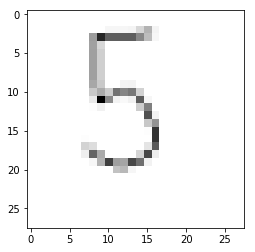

In [7]:
# test the neural network with our own images
# record to test
item = 0

# plot image
matplotlib.pyplot.imshow(our_own_dataset[item][1:].reshape(28,28), cmap='Greys', interpolation='None')

# correct answer is first value
correct_label = our_own_dataset[item][0]
# data is remaining values
inputs = our_own_dataset[item][1:]

# query the network
outputs = n.querry(inputs)
print (outputs)

# the index of the highest value corresponds to the label
label = numpy.argmax(outputs)
print("network says ", label)
# append correct or incorrect to list
if (label == correct_label):
    print ("match!")
else:
    print ("no match!")
    pass

In [ ]:
#run the backquery and see its output

# test input into the output layer
label = 9
# create the output signals for this label
targets = numpy.zeros(output_nodes) + 0.01
# all_values[0] is the target label for this record
targets[label] = 0.99
print(targets)

# get image data
image_data = n.backquery(targets)

# plot image data
matplotlib.pyplot.imshow(image_data.reshape(28,28), cmap='Greys', interpolation='None')
print("done")